In [1]:
import pandas as pd
import numpy as np

In [2]:
def split(X,Y):
    X_train = X[:-8]
    X_test = X[-8:]
    y_train = Y[:-8]
    y_test = Y[-8:]
    
    return X_train, X_test, y_train, y_test

## Neural Network

In [8]:
import tensorflow as tf

def neural_network(df):
    df = df.drop(columns=['Quarter end'])
    df = df.replace([np.inf, -np.inf], np.nan)
    df = df.dropna()
    X = df
    Y = X['Price']
    Y = Y[1:]
    
    #Getting Next Quarter %change of price 
    #This will be our target variable

    X = X[:-1]
    X = X.values
    Y = Y.values
    
    
    X_train, X_test, y_train, y_test = split( X, Y)
    X_train_means = np.mean(X_train, axis = 0)
    X_train_std = np.mean(X_train, axis = 0)
    X_train_scaled = (X_train - X_train_means)/X_train_std

    X_test_scaled = (X_test - X_train_means)/X_train_std
    
    Shape = np.shape(X_train_scaled)[1]
    
    model = tf.keras.models.Sequential([
      tf.keras.layers.Dense(20,input_shape=(Shape,),activation = 'relu'),
      tf.keras.layers.Dropout(0.2),
        #tf.keras.layers.Dense(8, activation='relu'),
      #tf.keras.layers.Dropout(0.2),
      tf.keras.layers.Dense(1, activation='tanh')
    ])
    
    Adam = tf.keras.optimizers.Adam(learning_rate=0.005, beta_1=0.9, beta_2=0.999, amsgrad=False)

    model.compile(optimizer=Adam,
                  loss='mean_squared_error',
                  metrics=['accuracy'])
    
    model.fit(X_train_scaled, y_train, epochs=500,shuffle=False)
    
    predictions = model.predict(X_test_scaled)
    
    return predictions,y_test

In [9]:
df = pd.read_csv("./new_clean_data/AAPL_quarterly_financial_data.csv", delimiter = ',')
df.head()

,Unnamed: 0,Quarter end,Assets,Current Assets,Liabilities,Current Liabilities,Shareholders equity,Revenue,Earnings,Earnings available for common stockholders,...,ROE,ROA,Book value of equity per share,P/B ratio,P/E ratio,Cumulative dividends per share,Equity to assets ratio,Net margin,Asset turnover,Current ratio
0,0,1993-12-31,0.016058,0.012353,-0.037095,-0.176394,0.093440,-0.129188,2.450972,2.450972,...,-0.614536,-0.622003,0.063492,0.012121,1.019663,1.333178,0.076130,-0.616188,-0.016216,0.229224
1,1,1994-07-01,0.016058,0.012353,-0.037095,-0.176394,0.093440,-0.129188,2.450972,2.450972,...,-0.614536,-0.622003,0.063492,0.012121,1.019663,1.333178,0.076130,-0.616188,-0.016216,0.229224
2,2,1994-09-30,0.035003,0.050813,0.014296,0.013986,0.061550,0.000000,0.000000,0.000000,...,-0.614536,-0.622003,0.059701,0.012121,1.019663,0.000000,0.025559,-0.616188,-0.016216,0.036279
3,3,1994-12-30,0.043422,0.053960,0.017659,-0.004786,0.074980,0.317266,0.361323,0.361323,...,-0.614536,-0.622003,0.070423,0.149701,1.019663,0.000000,0.030263,-0.616188,-0.016216,0.059028
4,4,1995-03-31,0.093439,0.093896,0.122854,0.159173,0.059329,-0.063559,-0.611702,-0.611702,...,-0.614536,-0.622003,0.052632,0.000000,1.019663,1.000000,-0.031102,-0.616188,-0.016216,-0.056312


In [10]:
preds , labels = neural_network(df)

Train on 93 samples
Epoch 1/500
93/93 [==============================] - 0s 3ms/sample - loss: 1.0026 - accuracy: 0.0000e+00
Epoch 2/500
93/93 [==============================] - 0s 54us/sample - loss: 1.0217 - accuracy: 0.0000e+00
Epoch 3/500
93/93 [==============================] - 0s 66us/sample - loss: 1.0253 - accuracy: 0.0000e+00
Epoch 4/500
93/93 [==============================] - 0s 63us/sample - loss: 1.0088 - accuracy: 0.0000e+00
Epoch 5/500
93/93 [==============================] - 0s 90us/sample - loss: 0.9623 - accuracy: 0.0000e+00
Epoch 6/500
93/93 [==============================] - 0s 63us/sample - loss: 1.0000 - accuracy: 0.0000e+00
Epoch 7/500
93/93 [==============================] - 0s 86us/sample - loss: 0.9457 - accuracy: 0.0000e+00
Epoch 8/500
93/93 [==============================] - 0s 90us/sample - loss: 0.9321 - accuracy: 0.0000e+00
Epoch 9/500
93/93 [==============================] - 0s 70us/sample - loss: 0.9374 - accuracy: 0.0000e+00
Epoch 10/500
93/93 [=======

93/93 [==============================] - 0s 57us/sample - loss: 0.5731 - accuracy: 0.0000e+00
Epoch 154/500
93/93 [==============================] - 0s 53us/sample - loss: 0.5577 - accuracy: 0.0000e+00
Epoch 155/500
93/93 [==============================] - 0s 60us/sample - loss: 0.5790 - accuracy: 0.0000e+00
Epoch 156/500
93/93 [==============================] - 0s 65us/sample - loss: 0.5691 - accuracy: 0.0000e+00
Epoch 157/500
93/93 [==============================] - 0s 49us/sample - loss: 0.5706 - accuracy: 0.0000e+00
Epoch 158/500
93/93 [==============================] - 0s 59us/sample - loss: 0.5451 - accuracy: 0.0000e+00
Epoch 159/500
93/93 [==============================] - 0s 48us/sample - loss: 0.5770 - accuracy: 0.0000e+00
Epoch 160/500
93/93 [==============================] - 0s 53us/sample - loss: 0.5493 - accuracy: 0.0000e+00
Epoch 161/500
93/93 [==============================] - 0s 62us/sample - loss: 0.5814 - accuracy: 0.0000e+00
Epoch 162/500
93/93 [=====================

Epoch 229/500
93/93 [==============================] - 0s 46us/sample - loss: 0.2996 - accuracy: 0.0000e+00
Epoch 230/500
93/93 [==============================] - 0s 58us/sample - loss: 0.3094 - accuracy: 0.0000e+00
Epoch 231/500
93/93 [==============================] - 0s 51us/sample - loss: 0.2863 - accuracy: 0.0000e+00
Epoch 232/500
93/93 [==============================] - 0s 49us/sample - loss: 0.2670 - accuracy: 0.0000e+00
Epoch 233/500
93/93 [==============================] - 0s 57us/sample - loss: 0.2349 - accuracy: 0.0000e+00
Epoch 234/500
93/93 [==============================] - 0s 54us/sample - loss: 0.2281 - accuracy: 0.0000e+00
Epoch 235/500
93/93 [==============================] - 0s 59us/sample - loss: 0.2466 - accuracy: 0.0000e+00
Epoch 236/500
93/93 [==============================] - 0s 60us/sample - loss: 0.2105 - accuracy: 0.0000e+00
Epoch 237/500
93/93 [==============================] - 0s 47us/sample - loss: 0.2248 - accuracy: 0.0000e+00
Epoch 238/500
93/93 [=======

Epoch 380/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0248 - accuracy: 0.0000e+00
Epoch 381/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0242 - accuracy: 0.0000e+00
Epoch 382/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0254 - accuracy: 0.0000e+00
Epoch 383/500
93/93 [==============================] - 0s 65us/sample - loss: 0.0243 - accuracy: 0.0000e+00
Epoch 384/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0216 - accuracy: 0.0000e+00
Epoch 385/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0283 - accuracy: 0.0000e+00
Epoch 386/500
93/93 [==============================] - 0s 64us/sample - loss: 0.0277 - accuracy: 0.0000e+00
Epoch 387/500
93/93 [==============================] - 0s 55us/sample - loss: 0.0316 - accuracy: 0.0000e+00
Epoch 388/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0268 - accuracy: 0.0000e+00
Epoch 389/500
93/93 [=======

### Running the neural network on all stock data

In [16]:
filenames = open('filenames.txt','r').read()
filenames = filenames.split('\n')[:-1]

all_preds = {}
all_labels = {}

i = 0

#for i in range(15):
for i in range(len(filenames)):
    try:
        df = pd.read_csv("./new_clean_data/"+str(filenames[i]), delimiter = ',')
        preds,labels = neural_network(df)
        preds = np.reshape(preds,(8,))
        all_preds[str(filenames[i])] = preds
        all_labels[str(filenames[i])] = labels
    except:
        s=2

Train on 40 samples
Epoch 1/500
40/40 [==============================] - 0s 6ms/sample - loss: 1.1042 - accuracy: 0.0000e+00
Epoch 2/500
40/40 [==============================] - 0s 103us/sample - loss: 1.0068 - accuracy: 0.0000e+00
Epoch 3/500
40/40 [==============================] - 0s 117us/sample - loss: 1.0302 - accuracy: 0.0000e+00
Epoch 4/500
40/40 [==============================] - 0s 99us/sample - loss: 1.0765 - accuracy: 0.0000e+00
Epoch 5/500
40/40 [==============================] - 0s 170us/sample - loss: 1.0284 - accuracy: 0.0000e+00
Epoch 6/500
40/40 [==============================] - 0s 110us/sample - loss: 1.0212 - accuracy: 0.0000e+00
Epoch 7/500
40/40 [==============================] - 0s 152us/sample - loss: 1.0308 - accuracy: 0.0000e+00
Epoch 8/500
40/40 [==============================] - 0s 163us/sample - loss: 1.0133 - accuracy: 0.0000e+00
Epoch 9/500
40/40 [==============================] - 0s 113us/sample - loss: 1.0450 - accuracy: 0.0000e+00
Epoch 10/500
40/40 [

40/40 [==============================] - 0s 101us/sample - loss: 0.9054 - accuracy: 0.0000e+00
Epoch 152/500
40/40 [==============================] - 0s 99us/sample - loss: 0.9307 - accuracy: 0.0000e+00
Epoch 153/500
40/40 [==============================] - 0s 103us/sample - loss: 0.9221 - accuracy: 0.0000e+00
Epoch 154/500
40/40 [==============================] - 0s 113us/sample - loss: 0.9261 - accuracy: 0.0000e+00
Epoch 155/500
40/40 [==============================] - 0s 106us/sample - loss: 0.8678 - accuracy: 0.0000e+00
Epoch 156/500
40/40 [==============================] - 0s 110us/sample - loss: 0.9323 - accuracy: 0.0000e+00
Epoch 157/500
40/40 [==============================] - 0s 102us/sample - loss: 0.8608 - accuracy: 0.0000e+00
Epoch 158/500
40/40 [==============================] - 0s 116us/sample - loss: 0.9304 - accuracy: 0.0000e+00
Epoch 159/500
40/40 [==============================] - 0s 126us/sample - loss: 0.8890 - accuracy: 0.0000e+00
Epoch 160/500
40/40 [=============

40/40 [==============================] - 0s 90us/sample - loss: 0.9298 - accuracy: 0.0000e+00
Epoch 302/500
40/40 [==============================] - 0s 117us/sample - loss: 0.9121 - accuracy: 0.0000e+00
Epoch 303/500
40/40 [==============================] - 0s 111us/sample - loss: 0.9005 - accuracy: 0.0000e+00
Epoch 304/500
40/40 [==============================] - 0s 95us/sample - loss: 0.9271 - accuracy: 0.0000e+00
Epoch 305/500
40/40 [==============================] - 0s 105us/sample - loss: 0.9343 - accuracy: 0.0000e+00
Epoch 306/500
40/40 [==============================] - 0s 105us/sample - loss: 0.8981 - accuracy: 0.0000e+00
Epoch 307/500
40/40 [==============================] - 0s 93us/sample - loss: 0.9211 - accuracy: 0.0000e+00
Epoch 308/500
40/40 [==============================] - 0s 106us/sample - loss: 0.9483 - accuracy: 0.0000e+00
Epoch 309/500
40/40 [==============================] - 0s 127us/sample - loss: 0.9270 - accuracy: 0.0000e+00
Epoch 310/500
40/40 [===============

40/40 [==============================] - 0s 104us/sample - loss: 0.8862 - accuracy: 0.0000e+00
Epoch 452/500
40/40 [==============================] - 0s 92us/sample - loss: 0.9213 - accuracy: 0.0000e+00
Epoch 453/500
40/40 [==============================] - 0s 104us/sample - loss: 0.9236 - accuracy: 0.0000e+00
Epoch 454/500
40/40 [==============================] - 0s 90us/sample - loss: 0.8930 - accuracy: 0.0000e+00
Epoch 455/500
40/40 [==============================] - 0s 99us/sample - loss: 0.9152 - accuracy: 0.0000e+00
Epoch 456/500
40/40 [==============================] - 0s 87us/sample - loss: 0.9189 - accuracy: 0.0000e+00
Epoch 457/500
40/40 [==============================] - 0s 126us/sample - loss: 0.8841 - accuracy: 0.0000e+00
Epoch 458/500
40/40 [==============================] - 0s 110us/sample - loss: 0.9142 - accuracy: 0.0000e+00
Epoch 459/500
40/40 [==============================] - 0s 93us/sample - loss: 0.9441 - accuracy: 0.0000e+00
Epoch 460/500
40/40 [=================

65/65 [==============================] - 0s 115us/sample - loss: 0.8404 - accuracy: 0.0769
Epoch 107/500
65/65 [==============================] - 0s 91us/sample - loss: 0.8624 - accuracy: 0.0615
Epoch 108/500
65/65 [==============================] - 0s 88us/sample - loss: 0.8578 - accuracy: 0.0769
Epoch 109/500
65/65 [==============================] - 0s 90us/sample - loss: 0.8024 - accuracy: 0.0462
Epoch 110/500
65/65 [==============================] - 0s 72us/sample - loss: 0.9243 - accuracy: 0.0923
Epoch 111/500
65/65 [==============================] - 0s 116us/sample - loss: 0.8693 - accuracy: 0.1077
Epoch 112/500
65/65 [==============================] - 0s 72us/sample - loss: 0.8599 - accuracy: 0.0923
Epoch 113/500
65/65 [==============================] - 0s 101us/sample - loss: 0.9158 - accuracy: 0.0769
Epoch 114/500
65/65 [==============================] - 0s 94us/sample - loss: 0.8113 - accuracy: 0.0923
Epoch 115/500
65/65 [==============================] - 0s 79us/sample - los

65/65 [==============================] - 0s 81us/sample - loss: 0.8185 - accuracy: 0.0615
Epoch 263/500
65/65 [==============================] - 0s 66us/sample - loss: 0.8015 - accuracy: 0.0615
Epoch 264/500
65/65 [==============================] - 0s 67us/sample - loss: 0.8362 - accuracy: 0.0615
Epoch 265/500
65/65 [==============================] - 0s 70us/sample - loss: 0.8026 - accuracy: 0.0615
Epoch 266/500
65/65 [==============================] - 0s 68us/sample - loss: 0.8196 - accuracy: 0.0615
Epoch 267/500
65/65 [==============================] - 0s 76us/sample - loss: 0.8143 - accuracy: 0.0462
Epoch 268/500
65/65 [==============================] - 0s 74us/sample - loss: 0.8103 - accuracy: 0.0462
Epoch 269/500
65/65 [==============================] - 0s 81us/sample - loss: 0.8622 - accuracy: 0.0615
Epoch 270/500
65/65 [==============================] - 0s 69us/sample - loss: 0.8438 - accuracy: 0.0615
Epoch 271/500
65/65 [==============================] - 0s 72us/sample - loss: 

65/65 [==============================] - 0s 78us/sample - loss: 0.7595 - accuracy: 0.0615
Epoch 419/500
65/65 [==============================] - 0s 120us/sample - loss: 0.7690 - accuracy: 0.0615
Epoch 420/500
65/65 [==============================] - 0s 89us/sample - loss: 0.7736 - accuracy: 0.0615
Epoch 421/500
65/65 [==============================] - 0s 97us/sample - loss: 0.7658 - accuracy: 0.0615
Epoch 422/500
65/65 [==============================] - 0s 106us/sample - loss: 0.7643 - accuracy: 0.0615
Epoch 423/500
65/65 [==============================] - 0s 77us/sample - loss: 0.7255 - accuracy: 0.0769
Epoch 424/500
65/65 [==============================] - 0s 130us/sample - loss: 0.7718 - accuracy: 0.0615
Epoch 425/500
65/65 [==============================] - 0s 79us/sample - loss: 0.7366 - accuracy: 0.0462
Epoch 426/500
65/65 [==============================] - 0s 93us/sample - loss: 0.7311 - accuracy: 0.0615
Epoch 427/500
65/65 [==============================] - 0s 107us/sample - lo

79/79 [==============================] - 0s 69us/sample - loss: 1.0642 - accuracy: 0.0000e+00
Epoch 73/500
79/79 [==============================] - 0s 78us/sample - loss: 1.0642 - accuracy: 0.0000e+00
Epoch 74/500
79/79 [==============================] - 0s 71us/sample - loss: 1.0642 - accuracy: 0.0000e+00
Epoch 75/500
79/79 [==============================] - 0s 76us/sample - loss: 1.0540 - accuracy: 0.0000e+00
Epoch 76/500
79/79 [==============================] - 0s 80us/sample - loss: 1.0642 - accuracy: 0.0000e+00
Epoch 77/500
79/79 [==============================] - 0s 62us/sample - loss: 1.0589 - accuracy: 0.0000e+00
Epoch 78/500
79/79 [==============================] - 0s 74us/sample - loss: 1.0627 - accuracy: 0.0000e+00
Epoch 79/500
79/79 [==============================] - 0s 69us/sample - loss: 1.0715 - accuracy: 0.0000e+00
Epoch 80/500
79/79 [==============================] - 0s 67us/sample - loss: 1.0642 - accuracy: 0.0000e+00
Epoch 81/500
79/79 [==============================

Epoch 224/500
79/79 [==============================] - 0s 75us/sample - loss: 1.0642 - accuracy: 0.0000e+00
Epoch 225/500
79/79 [==============================] - 0s 76us/sample - loss: 1.0642 - accuracy: 0.0000e+00
Epoch 226/500
79/79 [==============================] - 0s 63us/sample - loss: 1.0642 - accuracy: 0.0000e+00
Epoch 227/500
79/79 [==============================] - 0s 72us/sample - loss: 1.0714 - accuracy: 0.0000e+00
Epoch 228/500
79/79 [==============================] - 0s 80us/sample - loss: 1.0642 - accuracy: 0.0000e+00
Epoch 229/500
79/79 [==============================] - 0s 78us/sample - loss: 1.0642 - accuracy: 0.0000e+00
Epoch 230/500
79/79 [==============================] - 0s 72us/sample - loss: 1.0642 - accuracy: 0.0000e+00
Epoch 231/500
79/79 [==============================] - 0s 83us/sample - loss: 1.0642 - accuracy: 0.0000e+00
Epoch 232/500
79/79 [==============================] - 0s 70us/sample - loss: 1.0642 - accuracy: 0.0000e+00
Epoch 233/500
79/79 [=======

Epoch 375/500
79/79 [==============================] - 0s 66us/sample - loss: 1.0642 - accuracy: 0.0000e+00
Epoch 376/500
79/79 [==============================] - 0s 67us/sample - loss: 1.0588 - accuracy: 0.0000e+00
Epoch 377/500
79/79 [==============================] - 0s 59us/sample - loss: 1.0642 - accuracy: 0.0000e+00
Epoch 378/500
79/79 [==============================] - 0s 64us/sample - loss: 1.0642 - accuracy: 0.0000e+00
Epoch 379/500
79/79 [==============================] - 0s 56us/sample - loss: 1.0642 - accuracy: 0.0000e+00
Epoch 380/500
79/79 [==============================] - 0s 52us/sample - loss: 1.0642 - accuracy: 0.0000e+00
Epoch 381/500
79/79 [==============================] - 0s 74us/sample - loss: 1.0642 - accuracy: 0.0000e+00
Epoch 382/500
79/79 [==============================] - 0s 55us/sample - loss: 1.0642 - accuracy: 0.0000e+00
Epoch 383/500
79/79 [==============================] - 0s 59us/sample - loss: 1.0642 - accuracy: 0.0000e+00
Epoch 384/500
79/79 [=======

93/93 [==============================] - 0s 62us/sample - loss: 0.7921 - accuracy: 0.0000e+00
Epoch 30/500
93/93 [==============================] - 0s 74us/sample - loss: 0.7654 - accuracy: 0.0000e+00
Epoch 31/500
93/93 [==============================] - 0s 61us/sample - loss: 0.7484 - accuracy: 0.0000e+00
Epoch 32/500
93/93 [==============================] - 0s 52us/sample - loss: 0.7842 - accuracy: 0.0000e+00
Epoch 33/500
93/93 [==============================] - 0s 65us/sample - loss: 0.7018 - accuracy: 0.0000e+00
Epoch 34/500
93/93 [==============================] - 0s 49us/sample - loss: 0.7498 - accuracy: 0.0000e+00
Epoch 35/500
93/93 [==============================] - 0s 53us/sample - loss: 0.6914 - accuracy: 0.0000e+00
Epoch 36/500
93/93 [==============================] - 0s 61us/sample - loss: 0.7657 - accuracy: 0.0000e+00
Epoch 37/500
93/93 [==============================] - 0s 56us/sample - loss: 0.8184 - accuracy: 0.0000e+00
Epoch 38/500
93/93 [==============================

Epoch 181/500
93/93 [==============================] - 0s 60us/sample - loss: 0.0757 - accuracy: 0.0000e+00
Epoch 182/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0793 - accuracy: 0.0000e+00
Epoch 183/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0575 - accuracy: 0.0000e+00
Epoch 184/500
93/93 [==============================] - 0s 59us/sample - loss: 0.0994 - accuracy: 0.0000e+00
Epoch 185/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0579 - accuracy: 0.0000e+00
Epoch 186/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0422 - accuracy: 0.0000e+00
Epoch 187/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0500 - accuracy: 0.0000e+00
Epoch 188/500
93/93 [==============================] - 0s 61us/sample - loss: 0.0480 - accuracy: 0.0000e+00
Epoch 189/500
93/93 [==============================] - 0s 61us/sample - loss: 0.0390 - accuracy: 0.0000e+00
Epoch 190/500
93/93 [=======

Epoch 332/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0190 - accuracy: 0.0000e+00
Epoch 333/500
93/93 [==============================] - 0s 61us/sample - loss: 0.0194 - accuracy: 0.0000e+00
Epoch 334/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0245 - accuracy: 0.0000e+00
Epoch 335/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0179 - accuracy: 0.0000e+00
Epoch 336/500
93/93 [==============================] - 0s 61us/sample - loss: 0.0196 - accuracy: 0.0000e+00
Epoch 337/500
93/93 [==============================] - 0s 56us/sample - loss: 0.0237 - accuracy: 0.0000e+00
Epoch 338/500
93/93 [==============================] - 0s 56us/sample - loss: 0.0187 - accuracy: 0.0000e+00
Epoch 339/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0174 - accuracy: 0.0000e+00
Epoch 340/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0207 - accuracy: 0.0000e+00
Epoch 341/500
93/93 [=======

Epoch 483/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0150 - accuracy: 0.0000e+00
Epoch 484/500
93/93 [==============================] - 0s 45us/sample - loss: 0.0164 - accuracy: 0.0000e+00
Epoch 485/500
93/93 [==============================] - 0s 57us/sample - loss: 0.0119 - accuracy: 0.0000e+00
Epoch 486/500
93/93 [==============================] - 0s 55us/sample - loss: 0.0141 - accuracy: 0.0000e+00
Epoch 487/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0162 - accuracy: 0.0000e+00
Epoch 488/500
93/93 [==============================] - 0s 68us/sample - loss: 0.0165 - accuracy: 0.0000e+00
Epoch 489/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0149 - accuracy: 0.0000e+00
Epoch 490/500
93/93 [==============================] - 0s 57us/sample - loss: 0.0166 - accuracy: 0.0000e+00
Epoch 491/500
93/93 [==============================] - 0s 77us/sample - loss: 0.0144 - accuracy: 0.0000e+00
Epoch 492/500
93/93 [=======

85/85 [==============================] - 0s 62us/sample - loss: 0.6309 - accuracy: 0.0000e+00
Epoch 136/500
85/85 [==============================] - 0s 64us/sample - loss: 0.6603 - accuracy: 0.0000e+00
Epoch 137/500
85/85 [==============================] - 0s 50us/sample - loss: 0.6571 - accuracy: 0.0000e+00
Epoch 138/500
85/85 [==============================] - 0s 60us/sample - loss: 0.6143 - accuracy: 0.0000e+00
Epoch 139/500
85/85 [==============================] - 0s 67us/sample - loss: 0.6435 - accuracy: 0.0000e+00
Epoch 140/500
85/85 [==============================] - 0s 61us/sample - loss: 0.5827 - accuracy: 0.0000e+00
Epoch 141/500
85/85 [==============================] - 0s 73us/sample - loss: 0.6775 - accuracy: 0.0000e+00
Epoch 142/500
85/85 [==============================] - 0s 52us/sample - loss: 0.6213 - accuracy: 0.0000e+00
Epoch 143/500
85/85 [==============================] - 0s 60us/sample - loss: 0.6557 - accuracy: 0.0000e+00
Epoch 144/500
85/85 [=====================

Epoch 211/500
85/85 [==============================] - 0s 57us/sample - loss: 0.2270 - accuracy: 0.0000e+00
Epoch 212/500
85/85 [==============================] - 0s 68us/sample - loss: 0.2219 - accuracy: 0.0000e+00
Epoch 213/500
85/85 [==============================] - 0s 64us/sample - loss: 0.2289 - accuracy: 0.0000e+00
Epoch 214/500
85/85 [==============================] - 0s 50us/sample - loss: 0.1952 - accuracy: 0.0000e+00
Epoch 215/500
85/85 [==============================] - 0s 56us/sample - loss: 0.2437 - accuracy: 0.0000e+00
Epoch 216/500
85/85 [==============================] - 0s 67us/sample - loss: 0.2236 - accuracy: 0.0000e+00
Epoch 217/500
85/85 [==============================] - 0s 54us/sample - loss: 0.2349 - accuracy: 0.0000e+00
Epoch 218/500
85/85 [==============================] - 0s 65us/sample - loss: 0.2090 - accuracy: 0.0000e+00
Epoch 219/500
85/85 [==============================] - 0s 63us/sample - loss: 0.2422 - accuracy: 0.0000e+00
Epoch 220/500
85/85 [=======

85/85 [==============================] - 0s 76us/sample - loss: 0.1545 - accuracy: 0.0000e+00
Epoch 362/500
85/85 [==============================] - 0s 55us/sample - loss: 0.1627 - accuracy: 0.0000e+00
Epoch 363/500
85/85 [==============================] - 0s 58us/sample - loss: 0.1527 - accuracy: 0.0000e+00
Epoch 364/500
85/85 [==============================] - 0s 61us/sample - loss: 0.1462 - accuracy: 0.0000e+00
Epoch 365/500
85/85 [==============================] - 0s 59us/sample - loss: 0.1923 - accuracy: 0.0000e+00
Epoch 366/500
85/85 [==============================] - 0s 55us/sample - loss: 0.1499 - accuracy: 0.0000e+00
Epoch 367/500
85/85 [==============================] - 0s 77us/sample - loss: 0.1651 - accuracy: 0.0000e+00
Epoch 368/500
85/85 [==============================] - 0s 52us/sample - loss: 0.1768 - accuracy: 0.0000e+00
Epoch 369/500
85/85 [==============================] - 0s 54us/sample - loss: 0.1601 - accuracy: 0.0000e+00
Epoch 370/500
85/85 [=====================

Epoch 437/500
85/85 [==============================] - 0s 60us/sample - loss: 0.1399 - accuracy: 0.0000e+00
Epoch 438/500
85/85 [==============================] - 0s 56us/sample - loss: 0.1438 - accuracy: 0.0000e+00
Epoch 439/500
85/85 [==============================] - 0s 62us/sample - loss: 0.1440 - accuracy: 0.0000e+00
Epoch 440/500
85/85 [==============================] - 0s 62us/sample - loss: 0.1663 - accuracy: 0.0000e+00
Epoch 441/500
85/85 [==============================] - 0s 57us/sample - loss: 0.1715 - accuracy: 0.0000e+00
Epoch 442/500
85/85 [==============================] - 0s 54us/sample - loss: 0.1550 - accuracy: 0.0000e+00
Epoch 443/500
85/85 [==============================] - 0s 58us/sample - loss: 0.1450 - accuracy: 0.0000e+00
Epoch 444/500
85/85 [==============================] - 0s 58us/sample - loss: 0.1736 - accuracy: 0.0000e+00
Epoch 445/500
85/85 [==============================] - 0s 60us/sample - loss: 0.1516 - accuracy: 0.0000e+00
Epoch 446/500
85/85 [=======

92/92 [==============================] - 0s 49us/sample - loss: 0.9797 - accuracy: 0.0000e+00
Epoch 89/500
92/92 [==============================] - 0s 64us/sample - loss: 0.9860 - accuracy: 0.0000e+00
Epoch 90/500
92/92 [==============================] - 0s 62us/sample - loss: 0.9864 - accuracy: 0.0000e+00
Epoch 91/500
92/92 [==============================] - 0s 53us/sample - loss: 0.9754 - accuracy: 0.0000e+00
Epoch 92/500
92/92 [==============================] - 0s 52us/sample - loss: 0.9731 - accuracy: 0.0000e+00
Epoch 93/500
92/92 [==============================] - 0s 53us/sample - loss: 0.9831 - accuracy: 0.0000e+00
Epoch 94/500
92/92 [==============================] - 0s 50us/sample - loss: 0.9737 - accuracy: 0.0000e+00
Epoch 95/500
92/92 [==============================] - 0s 51us/sample - loss: 0.9839 - accuracy: 0.0000e+00
Epoch 96/500
92/92 [==============================] - 0s 56us/sample - loss: 0.9743 - accuracy: 0.0000e+00
Epoch 97/500
92/92 [==============================

92/92 [==============================] - 0s 56us/sample - loss: 0.9625 - accuracy: 0.0000e+00
Epoch 165/500
92/92 [==============================] - 0s 60us/sample - loss: 0.9949 - accuracy: 0.0000e+00
Epoch 166/500
92/92 [==============================] - 0s 64us/sample - loss: 0.9933 - accuracy: 0.0000e+00
Epoch 167/500
92/92 [==============================] - 0s 49us/sample - loss: 0.9834 - accuracy: 0.0000e+00
Epoch 168/500
92/92 [==============================] - 0s 65us/sample - loss: 0.9724 - accuracy: 0.0000e+00
Epoch 169/500
92/92 [==============================] - 0s 52us/sample - loss: 0.9679 - accuracy: 0.0000e+00
Epoch 170/500
92/92 [==============================] - 0s 53us/sample - loss: 0.9752 - accuracy: 0.0000e+00
Epoch 171/500
92/92 [==============================] - 0s 60us/sample - loss: 0.9747 - accuracy: 0.0000e+00
Epoch 172/500
92/92 [==============================] - 0s 51us/sample - loss: 0.9733 - accuracy: 0.0000e+00
Epoch 173/500
92/92 [=====================

Epoch 240/500
92/92 [==============================] - 0s 57us/sample - loss: 0.9853 - accuracy: 0.0000e+00
Epoch 241/500
92/92 [==============================] - 0s 59us/sample - loss: 0.9813 - accuracy: 0.0000e+00
Epoch 242/500
92/92 [==============================] - 0s 67us/sample - loss: 0.9826 - accuracy: 0.0000e+00
Epoch 243/500
92/92 [==============================] - 0s 53us/sample - loss: 0.9767 - accuracy: 0.0000e+00
Epoch 244/500
92/92 [==============================] - 0s 51us/sample - loss: 0.9807 - accuracy: 0.0000e+00
Epoch 245/500
92/92 [==============================] - 0s 65us/sample - loss: 0.9834 - accuracy: 0.0000e+00
Epoch 246/500
92/92 [==============================] - 0s 57us/sample - loss: 0.9877 - accuracy: 0.0000e+00
Epoch 247/500
92/92 [==============================] - 0s 46us/sample - loss: 0.9890 - accuracy: 0.0000e+00
Epoch 248/500
92/92 [==============================] - 0s 63us/sample - loss: 0.9704 - accuracy: 0.0000e+00
Epoch 249/500
92/92 [=======

Epoch 391/500
92/92 [==============================] - 0s 54us/sample - loss: 0.9799 - accuracy: 0.0000e+00
Epoch 392/500
92/92 [==============================] - ETA: 0s - loss: 0.9382 - accuracy: 0.0000e+ - 0s 69us/sample - loss: 0.9874 - accuracy: 0.0000e+00
Epoch 393/500
92/92 [==============================] - 0s 56us/sample - loss: 0.9797 - accuracy: 0.0000e+00
Epoch 394/500
92/92 [==============================] - 0s 58us/sample - loss: 0.9842 - accuracy: 0.0000e+00
Epoch 395/500
92/92 [==============================] - 0s 53us/sample - loss: 0.9760 - accuracy: 0.0000e+00
Epoch 396/500
92/92 [==============================] - 0s 57us/sample - loss: 0.9796 - accuracy: 0.0000e+00
Epoch 397/500
92/92 [==============================] - 0s 55us/sample - loss: 0.9815 - accuracy: 0.0000e+00
Epoch 398/500
92/92 [==============================] - 0s 50us/sample - loss: 0.9845 - accuracy: 0.0000e+00
Epoch 399/500
92/92 [==============================] - 0s 66us/sample - loss: 0.9836 - acc

87/87 [==============================] - 0s 55us/sample - loss: 0.6396 - accuracy: 0.0000e+00
Epoch 42/500
87/87 [==============================] - 0s 60us/sample - loss: 0.5868 - accuracy: 0.0000e+00
Epoch 43/500
87/87 [==============================] - 0s 68us/sample - loss: 0.5815 - accuracy: 0.0000e+00
Epoch 44/500
87/87 [==============================] - 0s 57us/sample - loss: 0.6168 - accuracy: 0.0000e+00
Epoch 45/500
87/87 [==============================] - 0s 63us/sample - loss: 0.5951 - accuracy: 0.0000e+00
Epoch 46/500
87/87 [==============================] - 0s 64us/sample - loss: 0.6499 - accuracy: 0.0000e+00
Epoch 47/500
87/87 [==============================] - 0s 51us/sample - loss: 0.6124 - accuracy: 0.0000e+00
Epoch 48/500
87/87 [==============================] - 0s 68us/sample - loss: 0.6687 - accuracy: 0.0000e+00
Epoch 49/500
87/87 [==============================] - 0s 62us/sample - loss: 0.6159 - accuracy: 0.0000e+00
Epoch 50/500
87/87 [==============================

Epoch 193/500
87/87 [==============================] - 0s 57us/sample - loss: 0.1021 - accuracy: 0.0000e+00
Epoch 194/500
87/87 [==============================] - 0s 61us/sample - loss: 0.1025 - accuracy: 0.0000e+00
Epoch 195/500
87/87 [==============================] - 0s 55us/sample - loss: 0.1119 - accuracy: 0.0000e+00
Epoch 196/500
87/87 [==============================] - 0s 63us/sample - loss: 0.1070 - accuracy: 0.0000e+00
Epoch 197/500
87/87 [==============================] - 0s 54us/sample - loss: 0.1126 - accuracy: 0.0000e+00
Epoch 198/500
87/87 [==============================] - 0s 54us/sample - loss: 0.1294 - accuracy: 0.0000e+00
Epoch 199/500
87/87 [==============================] - 0s 58us/sample - loss: 0.1079 - accuracy: 0.0000e+00
Epoch 200/500
87/87 [==============================] - 0s 52us/sample - loss: 0.1083 - accuracy: 0.0000e+00
Epoch 201/500
87/87 [==============================] - 0s 53us/sample - loss: 0.1093 - accuracy: 0.0000e+00
Epoch 202/500
87/87 [=======

Epoch 344/500
87/87 [==============================] - 0s 54us/sample - loss: 0.0603 - accuracy: 0.0000e+00
Epoch 345/500
87/87 [==============================] - 0s 64us/sample - loss: 0.0634 - accuracy: 0.0000e+00
Epoch 346/500
87/87 [==============================] - 0s 74us/sample - loss: 0.0506 - accuracy: 0.0000e+00
Epoch 347/500
87/87 [==============================] - 0s 52us/sample - loss: 0.0400 - accuracy: 0.0000e+00
Epoch 348/500
87/87 [==============================] - 0s 67us/sample - loss: 0.0361 - accuracy: 0.0000e+00
Epoch 349/500
87/87 [==============================] - 0s 59us/sample - loss: 0.0346 - accuracy: 0.0000e+00
Epoch 350/500
87/87 [==============================] - 0s 51us/sample - loss: 0.0588 - accuracy: 0.0000e+00
Epoch 351/500
87/87 [==============================] - 0s 67us/sample - loss: 0.0629 - accuracy: 0.0000e+00
Epoch 352/500
87/87 [==============================] - 0s 59us/sample - loss: 0.0459 - accuracy: 0.0000e+00
Epoch 353/500
87/87 [=======

Epoch 495/500
87/87 [==============================] - 0s 70us/sample - loss: 0.0222 - accuracy: 0.0000e+00
Epoch 496/500
87/87 [==============================] - 0s 67us/sample - loss: 0.0169 - accuracy: 0.0000e+00
Epoch 497/500
87/87 [==============================] - 0s 67us/sample - loss: 0.0200 - accuracy: 0.0000e+00
Epoch 498/500
87/87 [==============================] - 0s 68us/sample - loss: 0.0267 - accuracy: 0.0000e+00
Epoch 499/500
87/87 [==============================] - 0s 64us/sample - loss: 0.0442 - accuracy: 0.0000e+00
Epoch 500/500
87/87 [==============================] - 0s 69us/sample - loss: 0.0342 - accuracy: 0.0000e+00
Train on 52 samples
Epoch 1/500
52/52 [==============================] - 0s 5ms/sample - loss: 0.9679 - accuracy: 0.0000e+00
Epoch 2/500
52/52 [==============================] - 0s 72us/sample - loss: 1.0053 - accuracy: 0.0000e+00
Epoch 3/500
52/52 [==============================] - 0s 83us/sample - loss: 0.9768 - accuracy: 0.0000e+00
Epoch 4/500
52/

52/52 [==============================] - 0s 72us/sample - loss: 0.9917 - accuracy: 0.0000e+00
Epoch 148/500
52/52 [==============================] - 0s 96us/sample - loss: 1.0327 - accuracy: 0.0000e+00
Epoch 149/500
52/52 [==============================] - 0s 71us/sample - loss: 1.0091 - accuracy: 0.0000e+00
Epoch 150/500
52/52 [==============================] - 0s 91us/sample - loss: 0.9891 - accuracy: 0.0000e+00
Epoch 151/500
52/52 [==============================] - 0s 83us/sample - loss: 0.9734 - accuracy: 0.0000e+00
Epoch 152/500
52/52 [==============================] - 0s 74us/sample - loss: 0.9783 - accuracy: 0.0000e+00
Epoch 153/500
52/52 [==============================] - 0s 81us/sample - loss: 0.9859 - accuracy: 0.0000e+00
Epoch 154/500
52/52 [==============================] - 0s 119us/sample - loss: 0.9849 - accuracy: 0.0000e+00
Epoch 155/500
52/52 [==============================] - 0s 58us/sample - loss: 0.9920 - accuracy: 0.0000e+00
Epoch 156/500
52/52 [====================

Epoch 223/500
52/52 [==============================] - 0s 70us/sample - loss: 1.0038 - accuracy: 0.0000e+00
Epoch 224/500
52/52 [==============================] - 0s 74us/sample - loss: 0.9990 - accuracy: 0.0000e+00
Epoch 225/500
52/52 [==============================] - 0s 89us/sample - loss: 0.9785 - accuracy: 0.0000e+00
Epoch 226/500
52/52 [==============================] - 0s 72us/sample - loss: 1.0033 - accuracy: 0.0000e+00
Epoch 227/500
52/52 [==============================] - 0s 94us/sample - loss: 0.9936 - accuracy: 0.0000e+00
Epoch 228/500
52/52 [==============================] - 0s 87us/sample - loss: 1.0102 - accuracy: 0.0000e+00
Epoch 229/500
52/52 [==============================] - 0s 75us/sample - loss: 1.0186 - accuracy: 0.0000e+00
Epoch 230/500
52/52 [==============================] - 0s 83us/sample - loss: 0.9657 - accuracy: 0.0000e+00
Epoch 231/500
52/52 [==============================] - 0s 76us/sample - loss: 0.9797 - accuracy: 0.0000e+00
Epoch 232/500
52/52 [=======

Epoch 374/500
52/52 [==============================] - 0s 82us/sample - loss: 0.9446 - accuracy: 0.0000e+00
Epoch 375/500
52/52 [==============================] - 0s 82us/sample - loss: 0.9694 - accuracy: 0.0000e+00
Epoch 376/500
52/52 [==============================] - 0s 75us/sample - loss: 0.9839 - accuracy: 0.0000e+00
Epoch 377/500
52/52 [==============================] - 0s 101us/sample - loss: 0.9970 - accuracy: 0.0000e+00
Epoch 378/500
52/52 [==============================] - 0s 84us/sample - loss: 0.9886 - accuracy: 0.0000e+00
Epoch 379/500
52/52 [==============================] - 0s 72us/sample - loss: 0.9630 - accuracy: 0.0000e+00
Epoch 380/500
52/52 [==============================] - 0s 84us/sample - loss: 0.9670 - accuracy: 0.0000e+00
Epoch 381/500
52/52 [==============================] - 0s 83us/sample - loss: 0.9798 - accuracy: 0.0000e+00
Epoch 382/500
52/52 [==============================] - 0s 84us/sample - loss: 0.9717 - accuracy: 0.0000e+00
Epoch 383/500
52/52 [======

94/94 [==============================] - 0s 65us/sample - loss: 0.8041 - accuracy: 0.0000e+00
Epoch 26/500
94/94 [==============================] - 0s 65us/sample - loss: 0.9030 - accuracy: 0.0000e+00
Epoch 27/500
94/94 [==============================] - 0s 46us/sample - loss: 0.8279 - accuracy: 0.0000e+00
Epoch 28/500
94/94 [==============================] - 0s 61us/sample - loss: 0.8197 - accuracy: 0.0000e+00
Epoch 29/500
94/94 [==============================] - 0s 54us/sample - loss: 0.8294 - accuracy: 0.0000e+00
Epoch 30/500
94/94 [==============================] - 0s 49us/sample - loss: 0.8376 - accuracy: 0.0000e+00
Epoch 31/500
94/94 [==============================] - 0s 55us/sample - loss: 0.8271 - accuracy: 0.0000e+00
Epoch 32/500
94/94 [==============================] - 0s 54us/sample - loss: 0.7816 - accuracy: 0.0000e+00
Epoch 33/500
94/94 [==============================] - 0s 42us/sample - loss: 0.8357 - accuracy: 0.0000e+00
Epoch 34/500
94/94 [==============================

Epoch 177/500
94/94 [==============================] - 0s 57us/sample - loss: 0.4372 - accuracy: 0.0000e+00
Epoch 178/500
94/94 [==============================] - 0s 52us/sample - loss: 0.4231 - accuracy: 0.0000e+00
Epoch 179/500
94/94 [==============================] - 0s 53us/sample - loss: 0.4318 - accuracy: 0.0000e+00
Epoch 180/500
94/94 [==============================] - 0s 58us/sample - loss: 0.4205 - accuracy: 0.0000e+00
Epoch 181/500
94/94 [==============================] - 0s 61us/sample - loss: 0.4378 - accuracy: 0.0000e+00
Epoch 182/500
94/94 [==============================] - 0s 66us/sample - loss: 0.4210 - accuracy: 0.0000e+00
Epoch 183/500
94/94 [==============================] - 0s 52us/sample - loss: 0.4359 - accuracy: 0.0000e+00
Epoch 184/500
94/94 [==============================] - 0s 56us/sample - loss: 0.4299 - accuracy: 0.0000e+00
Epoch 185/500
94/94 [==============================] - 0s 58us/sample - loss: 0.4231 - accuracy: 0.0000e+00
Epoch 186/500
94/94 [=======

Epoch 328/500
94/94 [==============================] - 0s 59us/sample - loss: 0.3753 - accuracy: 0.0000e+00
Epoch 329/500
94/94 [==============================] - 0s 67us/sample - loss: 0.3770 - accuracy: 0.0000e+00
Epoch 330/500
94/94 [==============================] - 0s 57us/sample - loss: 0.3742 - accuracy: 0.0000e+00
Epoch 331/500
94/94 [==============================] - 0s 55us/sample - loss: 0.3749 - accuracy: 0.0000e+00
Epoch 332/500
94/94 [==============================] - 0s 57us/sample - loss: 0.3590 - accuracy: 0.0000e+00
Epoch 333/500
94/94 [==============================] - 0s 53us/sample - loss: 0.3745 - accuracy: 0.0000e+00
Epoch 334/500
94/94 [==============================] - 0s 50us/sample - loss: 0.3831 - accuracy: 0.0000e+00
Epoch 335/500
94/94 [==============================] - 0s 56us/sample - loss: 0.3689 - accuracy: 0.0000e+00
Epoch 336/500
94/94 [==============================] - 0s 50us/sample - loss: 0.3667 - accuracy: 0.0000e+00
Epoch 337/500
94/94 [=======

Epoch 479/500
94/94 [==============================] - 0s 64us/sample - loss: 0.3552 - accuracy: 0.0000e+00
Epoch 480/500
94/94 [==============================] - 0s 58us/sample - loss: 0.3512 - accuracy: 0.0000e+00
Epoch 481/500
94/94 [==============================] - 0s 49us/sample - loss: 0.3503 - accuracy: 0.0000e+00
Epoch 482/500
94/94 [==============================] - 0s 57us/sample - loss: 0.3569 - accuracy: 0.0000e+00
Epoch 483/500
94/94 [==============================] - 0s 60us/sample - loss: 0.3727 - accuracy: 0.0000e+00
Epoch 484/500
94/94 [==============================] - 0s 53us/sample - loss: 0.3436 - accuracy: 0.0000e+00
Epoch 485/500
94/94 [==============================] - 0s 55us/sample - loss: 0.3214 - accuracy: 0.0000e+00
Epoch 486/500
94/94 [==============================] - 0s 53us/sample - loss: 0.3534 - accuracy: 0.0000e+00
Epoch 487/500
94/94 [==============================] - 0s 49us/sample - loss: 0.3808 - accuracy: 0.0000e+00
Epoch 488/500
94/94 [=======

89/89 [==============================] - 0s 55us/sample - loss: 0.8947 - accuracy: 0.0000e+00
Epoch 132/500
89/89 [==============================] - 0s 56us/sample - loss: 0.8862 - accuracy: 0.0000e+00
Epoch 133/500
89/89 [==============================] - 0s 55us/sample - loss: 0.8670 - accuracy: 0.0000e+00
Epoch 134/500
89/89 [==============================] - 0s 58us/sample - loss: 0.8805 - accuracy: 0.0000e+00
Epoch 135/500
89/89 [==============================] - 0s 50us/sample - loss: 0.8544 - accuracy: 0.0000e+00
Epoch 136/500
89/89 [==============================] - 0s 73us/sample - loss: 0.8722 - accuracy: 0.0000e+00
Epoch 137/500
89/89 [==============================] - 0s 62us/sample - loss: 0.8805 - accuracy: 0.0000e+00
Epoch 138/500
89/89 [==============================] - 0s 56us/sample - loss: 0.8560 - accuracy: 0.0000e+00
Epoch 139/500
89/89 [==============================] - 0s 58us/sample - loss: 0.8615 - accuracy: 0.0000e+00
Epoch 140/500
89/89 [=====================

Epoch 207/500
89/89 [==============================] - 0s 70us/sample - loss: 0.8471 - accuracy: 0.0000e+00
Epoch 208/500
89/89 [==============================] - 0s 71us/sample - loss: 0.8292 - accuracy: 0.0000e+00
Epoch 209/500
89/89 [==============================] - 0s 58us/sample - loss: 0.8404 - accuracy: 0.0000e+00
Epoch 210/500
89/89 [==============================] - 0s 66us/sample - loss: 0.8676 - accuracy: 0.0000e+00
Epoch 211/500
89/89 [==============================] - 0s 60us/sample - loss: 0.8766 - accuracy: 0.0000e+00
Epoch 212/500
89/89 [==============================] - 0s 77us/sample - loss: 0.8394 - accuracy: 0.0000e+00
Epoch 213/500
89/89 [==============================] - 0s 52us/sample - loss: 0.8865 - accuracy: 0.0000e+00
Epoch 214/500
89/89 [==============================] - 0s 51us/sample - loss: 0.8663 - accuracy: 0.0000e+00
Epoch 215/500
89/89 [==============================] - 0s 65us/sample - loss: 0.9013 - accuracy: 0.0000e+00
Epoch 216/500
89/89 [=======

Epoch 358/500
89/89 [==============================] - 0s 55us/sample - loss: 0.4582 - accuracy: 0.0000e+00
Epoch 359/500
89/89 [==============================] - 0s 55us/sample - loss: 0.5064 - accuracy: 0.0000e+00
Epoch 360/500
89/89 [==============================] - 0s 55us/sample - loss: 0.4361 - accuracy: 0.0000e+00
Epoch 361/500
89/89 [==============================] - 0s 57us/sample - loss: 0.4554 - accuracy: 0.0000e+00
Epoch 362/500
89/89 [==============================] - 0s 54us/sample - loss: 0.4829 - accuracy: 0.0000e+00
Epoch 363/500
89/89 [==============================] - 0s 66us/sample - loss: 0.4570 - accuracy: 0.0000e+00
Epoch 364/500
89/89 [==============================] - 0s 63us/sample - loss: 0.4787 - accuracy: 0.0000e+00
Epoch 365/500
89/89 [==============================] - 0s 48us/sample - loss: 0.4512 - accuracy: 0.0000e+00
Epoch 366/500
89/89 [==============================] - 0s 54us/sample - loss: 0.4611 - accuracy: 0.0000e+00
Epoch 367/500
89/89 [=======

Epoch 9/500
75/75 [==============================] - 0s 65us/sample - loss: 0.9176 - accuracy: 0.0000e+00
Epoch 10/500
75/75 [==============================] - 0s 63us/sample - loss: 0.9152 - accuracy: 0.0000e+00
Epoch 11/500
75/75 [==============================] - 0s 84us/sample - loss: 0.9384 - accuracy: 0.0000e+00
Epoch 12/500
75/75 [==============================] - 0s 69us/sample - loss: 0.9167 - accuracy: 0.0000e+00
Epoch 13/500
75/75 [==============================] - 0s 70us/sample - loss: 0.9009 - accuracy: 0.0000e+00
Epoch 14/500
75/75 [==============================] - 0s 89us/sample - loss: 0.8837 - accuracy: 0.0000e+00
Epoch 15/500
75/75 [==============================] - 0s 72us/sample - loss: 0.9271 - accuracy: 0.0000e+00
Epoch 16/500
75/75 [==============================] - 0s 83us/sample - loss: 0.9208 - accuracy: 0.0000e+00
Epoch 17/500
75/75 [==============================] - 0s 67us/sample - loss: 0.8299 - accuracy: 0.0000e+00
Epoch 18/500
75/75 [==================

75/75 [==============================] - 0s 73us/sample - loss: 0.0886 - accuracy: 0.0000e+00
Epoch 162/500
75/75 [==============================] - 0s 75us/sample - loss: 0.0957 - accuracy: 0.0000e+00
Epoch 163/500
75/75 [==============================] - 0s 72us/sample - loss: 0.0857 - accuracy: 0.0000e+00
Epoch 164/500
75/75 [==============================] - 0s 77us/sample - loss: 0.0971 - accuracy: 0.0000e+00
Epoch 165/500
75/75 [==============================] - 0s 84us/sample - loss: 0.0849 - accuracy: 0.0000e+00
Epoch 166/500
75/75 [==============================] - 0s 75us/sample - loss: 0.0723 - accuracy: 0.0000e+00
Epoch 167/500
75/75 [==============================] - 0s 81us/sample - loss: 0.0669 - accuracy: 0.0000e+00
Epoch 168/500
75/75 [==============================] - 0s 57us/sample - loss: 0.0917 - accuracy: 0.0000e+00
Epoch 169/500
75/75 [==============================] - 0s 67us/sample - loss: 0.0749 - accuracy: 0.0000e+00
Epoch 170/500
75/75 [=====================

Epoch 237/500
75/75 [==============================] - 0s 84us/sample - loss: 0.0682 - accuracy: 0.0000e+00
Epoch 238/500
75/75 [==============================] - 0s 73us/sample - loss: 0.0561 - accuracy: 0.0000e+00
Epoch 239/500
75/75 [==============================] - 0s 84us/sample - loss: 0.0712 - accuracy: 0.0000e+00
Epoch 240/500
75/75 [==============================] - 0s 107us/sample - loss: 0.1116 - accuracy: 0.0000e+00
Epoch 241/500
75/75 [==============================] - 0s 98us/sample - loss: 0.0980 - accuracy: 0.0000e+00
Epoch 242/500
75/75 [==============================] - 0s 68us/sample - loss: 0.0996 - accuracy: 0.0000e+00
Epoch 243/500
75/75 [==============================] - 0s 77us/sample - loss: 0.0745 - accuracy: 0.0000e+00
Epoch 244/500
75/75 [==============================] - 0s 88us/sample - loss: 0.0653 - accuracy: 0.0000e+00
Epoch 245/500
75/75 [==============================] - 0s 70us/sample - loss: 0.0646 - accuracy: 0.0000e+00
Epoch 246/500
75/75 [======

75/75 [==============================] - 0s 78us/sample - loss: 0.0460 - accuracy: 0.0000e+00
Epoch 388/500
75/75 [==============================] - 0s 100us/sample - loss: 0.0444 - accuracy: 0.0000e+00
Epoch 389/500
75/75 [==============================] - 0s 86us/sample - loss: 0.0495 - accuracy: 0.0000e+00
Epoch 390/500
75/75 [==============================] - 0s 89us/sample - loss: 0.0361 - accuracy: 0.0000e+00
Epoch 391/500
75/75 [==============================] - 0s 70us/sample - loss: 0.0405 - accuracy: 0.0000e+00
Epoch 392/500
75/75 [==============================] - 0s 69us/sample - loss: 0.0470 - accuracy: 0.0000e+00
Epoch 393/500
75/75 [==============================] - 0s 71us/sample - loss: 0.0369 - accuracy: 0.0000e+00
Epoch 394/500
75/75 [==============================] - 0s 73us/sample - loss: 0.0350 - accuracy: 0.0000e+00
Epoch 395/500
75/75 [==============================] - 0s 60us/sample - loss: 0.0238 - accuracy: 0.0000e+00
Epoch 396/500
75/75 [====================

Epoch 463/500
75/75 [==============================] - 0s 77us/sample - loss: 0.0290 - accuracy: 0.0000e+00
Epoch 464/500
75/75 [==============================] - 0s 82us/sample - loss: 0.0270 - accuracy: 0.0000e+00
Epoch 465/500
75/75 [==============================] - 0s 72us/sample - loss: 0.0335 - accuracy: 0.0000e+00
Epoch 466/500
75/75 [==============================] - 0s 70us/sample - loss: 0.0237 - accuracy: 0.0000e+00
Epoch 467/500
75/75 [==============================] - 0s 67us/sample - loss: 0.0198 - accuracy: 0.0000e+00
Epoch 468/500
75/75 [==============================] - 0s 66us/sample - loss: 0.0143 - accuracy: 0.0000e+00
Epoch 469/500
75/75 [==============================] - 0s 64us/sample - loss: 0.0252 - accuracy: 0.0000e+00
Epoch 470/500
75/75 [==============================] - 0s 71us/sample - loss: 0.0257 - accuracy: 0.0000e+00
Epoch 471/500
75/75 [==============================] - 0s 62us/sample - loss: 0.0152 - accuracy: 0.0000e+00
Epoch 472/500
75/75 [=======

49/49 [==============================] - 0s 80us/sample - loss: 0.9211 - accuracy: 0.0000e+00
Epoch 40/500
49/49 [==============================] - 0s 74us/sample - loss: 0.9476 - accuracy: 0.0000e+00
Epoch 41/500
49/49 [==============================] - 0s 74us/sample - loss: 0.9210 - accuracy: 0.0000e+00
Epoch 42/500
49/49 [==============================] - 0s 77us/sample - loss: 0.8853 - accuracy: 0.0000e+00
Epoch 43/500
49/49 [==============================] - 0s 85us/sample - loss: 0.9343 - accuracy: 0.0000e+00
Epoch 44/500
49/49 [==============================] - 0s 72us/sample - loss: 0.9257 - accuracy: 0.0000e+00
Epoch 45/500
49/49 [==============================] - 0s 95us/sample - loss: 0.8925 - accuracy: 0.0000e+00
Epoch 46/500
49/49 [==============================] - 0s 102us/sample - loss: 0.8912 - accuracy: 0.0000e+00
Epoch 47/500
49/49 [==============================] - 0s 83us/sample - loss: 0.8885 - accuracy: 0.0000e+00
Epoch 48/500
49/49 [=============================

Epoch 191/500
49/49 [==============================] - 0s 79us/sample - loss: 0.6423 - accuracy: 0.0000e+00
Epoch 192/500
49/49 [==============================] - 0s 85us/sample - loss: 0.6249 - accuracy: 0.0000e+00
Epoch 193/500
49/49 [==============================] - 0s 72us/sample - loss: 0.7123 - accuracy: 0.0000e+00
Epoch 194/500
49/49 [==============================] - 0s 92us/sample - loss: 0.6674 - accuracy: 0.0000e+00
Epoch 195/500
49/49 [==============================] - 0s 91us/sample - loss: 0.6775 - accuracy: 0.0000e+00
Epoch 196/500
49/49 [==============================] - 0s 74us/sample - loss: 0.6863 - accuracy: 0.0000e+00
Epoch 197/500
49/49 [==============================] - 0s 91us/sample - loss: 0.6631 - accuracy: 0.0000e+00
Epoch 198/500
49/49 [==============================] - 0s 114us/sample - loss: 0.7161 - accuracy: 0.0000e+00
Epoch 199/500
49/49 [==============================] - 0s 79us/sample - loss: 0.7044 - accuracy: 0.0000e+00
Epoch 200/500
49/49 [======

49/49 [==============================] - 0s 71us/sample - loss: 0.5137 - accuracy: 0.0000e+00
Epoch 342/500
49/49 [==============================] - 0s 79us/sample - loss: 0.4763 - accuracy: 0.0000e+00
Epoch 343/500
49/49 [==============================] - 0s 87us/sample - loss: 0.4267 - accuracy: 0.0000e+00
Epoch 344/500
49/49 [==============================] - 0s 73us/sample - loss: 0.4597 - accuracy: 0.0000e+00
Epoch 345/500
49/49 [==============================] - 0s 76us/sample - loss: 0.4881 - accuracy: 0.0000e+00
Epoch 346/500
49/49 [==============================] - 0s 88us/sample - loss: 0.4547 - accuracy: 0.0000e+00
Epoch 347/500
49/49 [==============================] - 0s 77us/sample - loss: 0.4810 - accuracy: 0.0000e+00
Epoch 348/500
49/49 [==============================] - 0s 84us/sample - loss: 0.4237 - accuracy: 0.0000e+00
Epoch 349/500
49/49 [==============================] - 0s 80us/sample - loss: 0.4623 - accuracy: 0.0000e+00
Epoch 350/500
49/49 [=====================

49/49 [==============================] - 0s 97us/sample - loss: 0.1004 - accuracy: 0.0000e+00
Epoch 492/500
49/49 [==============================] - 0s 83us/sample - loss: 0.0639 - accuracy: 0.0000e+00
Epoch 493/500
49/49 [==============================] - 0s 73us/sample - loss: 0.0634 - accuracy: 0.0000e+00
Epoch 494/500
49/49 [==============================] - 0s 88us/sample - loss: 0.0837 - accuracy: 0.0000e+00
Epoch 495/500
49/49 [==============================] - 0s 97us/sample - loss: 0.0811 - accuracy: 0.0000e+00
Epoch 496/500
49/49 [==============================] - 0s 89us/sample - loss: 0.1135 - accuracy: 0.0000e+00
Epoch 497/500
49/49 [==============================] - 0s 92us/sample - loss: 0.0629 - accuracy: 0.0000e+00
Epoch 498/500
49/49 [==============================] - 0s 78us/sample - loss: 0.0726 - accuracy: 0.0000e+00
Epoch 499/500
49/49 [==============================] - 0s 85us/sample - loss: 0.0530 - accuracy: 0.0000e+00
Epoch 500/500
49/49 [=====================

93/93 [==============================] - 0s 70us/sample - loss: 0.5187 - accuracy: 0.0108
Epoch 149/500
93/93 [==============================] - 0s 74us/sample - loss: 0.5371 - accuracy: 0.0108
Epoch 150/500
93/93 [==============================] - 0s 52us/sample - loss: 0.5120 - accuracy: 0.0108
Epoch 151/500
93/93 [==============================] - 0s 54us/sample - loss: 0.6025 - accuracy: 0.0108
Epoch 152/500
93/93 [==============================] - 0s 73us/sample - loss: 0.5828 - accuracy: 0.0108
Epoch 153/500
93/93 [==============================] - 0s 48us/sample - loss: 0.5882 - accuracy: 0.0108
Epoch 154/500
93/93 [==============================] - 0s 73us/sample - loss: 0.5436 - accuracy: 0.0108
Epoch 155/500
93/93 [==============================] - 0s 52us/sample - loss: 0.5469 - accuracy: 0.0108
Epoch 156/500
93/93 [==============================] - 0s 62us/sample - loss: 0.5273 - accuracy: 0.0108
Epoch 157/500
93/93 [==============================] - 0s 58us/sample - loss: 

93/93 [==============================] - 0s 56us/sample - loss: 0.1635 - accuracy: 0.0108
Epoch 305/500
93/93 [==============================] - 0s 86us/sample - loss: 0.2042 - accuracy: 0.0108
Epoch 306/500
93/93 [==============================] - 0s 64us/sample - loss: 0.1778 - accuracy: 0.0108
Epoch 307/500
93/93 [==============================] - 0s 49us/sample - loss: 0.1750 - accuracy: 0.0108
Epoch 308/500
93/93 [==============================] - 0s 74us/sample - loss: 0.1929 - accuracy: 0.0108
Epoch 309/500
93/93 [==============================] - 0s 46us/sample - loss: 0.1854 - accuracy: 0.0108
Epoch 310/500
93/93 [==============================] - 0s 75us/sample - loss: 0.1772 - accuracy: 0.0108
Epoch 311/500
93/93 [==============================] - 0s 71us/sample - loss: 0.1679 - accuracy: 0.0108
Epoch 312/500
93/93 [==============================] - 0s 62us/sample - loss: 0.1727 - accuracy: 0.0108
Epoch 313/500
93/93 [==============================] - 0s 66us/sample - loss: 

93/93 [==============================] - 0s 50us/sample - loss: 0.0250 - accuracy: 0.0108
Epoch 461/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0245 - accuracy: 0.0108
Epoch 462/500
93/93 [==============================] - 0s 64us/sample - loss: 0.0156 - accuracy: 0.0108
Epoch 463/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0351 - accuracy: 0.0108
Epoch 464/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0387 - accuracy: 0.0108
Epoch 465/500
93/93 [==============================] - 0s 59us/sample - loss: 0.0267 - accuracy: 0.0108
Epoch 466/500
93/93 [==============================] - 0s 61us/sample - loss: 0.0400 - accuracy: 0.0108
Epoch 467/500
93/93 [==============================] - 0s 65us/sample - loss: 0.0329 - accuracy: 0.0108
Epoch 468/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0342 - accuracy: 0.0108
Epoch 469/500
93/93 [==============================] - 0s 55us/sample - loss: 

91/91 [==============================] - 0s 55us/sample - loss: 0.4595 - accuracy: 0.0000e+00
Epoch 113/500
91/91 [==============================] - 0s 59us/sample - loss: 0.4438 - accuracy: 0.0000e+00
Epoch 114/500
91/91 [==============================] - 0s 59us/sample - loss: 0.4400 - accuracy: 0.0000e+00
Epoch 115/500
91/91 [==============================] - 0s 66us/sample - loss: 0.4551 - accuracy: 0.0000e+00
Epoch 116/500
91/91 [==============================] - 0s 55us/sample - loss: 0.4622 - accuracy: 0.0000e+00
Epoch 117/500
91/91 [==============================] - 0s 58us/sample - loss: 0.4141 - accuracy: 0.0000e+00
Epoch 118/500
91/91 [==============================] - 0s 51us/sample - loss: 0.4491 - accuracy: 0.0000e+00
Epoch 119/500
91/91 [==============================] - 0s 47us/sample - loss: 0.4074 - accuracy: 0.0000e+00
Epoch 120/500
91/91 [==============================] - 0s 56us/sample - loss: 0.4033 - accuracy: 0.0000e+00
Epoch 121/500
91/91 [=====================

Epoch 188/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0235 - accuracy: 0.0000e+00
Epoch 189/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0185 - accuracy: 0.0000e+00
Epoch 190/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0210 - accuracy: 0.0000e+00
Epoch 191/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0152 - accuracy: 0.0000e+00
Epoch 192/500
91/91 [==============================] - 0s 62us/sample - loss: 0.0227 - accuracy: 0.0000e+00
Epoch 193/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0180 - accuracy: 0.0000e+00
Epoch 194/500
91/91 [==============================] - 0s 65us/sample - loss: 0.0242 - accuracy: 0.0000e+00
Epoch 195/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0191 - accuracy: 0.0000e+00
Epoch 196/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0147 - accuracy: 0.0000e+00
Epoch 197/500
91/91 [=======

Epoch 339/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0112 - accuracy: 0.0000e+00
Epoch 340/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0085 - accuracy: 0.0000e+00
Epoch 341/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0146 - accuracy: 0.0000e+00
Epoch 342/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 343/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0095 - accuracy: 0.0000e+00
Epoch 344/500
91/91 [==============================] - 0s 65us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 345/500
91/91 [==============================] - 0s 64us/sample - loss: 0.0081 - accuracy: 0.0000e+00
Epoch 346/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0088 - accuracy: 0.0000e+00
Epoch 347/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 348/500
91/91 [=======

91/91 [==============================] - 0s 66us/sample - loss: 0.0112 - accuracy: 0.0000e+00
Epoch 415/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 416/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0141 - accuracy: 0.0000e+00
Epoch 417/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0089 - accuracy: 0.0000e+00
Epoch 418/500
91/91 [==============================] - 0s 60us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 419/500
91/91 [==============================] - 0s 71us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 420/500
91/91 [==============================] - 0s 65us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 421/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 422/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0081 - accuracy: 0.0000e+00
Epoch 423/500
91/91 [=====================

Epoch 490/500
91/91 [==============================] - 0s 66us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 491/500
91/91 [==============================] - 0s 60us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 492/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 493/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 494/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 495/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 496/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0085 - accuracy: 0.0000e+00
Epoch 497/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 498/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 499/500
91/91 [=======

88/88 [==============================] - 0s 65us/sample - loss: 0.9204 - accuracy: 0.0000e+00
Epoch 143/500
88/88 [==============================] - 0s 50us/sample - loss: 0.9298 - accuracy: 0.0000e+00
Epoch 144/500
88/88 [==============================] - 0s 66us/sample - loss: 0.9443 - accuracy: 0.0000e+00
Epoch 145/500
88/88 [==============================] - 0s 60us/sample - loss: 0.9599 - accuracy: 0.0000e+00
Epoch 146/500
88/88 [==============================] - 0s 95us/sample - loss: 0.9042 - accuracy: 0.0000e+00
Epoch 147/500
88/88 [==============================] - 0s 63us/sample - loss: 0.9353 - accuracy: 0.0000e+00
Epoch 148/500
88/88 [==============================] - 0s 60us/sample - loss: 0.9337 - accuracy: 0.0000e+00
Epoch 149/500
88/88 [==============================] - 0s 70us/sample - loss: 0.9705 - accuracy: 0.0000e+00
Epoch 150/500
88/88 [==============================] - 0s 51us/sample - loss: 0.9312 - accuracy: 0.0000e+00
Epoch 151/500
88/88 [=====================

Epoch 218/500
88/88 [==============================] - 0s 50us/sample - loss: 0.9400 - accuracy: 0.0000e+00
Epoch 219/500
88/88 [==============================] - 0s 53us/sample - loss: 0.9471 - accuracy: 0.0000e+00
Epoch 220/500
88/88 [==============================] - 0s 61us/sample - loss: 0.9434 - accuracy: 0.0000e+00
Epoch 221/500
88/88 [==============================] - 0s 53us/sample - loss: 0.9252 - accuracy: 0.0000e+00
Epoch 222/500
88/88 [==============================] - 0s 67us/sample - loss: 0.9293 - accuracy: 0.0000e+00
Epoch 223/500
88/88 [==============================] - 0s 50us/sample - loss: 0.9261 - accuracy: 0.0000e+00
Epoch 224/500
88/88 [==============================] - 0s 58us/sample - loss: 0.9067 - accuracy: 0.0000e+00
Epoch 225/500
88/88 [==============================] - 0s 65us/sample - loss: 0.9622 - accuracy: 0.0000e+00
Epoch 226/500
88/88 [==============================] - 0s 50us/sample - loss: 0.9315 - accuracy: 0.0000e+00
Epoch 227/500
88/88 [=======

Epoch 369/500
88/88 [==============================] - 0s 58us/sample - loss: 0.9006 - accuracy: 0.0000e+00
Epoch 370/500
88/88 [==============================] - 0s 50us/sample - loss: 0.8942 - accuracy: 0.0000e+00
Epoch 371/500
88/88 [==============================] - ETA: 0s - loss: 0.8918 - accuracy: 0.0000e+ - 0s 63us/sample - loss: 0.9118 - accuracy: 0.0000e+00
Epoch 372/500
88/88 [==============================] - 0s 60us/sample - loss: 0.8923 - accuracy: 0.0000e+00
Epoch 373/500
88/88 [==============================] - ETA: 0s - loss: 0.8708 - accuracy: 0.0000e+ - 0s 56us/sample - loss: 0.9003 - accuracy: 0.0000e+00
Epoch 374/500
88/88 [==============================] - 0s 66us/sample - loss: 0.9168 - accuracy: 0.0000e+00
Epoch 375/500
88/88 [==============================] - 0s 56us/sample - loss: 0.8984 - accuracy: 0.0000e+00
Epoch 376/500
88/88 [==============================] - 0s 70us/sample - loss: 0.9028 - accuracy: 0.0000e+00
Epoch 377/500
88/88 [=======================

Epoch 444/500
88/88 [==============================] - 0s 57us/sample - loss: 0.9235 - accuracy: 0.0000e+00
Epoch 445/500
88/88 [==============================] - 0s 54us/sample - loss: 0.8936 - accuracy: 0.0000e+00
Epoch 446/500
88/88 [==============================] - 0s 51us/sample - loss: 0.8785 - accuracy: 0.0000e+00
Epoch 447/500
88/88 [==============================] - 0s 59us/sample - loss: 0.8889 - accuracy: 0.0000e+00
Epoch 448/500
88/88 [==============================] - 0s 53us/sample - loss: 0.9125 - accuracy: 0.0000e+00
Epoch 449/500
88/88 [==============================] - 0s 50us/sample - loss: 0.8908 - accuracy: 0.0000e+00
Epoch 450/500
88/88 [==============================] - 0s 50us/sample - loss: 0.9104 - accuracy: 0.0000e+00
Epoch 451/500
88/88 [==============================] - 0s 53us/sample - loss: 0.8956 - accuracy: 0.0000e+00
Epoch 452/500
88/88 [==============================] - 0s 50us/sample - loss: 0.9066 - accuracy: 0.0000e+00
Epoch 453/500
88/88 [=======

83/83 [==============================] - 0s 60us/sample - loss: 0.2216 - accuracy: 0.0120
Epoch 100/500
83/83 [==============================] - 0s 53us/sample - loss: 0.1925 - accuracy: 0.0120
Epoch 101/500
83/83 [==============================] - 0s 59us/sample - loss: 0.2040 - accuracy: 0.0120
Epoch 102/500
83/83 [==============================] - 0s 63us/sample - loss: 0.2215 - accuracy: 0.0120
Epoch 103/500
83/83 [==============================] - 0s 67us/sample - loss: 0.2183 - accuracy: 0.0120
Epoch 104/500
83/83 [==============================] - 0s 61us/sample - loss: 0.1958 - accuracy: 0.0120
Epoch 105/500
83/83 [==============================] - 0s 56us/sample - loss: 0.2043 - accuracy: 0.0120
Epoch 106/500
83/83 [==============================] - 0s 61us/sample - loss: 0.2010 - accuracy: 0.0120
Epoch 107/500
83/83 [==============================] - 0s 68us/sample - loss: 0.1870 - accuracy: 0.0120
Epoch 108/500
83/83 [==============================] - 0s 55us/sample - loss: 

83/83 [==============================] - 0s 61us/sample - loss: 0.0878 - accuracy: 0.0120
Epoch 256/500
83/83 [==============================] - 0s 66us/sample - loss: 0.0883 - accuracy: 0.0120
Epoch 257/500
83/83 [==============================] - 0s 65us/sample - loss: 0.0832 - accuracy: 0.0120
Epoch 258/500
83/83 [==============================] - 0s 72us/sample - loss: 0.0914 - accuracy: 0.0120
Epoch 259/500
83/83 [==============================] - 0s 71us/sample - loss: 0.0943 - accuracy: 0.0120
Epoch 260/500
83/83 [==============================] - 0s 64us/sample - loss: 0.0930 - accuracy: 0.0120
Epoch 261/500
83/83 [==============================] - 0s 67us/sample - loss: 0.0884 - accuracy: 0.0120
Epoch 262/500
83/83 [==============================] - 0s 65us/sample - loss: 0.0995 - accuracy: 0.0120
Epoch 263/500
83/83 [==============================] - 0s 57us/sample - loss: 0.0923 - accuracy: 0.0120
Epoch 264/500
83/83 [==============================] - 0s 63us/sample - loss: 

83/83 [==============================] - 0s 56us/sample - loss: 0.0902 - accuracy: 0.0120
Epoch 412/500
83/83 [==============================] - 0s 75us/sample - loss: 0.0985 - accuracy: 0.0120
Epoch 413/500
83/83 [==============================] - 0s 65us/sample - loss: 0.0875 - accuracy: 0.0120
Epoch 414/500
83/83 [==============================] - 0s 59us/sample - loss: 0.0885 - accuracy: 0.0120
Epoch 415/500
83/83 [==============================] - 0s 72us/sample - loss: 0.0946 - accuracy: 0.0120
Epoch 416/500
83/83 [==============================] - 0s 60us/sample - loss: 0.0815 - accuracy: 0.0120
Epoch 417/500
83/83 [==============================] - 0s 70us/sample - loss: 0.0807 - accuracy: 0.0120
Epoch 418/500
83/83 [==============================] - 0s 83us/sample - loss: 0.0868 - accuracy: 0.0120
Epoch 419/500
83/83 [==============================] - 0s 66us/sample - loss: 0.0890 - accuracy: 0.0120
Epoch 420/500
83/83 [==============================] - 0s 61us/sample - loss: 

Epoch 66/500
63/63 [==============================] - 0s 65us/sample - loss: 0.7323 - accuracy: 0.0000e+00
Epoch 67/500
63/63 [==============================] - 0s 59us/sample - loss: 0.7092 - accuracy: 0.0000e+00
Epoch 68/500
63/63 [==============================] - 0s 73us/sample - loss: 0.7298 - accuracy: 0.0000e+00
Epoch 69/500
63/63 [==============================] - 0s 60us/sample - loss: 0.7661 - accuracy: 0.0000e+00
Epoch 70/500
63/63 [==============================] - 0s 67us/sample - loss: 0.7372 - accuracy: 0.0000e+00
Epoch 71/500
63/63 [==============================] - 0s 66us/sample - loss: 0.6872 - accuracy: 0.0000e+00
Epoch 72/500
63/63 [==============================] - 0s 52us/sample - loss: 0.7972 - accuracy: 0.0000e+00
Epoch 73/500
63/63 [==============================] - 0s 68us/sample - loss: 0.6806 - accuracy: 0.0000e+00
Epoch 74/500
63/63 [==============================] - 0s 74us/sample - loss: 0.7476 - accuracy: 0.0000e+00
Epoch 75/500
63/63 [=================

Epoch 218/500
63/63 [==============================] - 0s 72us/sample - loss: 0.5111 - accuracy: 0.0000e+00
Epoch 219/500
63/63 [==============================] - 0s 69us/sample - loss: 0.5278 - accuracy: 0.0000e+00
Epoch 220/500
63/63 [==============================] - 0s 60us/sample - loss: 0.5340 - accuracy: 0.0000e+00
Epoch 221/500
63/63 [==============================] - 0s 73us/sample - loss: 0.5450 - accuracy: 0.0000e+00
Epoch 222/500
63/63 [==============================] - 0s 61us/sample - loss: 0.5263 - accuracy: 0.0000e+00
Epoch 223/500
63/63 [==============================] - 0s 71us/sample - loss: 0.5685 - accuracy: 0.0000e+00
Epoch 224/500
63/63 [==============================] - 0s 65us/sample - loss: 0.4630 - accuracy: 0.0000e+00
Epoch 225/500
63/63 [==============================] - 0s 64us/sample - loss: 0.5248 - accuracy: 0.0000e+00
Epoch 226/500
63/63 [==============================] - 0s 61us/sample - loss: 0.5092 - accuracy: 0.0000e+00
Epoch 227/500
63/63 [=======

Epoch 369/500
63/63 [==============================] - 0s 64us/sample - loss: 0.2556 - accuracy: 0.0000e+00
Epoch 370/500
63/63 [==============================] - 0s 62us/sample - loss: 0.2721 - accuracy: 0.0000e+00
Epoch 371/500
63/63 [==============================] - 0s 63us/sample - loss: 0.2352 - accuracy: 0.0000e+00
Epoch 372/500
63/63 [==============================] - 0s 69us/sample - loss: 0.2462 - accuracy: 0.0000e+00
Epoch 373/500
63/63 [==============================] - 0s 54us/sample - loss: 0.2337 - accuracy: 0.0000e+00
Epoch 374/500
63/63 [==============================] - 0s 65us/sample - loss: 0.2586 - accuracy: 0.0000e+00
Epoch 375/500
63/63 [==============================] - 0s 66us/sample - loss: 0.2406 - accuracy: 0.0000e+00
Epoch 376/500
63/63 [==============================] - 0s 63us/sample - loss: 0.2813 - accuracy: 0.0000e+00
Epoch 377/500
63/63 [==============================] - 0s 64us/sample - loss: 0.2512 - accuracy: 0.0000e+00
Epoch 378/500
63/63 [=======

85/85 [==============================] - 0s 57us/sample - loss: 0.8390 - accuracy: 0.0000e+00
Epoch 21/500
85/85 [==============================] - 0s 53us/sample - loss: 0.7831 - accuracy: 0.0000e+00
Epoch 22/500
85/85 [==============================] - 0s 61us/sample - loss: 0.8300 - accuracy: 0.0000e+00
Epoch 23/500
85/85 [==============================] - 0s 58us/sample - loss: 0.7916 - accuracy: 0.0000e+00
Epoch 24/500
85/85 [==============================] - 0s 72us/sample - loss: 0.8022 - accuracy: 0.0000e+00
Epoch 25/500
85/85 [==============================] - 0s 61us/sample - loss: 0.7757 - accuracy: 0.0000e+00
Epoch 26/500
85/85 [==============================] - 0s 60us/sample - loss: 0.7718 - accuracy: 0.0000e+00
Epoch 27/500
85/85 [==============================] - 0s 63us/sample - loss: 0.7445 - accuracy: 0.0000e+00
Epoch 28/500
85/85 [==============================] - 0s 48us/sample - loss: 0.8162 - accuracy: 0.0000e+00
Epoch 29/500
85/85 [==============================

85/85 [==============================] - 0s 68us/sample - loss: 0.0386 - accuracy: 0.0000e+00
Epoch 172/500
85/85 [==============================] - 0s 58us/sample - loss: 0.0339 - accuracy: 0.0000e+00
Epoch 173/500
85/85 [==============================] - 0s 64us/sample - loss: 0.0492 - accuracy: 0.0000e+00
Epoch 174/500
85/85 [==============================] - 0s 66us/sample - loss: 0.0552 - accuracy: 0.0000e+00
Epoch 175/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0296 - accuracy: 0.0000e+00
Epoch 176/500
85/85 [==============================] - 0s 58us/sample - loss: 0.0531 - accuracy: 0.0000e+00
Epoch 177/500
85/85 [==============================] - 0s 66us/sample - loss: 0.0407 - accuracy: 0.0000e+00
Epoch 178/500
85/85 [==============================] - 0s 58us/sample - loss: 0.0546 - accuracy: 0.0000e+00
Epoch 179/500
85/85 [==============================] - 0s 59us/sample - loss: 0.0471 - accuracy: 0.0000e+00
Epoch 180/500
85/85 [=====================

Epoch 247/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0198 - accuracy: 0.0000e+00
Epoch 248/500
85/85 [==============================] - 0s 65us/sample - loss: 0.0180 - accuracy: 0.0000e+00
Epoch 249/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0191 - accuracy: 0.0000e+00
Epoch 250/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0127 - accuracy: 0.0000e+00
Epoch 251/500
85/85 [==============================] - 0s 72us/sample - loss: 0.0525 - accuracy: 0.0000e+00
Epoch 252/500
85/85 [==============================] - 0s 77us/sample - loss: 0.0549 - accuracy: 0.0000e+00
Epoch 253/500
85/85 [==============================] - 0s 54us/sample - loss: 0.0355 - accuracy: 0.0000e+00
Epoch 254/500
85/85 [==============================] - 0s 59us/sample - loss: 0.0340 - accuracy: 0.0000e+00
Epoch 255/500
85/85 [==============================] - 0s 63us/sample - loss: 0.0219 - accuracy: 0.0000e+00
Epoch 256/500
85/85 [=======

Epoch 398/500
85/85 [==============================] - 0s 61us/sample - loss: 0.0231 - accuracy: 0.0000e+00
Epoch 399/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0224 - accuracy: 0.0000e+00
Epoch 400/500
85/85 [==============================] - 0s 64us/sample - loss: 0.0139 - accuracy: 0.0000e+00
Epoch 401/500
85/85 [==============================] - 0s 74us/sample - loss: 0.0185 - accuracy: 0.0000e+00
Epoch 402/500
85/85 [==============================] - 0s 57us/sample - loss: 0.0180 - accuracy: 0.0000e+00
Epoch 403/500
85/85 [==============================] - 0s 75us/sample - loss: 0.0144 - accuracy: 0.0000e+00
Epoch 404/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0207 - accuracy: 0.0000e+00
Epoch 405/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0301 - accuracy: 0.0000e+00
Epoch 406/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0242 - accuracy: 0.0000e+00
Epoch 407/500
85/85 [=======

77/77 [==============================] - 0s 75us/sample - loss: 0.3038 - accuracy: 0.0000e+00
Epoch 50/500
77/77 [==============================] - 0s 66us/sample - loss: 0.2734 - accuracy: 0.0000e+00
Epoch 51/500
77/77 [==============================] - 0s 61us/sample - loss: 0.1983 - accuracy: 0.0000e+00
Epoch 52/500
77/77 [==============================] - 0s 68us/sample - loss: 0.2150 - accuracy: 0.0000e+00
Epoch 53/500
77/77 [==============================] - 0s 61us/sample - loss: 0.2729 - accuracy: 0.0000e+00
Epoch 54/500
77/77 [==============================] - 0s 65us/sample - loss: 0.2280 - accuracy: 0.0000e+00
Epoch 55/500
77/77 [==============================] - 0s 62us/sample - loss: 0.2701 - accuracy: 0.0000e+00
Epoch 56/500
77/77 [==============================] - 0s 76us/sample - loss: 0.2285 - accuracy: 0.0000e+00
Epoch 57/500
77/77 [==============================] - 0s 65us/sample - loss: 0.2536 - accuracy: 0.0000e+00
Epoch 58/500
77/77 [==============================

77/77 [==============================] - 0s 63us/sample - loss: 0.1438 - accuracy: 0.0000e+00
Epoch 201/500
77/77 [==============================] - 0s 64us/sample - loss: 0.1394 - accuracy: 0.0000e+00
Epoch 202/500
77/77 [==============================] - 0s 75us/sample - loss: 0.1464 - accuracy: 0.0000e+00
Epoch 203/500
77/77 [==============================] - 0s 65us/sample - loss: 0.1447 - accuracy: 0.0000e+00
Epoch 204/500
77/77 [==============================] - 0s 63us/sample - loss: 0.1345 - accuracy: 0.0000e+00
Epoch 205/500
77/77 [==============================] - 0s 61us/sample - loss: 0.1369 - accuracy: 0.0000e+00
Epoch 206/500
77/77 [==============================] - 0s 65us/sample - loss: 0.1135 - accuracy: 0.0000e+00
Epoch 207/500
77/77 [==============================] - 0s 72us/sample - loss: 0.1350 - accuracy: 0.0000e+00
Epoch 208/500
77/77 [==============================] - 0s 58us/sample - loss: 0.1484 - accuracy: 0.0000e+00
Epoch 209/500
77/77 [=====================

Epoch 276/500
77/77 [==============================] - 0s 66us/sample - loss: 0.1480 - accuracy: 0.0000e+00
Epoch 277/500
77/77 [==============================] - 0s 58us/sample - loss: 0.1565 - accuracy: 0.0000e+00
Epoch 278/500
77/77 [==============================] - 0s 65us/sample - loss: 0.1486 - accuracy: 0.0000e+00
Epoch 279/500
77/77 [==============================] - 0s 70us/sample - loss: 0.1362 - accuracy: 0.0000e+00
Epoch 280/500
77/77 [==============================] - 0s 60us/sample - loss: 0.2063 - accuracy: 0.0000e+00
Epoch 281/500
77/77 [==============================] - 0s 70us/sample - loss: 0.1336 - accuracy: 0.0000e+00
Epoch 282/500
77/77 [==============================] - 0s 56us/sample - loss: 0.1144 - accuracy: 0.0000e+00
Epoch 283/500
77/77 [==============================] - 0s 64us/sample - loss: 0.1388 - accuracy: 0.0000e+00
Epoch 284/500
77/77 [==============================] - 0s 72us/sample - loss: 0.2320 - accuracy: 0.0000e+00
Epoch 285/500
77/77 [=======

77/77 [==============================] - 0s 66us/sample - loss: 0.1361 - accuracy: 0.0000e+00
Epoch 427/500
77/77 [==============================] - 0s 78us/sample - loss: 0.1292 - accuracy: 0.0000e+00
Epoch 428/500
77/77 [==============================] - 0s 68us/sample - loss: 0.1369 - accuracy: 0.0000e+00
Epoch 429/500
77/77 [==============================] - 0s 67us/sample - loss: 0.1388 - accuracy: 0.0000e+00
Epoch 430/500
77/77 [==============================] - 0s 63us/sample - loss: 0.1268 - accuracy: 0.0000e+00
Epoch 431/500
77/77 [==============================] - 0s 71us/sample - loss: 0.1328 - accuracy: 0.0000e+00
Epoch 432/500
77/77 [==============================] - 0s 71us/sample - loss: 0.1293 - accuracy: 0.0000e+00
Epoch 433/500
77/77 [==============================] - 0s 65us/sample - loss: 0.1292 - accuracy: 0.0000e+00
Epoch 434/500
77/77 [==============================] - 0s 69us/sample - loss: 0.1299 - accuracy: 0.0000e+00
Epoch 435/500
77/77 [=====================

46/46 [==============================] - 0s 87us/sample - loss: 0.4694 - accuracy: 0.0000e+00
Epoch 78/500
46/46 [==============================] - 0s 91us/sample - loss: 0.4346 - accuracy: 0.0000e+00
Epoch 79/500
46/46 [==============================] - 0s 83us/sample - loss: 0.3878 - accuracy: 0.0000e+00
Epoch 80/500
46/46 [==============================] - 0s 93us/sample - loss: 0.3886 - accuracy: 0.0000e+00
Epoch 81/500
46/46 [==============================] - 0s 83us/sample - loss: 0.4485 - accuracy: 0.0000e+00
Epoch 82/500
46/46 [==============================] - 0s 86us/sample - loss: 0.4528 - accuracy: 0.0000e+00
Epoch 83/500
46/46 [==============================] - 0s 89us/sample - loss: 0.4848 - accuracy: 0.0000e+00
Epoch 84/500
46/46 [==============================] - 0s 81us/sample - loss: 0.4723 - accuracy: 0.0000e+00
Epoch 85/500
46/46 [==============================] - 0s 79us/sample - loss: 0.4411 - accuracy: 0.0000e+00
Epoch 86/500
46/46 [==============================

46/46 [==============================] - 0s 87us/sample - loss: 0.3484 - accuracy: 0.0000e+00
Epoch 154/500
46/46 [==============================] - 0s 84us/sample - loss: 0.3538 - accuracy: 0.0000e+00
Epoch 155/500
46/46 [==============================] - 0s 81us/sample - loss: 0.3409 - accuracy: 0.0000e+00
Epoch 156/500
46/46 [==============================] - 0s 76us/sample - loss: 0.3399 - accuracy: 0.0000e+00
Epoch 157/500
46/46 [==============================] - 0s 90us/sample - loss: 0.3336 - accuracy: 0.0000e+00
Epoch 158/500
46/46 [==============================] - 0s 89us/sample - loss: 0.3405 - accuracy: 0.0000e+00
Epoch 159/500
46/46 [==============================] - 0s 83us/sample - loss: 0.3367 - accuracy: 0.0000e+00
Epoch 160/500
46/46 [==============================] - 0s 76us/sample - loss: 0.3349 - accuracy: 0.0000e+00
Epoch 161/500
46/46 [==============================] - 0s 84us/sample - loss: 0.3351 - accuracy: 0.0000e+00
Epoch 162/500
46/46 [=====================

46/46 [==============================] - 0s 118us/sample - loss: 0.2972 - accuracy: 0.0000e+00
Epoch 304/500
46/46 [==============================] - 0s 94us/sample - loss: 0.2293 - accuracy: 0.0000e+00
Epoch 305/500
46/46 [==============================] - 0s 96us/sample - loss: 0.2611 - accuracy: 0.0000e+00
Epoch 306/500
46/46 [==============================] - 0s 84us/sample - loss: 0.2660 - accuracy: 0.0000e+00
Epoch 307/500
46/46 [==============================] - 0s 95us/sample - loss: 0.2470 - accuracy: 0.0000e+00
Epoch 308/500
46/46 [==============================] - 0s 105us/sample - loss: 0.2525 - accuracy: 0.0000e+00
Epoch 309/500
46/46 [==============================] - 0s 93us/sample - loss: 0.2613 - accuracy: 0.0000e+00
Epoch 310/500
46/46 [==============================] - 0s 88us/sample - loss: 0.2651 - accuracy: 0.0000e+00
Epoch 311/500
46/46 [==============================] - 0s 91us/sample - loss: 0.2945 - accuracy: 0.0000e+00
Epoch 312/500
46/46 [===================

46/46 [==============================] - 0s 87us/sample - loss: 0.2529 - accuracy: 0.0000e+00
Epoch 454/500
46/46 [==============================] - 0s 86us/sample - loss: 0.2318 - accuracy: 0.0000e+00
Epoch 455/500
46/46 [==============================] - 0s 100us/sample - loss: 0.2575 - accuracy: 0.0000e+00
Epoch 456/500
46/46 [==============================] - 0s 85us/sample - loss: 0.2497 - accuracy: 0.0000e+00
Epoch 457/500
46/46 [==============================] - 0s 95us/sample - loss: 0.2461 - accuracy: 0.0000e+00
Epoch 458/500
46/46 [==============================] - 0s 96us/sample - loss: 0.2437 - accuracy: 0.0000e+00
Epoch 459/500
46/46 [==============================] - 0s 125us/sample - loss: 0.2628 - accuracy: 0.0000e+00
Epoch 460/500
46/46 [==============================] - 0s 93us/sample - loss: 0.2526 - accuracy: 0.0000e+00
Epoch 461/500
46/46 [==============================] - 0s 83us/sample - loss: 0.2569 - accuracy: 0.0000e+00
Epoch 462/500
46/46 [===================

68/68 [==============================] - 0s 75us/sample - loss: 0.7675 - accuracy: 0.0000e+00
Epoch 30/500
68/68 [==============================] - 0s 66us/sample - loss: 0.7895 - accuracy: 0.0000e+00
Epoch 31/500
68/68 [==============================] - 0s 65us/sample - loss: 0.7661 - accuracy: 0.0000e+00
Epoch 32/500
68/68 [==============================] - 0s 74us/sample - loss: 0.8088 - accuracy: 0.0000e+00
Epoch 33/500
68/68 [==============================] - 0s 71us/sample - loss: 0.7466 - accuracy: 0.0000e+00
Epoch 34/500
68/68 [==============================] - 0s 65us/sample - loss: 0.7772 - accuracy: 0.0000e+00
Epoch 35/500
68/68 [==============================] - 0s 82us/sample - loss: 0.7907 - accuracy: 0.0000e+00
Epoch 36/500
68/68 [==============================] - 0s 70us/sample - loss: 0.8140 - accuracy: 0.0000e+00
Epoch 37/500
68/68 [==============================] - 0s 63us/sample - loss: 0.8576 - accuracy: 0.0000e+00
Epoch 38/500
68/68 [==============================

68/68 [==============================] - 0s 70us/sample - loss: 0.3589 - accuracy: 0.0000e+00
Epoch 181/500
68/68 [==============================] - 0s 75us/sample - loss: 0.3227 - accuracy: 0.0000e+00
Epoch 182/500
68/68 [==============================] - 0s 71us/sample - loss: 0.3101 - accuracy: 0.0000e+00
Epoch 183/500
68/68 [==============================] - 0s 71us/sample - loss: 0.3372 - accuracy: 0.0000e+00
Epoch 184/500
68/68 [==============================] - 0s 66us/sample - loss: 0.2760 - accuracy: 0.0000e+00
Epoch 185/500
68/68 [==============================] - 0s 75us/sample - loss: 0.2766 - accuracy: 0.0000e+00
Epoch 186/500
68/68 [==============================] - 0s 69us/sample - loss: 0.3157 - accuracy: 0.0000e+00
Epoch 187/500
68/68 [==============================] - 0s 66us/sample - loss: 0.3382 - accuracy: 0.0000e+00
Epoch 188/500
68/68 [==============================] - 0s 76us/sample - loss: 0.3347 - accuracy: 0.0000e+00
Epoch 189/500
68/68 [=====================

Epoch 256/500
68/68 [==============================] - 0s 75us/sample - loss: 0.0506 - accuracy: 0.0000e+00
Epoch 257/500
68/68 [==============================] - 0s 73us/sample - loss: 0.0356 - accuracy: 0.0000e+00
Epoch 258/500
68/68 [==============================] - 0s 83us/sample - loss: 0.0131 - accuracy: 0.0000e+00
Epoch 259/500
68/68 [==============================] - 0s 74us/sample - loss: 0.0219 - accuracy: 0.0000e+00
Epoch 260/500
68/68 [==============================] - 0s 88us/sample - loss: 0.0406 - accuracy: 0.0000e+00
Epoch 261/500
68/68 [==============================] - 0s 85us/sample - loss: 0.0385 - accuracy: 0.0000e+00
Epoch 262/500
68/68 [==============================] - 0s 62us/sample - loss: 0.0281 - accuracy: 0.0000e+00
Epoch 263/500
68/68 [==============================] - 0s 121us/sample - loss: 0.0224 - accuracy: 0.0000e+00
Epoch 264/500
68/68 [==============================] - 0s 72us/sample - loss: 0.0330 - accuracy: 0.0000e+00
Epoch 265/500
68/68 [======

Epoch 407/500
68/68 [==============================] - 0s 77us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 408/500
68/68 [==============================] - 0s 64us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 409/500
68/68 [==============================] - 0s 78us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 410/500
68/68 [==============================] - 0s 89us/sample - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 411/500
68/68 [==============================] - 0s 74us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 412/500
68/68 [==============================] - 0s 73us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 413/500
68/68 [==============================] - 0s 75us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 414/500
68/68 [==============================] - 0s 78us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 415/500
68/68 [==============================] - 0s 63us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 416/500
68/68 [=======

78/78 [==============================] - 0s 77us/sample - loss: 0.8284 - accuracy: 0.0385
Epoch 61/500
78/78 [==============================] - 0s 60us/sample - loss: 0.8397 - accuracy: 0.0256
Epoch 62/500
78/78 [==============================] - 0s 67us/sample - loss: 0.8224 - accuracy: 0.0385
Epoch 63/500
78/78 [==============================] - 0s 73us/sample - loss: 0.8154 - accuracy: 0.0385
Epoch 64/500
78/78 [==============================] - 0s 67us/sample - loss: 0.8232 - accuracy: 0.0385
Epoch 65/500
78/78 [==============================] - 0s 83us/sample - loss: 0.8438 - accuracy: 0.0385
Epoch 66/500
78/78 [==============================] - 0s 68us/sample - loss: 0.7928 - accuracy: 0.0385
Epoch 67/500
78/78 [==============================] - 0s 86us/sample - loss: 0.8117 - accuracy: 0.0385
Epoch 68/500
78/78 [==============================] - 0s 90us/sample - loss: 0.8316 - accuracy: 0.0256
Epoch 69/500
78/78 [==============================] - 0s 71us/sample - loss: 0.8114 - 

78/78 [==============================] - 0s 65us/sample - loss: 0.3863 - accuracy: 0.0385
Epoch 218/500
78/78 [==============================] - 0s 68us/sample - loss: 0.4069 - accuracy: 0.0385
Epoch 219/500
78/78 [==============================] - 0s 70us/sample - loss: 0.4160 - accuracy: 0.0385
Epoch 220/500
78/78 [==============================] - 0s 54us/sample - loss: 0.4053 - accuracy: 0.0385
Epoch 221/500
78/78 [==============================] - 0s 65us/sample - loss: 0.3939 - accuracy: 0.0385
Epoch 222/500
78/78 [==============================] - 0s 58us/sample - loss: 0.3955 - accuracy: 0.0385
Epoch 223/500
78/78 [==============================] - 0s 81us/sample - loss: 0.4012 - accuracy: 0.0513
Epoch 224/500
78/78 [==============================] - 0s 72us/sample - loss: 0.4081 - accuracy: 0.0385
Epoch 225/500
78/78 [==============================] - 0s 60us/sample - loss: 0.3806 - accuracy: 0.0385
Epoch 226/500
78/78 [==============================] - 0s 54us/sample - loss: 

78/78 [==============================] - 0s 61us/sample - loss: 0.3086 - accuracy: 0.0385
Epoch 374/500
78/78 [==============================] - 0s 69us/sample - loss: 0.3224 - accuracy: 0.0385
Epoch 375/500
78/78 [==============================] - 0s 67us/sample - loss: 0.3537 - accuracy: 0.0385
Epoch 376/500
78/78 [==============================] - 0s 74us/sample - loss: 0.3280 - accuracy: 0.0385
Epoch 377/500
78/78 [==============================] - 0s 74us/sample - loss: 0.3242 - accuracy: 0.0513
Epoch 378/500
78/78 [==============================] - 0s 76us/sample - loss: 0.3456 - accuracy: 0.0385
Epoch 379/500
78/78 [==============================] - 0s 63us/sample - loss: 0.3463 - accuracy: 0.0513
Epoch 380/500
78/78 [==============================] - 0s 68us/sample - loss: 0.3553 - accuracy: 0.0256
Epoch 381/500
78/78 [==============================] - 0s 69us/sample - loss: 0.3270 - accuracy: 0.0256
Epoch 382/500
78/78 [==============================] - 0s 69us/sample - loss: 

Epoch 29/500
93/93 [==============================] - 0s 82us/sample - loss: 0.7795 - accuracy: 0.0000e+00
Epoch 30/500
93/93 [==============================] - 0s 73us/sample - loss: 0.7775 - accuracy: 0.0000e+00
Epoch 31/500
93/93 [==============================] - 0s 78us/sample - loss: 0.7568 - accuracy: 0.0000e+00
Epoch 32/500
93/93 [==============================] - 0s 63us/sample - loss: 0.8049 - accuracy: 0.0000e+00
Epoch 33/500
93/93 [==============================] - 0s 72us/sample - loss: 0.7809 - accuracy: 0.0000e+00
Epoch 34/500
93/93 [==============================] - 0s 64us/sample - loss: 0.7613 - accuracy: 0.0000e+00
Epoch 35/500
93/93 [==============================] - 0s 55us/sample - loss: 0.7677 - accuracy: 0.0000e+00
Epoch 36/500
93/93 [==============================] - 0s 68us/sample - loss: 0.7783 - accuracy: 0.0000e+00
Epoch 37/500
93/93 [==============================] - 0s 61us/sample - loss: 0.7694 - accuracy: 0.0000e+00
Epoch 38/500
93/93 [=================

93/93 [==============================] - 0s 73us/sample - loss: 0.0497 - accuracy: 0.0000e+00
Epoch 181/500
93/93 [==============================] - 0s 55us/sample - loss: 0.0539 - accuracy: 0.0000e+00
Epoch 182/500
93/93 [==============================] - 0s 60us/sample - loss: 0.0521 - accuracy: 0.0000e+00
Epoch 183/500
93/93 [==============================] - 0s 61us/sample - loss: 0.0502 - accuracy: 0.0000e+00
Epoch 184/500
93/93 [==============================] - 0s 61us/sample - loss: 0.0479 - accuracy: 0.0000e+00
Epoch 185/500
93/93 [==============================] - 0s 75us/sample - loss: 0.0484 - accuracy: 0.0000e+00
Epoch 186/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0484 - accuracy: 0.0000e+00
Epoch 187/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0479 - accuracy: 0.0000e+00
Epoch 188/500
93/93 [==============================] - 0s 55us/sample - loss: 0.0473 - accuracy: 0.0000e+00
Epoch 189/500
93/93 [=====================

Epoch 256/500
93/93 [==============================] - 0s 70us/sample - loss: 0.0474 - accuracy: 0.0000e+00
Epoch 257/500
93/93 [==============================] - 0s 57us/sample - loss: 0.0396 - accuracy: 0.0000e+00
Epoch 258/500
93/93 [==============================] - 0s 39us/sample - loss: 0.0478 - accuracy: 0.0000e+00
Epoch 259/500
93/93 [==============================] - 0s 59us/sample - loss: 0.0478 - accuracy: 0.0000e+00
Epoch 260/500
93/93 [==============================] - 0s 56us/sample - loss: 0.0477 - accuracy: 0.0000e+00
Epoch 261/500
93/93 [==============================] - 0s 64us/sample - loss: 0.0474 - accuracy: 0.0000e+00
Epoch 262/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0477 - accuracy: 0.0000e+00
Epoch 263/500
93/93 [==============================] - 0s 59us/sample - loss: 0.0468 - accuracy: 0.0000e+00
Epoch 264/500
93/93 [==============================] - 0s 60us/sample - loss: 0.0478 - accuracy: 0.0000e+00
Epoch 265/500
93/93 [=======

Epoch 407/500
93/93 [==============================] - 0s 62us/sample - loss: 0.0451 - accuracy: 0.0000e+00
Epoch 408/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0454 - accuracy: 0.0000e+00
Epoch 409/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0455 - accuracy: 0.0000e+00
Epoch 410/500
93/93 [==============================] - 0s 71us/sample - loss: 0.0483 - accuracy: 0.0000e+00
Epoch 411/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0463 - accuracy: 0.0000e+00
Epoch 412/500
93/93 [==============================] - 0s 71us/sample - loss: 0.0452 - accuracy: 0.0000e+00
Epoch 413/500
93/93 [==============================] - 0s 59us/sample - loss: 0.0513 - accuracy: 0.0000e+00
Epoch 414/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0441 - accuracy: 0.0000e+00
Epoch 415/500
93/93 [==============================] - 0s 64us/sample - loss: 0.0455 - accuracy: 0.0000e+00
Epoch 416/500
93/93 [=======

78/78 [==============================] - 0s 60us/sample - loss: 0.3129 - accuracy: 0.0000e+00
Epoch 59/500
78/78 [==============================] - 0s 56us/sample - loss: 0.2921 - accuracy: 0.0000e+00
Epoch 60/500
78/78 [==============================] - 0s 59us/sample - loss: 0.3158 - accuracy: 0.0000e+00
Epoch 61/500
78/78 [==============================] - 0s 61us/sample - loss: 0.2999 - accuracy: 0.0000e+00
Epoch 62/500
78/78 [==============================] - 0s 61us/sample - loss: 0.2937 - accuracy: 0.0000e+00
Epoch 63/500
78/78 [==============================] - 0s 66us/sample - loss: 0.3205 - accuracy: 0.0000e+00
Epoch 64/500
78/78 [==============================] - 0s 79us/sample - loss: 0.2735 - accuracy: 0.0000e+00
Epoch 65/500
78/78 [==============================] - 0s 60us/sample - loss: 0.2711 - accuracy: 0.0000e+00
Epoch 66/500
78/78 [==============================] - 0s 89us/sample - loss: 0.2753 - accuracy: 0.0000e+00
Epoch 67/500
78/78 [==============================

78/78 [==============================] - 0s 88us/sample - loss: 0.0736 - accuracy: 0.0000e+00
Epoch 210/500
78/78 [==============================] - 0s 79us/sample - loss: 0.0770 - accuracy: 0.0000e+00
Epoch 211/500
78/78 [==============================] - 0s 64us/sample - loss: 0.0732 - accuracy: 0.0000e+00
Epoch 212/500
78/78 [==============================] - 0s 74us/sample - loss: 0.0692 - accuracy: 0.0000e+00
Epoch 213/500
78/78 [==============================] - 0s 89us/sample - loss: 0.0661 - accuracy: 0.0000e+00
Epoch 214/500
78/78 [==============================] - 0s 95us/sample - loss: 0.0690 - accuracy: 0.0000e+00
Epoch 215/500
78/78 [==============================] - 0s 94us/sample - loss: 0.0674 - accuracy: 0.0000e+00
Epoch 216/500
78/78 [==============================] - 0s 80us/sample - loss: 0.0678 - accuracy: 0.0000e+00
Epoch 217/500
78/78 [==============================] - 0s 101us/sample - loss: 0.0683 - accuracy: 0.0000e+00
Epoch 218/500
78/78 [====================

Epoch 285/500
78/78 [==============================] - 0s 67us/sample - loss: 0.0604 - accuracy: 0.0000e+00
Epoch 286/500
78/78 [==============================] - 0s 68us/sample - loss: 0.0427 - accuracy: 0.0000e+00
Epoch 287/500
78/78 [==============================] - 0s 67us/sample - loss: 0.0568 - accuracy: 0.0000e+00
Epoch 288/500
78/78 [==============================] - 0s 72us/sample - loss: 0.0430 - accuracy: 0.0000e+00
Epoch 289/500
78/78 [==============================] - 0s 62us/sample - loss: 0.0528 - accuracy: 0.0000e+00
Epoch 290/500
78/78 [==============================] - 0s 68us/sample - loss: 0.0520 - accuracy: 0.0000e+00
Epoch 291/500
78/78 [==============================] - 0s 64us/sample - loss: 0.0521 - accuracy: 0.0000e+00
Epoch 292/500
78/78 [==============================] - 0s 71us/sample - loss: 0.0519 - accuracy: 0.0000e+00
Epoch 293/500
78/78 [==============================] - 0s 60us/sample - loss: 0.0503 - accuracy: 0.0000e+00
Epoch 294/500
78/78 [=======

78/78 [==============================] - 0s 63us/sample - loss: 0.0285 - accuracy: 0.0000e+00
Epoch 436/500
78/78 [==============================] - 0s 63us/sample - loss: 0.0429 - accuracy: 0.0000e+00
Epoch 437/500
78/78 [==============================] - 0s 64us/sample - loss: 0.0416 - accuracy: 0.0000e+00
Epoch 438/500
78/78 [==============================] - 0s 89us/sample - loss: 0.0395 - accuracy: 0.0000e+00
Epoch 439/500
78/78 [==============================] - 0s 63us/sample - loss: 0.0433 - accuracy: 0.0000e+00
Epoch 440/500
78/78 [==============================] - 0s 66us/sample - loss: 0.0372 - accuracy: 0.0000e+00
Epoch 441/500
78/78 [==============================] - 0s 64us/sample - loss: 0.0366 - accuracy: 0.0000e+00
Epoch 442/500
78/78 [==============================] - 0s 65us/sample - loss: 0.0416 - accuracy: 0.0000e+00
Epoch 443/500
78/78 [==============================] - 0s 76us/sample - loss: 0.0365 - accuracy: 0.0000e+00
Epoch 444/500
78/78 [=====================

Epoch 11/500
77/77 [==============================] - 0s 65us/sample - loss: 0.5990 - accuracy: 0.0000e+00
Epoch 12/500
77/77 [==============================] - 0s 60us/sample - loss: 0.6051 - accuracy: 0.0000e+00
Epoch 13/500
77/77 [==============================] - 0s 62us/sample - loss: 0.5406 - accuracy: 0.0000e+00
Epoch 14/500
77/77 [==============================] - 0s 72us/sample - loss: 0.5693 - accuracy: 0.0000e+00
Epoch 15/500
77/77 [==============================] - 0s 71us/sample - loss: 0.5632 - accuracy: 0.0000e+00
Epoch 16/500
77/77 [==============================] - 0s 65us/sample - loss: 0.5212 - accuracy: 0.0000e+00
Epoch 17/500
77/77 [==============================] - 0s 61us/sample - loss: 0.4863 - accuracy: 0.0000e+00
Epoch 18/500
77/77 [==============================] - 0s 67us/sample - loss: 0.4088 - accuracy: 0.0000e+00
Epoch 19/500
77/77 [==============================] - 0s 69us/sample - loss: 0.4692 - accuracy: 0.0000e+00
Epoch 20/500
77/77 [=================

77/77 [==============================] - 0s 75us/sample - loss: 0.0615 - accuracy: 0.0000e+00
Epoch 164/500
77/77 [==============================] - 0s 65us/sample - loss: 0.0678 - accuracy: 0.0000e+00
Epoch 165/500
77/77 [==============================] - 0s 55us/sample - loss: 0.0649 - accuracy: 0.0000e+00
Epoch 166/500
77/77 [==============================] - 0s 64us/sample - loss: 0.0581 - accuracy: 0.0000e+00
Epoch 167/500
77/77 [==============================] - 0s 71us/sample - loss: 0.0495 - accuracy: 0.0000e+00
Epoch 168/500
77/77 [==============================] - 0s 60us/sample - loss: 0.0653 - accuracy: 0.0000e+00
Epoch 169/500
77/77 [==============================] - 0s 77us/sample - loss: 0.0559 - accuracy: 0.0000e+00
Epoch 170/500
77/77 [==============================] - 0s 61us/sample - loss: 0.0569 - accuracy: 0.0000e+00
Epoch 171/500
77/77 [==============================] - 0s 70us/sample - loss: 0.0603 - accuracy: 0.0000e+00
Epoch 172/500
77/77 [=====================

Epoch 314/500
77/77 [==============================] - 0s 70us/sample - loss: 0.0513 - accuracy: 0.0000e+00
Epoch 315/500
77/77 [==============================] - 0s 83us/sample - loss: 0.0408 - accuracy: 0.0000e+00
Epoch 316/500
77/77 [==============================] - 0s 79us/sample - loss: 0.0469 - accuracy: 0.0000e+00
Epoch 317/500
77/77 [==============================] - 0s 74us/sample - loss: 0.0391 - accuracy: 0.0000e+00
Epoch 318/500
77/77 [==============================] - 0s 74us/sample - loss: 0.0324 - accuracy: 0.0000e+00
Epoch 319/500
77/77 [==============================] - 0s 84us/sample - loss: 0.0362 - accuracy: 0.0000e+00
Epoch 320/500
77/77 [==============================] - 0s 78us/sample - loss: 0.0444 - accuracy: 0.0000e+00
Epoch 321/500
77/77 [==============================] - 0s 71us/sample - loss: 0.0416 - accuracy: 0.0000e+00
Epoch 322/500
77/77 [==============================] - 0s 77us/sample - loss: 0.0418 - accuracy: 0.0000e+00
Epoch 323/500
77/77 [=======

Epoch 465/500
77/77 [==============================] - 0s 61us/sample - loss: 0.0146 - accuracy: 0.0000e+00
Epoch 466/500
77/77 [==============================] - 0s 71us/sample - loss: 0.0140 - accuracy: 0.0000e+00
Epoch 467/500
77/77 [==============================] - 0s 126us/sample - loss: 0.0169 - accuracy: 0.0000e+00
Epoch 468/500
77/77 [==============================] - 0s 67us/sample - loss: 0.0174 - accuracy: 0.0000e+00
Epoch 469/500
77/77 [==============================] - 0s 88us/sample - loss: 0.0167 - accuracy: 0.0000e+00
Epoch 470/500
77/77 [==============================] - 0s 81us/sample - loss: 0.0153 - accuracy: 0.0000e+00
Epoch 471/500
77/77 [==============================] - 0s 63us/sample - loss: 0.0152 - accuracy: 0.0000e+00
Epoch 472/500
77/77 [==============================] - 0s 90us/sample - loss: 0.0218 - accuracy: 0.0000e+00
Epoch 473/500
77/77 [==============================] - 0s 80us/sample - loss: 0.0166 - accuracy: 0.0000e+00
Epoch 474/500
77/77 [======

67/67 [==============================] - 0s 77us/sample - loss: 0.8970 - accuracy: 0.0000e+00
Epoch 42/500
67/67 [==============================] - 0s 75us/sample - loss: 0.9201 - accuracy: 0.0000e+00
Epoch 43/500
67/67 [==============================] - 0s 87us/sample - loss: 0.8956 - accuracy: 0.0000e+00
Epoch 44/500
67/67 [==============================] - 0s 134us/sample - loss: 0.8920 - accuracy: 0.0000e+00
Epoch 45/500
67/67 [==============================] - 0s 90us/sample - loss: 0.8379 - accuracy: 0.0000e+00
Epoch 46/500
67/67 [==============================] - 0s 72us/sample - loss: 0.9042 - accuracy: 0.0000e+00
Epoch 47/500
67/67 [==============================] - 0s 89us/sample - loss: 0.9184 - accuracy: 0.0000e+00
Epoch 48/500
67/67 [==============================] - 0s 68us/sample - loss: 0.8980 - accuracy: 0.0000e+00
Epoch 49/500
67/67 [==============================] - 0s 73us/sample - loss: 0.8816 - accuracy: 0.0000e+00
Epoch 50/500
67/67 [=============================

67/67 [==============================] - 0s 74us/sample - loss: 0.7589 - accuracy: 0.0000e+00
Epoch 193/500
67/67 [==============================] - 0s 89us/sample - loss: 0.7656 - accuracy: 0.0000e+00
Epoch 194/500
67/67 [==============================] - 0s 82us/sample - loss: 0.8202 - accuracy: 0.0000e+00
Epoch 195/500
67/67 [==============================] - 0s 95us/sample - loss: 0.7989 - accuracy: 0.0000e+00
Epoch 196/500
67/67 [==============================] - 0s 84us/sample - loss: 0.7910 - accuracy: 0.0000e+00
Epoch 197/500
67/67 [==============================] - 0s 103us/sample - loss: 0.7545 - accuracy: 0.0000e+00
Epoch 198/500
67/67 [==============================] - 0s 94us/sample - loss: 0.8221 - accuracy: 0.0000e+00
Epoch 199/500
67/67 [==============================] - 0s 100us/sample - loss: 0.7234 - accuracy: 0.0000e+00
Epoch 200/500
67/67 [==============================] - 0s 88us/sample - loss: 0.7544 - accuracy: 0.0000e+00
Epoch 201/500
67/67 [===================

Epoch 268/500
67/67 [==============================] - 0s 85us/sample - loss: 0.6776 - accuracy: 0.0000e+00
Epoch 269/500
67/67 [==============================] - 0s 116us/sample - loss: 0.7244 - accuracy: 0.0000e+00
Epoch 270/500
67/67 [==============================] - 0s 84us/sample - loss: 0.6807 - accuracy: 0.0000e+00
Epoch 271/500
67/67 [==============================] - 0s 99us/sample - loss: 0.6854 - accuracy: 0.0000e+00
Epoch 272/500
67/67 [==============================] - 0s 87us/sample - loss: 0.6659 - accuracy: 0.0000e+00
Epoch 273/500
67/67 [==============================] - 0s 109us/sample - loss: 0.7323 - accuracy: 0.0000e+00
Epoch 274/500
67/67 [==============================] - 0s 96us/sample - loss: 0.7266 - accuracy: 0.0000e+00
Epoch 275/500
67/67 [==============================] - 0s 84us/sample - loss: 0.6954 - accuracy: 0.0000e+00
Epoch 276/500
67/67 [==============================] - 0s 98us/sample - loss: 0.7162 - accuracy: 0.0000e+00
Epoch 277/500
67/67 [=====

Epoch 419/500
67/67 [==============================] - 0s 75us/sample - loss: 0.5607 - accuracy: 0.0000e+00
Epoch 420/500
67/67 [==============================] - 0s 69us/sample - loss: 0.5519 - accuracy: 0.0000e+00
Epoch 421/500
67/67 [==============================] - 0s 80us/sample - loss: 0.5606 - accuracy: 0.0000e+00
Epoch 422/500
67/67 [==============================] - 0s 81us/sample - loss: 0.5869 - accuracy: 0.0000e+00
Epoch 423/500
67/67 [==============================] - 0s 81us/sample - loss: 0.5284 - accuracy: 0.0000e+00
Epoch 424/500
67/67 [==============================] - 0s 77us/sample - loss: 0.5787 - accuracy: 0.0000e+00
Epoch 425/500
67/67 [==============================] - 0s 78us/sample - loss: 0.5534 - accuracy: 0.0000e+00
Epoch 426/500
67/67 [==============================] - 0s 76us/sample - loss: 0.5591 - accuracy: 0.0000e+00
Epoch 427/500
67/67 [==============================] - 0s 71us/sample - loss: 0.5961 - accuracy: 0.0000e+00
Epoch 428/500
67/67 [=======

51/51 [==============================] - 0s 76us/sample - loss: 0.9096 - accuracy: 0.0000e+00
Epoch 71/500
51/51 [==============================] - 0s 87us/sample - loss: 0.8718 - accuracy: 0.0000e+00
Epoch 72/500
51/51 [==============================] - 0s 84us/sample - loss: 0.9070 - accuracy: 0.0000e+00
Epoch 73/500
51/51 [==============================] - 0s 86us/sample - loss: 0.8998 - accuracy: 0.0000e+00
Epoch 74/500
51/51 [==============================] - 0s 77us/sample - loss: 0.9165 - accuracy: 0.0000e+00
Epoch 75/500
51/51 [==============================] - 0s 90us/sample - loss: 0.9162 - accuracy: 0.0000e+00
Epoch 76/500
51/51 [==============================] - 0s 74us/sample - loss: 0.8889 - accuracy: 0.0000e+00
Epoch 77/500
51/51 [==============================] - 0s 82us/sample - loss: 0.9246 - accuracy: 0.0000e+00
Epoch 78/500
51/51 [==============================] - 0s 89us/sample - loss: 0.8885 - accuracy: 0.0000e+00
Epoch 79/500
51/51 [==============================

51/51 [==============================] - 0s 85us/sample - loss: 0.9236 - accuracy: 0.0000e+00
Epoch 222/500
51/51 [==============================] - 0s 91us/sample - loss: 0.9241 - accuracy: 0.0000e+00
Epoch 223/500
51/51 [==============================] - 0s 91us/sample - loss: 0.8854 - accuracy: 0.0000e+00
Epoch 224/500
51/51 [==============================] - 0s 88us/sample - loss: 0.8659 - accuracy: 0.0000e+00
Epoch 225/500
51/51 [==============================] - 0s 85us/sample - loss: 0.8951 - accuracy: 0.0000e+00
Epoch 226/500
51/51 [==============================] - 0s 84us/sample - loss: 0.8768 - accuracy: 0.0000e+00
Epoch 227/500
51/51 [==============================] - 0s 103us/sample - loss: 0.9049 - accuracy: 0.0000e+00
Epoch 228/500
51/51 [==============================] - 0s 75us/sample - loss: 0.8998 - accuracy: 0.0000e+00
Epoch 229/500
51/51 [==============================] - 0s 89us/sample - loss: 0.8600 - accuracy: 0.0000e+00
Epoch 230/500
51/51 [====================

Epoch 297/500
51/51 [==============================] - 0s 78us/sample - loss: 0.9036 - accuracy: 0.0000e+00
Epoch 298/500
51/51 [==============================] - 0s 68us/sample - loss: 0.8880 - accuracy: 0.0000e+00
Epoch 299/500
51/51 [==============================] - 0s 81us/sample - loss: 0.8880 - accuracy: 0.0000e+00
Epoch 300/500
51/51 [==============================] - 0s 74us/sample - loss: 0.9002 - accuracy: 0.0000e+00
Epoch 301/500
51/51 [==============================] - 0s 84us/sample - loss: 0.8854 - accuracy: 0.0000e+00
Epoch 302/500
51/51 [==============================] - 0s 67us/sample - loss: 0.8622 - accuracy: 0.0000e+00
Epoch 303/500
51/51 [==============================] - 0s 99us/sample - loss: 0.8846 - accuracy: 0.0000e+00
Epoch 304/500
51/51 [==============================] - 0s 100us/sample - loss: 0.9035 - accuracy: 0.0000e+00
Epoch 305/500
51/51 [==============================] - 0s 92us/sample - loss: 0.8923 - accuracy: 0.0000e+00
Epoch 306/500
51/51 [======

Epoch 448/500
51/51 [==============================] - 0s 99us/sample - loss: 0.8791 - accuracy: 0.0000e+00
Epoch 449/500
51/51 [==============================] - 0s 71us/sample - loss: 0.8779 - accuracy: 0.0000e+00
Epoch 450/500
51/51 [==============================] - 0s 95us/sample - loss: 0.8791 - accuracy: 0.0000e+00
Epoch 451/500
51/51 [==============================] - 0s 83us/sample - loss: 0.8786 - accuracy: 0.0000e+00
Epoch 452/500
51/51 [==============================] - 0s 89us/sample - loss: 0.8810 - accuracy: 0.0000e+00
Epoch 453/500
51/51 [==============================] - 0s 85us/sample - loss: 0.8756 - accuracy: 0.0000e+00
Epoch 454/500
51/51 [==============================] - 0s 87us/sample - loss: 0.8706 - accuracy: 0.0000e+00
Epoch 455/500
51/51 [==============================] - 0s 81us/sample - loss: 0.8880 - accuracy: 0.0000e+00
Epoch 456/500
51/51 [==============================] - 0s 72us/sample - loss: 0.8902 - accuracy: 0.0000e+00
Epoch 457/500
51/51 [=======

Epoch 24/500
88/88 [==============================] - 0s 56us/sample - loss: 0.7653 - accuracy: 0.0000e+00
Epoch 25/500
88/88 [==============================] - 0s 54us/sample - loss: 0.8074 - accuracy: 0.0000e+00
Epoch 26/500
88/88 [==============================] - 0s 64us/sample - loss: 0.7382 - accuracy: 0.0000e+00
Epoch 27/500
88/88 [==============================] - 0s 64us/sample - loss: 0.7898 - accuracy: 0.0000e+00
Epoch 28/500
88/88 [==============================] - 0s 62us/sample - loss: 0.7022 - accuracy: 0.0000e+00
Epoch 29/500
88/88 [==============================] - 0s 76us/sample - loss: 0.7570 - accuracy: 0.0000e+00
Epoch 30/500
88/88 [==============================] - 0s 64us/sample - loss: 0.7516 - accuracy: 0.0000e+00
Epoch 31/500
88/88 [==============================] - 0s 131us/sample - loss: 0.7412 - accuracy: 0.0000e+00
Epoch 32/500
88/88 [==============================] - 0s 68us/sample - loss: 0.7380 - accuracy: 0.0000e+00
Epoch 33/500
88/88 [================

88/88 [==============================] - 0s 52us/sample - loss: 0.1357 - accuracy: 0.0000e+00
Epoch 176/500
88/88 [==============================] - 0s 56us/sample - loss: 0.1371 - accuracy: 0.0000e+00
Epoch 177/500
88/88 [==============================] - 0s 55us/sample - loss: 0.1239 - accuracy: 0.0000e+00
Epoch 178/500
88/88 [==============================] - 0s 55us/sample - loss: 0.1322 - accuracy: 0.0000e+00
Epoch 179/500
88/88 [==============================] - 0s 59us/sample - loss: 0.1336 - accuracy: 0.0000e+00
Epoch 180/500
88/88 [==============================] - 0s 56us/sample - loss: 0.1307 - accuracy: 0.0000e+00
Epoch 181/500
88/88 [==============================] - 0s 52us/sample - loss: 0.1360 - accuracy: 0.0000e+00
Epoch 182/500
88/88 [==============================] - 0s 48us/sample - loss: 0.1361 - accuracy: 0.0000e+00
Epoch 183/500
88/88 [==============================] - 0s 48us/sample - loss: 0.1356 - accuracy: 0.0000e+00
Epoch 184/500
88/88 [=====================

Epoch 251/500
88/88 [==============================] - 0s 63us/sample - loss: 0.0801 - accuracy: 0.0000e+00
Epoch 252/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0781 - accuracy: 0.0000e+00
Epoch 253/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0720 - accuracy: 0.0000e+00
Epoch 254/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0883 - accuracy: 0.0000e+00
Epoch 255/500
88/88 [==============================] - 0s 49us/sample - loss: 0.1060 - accuracy: 0.0000e+00
Epoch 256/500
88/88 [==============================] - 0s 52us/sample - loss: 0.1256 - accuracy: 0.0000e+00
Epoch 257/500
88/88 [==============================] - 0s 53us/sample - loss: 0.1260 - accuracy: 0.0000e+00
Epoch 258/500
88/88 [==============================] - 0s 49us/sample - loss: 0.1141 - accuracy: 0.0000e+00
Epoch 259/500
88/88 [==============================] - 0s 49us/sample - loss: 0.1171 - accuracy: 0.0000e+00
Epoch 260/500
88/88 [=======

Epoch 402/500
88/88 [==============================] - 0s 81us/sample - loss: 0.0707 - accuracy: 0.0000e+00
Epoch 403/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0562 - accuracy: 0.0000e+00
Epoch 404/500
88/88 [==============================] - 0s 62us/sample - loss: 0.0611 - accuracy: 0.0000e+00
Epoch 405/500
88/88 [==============================] - 0s 60us/sample - loss: 0.0550 - accuracy: 0.0000e+00
Epoch 406/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0304 - accuracy: 0.0000e+00
Epoch 407/500
88/88 [==============================] - 0s 64us/sample - loss: 0.0535 - accuracy: 0.0000e+00
Epoch 408/500
88/88 [==============================] - 0s 72us/sample - loss: 0.0514 - accuracy: 0.0000e+00
Epoch 409/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0430 - accuracy: 0.0000e+00
Epoch 410/500
88/88 [==============================] - 0s 66us/sample - loss: 0.0794 - accuracy: 0.0000e+00
Epoch 411/500
88/88 [=======

88/88 [==============================] - 0s 58us/sample - loss: 0.0681 - accuracy: 0.0000e+00
Epoch 478/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0690 - accuracy: 0.0000e+00
Epoch 479/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0604 - accuracy: 0.0000e+00
Epoch 480/500
88/88 [==============================] - 0s 61us/sample - loss: 0.0596 - accuracy: 0.0000e+00
Epoch 481/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0583 - accuracy: 0.0000e+00
Epoch 482/500
88/88 [==============================] - 0s 60us/sample - loss: 0.0571 - accuracy: 0.0000e+00
Epoch 483/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0521 - accuracy: 0.0000e+00
Epoch 484/500
88/88 [==============================] - 0s 46us/sample - loss: 0.0513 - accuracy: 0.0000e+00
Epoch 485/500
88/88 [==============================] - 0s 77us/sample - loss: 0.0512 - accuracy: 0.0000e+00
Epoch 486/500
88/88 [=====================

92/92 [==============================] - 0s 60us/sample - loss: 0.0540 - accuracy: 0.0000e+00
Epoch 130/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0545 - accuracy: 0.0000e+00
Epoch 131/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0516 - accuracy: 0.0000e+00
Epoch 132/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0479 - accuracy: 0.0000e+00
Epoch 133/500
92/92 [==============================] - 0s 45us/sample - loss: 0.0743 - accuracy: 0.0000e+00
Epoch 134/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0608 - accuracy: 0.0000e+00
Epoch 135/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0486 - accuracy: 0.0000e+00
Epoch 136/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0553 - accuracy: 0.0000e+00
Epoch 137/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0518 - accuracy: 0.0000e+00
Epoch 138/500
92/92 [=====================

Epoch 280/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0100 - accuracy: 0.0000e+00
Epoch 281/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0110 - accuracy: 0.0000e+00
Epoch 282/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0113 - accuracy: 0.0000e+00
Epoch 283/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0096 - accuracy: 0.0000e+00
Epoch 284/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0113 - accuracy: 0.0000e+00
Epoch 285/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0089 - accuracy: 0.0000e+00
Epoch 286/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0089 - accuracy: 0.0000e+00
Epoch 287/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0137 - accuracy: 0.0000e+00
Epoch 288/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0118 - accuracy: 0.0000e+00
Epoch 289/500
92/92 [=======

Epoch 431/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 432/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0081 - accuracy: 0.0000e+00
Epoch 433/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 434/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0089 - accuracy: 0.0000e+00
Epoch 435/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 436/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 437/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0096 - accuracy: 0.0000e+00
Epoch 438/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 439/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0088 - accuracy: 0.0000e+00
Epoch 440/500
92/92 [=======

91/91 [==============================] - 0s 51us/sample - loss: 0.2958 - accuracy: 0.0000e+00
Epoch 83/500
91/91 [==============================] - 0s 53us/sample - loss: 0.3134 - accuracy: 0.0000e+00
Epoch 84/500
91/91 [==============================] - 0s 48us/sample - loss: 0.3158 - accuracy: 0.0000e+00
Epoch 85/500
91/91 [==============================] - 0s 48us/sample - loss: 0.2920 - accuracy: 0.0000e+00
Epoch 86/500
91/91 [==============================] - 0s 46us/sample - loss: 0.2389 - accuracy: 0.0000e+00
Epoch 87/500
91/91 [==============================] - 0s 68us/sample - loss: 0.2417 - accuracy: 0.0000e+00
Epoch 88/500
91/91 [==============================] - 0s 52us/sample - loss: 0.2192 - accuracy: 0.0000e+00
Epoch 89/500
91/91 [==============================] - 0s 48us/sample - loss: 0.2717 - accuracy: 0.0000e+00
Epoch 90/500
91/91 [==============================] - 0s 49us/sample - loss: 0.2364 - accuracy: 0.0000e+00
Epoch 91/500
91/91 [==============================

Epoch 234/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0359 - accuracy: 0.0000e+00
Epoch 235/500
91/91 [==============================] - 0s 76us/sample - loss: 0.0485 - accuracy: 0.0000e+00
Epoch 236/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0271 - accuracy: 0.0000e+00
Epoch 237/500
91/91 [==============================] - 0s 62us/sample - loss: 0.0400 - accuracy: 0.0000e+00
Epoch 238/500
91/91 [==============================] - 0s 74us/sample - loss: 0.0373 - accuracy: 0.0000e+00
Epoch 239/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0328 - accuracy: 0.0000e+00
Epoch 240/500
91/91 [==============================] - 0s 82us/sample - loss: 0.0334 - accuracy: 0.0000e+00
Epoch 241/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0340 - accuracy: 0.0000e+00
Epoch 242/500
91/91 [==============================] - 0s 62us/sample - loss: 0.0280 - accuracy: 0.0000e+00
Epoch 243/500
91/91 [=======

Epoch 385/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0219 - accuracy: 0.0000e+00
Epoch 386/500
91/91 [==============================] - 0s 61us/sample - loss: 0.0178 - accuracy: 0.0000e+00
Epoch 387/500
91/91 [==============================] - 0s 60us/sample - loss: 0.0171 - accuracy: 0.0000e+00
Epoch 388/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0191 - accuracy: 0.0000e+00
Epoch 389/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0192 - accuracy: 0.0000e+00
Epoch 390/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0163 - accuracy: 0.0000e+00
Epoch 391/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0156 - accuracy: 0.0000e+00
Epoch 392/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0198 - accuracy: 0.0000e+00
Epoch 393/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0155 - accuracy: 0.0000e+00
Epoch 394/500
91/91 [=======

94/94 [==============================] - 0s 54us/sample - loss: 0.6424 - accuracy: 0.0106
Epoch 38/500
94/94 [==============================] - 0s 47us/sample - loss: 0.6877 - accuracy: 0.0106
Epoch 39/500
94/94 [==============================] - 0s 48us/sample - loss: 0.6258 - accuracy: 0.0106
Epoch 40/500
94/94 [==============================] - 0s 51us/sample - loss: 0.6993 - accuracy: 0.0000e+00
Epoch 41/500
94/94 [==============================] - 0s 47us/sample - loss: 0.6701 - accuracy: 0.0000e+00
Epoch 42/500
94/94 [==============================] - 0s 45us/sample - loss: 0.6702 - accuracy: 0.0106
Epoch 43/500
94/94 [==============================] - 0s 46us/sample - loss: 0.6756 - accuracy: 0.0106
Epoch 44/500
94/94 [==============================] - 0s 48us/sample - loss: 0.6229 - accuracy: 0.0106
Epoch 45/500
94/94 [==============================] - 0s 57us/sample - loss: 0.6202 - accuracy: 0.0106
Epoch 46/500
94/94 [==============================] - 0s 46us/sample - loss: 0

94/94 [==============================] - 0s 64us/sample - loss: 0.1539 - accuracy: 0.0106
Epoch 117/500
94/94 [==============================] - 0s 63us/sample - loss: 0.1482 - accuracy: 0.0106
Epoch 118/500
94/94 [==============================] - 0s 49us/sample - loss: 0.1238 - accuracy: 0.0106
Epoch 119/500
94/94 [==============================] - 0s 75us/sample - loss: 0.1264 - accuracy: 0.0106
Epoch 120/500
94/94 [==============================] - 0s 55us/sample - loss: 0.1681 - accuracy: 0.0106
Epoch 121/500
94/94 [==============================] - 0s 65us/sample - loss: 0.1617 - accuracy: 0.0106
Epoch 122/500
94/94 [==============================] - 0s 53us/sample - loss: 0.1621 - accuracy: 0.0106
Epoch 123/500
94/94 [==============================] - 0s 45us/sample - loss: 0.1616 - accuracy: 0.0106
Epoch 124/500
94/94 [==============================] - 0s 71us/sample - loss: 0.1405 - accuracy: 0.0106
Epoch 125/500
94/94 [==============================] - 0s 51us/sample - loss: 

94/94 [==============================] - 0s 55us/sample - loss: 0.0093 - accuracy: 0.0106
Epoch 273/500
94/94 [==============================] - 0s 50us/sample - loss: 0.0072 - accuracy: 0.0106
Epoch 274/500
94/94 [==============================] - 0s 64us/sample - loss: 0.0112 - accuracy: 0.0106
Epoch 275/500
94/94 [==============================] - 0s 50us/sample - loss: 0.0113 - accuracy: 0.0106
Epoch 276/500
94/94 [==============================] - 0s 45us/sample - loss: 0.0082 - accuracy: 0.0106
Epoch 277/500
94/94 [==============================] - 0s 67us/sample - loss: 0.0113 - accuracy: 0.0106
Epoch 278/500
94/94 [==============================] - 0s 54us/sample - loss: 0.0066 - accuracy: 0.0106
Epoch 279/500
94/94 [==============================] - 0s 49us/sample - loss: 0.0093 - accuracy: 0.0106
Epoch 280/500
94/94 [==============================] - 0s 64us/sample - loss: 0.0071 - accuracy: 0.0106
Epoch 281/500
94/94 [==============================] - 0s 55us/sample - loss: 

94/94 [==============================] - 0s 52us/sample - loss: 0.0085 - accuracy: 0.0106
Epoch 429/500
94/94 [==============================] - 0s 50us/sample - loss: 0.0070 - accuracy: 0.0106
Epoch 430/500
94/94 [==============================] - 0s 48us/sample - loss: 0.0076 - accuracy: 0.0106
Epoch 431/500
94/94 [==============================] - 0s 46us/sample - loss: 0.0074 - accuracy: 0.0106
Epoch 432/500
94/94 [==============================] - 0s 51us/sample - loss: 0.0051 - accuracy: 0.0106
Epoch 433/500
94/94 [==============================] - 0s 47us/sample - loss: 0.0054 - accuracy: 0.0106
Epoch 434/500
94/94 [==============================] - 0s 47us/sample - loss: 0.0065 - accuracy: 0.0106
Epoch 435/500
94/94 [==============================] - 0s 50us/sample - loss: 0.0075 - accuracy: 0.0106
Epoch 436/500
94/94 [==============================] - 0s 47us/sample - loss: 0.0052 - accuracy: 0.0106
Epoch 437/500
94/94 [==============================] - 0s 51us/sample - loss: 

46/46 [==============================] - 0s 101us/sample - loss: 0.7052 - accuracy: 0.0000e+00
Epoch 83/500
46/46 [==============================] - 0s 81us/sample - loss: 0.7641 - accuracy: 0.0000e+00
Epoch 84/500
46/46 [==============================] - 0s 82us/sample - loss: 0.8498 - accuracy: 0.0000e+00
Epoch 85/500
46/46 [==============================] - 0s 86us/sample - loss: 0.7615 - accuracy: 0.0000e+00
Epoch 86/500
46/46 [==============================] - 0s 83us/sample - loss: 0.8061 - accuracy: 0.0000e+00
Epoch 87/500
46/46 [==============================] - 0s 85us/sample - loss: 0.8016 - accuracy: 0.0000e+00
Epoch 88/500
46/46 [==============================] - 0s 82us/sample - loss: 0.7648 - accuracy: 0.0000e+00
Epoch 89/500
46/46 [==============================] - 0s 82us/sample - loss: 0.8296 - accuracy: 0.0000e+00
Epoch 90/500
46/46 [==============================] - 0s 76us/sample - loss: 0.8456 - accuracy: 0.0000e+00
Epoch 91/500
46/46 [=============================

46/46 [==============================] - 0s 70us/sample - loss: 0.6442 - accuracy: 0.0000e+00
Epoch 159/500
46/46 [==============================] - 0s 83us/sample - loss: 0.5765 - accuracy: 0.0000e+00
Epoch 160/500
46/46 [==============================] - 0s 82us/sample - loss: 0.6558 - accuracy: 0.0000e+00
Epoch 161/500
46/46 [==============================] - 0s 81us/sample - loss: 0.6514 - accuracy: 0.0000e+00
Epoch 162/500
46/46 [==============================] - 0s 81us/sample - loss: 0.6412 - accuracy: 0.0000e+00
Epoch 163/500
46/46 [==============================] - 0s 79us/sample - loss: 0.6311 - accuracy: 0.0000e+00
Epoch 164/500
46/46 [==============================] - 0s 81us/sample - loss: 0.6088 - accuracy: 0.0000e+00
Epoch 165/500
46/46 [==============================] - 0s 84us/sample - loss: 0.4924 - accuracy: 0.0000e+00
Epoch 166/500
46/46 [==============================] - 0s 99us/sample - loss: 0.5899 - accuracy: 0.0000e+00
Epoch 167/500
46/46 [=====================

Epoch 234/500
46/46 [==============================] - 0s 96us/sample - loss: 0.1254 - accuracy: 0.0000e+00
Epoch 235/500
46/46 [==============================] - 0s 119us/sample - loss: 0.1189 - accuracy: 0.0000e+00
Epoch 236/500
46/46 [==============================] - 0s 126us/sample - loss: 0.1117 - accuracy: 0.0000e+00
Epoch 237/500
46/46 [==============================] - 0s 108us/sample - loss: 0.1073 - accuracy: 0.0000e+00
Epoch 238/500
46/46 [==============================] - 0s 133us/sample - loss: 0.0856 - accuracy: 0.0000e+00
Epoch 239/500
46/46 [==============================] - 0s 84us/sample - loss: 0.0958 - accuracy: 0.0000e+00
Epoch 240/500
46/46 [==============================] - 0s 84us/sample - loss: 0.1035 - accuracy: 0.0000e+00
Epoch 241/500
46/46 [==============================] - 0s 103us/sample - loss: 0.0805 - accuracy: 0.0000e+00
Epoch 242/500
46/46 [==============================] - 0s 84us/sample - loss: 0.0987 - accuracy: 0.0000e+00
Epoch 243/500
46/46 [==

46/46 [==============================] - 0s 84us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 385/500
46/46 [==============================] - 0s 93us/sample - loss: 0.0123 - accuracy: 0.0000e+00
Epoch 386/500
46/46 [==============================] - 0s 85us/sample - loss: 0.0132 - accuracy: 0.0000e+00
Epoch 387/500
46/46 [==============================] - 0s 78us/sample - loss: 0.0117 - accuracy: 0.0000e+00
Epoch 388/500
46/46 [==============================] - 0s 85us/sample - loss: 0.0082 - accuracy: 0.0000e+00
Epoch 389/500
46/46 [==============================] - 0s 93us/sample - loss: 0.0089 - accuracy: 0.0000e+00
Epoch 390/500
46/46 [==============================] - 0s 78us/sample - loss: 0.0098 - accuracy: 0.0000e+00
Epoch 391/500
46/46 [==============================] - 0s 80us/sample - loss: 0.0088 - accuracy: 0.0000e+00
Epoch 392/500
46/46 [==============================] - 0s 91us/sample - loss: 0.0141 - accuracy: 0.0000e+00
Epoch 393/500
46/46 [=====================

80/80 [==============================] - 0s 69us/sample - loss: 0.9347 - accuracy: 0.0000e+00
Epoch 36/500
80/80 [==============================] - 0s 53us/sample - loss: 0.8731 - accuracy: 0.0000e+00
Epoch 37/500
80/80 [==============================] - 0s 78us/sample - loss: 0.9123 - accuracy: 0.0000e+00
Epoch 38/500
80/80 [==============================] - 0s 62us/sample - loss: 0.8503 - accuracy: 0.0000e+00
Epoch 39/500
80/80 [==============================] - 0s 60us/sample - loss: 0.8789 - accuracy: 0.0000e+00
Epoch 40/500
80/80 [==============================] - 0s 68us/sample - loss: 0.8859 - accuracy: 0.0000e+00
Epoch 41/500
80/80 [==============================] - 0s 61us/sample - loss: 0.8960 - accuracy: 0.0000e+00
Epoch 42/500
80/80 [==============================] - 0s 54us/sample - loss: 0.9047 - accuracy: 0.0000e+00
Epoch 43/500
80/80 [==============================] - 0s 53us/sample - loss: 0.8887 - accuracy: 0.0000e+00
Epoch 44/500
80/80 [==============================

Epoch 187/500
80/80 [==============================] - ETA: 0s - loss: 0.6493 - accuracy: 0.0000e+ - 0s 60us/sample - loss: 0.6245 - accuracy: 0.0000e+00
Epoch 188/500
80/80 [==============================] - 0s 56us/sample - loss: 0.5948 - accuracy: 0.0000e+00
Epoch 189/500
80/80 [==============================] - 0s 66us/sample - loss: 0.5629 - accuracy: 0.0000e+00
Epoch 190/500
80/80 [==============================] - 0s 61us/sample - loss: 0.5683 - accuracy: 0.0000e+00
Epoch 191/500
80/80 [==============================] - 0s 57us/sample - loss: 0.5409 - accuracy: 0.0000e+00
Epoch 192/500
80/80 [==============================] - 0s 56us/sample - loss: 0.5349 - accuracy: 0.0000e+00
Epoch 193/500
80/80 [==============================] - 0s 60us/sample - loss: 0.5326 - accuracy: 0.0000e+00
Epoch 194/500
80/80 [==============================] - 0s 59us/sample - loss: 0.5734 - accuracy: 0.0000e+00
Epoch 195/500
80/80 [==============================] - 0s 56us/sample - loss: 0.5274 - acc

Epoch 338/500
80/80 [==============================] - 0s 80us/sample - loss: 0.1397 - accuracy: 0.0000e+00
Epoch 339/500
80/80 [==============================] - 0s 77us/sample - loss: 0.1431 - accuracy: 0.0000e+00
Epoch 340/500
80/80 [==============================] - 0s 73us/sample - loss: 0.1144 - accuracy: 0.0000e+00
Epoch 341/500
80/80 [==============================] - 0s 71us/sample - loss: 0.1072 - accuracy: 0.0000e+00
Epoch 342/500
80/80 [==============================] - 0s 66us/sample - loss: 0.1069 - accuracy: 0.0000e+00
Epoch 343/500
80/80 [==============================] - 0s 57us/sample - loss: 0.1238 - accuracy: 0.0000e+00
Epoch 344/500
80/80 [==============================] - 0s 73us/sample - loss: 0.1697 - accuracy: 0.0000e+00
Epoch 345/500
80/80 [==============================] - 0s 69us/sample - loss: 0.1281 - accuracy: 0.0000e+00
Epoch 346/500
80/80 [==============================] - 0s 63us/sample - loss: 0.0928 - accuracy: 0.0000e+00
Epoch 347/500
80/80 [=======

Epoch 489/500
80/80 [==============================] - 0s 62us/sample - loss: 0.0337 - accuracy: 0.0000e+00
Epoch 490/500
80/80 [==============================] - 0s 72us/sample - loss: 0.0329 - accuracy: 0.0000e+00
Epoch 491/500
80/80 [==============================] - 0s 70us/sample - loss: 0.0331 - accuracy: 0.0000e+00
Epoch 492/500
80/80 [==============================] - 0s 65us/sample - loss: 0.0247 - accuracy: 0.0000e+00
Epoch 493/500
80/80 [==============================] - 0s 73us/sample - loss: 0.0354 - accuracy: 0.0000e+00
Epoch 494/500
80/80 [==============================] - 0s 61us/sample - loss: 0.0329 - accuracy: 0.0000e+00
Epoch 495/500
80/80 [==============================] - 0s 71us/sample - loss: 0.0231 - accuracy: 0.0000e+00
Epoch 496/500
80/80 [==============================] - 0s 77us/sample - loss: 0.0348 - accuracy: 0.0000e+00
Epoch 497/500
80/80 [==============================] - 0s 90us/sample - loss: 0.0355 - accuracy: 0.0000e+00
Epoch 498/500
80/80 [=======

89/89 [==============================] - 0s 61us/sample - loss: 0.6772 - accuracy: 0.0000e+00
Epoch 142/500
89/89 [==============================] - 0s 66us/sample - loss: 0.6840 - accuracy: 0.0000e+00
Epoch 143/500
89/89 [==============================] - 0s 63us/sample - loss: 0.7624 - accuracy: 0.0000e+00
Epoch 144/500
89/89 [==============================] - 0s 54us/sample - loss: 0.7382 - accuracy: 0.0000e+00
Epoch 145/500
89/89 [==============================] - 0s 58us/sample - loss: 0.6476 - accuracy: 0.0000e+00
Epoch 146/500
89/89 [==============================] - 0s 58us/sample - loss: 0.6786 - accuracy: 0.0000e+00
Epoch 147/500
89/89 [==============================] - 0s 59us/sample - loss: 0.7024 - accuracy: 0.0000e+00
Epoch 148/500
89/89 [==============================] - 0s 56us/sample - loss: 0.7192 - accuracy: 0.0000e+00
Epoch 149/500
89/89 [==============================] - 0s 56us/sample - loss: 0.6794 - accuracy: 0.0000e+00
Epoch 150/500
89/89 [=====================

Epoch 217/500
89/89 [==============================] - 0s 61us/sample - loss: 0.4218 - accuracy: 0.0000e+00
Epoch 218/500
89/89 [==============================] - 0s 65us/sample - loss: 0.4568 - accuracy: 0.0000e+00
Epoch 219/500
89/89 [==============================] - 0s 61us/sample - loss: 0.4794 - accuracy: 0.0000e+00
Epoch 220/500
89/89 [==============================] - 0s 65us/sample - loss: 0.4339 - accuracy: 0.0000e+00
Epoch 221/500
89/89 [==============================] - 0s 59us/sample - loss: 0.4278 - accuracy: 0.0000e+00
Epoch 222/500
89/89 [==============================] - 0s 53us/sample - loss: 0.4655 - accuracy: 0.0000e+00
Epoch 223/500
89/89 [==============================] - 0s 66us/sample - loss: 0.3995 - accuracy: 0.0000e+00
Epoch 224/500
89/89 [==============================] - 0s 60us/sample - loss: 0.4716 - accuracy: 0.0000e+00
Epoch 225/500
89/89 [==============================] - 0s 52us/sample - loss: 0.4270 - accuracy: 0.0000e+00
Epoch 226/500
89/89 [=======

Epoch 368/500
89/89 [==============================] - 0s 58us/sample - loss: 0.3462 - accuracy: 0.0000e+00
Epoch 369/500
89/89 [==============================] - 0s 61us/sample - loss: 0.3316 - accuracy: 0.0000e+00
Epoch 370/500
89/89 [==============================] - 0s 57us/sample - loss: 0.3005 - accuracy: 0.0000e+00
Epoch 371/500
89/89 [==============================] - 0s 51us/sample - loss: 0.2747 - accuracy: 0.0000e+00
Epoch 372/500
89/89 [==============================] - 0s 74us/sample - loss: 0.3224 - accuracy: 0.0000e+00
Epoch 373/500
89/89 [==============================] - 0s 53us/sample - loss: 0.3061 - accuracy: 0.0000e+00
Epoch 374/500
89/89 [==============================] - 0s 60us/sample - loss: 0.3276 - accuracy: 0.0000e+00
Epoch 375/500
89/89 [==============================] - 0s 62us/sample - loss: 0.2800 - accuracy: 0.0000e+00
Epoch 376/500
89/89 [==============================] - 0s 52us/sample - loss: 0.3034 - accuracy: 0.0000e+00
Epoch 377/500
89/89 [=======

93/93 [==============================] - 0s 73us/sample - loss: 0.9773 - accuracy: 0.0000e+00
Epoch 20/500
93/93 [==============================] - 0s 57us/sample - loss: 0.9911 - accuracy: 0.0000e+00
Epoch 21/500
93/93 [==============================] - 0s 49us/sample - loss: 0.9296 - accuracy: 0.0000e+00
Epoch 22/500
93/93 [==============================] - 0s 55us/sample - loss: 0.9625 - accuracy: 0.0000e+00
Epoch 23/500
93/93 [==============================] - 0s 51us/sample - loss: 0.9624 - accuracy: 0.0000e+00
Epoch 24/500
93/93 [==============================] - 0s 47us/sample - loss: 0.9651 - accuracy: 0.0000e+00
Epoch 25/500
93/93 [==============================] - 0s 60us/sample - loss: 1.0094 - accuracy: 0.0000e+00
Epoch 26/500
93/93 [==============================] - 0s 54us/sample - loss: 0.9991 - accuracy: 0.0000e+00
Epoch 27/500
93/93 [==============================] - 0s 54us/sample - loss: 1.0188 - accuracy: 0.0000e+00
Epoch 28/500
93/93 [==============================

93/93 [==============================] - 0s 58us/sample - loss: 0.9196 - accuracy: 0.0000e+00
Epoch 171/500
93/93 [==============================] - 0s 52us/sample - loss: 0.9261 - accuracy: 0.0000e+00
Epoch 172/500
93/93 [==============================] - 0s 52us/sample - loss: 0.9255 - accuracy: 0.0000e+00
Epoch 173/500
93/93 [==============================] - 0s 60us/sample - loss: 0.9463 - accuracy: 0.0000e+00
Epoch 174/500
93/93 [==============================] - 0s 59us/sample - loss: 0.9216 - accuracy: 0.0000e+00
Epoch 175/500
93/93 [==============================] - 0s 68us/sample - loss: 0.9366 - accuracy: 0.0000e+00
Epoch 176/500
93/93 [==============================] - 0s 45us/sample - loss: 0.9224 - accuracy: 0.0000e+00
Epoch 177/500
93/93 [==============================] - 0s 61us/sample - loss: 0.9219 - accuracy: 0.0000e+00
Epoch 178/500
93/93 [==============================] - 0s 64us/sample - loss: 0.9261 - accuracy: 0.0000e+00
Epoch 179/500
93/93 [=====================

Epoch 246/500
93/93 [==============================] - 0s 51us/sample - loss: 0.9572 - accuracy: 0.0000e+00
Epoch 247/500
93/93 [==============================] - 0s 62us/sample - loss: 0.9134 - accuracy: 0.0000e+00
Epoch 248/500
93/93 [==============================] - 0s 52us/sample - loss: 0.9040 - accuracy: 0.0000e+00
Epoch 249/500
93/93 [==============================] - 0s 65us/sample - loss: 0.9487 - accuracy: 0.0000e+00
Epoch 250/500
93/93 [==============================] - 0s 67us/sample - loss: 0.9344 - accuracy: 0.0000e+00
Epoch 251/500
93/93 [==============================] - 0s 51us/sample - loss: 0.9280 - accuracy: 0.0000e+00
Epoch 252/500
93/93 [==============================] - 0s 58us/sample - loss: 0.9289 - accuracy: 0.0000e+00
Epoch 253/500
93/93 [==============================] - 0s 60us/sample - loss: 0.9495 - accuracy: 0.0000e+00
Epoch 254/500
93/93 [==============================] - 0s 53us/sample - loss: 0.9498 - accuracy: 0.0000e+00
Epoch 255/500
93/93 [=======

93/93 [==============================] - 0s 53us/sample - loss: 0.9303 - accuracy: 0.0000e+00
Epoch 322/500
93/93 [==============================] - 0s 61us/sample - loss: 0.9171 - accuracy: 0.0000e+00
Epoch 323/500
93/93 [==============================] - 0s 60us/sample - loss: 0.9176 - accuracy: 0.0000e+00
Epoch 324/500
93/93 [==============================] - 0s 49us/sample - loss: 0.9142 - accuracy: 0.0000e+00
Epoch 325/500
93/93 [==============================] - 0s 58us/sample - loss: 0.9243 - accuracy: 0.0000e+00
Epoch 326/500
93/93 [==============================] - 0s 50us/sample - loss: 0.9143 - accuracy: 0.0000e+00
Epoch 327/500
93/93 [==============================] - 0s 63us/sample - loss: 0.9407 - accuracy: 0.0000e+00
Epoch 328/500
93/93 [==============================] - 0s 47us/sample - loss: 0.9284 - accuracy: 0.0000e+00
Epoch 329/500
93/93 [==============================] - 0s 54us/sample - loss: 0.9303 - accuracy: 0.0000e+00
Epoch 330/500
93/93 [=====================

Epoch 397/500
93/93 [==============================] - 0s 101us/sample - loss: 0.9300 - accuracy: 0.0000e+00
Epoch 398/500
93/93 [==============================] - 0s 76us/sample - loss: 0.9241 - accuracy: 0.0000e+00
Epoch 399/500
93/93 [==============================] - 0s 62us/sample - loss: 0.9161 - accuracy: 0.0000e+00
Epoch 400/500
93/93 [==============================] - 0s 65us/sample - loss: 0.9259 - accuracy: 0.0000e+00
Epoch 401/500
93/93 [==============================] - 0s 67us/sample - loss: 0.9205 - accuracy: 0.0000e+00
Epoch 402/500
93/93 [==============================] - 0s 49us/sample - loss: 0.9046 - accuracy: 0.0000e+00
Epoch 403/500
93/93 [==============================] - 0s 83us/sample - loss: 0.9091 - accuracy: 0.0000e+00
Epoch 404/500
93/93 [==============================] - 0s 46us/sample - loss: 0.9355 - accuracy: 0.0000e+00
Epoch 405/500
93/93 [==============================] - 0s 50us/sample - loss: 0.9172 - accuracy: 0.0000e+00
Epoch 406/500
93/93 [======

91/91 [==============================] - 0s 68us/sample - loss: 0.8710 - accuracy: 0.0000e+00
Epoch 49/500
91/91 [==============================] - 0s 76us/sample - loss: 0.8940 - accuracy: 0.0000e+00
Epoch 50/500
91/91 [==============================] - 0s 81us/sample - loss: 0.8296 - accuracy: 0.0000e+00
Epoch 51/500
91/91 [==============================] - 0s 78us/sample - loss: 0.8212 - accuracy: 0.0000e+00
Epoch 52/500
91/91 [==============================] - 0s 73us/sample - loss: 0.8560 - accuracy: 0.0000e+00
Epoch 53/500
91/91 [==============================] - 0s 57us/sample - loss: 0.8581 - accuracy: 0.0000e+00
Epoch 54/500
91/91 [==============================] - 0s 71us/sample - loss: 0.9038 - accuracy: 0.0000e+00
Epoch 55/500
91/91 [==============================] - 0s 48us/sample - loss: 0.8256 - accuracy: 0.0000e+00
Epoch 56/500
91/91 [==============================] - 0s 72us/sample - loss: 0.8161 - accuracy: 0.0000e+00
Epoch 57/500
91/91 [==============================

Epoch 200/500
91/91 [==============================] - 0s 63us/sample - loss: 0.0868 - accuracy: 0.0000e+00
Epoch 201/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0673 - accuracy: 0.0000e+00
Epoch 202/500
91/91 [==============================] - 0s 57us/sample - loss: 0.1063 - accuracy: 0.0000e+00
Epoch 203/500
91/91 [==============================] - 0s 63us/sample - loss: 0.1461 - accuracy: 0.0000e+00
Epoch 204/500
91/91 [==============================] - 0s 47us/sample - loss: 0.1301 - accuracy: 0.0000e+00
Epoch 205/500
91/91 [==============================] - 0s 59us/sample - loss: 0.1088 - accuracy: 0.0000e+00
Epoch 206/500
91/91 [==============================] - 0s 60us/sample - loss: 0.1179 - accuracy: 0.0000e+00
Epoch 207/500
91/91 [==============================] - 0s 49us/sample - loss: 0.1259 - accuracy: 0.0000e+00
Epoch 208/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0694 - accuracy: 0.0000e+00
Epoch 209/500
91/91 [=======

Epoch 351/500
91/91 [==============================] - 0s 62us/sample - loss: 0.0467 - accuracy: 0.0000e+00
Epoch 352/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0380 - accuracy: 0.0000e+00
Epoch 353/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0372 - accuracy: 0.0000e+00
Epoch 354/500
91/91 [==============================] - 0s 66us/sample - loss: 0.0193 - accuracy: 0.0000e+00
Epoch 355/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0255 - accuracy: 0.0000e+00
Epoch 356/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0507 - accuracy: 0.0000e+00
Epoch 357/500
91/91 [==============================] - 0s 72us/sample - loss: 0.0289 - accuracy: 0.0000e+00
Epoch 358/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0667 - accuracy: 0.0000e+00
Epoch 359/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0915 - accuracy: 0.0000e+00
Epoch 360/500
91/91 [=======

91/91 [==============================] - 0s 3ms/sample - loss: 0.9774 - accuracy: 0.0000e+00
Epoch 2/500
91/91 [==============================] - 0s 56us/sample - loss: 0.9632 - accuracy: 0.0000e+00
Epoch 3/500
91/91 [==============================] - 0s 63us/sample - loss: 0.9649 - accuracy: 0.0000e+00
Epoch 4/500
91/91 [==============================] - 0s 61us/sample - loss: 0.9557 - accuracy: 0.0000e+00
Epoch 5/500
91/91 [==============================] - 0s 75us/sample - loss: 0.9795 - accuracy: 0.0000e+00
Epoch 6/500
91/91 [==============================] - 0s 68us/sample - loss: 0.9719 - accuracy: 0.0000e+00
Epoch 7/500
91/91 [==============================] - 0s 73us/sample - loss: 0.9739 - accuracy: 0.0000e+00
Epoch 8/500
91/91 [==============================] - 0s 93us/sample - loss: 0.9591 - accuracy: 0.0000e+00
Epoch 9/500
91/91 [==============================] - 0s 65us/sample - loss: 0.9797 - accuracy: 0.0000e+00
Epoch 10/500
91/91 [==============================] - 0s 67

91/91 [==============================] - 0s 80us/sample - loss: 0.9123 - accuracy: 0.0000e+00
Epoch 154/500
91/91 [==============================] - 0s 61us/sample - loss: 0.9476 - accuracy: 0.0000e+00
Epoch 155/500
91/91 [==============================] - 0s 80us/sample - loss: 0.9458 - accuracy: 0.0000e+00
Epoch 156/500
91/91 [==============================] - 0s 63us/sample - loss: 0.9337 - accuracy: 0.0000e+00
Epoch 157/500
91/91 [==============================] - 0s 52us/sample - loss: 0.9072 - accuracy: 0.0000e+00
Epoch 158/500
91/91 [==============================] - 0s 73us/sample - loss: 0.9247 - accuracy: 0.0000e+00
Epoch 159/500
91/91 [==============================] - 0s 59us/sample - loss: 0.9135 - accuracy: 0.0000e+00
Epoch 160/500
91/91 [==============================] - 0s 53us/sample - loss: 0.9263 - accuracy: 0.0000e+00
Epoch 161/500
91/91 [==============================] - 0s 68us/sample - loss: 0.9220 - accuracy: 0.0000e+00
Epoch 162/500
91/91 [=====================

Epoch 229/500
91/91 [==============================] - 0s 54us/sample - loss: 0.8883 - accuracy: 0.0000e+00
Epoch 230/500
91/91 [==============================] - 0s 66us/sample - loss: 0.8508 - accuracy: 0.0000e+00
Epoch 231/500
91/91 [==============================] - 0s 59us/sample - loss: 0.8575 - accuracy: 0.0000e+00
Epoch 232/500
91/91 [==============================] - 0s 72us/sample - loss: 0.8722 - accuracy: 0.0000e+00
Epoch 233/500
91/91 [==============================] - 0s 64us/sample - loss: 0.8610 - accuracy: 0.0000e+00
Epoch 234/500
91/91 [==============================] - 0s 59us/sample - loss: 0.8549 - accuracy: 0.0000e+00
Epoch 235/500
91/91 [==============================] - 0s 64us/sample - loss: 0.8334 - accuracy: 0.0000e+00
Epoch 236/500
91/91 [==============================] - 0s 94us/sample - loss: 0.8163 - accuracy: 0.0000e+00
Epoch 237/500
91/91 [==============================] - 0s 58us/sample - loss: 0.8496 - accuracy: 0.0000e+00
Epoch 238/500
91/91 [=======

Epoch 380/500
91/91 [==============================] - 0s 49us/sample - loss: 0.7997 - accuracy: 0.0000e+00
Epoch 381/500
91/91 [==============================] - 0s 58us/sample - loss: 0.7783 - accuracy: 0.0000e+00
Epoch 382/500
91/91 [==============================] - 0s 61us/sample - loss: 0.7692 - accuracy: 0.0000e+00
Epoch 383/500
91/91 [==============================] - 0s 51us/sample - loss: 0.7998 - accuracy: 0.0000e+00
Epoch 384/500
91/91 [==============================] - 0s 57us/sample - loss: 0.8289 - accuracy: 0.0000e+00
Epoch 385/500
91/91 [==============================] - 0s 49us/sample - loss: 0.7999 - accuracy: 0.0000e+00
Epoch 386/500
91/91 [==============================] - 0s 56us/sample - loss: 0.7791 - accuracy: 0.0000e+00
Epoch 387/500
91/91 [==============================] - 0s 69us/sample - loss: 0.7726 - accuracy: 0.0000e+00
Epoch 388/500
91/91 [==============================] - 0s 49us/sample - loss: 0.7985 - accuracy: 0.0000e+00
Epoch 389/500
91/91 [=======

91/91 [==============================] - 0s 67us/sample - loss: 0.7467 - accuracy: 0.0000e+00
Epoch 32/500
91/91 [==============================] - 0s 52us/sample - loss: 0.7335 - accuracy: 0.0110
Epoch 33/500
91/91 [==============================] - 0s 52us/sample - loss: 0.7278 - accuracy: 0.0110
Epoch 34/500
91/91 [==============================] - 0s 54us/sample - loss: 0.7184 - accuracy: 0.0110
Epoch 35/500
91/91 [==============================] - 0s 53us/sample - loss: 0.6982 - accuracy: 0.0000e+00
Epoch 36/500
91/91 [==============================] - 0s 61us/sample - loss: 0.6596 - accuracy: 0.0110
Epoch 37/500
91/91 [==============================] - 0s 62us/sample - loss: 0.7098 - accuracy: 0.0110
Epoch 38/500
91/91 [==============================] - 0s 47us/sample - loss: 0.6892 - accuracy: 0.0110
Epoch 39/500
91/91 [==============================] - 0s 61us/sample - loss: 0.7030 - accuracy: 0.0110
Epoch 40/500
91/91 [==============================] - 0s 69us/sample - loss: 0

91/91 [==============================] - 0s 59us/sample - loss: 0.0166 - accuracy: 0.0110
Epoch 188/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0235 - accuracy: 0.0110
Epoch 189/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0245 - accuracy: 0.0110
Epoch 190/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0280 - accuracy: 0.0110
Epoch 191/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0269 - accuracy: 0.0110
Epoch 192/500
91/91 [==============================] - 0s 63us/sample - loss: 0.0213 - accuracy: 0.0110
Epoch 193/500
91/91 [==============================] - 0s 69us/sample - loss: 0.0220 - accuracy: 0.0110
Epoch 194/500
91/91 [==============================] - 0s 69us/sample - loss: 0.0211 - accuracy: 0.0110
Epoch 195/500
91/91 [==============================] - 0s 70us/sample - loss: 0.0137 - accuracy: 0.0110
Epoch 196/500
91/91 [==============================] - 0s 62us/sample - loss: 

91/91 [==============================] - 0s 85us/sample - loss: 0.0079 - accuracy: 0.0110
Epoch 344/500
91/91 [==============================] - 0s 74us/sample - loss: 0.0065 - accuracy: 0.0110
Epoch 345/500
91/91 [==============================] - 0s 67us/sample - loss: 0.0077 - accuracy: 0.0110
Epoch 346/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0072 - accuracy: 0.0110
Epoch 347/500
91/91 [==============================] - 0s 70us/sample - loss: 0.0097 - accuracy: 0.0110
Epoch 348/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0073 - accuracy: 0.0110
Epoch 349/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0081 - accuracy: 0.0110
Epoch 350/500
91/91 [==============================] - 0s 65us/sample - loss: 0.0097 - accuracy: 0.0110
Epoch 351/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0081 - accuracy: 0.0110
Epoch 352/500
91/91 [==============================] - 0s 65us/sample - loss: 

91/91 [==============================] - 0s 55us/sample - loss: 0.0088 - accuracy: 0.0110
Epoch 500/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0060 - accuracy: 0.0110
Train on 84 samples
Epoch 1/500
84/84 [==============================] - 0s 3ms/sample - loss: 0.9630 - accuracy: 0.0000e+00
Epoch 2/500
84/84 [==============================] - 0s 58us/sample - loss: 0.9751 - accuracy: 0.0000e+00
Epoch 3/500
84/84 [==============================] - 0s 61us/sample - loss: 0.9474 - accuracy: 0.0000e+00
Epoch 4/500
84/84 [==============================] - 0s 63us/sample - loss: 0.9469 - accuracy: 0.0000e+00
Epoch 5/500
84/84 [==============================] - 0s 76us/sample - loss: 0.9029 - accuracy: 0.0000e+00
Epoch 6/500
84/84 [==============================] - 0s 77us/sample - loss: 0.9495 - accuracy: 0.0000e+00
Epoch 7/500
84/84 [==============================] - 0s 60us/sample - loss: 0.9119 - accuracy: 0.0000e+00
Epoch 8/500
84/84 [==========================

84/84 [==============================] - 0s 71us/sample - loss: 0.1274 - accuracy: 0.0000e+00
Epoch 152/500
84/84 [==============================] - 0s 64us/sample - loss: 0.0904 - accuracy: 0.0000e+00
Epoch 153/500
84/84 [==============================] - 0s 73us/sample - loss: 0.1002 - accuracy: 0.0000e+00
Epoch 154/500
84/84 [==============================] - 0s 67us/sample - loss: 0.0915 - accuracy: 0.0000e+00
Epoch 155/500
84/84 [==============================] - 0s 70us/sample - loss: 0.0943 - accuracy: 0.0000e+00
Epoch 156/500
84/84 [==============================] - 0s 70us/sample - loss: 0.1079 - accuracy: 0.0000e+00
Epoch 157/500
84/84 [==============================] - 0s 63us/sample - loss: 0.1000 - accuracy: 0.0000e+00
Epoch 158/500
84/84 [==============================] - 0s 80us/sample - loss: 0.0748 - accuracy: 0.0000e+00
Epoch 159/500
84/84 [==============================] - 0s 78us/sample - loss: 0.0852 - accuracy: 0.0000e+00
Epoch 160/500
84/84 [=====================

Epoch 227/500
84/84 [==============================] - 0s 69us/sample - loss: 0.0128 - accuracy: 0.0000e+00
Epoch 228/500
84/84 [==============================] - 0s 51us/sample - loss: 0.0121 - accuracy: 0.0000e+00
Epoch 229/500
84/84 [==============================] - 0s 63us/sample - loss: 0.0109 - accuracy: 0.0000e+00
Epoch 230/500
84/84 [==============================] - 0s 69us/sample - loss: 0.0130 - accuracy: 0.0000e+00
Epoch 231/500
84/84 [==============================] - 0s 76us/sample - loss: 0.0101 - accuracy: 0.0000e+00
Epoch 232/500
84/84 [==============================] - 0s 54us/sample - loss: 0.0106 - accuracy: 0.0000e+00
Epoch 233/500
84/84 [==============================] - 0s 66us/sample - loss: 0.0094 - accuracy: 0.0000e+00
Epoch 234/500
84/84 [==============================] - 0s 69us/sample - loss: 0.0090 - accuracy: 0.0000e+00
Epoch 235/500
84/84 [==============================] - 0s 68us/sample - loss: 0.0114 - accuracy: 0.0000e+00
Epoch 236/500
84/84 [=======

84/84 [==============================] - 0s 66us/sample - loss: 0.0103 - accuracy: 0.0000e+00
Epoch 378/500
84/84 [==============================] - 0s 67us/sample - loss: 0.0097 - accuracy: 0.0000e+00
Epoch 379/500
84/84 [==============================] - 0s 61us/sample - loss: 0.0105 - accuracy: 0.0000e+00
Epoch 380/500
84/84 [==============================] - 0s 76us/sample - loss: 0.0098 - accuracy: 0.0000e+00
Epoch 381/500
84/84 [==============================] - 0s 58us/sample - loss: 0.0098 - accuracy: 0.0000e+00
Epoch 382/500
84/84 [==============================] - 0s 58us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 383/500
84/84 [==============================] - 0s 68us/sample - loss: 0.0126 - accuracy: 0.0000e+00
Epoch 384/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0089 - accuracy: 0.0000e+00
Epoch 385/500
84/84 [==============================] - 0s 61us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 386/500
84/84 [=====================

Epoch 453/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 454/500
84/84 [==============================] - 0s 61us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 455/500
84/84 [==============================] - 0s 59us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 456/500
84/84 [==============================] - 0s 73us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 457/500
84/84 [==============================] - 0s 66us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 458/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 459/500
84/84 [==============================] - 0s 73us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 460/500
84/84 [==============================] - 0s 58us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 461/500
84/84 [==============================] - 0s 54us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 462/500
84/84 [=======

91/91 [==============================] - 0s 51us/sample - loss: 0.9334 - accuracy: 0.0000e+00
Epoch 30/500
91/91 [==============================] - 0s 68us/sample - loss: 0.9625 - accuracy: 0.0000e+00
Epoch 31/500
91/91 [==============================] - 0s 55us/sample - loss: 0.9885 - accuracy: 0.0000e+00
Epoch 32/500
91/91 [==============================] - 0s 54us/sample - loss: 0.9445 - accuracy: 0.0000e+00
Epoch 33/500
91/91 [==============================] - 0s 62us/sample - loss: 0.9682 - accuracy: 0.0000e+00
Epoch 34/500
91/91 [==============================] - 0s 49us/sample - loss: 0.9782 - accuracy: 0.0000e+00
Epoch 35/500
91/91 [==============================] - 0s 72us/sample - loss: 0.9609 - accuracy: 0.0000e+00
Epoch 36/500
91/91 [==============================] - 0s 66us/sample - loss: 0.9578 - accuracy: 0.0000e+00
Epoch 37/500
91/91 [==============================] - 0s 55us/sample - loss: 0.9301 - accuracy: 0.0000e+00
Epoch 38/500
91/91 [==============================

Epoch 181/500
91/91 [==============================] - 0s 79us/sample - loss: 0.4464 - accuracy: 0.0000e+00
Epoch 182/500
91/91 [==============================] - 0s 58us/sample - loss: 0.4248 - accuracy: 0.0000e+00
Epoch 183/500
91/91 [==============================] - 0s 68us/sample - loss: 0.4265 - accuracy: 0.0000e+00
Epoch 184/500
91/91 [==============================] - 0s 57us/sample - loss: 0.4497 - accuracy: 0.0000e+00
Epoch 185/500
91/91 [==============================] - 0s 56us/sample - loss: 0.4435 - accuracy: 0.0000e+00
Epoch 186/500
91/91 [==============================] - 0s 53us/sample - loss: 0.4423 - accuracy: 0.0000e+00
Epoch 187/500
91/91 [==============================] - 0s 58us/sample - loss: 0.4165 - accuracy: 0.0000e+00
Epoch 188/500
91/91 [==============================] - 0s 61us/sample - loss: 0.3871 - accuracy: 0.0000e+00
Epoch 189/500
91/91 [==============================] - 0s 53us/sample - loss: 0.3940 - accuracy: 0.0000e+00
Epoch 190/500
91/91 [=======

Epoch 332/500
91/91 [==============================] - 0s 67us/sample - loss: 0.1489 - accuracy: 0.0000e+00
Epoch 333/500
91/91 [==============================] - 0s 75us/sample - loss: 0.1333 - accuracy: 0.0000e+00
Epoch 334/500
91/91 [==============================] - 0s 60us/sample - loss: 0.1127 - accuracy: 0.0000e+00
Epoch 335/500
91/91 [==============================] - 0s 57us/sample - loss: 0.1699 - accuracy: 0.0000e+00
Epoch 336/500
91/91 [==============================] - 0s 70us/sample - loss: 0.1648 - accuracy: 0.0000e+00
Epoch 337/500
91/91 [==============================] - 0s 74us/sample - loss: 0.1116 - accuracy: 0.0000e+00
Epoch 338/500
91/91 [==============================] - 0s 61us/sample - loss: 0.1352 - accuracy: 0.0000e+00
Epoch 339/500
91/91 [==============================] - 0s 53us/sample - loss: 0.1189 - accuracy: 0.0000e+00
Epoch 340/500
91/91 [==============================] - 0s 59us/sample - loss: 0.1052 - accuracy: 0.0000e+00
Epoch 341/500
91/91 [=======

91/91 [==============================] - 0s 54us/sample - loss: 0.0155 - accuracy: 0.0000e+00
Epoch 483/500
91/91 [==============================] - 0s 83us/sample - loss: 0.0376 - accuracy: 0.0000e+00
Epoch 484/500
91/91 [==============================] - 0s 61us/sample - loss: 0.0287 - accuracy: 0.0000e+00
Epoch 485/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0407 - accuracy: 0.0000e+00
Epoch 486/500
91/91 [==============================] - 0s 90us/sample - loss: 0.0166 - accuracy: 0.0000e+00
Epoch 487/500
91/91 [==============================] - 0s 61us/sample - loss: 0.0362 - accuracy: 0.0000e+00
Epoch 488/500
91/91 [==============================] - 0s 79us/sample - loss: 0.0361 - accuracy: 0.0000e+00
Epoch 489/500
91/91 [==============================] - 0s 86us/sample - loss: 0.0335 - accuracy: 0.0000e+00
Epoch 490/500
91/91 [==============================] - 0s 67us/sample - loss: 0.0366 - accuracy: 0.0000e+00
Epoch 491/500
91/91 [=====================

90/90 [==============================] - 0s 52us/sample - loss: 0.2093 - accuracy: 0.0000e+00
Epoch 135/500
90/90 [==============================] - 0s 68us/sample - loss: 0.2011 - accuracy: 0.0000e+00
Epoch 136/500
90/90 [==============================] - 0s 51us/sample - loss: 0.2092 - accuracy: 0.0000e+00
Epoch 137/500
90/90 [==============================] - 0s 69us/sample - loss: 0.2190 - accuracy: 0.0000e+00
Epoch 138/500
90/90 [==============================] - 0s 64us/sample - loss: 0.2190 - accuracy: 0.0000e+00
Epoch 139/500
90/90 [==============================] - 0s 50us/sample - loss: 0.2232 - accuracy: 0.0000e+00
Epoch 140/500
90/90 [==============================] - 0s 55us/sample - loss: 0.2235 - accuracy: 0.0000e+00
Epoch 141/500
90/90 [==============================] - 0s 64us/sample - loss: 0.2306 - accuracy: 0.0000e+00
Epoch 142/500
90/90 [==============================] - 0s 54us/sample - loss: 0.1974 - accuracy: 0.0000e+00
Epoch 143/500
90/90 [=====================

Epoch 210/500
90/90 [==============================] - 0s 66us/sample - loss: 0.1357 - accuracy: 0.0000e+00
Epoch 211/500
90/90 [==============================] - 0s 65us/sample - loss: 0.1438 - accuracy: 0.0000e+00
Epoch 212/500
90/90 [==============================] - 0s 58us/sample - loss: 0.1814 - accuracy: 0.0000e+00
Epoch 213/500
90/90 [==============================] - 0s 73us/sample - loss: 0.1709 - accuracy: 0.0000e+00
Epoch 214/500
90/90 [==============================] - 0s 63us/sample - loss: 0.1629 - accuracy: 0.0000e+00
Epoch 215/500
90/90 [==============================] - 0s 67us/sample - loss: 0.1675 - accuracy: 0.0000e+00
Epoch 216/500
90/90 [==============================] - 0s 71us/sample - loss: 0.1523 - accuracy: 0.0000e+00
Epoch 217/500
90/90 [==============================] - 0s 58us/sample - loss: 0.1443 - accuracy: 0.0000e+00
Epoch 218/500
90/90 [==============================] - 0s 56us/sample - loss: 0.1303 - accuracy: 0.0000e+00
Epoch 219/500
90/90 [=======

Epoch 361/500
90/90 [==============================] - 0s 66us/sample - loss: 0.1378 - accuracy: 0.0000e+00
Epoch 362/500
90/90 [==============================] - 0s 64us/sample - loss: 0.1281 - accuracy: 0.0000e+00
Epoch 363/500
90/90 [==============================] - 0s 65us/sample - loss: 0.1289 - accuracy: 0.0000e+00
Epoch 364/500
90/90 [==============================] - 0s 56us/sample - loss: 0.1459 - accuracy: 0.0000e+00
Epoch 365/500
90/90 [==============================] - 0s 59us/sample - loss: 0.1386 - accuracy: 0.0000e+00
Epoch 366/500
90/90 [==============================] - 0s 60us/sample - loss: 0.1581 - accuracy: 0.0000e+00
Epoch 367/500
90/90 [==============================] - 0s 59us/sample - loss: 0.1605 - accuracy: 0.0000e+00
Epoch 368/500
90/90 [==============================] - 0s 55us/sample - loss: 0.1527 - accuracy: 0.0000e+00
Epoch 369/500
90/90 [==============================] - 0s 54us/sample - loss: 0.1518 - accuracy: 0.0000e+00
Epoch 370/500
90/90 [=======

91/91 [==============================] - 0s 50us/sample - loss: 0.8267 - accuracy: 0.0000e+00
Epoch 13/500
91/91 [==============================] - 0s 54us/sample - loss: 0.8174 - accuracy: 0.0110
Epoch 14/500
91/91 [==============================] - 0s 61us/sample - loss: 0.8385 - accuracy: 0.0110
Epoch 15/500
91/91 [==============================] - 0s 59us/sample - loss: 0.8088 - accuracy: 0.0110
Epoch 16/500
91/91 [==============================] - 0s 49us/sample - loss: 0.8242 - accuracy: 0.0110
Epoch 17/500
91/91 [==============================] - 0s 73us/sample - loss: 0.8704 - accuracy: 0.0110
Epoch 18/500
91/91 [==============================] - 0s 56us/sample - loss: 0.8117 - accuracy: 0.0110
Epoch 19/500
91/91 [==============================] - 0s 55us/sample - loss: 0.7884 - accuracy: 0.0110
Epoch 20/500
91/91 [==============================] - 0s 49us/sample - loss: 0.7924 - accuracy: 0.0110
Epoch 21/500
91/91 [==============================] - 0s 47us/sample - loss: 0.751

91/91 [==============================] - 0s 67us/sample - loss: 0.1476 - accuracy: 0.0000e+00
Epoch 168/500
91/91 [==============================] - 0s 68us/sample - loss: 0.1526 - accuracy: 0.0110
Epoch 169/500
91/91 [==============================] - 0s 72us/sample - loss: 0.1288 - accuracy: 0.0000e+00
Epoch 170/500
91/91 [==============================] - 0s 63us/sample - loss: 0.1436 - accuracy: 0.0110
Epoch 171/500
91/91 [==============================] - 0s 71us/sample - loss: 0.1441 - accuracy: 0.0110
Epoch 172/500
91/91 [==============================] - 0s 68us/sample - loss: 0.1467 - accuracy: 0.0110
Epoch 173/500
91/91 [==============================] - 0s 54us/sample - loss: 0.1376 - accuracy: 0.0110
Epoch 174/500
91/91 [==============================] - 0s 47us/sample - loss: 0.1062 - accuracy: 0.0110
Epoch 175/500
91/91 [==============================] - 0s 69us/sample - loss: 0.1036 - accuracy: 0.0110
Epoch 176/500
91/91 [==============================] - 0s 62us/sample 

91/91 [==============================] - 0s 67us/sample - loss: 0.0280 - accuracy: 0.0110
Epoch 324/500
91/91 [==============================] - 0s 63us/sample - loss: 0.0149 - accuracy: 0.0110
Epoch 325/500
91/91 [==============================] - 0s 76us/sample - loss: 0.0269 - accuracy: 0.0110
Epoch 326/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0250 - accuracy: 0.0110
Epoch 327/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0170 - accuracy: 0.0110
Epoch 328/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0254 - accuracy: 0.0110
Epoch 329/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0162 - accuracy: 0.0110
Epoch 330/500
91/91 [==============================] - 0s 73us/sample - loss: 0.0164 - accuracy: 0.0110
Epoch 331/500
91/91 [==============================] - 0s 61us/sample - loss: 0.0265 - accuracy: 0.0110
Epoch 332/500
91/91 [==============================] - 0s 53us/sample - loss: 

91/91 [==============================] - 0s 60us/sample - loss: 0.0261 - accuracy: 0.0110
Epoch 480/500
91/91 [==============================] - 0s 81us/sample - loss: 0.0228 - accuracy: 0.0110
Epoch 481/500
91/91 [==============================] - 0s 73us/sample - loss: 0.0234 - accuracy: 0.0110
Epoch 482/500
91/91 [==============================] - 0s 77us/sample - loss: 0.0243 - accuracy: 0.0110
Epoch 483/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0064 - accuracy: 0.0110
Epoch 484/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0143 - accuracy: 0.0110
Epoch 485/500
91/91 [==============================] - 0s 61us/sample - loss: 0.0046 - accuracy: 0.0110
Epoch 486/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0244 - accuracy: 0.0110
Epoch 487/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0243 - accuracy: 0.0110
Epoch 488/500
91/91 [==============================] - 0s 54us/sample - loss: 

85/85 [==============================] - 0s 79us/sample - loss: 0.9696 - accuracy: 0.0000e+00
Epoch 133/500
85/85 [==============================] - 0s 69us/sample - loss: 0.9732 - accuracy: 0.0000e+00
Epoch 134/500
85/85 [==============================] - 0s 66us/sample - loss: 0.9589 - accuracy: 0.0000e+00
Epoch 135/500
85/85 [==============================] - 0s 66us/sample - loss: 0.9608 - accuracy: 0.0000e+00
Epoch 136/500
85/85 [==============================] - 0s 78us/sample - loss: 0.9555 - accuracy: 0.0000e+00
Epoch 137/500
85/85 [==============================] - 0s 61us/sample - loss: 0.9430 - accuracy: 0.0000e+00
Epoch 138/500
85/85 [==============================] - 0s 54us/sample - loss: 0.9265 - accuracy: 0.0000e+00
Epoch 139/500
85/85 [==============================] - 0s 60us/sample - loss: 0.9355 - accuracy: 0.0000e+00
Epoch 140/500
85/85 [==============================] - 0s 62us/sample - loss: 0.9814 - accuracy: 0.0000e+00
Epoch 141/500
85/85 [=====================

Epoch 208/500
85/85 [==============================] - 0s 67us/sample - loss: 0.9337 - accuracy: 0.0000e+00
Epoch 209/500
85/85 [==============================] - 0s 82us/sample - loss: 0.9089 - accuracy: 0.0000e+00
Epoch 210/500
85/85 [==============================] - 0s 73us/sample - loss: 0.9252 - accuracy: 0.0000e+00
Epoch 211/500
85/85 [==============================] - 0s 66us/sample - loss: 0.9301 - accuracy: 0.0000e+00
Epoch 212/500
85/85 [==============================] - 0s 65us/sample - loss: 0.9350 - accuracy: 0.0000e+00
Epoch 213/500
85/85 [==============================] - 0s 60us/sample - loss: 0.9192 - accuracy: 0.0000e+00
Epoch 214/500
85/85 [==============================] - 0s 60us/sample - loss: 0.9212 - accuracy: 0.0000e+00
Epoch 215/500
85/85 [==============================] - 0s 56us/sample - loss: 0.9410 - accuracy: 0.0000e+00
Epoch 216/500
85/85 [==============================] - 0s 59us/sample - loss: 0.9252 - accuracy: 0.0000e+00
Epoch 217/500
85/85 [=======

Epoch 359/500
85/85 [==============================] - 0s 60us/sample - loss: 0.9247 - accuracy: 0.0000e+00
Epoch 360/500
85/85 [==============================] - 0s 59us/sample - loss: 0.9206 - accuracy: 0.0000e+00
Epoch 361/500
85/85 [==============================] - 0s 83us/sample - loss: 0.9246 - accuracy: 0.0000e+00
Epoch 362/500
85/85 [==============================] - 0s 53us/sample - loss: 0.9393 - accuracy: 0.0000e+00
Epoch 363/500
85/85 [==============================] - 0s 62us/sample - loss: 0.9359 - accuracy: 0.0000e+00
Epoch 364/500
85/85 [==============================] - 0s 74us/sample - loss: 0.9289 - accuracy: 0.0000e+00
Epoch 365/500
85/85 [==============================] - 0s 55us/sample - loss: 0.9289 - accuracy: 0.0000e+00
Epoch 366/500
85/85 [==============================] - 0s 53us/sample - loss: 0.9361 - accuracy: 0.0000e+00
Epoch 367/500
85/85 [==============================] - 0s 65us/sample - loss: 0.9299 - accuracy: 0.0000e+00
Epoch 368/500
85/85 [=======

Epoch 10/500
92/92 [==============================] - 0s 57us/sample - loss: 0.9278 - accuracy: 0.0000e+00
Epoch 11/500
92/92 [==============================] - 0s 57us/sample - loss: 0.9205 - accuracy: 0.0000e+00
Epoch 12/500
92/92 [==============================] - 0s 53us/sample - loss: 0.9556 - accuracy: 0.0000e+00
Epoch 13/500
92/92 [==============================] - 0s 56us/sample - loss: 0.9400 - accuracy: 0.0000e+00
Epoch 14/500
92/92 [==============================] - 0s 55us/sample - loss: 0.9384 - accuracy: 0.0000e+00
Epoch 15/500
92/92 [==============================] - 0s 52us/sample - loss: 0.8944 - accuracy: 0.0000e+00
Epoch 16/500
92/92 [==============================] - 0s 67us/sample - loss: 0.9565 - accuracy: 0.0000e+00
Epoch 17/500
92/92 [==============================] - 0s 56us/sample - loss: 0.9452 - accuracy: 0.0000e+00
Epoch 18/500
92/92 [==============================] - 0s 51us/sample - loss: 0.9219 - accuracy: 0.0000e+00
Epoch 19/500
92/92 [=================

92/92 [==============================] - 0s 51us/sample - loss: 0.7271 - accuracy: 0.0000e+00
Epoch 163/500
92/92 [==============================] - 0s 56us/sample - loss: 0.7449 - accuracy: 0.0000e+00
Epoch 164/500
92/92 [==============================] - 0s 64us/sample - loss: 0.7701 - accuracy: 0.0000e+00
Epoch 165/500
92/92 [==============================] - 0s 67us/sample - loss: 0.7321 - accuracy: 0.0000e+00
Epoch 166/500
92/92 [==============================] - 0s 62us/sample - loss: 0.7458 - accuracy: 0.0000e+00
Epoch 167/500
92/92 [==============================] - 0s 47us/sample - loss: 0.7203 - accuracy: 0.0000e+00
Epoch 168/500
92/92 [==============================] - 0s 49us/sample - loss: 0.7455 - accuracy: 0.0000e+00
Epoch 169/500
92/92 [==============================] - 0s 51us/sample - loss: 0.6893 - accuracy: 0.0000e+00
Epoch 170/500
92/92 [==============================] - 0s 51us/sample - loss: 0.7069 - accuracy: 0.0000e+00
Epoch 171/500
92/92 [=====================

Epoch 238/500
92/92 [==============================] - 0s 62us/sample - loss: 0.5874 - accuracy: 0.0000e+00
Epoch 239/500
92/92 [==============================] - 0s 51us/sample - loss: 0.6003 - accuracy: 0.0000e+00
Epoch 240/500
92/92 [==============================] - 0s 53us/sample - loss: 0.5390 - accuracy: 0.0000e+00
Epoch 241/500
92/92 [==============================] - 0s 61us/sample - loss: 0.5489 - accuracy: 0.0000e+00
Epoch 242/500
92/92 [==============================] - 0s 48us/sample - loss: 0.5954 - accuracy: 0.0000e+00
Epoch 243/500
92/92 [==============================] - 0s 52us/sample - loss: 0.5572 - accuracy: 0.0000e+00
Epoch 244/500
92/92 [==============================] - 0s 58us/sample - loss: 0.5501 - accuracy: 0.0000e+00
Epoch 245/500
92/92 [==============================] - 0s 47us/sample - loss: 0.5327 - accuracy: 0.0000e+00
Epoch 246/500
92/92 [==============================] - 0s 65us/sample - loss: 0.5282 - accuracy: 0.0000e+00
Epoch 247/500
92/92 [=======

Epoch 389/500
92/92 [==============================] - 0s 59us/sample - loss: 0.4029 - accuracy: 0.0000e+00
Epoch 390/500
92/92 [==============================] - 0s 50us/sample - loss: 0.3814 - accuracy: 0.0000e+00
Epoch 391/500
92/92 [==============================] - 0s 58us/sample - loss: 0.4206 - accuracy: 0.0000e+00
Epoch 392/500
92/92 [==============================] - 0s 53us/sample - loss: 0.3925 - accuracy: 0.0000e+00
Epoch 393/500
92/92 [==============================] - 0s 52us/sample - loss: 0.4369 - accuracy: 0.0000e+00
Epoch 394/500
92/92 [==============================] - 0s 52us/sample - loss: 0.3970 - accuracy: 0.0000e+00
Epoch 395/500
92/92 [==============================] - 0s 52us/sample - loss: 0.4190 - accuracy: 0.0000e+00
Epoch 396/500
92/92 [==============================] - 0s 49us/sample - loss: 0.4097 - accuracy: 0.0000e+00
Epoch 397/500
92/92 [==============================] - 0s 57us/sample - loss: 0.4101 - accuracy: 0.0000e+00
Epoch 398/500
92/92 [=======

52/52 [==============================] - 0s 76us/sample - loss: 0.8735 - accuracy: 0.0192
Epoch 41/500
52/52 [==============================] - 0s 71us/sample - loss: 0.9358 - accuracy: 0.0000e+00
Epoch 42/500
52/52 [==============================] - 0s 99us/sample - loss: 0.9175 - accuracy: 0.0000e+00
Epoch 43/500
52/52 [==============================] - 0s 85us/sample - loss: 0.8767 - accuracy: 0.0000e+00
Epoch 44/500
52/52 [==============================] - 0s 75us/sample - loss: 0.9483 - accuracy: 0.0000e+00
Epoch 45/500
52/52 [==============================] - 0s 76us/sample - loss: 0.8918 - accuracy: 0.0192
Epoch 46/500
52/52 [==============================] - 0s 76us/sample - loss: 0.9190 - accuracy: 0.0000e+00
Epoch 47/500
52/52 [==============================] - 0s 76us/sample - loss: 0.8946 - accuracy: 0.0000e+00
Epoch 48/500
52/52 [==============================] - 0s 71us/sample - loss: 0.8981 - accuracy: 0.0000e+00
Epoch 49/500
52/52 [==============================] - 0s 7

52/52 [==============================] - 0s 96us/sample - loss: 0.8823 - accuracy: 0.0192
Epoch 194/500
52/52 [==============================] - 0s 109us/sample - loss: 0.9184 - accuracy: 0.0192
Epoch 195/500
52/52 [==============================] - 0s 84us/sample - loss: 0.8443 - accuracy: 0.0192
Epoch 196/500
52/52 [==============================] - 0s 91us/sample - loss: 0.8852 - accuracy: 0.0192
Epoch 197/500
52/52 [==============================] - 0s 115us/sample - loss: 0.8831 - accuracy: 0.0192
Epoch 198/500
52/52 [==============================] - 0s 94us/sample - loss: 0.8795 - accuracy: 0.0000e+00
Epoch 199/500
52/52 [==============================] - 0s 94us/sample - loss: 0.8710 - accuracy: 0.0192
Epoch 200/500
52/52 [==============================] - 0s 110us/sample - loss: 0.8931 - accuracy: 0.0192
Epoch 201/500
52/52 [==============================] - 0s 91us/sample - loss: 0.9002 - accuracy: 0.0000e+00
Epoch 202/500
52/52 [==============================] - 0s 99us/samp

52/52 [==============================] - 0s 91us/sample - loss: 0.8277 - accuracy: 0.0000e+00
Epoch 347/500
52/52 [==============================] - 0s 96us/sample - loss: 0.7797 - accuracy: 0.0000e+00
Epoch 348/500
52/52 [==============================] - 0s 107us/sample - loss: 0.7500 - accuracy: 0.0000e+00
Epoch 349/500
52/52 [==============================] - 0s 92us/sample - loss: 0.7131 - accuracy: 0.0000e+00
Epoch 350/500
52/52 [==============================] - 0s 90us/sample - loss: 0.7153 - accuracy: 0.0000e+00
Epoch 351/500
52/52 [==============================] - 0s 102us/sample - loss: 0.7136 - accuracy: 0.0192
Epoch 352/500
52/52 [==============================] - 0s 82us/sample - loss: 0.7659 - accuracy: 0.0192
Epoch 353/500
52/52 [==============================] - 0s 80us/sample - loss: 0.7646 - accuracy: 0.0192
Epoch 354/500
52/52 [==============================] - 0s 122us/sample - loss: 0.6799 - accuracy: 0.0192
Epoch 355/500
52/52 [==============================] - 

52/52 [==============================] - 0s 142us/sample - loss: 0.3707 - accuracy: 0.0192
Train on 91 samples
Epoch 1/500
91/91 [==============================] - 0s 4ms/sample - loss: 0.9110 - accuracy: 0.0000e+00
Epoch 2/500
91/91 [==============================] - 0s 66us/sample - loss: 0.9183 - accuracy: 0.0000e+00
Epoch 3/500
91/91 [==============================] - 0s 54us/sample - loss: 0.8927 - accuracy: 0.0000e+00
Epoch 4/500
91/91 [==============================] - 0s 53us/sample - loss: 0.8798 - accuracy: 0.0000e+00
Epoch 5/500
91/91 [==============================] - 0s 64us/sample - loss: 0.8680 - accuracy: 0.0000e+00
Epoch 6/500
91/91 [==============================] - 0s 53us/sample - loss: 0.8023 - accuracy: 0.0000e+00
Epoch 7/500
91/91 [==============================] - 0s 73us/sample - loss: 0.8863 - accuracy: 0.0000e+00
Epoch 8/500
91/91 [==============================] - 0s 52us/sample - loss: 0.8172 - accuracy: 0.0000e+00
Epoch 9/500
91/91 [=======================

91/91 [==============================] - 0s 49us/sample - loss: 0.4558 - accuracy: 0.0000e+00
Epoch 156/500
91/91 [==============================] - 0s 55us/sample - loss: 0.4506 - accuracy: 0.0110
Epoch 157/500
91/91 [==============================] - 0s 73us/sample - loss: 0.4537 - accuracy: 0.0110
Epoch 158/500
91/91 [==============================] - 0s 71us/sample - loss: 0.4744 - accuracy: 0.0110
Epoch 159/500
91/91 [==============================] - 0s 65us/sample - loss: 0.3612 - accuracy: 0.0110
Epoch 160/500
91/91 [==============================] - 0s 62us/sample - loss: 0.4038 - accuracy: 0.0000e+00
Epoch 161/500
91/91 [==============================] - 0s 53us/sample - loss: 0.3560 - accuracy: 0.0110
Epoch 162/500
91/91 [==============================] - 0s 62us/sample - loss: 0.3408 - accuracy: 0.0110
Epoch 163/500
91/91 [==============================] - 0s 59us/sample - loss: 0.3625 - accuracy: 0.0000e+00
Epoch 164/500
91/91 [==============================] - 0s 47us/sam

91/91 [==============================] - 0s 61us/sample - loss: 0.1629 - accuracy: 0.0110
Epoch 312/500
91/91 [==============================] - 0s 60us/sample - loss: 0.1341 - accuracy: 0.0110
Epoch 313/500
91/91 [==============================] - 0s 57us/sample - loss: 0.1523 - accuracy: 0.0110
Epoch 314/500
91/91 [==============================] - 0s 59us/sample - loss: 0.1570 - accuracy: 0.0110
Epoch 315/500
91/91 [==============================] - 0s 58us/sample - loss: 0.1371 - accuracy: 0.0110
Epoch 316/500
91/91 [==============================] - 0s 48us/sample - loss: 0.1594 - accuracy: 0.0110
Epoch 317/500
91/91 [==============================] - 0s 65us/sample - loss: 0.1620 - accuracy: 0.0110
Epoch 318/500
91/91 [==============================] - 0s 56us/sample - loss: 0.1209 - accuracy: 0.0110
Epoch 319/500
91/91 [==============================] - 0s 48us/sample - loss: 0.1442 - accuracy: 0.0110
Epoch 320/500
91/91 [==============================] - 0s 64us/sample - loss: 

91/91 [==============================] - 0s 60us/sample - loss: 0.1269 - accuracy: 0.0110
Epoch 468/500
91/91 [==============================] - 0s 58us/sample - loss: 0.1545 - accuracy: 0.0110
Epoch 469/500
91/91 [==============================] - 0s 61us/sample - loss: 0.1409 - accuracy: 0.0110
Epoch 470/500
91/91 [==============================] - 0s 64us/sample - loss: 0.1274 - accuracy: 0.0110
Epoch 471/500
91/91 [==============================] - 0s 58us/sample - loss: 0.1309 - accuracy: 0.0110
Epoch 472/500
91/91 [==============================] - 0s 73us/sample - loss: 0.1368 - accuracy: 0.0110
Epoch 473/500
91/91 [==============================] - 0s 59us/sample - loss: 0.1332 - accuracy: 0.0110
Epoch 474/500
91/91 [==============================] - 0s 53us/sample - loss: 0.1193 - accuracy: 0.0110
Epoch 475/500
91/91 [==============================] - 0s 63us/sample - loss: 0.1264 - accuracy: 0.0110
Epoch 476/500
91/91 [==============================] - 0s 63us/sample - loss: 

93/93 [==============================] - 0s 56us/sample - loss: 0.9049 - accuracy: 0.0000e+00
Epoch 121/500
93/93 [==============================] - 0s 63us/sample - loss: 0.9072 - accuracy: 0.0000e+00
Epoch 122/500
93/93 [==============================] - 0s 62us/sample - loss: 0.9230 - accuracy: 0.0000e+00
Epoch 123/500
93/93 [==============================] - 0s 58us/sample - loss: 0.9113 - accuracy: 0.0000e+00
Epoch 124/500
93/93 [==============================] - 0s 62us/sample - loss: 0.9312 - accuracy: 0.0000e+00
Epoch 125/500
93/93 [==============================] - 0s 57us/sample - loss: 0.9012 - accuracy: 0.0000e+00
Epoch 126/500
93/93 [==============================] - 0s 60us/sample - loss: 0.9464 - accuracy: 0.0000e+00
Epoch 127/500
93/93 [==============================] - 0s 65us/sample - loss: 0.9197 - accuracy: 0.0000e+00
Epoch 128/500
93/93 [==============================] - 0s 48us/sample - loss: 0.9107 - accuracy: 0.0000e+00
Epoch 129/500
93/93 [=====================

Epoch 196/500
93/93 [==============================] - 0s 50us/sample - loss: 0.9087 - accuracy: 0.0000e+00
Epoch 197/500
93/93 [==============================] - 0s 57us/sample - loss: 0.8971 - accuracy: 0.0000e+00
Epoch 198/500
93/93 [==============================] - 0s 51us/sample - loss: 0.9188 - accuracy: 0.0000e+00
Epoch 199/500
93/93 [==============================] - 0s 58us/sample - loss: 0.9130 - accuracy: 0.0000e+00
Epoch 200/500
93/93 [==============================] - 0s 61us/sample - loss: 0.9150 - accuracy: 0.0000e+00
Epoch 201/500
93/93 [==============================] - 0s 63us/sample - loss: 0.8976 - accuracy: 0.0000e+00
Epoch 202/500
93/93 [==============================] - 0s 47us/sample - loss: 0.9045 - accuracy: 0.0000e+00
Epoch 203/500
93/93 [==============================] - 0s 54us/sample - loss: 0.8983 - accuracy: 0.0000e+00
Epoch 204/500
93/93 [==============================] - 0s 51us/sample - loss: 0.8995 - accuracy: 0.0000e+00
Epoch 205/500
93/93 [=======

Epoch 347/500
93/93 [==============================] - 0s 55us/sample - loss: 0.8803 - accuracy: 0.0000e+00
Epoch 348/500
93/93 [==============================] - 0s 55us/sample - loss: 0.8883 - accuracy: 0.0000e+00
Epoch 349/500
93/93 [==============================] - 0s 72us/sample - loss: 0.8676 - accuracy: 0.0000e+00
Epoch 350/500
93/93 [==============================] - 0s 69us/sample - loss: 0.8772 - accuracy: 0.0000e+00
Epoch 351/500
93/93 [==============================] - 0s 70us/sample - loss: 0.8718 - accuracy: 0.0000e+00
Epoch 352/500
93/93 [==============================] - 0s 66us/sample - loss: 0.8848 - accuracy: 0.0000e+00
Epoch 353/500
93/93 [==============================] - 0s 90us/sample - loss: 0.8738 - accuracy: 0.0000e+00
Epoch 354/500
93/93 [==============================] - 0s 61us/sample - loss: 0.8784 - accuracy: 0.0000e+00
Epoch 355/500
93/93 [==============================] - 0s 63us/sample - loss: 0.8693 - accuracy: 0.0000e+00
Epoch 356/500
93/93 [=======

Epoch 498/500
93/93 [==============================] - 0s 50us/sample - loss: 0.8525 - accuracy: 0.0000e+00
Epoch 499/500
93/93 [==============================] - 0s 59us/sample - loss: 0.8639 - accuracy: 0.0000e+00
Epoch 500/500
93/93 [==============================] - 0s 54us/sample - loss: 0.8673 - accuracy: 0.0000e+00
Train on 93 samples
Epoch 1/500
93/93 [==============================] - 0s 3ms/sample - loss: 0.8430 - accuracy: 0.0000e+00
Epoch 2/500
93/93 [==============================] - 0s 66us/sample - loss: 0.8442 - accuracy: 0.0000e+00
Epoch 3/500
93/93 [==============================] - 0s 63us/sample - loss: 0.8070 - accuracy: 0.0000e+00
Epoch 4/500
93/93 [==============================] - 0s 66us/sample - loss: 0.7734 - accuracy: 0.0000e+00
Epoch 5/500
93/93 [==============================] - 0s 68us/sample - loss: 0.7527 - accuracy: 0.0000e+00
Epoch 6/500
93/93 [==============================] - 0s 50us/sample - loss: 0.7595 - accuracy: 0.0000e+00
Epoch 7/500
93/93 [==

93/93 [==============================] - 0s 56us/sample - loss: 0.0132 - accuracy: 0.0000e+00
Epoch 151/500
93/93 [==============================] - 0s 61us/sample - loss: 0.0136 - accuracy: 0.0000e+00
Epoch 152/500
93/93 [==============================] - 0s 56us/sample - loss: 0.0451 - accuracy: 0.0000e+00
Epoch 153/500
93/93 [==============================] - 0s 59us/sample - loss: 0.0284 - accuracy: 0.0000e+00
Epoch 154/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0298 - accuracy: 0.0000e+00
Epoch 155/500
93/93 [==============================] - 0s 59us/sample - loss: 0.0396 - accuracy: 0.0000e+00
Epoch 156/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0305 - accuracy: 0.0000e+00
Epoch 157/500
93/93 [==============================] - 0s 59us/sample - loss: 0.0151 - accuracy: 0.0000e+00
Epoch 158/500
93/93 [==============================] - 0s 67us/sample - loss: 0.0345 - accuracy: 0.0000e+00
Epoch 159/500
93/93 [=====================

93/93 [==============================] - 0s 65us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 301/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 302/500
93/93 [==============================] - 0s 60us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 303/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 304/500
93/93 [==============================] - 0s 56us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 305/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 306/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 307/500
93/93 [==============================] - 0s 58us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 308/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 309/500
93/93 [=====================

Epoch 376/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 377/500
93/93 [==============================] - 0s 62us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 378/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 379/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 380/500
93/93 [==============================] - 0s 59us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 381/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 382/500
93/93 [==============================] - 0s 66us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 383/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 384/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 385/500
93/93 [=======

92/92 [==============================] - 0s 62us/sample - loss: 0.7774 - accuracy: 0.0000e+00
Epoch 28/500
92/92 [==============================] - 0s 50us/sample - loss: 0.8266 - accuracy: 0.0000e+00
Epoch 29/500
92/92 [==============================] - 0s 55us/sample - loss: 0.8228 - accuracy: 0.0000e+00
Epoch 30/500
92/92 [==============================] - 0s 62us/sample - loss: 0.7611 - accuracy: 0.0000e+00
Epoch 31/500
92/92 [==============================] - 0s 48us/sample - loss: 0.8313 - accuracy: 0.0000e+00
Epoch 32/500
92/92 [==============================] - 0s 53us/sample - loss: 0.8018 - accuracy: 0.0000e+00
Epoch 33/500
92/92 [==============================] - 0s 50us/sample - loss: 0.7942 - accuracy: 0.0000e+00
Epoch 34/500
92/92 [==============================] - 0s 44us/sample - loss: 0.7696 - accuracy: 0.0000e+00
Epoch 35/500
92/92 [==============================] - 0s 55us/sample - loss: 0.8338 - accuracy: 0.0000e+00
Epoch 36/500
92/92 [==============================

Epoch 179/500
92/92 [==============================] - 0s 50us/sample - loss: 0.2861 - accuracy: 0.0000e+00
Epoch 180/500
92/92 [==============================] - 0s 60us/sample - loss: 0.2853 - accuracy: 0.0000e+00
Epoch 181/500
92/92 [==============================] - 0s 51us/sample - loss: 0.3039 - accuracy: 0.0000e+00
Epoch 182/500
92/92 [==============================] - 0s 53us/sample - loss: 0.2924 - accuracy: 0.0000e+00
Epoch 183/500
92/92 [==============================] - 0s 54us/sample - loss: 0.2782 - accuracy: 0.0000e+00
Epoch 184/500
92/92 [==============================] - 0s 55us/sample - loss: 0.2820 - accuracy: 0.0000e+00
Epoch 185/500
92/92 [==============================] - 0s 56us/sample - loss: 0.2826 - accuracy: 0.0000e+00
Epoch 186/500
92/92 [==============================] - 0s 53us/sample - loss: 0.2962 - accuracy: 0.0000e+00
Epoch 187/500
92/92 [==============================] - 0s 51us/sample - loss: 0.2974 - accuracy: 0.0000e+00
Epoch 188/500
92/92 [=======

Epoch 330/500
92/92 [==============================] - 0s 56us/sample - loss: 0.2344 - accuracy: 0.0000e+00
Epoch 331/500
92/92 [==============================] - 0s 54us/sample - loss: 0.2163 - accuracy: 0.0000e+00
Epoch 332/500
92/92 [==============================] - 0s 50us/sample - loss: 0.2277 - accuracy: 0.0000e+00
Epoch 333/500
92/92 [==============================] - 0s 52us/sample - loss: 0.2424 - accuracy: 0.0000e+00
Epoch 334/500
92/92 [==============================] - 0s 51us/sample - loss: 0.2276 - accuracy: 0.0000e+00
Epoch 335/500
92/92 [==============================] - 0s 52us/sample - loss: 0.2167 - accuracy: 0.0000e+00
Epoch 336/500
92/92 [==============================] - 0s 53us/sample - loss: 0.2430 - accuracy: 0.0000e+00
Epoch 337/500
92/92 [==============================] - 0s 56us/sample - loss: 0.2346 - accuracy: 0.0000e+00
Epoch 338/500
92/92 [==============================] - 0s 60us/sample - loss: 0.2341 - accuracy: 0.0000e+00
Epoch 339/500
92/92 [=======

Epoch 481/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0234 - accuracy: 0.0000e+00
Epoch 482/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0169 - accuracy: 0.0000e+00
Epoch 483/500
92/92 [==============================] - 0s 71us/sample - loss: 0.0219 - accuracy: 0.0000e+00
Epoch 484/500
92/92 [==============================] - 0s 70us/sample - loss: 0.0170 - accuracy: 0.0000e+00
Epoch 485/500
92/92 [==============================] - 0s 67us/sample - loss: 0.0211 - accuracy: 0.0000e+00
Epoch 486/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0188 - accuracy: 0.0000e+00
Epoch 487/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0188 - accuracy: 0.0000e+00
Epoch 488/500
92/92 [==============================] - 0s 74us/sample - loss: 0.0177 - accuracy: 0.0000e+00
Epoch 489/500
92/92 [==============================] - 0s 64us/sample - loss: 0.0175 - accuracy: 0.0000e+00
Epoch 490/500
92/92 [=======

Epoch 133/500
83/83 [==============================] - 0s 64us/sample - loss: 0.4097 - accuracy: 0.0000e+00
Epoch 134/500
83/83 [==============================] - 0s 71us/sample - loss: 0.4546 - accuracy: 0.0000e+00
Epoch 135/500
83/83 [==============================] - ETA: 0s - loss: 0.5595 - accuracy: 0.0000e+ - 0s 57us/sample - loss: 0.4013 - accuracy: 0.0000e+00
Epoch 136/500
83/83 [==============================] - 0s 73us/sample - loss: 0.3782 - accuracy: 0.0000e+00
Epoch 137/500
83/83 [==============================] - 0s 63us/sample - loss: 0.3785 - accuracy: 0.0000e+00
Epoch 138/500
83/83 [==============================] - 0s 66us/sample - loss: 0.3595 - accuracy: 0.0000e+00
Epoch 139/500
83/83 [==============================] - 0s 67us/sample - loss: 0.3370 - accuracy: 0.0000e+00
Epoch 140/500
83/83 [==============================] - 0s 60us/sample - loss: 0.4001 - accuracy: 0.0000e+00
Epoch 141/500
83/83 [==============================] - 0s 77us/sample - loss: 0.4018 - acc

Epoch 284/500
83/83 [==============================] - 0s 73us/sample - loss: 0.1177 - accuracy: 0.0000e+00
Epoch 285/500
83/83 [==============================] - 0s 69us/sample - loss: 0.1159 - accuracy: 0.0000e+00
Epoch 286/500
83/83 [==============================] - 0s 71us/sample - loss: 0.1246 - accuracy: 0.0000e+00
Epoch 287/500
83/83 [==============================] - 0s 60us/sample - loss: 0.1097 - accuracy: 0.0000e+00
Epoch 288/500
83/83 [==============================] - 0s 64us/sample - loss: 0.0909 - accuracy: 0.0000e+00
Epoch 289/500
83/83 [==============================] - 0s 65us/sample - loss: 0.1396 - accuracy: 0.0000e+00
Epoch 290/500
83/83 [==============================] - 0s 56us/sample - loss: 0.1078 - accuracy: 0.0000e+00
Epoch 291/500
83/83 [==============================] - 0s 65us/sample - loss: 0.1034 - accuracy: 0.0000e+00
Epoch 292/500
83/83 [==============================] - 0s 62us/sample - loss: 0.1069 - accuracy: 0.0000e+00
Epoch 293/500
83/83 [=======

Epoch 435/500
83/83 [==============================] - 0s 63us/sample - loss: 0.0527 - accuracy: 0.0000e+00
Epoch 436/500
83/83 [==============================] - 0s 65us/sample - loss: 0.0749 - accuracy: 0.0000e+00
Epoch 437/500
83/83 [==============================] - 0s 71us/sample - loss: 0.0637 - accuracy: 0.0000e+00
Epoch 438/500
83/83 [==============================] - 0s 67us/sample - loss: 0.0655 - accuracy: 0.0000e+00
Epoch 439/500
83/83 [==============================] - 0s 79us/sample - loss: 0.0559 - accuracy: 0.0000e+00
Epoch 440/500
83/83 [==============================] - 0s 65us/sample - loss: 0.0561 - accuracy: 0.0000e+00
Epoch 441/500
83/83 [==============================] - 0s 53us/sample - loss: 0.0624 - accuracy: 0.0000e+00
Epoch 442/500
83/83 [==============================] - 0s 58us/sample - loss: 0.0709 - accuracy: 0.0000e+00
Epoch 443/500
83/83 [==============================] - 0s 68us/sample - loss: 0.0653 - accuracy: 0.0000e+00
Epoch 444/500
83/83 [=======

53/53 [==============================] - 0s 88us/sample - loss: 0.8773 - accuracy: 0.0000e+00
Epoch 87/500
53/53 [==============================] - 0s 87us/sample - loss: 0.8639 - accuracy: 0.0000e+00
Epoch 88/500
53/53 [==============================] - 0s 83us/sample - loss: 0.8528 - accuracy: 0.0000e+00
Epoch 89/500
53/53 [==============================] - 0s 116us/sample - loss: 0.8558 - accuracy: 0.0000e+00
Epoch 90/500
53/53 [==============================] - ETA: 0s - loss: 0.8601 - accuracy: 0.0000e+ - 0s 89us/sample - loss: 0.8474 - accuracy: 0.0000e+00
Epoch 91/500
53/53 [==============================] - 0s 76us/sample - loss: 0.8303 - accuracy: 0.0000e+00
Epoch 92/500
53/53 [==============================] - 0s 98us/sample - loss: 0.8593 - accuracy: 0.0000e+00
Epoch 93/500
53/53 [==============================] - 0s 83us/sample - loss: 0.8654 - accuracy: 0.0000e+00
Epoch 94/500
53/53 [==============================] - 0s 70us/sample - loss: 0.8742 - accuracy: 0.0000e+00
Epo

Epoch 237/500
53/53 [==============================] - 0s 75us/sample - loss: 0.5737 - accuracy: 0.0000e+00
Epoch 238/500
53/53 [==============================] - 0s 76us/sample - loss: 0.6011 - accuracy: 0.0000e+00
Epoch 239/500
53/53 [==============================] - 0s 67us/sample - loss: 0.5618 - accuracy: 0.0000e+00
Epoch 240/500
53/53 [==============================] - 0s 82us/sample - loss: 0.6081 - accuracy: 0.0000e+00
Epoch 241/500
53/53 [==============================] - 0s 82us/sample - loss: 0.6147 - accuracy: 0.0000e+00
Epoch 242/500
53/53 [==============================] - 0s 90us/sample - loss: 0.5815 - accuracy: 0.0000e+00
Epoch 243/500
53/53 [==============================] - 0s 84us/sample - loss: 0.6005 - accuracy: 0.0000e+00
Epoch 244/500
53/53 [==============================] - 0s 70us/sample - loss: 0.5630 - accuracy: 0.0000e+00
Epoch 245/500
53/53 [==============================] - 0s 75us/sample - loss: 0.6273 - accuracy: 0.0000e+00
Epoch 246/500
53/53 [=======

53/53 [==============================] - 0s 73us/sample - loss: 0.4325 - accuracy: 0.0000e+00
Epoch 388/500
53/53 [==============================] - 0s 71us/sample - loss: 0.4007 - accuracy: 0.0000e+00
Epoch 389/500
53/53 [==============================] - 0s 68us/sample - loss: 0.3757 - accuracy: 0.0000e+00
Epoch 390/500
53/53 [==============================] - 0s 71us/sample - loss: 0.3932 - accuracy: 0.0000e+00
Epoch 391/500
53/53 [==============================] - 0s 83us/sample - loss: 0.3886 - accuracy: 0.0000e+00
Epoch 392/500
53/53 [==============================] - 0s 83us/sample - loss: 0.4017 - accuracy: 0.0000e+00
Epoch 393/500
53/53 [==============================] - 0s 77us/sample - loss: 0.3998 - accuracy: 0.0000e+00
Epoch 394/500
53/53 [==============================] - 0s 74us/sample - loss: 0.3830 - accuracy: 0.0000e+00
Epoch 395/500
53/53 [==============================] - 0s 84us/sample - loss: 0.4440 - accuracy: 0.0000e+00
Epoch 396/500
53/53 [=====================

90/90 [==============================] - 0s 52us/sample - loss: 0.2862 - accuracy: 0.0000e+00
Epoch 39/500
90/90 [==============================] - 0s 51us/sample - loss: 0.3068 - accuracy: 0.0000e+00
Epoch 40/500
90/90 [==============================] - 0s 49us/sample - loss: 0.3126 - accuracy: 0.0000e+00
Epoch 41/500
90/90 [==============================] - 0s 63us/sample - loss: 0.2642 - accuracy: 0.0000e+00
Epoch 42/500
90/90 [==============================] - 0s 54us/sample - loss: 0.2293 - accuracy: 0.0000e+00
Epoch 43/500
90/90 [==============================] - 0s 56us/sample - loss: 0.2338 - accuracy: 0.0000e+00
Epoch 44/500
90/90 [==============================] - 0s 50us/sample - loss: 0.2146 - accuracy: 0.0000e+00
Epoch 45/500
90/90 [==============================] - 0s 53us/sample - loss: 0.2153 - accuracy: 0.0000e+00
Epoch 46/500
90/90 [==============================] - 0s 53us/sample - loss: 0.2166 - accuracy: 0.0000e+00
Epoch 47/500
90/90 [==============================

90/90 [==============================] - 0s 52us/sample - loss: 0.0269 - accuracy: 0.0000e+00
Epoch 115/500
90/90 [==============================] - 0s 51us/sample - loss: 0.0300 - accuracy: 0.0000e+00
Epoch 116/500
90/90 [==============================] - 0s 50us/sample - loss: 0.0289 - accuracy: 0.0000e+00
Epoch 117/500
90/90 [==============================] - 0s 51us/sample - loss: 0.0430 - accuracy: 0.0000e+00
Epoch 118/500
90/90 [==============================] - 0s 53us/sample - loss: 0.0335 - accuracy: 0.0000e+00
Epoch 119/500
90/90 [==============================] - 0s 50us/sample - loss: 0.0486 - accuracy: 0.0000e+00
Epoch 120/500
90/90 [==============================] - 0s 53us/sample - loss: 0.0497 - accuracy: 0.0000e+00
Epoch 121/500
90/90 [==============================] - 0s 58us/sample - loss: 0.0394 - accuracy: 0.0000e+00
Epoch 122/500
90/90 [==============================] - 0s 52us/sample - loss: 0.0390 - accuracy: 0.0000e+00
Epoch 123/500
90/90 [=====================

Epoch 190/500
90/90 [==============================] - 0s 48us/sample - loss: 0.0246 - accuracy: 0.0000e+00
Epoch 191/500
90/90 [==============================] - 0s 49us/sample - loss: 0.0226 - accuracy: 0.0000e+00
Epoch 192/500
90/90 [==============================] - 0s 48us/sample - loss: 0.0224 - accuracy: 0.0000e+00
Epoch 193/500
90/90 [==============================] - 0s 57us/sample - loss: 0.0224 - accuracy: 0.0000e+00
Epoch 194/500
90/90 [==============================] - 0s 51us/sample - loss: 0.0249 - accuracy: 0.0000e+00
Epoch 195/500
90/90 [==============================] - 0s 55us/sample - loss: 0.0251 - accuracy: 0.0000e+00
Epoch 196/500
90/90 [==============================] - 0s 52us/sample - loss: 0.0226 - accuracy: 0.0000e+00
Epoch 197/500
90/90 [==============================] - 0s 50us/sample - loss: 0.0223 - accuracy: 0.0000e+00
Epoch 198/500
90/90 [==============================] - 0s 48us/sample - loss: 0.0211 - accuracy: 0.0000e+00
Epoch 199/500
90/90 [=======

90/90 [==============================] - 0s 49us/sample - loss: 0.0161 - accuracy: 0.0000e+00
Epoch 341/500
90/90 [==============================] - 0s 53us/sample - loss: 0.0223 - accuracy: 0.0000e+00
Epoch 342/500
90/90 [==============================] - 0s 61us/sample - loss: 0.0168 - accuracy: 0.0000e+00
Epoch 343/500
90/90 [==============================] - 0s 47us/sample - loss: 0.0188 - accuracy: 0.0000e+00
Epoch 344/500
90/90 [==============================] - 0s 51us/sample - loss: 0.0212 - accuracy: 0.0000e+00
Epoch 345/500
90/90 [==============================] - 0s 47us/sample - loss: 0.0174 - accuracy: 0.0000e+00
Epoch 346/500
90/90 [==============================] - 0s 51us/sample - loss: 0.0198 - accuracy: 0.0000e+00
Epoch 347/500
90/90 [==============================] - 0s 49us/sample - loss: 0.0207 - accuracy: 0.0000e+00
Epoch 348/500
90/90 [==============================] - 0s 51us/sample - loss: 0.0198 - accuracy: 0.0000e+00
Epoch 349/500
90/90 [=====================

Epoch 416/500
90/90 [==============================] - 0s 54us/sample - loss: 0.0193 - accuracy: 0.0000e+00
Epoch 417/500
90/90 [==============================] - 0s 48us/sample - loss: 0.0163 - accuracy: 0.0000e+00
Epoch 418/500
90/90 [==============================] - 0s 50us/sample - loss: 0.0236 - accuracy: 0.0000e+00
Epoch 419/500
90/90 [==============================] - 0s 55us/sample - loss: 0.0166 - accuracy: 0.0000e+00
Epoch 420/500
90/90 [==============================] - 0s 49us/sample - loss: 0.0175 - accuracy: 0.0000e+00
Epoch 421/500
90/90 [==============================] - 0s 52us/sample - loss: 0.0161 - accuracy: 0.0000e+00
Epoch 422/500
90/90 [==============================] - 0s 50us/sample - loss: 0.0160 - accuracy: 0.0000e+00
Epoch 423/500
90/90 [==============================] - 0s 49us/sample - loss: 0.0150 - accuracy: 0.0000e+00
Epoch 424/500
90/90 [==============================] - 0s 54us/sample - loss: 0.0183 - accuracy: 0.0000e+00
Epoch 425/500
90/90 [=======

92/92 [==============================] - 0s 60us/sample - loss: 0.8296 - accuracy: 0.0000e+00
Epoch 68/500
92/92 [==============================] - 0s 54us/sample - loss: 0.7931 - accuracy: 0.0000e+00
Epoch 69/500
92/92 [==============================] - 0s 47us/sample - loss: 0.8459 - accuracy: 0.0000e+00
Epoch 70/500
92/92 [==============================] - 0s 53us/sample - loss: 0.8185 - accuracy: 0.0000e+00
Epoch 71/500
92/92 [==============================] - 0s 60us/sample - loss: 0.7887 - accuracy: 0.0000e+00
Epoch 72/500
92/92 [==============================] - 0s 45us/sample - loss: 0.7833 - accuracy: 0.0000e+00
Epoch 73/500
92/92 [==============================] - 0s 51us/sample - loss: 0.8015 - accuracy: 0.0000e+00
Epoch 74/500
92/92 [==============================] - 0s 55us/sample - loss: 0.7742 - accuracy: 0.0000e+00
Epoch 75/500
92/92 [==============================] - 0s 48us/sample - loss: 0.8151 - accuracy: 0.0000e+00
Epoch 76/500
92/92 [==============================

Epoch 218/500
92/92 [==============================] - 0s 48us/sample - loss: 0.3910 - accuracy: 0.0000e+00
Epoch 219/500
92/92 [==============================] - 0s 50us/sample - loss: 0.3287 - accuracy: 0.0000e+00
Epoch 220/500
92/92 [==============================] - 0s 50us/sample - loss: 0.3081 - accuracy: 0.0000e+00
Epoch 221/500
92/92 [==============================] - 0s 58us/sample - loss: 0.2810 - accuracy: 0.0000e+00
Epoch 222/500
92/92 [==============================] - 0s 53us/sample - loss: 0.2740 - accuracy: 0.0000e+00
Epoch 223/500
92/92 [==============================] - 0s 59us/sample - loss: 0.2502 - accuracy: 0.0000e+00
Epoch 224/500
92/92 [==============================] - 0s 54us/sample - loss: 0.2828 - accuracy: 0.0000e+00
Epoch 225/500
92/92 [==============================] - 0s 55us/sample - loss: 0.2553 - accuracy: 0.0000e+00
Epoch 226/500
92/92 [==============================] - 0s 55us/sample - loss: 0.2472 - accuracy: 0.0000e+00
Epoch 227/500
92/92 [=======

Epoch 369/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0135 - accuracy: 0.0000e+00
Epoch 370/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0392 - accuracy: 0.0000e+00
Epoch 371/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0346 - accuracy: 0.0000e+00
Epoch 372/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0364 - accuracy: 0.0000e+00
Epoch 373/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0448 - accuracy: 0.0000e+00
Epoch 374/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0415 - accuracy: 0.0000e+00
Epoch 375/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0456 - accuracy: 0.0000e+00
Epoch 376/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0269 - accuracy: 0.0000e+00
Epoch 377/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0303 - accuracy: 0.0000e+00
Epoch 378/500
92/92 [=======

81/81 [==============================] - 0s 56us/sample - loss: 0.8811 - accuracy: 0.0000e+00
Epoch 21/500
81/81 [==============================] - 0s 62us/sample - loss: 0.8757 - accuracy: 0.0000e+00
Epoch 22/500
81/81 [==============================] - 0s 60us/sample - loss: 0.9481 - accuracy: 0.0000e+00
Epoch 23/500
81/81 [==============================] - 0s 54us/sample - loss: 0.8828 - accuracy: 0.0000e+00
Epoch 24/500
81/81 [==============================] - 0s 56us/sample - loss: 0.8997 - accuracy: 0.0000e+00
Epoch 25/500
81/81 [==============================] - 0s 57us/sample - loss: 0.9296 - accuracy: 0.0000e+00
Epoch 26/500
81/81 [==============================] - 0s 52us/sample - loss: 0.9846 - accuracy: 0.0000e+00
Epoch 27/500
81/81 [==============================] - 0s 61us/sample - loss: 0.8928 - accuracy: 0.0000e+00
Epoch 28/500
81/81 [==============================] - 0s 57us/sample - loss: 0.8950 - accuracy: 0.0000e+00
Epoch 29/500
81/81 [==============================

81/81 [==============================] - 0s 58us/sample - loss: 0.8937 - accuracy: 0.0000e+00
Epoch 172/500
81/81 [==============================] - 0s 56us/sample - loss: 0.8570 - accuracy: 0.0000e+00
Epoch 173/500
81/81 [==============================] - 0s 65us/sample - loss: 0.8399 - accuracy: 0.0000e+00
Epoch 174/500
81/81 [==============================] - 0s 59us/sample - loss: 0.8578 - accuracy: 0.0000e+00
Epoch 175/500
81/81 [==============================] - 0s 60us/sample - loss: 0.8802 - accuracy: 0.0000e+00
Epoch 176/500
81/81 [==============================] - 0s 61us/sample - loss: 0.8689 - accuracy: 0.0000e+00
Epoch 177/500
81/81 [==============================] - 0s 63us/sample - loss: 0.9308 - accuracy: 0.0000e+00
Epoch 178/500
81/81 [==============================] - 0s 54us/sample - loss: 0.8928 - accuracy: 0.0000e+00
Epoch 179/500
81/81 [==============================] - 0s 56us/sample - loss: 0.9291 - accuracy: 0.0000e+00
Epoch 180/500
81/81 [=====================

Epoch 247/500
81/81 [==============================] - 0s 56us/sample - loss: 0.8726 - accuracy: 0.0000e+00
Epoch 248/500
81/81 [==============================] - 0s 58us/sample - loss: 0.8278 - accuracy: 0.0000e+00
Epoch 249/500
81/81 [==============================] - 0s 59us/sample - loss: 0.8621 - accuracy: 0.0000e+00
Epoch 250/500
81/81 [==============================] - 0s 55us/sample - loss: 0.8339 - accuracy: 0.0000e+00
Epoch 251/500
81/81 [==============================] - 0s 59us/sample - loss: 0.8486 - accuracy: 0.0000e+00
Epoch 252/500
81/81 [==============================] - 0s 61us/sample - loss: 0.8461 - accuracy: 0.0000e+00
Epoch 253/500
81/81 [==============================] - 0s 59us/sample - loss: 0.8161 - accuracy: 0.0000e+00
Epoch 254/500
81/81 [==============================] - 0s 68us/sample - loss: 0.8367 - accuracy: 0.0000e+00
Epoch 255/500
81/81 [==============================] - 0s 63us/sample - loss: 0.8563 - accuracy: 0.0000e+00
Epoch 256/500
81/81 [=======

Epoch 398/500
81/81 [==============================] - 0s 55us/sample - loss: 0.8150 - accuracy: 0.0000e+00
Epoch 399/500
81/81 [==============================] - 0s 57us/sample - loss: 0.8207 - accuracy: 0.0000e+00
Epoch 400/500
81/81 [==============================] - 0s 61us/sample - loss: 0.8153 - accuracy: 0.0000e+00
Epoch 401/500
81/81 [==============================] - 0s 66us/sample - loss: 0.8090 - accuracy: 0.0000e+00
Epoch 402/500
81/81 [==============================] - 0s 60us/sample - loss: 0.8326 - accuracy: 0.0000e+00
Epoch 403/500
81/81 [==============================] - 0s 60us/sample - loss: 0.8383 - accuracy: 0.0000e+00
Epoch 404/500
81/81 [==============================] - 0s 72us/sample - loss: 0.8032 - accuracy: 0.0000e+00
Epoch 405/500
81/81 [==============================] - 0s 62us/sample - loss: 0.8172 - accuracy: 0.0000e+00
Epoch 406/500
81/81 [==============================] - 0s 62us/sample - loss: 0.8355 - accuracy: 0.0000e+00
Epoch 407/500
81/81 [=======

84/84 [==============================] - 0s 55us/sample - loss: 0.4184 - accuracy: 0.0238
Epoch 52/500
84/84 [==============================] - 0s 63us/sample - loss: 0.4126 - accuracy: 0.0238
Epoch 53/500
84/84 [==============================] - 0s 58us/sample - loss: 0.4269 - accuracy: 0.0238
Epoch 54/500
84/84 [==============================] - 0s 50us/sample - loss: 0.4068 - accuracy: 0.0238
Epoch 55/500
84/84 [==============================] - 0s 57us/sample - loss: 0.3960 - accuracy: 0.0238
Epoch 56/500
84/84 [==============================] - 0s 54us/sample - loss: 0.3962 - accuracy: 0.0238
Epoch 57/500
84/84 [==============================] - 0s 57us/sample - loss: 0.3335 - accuracy: 0.0238
Epoch 58/500
84/84 [==============================] - 0s 69us/sample - loss: 0.3762 - accuracy: 0.0238
Epoch 59/500
84/84 [==============================] - 0s 55us/sample - loss: 0.3562 - accuracy: 0.0238
Epoch 60/500
84/84 [==============================] - 0s 56us/sample - loss: 0.3776 - 

84/84 [==============================] - 0s 63us/sample - loss: 0.2777 - accuracy: 0.0238
Epoch 209/500
84/84 [==============================] - 0s 62us/sample - loss: 0.2839 - accuracy: 0.0238
Epoch 210/500
84/84 [==============================] - 0s 66us/sample - loss: 0.2951 - accuracy: 0.0238
Epoch 211/500
84/84 [==============================] - 0s 61us/sample - loss: 0.2886 - accuracy: 0.0238
Epoch 212/500
84/84 [==============================] - 0s 55us/sample - loss: 0.2866 - accuracy: 0.0238
Epoch 213/500
84/84 [==============================] - 0s 52us/sample - loss: 0.2973 - accuracy: 0.0238
Epoch 214/500
84/84 [==============================] - 0s 51us/sample - loss: 0.2751 - accuracy: 0.0238
Epoch 215/500
84/84 [==============================] - 0s 55us/sample - loss: 0.2970 - accuracy: 0.0238
Epoch 216/500
84/84 [==============================] - 0s 51us/sample - loss: 0.2940 - accuracy: 0.0238
Epoch 217/500
84/84 [==============================] - 0s 55us/sample - loss: 

84/84 [==============================] - 0s 52us/sample - loss: 0.2479 - accuracy: 0.0238
Epoch 365/500
84/84 [==============================] - 0s 64us/sample - loss: 0.2366 - accuracy: 0.0238
Epoch 366/500
84/84 [==============================] - 0s 53us/sample - loss: 0.2570 - accuracy: 0.0238
Epoch 367/500
84/84 [==============================] - 0s 64us/sample - loss: 0.2154 - accuracy: 0.0238
Epoch 368/500
84/84 [==============================] - 0s 56us/sample - loss: 0.2589 - accuracy: 0.0238
Epoch 369/500
84/84 [==============================] - 0s 55us/sample - loss: 0.2541 - accuracy: 0.0238
Epoch 370/500
84/84 [==============================] - 0s 54us/sample - loss: 0.2608 - accuracy: 0.0238
Epoch 371/500
84/84 [==============================] - 0s 60us/sample - loss: 0.2604 - accuracy: 0.0238
Epoch 372/500
84/84 [==============================] - 0s 68us/sample - loss: 0.2556 - accuracy: 0.0238
Epoch 373/500
84/84 [==============================] - 0s 53us/sample - loss: 

91/91 [==============================] - 0s 49us/sample - loss: 0.6737 - accuracy: 0.0000e+00
Epoch 21/500
91/91 [==============================] - 0s 46us/sample - loss: 0.5869 - accuracy: 0.0000e+00
Epoch 22/500
91/91 [==============================] - 0s 49us/sample - loss: 0.6297 - accuracy: 0.0000e+00
Epoch 23/500
91/91 [==============================] - 0s 47us/sample - loss: 0.5681 - accuracy: 0.0000e+00
Epoch 24/500
91/91 [==============================] - 0s 46us/sample - loss: 0.5543 - accuracy: 0.0000e+00
Epoch 25/500
91/91 [==============================] - 0s 51us/sample - loss: 0.5398 - accuracy: 0.0000e+00
Epoch 26/500
91/91 [==============================] - 0s 45us/sample - loss: 0.5439 - accuracy: 0.0000e+00
Epoch 27/500
91/91 [==============================] - 0s 45us/sample - loss: 0.5416 - accuracy: 0.0000e+00
Epoch 28/500
91/91 [==============================] - 0s 48us/sample - loss: 0.5215 - accuracy: 0.0000e+00
Epoch 29/500
91/91 [==============================

91/91 [==============================] - 0s 53us/sample - loss: 0.1346 - accuracy: 0.0000e+00
Epoch 173/500
91/91 [==============================] - 0s 51us/sample - loss: 0.1363 - accuracy: 0.0000e+00
Epoch 174/500
91/91 [==============================] - 0s 53us/sample - loss: 0.1316 - accuracy: 0.0000e+00
Epoch 175/500
91/91 [==============================] - 0s 53us/sample - loss: 0.1351 - accuracy: 0.0000e+00
Epoch 176/500
91/91 [==============================] - 0s 51us/sample - loss: 0.1320 - accuracy: 0.0000e+00
Epoch 177/500
91/91 [==============================] - 0s 50us/sample - loss: 0.1201 - accuracy: 0.0000e+00
Epoch 178/500
91/91 [==============================] - 0s 53us/sample - loss: 0.1285 - accuracy: 0.0000e+00
Epoch 179/500
91/91 [==============================] - 0s 52us/sample - loss: 0.1149 - accuracy: 0.0000e+00
Epoch 180/500
91/91 [==============================] - 0s 59us/sample - loss: 0.1168 - accuracy: 0.0000e+00
Epoch 181/500
91/91 [=====================

Epoch 248/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0790 - accuracy: 0.0000e+00
Epoch 249/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0501 - accuracy: 0.0000e+00
Epoch 250/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0866 - accuracy: 0.0000e+00
Epoch 251/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0810 - accuracy: 0.0000e+00
Epoch 252/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0906 - accuracy: 0.0000e+00
Epoch 253/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0753 - accuracy: 0.0000e+00
Epoch 254/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0579 - accuracy: 0.0000e+00
Epoch 255/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0510 - accuracy: 0.0000e+00
Epoch 256/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0761 - accuracy: 0.0000e+00
Epoch 257/500
91/91 [=======

Epoch 399/500
91/91 [==============================] - 0s 44us/sample - loss: 0.0366 - accuracy: 0.0000e+00
Epoch 400/500
91/91 [==============================] - 0s 61us/sample - loss: 0.0291 - accuracy: 0.0000e+00
Epoch 401/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0256 - accuracy: 0.0000e+00
Epoch 402/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0262 - accuracy: 0.0000e+00
Epoch 403/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0246 - accuracy: 0.0000e+00
Epoch 404/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0264 - accuracy: 0.0000e+00
Epoch 405/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0139 - accuracy: 0.0000e+00
Epoch 406/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0362 - accuracy: 0.0000e+00
Epoch 407/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0208 - accuracy: 0.0000e+00
Epoch 408/500
91/91 [=======

93/93 [==============================] - 0s 45us/sample - loss: 0.9923 - accuracy: 0.0000e+00
Epoch 51/500
93/93 [==============================] - 0s 46us/sample - loss: 0.9745 - accuracy: 0.0000e+00
Epoch 52/500
93/93 [==============================] - 0s 46us/sample - loss: 0.9787 - accuracy: 0.0000e+00
Epoch 53/500
93/93 [==============================] - 0s 47us/sample - loss: 0.9802 - accuracy: 0.0000e+00
Epoch 54/500
93/93 [==============================] - 0s 49us/sample - loss: 0.9667 - accuracy: 0.0000e+00
Epoch 55/500
93/93 [==============================] - 0s 49us/sample - loss: 0.9878 - accuracy: 0.0000e+00
Epoch 56/500
93/93 [==============================] - 0s 48us/sample - loss: 0.9885 - accuracy: 0.0000e+00
Epoch 57/500
93/93 [==============================] - 0s 45us/sample - loss: 0.9856 - accuracy: 0.0000e+00
Epoch 58/500
93/93 [==============================] - 0s 46us/sample - loss: 0.9893 - accuracy: 0.0000e+00
Epoch 59/500
93/93 [==============================

Epoch 202/500
93/93 [==============================] - 0s 55us/sample - loss: 1.0067 - accuracy: 0.0000e+00
Epoch 203/500
93/93 [==============================] - 0s 54us/sample - loss: 0.9934 - accuracy: 0.0000e+00
Epoch 204/500
93/93 [==============================] - 0s 51us/sample - loss: 1.0185 - accuracy: 0.0000e+00
Epoch 205/500
93/93 [==============================] - 0s 47us/sample - loss: 1.0103 - accuracy: 0.0000e+00
Epoch 206/500
93/93 [==============================] - 0s 56us/sample - loss: 0.9995 - accuracy: 0.0000e+00
Epoch 207/500
93/93 [==============================] - 0s 58us/sample - loss: 1.0312 - accuracy: 0.0000e+00
Epoch 208/500
93/93 [==============================] - 0s 48us/sample - loss: 0.9918 - accuracy: 0.0000e+00
Epoch 209/500
93/93 [==============================] - 0s 54us/sample - loss: 1.0203 - accuracy: 0.0000e+00
Epoch 210/500
93/93 [==============================] - 0s 51us/sample - loss: 1.0234 - accuracy: 0.0000e+00
Epoch 211/500
93/93 [=======

Epoch 353/500
93/93 [==============================] - 0s 52us/sample - loss: 0.9995 - accuracy: 0.0000e+00
Epoch 354/500
93/93 [==============================] - 0s 56us/sample - loss: 1.0091 - accuracy: 0.0000e+00
Epoch 355/500
93/93 [==============================] - 0s 46us/sample - loss: 0.9962 - accuracy: 0.0000e+00
Epoch 356/500
93/93 [==============================] - 0s 48us/sample - loss: 0.9985 - accuracy: 0.0000e+00
Epoch 357/500
93/93 [==============================] - 0s 48us/sample - loss: 1.0102 - accuracy: 0.0000e+00
Epoch 358/500
93/93 [==============================] - 0s 50us/sample - loss: 0.9943 - accuracy: 0.0000e+00
Epoch 359/500
93/93 [==============================] - 0s 54us/sample - loss: 1.0201 - accuracy: 0.0000e+00
Epoch 360/500
93/93 [==============================] - 0s 47us/sample - loss: 1.0112 - accuracy: 0.0000e+00
Epoch 361/500
93/93 [==============================] - 0s 45us/sample - loss: 1.0199 - accuracy: 0.0000e+00
Epoch 362/500
93/93 [=======

92/92 [==============================] - 0s 49us/sample - loss: 0.9645 - accuracy: 0.0000e+00
Epoch 4/500
92/92 [==============================] - 0s 55us/sample - loss: 0.9617 - accuracy: 0.0000e+00
Epoch 5/500
92/92 [==============================] - 0s 51us/sample - loss: 0.9836 - accuracy: 0.0000e+00
Epoch 6/500
92/92 [==============================] - 0s 52us/sample - loss: 0.9979 - accuracy: 0.0000e+00
Epoch 7/500
92/92 [==============================] - 0s 54us/sample - loss: 0.9964 - accuracy: 0.0000e+00
Epoch 8/500
92/92 [==============================] - 0s 52us/sample - loss: 0.9798 - accuracy: 0.0000e+00
Epoch 9/500
92/92 [==============================] - 0s 48us/sample - loss: 0.9983 - accuracy: 0.0000e+00
Epoch 10/500
92/92 [==============================] - 0s 48us/sample - loss: 0.9608 - accuracy: 0.0000e+00
Epoch 11/500
92/92 [==============================] - 0s 53us/sample - loss: 1.0064 - accuracy: 0.0000e+00
Epoch 12/500
92/92 [==============================] - 0s

92/92 [==============================] - 0s 49us/sample - loss: 0.9427 - accuracy: 0.0000e+00
Epoch 156/500
92/92 [==============================] - 0s 55us/sample - loss: 0.9267 - accuracy: 0.0000e+00
Epoch 157/500
92/92 [==============================] - 0s 50us/sample - loss: 0.9357 - accuracy: 0.0000e+00
Epoch 158/500
92/92 [==============================] - 0s 47us/sample - loss: 0.9517 - accuracy: 0.0000e+00
Epoch 159/500
92/92 [==============================] - 0s 54us/sample - loss: 0.8832 - accuracy: 0.0000e+00
Epoch 160/500
92/92 [==============================] - 0s 50us/sample - loss: 0.9436 - accuracy: 0.0000e+00
Epoch 161/500
92/92 [==============================] - 0s 48us/sample - loss: 0.9606 - accuracy: 0.0000e+00
Epoch 162/500
92/92 [==============================] - 0s 51us/sample - loss: 0.9273 - accuracy: 0.0000e+00
Epoch 163/500
92/92 [==============================] - 0s 52us/sample - loss: 0.9069 - accuracy: 0.0000e+00
Epoch 164/500
92/92 [=====================

Epoch 231/500
92/92 [==============================] - 0s 52us/sample - loss: 0.8772 - accuracy: 0.0000e+00
Epoch 232/500
92/92 [==============================] - 0s 48us/sample - loss: 0.8890 - accuracy: 0.0000e+00
Epoch 233/500
92/92 [==============================] - 0s 50us/sample - loss: 0.8663 - accuracy: 0.0000e+00
Epoch 234/500
92/92 [==============================] - 0s 51us/sample - loss: 0.8728 - accuracy: 0.0000e+00
Epoch 235/500
92/92 [==============================] - 0s 47us/sample - loss: 0.8781 - accuracy: 0.0000e+00
Epoch 236/500
92/92 [==============================] - 0s 50us/sample - loss: 0.8759 - accuracy: 0.0000e+00
Epoch 237/500
92/92 [==============================] - 0s 54us/sample - loss: 0.8816 - accuracy: 0.0000e+00
Epoch 238/500
92/92 [==============================] - 0s 48us/sample - loss: 0.8688 - accuracy: 0.0000e+00
Epoch 239/500
92/92 [==============================] - 0s 60us/sample - loss: 0.8715 - accuracy: 0.0000e+00
Epoch 240/500
92/92 [=======

Epoch 382/500
92/92 [==============================] - 0s 45us/sample - loss: 0.8429 - accuracy: 0.0000e+00
Epoch 383/500
92/92 [==============================] - 0s 47us/sample - loss: 0.8469 - accuracy: 0.0000e+00
Epoch 384/500
92/92 [==============================] - 0s 52us/sample - loss: 0.8723 - accuracy: 0.0000e+00
Epoch 385/500
92/92 [==============================] - 0s 47us/sample - loss: 0.8629 - accuracy: 0.0000e+00
Epoch 386/500
92/92 [==============================] - 0s 48us/sample - loss: 0.8087 - accuracy: 0.0000e+00
Epoch 387/500
92/92 [==============================] - 0s 57us/sample - loss: 0.8778 - accuracy: 0.0000e+00
Epoch 388/500
92/92 [==============================] - 0s 46us/sample - loss: 0.8598 - accuracy: 0.0000e+00
Epoch 389/500
92/92 [==============================] - 0s 55us/sample - loss: 0.8910 - accuracy: 0.0000e+00
Epoch 390/500
92/92 [==============================] - 0s 52us/sample - loss: 0.8430 - accuracy: 0.0000e+00
Epoch 391/500
92/92 [=======

84/84 [==============================] - 0s 55us/sample - loss: 0.8644 - accuracy: 0.0000e+00
Epoch 33/500
84/84 [==============================] - 0s 55us/sample - loss: 0.8120 - accuracy: 0.0000e+00
Epoch 34/500
84/84 [==============================] - 0s 51us/sample - loss: 0.8431 - accuracy: 0.0000e+00
Epoch 35/500
84/84 [==============================] - 0s 52us/sample - loss: 0.8826 - accuracy: 0.0000e+00
Epoch 36/500
84/84 [==============================] - 0s 49us/sample - loss: 0.8570 - accuracy: 0.0000e+00
Epoch 37/500
84/84 [==============================] - 0s 51us/sample - loss: 0.8607 - accuracy: 0.0000e+00
Epoch 38/500
84/84 [==============================] - 0s 51us/sample - loss: 0.8532 - accuracy: 0.0000e+00
Epoch 39/500
84/84 [==============================] - 0s 51us/sample - loss: 0.8247 - accuracy: 0.0000e+00
Epoch 40/500
84/84 [==============================] - 0s 53us/sample - loss: 0.8341 - accuracy: 0.0000e+00
Epoch 41/500
84/84 [==============================

Epoch 184/500
84/84 [==============================] - 0s 53us/sample - loss: 0.2048 - accuracy: 0.0000e+00
Epoch 185/500
84/84 [==============================] - 0s 61us/sample - loss: 0.2286 - accuracy: 0.0000e+00
Epoch 186/500
84/84 [==============================] - 0s 54us/sample - loss: 0.2088 - accuracy: 0.0000e+00
Epoch 187/500
84/84 [==============================] - 0s 55us/sample - loss: 0.2343 - accuracy: 0.0000e+00
Epoch 188/500
84/84 [==============================] - 0s 50us/sample - loss: 0.2168 - accuracy: 0.0000e+00
Epoch 189/500
84/84 [==============================] - 0s 59us/sample - loss: 0.2191 - accuracy: 0.0000e+00
Epoch 190/500
84/84 [==============================] - 0s 60us/sample - loss: 0.2350 - accuracy: 0.0000e+00
Epoch 191/500
84/84 [==============================] - 0s 54us/sample - loss: 0.2325 - accuracy: 0.0000e+00
Epoch 192/500
84/84 [==============================] - 0s 55us/sample - loss: 0.2291 - accuracy: 0.0000e+00
Epoch 193/500
84/84 [=======

Epoch 335/500
84/84 [==============================] - 0s 54us/sample - loss: 0.2293 - accuracy: 0.0000e+00
Epoch 336/500
84/84 [==============================] - 0s 57us/sample - loss: 0.2117 - accuracy: 0.0000e+00
Epoch 337/500
84/84 [==============================] - 0s 57us/sample - loss: 0.2160 - accuracy: 0.0000e+00
Epoch 338/500
84/84 [==============================] - 0s 53us/sample - loss: 0.2270 - accuracy: 0.0000e+00
Epoch 339/500
84/84 [==============================] - 0s 55us/sample - loss: 0.2099 - accuracy: 0.0000e+00
Epoch 340/500
84/84 [==============================] - 0s 53us/sample - loss: 0.2318 - accuracy: 0.0000e+00
Epoch 341/500
84/84 [==============================] - 0s 57us/sample - loss: 0.2150 - accuracy: 0.0000e+00
Epoch 342/500
84/84 [==============================] - 0s 55us/sample - loss: 0.2125 - accuracy: 0.0000e+00
Epoch 343/500
84/84 [==============================] - 0s 59us/sample - loss: 0.2324 - accuracy: 0.0000e+00
Epoch 344/500
84/84 [=======

Epoch 486/500
84/84 [==============================] - 0s 49us/sample - loss: 0.2012 - accuracy: 0.0000e+00
Epoch 487/500
84/84 [==============================] - 0s 62us/sample - loss: 0.1897 - accuracy: 0.0000e+00
Epoch 488/500
84/84 [==============================] - 0s 54us/sample - loss: 0.2067 - accuracy: 0.0000e+00
Epoch 489/500
84/84 [==============================] - 0s 61us/sample - loss: 0.2083 - accuracy: 0.0000e+00
Epoch 490/500
84/84 [==============================] - 0s 60us/sample - loss: 0.2071 - accuracy: 0.0000e+00
Epoch 491/500
84/84 [==============================] - 0s 55us/sample - loss: 0.2228 - accuracy: 0.0000e+00
Epoch 492/500
84/84 [==============================] - 0s 51us/sample - loss: 0.1924 - accuracy: 0.0000e+00
Epoch 493/500
84/84 [==============================] - 0s 57us/sample - loss: 0.1883 - accuracy: 0.0000e+00
Epoch 494/500
84/84 [==============================] - 0s 56us/sample - loss: 0.1810 - accuracy: 0.0000e+00
Epoch 495/500
84/84 [=======

76/76 [==============================] - 0s 66us/sample - loss: 0.5215 - accuracy: 0.0000e+00
Epoch 138/500
76/76 [==============================] - 0s 67us/sample - loss: 0.5144 - accuracy: 0.0000e+00
Epoch 139/500
76/76 [==============================] - 0s 63us/sample - loss: 0.5170 - accuracy: 0.0000e+00
Epoch 140/500
76/76 [==============================] - 0s 68us/sample - loss: 0.5225 - accuracy: 0.0000e+00
Epoch 141/500
76/76 [==============================] - 0s 58us/sample - loss: 0.5103 - accuracy: 0.0000e+00
Epoch 142/500
76/76 [==============================] - 0s 60us/sample - loss: 0.4996 - accuracy: 0.0000e+00
Epoch 143/500
76/76 [==============================] - 0s 59us/sample - loss: 0.5017 - accuracy: 0.0000e+00
Epoch 144/500
76/76 [==============================] - 0s 62us/sample - loss: 0.4984 - accuracy: 0.0000e+00
Epoch 145/500
76/76 [==============================] - 0s 68us/sample - loss: 0.5000 - accuracy: 0.0000e+00
Epoch 146/500
76/76 [=====================

Epoch 213/500
76/76 [==============================] - 0s 74us/sample - loss: 0.4981 - accuracy: 0.0000e+00
Epoch 214/500
76/76 [==============================] - 0s 73us/sample - loss: 0.5081 - accuracy: 0.0000e+00
Epoch 215/500
76/76 [==============================] - 0s 63us/sample - loss: 0.4934 - accuracy: 0.0000e+00
Epoch 216/500
76/76 [==============================] - 0s 58us/sample - loss: 0.4696 - accuracy: 0.0000e+00
Epoch 217/500
76/76 [==============================] - 0s 62us/sample - loss: 0.4768 - accuracy: 0.0000e+00
Epoch 218/500
76/76 [==============================] - 0s 68us/sample - loss: 0.4875 - accuracy: 0.0000e+00
Epoch 219/500
76/76 [==============================] - 0s 57us/sample - loss: 0.4759 - accuracy: 0.0000e+00
Epoch 220/500
76/76 [==============================] - 0s 60us/sample - loss: 0.4749 - accuracy: 0.0000e+00
Epoch 221/500
76/76 [==============================] - 0s 63us/sample - loss: 0.4577 - accuracy: 0.0000e+00
Epoch 222/500
76/76 [=======

Epoch 364/500
76/76 [==============================] - 0s 57us/sample - loss: 0.4535 - accuracy: 0.0000e+00
Epoch 365/500
76/76 [==============================] - 0s 55us/sample - loss: 0.4526 - accuracy: 0.0000e+00
Epoch 366/500
76/76 [==============================] - 0s 64us/sample - loss: 0.4529 - accuracy: 0.0000e+00
Epoch 367/500
76/76 [==============================] - 0s 59us/sample - loss: 0.4337 - accuracy: 0.0000e+00
Epoch 368/500
76/76 [==============================] - 0s 67us/sample - loss: 0.4360 - accuracy: 0.0000e+00
Epoch 369/500
76/76 [==============================] - ETA: 0s - loss: 0.4742 - accuracy: 0.0000e+ - 0s 58us/sample - loss: 0.4369 - accuracy: 0.0000e+00
Epoch 370/500
76/76 [==============================] - 0s 73us/sample - loss: 0.4556 - accuracy: 0.0000e+00
Epoch 371/500
76/76 [==============================] - 0s 64us/sample - loss: 0.4542 - accuracy: 0.0000e+00
Epoch 372/500
76/76 [==============================] - 0s 56us/sample - loss: 0.4527 - acc

76/76 [==============================] - 0s 69us/sample - loss: 0.4480 - accuracy: 0.0000e+00
Epoch 440/500
76/76 [==============================] - 0s 60us/sample - loss: 0.4465 - accuracy: 0.0000e+00
Epoch 441/500
76/76 [==============================] - 0s 56us/sample - loss: 0.4460 - accuracy: 0.0000e+00
Epoch 442/500
76/76 [==============================] - 0s 59us/sample - loss: 0.4278 - accuracy: 0.0000e+00
Epoch 443/500
76/76 [==============================] - 0s 73us/sample - loss: 0.4303 - accuracy: 0.0000e+00
Epoch 444/500
76/76 [==============================] - 0s 58us/sample - loss: 0.4305 - accuracy: 0.0000e+00
Epoch 445/500
76/76 [==============================] - 0s 58us/sample - loss: 0.4276 - accuracy: 0.0000e+00
Epoch 446/500
76/76 [==============================] - 0s 62us/sample - loss: 0.4201 - accuracy: 0.0000e+00
Epoch 447/500
76/76 [==============================] - 0s 63us/sample - loss: 0.4350 - accuracy: 0.0000e+00
Epoch 448/500
76/76 [=====================

88/88 [==============================] - 0s 51us/sample - loss: 0.8689 - accuracy: 0.0000e+00
Epoch 16/500
88/88 [==============================] - 0s 58us/sample - loss: 0.8509 - accuracy: 0.0000e+00
Epoch 17/500
88/88 [==============================] - 0s 52us/sample - loss: 0.8720 - accuracy: 0.0000e+00
Epoch 18/500
88/88 [==============================] - 0s 49us/sample - loss: 0.9038 - accuracy: 0.0000e+00
Epoch 19/500
88/88 [==============================] - 0s 53us/sample - loss: 0.8773 - accuracy: 0.0000e+00
Epoch 20/500
88/88 [==============================] - 0s 47us/sample - loss: 0.8756 - accuracy: 0.0000e+00
Epoch 21/500
88/88 [==============================] - 0s 51us/sample - loss: 0.9153 - accuracy: 0.0000e+00
Epoch 22/500
88/88 [==============================] - 0s 59us/sample - loss: 0.8907 - accuracy: 0.0000e+00
Epoch 23/500
88/88 [==============================] - 0s 48us/sample - loss: 0.9272 - accuracy: 0.0000e+00
Epoch 24/500
88/88 [==============================

88/88 [==============================] - 0s 51us/sample - loss: 0.5840 - accuracy: 0.0000e+00
Epoch 168/500
88/88 [==============================] - 0s 53us/sample - loss: 0.5703 - accuracy: 0.0000e+00
Epoch 169/500
88/88 [==============================] - 0s 49us/sample - loss: 0.5848 - accuracy: 0.0000e+00
Epoch 170/500
88/88 [==============================] - 0s 67us/sample - loss: 0.5905 - accuracy: 0.0000e+00
Epoch 171/500
88/88 [==============================] - 0s 58us/sample - loss: 0.6195 - accuracy: 0.0000e+00
Epoch 172/500
88/88 [==============================] - 0s 51us/sample - loss: 0.5944 - accuracy: 0.0000e+00
Epoch 173/500
88/88 [==============================] - 0s 53us/sample - loss: 0.6145 - accuracy: 0.0000e+00
Epoch 174/500
88/88 [==============================] - 0s 59us/sample - loss: 0.5646 - accuracy: 0.0000e+00
Epoch 175/500
88/88 [==============================] - 0s 51us/sample - loss: 0.5886 - accuracy: 0.0000e+00
Epoch 176/500
88/88 [=====================

Epoch 243/500
88/88 [==============================] - 0s 54us/sample - loss: 0.5403 - accuracy: 0.0000e+00
Epoch 244/500
88/88 [==============================] - 0s 53us/sample - loss: 0.5385 - accuracy: 0.0000e+00
Epoch 245/500
88/88 [==============================] - 0s 51us/sample - loss: 0.5677 - accuracy: 0.0000e+00
Epoch 246/500
88/88 [==============================] - 0s 61us/sample - loss: 0.5365 - accuracy: 0.0000e+00
Epoch 247/500
88/88 [==============================] - 0s 56us/sample - loss: 0.5439 - accuracy: 0.0000e+00
Epoch 248/500
88/88 [==============================] - 0s 51us/sample - loss: 0.5452 - accuracy: 0.0000e+00
Epoch 249/500
88/88 [==============================] - 0s 50us/sample - loss: 0.5412 - accuracy: 0.0000e+00
Epoch 250/500
88/88 [==============================] - 0s 49us/sample - loss: 0.5274 - accuracy: 0.0000e+00
Epoch 251/500
88/88 [==============================] - 0s 61us/sample - loss: 0.5618 - accuracy: 0.0000e+00
Epoch 252/500
88/88 [=======

Epoch 394/500
88/88 [==============================] - 0s 49us/sample - loss: 0.5058 - accuracy: 0.0000e+00
Epoch 395/500
88/88 [==============================] - 0s 48us/sample - loss: 0.5327 - accuracy: 0.0000e+00
Epoch 396/500
88/88 [==============================] - 0s 55us/sample - loss: 0.5119 - accuracy: 0.0000e+00
Epoch 397/500
88/88 [==============================] - 0s 62us/sample - loss: 0.5044 - accuracy: 0.0000e+00
Epoch 398/500
88/88 [==============================] - 0s 55us/sample - loss: 0.4871 - accuracy: 0.0000e+00
Epoch 399/500
88/88 [==============================] - 0s 54us/sample - loss: 0.5081 - accuracy: 0.0000e+00
Epoch 400/500
88/88 [==============================] - 0s 55us/sample - loss: 0.5179 - accuracy: 0.0000e+00
Epoch 401/500
88/88 [==============================] - 0s 50us/sample - loss: 0.5404 - accuracy: 0.0000e+00
Epoch 402/500
88/88 [==============================] - 0s 53us/sample - loss: 0.5355 - accuracy: 0.0000e+00
Epoch 403/500
88/88 [=======

91/91 [==============================] - 0s 51us/sample - loss: 0.8771 - accuracy: 0.0000e+00
Epoch 46/500
91/91 [==============================] - 0s 47us/sample - loss: 0.9070 - accuracy: 0.0000e+00
Epoch 47/500
91/91 [==============================] - 0s 50us/sample - loss: 0.8872 - accuracy: 0.0000e+00
Epoch 48/500
91/91 [==============================] - 0s 53us/sample - loss: 0.9107 - accuracy: 0.0000e+00
Epoch 49/500
91/91 [==============================] - 0s 53us/sample - loss: 0.8818 - accuracy: 0.0000e+00
Epoch 50/500
91/91 [==============================] - 0s 50us/sample - loss: 0.9248 - accuracy: 0.0000e+00
Epoch 51/500
91/91 [==============================] - 0s 47us/sample - loss: 0.8936 - accuracy: 0.0000e+00
Epoch 52/500
91/91 [==============================] - 0s 51us/sample - loss: 0.9038 - accuracy: 0.0000e+00
Epoch 53/500
91/91 [==============================] - 0s 47us/sample - loss: 0.9092 - accuracy: 0.0000e+00
Epoch 54/500
91/91 [==============================

Epoch 197/500
91/91 [==============================] - 0s 48us/sample - loss: 0.8771 - accuracy: 0.0000e+00
Epoch 198/500
91/91 [==============================] - 0s 51us/sample - loss: 0.8711 - accuracy: 0.0000e+00
Epoch 199/500
91/91 [==============================] - 0s 50us/sample - loss: 0.8787 - accuracy: 0.0000e+00
Epoch 200/500
91/91 [==============================] - 0s 47us/sample - loss: 0.8492 - accuracy: 0.0000e+00
Epoch 201/500
91/91 [==============================] - 0s 52us/sample - loss: 0.8851 - accuracy: 0.0000e+00
Epoch 202/500
91/91 [==============================] - 0s 51us/sample - loss: 0.8629 - accuracy: 0.0000e+00
Epoch 203/500
91/91 [==============================] - 0s 46us/sample - loss: 0.8177 - accuracy: 0.0000e+00
Epoch 204/500
91/91 [==============================] - 0s 47us/sample - loss: 0.8713 - accuracy: 0.0000e+00
Epoch 205/500
91/91 [==============================] - 0s 49us/sample - loss: 0.8595 - accuracy: 0.0000e+00
Epoch 206/500
91/91 [=======

Epoch 348/500
91/91 [==============================] - 0s 51us/sample - loss: 0.8180 - accuracy: 0.0000e+00
Epoch 349/500
91/91 [==============================] - 0s 56us/sample - loss: 0.7907 - accuracy: 0.0000e+00
Epoch 350/500
91/91 [==============================] - 0s 52us/sample - loss: 0.8172 - accuracy: 0.0000e+00
Epoch 351/500
91/91 [==============================] - 0s 48us/sample - loss: 0.7842 - accuracy: 0.0000e+00
Epoch 352/500
91/91 [==============================] - 0s 47us/sample - loss: 0.7998 - accuracy: 0.0000e+00
Epoch 353/500
91/91 [==============================] - 0s 46us/sample - loss: 0.8110 - accuracy: 0.0000e+00
Epoch 354/500
91/91 [==============================] - 0s 53us/sample - loss: 0.8151 - accuracy: 0.0000e+00
Epoch 355/500
91/91 [==============================] - 0s 49us/sample - loss: 0.8191 - accuracy: 0.0000e+00
Epoch 356/500
91/91 [==============================] - 0s 50us/sample - loss: 0.8155 - accuracy: 0.0000e+00
Epoch 357/500
91/91 [=======

Epoch 499/500
91/91 [==============================] - 0s 66us/sample - loss: 0.7735 - accuracy: 0.0000e+00
Epoch 500/500
91/91 [==============================] - 0s 48us/sample - loss: 0.7658 - accuracy: 0.0000e+00
Train on 83 samples
Epoch 1/500
83/83 [==============================] - 0s 3ms/sample - loss: 1.0526 - accuracy: 0.0000e+00
Epoch 2/500
83/83 [==============================] - 0s 61us/sample - loss: 1.0260 - accuracy: 0.0000e+00
Epoch 3/500
83/83 [==============================] - 0s 55us/sample - loss: 1.0403 - accuracy: 0.0000e+00
Epoch 4/500
83/83 [==============================] - 0s 2ms/sample - loss: 0.9954 - accuracy: 0.0000e+00
Epoch 5/500
83/83 [==============================] - 0s 60us/sample - loss: 0.9805 - accuracy: 0.0000e+00
Epoch 6/500
83/83 [==============================] - 0s 57us/sample - loss: 1.1158 - accuracy: 0.0000e+00
Epoch 7/500
83/83 [==============================] - 0s 58us/sample - loss: 0.9954 - accuracy: 0.0000e+00
Epoch 8/500
83/83 [=====

83/83 [==============================] - 0s 61us/sample - loss: 0.9021 - accuracy: 0.0000e+00
Epoch 76/500
83/83 [==============================] - 0s 84us/sample - loss: 0.8422 - accuracy: 0.0000e+00
Epoch 77/500
83/83 [==============================] - 0s 56us/sample - loss: 0.9267 - accuracy: 0.0000e+00
Epoch 78/500
83/83 [==============================] - 0s 65us/sample - loss: 0.9207 - accuracy: 0.0000e+00
Epoch 79/500
83/83 [==============================] - 0s 60us/sample - loss: 0.8879 - accuracy: 0.0000e+00
Epoch 80/500
83/83 [==============================] - 0s 63us/sample - loss: 0.9057 - accuracy: 0.0000e+00
Epoch 81/500
83/83 [==============================] - 0s 59us/sample - loss: 0.8719 - accuracy: 0.0000e+00
Epoch 82/500
83/83 [==============================] - 0s 58us/sample - loss: 0.8536 - accuracy: 0.0000e+00
Epoch 83/500
83/83 [==============================] - 0s 54us/sample - loss: 0.8418 - accuracy: 0.0000e+00
Epoch 84/500
83/83 [==============================

Epoch 227/500
83/83 [==============================] - 0s 54us/sample - loss: 0.9103 - accuracy: 0.0000e+00
Epoch 228/500
83/83 [==============================] - 0s 68us/sample - loss: 0.8202 - accuracy: 0.0000e+00
Epoch 229/500
83/83 [==============================] - 0s 53us/sample - loss: 0.8036 - accuracy: 0.0000e+00
Epoch 230/500
83/83 [==============================] - 0s 55us/sample - loss: 0.8398 - accuracy: 0.0000e+00
Epoch 231/500
83/83 [==============================] - 0s 60us/sample - loss: 0.8437 - accuracy: 0.0000e+00
Epoch 232/500
83/83 [==============================] - 0s 68us/sample - loss: 0.8169 - accuracy: 0.0000e+00
Epoch 233/500
83/83 [==============================] - 0s 55us/sample - loss: 0.7986 - accuracy: 0.0000e+00
Epoch 234/500
83/83 [==============================] - 0s 51us/sample - loss: 0.8861 - accuracy: 0.0000e+00
Epoch 235/500
83/83 [==============================] - 0s 70us/sample - loss: 0.8276 - accuracy: 0.0000e+00
Epoch 236/500
83/83 [=======

Epoch 378/500
83/83 [==============================] - 0s 63us/sample - loss: 0.7673 - accuracy: 0.0000e+00
Epoch 379/500
83/83 [==============================] - 0s 59us/sample - loss: 0.8168 - accuracy: 0.0000e+00
Epoch 380/500
83/83 [==============================] - 0s 55us/sample - loss: 0.7659 - accuracy: 0.0000e+00
Epoch 381/500
83/83 [==============================] - 0s 52us/sample - loss: 0.7920 - accuracy: 0.0000e+00
Epoch 382/500
83/83 [==============================] - 0s 60us/sample - loss: 0.7569 - accuracy: 0.0000e+00
Epoch 383/500
83/83 [==============================] - 0s 60us/sample - loss: 0.8263 - accuracy: 0.0000e+00
Epoch 384/500
83/83 [==============================] - 0s 53us/sample - loss: 0.7627 - accuracy: 0.0000e+00
Epoch 385/500
83/83 [==============================] - 0s 58us/sample - loss: 0.7952 - accuracy: 0.0000e+00
Epoch 386/500
83/83 [==============================] - 0s 54us/sample - loss: 0.7834 - accuracy: 0.0000e+00
Epoch 387/500
83/83 [=======

90/90 [==============================] - 0s 47us/sample - loss: 0.5727 - accuracy: 0.0000e+00
Epoch 30/500
90/90 [==============================] - 0s 54us/sample - loss: 0.5503 - accuracy: 0.0000e+00
Epoch 31/500
90/90 [==============================] - 0s 51us/sample - loss: 0.5223 - accuracy: 0.0000e+00
Epoch 32/500
90/90 [==============================] - 0s 46us/sample - loss: 0.5616 - accuracy: 0.0000e+00
Epoch 33/500
90/90 [==============================] - 0s 47us/sample - loss: 0.4835 - accuracy: 0.0000e+00
Epoch 34/500
90/90 [==============================] - 0s 48us/sample - loss: 0.4899 - accuracy: 0.0000e+00
Epoch 35/500
90/90 [==============================] - 0s 46us/sample - loss: 0.4794 - accuracy: 0.0000e+00
Epoch 36/500
90/90 [==============================] - 0s 48us/sample - loss: 0.5701 - accuracy: 0.0000e+00
Epoch 37/500
90/90 [==============================] - 0s 47us/sample - loss: 0.5069 - accuracy: 0.0000e+00
Epoch 38/500
90/90 [==============================

90/90 [==============================] - 0s 85us/sample - loss: 0.0428 - accuracy: 0.0000e+00
Epoch 181/500
90/90 [==============================] - 0s 55us/sample - loss: 0.0535 - accuracy: 0.0000e+00
Epoch 182/500
90/90 [==============================] - 0s 53us/sample - loss: 0.0414 - accuracy: 0.0000e+00
Epoch 183/500
90/90 [==============================] - 0s 47us/sample - loss: 0.0412 - accuracy: 0.0000e+00
Epoch 184/500
90/90 [==============================] - 0s 51us/sample - loss: 0.0278 - accuracy: 0.0000e+00
Epoch 185/500
90/90 [==============================] - 0s 48us/sample - loss: 0.0459 - accuracy: 0.0000e+00
Epoch 186/500
90/90 [==============================] - 0s 51us/sample - loss: 0.0295 - accuracy: 0.0000e+00
Epoch 187/500
90/90 [==============================] - 0s 52us/sample - loss: 0.0207 - accuracy: 0.0000e+00
Epoch 188/500
90/90 [==============================] - 0s 53us/sample - loss: 0.0291 - accuracy: 0.0000e+00
Epoch 189/500
90/90 [=====================

Epoch 256/500
90/90 [==============================] - 0s 52us/sample - loss: 0.0172 - accuracy: 0.0000e+00
Epoch 257/500
90/90 [==============================] - 0s 53us/sample - loss: 0.0165 - accuracy: 0.0000e+00
Epoch 258/500
90/90 [==============================] - 0s 44us/sample - loss: 0.0189 - accuracy: 0.0000e+00
Epoch 259/500
90/90 [==============================] - 0s 59us/sample - loss: 0.0200 - accuracy: 0.0000e+00
Epoch 260/500
90/90 [==============================] - 0s 53us/sample - loss: 0.0273 - accuracy: 0.0000e+00
Epoch 261/500
90/90 [==============================] - 0s 53us/sample - loss: 0.0455 - accuracy: 0.0000e+00
Epoch 262/500
90/90 [==============================] - 0s 54us/sample - loss: 0.0474 - accuracy: 0.0000e+00
Epoch 263/500
90/90 [==============================] - 0s 49us/sample - loss: 0.0422 - accuracy: 0.0000e+00
Epoch 264/500
90/90 [==============================] - 0s 50us/sample - loss: 0.0376 - accuracy: 0.0000e+00
Epoch 265/500
90/90 [=======

90/90 [==============================] - 0s 53us/sample - loss: 0.0174 - accuracy: 0.0000e+00
Epoch 407/500
90/90 [==============================] - 0s 50us/sample - loss: 0.0180 - accuracy: 0.0000e+00
Epoch 408/500
90/90 [==============================] - 0s 54us/sample - loss: 0.0177 - accuracy: 0.0000e+00
Epoch 409/500
90/90 [==============================] - 0s 50us/sample - loss: 0.0163 - accuracy: 0.0000e+00
Epoch 410/500
90/90 [==============================] - 0s 48us/sample - loss: 0.0177 - accuracy: 0.0000e+00
Epoch 411/500
90/90 [==============================] - 0s 48us/sample - loss: 0.0141 - accuracy: 0.0000e+00
Epoch 412/500
90/90 [==============================] - 0s 51us/sample - loss: 0.0158 - accuracy: 0.0000e+00
Epoch 413/500
90/90 [==============================] - 0s 52us/sample - loss: 0.0153 - accuracy: 0.0000e+00
Epoch 414/500
90/90 [==============================] - 0s 49us/sample - loss: 0.0183 - accuracy: 0.0000e+00
Epoch 415/500
90/90 [=====================

93/93 [==============================] - 0s 48us/sample - loss: 0.7183 - accuracy: 0.0108
Epoch 58/500
93/93 [==============================] - 0s 46us/sample - loss: 0.6923 - accuracy: 0.0108
Epoch 59/500
93/93 [==============================] - 0s 50us/sample - loss: 0.7088 - accuracy: 0.0108
Epoch 60/500
93/93 [==============================] - 0s 55us/sample - loss: 0.7060 - accuracy: 0.0000e+00
Epoch 61/500
93/93 [==============================] - 0s 50us/sample - loss: 0.6666 - accuracy: 0.0108
Epoch 62/500
93/93 [==============================] - 0s 48us/sample - loss: 0.6454 - accuracy: 0.0108
Epoch 63/500
93/93 [==============================] - 0s 45us/sample - loss: 0.6911 - accuracy: 0.0108
Epoch 64/500
93/93 [==============================] - 0s 52us/sample - loss: 0.6168 - accuracy: 0.0108
Epoch 65/500
93/93 [==============================] - 0s 53us/sample - loss: 0.6439 - accuracy: 0.0108
Epoch 66/500
93/93 [==============================] - 0s 50us/sample - loss: 0.719

93/93 [==============================] - 0s 50us/sample - loss: 0.2441 - accuracy: 0.0108
Epoch 215/500
93/93 [==============================] - 0s 59us/sample - loss: 0.2032 - accuracy: 0.0108
Epoch 216/500
93/93 [==============================] - 0s 87us/sample - loss: 0.1966 - accuracy: 0.0108
Epoch 217/500
93/93 [==============================] - 0s 56us/sample - loss: 0.2340 - accuracy: 0.0108
Epoch 218/500
93/93 [==============================] - 0s 51us/sample - loss: 0.2256 - accuracy: 0.0215
Epoch 219/500
93/93 [==============================] - 0s 54us/sample - loss: 0.1762 - accuracy: 0.0215
Epoch 220/500
93/93 [==============================] - 0s 55us/sample - loss: 0.2035 - accuracy: 0.0108
Epoch 221/500
93/93 [==============================] - 0s 50us/sample - loss: 0.1782 - accuracy: 0.0108
Epoch 222/500
93/93 [==============================] - 0s 47us/sample - loss: 0.2140 - accuracy: 0.0108
Epoch 223/500
93/93 [==============================] - 0s 48us/sample - loss: 

93/93 [==============================] - 0s 47us/sample - loss: 0.0078 - accuracy: 0.0215
Epoch 371/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0097 - accuracy: 0.0215
Epoch 372/500
93/93 [==============================] - 0s 55us/sample - loss: 0.0099 - accuracy: 0.0215
Epoch 373/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0113 - accuracy: 0.0215
Epoch 374/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0113 - accuracy: 0.0215
Epoch 375/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0091 - accuracy: 0.0215
Epoch 376/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0066 - accuracy: 0.0215
Epoch 377/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0122 - accuracy: 0.0215
Epoch 378/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0097 - accuracy: 0.0215
Epoch 379/500
93/93 [==============================] - 0s 51us/sample - loss: 

79/79 [==============================] - 0s 56us/sample - loss: 1.0166 - accuracy: 0.0000e+00
Epoch 27/500
79/79 [==============================] - 0s 54us/sample - loss: 1.1460 - accuracy: 0.0000e+00
Epoch 28/500
79/79 [==============================] - 0s 55us/sample - loss: 1.1169 - accuracy: 0.0000e+00
Epoch 29/500
79/79 [==============================] - 0s 61us/sample - loss: 1.1680 - accuracy: 0.0000e+00
Epoch 30/500
79/79 [==============================] - 0s 54us/sample - loss: 1.0512 - accuracy: 0.0000e+00
Epoch 31/500
79/79 [==============================] - 0s 52us/sample - loss: 1.1137 - accuracy: 0.0000e+00
Epoch 32/500
79/79 [==============================] - 0s 56us/sample - loss: 1.1211 - accuracy: 0.0000e+00
Epoch 33/500
79/79 [==============================] - 0s 53us/sample - loss: 1.0560 - accuracy: 0.0000e+00
Epoch 34/500
79/79 [==============================] - 0s 59us/sample - loss: 1.1522 - accuracy: 0.0000e+00
Epoch 35/500
79/79 [==============================

Epoch 178/500
79/79 [==============================] - 0s 63us/sample - loss: 0.5780 - accuracy: 0.0000e+00
Epoch 179/500
79/79 [==============================] - 0s 65us/sample - loss: 0.5988 - accuracy: 0.0000e+00
Epoch 180/500
79/79 [==============================] - 0s 61us/sample - loss: 0.6152 - accuracy: 0.0000e+00
Epoch 181/500
79/79 [==============================] - 0s 58us/sample - loss: 0.6019 - accuracy: 0.0000e+00
Epoch 182/500
79/79 [==============================] - 0s 60us/sample - loss: 0.6239 - accuracy: 0.0000e+00
Epoch 183/500
79/79 [==============================] - 0s 65us/sample - loss: 0.5619 - accuracy: 0.0000e+00
Epoch 184/500
79/79 [==============================] - 0s 56us/sample - loss: 0.6200 - accuracy: 0.0000e+00
Epoch 185/500
79/79 [==============================] - 0s 61us/sample - loss: 0.5836 - accuracy: 0.0000e+00
Epoch 186/500
79/79 [==============================] - 0s 76us/sample - loss: 0.5959 - accuracy: 0.0000e+00
Epoch 187/500
79/79 [=======

Epoch 328/500
79/79 [==============================] - 0s 61us/sample - loss: 0.4862 - accuracy: 0.0000e+00
Epoch 329/500
79/79 [==============================] - 0s 55us/sample - loss: 0.4891 - accuracy: 0.0000e+00
Epoch 330/500
79/79 [==============================] - 0s 61us/sample - loss: 0.4734 - accuracy: 0.0000e+00
Epoch 331/500
79/79 [==============================] - 0s 54us/sample - loss: 0.5003 - accuracy: 0.0000e+00
Epoch 332/500
79/79 [==============================] - 0s 56us/sample - loss: 0.4904 - accuracy: 0.0000e+00
Epoch 333/500
79/79 [==============================] - 0s 59us/sample - loss: 0.5367 - accuracy: 0.0000e+00
Epoch 334/500
79/79 [==============================] - 0s 56us/sample - loss: 0.4992 - accuracy: 0.0000e+00
Epoch 335/500
79/79 [==============================] - 0s 65us/sample - loss: 0.4931 - accuracy: 0.0000e+00
Epoch 336/500
79/79 [==============================] - 0s 52us/sample - loss: 0.5012 - accuracy: 0.0000e+00
Epoch 337/500
79/79 [=======

Epoch 479/500
79/79 [==============================] - 0s 59us/sample - loss: 0.4752 - accuracy: 0.0000e+00
Epoch 480/500
79/79 [==============================] - 0s 65us/sample - loss: 0.4762 - accuracy: 0.0000e+00
Epoch 481/500
79/79 [==============================] - 0s 63us/sample - loss: 0.4671 - accuracy: 0.0000e+00
Epoch 482/500
79/79 [==============================] - 0s 64us/sample - loss: 0.4771 - accuracy: 0.0000e+00
Epoch 483/500
79/79 [==============================] - 0s 58us/sample - loss: 0.4789 - accuracy: 0.0000e+00
Epoch 484/500
79/79 [==============================] - 0s 53us/sample - loss: 0.4629 - accuracy: 0.0000e+00
Epoch 485/500
79/79 [==============================] - 0s 53us/sample - loss: 0.4755 - accuracy: 0.0000e+00
Epoch 486/500
79/79 [==============================] - 0s 61us/sample - loss: 0.4777 - accuracy: 0.0000e+00
Epoch 487/500
79/79 [==============================] - 0s 60us/sample - loss: 0.4663 - accuracy: 0.0000e+00
Epoch 488/500
79/79 [=======

92/92 [==============================] - 0s 43us/sample - loss: 0.1964 - accuracy: 0.0000e+00
Epoch 132/500
92/92 [==============================] - 0s 53us/sample - loss: 0.2160 - accuracy: 0.0000e+00
Epoch 133/500
92/92 [==============================] - 0s 50us/sample - loss: 0.2067 - accuracy: 0.0000e+00
Epoch 134/500
92/92 [==============================] - 0s 53us/sample - loss: 0.1943 - accuracy: 0.0000e+00
Epoch 135/500
92/92 [==============================] - 0s 48us/sample - loss: 0.1560 - accuracy: 0.0000e+00
Epoch 136/500
92/92 [==============================] - 0s 50us/sample - loss: 0.1741 - accuracy: 0.0000e+00
Epoch 137/500
92/92 [==============================] - 0s 51us/sample - loss: 0.1688 - accuracy: 0.0000e+00
Epoch 138/500
92/92 [==============================] - 0s 47us/sample - loss: 0.1777 - accuracy: 0.0000e+00
Epoch 139/500
92/92 [==============================] - 0s 55us/sample - loss: 0.1750 - accuracy: 0.0000e+00
Epoch 140/500
92/92 [=====================

Epoch 207/500
92/92 [==============================] - 0s 47us/sample - loss: 0.1141 - accuracy: 0.0000e+00
Epoch 208/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0952 - accuracy: 0.0000e+00
Epoch 209/500
92/92 [==============================] - 0s 50us/sample - loss: 0.1006 - accuracy: 0.0000e+00
Epoch 210/500
92/92 [==============================] - 0s 52us/sample - loss: 0.1142 - accuracy: 0.0000e+00
Epoch 211/500
92/92 [==============================] - 0s 47us/sample - loss: 0.1128 - accuracy: 0.0000e+00
Epoch 212/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0965 - accuracy: 0.0000e+00
Epoch 213/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0869 - accuracy: 0.0000e+00
Epoch 214/500
92/92 [==============================] - 0s 47us/sample - loss: 0.1107 - accuracy: 0.0000e+00
Epoch 215/500
92/92 [==============================] - 0s 48us/sample - loss: 0.1095 - accuracy: 0.0000e+00
Epoch 216/500
92/92 [=======

Epoch 358/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 359/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 360/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0081 - accuracy: 0.0000e+00
Epoch 361/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 362/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 363/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 364/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 365/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0083 - accuracy: 0.0000e+00
Epoch 366/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 367/500
92/92 [=======

Epoch 9/500
91/91 [==============================] - 0s 46us/sample - loss: 0.8511 - accuracy: 0.0000e+00
Epoch 10/500
91/91 [==============================] - 0s 52us/sample - loss: 0.8513 - accuracy: 0.0000e+00
Epoch 11/500
91/91 [==============================] - 0s 54us/sample - loss: 0.8799 - accuracy: 0.0000e+00
Epoch 12/500
91/91 [==============================] - 0s 50us/sample - loss: 0.8615 - accuracy: 0.0000e+00
Epoch 13/500
91/91 [==============================] - 0s 48us/sample - loss: 0.8577 - accuracy: 0.0000e+00
Epoch 14/500
91/91 [==============================] - 0s 56us/sample - loss: 0.8949 - accuracy: 0.0000e+00
Epoch 15/500
91/91 [==============================] - 0s 48us/sample - loss: 0.8332 - accuracy: 0.0000e+00
Epoch 16/500
91/91 [==============================] - 0s 47us/sample - loss: 0.8261 - accuracy: 0.0000e+00
Epoch 17/500
91/91 [==============================] - 0s 49us/sample - loss: 0.8492 - accuracy: 0.0000e+00
Epoch 18/500
91/91 [==================

91/91 [==============================] - 0s 45us/sample - loss: 0.3090 - accuracy: 0.0000e+00
Epoch 162/500
91/91 [==============================] - 0s 47us/sample - loss: 0.3346 - accuracy: 0.0000e+00
Epoch 163/500
91/91 [==============================] - 0s 45us/sample - loss: 0.3533 - accuracy: 0.0000e+00
Epoch 164/500
91/91 [==============================] - 0s 45us/sample - loss: 0.3056 - accuracy: 0.0000e+00
Epoch 165/500
91/91 [==============================] - 0s 48us/sample - loss: 0.3194 - accuracy: 0.0000e+00
Epoch 166/500
91/91 [==============================] - 0s 47us/sample - loss: 0.3171 - accuracy: 0.0000e+00
Epoch 167/500
91/91 [==============================] - 0s 51us/sample - loss: 0.3331 - accuracy: 0.0000e+00
Epoch 168/500
91/91 [==============================] - 0s 54us/sample - loss: 0.3403 - accuracy: 0.0000e+00
Epoch 169/500
91/91 [==============================] - 0s 52us/sample - loss: 0.3582 - accuracy: 0.0000e+00
Epoch 170/500
91/91 [=====================

91/91 [==============================] - 0s 50us/sample - loss: 0.0661 - accuracy: 0.0000e+00
Epoch 312/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0879 - accuracy: 0.0000e+00
Epoch 313/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0879 - accuracy: 0.0000e+00
Epoch 314/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0796 - accuracy: 0.0000e+00
Epoch 315/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0848 - accuracy: 0.0000e+00
Epoch 316/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0796 - accuracy: 0.0000e+00
Epoch 317/500
91/91 [==============================] - 0s 60us/sample - loss: 0.0815 - accuracy: 0.0000e+00
Epoch 318/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0811 - accuracy: 0.0000e+00
Epoch 319/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0803 - accuracy: 0.0000e+00
Epoch 320/500
91/91 [=====================

Epoch 387/500
91/91 [==============================] - 0s 67us/sample - loss: 0.0747 - accuracy: 0.0000e+00
Epoch 388/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0672 - accuracy: 0.0000e+00
Epoch 389/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0683 - accuracy: 0.0000e+00
Epoch 390/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0714 - accuracy: 0.0000e+00
Epoch 391/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0720 - accuracy: 0.0000e+00
Epoch 392/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0720 - accuracy: 0.0000e+00
Epoch 393/500
91/91 [==============================] - 0s 61us/sample - loss: 0.0667 - accuracy: 0.0000e+00
Epoch 394/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0659 - accuracy: 0.0000e+00
Epoch 395/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0676 - accuracy: 0.0000e+00
Epoch 396/500
91/91 [=======

91/91 [==============================] - 0s 42us/sample - loss: 0.4392 - accuracy: 0.0000e+00
Epoch 39/500
91/91 [==============================] - 0s 40us/sample - loss: 0.4149 - accuracy: 0.0000e+00
Epoch 40/500
91/91 [==============================] - 0s 39us/sample - loss: 0.3090 - accuracy: 0.0000e+00
Epoch 41/500
91/91 [==============================] - 0s 39us/sample - loss: 0.2908 - accuracy: 0.0000e+00
Epoch 42/500
91/91 [==============================] - 0s 38us/sample - loss: 0.3495 - accuracy: 0.0000e+00
Epoch 43/500
91/91 [==============================] - 0s 40us/sample - loss: 0.3406 - accuracy: 0.0000e+00
Epoch 44/500
91/91 [==============================] - 0s 40us/sample - loss: 0.3892 - accuracy: 0.0000e+00
Epoch 45/500
91/91 [==============================] - 0s 38us/sample - loss: 0.3267 - accuracy: 0.0000e+00
Epoch 46/500
91/91 [==============================] - 0s 38us/sample - loss: 0.3033 - accuracy: 0.0000e+00
Epoch 47/500
91/91 [==============================

Epoch 190/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0786 - accuracy: 0.0000e+00
Epoch 191/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0730 - accuracy: 0.0000e+00
Epoch 192/500
91/91 [==============================] - 0s 62us/sample - loss: 0.0651 - accuracy: 0.0000e+00
Epoch 193/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0797 - accuracy: 0.0000e+00
Epoch 194/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0778 - accuracy: 0.0000e+00
Epoch 195/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0705 - accuracy: 0.0000e+00
Epoch 196/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0633 - accuracy: 0.0000e+00
Epoch 197/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0651 - accuracy: 0.0000e+00
Epoch 198/500
91/91 [==============================] - 0s 60us/sample - loss: 0.0659 - accuracy: 0.0000e+00
Epoch 199/500
91/91 [=======

91/91 [==============================] - 0s 54us/sample - loss: 0.0527 - accuracy: 0.0000e+00
Epoch 341/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0461 - accuracy: 0.0000e+00
Epoch 342/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0515 - accuracy: 0.0000e+00
Epoch 343/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0484 - accuracy: 0.0000e+00
Epoch 344/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0488 - accuracy: 0.0000e+00
Epoch 345/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0467 - accuracy: 0.0000e+00
Epoch 346/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0504 - accuracy: 0.0000e+00
Epoch 347/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0478 - accuracy: 0.0000e+00
Epoch 348/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0469 - accuracy: 0.0000e+00
Epoch 349/500
91/91 [=====================

Epoch 416/500
91/91 [==============================] - 0s 69us/sample - loss: 0.0446 - accuracy: 0.0000e+00
Epoch 417/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0449 - accuracy: 0.0000e+00
Epoch 418/500
91/91 [==============================] - 0s 71us/sample - loss: 0.0424 - accuracy: 0.0000e+00
Epoch 419/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0404 - accuracy: 0.0000e+00
Epoch 420/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0485 - accuracy: 0.0000e+00
Epoch 421/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0403 - accuracy: 0.0000e+00
Epoch 422/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0436 - accuracy: 0.0000e+00
Epoch 423/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0464 - accuracy: 0.0000e+00
Epoch 424/500
91/91 [==============================] - 0s 62us/sample - loss: 0.0460 - accuracy: 0.0000e+00
Epoch 425/500
91/91 [=======

91/91 [==============================] - 0s 54us/sample - loss: 0.2305 - accuracy: 0.0000e+00
Epoch 68/500
91/91 [==============================] - 0s 52us/sample - loss: 0.2314 - accuracy: 0.0000e+00
Epoch 69/500
91/91 [==============================] - 0s 50us/sample - loss: 0.2234 - accuracy: 0.0000e+00
Epoch 70/500
91/91 [==============================] - 0s 52us/sample - loss: 0.2366 - accuracy: 0.0000e+00
Epoch 71/500
91/91 [==============================] - 0s 55us/sample - loss: 0.2026 - accuracy: 0.0000e+00
Epoch 72/500
91/91 [==============================] - 0s 52us/sample - loss: 0.2136 - accuracy: 0.0000e+00
Epoch 73/500
91/91 [==============================] - 0s 52us/sample - loss: 0.2224 - accuracy: 0.0000e+00
Epoch 74/500
91/91 [==============================] - 0s 48us/sample - loss: 0.2251 - accuracy: 0.0000e+00
Epoch 75/500
91/91 [==============================] - 0s 46us/sample - loss: 0.2090 - accuracy: 0.0000e+00
Epoch 76/500
91/91 [==============================

Epoch 219/500
91/91 [==============================] - 0s 52us/sample - loss: 0.1048 - accuracy: 0.0000e+00
Epoch 220/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0864 - accuracy: 0.0000e+00
Epoch 221/500
91/91 [==============================] - 0s 49us/sample - loss: 0.1067 - accuracy: 0.0000e+00
Epoch 222/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0864 - accuracy: 0.0000e+00
Epoch 223/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0903 - accuracy: 0.0000e+00
Epoch 224/500
91/91 [==============================] - 0s 58us/sample - loss: 0.1007 - accuracy: 0.0000e+00
Epoch 225/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0984 - accuracy: 0.0000e+00
Epoch 226/500
91/91 [==============================] - 0s 61us/sample - loss: 0.0640 - accuracy: 0.0000e+00
Epoch 227/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0534 - accuracy: 0.0000e+00
Epoch 228/500
91/91 [=======

Epoch 370/500
91/91 [==============================] - 0s 61us/sample - loss: 0.0130 - accuracy: 0.0000e+00
Epoch 371/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0177 - accuracy: 0.0000e+00
Epoch 372/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 373/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0163 - accuracy: 0.0000e+00
Epoch 374/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0107 - accuracy: 0.0000e+00
Epoch 375/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0161 - accuracy: 0.0000e+00
Epoch 376/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0108 - accuracy: 0.0000e+00
Epoch 377/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0125 - accuracy: 0.0000e+00
Epoch 378/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0125 - accuracy: 0.0000e+00
Epoch 379/500
91/91 [=======

91/91 [==============================] - 0s 48us/sample - loss: 0.8642 - accuracy: 0.0000e+00
Epoch 22/500
91/91 [==============================] - 0s 55us/sample - loss: 0.8308 - accuracy: 0.0000e+00
Epoch 23/500
91/91 [==============================] - 0s 53us/sample - loss: 0.8351 - accuracy: 0.0000e+00
Epoch 24/500
91/91 [==============================] - 0s 50us/sample - loss: 0.7818 - accuracy: 0.0000e+00
Epoch 25/500
91/91 [==============================] - 0s 50us/sample - loss: 0.7457 - accuracy: 0.0000e+00
Epoch 26/500
91/91 [==============================] - 0s 50us/sample - loss: 0.7896 - accuracy: 0.0000e+00
Epoch 27/500
91/91 [==============================] - 0s 47us/sample - loss: 0.7801 - accuracy: 0.0000e+00
Epoch 28/500
91/91 [==============================] - 0s 50us/sample - loss: 0.7957 - accuracy: 0.0000e+00
Epoch 29/500
91/91 [==============================] - 0s 51us/sample - loss: 0.8146 - accuracy: 0.0000e+00
Epoch 30/500
91/91 [==============================

91/91 [==============================] - 0s 54us/sample - loss: 0.1724 - accuracy: 0.0000e+00
Epoch 173/500
91/91 [==============================] - 0s 54us/sample - loss: 0.1716 - accuracy: 0.0000e+00
Epoch 174/500
91/91 [==============================] - 0s 52us/sample - loss: 0.1187 - accuracy: 0.0000e+00
Epoch 175/500
91/91 [==============================] - 0s 52us/sample - loss: 0.1506 - accuracy: 0.0000e+00
Epoch 176/500
91/91 [==============================] - 0s 50us/sample - loss: 0.1618 - accuracy: 0.0000e+00
Epoch 177/500
91/91 [==============================] - 0s 58us/sample - loss: 0.1540 - accuracy: 0.0000e+00
Epoch 178/500
91/91 [==============================] - 0s 55us/sample - loss: 0.1355 - accuracy: 0.0000e+00
Epoch 179/500
91/91 [==============================] - 0s 52us/sample - loss: 0.1427 - accuracy: 0.0000e+00
Epoch 180/500
91/91 [==============================] - 0s 49us/sample - loss: 0.1551 - accuracy: 0.0000e+00
Epoch 181/500
91/91 [=====================

Epoch 248/500
91/91 [==============================] - 0s 63us/sample - loss: 0.0492 - accuracy: 0.0000e+00
Epoch 249/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0596 - accuracy: 0.0000e+00
Epoch 250/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0498 - accuracy: 0.0000e+00
Epoch 251/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0627 - accuracy: 0.0000e+00
Epoch 252/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0695 - accuracy: 0.0000e+00
Epoch 253/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0532 - accuracy: 0.0000e+00
Epoch 254/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0631 - accuracy: 0.0000e+00
Epoch 255/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0651 - accuracy: 0.0000e+00
Epoch 256/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0567 - accuracy: 0.0000e+00
Epoch 257/500
91/91 [=======

Epoch 399/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0361 - accuracy: 0.0000e+00
Epoch 400/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0321 - accuracy: 0.0000e+00
Epoch 401/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0323 - accuracy: 0.0000e+00
Epoch 402/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0332 - accuracy: 0.0000e+00
Epoch 403/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0323 - accuracy: 0.0000e+00
Epoch 404/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0306 - accuracy: 0.0000e+00
Epoch 405/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0326 - accuracy: 0.0000e+00
Epoch 406/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0271 - accuracy: 0.0000e+00
Epoch 407/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0280 - accuracy: 0.0000e+00
Epoch 408/500
91/91 [=======

88/88 [==============================] - 0s 49us/sample - loss: 0.3388 - accuracy: 0.0000e+00
Epoch 51/500
88/88 [==============================] - 0s 64us/sample - loss: 0.2524 - accuracy: 0.0000e+00
Epoch 52/500
88/88 [==============================] - 0s 52us/sample - loss: 0.2811 - accuracy: 0.0000e+00
Epoch 53/500
88/88 [==============================] - 0s 51us/sample - loss: 0.2942 - accuracy: 0.0000e+00
Epoch 54/500
88/88 [==============================] - 0s 48us/sample - loss: 0.3249 - accuracy: 0.0000e+00
Epoch 55/500
88/88 [==============================] - 0s 50us/sample - loss: 0.2647 - accuracy: 0.0000e+00
Epoch 56/500
88/88 [==============================] - 0s 54us/sample - loss: 0.2835 - accuracy: 0.0000e+00
Epoch 57/500
88/88 [==============================] - 0s 52us/sample - loss: 0.2938 - accuracy: 0.0000e+00
Epoch 58/500
88/88 [==============================] - 0s 51us/sample - loss: 0.2526 - accuracy: 0.0000e+00
Epoch 59/500
88/88 [==============================

Epoch 202/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 203/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0089 - accuracy: 0.0000e+00
Epoch 204/500
88/88 [==============================] - 0s 49us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 205/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 206/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0094 - accuracy: 0.0000e+00
Epoch 207/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 208/500
88/88 [==============================] - 0s 62us/sample - loss: 0.0096 - accuracy: 0.0000e+00
Epoch 209/500
88/88 [==============================] - 0s 63us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 210/500
88/88 [==============================] - 0s 49us/sample - loss: 0.0104 - accuracy: 0.0000e+00
Epoch 211/500
88/88 [=======

Epoch 353/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 354/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0096 - accuracy: 0.0000e+00
Epoch 355/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 356/500
88/88 [==============================] - 0s 48us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 357/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 358/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 359/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 360/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 361/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 362/500
88/88 [=======

70/70 [==============================] - 0s 65us/sample - loss: 0.7786 - accuracy: 0.0000e+00
Epoch 4/500
70/70 [==============================] - 0s 78us/sample - loss: 0.7719 - accuracy: 0.0000e+00
Epoch 5/500
70/70 [==============================] - 0s 66us/sample - loss: 0.7681 - accuracy: 0.0000e+00
Epoch 6/500
70/70 [==============================] - 0s 65us/sample - loss: 0.8173 - accuracy: 0.0000e+00
Epoch 7/500
70/70 [==============================] - 0s 65us/sample - loss: 0.7815 - accuracy: 0.0000e+00
Epoch 8/500
70/70 [==============================] - 0s 65us/sample - loss: 0.7760 - accuracy: 0.0000e+00
Epoch 9/500
70/70 [==============================] - 0s 56us/sample - loss: 0.7886 - accuracy: 0.0000e+00
Epoch 10/500
70/70 [==============================] - 0s 65us/sample - loss: 0.7286 - accuracy: 0.0000e+00
Epoch 11/500
70/70 [==============================] - 0s 60us/sample - loss: 0.7361 - accuracy: 0.0000e+00
Epoch 12/500
70/70 [==============================] - 0s

70/70 [==============================] - 0s 66us/sample - loss: 0.0850 - accuracy: 0.0000e+00
Epoch 156/500
70/70 [==============================] - 0s 81us/sample - loss: 0.1025 - accuracy: 0.0000e+00
Epoch 157/500
70/70 [==============================] - 0s 68us/sample - loss: 0.0923 - accuracy: 0.0000e+00
Epoch 158/500
70/70 [==============================] - 0s 60us/sample - loss: 0.0899 - accuracy: 0.0000e+00
Epoch 159/500
70/70 [==============================] - 0s 64us/sample - loss: 0.0824 - accuracy: 0.0000e+00
Epoch 160/500
70/70 [==============================] - 0s 86us/sample - loss: 0.0685 - accuracy: 0.0000e+00
Epoch 161/500
70/70 [==============================] - 0s 62us/sample - loss: 0.0981 - accuracy: 0.0000e+00
Epoch 162/500
70/70 [==============================] - 0s 77us/sample - loss: 0.0790 - accuracy: 0.0000e+00
Epoch 163/500
70/70 [==============================] - 0s 61us/sample - loss: 0.0842 - accuracy: 0.0000e+00
Epoch 164/500
70/70 [=====================

Epoch 231/500
70/70 [==============================] - 0s 69us/sample - loss: 0.0280 - accuracy: 0.0000e+00
Epoch 232/500
70/70 [==============================] - 0s 64us/sample - loss: 0.0384 - accuracy: 0.0000e+00
Epoch 233/500
70/70 [==============================] - 0s 70us/sample - loss: 0.0325 - accuracy: 0.0000e+00
Epoch 234/500
70/70 [==============================] - 0s 63us/sample - loss: 0.0279 - accuracy: 0.0000e+00
Epoch 235/500
70/70 [==============================] - 0s 60us/sample - loss: 0.0326 - accuracy: 0.0000e+00
Epoch 236/500
70/70 [==============================] - 0s 62us/sample - loss: 0.0398 - accuracy: 0.0000e+00
Epoch 237/500
70/70 [==============================] - 0s 70us/sample - loss: 0.0435 - accuracy: 0.0000e+00
Epoch 238/500
70/70 [==============================] - 0s 67us/sample - loss: 0.0364 - accuracy: 0.0000e+00
Epoch 239/500
70/70 [==============================] - 0s 77us/sample - loss: 0.0272 - accuracy: 0.0000e+00
Epoch 240/500
70/70 [=======

Epoch 382/500
70/70 [==============================] - 0s 63us/sample - loss: 0.0294 - accuracy: 0.0000e+00
Epoch 383/500
70/70 [==============================] - 0s 69us/sample - loss: 0.0222 - accuracy: 0.0000e+00
Epoch 384/500
70/70 [==============================] - 0s 64us/sample - loss: 0.0196 - accuracy: 0.0000e+00
Epoch 385/500
70/70 [==============================] - 0s 66us/sample - loss: 0.0270 - accuracy: 0.0000e+00
Epoch 386/500
70/70 [==============================] - 0s 68us/sample - loss: 0.0246 - accuracy: 0.0000e+00
Epoch 387/500
70/70 [==============================] - 0s 63us/sample - loss: 0.0237 - accuracy: 0.0000e+00
Epoch 388/500
70/70 [==============================] - 0s 63us/sample - loss: 0.0208 - accuracy: 0.0000e+00
Epoch 389/500
70/70 [==============================] - 0s 75us/sample - loss: 0.0215 - accuracy: 0.0000e+00
Epoch 390/500
70/70 [==============================] - 0s 63us/sample - loss: 0.0250 - accuracy: 0.0000e+00
Epoch 391/500
70/70 [=======

84/84 [==============================] - 0s 54us/sample - loss: 0.5071 - accuracy: 0.0000e+00
Epoch 34/500
84/84 [==============================] - 0s 51us/sample - loss: 0.5210 - accuracy: 0.0000e+00
Epoch 35/500
84/84 [==============================] - 0s 62us/sample - loss: 0.5721 - accuracy: 0.0000e+00
Epoch 36/500
84/84 [==============================] - 0s 55us/sample - loss: 0.5333 - accuracy: 0.0000e+00
Epoch 37/500
84/84 [==============================] - 0s 51us/sample - loss: 0.5120 - accuracy: 0.0000e+00
Epoch 38/500
84/84 [==============================] - 0s 50us/sample - loss: 0.5250 - accuracy: 0.0000e+00
Epoch 39/500
84/84 [==============================] - 0s 58us/sample - loss: 0.5233 - accuracy: 0.0000e+00
Epoch 40/500
84/84 [==============================] - 0s 55us/sample - loss: 0.5108 - accuracy: 0.0000e+00
Epoch 41/500
84/84 [==============================] - 0s 56us/sample - loss: 0.4781 - accuracy: 0.0000e+00
Epoch 42/500
84/84 [==============================

84/84 [==============================] - 0s 59us/sample - loss: 0.0520 - accuracy: 0.0000e+00
Epoch 185/500
84/84 [==============================] - 0s 54us/sample - loss: 0.0527 - accuracy: 0.0000e+00
Epoch 186/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0427 - accuracy: 0.0000e+00
Epoch 187/500
84/84 [==============================] - 0s 69us/sample - loss: 0.0439 - accuracy: 0.0000e+00
Epoch 188/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0496 - accuracy: 0.0000e+00
Epoch 189/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0483 - accuracy: 0.0000e+00
Epoch 190/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0432 - accuracy: 0.0000e+00
Epoch 191/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0478 - accuracy: 0.0000e+00
Epoch 192/500
84/84 [==============================] - 0s 51us/sample - loss: 0.0409 - accuracy: 0.0000e+00
Epoch 193/500
84/84 [=====================

Epoch 335/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0300 - accuracy: 0.0000e+00
Epoch 336/500
84/84 [==============================] - 0s 49us/sample - loss: 0.0296 - accuracy: 0.0000e+00
Epoch 337/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0235 - accuracy: 0.0000e+00
Epoch 338/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0337 - accuracy: 0.0000e+00
Epoch 339/500
84/84 [==============================] - 0s 57us/sample - loss: 0.0334 - accuracy: 0.0000e+00
Epoch 340/500
84/84 [==============================] - 0s 49us/sample - loss: 0.0391 - accuracy: 0.0000e+00
Epoch 341/500
84/84 [==============================] - 0s 63us/sample - loss: 0.0336 - accuracy: 0.0000e+00
Epoch 342/500
84/84 [==============================] - 0s 63us/sample - loss: 0.0281 - accuracy: 0.0000e+00
Epoch 343/500
84/84 [==============================] - 0s 57us/sample - loss: 0.0277 - accuracy: 0.0000e+00
Epoch 344/500
84/84 [=======

Epoch 486/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0202 - accuracy: 0.0000e+00
Epoch 487/500
84/84 [==============================] - 0s 54us/sample - loss: 0.0270 - accuracy: 0.0000e+00
Epoch 488/500
84/84 [==============================] - 0s 59us/sample - loss: 0.0216 - accuracy: 0.0000e+00
Epoch 489/500
84/84 [==============================] - 0s 52us/sample - loss: 0.0164 - accuracy: 0.0000e+00
Epoch 490/500
84/84 [==============================] - 0s 60us/sample - loss: 0.0264 - accuracy: 0.0000e+00
Epoch 491/500
84/84 [==============================] - 0s 48us/sample - loss: 0.0227 - accuracy: 0.0000e+00
Epoch 492/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0136 - accuracy: 0.0000e+00
Epoch 493/500
84/84 [==============================] - 0s 71us/sample - loss: 0.0225 - accuracy: 0.0000e+00
Epoch 494/500
84/84 [==============================] - 0s 54us/sample - loss: 0.0223 - accuracy: 0.0000e+00
Epoch 495/500
84/84 [=======

68/68 [==============================] - 0s 91us/sample - loss: 0.2213 - accuracy: 0.0000e+00
Epoch 138/500
68/68 [==============================] - 0s 75us/sample - loss: 0.2310 - accuracy: 0.0000e+00
Epoch 139/500
68/68 [==============================] - 0s 66us/sample - loss: 0.2203 - accuracy: 0.0000e+00
Epoch 140/500
68/68 [==============================] - 0s 77us/sample - loss: 0.2136 - accuracy: 0.0000e+00
Epoch 141/500
68/68 [==============================] - 0s 74us/sample - loss: 0.2109 - accuracy: 0.0000e+00
Epoch 142/500
68/68 [==============================] - 0s 79us/sample - loss: 0.1730 - accuracy: 0.0000e+00
Epoch 143/500
68/68 [==============================] - 0s 75us/sample - loss: 0.1851 - accuracy: 0.0000e+00
Epoch 144/500
68/68 [==============================] - 0s 68us/sample - loss: 0.1507 - accuracy: 0.0000e+00
Epoch 145/500
68/68 [==============================] - 0s 81us/sample - loss: 0.1586 - accuracy: 0.0000e+00
Epoch 146/500
68/68 [=====================

Epoch 288/500
68/68 [==============================] - ETA: 0s - loss: 0.0867 - accuracy: 0.0000e+ - 0s 79us/sample - loss: 0.1194 - accuracy: 0.0000e+00
Epoch 289/500
68/68 [==============================] - 0s 74us/sample - loss: 0.1065 - accuracy: 0.0000e+00
Epoch 290/500
68/68 [==============================] - 0s 64us/sample - loss: 0.1207 - accuracy: 0.0000e+00
Epoch 291/500
68/68 [==============================] - 0s 76us/sample - loss: 0.1063 - accuracy: 0.0000e+00
Epoch 292/500
68/68 [==============================] - 0s 78us/sample - loss: 0.1227 - accuracy: 0.0000e+00
Epoch 293/500
68/68 [==============================] - 0s 77us/sample - loss: 0.1094 - accuracy: 0.0000e+00
Epoch 294/500
68/68 [==============================] - 0s 69us/sample - loss: 0.1308 - accuracy: 0.0000e+00
Epoch 295/500
68/68 [==============================] - ETA: 0s - loss: 0.1010 - accuracy: 0.0000e+ - 0s 81us/sample - loss: 0.1224 - accuracy: 0.0000e+00
Epoch 296/500
68/68 [=======================

68/68 [==============================] - 0s 79us/sample - loss: 0.1072 - accuracy: 0.0000e+00
Epoch 364/500
68/68 [==============================] - 0s 60us/sample - loss: 0.1111 - accuracy: 0.0000e+00
Epoch 365/500
68/68 [==============================] - 0s 77us/sample - loss: 0.0745 - accuracy: 0.0000e+00
Epoch 366/500
68/68 [==============================] - 0s 68us/sample - loss: 0.0873 - accuracy: 0.0000e+00
Epoch 367/500
68/68 [==============================] - 0s 69us/sample - loss: 0.1137 - accuracy: 0.0000e+00
Epoch 368/500
68/68 [==============================] - 0s 68us/sample - loss: 0.1349 - accuracy: 0.0000e+00
Epoch 369/500
68/68 [==============================] - 0s 70us/sample - loss: 0.1174 - accuracy: 0.0000e+00
Epoch 370/500
68/68 [==============================] - 0s 75us/sample - loss: 0.1097 - accuracy: 0.0000e+00
Epoch 371/500
68/68 [==============================] - 0s 83us/sample - loss: 0.1092 - accuracy: 0.0000e+00
Epoch 372/500
68/68 [=====================

70/70 [==============================] - 0s 58us/sample - loss: 0.8172 - accuracy: 0.0000e+00
Epoch 15/500
70/70 [==============================] - 0s 80us/sample - loss: 0.7217 - accuracy: 0.0000e+00
Epoch 16/500
70/70 [==============================] - 0s 62us/sample - loss: 0.7127 - accuracy: 0.0000e+00
Epoch 17/500
70/70 [==============================] - 0s 66us/sample - loss: 0.6948 - accuracy: 0.0000e+00
Epoch 18/500
70/70 [==============================] - 0s 65us/sample - loss: 0.7650 - accuracy: 0.0000e+00
Epoch 19/500
70/70 [==============================] - 0s 62us/sample - loss: 0.6844 - accuracy: 0.0000e+00
Epoch 20/500
70/70 [==============================] - 0s 65us/sample - loss: 0.7387 - accuracy: 0.0000e+00
Epoch 21/500
70/70 [==============================] - 0s 61us/sample - loss: 0.6503 - accuracy: 0.0000e+00
Epoch 22/500
70/70 [==============================] - 0s 64us/sample - loss: 0.6838 - accuracy: 0.0000e+00
Epoch 23/500
70/70 [==============================

70/70 [==============================] - 0s 69us/sample - loss: 0.1101 - accuracy: 0.0000e+00
Epoch 167/500
70/70 [==============================] - 0s 60us/sample - loss: 0.1202 - accuracy: 0.0000e+00
Epoch 168/500
70/70 [==============================] - 0s 64us/sample - loss: 0.1015 - accuracy: 0.0000e+00
Epoch 169/500
70/70 [==============================] - 0s 65us/sample - loss: 0.0889 - accuracy: 0.0000e+00
Epoch 170/500
70/70 [==============================] - 0s 66us/sample - loss: 0.1067 - accuracy: 0.0000e+00
Epoch 171/500
70/70 [==============================] - 0s 71us/sample - loss: 0.1060 - accuracy: 0.0000e+00
Epoch 172/500
70/70 [==============================] - 0s 66us/sample - loss: 0.1049 - accuracy: 0.0000e+00
Epoch 173/500
70/70 [==============================] - 0s 66us/sample - loss: 0.1092 - accuracy: 0.0000e+00
Epoch 174/500
70/70 [==============================] - 0s 68us/sample - loss: 0.1025 - accuracy: 0.0000e+00
Epoch 175/500
70/70 [=====================

Epoch 242/500
70/70 [==============================] - 0s 66us/sample - loss: 0.0766 - accuracy: 0.0000e+00
Epoch 243/500
70/70 [==============================] - 0s 64us/sample - loss: 0.0904 - accuracy: 0.0000e+00
Epoch 244/500
70/70 [==============================] - 0s 66us/sample - loss: 0.0811 - accuracy: 0.0000e+00
Epoch 245/500
70/70 [==============================] - 0s 68us/sample - loss: 0.0848 - accuracy: 0.0000e+00
Epoch 246/500
70/70 [==============================] - 0s 67us/sample - loss: 0.0985 - accuracy: 0.0000e+00
Epoch 247/500
70/70 [==============================] - 0s 65us/sample - loss: 0.0826 - accuracy: 0.0000e+00
Epoch 248/500
70/70 [==============================] - 0s 64us/sample - loss: 0.0962 - accuracy: 0.0000e+00
Epoch 249/500
70/70 [==============================] - 0s 69us/sample - loss: 0.0925 - accuracy: 0.0000e+00
Epoch 250/500
70/70 [==============================] - 0s 72us/sample - loss: 0.0786 - accuracy: 0.0000e+00
Epoch 251/500
70/70 [=======

Epoch 393/500
70/70 [==============================] - 0s 65us/sample - loss: 0.0369 - accuracy: 0.0000e+00
Epoch 394/500
70/70 [==============================] - 0s 65us/sample - loss: 0.0365 - accuracy: 0.0000e+00
Epoch 395/500
70/70 [==============================] - 0s 69us/sample - loss: 0.0331 - accuracy: 0.0000e+00
Epoch 396/500
70/70 [==============================] - 0s 64us/sample - loss: 0.0396 - accuracy: 0.0000e+00
Epoch 397/500
70/70 [==============================] - 0s 70us/sample - loss: 0.0350 - accuracy: 0.0000e+00
Epoch 398/500
70/70 [==============================] - 0s 68us/sample - loss: 0.0369 - accuracy: 0.0000e+00
Epoch 399/500
70/70 [==============================] - 0s 63us/sample - loss: 0.0378 - accuracy: 0.0000e+00
Epoch 400/500
70/70 [==============================] - 0s 60us/sample - loss: 0.0364 - accuracy: 0.0000e+00
Epoch 401/500
70/70 [==============================] - 0s 57us/sample - loss: 0.0364 - accuracy: 0.0000e+00
Epoch 402/500
70/70 [=======

49/49 [==============================] - 0s 76us/sample - loss: 0.7789 - accuracy: 0.0000e+00
Epoch 45/500
49/49 [==============================] - 0s 74us/sample - loss: 0.7151 - accuracy: 0.0000e+00
Epoch 46/500
49/49 [==============================] - 0s 77us/sample - loss: 0.7041 - accuracy: 0.0000e+00
Epoch 47/500
49/49 [==============================] - 0s 97us/sample - loss: 0.7852 - accuracy: 0.0000e+00
Epoch 48/500
49/49 [==============================] - 0s 76us/sample - loss: 0.7100 - accuracy: 0.0000e+00
Epoch 49/500
49/49 [==============================] - 0s 99us/sample - loss: 0.7703 - accuracy: 0.0000e+00
Epoch 50/500
49/49 [==============================] - 0s 80us/sample - loss: 0.7087 - accuracy: 0.0000e+00
Epoch 51/500
49/49 [==============================] - 0s 83us/sample - loss: 0.7469 - accuracy: 0.0000e+00
Epoch 52/500
49/49 [==============================] - 0s 85us/sample - loss: 0.7062 - accuracy: 0.0000e+00
Epoch 53/500
49/49 [==============================

Epoch 196/500
49/49 [==============================] - 0s 79us/sample - loss: 0.0549 - accuracy: 0.0000e+00
Epoch 197/500
49/49 [==============================] - 0s 82us/sample - loss: 0.0523 - accuracy: 0.0000e+00
Epoch 198/500
49/49 [==============================] - 0s 79us/sample - loss: 0.0242 - accuracy: 0.0000e+00
Epoch 199/500
49/49 [==============================] - 0s 78us/sample - loss: 0.0329 - accuracy: 0.0000e+00
Epoch 200/500
49/49 [==============================] - 0s 79us/sample - loss: 0.0339 - accuracy: 0.0000e+00
Epoch 201/500
49/49 [==============================] - 0s 74us/sample - loss: 0.0309 - accuracy: 0.0000e+00
Epoch 202/500
49/49 [==============================] - 0s 84us/sample - loss: 0.0386 - accuracy: 0.0000e+00
Epoch 203/500
49/49 [==============================] - 0s 80us/sample - loss: 0.0567 - accuracy: 0.0000e+00
Epoch 204/500
49/49 [==============================] - 0s 74us/sample - loss: 0.0437 - accuracy: 0.0000e+00
Epoch 205/500
49/49 [=======

Epoch 347/500
49/49 [==============================] - 0s 75us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 348/500
49/49 [==============================] - 0s 71us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 349/500
49/49 [==============================] - 0s 81us/sample - loss: 0.0096 - accuracy: 0.0000e+00
Epoch 350/500
49/49 [==============================] - 0s 76us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 351/500
49/49 [==============================] - 0s 76us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 352/500
49/49 [==============================] - 0s 91us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 353/500
49/49 [==============================] - 0s 74us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 354/500
49/49 [==============================] - 0s 82us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 355/500
49/49 [==============================] - 0s 77us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 356/500
49/49 [=======

Epoch 498/500
49/49 [==============================] - 0s 88us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 499/500
49/49 [==============================] - 0s 91us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 500/500
49/49 [==============================] - 0s 77us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Train on 92 samples
Epoch 1/500
92/92 [==============================] - 0s 3ms/sample - loss: 0.9943 - accuracy: 0.0000e+00
Epoch 2/500
92/92 [==============================] - 0s 48us/sample - loss: 0.9968 - accuracy: 0.0000e+00
Epoch 3/500
92/92 [==============================] - 0s 54us/sample - loss: 0.9648 - accuracy: 0.0000e+00
Epoch 4/500
92/92 [==============================] - 0s 51us/sample - loss: 0.9972 - accuracy: 0.0000e+00
Epoch 5/500
92/92 [==============================] - 0s 55us/sample - loss: 0.9696 - accuracy: 0.0000e+00
Epoch 6/500
92/92 [==============================] - 0s 59us/sample - loss: 1.0044 - accuracy: 0.0000e+00
Epoch 7/500
92/92 [==

92/92 [==============================] - 0s 54us/sample - loss: 0.9375 - accuracy: 0.0000e+00
Epoch 151/500
92/92 [==============================] - 0s 55us/sample - loss: 0.9322 - accuracy: 0.0000e+00
Epoch 152/500
92/92 [==============================] - 0s 62us/sample - loss: 0.9557 - accuracy: 0.0000e+00
Epoch 153/500
92/92 [==============================] - 0s 48us/sample - loss: 0.9419 - accuracy: 0.0000e+00
Epoch 154/500
92/92 [==============================] - 0s 51us/sample - loss: 0.9320 - accuracy: 0.0000e+00
Epoch 155/500
92/92 [==============================] - 0s 52us/sample - loss: 0.9486 - accuracy: 0.0000e+00
Epoch 156/500
92/92 [==============================] - 0s 55us/sample - loss: 0.9308 - accuracy: 0.0000e+00
Epoch 157/500
92/92 [==============================] - 0s 55us/sample - loss: 0.9533 - accuracy: 0.0000e+00
Epoch 158/500
92/92 [==============================] - 0s 59us/sample - loss: 0.9526 - accuracy: 0.0000e+00
Epoch 159/500
92/92 [=====================

Epoch 226/500
92/92 [==============================] - 0s 48us/sample - loss: 0.9488 - accuracy: 0.0000e+00
Epoch 227/500
92/92 [==============================] - 0s 51us/sample - loss: 0.9617 - accuracy: 0.0000e+00
Epoch 228/500
92/92 [==============================] - 0s 51us/sample - loss: 0.9491 - accuracy: 0.0000e+00
Epoch 229/500
92/92 [==============================] - 0s 56us/sample - loss: 0.9608 - accuracy: 0.0000e+00
Epoch 230/500
92/92 [==============================] - 0s 46us/sample - loss: 0.9555 - accuracy: 0.0000e+00
Epoch 231/500
92/92 [==============================] - 0s 51us/sample - loss: 0.9495 - accuracy: 0.0000e+00
Epoch 232/500
92/92 [==============================] - 0s 50us/sample - loss: 0.9267 - accuracy: 0.0000e+00
Epoch 233/500
92/92 [==============================] - 0s 53us/sample - loss: 0.9573 - accuracy: 0.0000e+00
Epoch 234/500
92/92 [==============================] - 0s 51us/sample - loss: 0.9629 - accuracy: 0.0000e+00
Epoch 235/500
92/92 [=======

92/92 [==============================] - 0s 46us/sample - loss: 0.9403 - accuracy: 0.0000e+00
Epoch 377/500
92/92 [==============================] - 0s 58us/sample - loss: 0.9557 - accuracy: 0.0000e+00
Epoch 378/500
92/92 [==============================] - 0s 50us/sample - loss: 0.9619 - accuracy: 0.0000e+00
Epoch 379/500
92/92 [==============================] - 0s 53us/sample - loss: 0.9603 - accuracy: 0.0000e+00
Epoch 380/500
92/92 [==============================] - 0s 53us/sample - loss: 0.9526 - accuracy: 0.0000e+00
Epoch 381/500
92/92 [==============================] - 0s 52us/sample - loss: 0.9713 - accuracy: 0.0000e+00
Epoch 382/500
92/92 [==============================] - 0s 54us/sample - loss: 0.9664 - accuracy: 0.0000e+00
Epoch 383/500
92/92 [==============================] - 0s 52us/sample - loss: 0.9629 - accuracy: 0.0000e+00
Epoch 384/500
92/92 [==============================] - 0s 53us/sample - loss: 0.9621 - accuracy: 0.0000e+00
Epoch 385/500
92/92 [=====================

91/91 [==============================] - 0s 46us/sample - loss: 0.3363 - accuracy: 0.0000e+00
Epoch 28/500
91/91 [==============================] - 0s 53us/sample - loss: 0.3229 - accuracy: 0.0000e+00
Epoch 29/500
91/91 [==============================] - 0s 55us/sample - loss: 0.3635 - accuracy: 0.0000e+00
Epoch 30/500
91/91 [==============================] - 0s 47us/sample - loss: 0.2940 - accuracy: 0.0000e+00
Epoch 31/500
91/91 [==============================] - 0s 53us/sample - loss: 0.3113 - accuracy: 0.0000e+00
Epoch 32/500
91/91 [==============================] - 0s 49us/sample - loss: 0.3504 - accuracy: 0.0000e+00
Epoch 33/500
91/91 [==============================] - 0s 49us/sample - loss: 0.2867 - accuracy: 0.0000e+00
Epoch 34/500
91/91 [==============================] - 0s 48us/sample - loss: 0.2966 - accuracy: 0.0000e+00
Epoch 35/500
91/91 [==============================] - 0s 55us/sample - loss: 0.3362 - accuracy: 0.0000e+00
Epoch 36/500
91/91 [==============================

Epoch 179/500
91/91 [==============================] - ETA: 0s - loss: 0.0096 - accuracy: 0.0000e+ - 0s 48us/sample - loss: 0.0107 - accuracy: 0.0000e+00
Epoch 180/500
91/91 [==============================] - 0s 44us/sample - loss: 0.0122 - accuracy: 0.0000e+00
Epoch 181/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0111 - accuracy: 0.0000e+00
Epoch 182/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0108 - accuracy: 0.0000e+00
Epoch 183/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0113 - accuracy: 0.0000e+00
Epoch 184/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0111 - accuracy: 0.0000e+00
Epoch 185/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0098 - accuracy: 0.0000e+00
Epoch 186/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0119 - accuracy: 0.0000e+00
Epoch 187/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0106 - acc

Epoch 330/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0105 - accuracy: 0.0000e+00
Epoch 331/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0113 - accuracy: 0.0000e+00
Epoch 332/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0100 - accuracy: 0.0000e+00
Epoch 333/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0094 - accuracy: 0.0000e+00
Epoch 334/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0100 - accuracy: 0.0000e+00
Epoch 335/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0095 - accuracy: 0.0000e+00
Epoch 336/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0113 - accuracy: 0.0000e+00
Epoch 337/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0087 - accuracy: 0.0000e+00
Epoch 338/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0111 - accuracy: 0.0000e+00
Epoch 339/500
91/91 [=======

91/91 [==============================] - 0s 54us/sample - loss: 0.0090 - accuracy: 0.0000e+00
Epoch 481/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 482/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 483/500
91/91 [==============================] - 0s 68us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 484/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 485/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0083 - accuracy: 0.0000e+00
Epoch 486/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0074 - accuracy: 0.0000e+00
Epoch 487/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 488/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 489/500
91/91 [=====================

88/88 [==============================] - 0s 56us/sample - loss: 0.9079 - accuracy: 0.0000e+00
Epoch 134/500
88/88 [==============================] - 0s 51us/sample - loss: 0.8995 - accuracy: 0.0000e+00
Epoch 135/500
88/88 [==============================] - 0s 56us/sample - loss: 0.9035 - accuracy: 0.0000e+00
Epoch 136/500
88/88 [==============================] - 0s 61us/sample - loss: 0.8962 - accuracy: 0.0000e+00
Epoch 137/500
88/88 [==============================] - 0s 57us/sample - loss: 0.9046 - accuracy: 0.0000e+00
Epoch 138/500
88/88 [==============================] - 0s 61us/sample - loss: 0.8841 - accuracy: 0.0000e+00
Epoch 139/500
88/88 [==============================] - 0s 48us/sample - loss: 0.8936 - accuracy: 0.0000e+00
Epoch 140/500
88/88 [==============================] - 0s 50us/sample - loss: 0.9156 - accuracy: 0.0000e+00
Epoch 141/500
88/88 [==============================] - 0s 56us/sample - loss: 0.9070 - accuracy: 0.0000e+00
Epoch 142/500
88/88 [=====================

88/88 [==============================] - 0s 65us/sample - loss: 0.8999 - accuracy: 0.0000e+00
Epoch 210/500
88/88 [==============================] - 0s 54us/sample - loss: 0.9228 - accuracy: 0.0000e+00
Epoch 211/500
88/88 [==============================] - 0s 54us/sample - loss: 0.9129 - accuracy: 0.0000e+00
Epoch 212/500
88/88 [==============================] - 0s 61us/sample - loss: 0.8902 - accuracy: 0.0000e+00
Epoch 213/500
88/88 [==============================] - 0s 49us/sample - loss: 0.9362 - accuracy: 0.0000e+00
Epoch 214/500
88/88 [==============================] - 0s 51us/sample - loss: 0.9218 - accuracy: 0.0000e+00
Epoch 215/500
88/88 [==============================] - 0s 53us/sample - loss: 0.8966 - accuracy: 0.0000e+00
Epoch 216/500
88/88 [==============================] - 0s 58us/sample - loss: 0.9034 - accuracy: 0.0000e+00
Epoch 217/500
88/88 [==============================] - 0s 57us/sample - loss: 0.9027 - accuracy: 0.0000e+00
Epoch 218/500
88/88 [=====================

Epoch 285/500
88/88 [==============================] - 0s 58us/sample - loss: 0.8870 - accuracy: 0.0000e+00
Epoch 286/500
88/88 [==============================] - 0s 60us/sample - loss: 0.8822 - accuracy: 0.0000e+00
Epoch 287/500
88/88 [==============================] - 0s 52us/sample - loss: 0.8914 - accuracy: 0.0000e+00
Epoch 288/500
88/88 [==============================] - ETA: 0s - loss: 0.8613 - accuracy: 0.0000e+ - 0s 55us/sample - loss: 0.8898 - accuracy: 0.0000e+00
Epoch 289/500
88/88 [==============================] - 0s 54us/sample - loss: 0.9069 - accuracy: 0.0000e+00
Epoch 290/500
88/88 [==============================] - 0s 55us/sample - loss: 0.8988 - accuracy: 0.0000e+00
Epoch 291/500
88/88 [==============================] - 0s 50us/sample - loss: 0.8972 - accuracy: 0.0000e+00
Epoch 292/500
88/88 [==============================] - 0s 63us/sample - loss: 0.8783 - accuracy: 0.0000e+00
Epoch 293/500
88/88 [==============================] - 0s 53us/sample - loss: 0.8934 - acc

88/88 [==============================] - 0s 58us/sample - loss: 0.8938 - accuracy: 0.0000e+00
Epoch 361/500
88/88 [==============================] - 0s 52us/sample - loss: 0.9020 - accuracy: 0.0000e+00
Epoch 362/500
88/88 [==============================] - 0s 54us/sample - loss: 0.8911 - accuracy: 0.0000e+00
Epoch 363/500
88/88 [==============================] - 0s 63us/sample - loss: 0.8911 - accuracy: 0.0000e+00
Epoch 364/500
88/88 [==============================] - 0s 56us/sample - loss: 0.9088 - accuracy: 0.0000e+00
Epoch 365/500
88/88 [==============================] - 0s 63us/sample - loss: 0.8791 - accuracy: 0.0000e+00
Epoch 366/500
88/88 [==============================] - 0s 62us/sample - loss: 0.9033 - accuracy: 0.0000e+00
Epoch 367/500
88/88 [==============================] - 0s 59us/sample - loss: 0.8571 - accuracy: 0.0000e+00
Epoch 368/500
88/88 [==============================] - 0s 58us/sample - loss: 0.9006 - accuracy: 0.0000e+00
Epoch 369/500
88/88 [=====================

Epoch 436/500
88/88 [==============================] - 0s 57us/sample - loss: 0.8672 - accuracy: 0.0000e+00
Epoch 437/500
88/88 [==============================] - 0s 62us/sample - loss: 0.8547 - accuracy: 0.0000e+00
Epoch 438/500
88/88 [==============================] - 0s 56us/sample - loss: 0.8659 - accuracy: 0.0000e+00
Epoch 439/500
88/88 [==============================] - 0s 60us/sample - loss: 0.8443 - accuracy: 0.0000e+00
Epoch 440/500
88/88 [==============================] - 0s 62us/sample - loss: 0.8743 - accuracy: 0.0000e+00
Epoch 441/500
88/88 [==============================] - 0s 52us/sample - loss: 0.8764 - accuracy: 0.0000e+00
Epoch 442/500
88/88 [==============================] - 0s 50us/sample - loss: 0.8709 - accuracy: 0.0000e+00
Epoch 443/500
88/88 [==============================] - 0s 54us/sample - loss: 0.8648 - accuracy: 0.0000e+00
Epoch 444/500
88/88 [==============================] - 0s 58us/sample - loss: 0.8548 - accuracy: 0.0000e+00
Epoch 445/500
88/88 [=======

88/88 [==============================] - 0s 52us/sample - loss: 0.5043 - accuracy: 0.0000e+00
Epoch 88/500
88/88 [==============================] - 0s 63us/sample - loss: 0.4974 - accuracy: 0.0000e+00
Epoch 89/500
88/88 [==============================] - 0s 57us/sample - loss: 0.5008 - accuracy: 0.0000e+00
Epoch 90/500
88/88 [==============================] - 0s 51us/sample - loss: 0.5389 - accuracy: 0.0000e+00
Epoch 91/500
88/88 [==============================] - 0s 50us/sample - loss: 0.4779 - accuracy: 0.0000e+00
Epoch 92/500
88/88 [==============================] - 0s 53us/sample - loss: 0.5149 - accuracy: 0.0000e+00
Epoch 93/500
88/88 [==============================] - 0s 55us/sample - loss: 0.5032 - accuracy: 0.0000e+00
Epoch 94/500
88/88 [==============================] - 0s 50us/sample - loss: 0.5076 - accuracy: 0.0000e+00
Epoch 95/500
88/88 [==============================] - 0s 56us/sample - loss: 0.4779 - accuracy: 0.0000e+00
Epoch 96/500
88/88 [==============================

88/88 [==============================] - 0s 63us/sample - loss: 0.4777 - accuracy: 0.0000e+00
Epoch 164/500
88/88 [==============================] - 0s 72us/sample - loss: 0.4576 - accuracy: 0.0000e+00
Epoch 165/500
88/88 [==============================] - 0s 68us/sample - loss: 0.5029 - accuracy: 0.0000e+00
Epoch 166/500
88/88 [==============================] - 0s 63us/sample - loss: 0.5086 - accuracy: 0.0000e+00
Epoch 167/500
88/88 [==============================] - 0s 52us/sample - loss: 0.4345 - accuracy: 0.0000e+00
Epoch 168/500
88/88 [==============================] - 0s 53us/sample - loss: 0.4592 - accuracy: 0.0000e+00
Epoch 169/500
88/88 [==============================] - 0s 55us/sample - loss: 0.4701 - accuracy: 0.0000e+00
Epoch 170/500
88/88 [==============================] - 0s 66us/sample - loss: 0.4670 - accuracy: 0.0000e+00
Epoch 171/500
88/88 [==============================] - 0s 47us/sample - loss: 0.4358 - accuracy: 0.0000e+00
Epoch 172/500
88/88 [=====================

88/88 [==============================] - 0s 59us/sample - loss: 0.1689 - accuracy: 0.0000e+00
Epoch 314/500
88/88 [==============================] - 0s 56us/sample - loss: 0.1855 - accuracy: 0.0000e+00
Epoch 315/500
88/88 [==============================] - 0s 60us/sample - loss: 0.1807 - accuracy: 0.0000e+00
Epoch 316/500
88/88 [==============================] - 0s 57us/sample - loss: 0.1420 - accuracy: 0.0000e+00
Epoch 317/500
88/88 [==============================] - 0s 61us/sample - loss: 0.1735 - accuracy: 0.0000e+00
Epoch 318/500
88/88 [==============================] - 0s 69us/sample - loss: 0.1677 - accuracy: 0.0000e+00
Epoch 319/500
88/88 [==============================] - 0s 53us/sample - loss: 0.1807 - accuracy: 0.0000e+00
Epoch 320/500
88/88 [==============================] - 0s 49us/sample - loss: 0.1677 - accuracy: 0.0000e+00
Epoch 321/500
88/88 [==============================] - ETA: 0s - loss: 0.2564 - accuracy: 0.0000e+ - 0s 55us/sample - loss: 0.1745 - accuracy: 0.0000e

Epoch 464/500
88/88 [==============================] - 0s 59us/sample - loss: 0.1204 - accuracy: 0.0000e+00
Epoch 465/500
88/88 [==============================] - 0s 69us/sample - loss: 0.1192 - accuracy: 0.0000e+00
Epoch 466/500
88/88 [==============================] - 0s 56us/sample - loss: 0.1043 - accuracy: 0.0000e+00
Epoch 467/500
88/88 [==============================] - 0s 58us/sample - loss: 0.1218 - accuracy: 0.0000e+00
Epoch 468/500
88/88 [==============================] - 0s 65us/sample - loss: 0.1148 - accuracy: 0.0000e+00
Epoch 469/500
88/88 [==============================] - 0s 56us/sample - loss: 0.1095 - accuracy: 0.0000e+00
Epoch 470/500
88/88 [==============================] - 0s 61us/sample - loss: 0.1087 - accuracy: 0.0000e+00
Epoch 471/500
88/88 [==============================] - 0s 50us/sample - loss: 0.1134 - accuracy: 0.0000e+00
Epoch 472/500
88/88 [==============================] - 0s 54us/sample - loss: 0.1066 - accuracy: 0.0000e+00
Epoch 473/500
88/88 [=======

87/87 [==============================] - 0s 50us/sample - loss: 0.4276 - accuracy: 0.0460
Epoch 121/500
87/87 [==============================] - 0s 57us/sample - loss: 0.3924 - accuracy: 0.0460
Epoch 122/500
87/87 [==============================] - 0s 50us/sample - loss: 0.3892 - accuracy: 0.0460
Epoch 123/500
87/87 [==============================] - 0s 57us/sample - loss: 0.4266 - accuracy: 0.0460
Epoch 124/500
87/87 [==============================] - 0s 62us/sample - loss: 0.4032 - accuracy: 0.0345
Epoch 125/500
87/87 [==============================] - 0s 48us/sample - loss: 0.4048 - accuracy: 0.0460
Epoch 126/500
87/87 [==============================] - 0s 52us/sample - loss: 0.3942 - accuracy: 0.0230
Epoch 127/500
87/87 [==============================] - 0s 52us/sample - loss: 0.3840 - accuracy: 0.0460
Epoch 128/500
87/87 [==============================] - 0s 55us/sample - loss: 0.3873 - accuracy: 0.0345
Epoch 129/500
87/87 [==============================] - 0s 48us/sample - loss: 

87/87 [==============================] - 0s 59us/sample - loss: 0.0851 - accuracy: 0.0575
Epoch 277/500
87/87 [==============================] - 0s 64us/sample - loss: 0.0576 - accuracy: 0.0575
Epoch 278/500
87/87 [==============================] - 0s 56us/sample - loss: 0.0884 - accuracy: 0.0575
Epoch 279/500
87/87 [==============================] - 0s 52us/sample - loss: 0.0723 - accuracy: 0.0575
Epoch 280/500
87/87 [==============================] - 0s 63us/sample - loss: 0.0422 - accuracy: 0.0575
Epoch 281/500
87/87 [==============================] - 0s 57us/sample - loss: 0.0593 - accuracy: 0.0575
Epoch 282/500
87/87 [==============================] - 0s 52us/sample - loss: 0.0555 - accuracy: 0.0575
Epoch 283/500
87/87 [==============================] - 0s 54us/sample - loss: 0.0542 - accuracy: 0.0575
Epoch 284/500
87/87 [==============================] - 0s 57us/sample - loss: 0.0521 - accuracy: 0.0575
Epoch 285/500
87/87 [==============================] - 0s 51us/sample - loss: 

87/87 [==============================] - 0s 57us/sample - loss: 0.0163 - accuracy: 0.0575
Epoch 433/500
87/87 [==============================] - 0s 59us/sample - loss: 0.0077 - accuracy: 0.0575
Epoch 434/500
87/87 [==============================] - 0s 55us/sample - loss: 0.0123 - accuracy: 0.0575
Epoch 435/500
87/87 [==============================] - 0s 52us/sample - loss: 0.0053 - accuracy: 0.0575
Epoch 436/500
87/87 [==============================] - 0s 58us/sample - loss: 0.0058 - accuracy: 0.0575
Epoch 437/500
87/87 [==============================] - 0s 54us/sample - loss: 0.0089 - accuracy: 0.0575
Epoch 438/500
87/87 [==============================] - 0s 63us/sample - loss: 0.0182 - accuracy: 0.0575
Epoch 439/500
87/87 [==============================] - 0s 58us/sample - loss: 0.0100 - accuracy: 0.0575
Epoch 440/500
87/87 [==============================] - 0s 53us/sample - loss: 0.0126 - accuracy: 0.0575
Epoch 441/500
87/87 [==============================] - 0s 56us/sample - loss: 

76/76 [==============================] - 0s 59us/sample - loss: 0.7685 - accuracy: 0.0000e+00
Epoch 87/500
76/76 [==============================] - 0s 58us/sample - loss: 0.7926 - accuracy: 0.0000e+00
Epoch 88/500
76/76 [==============================] - 0s 60us/sample - loss: 0.7935 - accuracy: 0.0000e+00
Epoch 89/500
76/76 [==============================] - 0s 57us/sample - loss: 0.8110 - accuracy: 0.0000e+00
Epoch 90/500
76/76 [==============================] - 0s 57us/sample - loss: 0.7639 - accuracy: 0.0000e+00
Epoch 91/500
76/76 [==============================] - 0s 64us/sample - loss: 0.7818 - accuracy: 0.0000e+00
Epoch 92/500
76/76 [==============================] - 0s 60us/sample - loss: 0.7582 - accuracy: 0.0000e+00
Epoch 93/500
76/76 [==============================] - 0s 59us/sample - loss: 0.7762 - accuracy: 0.0000e+00
Epoch 94/500
76/76 [==============================] - 0s 56us/sample - loss: 0.7892 - accuracy: 0.0000e+00
Epoch 95/500
76/76 [==============================

76/76 [==============================] - 0s 62us/sample - loss: 0.7347 - accuracy: 0.0000e+00
Epoch 163/500
76/76 [==============================] - 0s 59us/sample - loss: 0.6859 - accuracy: 0.0000e+00
Epoch 164/500
76/76 [==============================] - 0s 70us/sample - loss: 0.7265 - accuracy: 0.0000e+00
Epoch 165/500
76/76 [==============================] - 0s 55us/sample - loss: 0.6661 - accuracy: 0.0000e+00
Epoch 166/500
76/76 [==============================] - 0s 62us/sample - loss: 0.6928 - accuracy: 0.0000e+00
Epoch 167/500
76/76 [==============================] - 0s 59us/sample - loss: 0.7020 - accuracy: 0.0000e+00
Epoch 168/500
76/76 [==============================] - 0s 58us/sample - loss: 0.6791 - accuracy: 0.0000e+00
Epoch 169/500
76/76 [==============================] - 0s 59us/sample - loss: 0.7229 - accuracy: 0.0000e+00
Epoch 170/500
76/76 [==============================] - 0s 64us/sample - loss: 0.7439 - accuracy: 0.0000e+00
Epoch 171/500
76/76 [=====================

Epoch 238/500
76/76 [==============================] - 0s 64us/sample - loss: 0.5161 - accuracy: 0.0000e+00
Epoch 239/500
76/76 [==============================] - 0s 57us/sample - loss: 0.6144 - accuracy: 0.0000e+00
Epoch 240/500
76/76 [==============================] - 0s 63us/sample - loss: 0.6034 - accuracy: 0.0000e+00
Epoch 241/500
76/76 [==============================] - 0s 68us/sample - loss: 0.5624 - accuracy: 0.0000e+00
Epoch 242/500
76/76 [==============================] - 0s 59us/sample - loss: 0.5676 - accuracy: 0.0000e+00
Epoch 243/500
76/76 [==============================] - 0s 64us/sample - loss: 0.5843 - accuracy: 0.0000e+00
Epoch 244/500
76/76 [==============================] - 0s 68us/sample - loss: 0.5569 - accuracy: 0.0000e+00
Epoch 245/500
76/76 [==============================] - 0s 67us/sample - loss: 0.5080 - accuracy: 0.0000e+00
Epoch 246/500
76/76 [==============================] - 0s 56us/sample - loss: 0.5254 - accuracy: 0.0000e+00
Epoch 247/500
76/76 [=======

Epoch 389/500
76/76 [==============================] - 0s 55us/sample - loss: 0.2776 - accuracy: 0.0000e+00
Epoch 390/500
76/76 [==============================] - 0s 57us/sample - loss: 0.2847 - accuracy: 0.0000e+00
Epoch 391/500
76/76 [==============================] - 0s 61us/sample - loss: 0.2658 - accuracy: 0.0000e+00
Epoch 392/500
76/76 [==============================] - 0s 58us/sample - loss: 0.2513 - accuracy: 0.0000e+00
Epoch 393/500
76/76 [==============================] - 0s 61us/sample - loss: 0.2515 - accuracy: 0.0000e+00
Epoch 394/500
76/76 [==============================] - 0s 65us/sample - loss: 0.2927 - accuracy: 0.0000e+00
Epoch 395/500
76/76 [==============================] - 0s 69us/sample - loss: 0.2658 - accuracy: 0.0000e+00
Epoch 396/500
76/76 [==============================] - 0s 58us/sample - loss: 0.2735 - accuracy: 0.0000e+00
Epoch 397/500
76/76 [==============================] - 0s 63us/sample - loss: 0.2732 - accuracy: 0.0000e+00
Epoch 398/500
76/76 [=======

88/88 [==============================] - 0s 56us/sample - loss: 0.6726 - accuracy: 0.0000e+00
Epoch 41/500
88/88 [==============================] - 0s 62us/sample - loss: 0.6201 - accuracy: 0.0000e+00
Epoch 42/500
88/88 [==============================] - 0s 51us/sample - loss: 0.6035 - accuracy: 0.0000e+00
Epoch 43/500
88/88 [==============================] - 0s 50us/sample - loss: 0.6275 - accuracy: 0.0000e+00
Epoch 44/500
88/88 [==============================] - 0s 54us/sample - loss: 0.6203 - accuracy: 0.0000e+00
Epoch 45/500
88/88 [==============================] - 0s 50us/sample - loss: 0.6201 - accuracy: 0.0000e+00
Epoch 46/500
88/88 [==============================] - 0s 50us/sample - loss: 0.5896 - accuracy: 0.0000e+00
Epoch 47/500
88/88 [==============================] - 0s 50us/sample - loss: 0.5800 - accuracy: 0.0000e+00
Epoch 48/500
88/88 [==============================] - 0s 50us/sample - loss: 0.6302 - accuracy: 0.0000e+00
Epoch 49/500
88/88 [==============================

88/88 [==============================] - 0s 49us/sample - loss: 0.0120 - accuracy: 0.0000e+00
Epoch 192/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0125 - accuracy: 0.0000e+00
Epoch 193/500
88/88 [==============================] - 0s 48us/sample - loss: 0.0226 - accuracy: 0.0000e+00
Epoch 194/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0144 - accuracy: 0.0000e+00
Epoch 195/500
88/88 [==============================] - 0s 49us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 196/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0150 - accuracy: 0.0000e+00
Epoch 197/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0199 - accuracy: 0.0000e+00
Epoch 198/500
88/88 [==============================] - 0s 60us/sample - loss: 0.0099 - accuracy: 0.0000e+00
Epoch 199/500
88/88 [==============================] - 0s 47us/sample - loss: 0.0112 - accuracy: 0.0000e+00
Epoch 200/500
88/88 [=====================

88/88 [==============================] - 0s 56us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 342/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 343/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 344/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 345/500
88/88 [==============================] - 0s 60us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 346/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 347/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 348/500
88/88 [==============================] - 0s 49us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 349/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 350/500
88/88 [=====================

Epoch 417/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 418/500
88/88 [==============================] - 0s 58us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 419/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 420/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 421/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 422/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 423/500
88/88 [==============================] - 0s 69us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 424/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 425/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 426/500
88/88 [=======

94/94 [==============================] - 0s 59us/sample - loss: 5.1243 - accuracy: 0.0106
Epoch 72/500
94/94 [==============================] - 0s 49us/sample - loss: 5.1625 - accuracy: 0.0000e+00
Epoch 73/500
94/94 [==============================] - 0s 48us/sample - loss: 5.1271 - accuracy: 0.0106
Epoch 74/500
94/94 [==============================] - 0s 46us/sample - loss: 5.0889 - accuracy: 0.0106
Epoch 75/500
94/94 [==============================] - 0s 48us/sample - loss: 5.1414 - accuracy: 0.0106
Epoch 76/500
94/94 [==============================] - 0s 53us/sample - loss: 5.1324 - accuracy: 0.0106
Epoch 77/500
94/94 [==============================] - 0s 49us/sample - loss: 5.1325 - accuracy: 0.0106
Epoch 78/500
94/94 [==============================] - 0s 44us/sample - loss: 5.1014 - accuracy: 0.0106
Epoch 79/500
94/94 [==============================] - 0s 45us/sample - loss: 5.1229 - accuracy: 0.0106
Epoch 80/500
94/94 [==============================] - 0s 66us/sample - loss: 5.110

94/94 [==============================] - 0s 49us/sample - loss: 5.1666 - accuracy: 0.0106
Epoch 229/500
94/94 [==============================] - 0s 48us/sample - loss: 5.1501 - accuracy: 0.0106
Epoch 230/500
94/94 [==============================] - 0s 51us/sample - loss: 5.1544 - accuracy: 0.0106
Epoch 231/500
94/94 [==============================] - 0s 47us/sample - loss: 5.1659 - accuracy: 0.0106
Epoch 232/500
94/94 [==============================] - 0s 50us/sample - loss: 5.1470 - accuracy: 0.0106
Epoch 233/500
94/94 [==============================] - 0s 50us/sample - loss: 5.1072 - accuracy: 0.0106
Epoch 234/500
94/94 [==============================] - 0s 45us/sample - loss: 5.1512 - accuracy: 0.0106
Epoch 235/500
94/94 [==============================] - 0s 56us/sample - loss: 5.1425 - accuracy: 0.0106
Epoch 236/500
94/94 [==============================] - 0s 48us/sample - loss: 5.1182 - accuracy: 0.0106
Epoch 237/500
94/94 [==============================] - 0s 51us/sample - loss: 

94/94 [==============================] - 0s 44us/sample - loss: 5.0474 - accuracy: 0.0106
Epoch 385/500
94/94 [==============================] - 0s 46us/sample - loss: 5.0681 - accuracy: 0.0106
Epoch 386/500
94/94 [==============================] - 0s 50us/sample - loss: 5.0339 - accuracy: 0.0106
Epoch 387/500
94/94 [==============================] - 0s 59us/sample - loss: 5.0361 - accuracy: 0.0106
Epoch 388/500
94/94 [==============================] - 0s 50us/sample - loss: 5.0123 - accuracy: 0.0106
Epoch 389/500
94/94 [==============================] - 0s 45us/sample - loss: 5.0915 - accuracy: 0.0106
Epoch 390/500
94/94 [==============================] - 0s 43us/sample - loss: 5.0701 - accuracy: 0.0106
Epoch 391/500
94/94 [==============================] - 0s 47us/sample - loss: 5.0324 - accuracy: 0.0106
Epoch 392/500
94/94 [==============================] - 0s 48us/sample - loss: 5.0067 - accuracy: 0.0106
Epoch 393/500
94/94 [==============================] - 0s 49us/sample - loss: 

94/94 [==============================] - 0s 46us/sample - loss: 5.0321 - accuracy: 0.0000e+00
Epoch 463/500
94/94 [==============================] - 0s 45us/sample - loss: 4.9910 - accuracy: 0.0000e+00
Epoch 464/500
94/94 [==============================] - 0s 47us/sample - loss: 4.9455 - accuracy: 0.0106
Epoch 465/500
94/94 [==============================] - 0s 47us/sample - loss: 5.0275 - accuracy: 0.0106
Epoch 466/500
94/94 [==============================] - 0s 47us/sample - loss: 4.9727 - accuracy: 0.0000e+00
Epoch 467/500
94/94 [==============================] - 0s 49us/sample - loss: 4.9889 - accuracy: 0.0000e+00
Epoch 468/500
94/94 [==============================] - 0s 55us/sample - loss: 4.9839 - accuracy: 0.0000e+00
Epoch 469/500
94/94 [==============================] - 0s 46us/sample - loss: 4.9214 - accuracy: 0.0000e+00
Epoch 470/500
94/94 [==============================] - 0s 50us/sample - loss: 4.9426 - accuracy: 0.0106
Epoch 471/500
94/94 [==============================] -

93/93 [==============================] - 0s 51us/sample - loss: 0.9162 - accuracy: 0.0000e+00
Epoch 120/500
93/93 [==============================] - 0s 49us/sample - loss: 0.8631 - accuracy: 0.0108
Epoch 121/500
93/93 [==============================] - 0s 50us/sample - loss: 0.9314 - accuracy: 0.0108
Epoch 122/500
93/93 [==============================] - 0s 56us/sample - loss: 0.8644 - accuracy: 0.0108
Epoch 123/500
93/93 [==============================] - 0s 47us/sample - loss: 0.8639 - accuracy: 0.0108
Epoch 124/500
93/93 [==============================] - 0s 52us/sample - loss: 0.8882 - accuracy: 0.0108
Epoch 125/500
93/93 [==============================] - 0s 52us/sample - loss: 0.9031 - accuracy: 0.0108
Epoch 126/500
93/93 [==============================] - 0s 52us/sample - loss: 0.8946 - accuracy: 0.0108
Epoch 127/500
93/93 [==============================] - 0s 49us/sample - loss: 0.8987 - accuracy: 0.0108
Epoch 128/500
93/93 [==============================] - 0s 46us/sample - lo

93/93 [==============================] - 0s 54us/sample - loss: 0.4539 - accuracy: 0.0108
Epoch 276/500
93/93 [==============================] - 0s 48us/sample - loss: 0.4571 - accuracy: 0.0000e+00
Epoch 277/500
93/93 [==============================] - 0s 51us/sample - loss: 0.4717 - accuracy: 0.0108
Epoch 278/500
93/93 [==============================] - 0s 58us/sample - loss: 0.4590 - accuracy: 0.0108
Epoch 279/500
93/93 [==============================] - 0s 55us/sample - loss: 0.4451 - accuracy: 0.0108
Epoch 280/500
93/93 [==============================] - 0s 52us/sample - loss: 0.4170 - accuracy: 0.0108
Epoch 281/500
93/93 [==============================] - 0s 48us/sample - loss: 0.4562 - accuracy: 0.0108
Epoch 282/500
93/93 [==============================] - 0s 57us/sample - loss: 0.4553 - accuracy: 0.0108
Epoch 283/500
93/93 [==============================] - 0s 50us/sample - loss: 0.4718 - accuracy: 0.0108
Epoch 284/500
93/93 [==============================] - 0s 50us/sample - lo

93/93 [==============================] - 0s 52us/sample - loss: 0.3506 - accuracy: 0.0000e+00
Epoch 431/500
93/93 [==============================] - 0s 64us/sample - loss: 0.3583 - accuracy: 0.0000e+00
Epoch 432/500
93/93 [==============================] - 0s 54us/sample - loss: 0.3541 - accuracy: 0.0108
Epoch 433/500
93/93 [==============================] - 0s 52us/sample - loss: 0.3419 - accuracy: 0.0000e+00
Epoch 434/500
93/93 [==============================] - 0s 62us/sample - loss: 0.3557 - accuracy: 0.0108
Epoch 435/500
93/93 [==============================] - 0s 54us/sample - loss: 0.3574 - accuracy: 0.0000e+00
Epoch 436/500
93/93 [==============================] - 0s 56us/sample - loss: 0.3705 - accuracy: 0.0108
Epoch 437/500
93/93 [==============================] - 0s 71us/sample - loss: 0.3425 - accuracy: 0.0000e+00
Epoch 438/500
93/93 [==============================] - 0s 46us/sample - loss: 0.3923 - accuracy: 0.0108
Epoch 439/500
93/93 [==============================] - 0s 

91/91 [==============================] - 0s 50us/sample - loss: 0.5782 - accuracy: 0.0000e+00
Epoch 84/500
91/91 [==============================] - 0s 45us/sample - loss: 0.5324 - accuracy: 0.0000e+00
Epoch 85/500
91/91 [==============================] - 0s 50us/sample - loss: 0.5272 - accuracy: 0.0000e+00
Epoch 86/500
91/91 [==============================] - 0s 50us/sample - loss: 0.5465 - accuracy: 0.0000e+00
Epoch 87/500
91/91 [==============================] - 0s 49us/sample - loss: 0.5490 - accuracy: 0.0000e+00
Epoch 88/500
91/91 [==============================] - 0s 53us/sample - loss: 0.5511 - accuracy: 0.0000e+00
Epoch 89/500
91/91 [==============================] - 0s 62us/sample - loss: 0.5710 - accuracy: 0.0000e+00
Epoch 90/500
91/91 [==============================] - 0s 54us/sample - loss: 0.5727 - accuracy: 0.0000e+00
Epoch 91/500
91/91 [==============================] - 0s 52us/sample - loss: 0.5755 - accuracy: 0.0000e+00
Epoch 92/500
91/91 [==============================

Epoch 235/500
91/91 [==============================] - 0s 50us/sample - loss: 0.2142 - accuracy: 0.0000e+00
Epoch 236/500
91/91 [==============================] - 0s 51us/sample - loss: 0.2283 - accuracy: 0.0000e+00
Epoch 237/500
91/91 [==============================] - 0s 51us/sample - loss: 0.2545 - accuracy: 0.0000e+00
Epoch 238/500
91/91 [==============================] - 0s 56us/sample - loss: 0.2482 - accuracy: 0.0000e+00
Epoch 239/500
91/91 [==============================] - 0s 53us/sample - loss: 0.2013 - accuracy: 0.0000e+00
Epoch 240/500
91/91 [==============================] - 0s 49us/sample - loss: 0.1931 - accuracy: 0.0000e+00
Epoch 241/500
91/91 [==============================] - 0s 57us/sample - loss: 0.2375 - accuracy: 0.0000e+00
Epoch 242/500
91/91 [==============================] - 0s 47us/sample - loss: 0.2207 - accuracy: 0.0000e+00
Epoch 243/500
91/91 [==============================] - 0s 48us/sample - loss: 0.2191 - accuracy: 0.0000e+00
Epoch 244/500
91/91 [=======

91/91 [==============================] - 0s 47us/sample - loss: 0.1739 - accuracy: 0.0000e+00
Epoch 386/500
91/91 [==============================] - 0s 53us/sample - loss: 0.1956 - accuracy: 0.0000e+00
Epoch 387/500
91/91 [==============================] - 0s 54us/sample - loss: 0.1932 - accuracy: 0.0000e+00
Epoch 388/500
91/91 [==============================] - 0s 63us/sample - loss: 0.2202 - accuracy: 0.0000e+00
Epoch 389/500
91/91 [==============================] - 0s 49us/sample - loss: 0.2109 - accuracy: 0.0000e+00
Epoch 390/500
91/91 [==============================] - 0s 51us/sample - loss: 0.2008 - accuracy: 0.0000e+00
Epoch 391/500
91/91 [==============================] - 0s 50us/sample - loss: 0.1999 - accuracy: 0.0000e+00
Epoch 392/500
91/91 [==============================] - 0s 58us/sample - loss: 0.2062 - accuracy: 0.0000e+00
Epoch 393/500
91/91 [==============================] - 0s 72us/sample - loss: 0.1980 - accuracy: 0.0000e+00
Epoch 394/500
91/91 [=====================

Epoch 461/500
91/91 [==============================] - 0s 55us/sample - loss: 0.2378 - accuracy: 0.0000e+00
Epoch 462/500
91/91 [==============================] - 0s 52us/sample - loss: 0.2157 - accuracy: 0.0000e+00
Epoch 463/500
91/91 [==============================] - 0s 52us/sample - loss: 0.1931 - accuracy: 0.0000e+00
Epoch 464/500
91/91 [==============================] - 0s 54us/sample - loss: 0.1822 - accuracy: 0.0000e+00
Epoch 465/500
91/91 [==============================] - 0s 50us/sample - loss: 0.1747 - accuracy: 0.0000e+00
Epoch 466/500
91/91 [==============================] - 0s 52us/sample - loss: 0.1988 - accuracy: 0.0000e+00
Epoch 467/500
91/91 [==============================] - 0s 55us/sample - loss: 0.1851 - accuracy: 0.0000e+00
Epoch 468/500
91/91 [==============================] - 0s 53us/sample - loss: 0.2041 - accuracy: 0.0000e+00
Epoch 469/500
91/91 [==============================] - 0s 53us/sample - loss: 0.2119 - accuracy: 0.0000e+00
Epoch 470/500
91/91 [=======

92/92 [==============================] - 0s 51us/sample - loss: 0.9409 - accuracy: 0.0000e+00
Epoch 38/500
92/92 [==============================] - 0s 52us/sample - loss: 0.9424 - accuracy: 0.0000e+00
Epoch 39/500
92/92 [==============================] - 0s 49us/sample - loss: 0.9378 - accuracy: 0.0000e+00
Epoch 40/500
92/92 [==============================] - 0s 50us/sample - loss: 0.9123 - accuracy: 0.0000e+00
Epoch 41/500
92/92 [==============================] - 0s 52us/sample - loss: 0.9333 - accuracy: 0.0000e+00
Epoch 42/500
92/92 [==============================] - 0s 48us/sample - loss: 0.9378 - accuracy: 0.0000e+00
Epoch 43/500
92/92 [==============================] - 0s 53us/sample - loss: 0.9079 - accuracy: 0.0000e+00
Epoch 44/500
92/92 [==============================] - 0s 47us/sample - loss: 0.9439 - accuracy: 0.0000e+00
Epoch 45/500
92/92 [==============================] - 0s 51us/sample - loss: 0.9382 - accuracy: 0.0000e+00
Epoch 46/500
92/92 [==============================

Epoch 189/500
92/92 [==============================] - 0s 59us/sample - loss: 0.3852 - accuracy: 0.0000e+00
Epoch 190/500
92/92 [==============================] - ETA: 0s - loss: 0.3896 - accuracy: 0.0000e+ - 0s 60us/sample - loss: 0.3959 - accuracy: 0.0000e+00
Epoch 191/500
92/92 [==============================] - 0s 58us/sample - loss: 0.3853 - accuracy: 0.0000e+00
Epoch 192/500
92/92 [==============================] - 0s 55us/sample - loss: 0.3959 - accuracy: 0.0000e+00
Epoch 193/500
92/92 [==============================] - 0s 73us/sample - loss: 0.3960 - accuracy: 0.0000e+00
Epoch 194/500
92/92 [==============================] - 0s 53us/sample - loss: 0.3839 - accuracy: 0.0000e+00
Epoch 195/500
92/92 [==============================] - 0s 54us/sample - loss: 0.3939 - accuracy: 0.0000e+00
Epoch 196/500
92/92 [==============================] - 0s 49us/sample - loss: 0.3928 - accuracy: 0.0000e+00
Epoch 197/500
92/92 [==============================] - 0s 54us/sample - loss: 0.3901 - acc

Epoch 340/500
92/92 [==============================] - 0s 52us/sample - loss: 0.3361 - accuracy: 0.0000e+00
Epoch 341/500
92/92 [==============================] - 0s 57us/sample - loss: 0.3372 - accuracy: 0.0000e+00
Epoch 342/500
92/92 [==============================] - 0s 47us/sample - loss: 0.3269 - accuracy: 0.0000e+00
Epoch 343/500
92/92 [==============================] - 0s 49us/sample - loss: 0.3376 - accuracy: 0.0000e+00
Epoch 344/500
92/92 [==============================] - 0s 50us/sample - loss: 0.3361 - accuracy: 0.0000e+00
Epoch 345/500
92/92 [==============================] - 0s 55us/sample - loss: 0.3295 - accuracy: 0.0000e+00
Epoch 346/500
92/92 [==============================] - 0s 50us/sample - loss: 0.3364 - accuracy: 0.0000e+00
Epoch 347/500
92/92 [==============================] - 0s 46us/sample - loss: 0.3367 - accuracy: 0.0000e+00
Epoch 348/500
92/92 [==============================] - 0s 57us/sample - loss: 0.3374 - accuracy: 0.0000e+00
Epoch 349/500
92/92 [=======

Epoch 491/500
92/92 [==============================] - 0s 55us/sample - loss: 0.3125 - accuracy: 0.0000e+00
Epoch 492/500
92/92 [==============================] - 0s 51us/sample - loss: 0.3130 - accuracy: 0.0000e+00
Epoch 493/500
92/92 [==============================] - 0s 49us/sample - loss: 0.3133 - accuracy: 0.0000e+00
Epoch 494/500
92/92 [==============================] - 0s 51us/sample - loss: 0.3134 - accuracy: 0.0000e+00
Epoch 495/500
92/92 [==============================] - 0s 53us/sample - loss: 0.3082 - accuracy: 0.0000e+00
Epoch 496/500
92/92 [==============================] - 0s 62us/sample - loss: 0.3128 - accuracy: 0.0000e+00
Epoch 497/500
92/92 [==============================] - 0s 46us/sample - loss: 0.3140 - accuracy: 0.0000e+00
Epoch 498/500
92/92 [==============================] - 0s 49us/sample - loss: 0.3031 - accuracy: 0.0000e+00
Epoch 499/500
92/92 [==============================] - 0s 49us/sample - loss: 0.3124 - accuracy: 0.0000e+00
Epoch 500/500
92/92 [=======

51/51 [==============================] - 0s 84us/sample - loss: 0.9218 - accuracy: 0.0000e+00
Epoch 144/500
51/51 [==============================] - 0s 81us/sample - loss: 0.9403 - accuracy: 0.0000e+00
Epoch 145/500
51/51 [==============================] - 0s 72us/sample - loss: 0.9228 - accuracy: 0.0000e+00
Epoch 146/500
51/51 [==============================] - 0s 78us/sample - loss: 0.9227 - accuracy: 0.0000e+00
Epoch 147/500
51/51 [==============================] - 0s 72us/sample - loss: 0.9263 - accuracy: 0.0000e+00
Epoch 148/500
51/51 [==============================] - 0s 92us/sample - loss: 0.9313 - accuracy: 0.0000e+00
Epoch 149/500
51/51 [==============================] - 0s 75us/sample - loss: 0.8896 - accuracy: 0.0000e+00
Epoch 150/500
51/51 [==============================] - 0s 77us/sample - loss: 0.9173 - accuracy: 0.0000e+00
Epoch 151/500
51/51 [==============================] - 0s 78us/sample - loss: 0.9217 - accuracy: 0.0000e+00
Epoch 152/500
51/51 [=====================

Epoch 219/500
51/51 [==============================] - 0s 93us/sample - loss: 0.9135 - accuracy: 0.0000e+00
Epoch 220/500
51/51 [==============================] - 0s 73us/sample - loss: 0.8807 - accuracy: 0.0000e+00
Epoch 221/500
51/51 [==============================] - 0s 74us/sample - loss: 0.8755 - accuracy: 0.0000e+00
Epoch 222/500
51/51 [==============================] - 0s 80us/sample - loss: 0.9162 - accuracy: 0.0000e+00
Epoch 223/500
51/51 [==============================] - 0s 80us/sample - loss: 0.9124 - accuracy: 0.0000e+00
Epoch 224/500
51/51 [==============================] - 0s 70us/sample - loss: 0.9377 - accuracy: 0.0000e+00
Epoch 225/500
51/51 [==============================] - 0s 74us/sample - loss: 0.9207 - accuracy: 0.0000e+00
Epoch 226/500
51/51 [==============================] - 0s 73us/sample - loss: 0.8656 - accuracy: 0.0000e+00
Epoch 227/500
51/51 [==============================] - 0s 69us/sample - loss: 0.9428 - accuracy: 0.0000e+00
Epoch 228/500
51/51 [=======

Epoch 370/500
51/51 [==============================] - 0s 76us/sample - loss: 0.9051 - accuracy: 0.0000e+00
Epoch 371/500
51/51 [==============================] - 0s 74us/sample - loss: 0.8801 - accuracy: 0.0000e+00
Epoch 372/500
51/51 [==============================] - 0s 87us/sample - loss: 0.9234 - accuracy: 0.0000e+00
Epoch 373/500
51/51 [==============================] - 0s 65us/sample - loss: 0.8783 - accuracy: 0.0000e+00
Epoch 374/500
51/51 [==============================] - 0s 66us/sample - loss: 0.8745 - accuracy: 0.0000e+00
Epoch 375/500
51/51 [==============================] - 0s 71us/sample - loss: 0.8699 - accuracy: 0.0000e+00
Epoch 376/500
51/51 [==============================] - 0s 76us/sample - loss: 0.8393 - accuracy: 0.0000e+00
Epoch 377/500
51/51 [==============================] - 0s 77us/sample - loss: 0.8735 - accuracy: 0.0000e+00
Epoch 378/500
51/51 [==============================] - 0s 77us/sample - loss: 0.8379 - accuracy: 0.0000e+00
Epoch 379/500
51/51 [=======

77/77 [==============================] - 0s 59us/sample - loss: 0.9135 - accuracy: 0.0000e+00
Epoch 22/500
77/77 [==============================] - 0s 62us/sample - loss: 0.8921 - accuracy: 0.0000e+00
Epoch 23/500
77/77 [==============================] - 0s 54us/sample - loss: 0.9202 - accuracy: 0.0000e+00
Epoch 24/500
77/77 [==============================] - 0s 61us/sample - loss: 0.9285 - accuracy: 0.0000e+00
Epoch 25/500
77/77 [==============================] - 0s 56us/sample - loss: 0.8794 - accuracy: 0.0000e+00
Epoch 26/500
77/77 [==============================] - 0s 52us/sample - loss: 0.9342 - accuracy: 0.0000e+00
Epoch 27/500
77/77 [==============================] - 0s 56us/sample - loss: 0.9432 - accuracy: 0.0000e+00
Epoch 28/500
77/77 [==============================] - 0s 54us/sample - loss: 0.9400 - accuracy: 0.0000e+00
Epoch 29/500
77/77 [==============================] - 0s 56us/sample - loss: 0.9267 - accuracy: 0.0000e+00
Epoch 30/500
77/77 [==============================

77/77 [==============================] - 0s 63us/sample - loss: 0.9029 - accuracy: 0.0000e+00
Epoch 174/500
77/77 [==============================] - 0s 65us/sample - loss: 0.8733 - accuracy: 0.0000e+00
Epoch 175/500
77/77 [==============================] - 0s 56us/sample - loss: 0.8834 - accuracy: 0.0000e+00
Epoch 176/500
77/77 [==============================] - 0s 66us/sample - loss: 0.8650 - accuracy: 0.0000e+00
Epoch 177/500
77/77 [==============================] - 0s 65us/sample - loss: 0.8627 - accuracy: 0.0000e+00
Epoch 178/500
77/77 [==============================] - 0s 56us/sample - loss: 0.8897 - accuracy: 0.0000e+00
Epoch 179/500
77/77 [==============================] - 0s 60us/sample - loss: 0.8744 - accuracy: 0.0000e+00
Epoch 180/500
77/77 [==============================] - 0s 57us/sample - loss: 0.8808 - accuracy: 0.0000e+00
Epoch 181/500
77/77 [==============================] - 0s 53us/sample - loss: 0.8893 - accuracy: 0.0000e+00
Epoch 182/500
77/77 [=====================

Epoch 249/500
77/77 [==============================] - 0s 63us/sample - loss: 0.8907 - accuracy: 0.0000e+00
Epoch 250/500
77/77 [==============================] - 0s 60us/sample - loss: 0.9009 - accuracy: 0.0000e+00
Epoch 251/500
77/77 [==============================] - 0s 55us/sample - loss: 0.8691 - accuracy: 0.0000e+00
Epoch 252/500
77/77 [==============================] - 0s 64us/sample - loss: 0.8733 - accuracy: 0.0000e+00
Epoch 253/500
77/77 [==============================] - 0s 58us/sample - loss: 0.8713 - accuracy: 0.0000e+00
Epoch 254/500
77/77 [==============================] - 0s 54us/sample - loss: 0.8680 - accuracy: 0.0000e+00
Epoch 255/500
77/77 [==============================] - 0s 57us/sample - loss: 0.8564 - accuracy: 0.0000e+00
Epoch 256/500
77/77 [==============================] - 0s 66us/sample - loss: 0.8989 - accuracy: 0.0000e+00
Epoch 257/500
77/77 [==============================] - 0s 59us/sample - loss: 0.8867 - accuracy: 0.0000e+00
Epoch 258/500
77/77 [=======

Epoch 400/500
77/77 [==============================] - 0s 69us/sample - loss: 0.5544 - accuracy: 0.0000e+00
Epoch 401/500
77/77 [==============================] - 0s 61us/sample - loss: 0.5901 - accuracy: 0.0000e+00
Epoch 402/500
77/77 [==============================] - 0s 57us/sample - loss: 0.5720 - accuracy: 0.0000e+00
Epoch 403/500
77/77 [==============================] - 0s 63us/sample - loss: 0.5516 - accuracy: 0.0000e+00
Epoch 404/500
77/77 [==============================] - 0s 67us/sample - loss: 0.5722 - accuracy: 0.0000e+00
Epoch 405/500
77/77 [==============================] - 0s 57us/sample - loss: 0.5611 - accuracy: 0.0000e+00
Epoch 406/500
77/77 [==============================] - 0s 59us/sample - loss: 0.5655 - accuracy: 0.0000e+00
Epoch 407/500
77/77 [==============================] - 0s 54us/sample - loss: 0.5653 - accuracy: 0.0000e+00
Epoch 408/500
77/77 [==============================] - 0s 65us/sample - loss: 0.5677 - accuracy: 0.0000e+00
Epoch 409/500
77/77 [=======

92/92 [==============================] - 0s 49us/sample - loss: 0.8762 - accuracy: 0.0109
Epoch 52/500
92/92 [==============================] - 0s 52us/sample - loss: 0.8964 - accuracy: 0.0109
Epoch 53/500
92/92 [==============================] - 0s 48us/sample - loss: 0.8908 - accuracy: 0.0109
Epoch 54/500
92/92 [==============================] - 0s 51us/sample - loss: 0.8792 - accuracy: 0.0109
Epoch 55/500
92/92 [==============================] - 0s 49us/sample - loss: 0.8189 - accuracy: 0.0109
Epoch 56/500
92/92 [==============================] - 0s 55us/sample - loss: 0.8536 - accuracy: 0.0109
Epoch 57/500
92/92 [==============================] - 0s 52us/sample - loss: 0.8618 - accuracy: 0.0000e+00
Epoch 58/500
92/92 [==============================] - 0s 49us/sample - loss: 0.8492 - accuracy: 0.0000e+00
Epoch 59/500
92/92 [==============================] - 0s 48us/sample - loss: 0.8872 - accuracy: 0.0000e+00
Epoch 60/500
92/92 [==============================] - 0s 50us/sample - los

Epoch 128/500
92/92 [==============================] - 0s 48us/sample - loss: 0.8157 - accuracy: 0.0000e+00
Epoch 129/500
92/92 [==============================] - 0s 52us/sample - loss: 0.8185 - accuracy: 0.0000e+00
Epoch 130/500
92/92 [==============================] - 0s 60us/sample - loss: 0.8200 - accuracy: 0.0000e+00
Epoch 131/500
92/92 [==============================] - 0s 52us/sample - loss: 0.8352 - accuracy: 0.0000e+00
Epoch 132/500
92/92 [==============================] - 0s 51us/sample - loss: 0.8392 - accuracy: 0.0000e+00
Epoch 133/500
92/92 [==============================] - 0s 55us/sample - loss: 0.8117 - accuracy: 0.0000e+00
Epoch 134/500
92/92 [==============================] - 0s 53us/sample - loss: 0.7838 - accuracy: 0.0000e+00
Epoch 135/500
92/92 [==============================] - 0s 49us/sample - loss: 0.8286 - accuracy: 0.0000e+00
Epoch 136/500
92/92 [==============================] - 0s 53us/sample - loss: 0.8404 - accuracy: 0.0000e+00
Epoch 137/500
92/92 [=======

Epoch 281/500
92/92 [==============================] - 0s 45us/sample - loss: 0.3835 - accuracy: 0.0000e+00
Epoch 282/500
92/92 [==============================] - 0s 51us/sample - loss: 0.3810 - accuracy: 0.0000e+00
Epoch 283/500
92/92 [==============================] - 0s 49us/sample - loss: 0.3765 - accuracy: 0.0000e+00
Epoch 284/500
92/92 [==============================] - 0s 48us/sample - loss: 0.3784 - accuracy: 0.0000e+00
Epoch 285/500
92/92 [==============================] - 0s 49us/sample - loss: 0.3904 - accuracy: 0.0109
Epoch 286/500
92/92 [==============================] - 0s 50us/sample - loss: 0.3868 - accuracy: 0.0000e+00
Epoch 287/500
92/92 [==============================] - 0s 54us/sample - loss: 0.3746 - accuracy: 0.0000e+00
Epoch 288/500
92/92 [==============================] - 0s 50us/sample - loss: 0.3725 - accuracy: 0.0000e+00
Epoch 289/500
92/92 [==============================] - 0s 53us/sample - loss: 0.3570 - accuracy: 0.0000e+00
Epoch 290/500
92/92 [===========

92/92 [==============================] - 0s 51us/sample - loss: 0.0744 - accuracy: 0.0109
Epoch 436/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0833 - accuracy: 0.0109
Epoch 437/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0680 - accuracy: 0.0109
Epoch 438/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0769 - accuracy: 0.0109
Epoch 439/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0586 - accuracy: 0.0109
Epoch 440/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0677 - accuracy: 0.0109
Epoch 441/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0505 - accuracy: 0.0109
Epoch 442/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0571 - accuracy: 0.0109
Epoch 443/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0445 - accuracy: 0.0109
Epoch 444/500
92/92 [==============================] - 0s 58us/sample - loss: 

49/49 [==============================] - 0s 72us/sample - loss: 0.2485 - accuracy: 0.0000e+00
Epoch 90/500
49/49 [==============================] - 0s 65us/sample - loss: 0.2522 - accuracy: 0.0000e+00
Epoch 91/500
49/49 [==============================] - 0s 84us/sample - loss: 0.2758 - accuracy: 0.0000e+00
Epoch 92/500
49/49 [==============================] - 0s 71us/sample - loss: 0.2510 - accuracy: 0.0000e+00
Epoch 93/500
49/49 [==============================] - 0s 83us/sample - loss: 0.2418 - accuracy: 0.0000e+00
Epoch 94/500
49/49 [==============================] - 0s 77us/sample - loss: 0.2220 - accuracy: 0.0000e+00
Epoch 95/500
49/49 [==============================] - 0s 94us/sample - loss: 0.2242 - accuracy: 0.0000e+00
Epoch 96/500
49/49 [==============================] - 0s 77us/sample - loss: 0.2232 - accuracy: 0.0000e+00
Epoch 97/500
49/49 [==============================] - 0s 76us/sample - loss: 0.2448 - accuracy: 0.0000e+00
Epoch 98/500
49/49 [==============================

49/49 [==============================] - 0s 80us/sample - loss: 0.1301 - accuracy: 0.0000e+00
Epoch 166/500
49/49 [==============================] - 0s 80us/sample - loss: 0.1218 - accuracy: 0.0000e+00
Epoch 167/500
49/49 [==============================] - 0s 72us/sample - loss: 0.0998 - accuracy: 0.0000e+00
Epoch 168/500
49/49 [==============================] - 0s 76us/sample - loss: 0.1162 - accuracy: 0.0000e+00
Epoch 169/500
49/49 [==============================] - 0s 86us/sample - loss: 0.1061 - accuracy: 0.0000e+00
Epoch 170/500
49/49 [==============================] - 0s 83us/sample - loss: 0.1133 - accuracy: 0.0000e+00
Epoch 171/500
49/49 [==============================] - 0s 83us/sample - loss: 0.0863 - accuracy: 0.0000e+00
Epoch 172/500
49/49 [==============================] - 0s 82us/sample - loss: 0.0986 - accuracy: 0.0000e+00
Epoch 173/500
49/49 [==============================] - 0s 83us/sample - loss: 0.1274 - accuracy: 0.0000e+00
Epoch 174/500
49/49 [=====================

Epoch 316/500
49/49 [==============================] - 0s 90us/sample - loss: 0.0889 - accuracy: 0.0000e+00
Epoch 317/500
49/49 [==============================] - 0s 88us/sample - loss: 0.0788 - accuracy: 0.0000e+00
Epoch 318/500
49/49 [==============================] - 0s 90us/sample - loss: 0.0727 - accuracy: 0.0000e+00
Epoch 319/500
49/49 [==============================] - 0s 82us/sample - loss: 0.0590 - accuracy: 0.0000e+00
Epoch 320/500
49/49 [==============================] - 0s 76us/sample - loss: 0.0578 - accuracy: 0.0000e+00
Epoch 321/500
49/49 [==============================] - 0s 77us/sample - loss: 0.0728 - accuracy: 0.0000e+00
Epoch 322/500
49/49 [==============================] - 0s 90us/sample - loss: 0.0688 - accuracy: 0.0000e+00
Epoch 323/500
49/49 [==============================] - 0s 80us/sample - loss: 0.0544 - accuracy: 0.0000e+00
Epoch 324/500
49/49 [==============================] - 0s 82us/sample - loss: 0.0562 - accuracy: 0.0000e+00
Epoch 325/500
49/49 [=======

49/49 [==============================] - 0s 86us/sample - loss: 0.0134 - accuracy: 0.0000e+00
Epoch 467/500
49/49 [==============================] - 0s 84us/sample - loss: 0.0320 - accuracy: 0.0000e+00
Epoch 468/500
49/49 [==============================] - 0s 81us/sample - loss: 0.0291 - accuracy: 0.0000e+00
Epoch 469/500
49/49 [==============================] - 0s 87us/sample - loss: 0.0245 - accuracy: 0.0000e+00
Epoch 470/500
49/49 [==============================] - 0s 81us/sample - loss: 0.0109 - accuracy: 0.0000e+00
Epoch 471/500
49/49 [==============================] - 0s 68us/sample - loss: 0.0172 - accuracy: 0.0000e+00
Epoch 472/500
49/49 [==============================] - 0s 81us/sample - loss: 0.0225 - accuracy: 0.0000e+00
Epoch 473/500
49/49 [==============================] - 0s 71us/sample - loss: 0.0125 - accuracy: 0.0000e+00
Epoch 474/500
49/49 [==============================] - 0s 82us/sample - loss: 0.0188 - accuracy: 0.0000e+00
Epoch 475/500
49/49 [=====================

84/84 [==============================] - 0s 51us/sample - loss: 0.6977 - accuracy: 0.0119
Epoch 121/500
84/84 [==============================] - 0s 65us/sample - loss: 0.6634 - accuracy: 0.0119
Epoch 122/500
84/84 [==============================] - 0s 52us/sample - loss: 0.6645 - accuracy: 0.0119
Epoch 123/500
84/84 [==============================] - 0s 53us/sample - loss: 0.6751 - accuracy: 0.0119
Epoch 124/500
84/84 [==============================] - 0s 65us/sample - loss: 0.6436 - accuracy: 0.0119
Epoch 125/500
84/84 [==============================] - 0s 55us/sample - loss: 0.6861 - accuracy: 0.0119
Epoch 126/500
84/84 [==============================] - 0s 52us/sample - loss: 0.6291 - accuracy: 0.0119
Epoch 127/500
84/84 [==============================] - ETA: 0s - loss: 0.6891 - accuracy: 0.03 - 0s 62us/sample - loss: 0.6630 - accuracy: 0.0119
Epoch 128/500
84/84 [==============================] - 0s 62us/sample - loss: 0.6518 - accuracy: 0.0119
Epoch 129/500
84/84 [===============

84/84 [==============================] - 0s 55us/sample - loss: 0.4577 - accuracy: 0.0119
Epoch 277/500
84/84 [==============================] - 0s 59us/sample - loss: 0.4608 - accuracy: 0.0119
Epoch 278/500
84/84 [==============================] - 0s 56us/sample - loss: 0.4688 - accuracy: 0.0119
Epoch 279/500
84/84 [==============================] - 0s 53us/sample - loss: 0.4495 - accuracy: 0.0119
Epoch 280/500
84/84 [==============================] - 0s 63us/sample - loss: 0.4480 - accuracy: 0.0119
Epoch 281/500
84/84 [==============================] - 0s 55us/sample - loss: 0.4841 - accuracy: 0.0119
Epoch 282/500
84/84 [==============================] - 0s 51us/sample - loss: 0.4248 - accuracy: 0.0119
Epoch 283/500
84/84 [==============================] - 0s 52us/sample - loss: 0.4571 - accuracy: 0.0119
Epoch 284/500
84/84 [==============================] - 0s 59us/sample - loss: 0.4723 - accuracy: 0.0119
Epoch 285/500
84/84 [==============================] - 0s 67us/sample - loss: 

84/84 [==============================] - 0s 56us/sample - loss: 0.3355 - accuracy: 0.0119
Epoch 355/500
84/84 [==============================] - 0s 54us/sample - loss: 0.3752 - accuracy: 0.0119
Epoch 356/500
84/84 [==============================] - 0s 50us/sample - loss: 0.3532 - accuracy: 0.0119
Epoch 357/500
84/84 [==============================] - 0s 69us/sample - loss: 0.3545 - accuracy: 0.0119
Epoch 358/500
84/84 [==============================] - 0s 55us/sample - loss: 0.3359 - accuracy: 0.0119
Epoch 359/500
84/84 [==============================] - 0s 55us/sample - loss: 0.3605 - accuracy: 0.0119
Epoch 360/500
84/84 [==============================] - 0s 59us/sample - loss: 0.3529 - accuracy: 0.0119
Epoch 361/500
84/84 [==============================] - 0s 53us/sample - loss: 0.3293 - accuracy: 0.0119
Epoch 362/500
84/84 [==============================] - 0s 58us/sample - loss: 0.3435 - accuracy: 0.0119
Epoch 363/500
84/84 [==============================] - 0s 59us/sample - loss: 

92/92 [==============================] - 0s 50us/sample - loss: 0.8258 - accuracy: 0.0000e+00
Epoch 11/500
92/92 [==============================] - 0s 54us/sample - loss: 0.8401 - accuracy: 0.0000e+00
Epoch 12/500
92/92 [==============================] - 0s 50us/sample - loss: 0.8402 - accuracy: 0.0000e+00
Epoch 13/500
92/92 [==============================] - 0s 55us/sample - loss: 0.8619 - accuracy: 0.0000e+00
Epoch 14/500
92/92 [==============================] - 0s 48us/sample - loss: 0.8945 - accuracy: 0.0000e+00
Epoch 15/500
92/92 [==============================] - 0s 49us/sample - loss: 0.8750 - accuracy: 0.0000e+00
Epoch 16/500
92/92 [==============================] - 0s 48us/sample - loss: 0.8163 - accuracy: 0.0000e+00
Epoch 17/500
92/92 [==============================] - 0s 48us/sample - loss: 0.8731 - accuracy: 0.0000e+00
Epoch 18/500
92/92 [==============================] - 0s 48us/sample - loss: 0.8459 - accuracy: 0.0000e+00
Epoch 19/500
92/92 [==============================

92/92 [==============================] - 0s 51us/sample - loss: 0.0554 - accuracy: 0.0000e+00
Epoch 162/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0810 - accuracy: 0.0000e+00
Epoch 163/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0373 - accuracy: 0.0000e+00
Epoch 164/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0573 - accuracy: 0.0000e+00
Epoch 165/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0644 - accuracy: 0.0000e+00
Epoch 166/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0476 - accuracy: 0.0000e+00
Epoch 167/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0722 - accuracy: 0.0000e+00
Epoch 168/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0816 - accuracy: 0.0000e+00
Epoch 169/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0660 - accuracy: 0.0000e+00
Epoch 170/500
92/92 [=====================

Epoch 237/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0327 - accuracy: 0.0000e+00
Epoch 238/500
92/92 [==============================] - 0s 63us/sample - loss: 0.0117 - accuracy: 0.0000e+00
Epoch 239/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0116 - accuracy: 0.0000e+00
Epoch 240/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0208 - accuracy: 0.0000e+00
Epoch 241/500
92/92 [==============================] - 0s 45us/sample - loss: 0.0122 - accuracy: 0.0000e+00
Epoch 242/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0187 - accuracy: 0.0000e+00
Epoch 243/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0124 - accuracy: 0.0000e+00
Epoch 244/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0141 - accuracy: 0.0000e+00
Epoch 245/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0200 - accuracy: 0.0000e+00
Epoch 246/500
92/92 [=======

Epoch 388/500
92/92 [==============================] - 0s 62us/sample - loss: 0.0097 - accuracy: 0.0000e+00
Epoch 389/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 390/500
92/92 [==============================] - 0s 43us/sample - loss: 0.0113 - accuracy: 0.0000e+00
Epoch 391/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0125 - accuracy: 0.0000e+00
Epoch 392/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 393/500
92/92 [==============================] - 0s 62us/sample - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 394/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0106 - accuracy: 0.0000e+00
Epoch 395/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 396/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 397/500
92/92 [=======

91/91 [==============================] - 0s 50us/sample - loss: 0.9675 - accuracy: 0.0000e+00
Epoch 40/500
91/91 [==============================] - 0s 50us/sample - loss: 0.9479 - accuracy: 0.0000e+00
Epoch 41/500
91/91 [==============================] - 0s 54us/sample - loss: 0.9268 - accuracy: 0.0000e+00
Epoch 42/500
91/91 [==============================] - 0s 49us/sample - loss: 0.9527 - accuracy: 0.0000e+00
Epoch 43/500
91/91 [==============================] - 0s 49us/sample - loss: 0.9156 - accuracy: 0.0000e+00
Epoch 44/500
91/91 [==============================] - 0s 46us/sample - loss: 0.9487 - accuracy: 0.0000e+00
Epoch 45/500
91/91 [==============================] - 0s 50us/sample - loss: 1.0002 - accuracy: 0.0000e+00
Epoch 46/500
91/91 [==============================] - 0s 50us/sample - loss: 0.9616 - accuracy: 0.0000e+00
Epoch 47/500
91/91 [==============================] - 0s 49us/sample - loss: 0.9732 - accuracy: 0.0000e+00
Epoch 48/500
91/91 [==============================

Epoch 191/500
91/91 [==============================] - 0s 60us/sample - loss: 0.8405 - accuracy: 0.0000e+00
Epoch 192/500
91/91 [==============================] - 0s 54us/sample - loss: 0.7887 - accuracy: 0.0000e+00
Epoch 193/500
91/91 [==============================] - 0s 54us/sample - loss: 0.8261 - accuracy: 0.0000e+00
Epoch 194/500
91/91 [==============================] - 0s 48us/sample - loss: 0.8324 - accuracy: 0.0000e+00
Epoch 195/500
91/91 [==============================] - 0s 52us/sample - loss: 0.8117 - accuracy: 0.0000e+00
Epoch 196/500
91/91 [==============================] - 0s 53us/sample - loss: 0.8377 - accuracy: 0.0000e+00
Epoch 197/500
91/91 [==============================] - 0s 81us/sample - loss: 0.8297 - accuracy: 0.0000e+00
Epoch 198/500
91/91 [==============================] - 0s 47us/sample - loss: 0.8219 - accuracy: 0.0000e+00
Epoch 199/500
91/91 [==============================] - 0s 46us/sample - loss: 0.7920 - accuracy: 0.0000e+00
Epoch 200/500
91/91 [=======

Epoch 342/500
91/91 [==============================] - 0s 52us/sample - loss: 0.6571 - accuracy: 0.0000e+00
Epoch 343/500
91/91 [==============================] - 0s 56us/sample - loss: 0.6494 - accuracy: 0.0000e+00
Epoch 344/500
91/91 [==============================] - 0s 48us/sample - loss: 0.6083 - accuracy: 0.0000e+00
Epoch 345/500
91/91 [==============================] - 0s 50us/sample - loss: 0.6037 - accuracy: 0.0000e+00
Epoch 346/500
91/91 [==============================] - 0s 59us/sample - loss: 0.5976 - accuracy: 0.0000e+00
Epoch 347/500
91/91 [==============================] - 0s 57us/sample - loss: 0.5415 - accuracy: 0.0000e+00
Epoch 348/500
91/91 [==============================] - 0s 49us/sample - loss: 0.5132 - accuracy: 0.0000e+00
Epoch 349/500
91/91 [==============================] - 0s 55us/sample - loss: 0.5166 - accuracy: 0.0000e+00
Epoch 350/500
91/91 [==============================] - 0s 48us/sample - loss: 0.4978 - accuracy: 0.0000e+00
Epoch 351/500
91/91 [=======

Epoch 493/500
91/91 [==============================] - 0s 52us/sample - loss: 0.3565 - accuracy: 0.0000e+00
Epoch 494/500
91/91 [==============================] - 0s 50us/sample - loss: 0.3503 - accuracy: 0.0000e+00
Epoch 495/500
91/91 [==============================] - 0s 53us/sample - loss: 0.3624 - accuracy: 0.0000e+00
Epoch 496/500
91/91 [==============================] - 0s 56us/sample - loss: 0.3609 - accuracy: 0.0000e+00
Epoch 497/500
91/91 [==============================] - 0s 51us/sample - loss: 0.3578 - accuracy: 0.0000e+00
Epoch 498/500
91/91 [==============================] - 0s 49us/sample - loss: 0.3576 - accuracy: 0.0000e+00
Epoch 499/500
91/91 [==============================] - 0s 50us/sample - loss: 0.3621 - accuracy: 0.0000e+00
Epoch 500/500
91/91 [==============================] - 0s 53us/sample - loss: 0.3506 - accuracy: 0.0000e+00
Train on 81 samples
Epoch 1/500
81/81 [==============================] - 0s 3ms/sample - loss: 19.4368 - accuracy: 0.0000e+00
Epoch 2/50

81/81 [==============================] - 0s 54us/sample - loss: 17.3866 - accuracy: 0.0000e+00
Epoch 144/500
81/81 [==============================] - 0s 52us/sample - loss: 17.4265 - accuracy: 0.0000e+00
Epoch 145/500
81/81 [==============================] - 0s 59us/sample - loss: 17.4021 - accuracy: 0.0000e+00
Epoch 146/500
81/81 [==============================] - 0s 55us/sample - loss: 17.4268 - accuracy: 0.0000e+00
Epoch 147/500
81/81 [==============================] - 0s 58us/sample - loss: 17.4110 - accuracy: 0.0000e+00
Epoch 148/500
81/81 [==============================] - 0s 55us/sample - loss: 17.4179 - accuracy: 0.0000e+00
Epoch 149/500
81/81 [==============================] - 0s 58us/sample - loss: 19.3005 - accuracy: 0.0000e+00
Epoch 150/500
81/81 [==============================] - 0s 59us/sample - loss: 17.4169 - accuracy: 0.0000e+00
Epoch 151/500
81/81 [==============================] - 0s 58us/sample - loss: 17.3917 - accuracy: 0.0000e+00
Epoch 152/500
81/81 [============

81/81 [==============================] - 0s 57us/sample - loss: 17.3872 - accuracy: 0.0000e+00
Epoch 293/500
81/81 [==============================] - 0s 56us/sample - loss: 17.4051 - accuracy: 0.0000e+00
Epoch 294/500
81/81 [==============================] - 0s 55us/sample - loss: 17.4075 - accuracy: 0.0000e+00
Epoch 295/500
81/81 [==============================] - 0s 53us/sample - loss: 17.4082 - accuracy: 0.0000e+00
Epoch 296/500
81/81 [==============================] - 0s 54us/sample - loss: 17.4045 - accuracy: 0.0000e+00
Epoch 297/500
81/81 [==============================] - 0s 52us/sample - loss: 17.4097 - accuracy: 0.0000e+00
Epoch 298/500
81/81 [==============================] - 0s 61us/sample - loss: 17.3940 - accuracy: 0.0000e+00
Epoch 299/500
81/81 [==============================] - 0s 58us/sample - loss: 17.4174 - accuracy: 0.0000e+00
Epoch 300/500
81/81 [==============================] - 0s 52us/sample - loss: 17.3879 - accuracy: 0.0000e+00
Epoch 301/500
81/81 [============

81/81 [==============================] - 0s 61us/sample - loss: 17.0675 - accuracy: 0.0000e+00
Epoch 442/500
81/81 [==============================] - 0s 63us/sample - loss: 17.0616 - accuracy: 0.0000e+00
Epoch 443/500
81/81 [==============================] - 0s 57us/sample - loss: 17.0763 - accuracy: 0.0000e+00
Epoch 444/500
81/81 [==============================] - 0s 71us/sample - loss: 17.0196 - accuracy: 0.0000e+00
Epoch 445/500
81/81 [==============================] - 0s 59us/sample - loss: 17.0507 - accuracy: 0.0000e+00
Epoch 446/500
81/81 [==============================] - 0s 66us/sample - loss: 17.0250 - accuracy: 0.0000e+00
Epoch 447/500
81/81 [==============================] - 0s 55us/sample - loss: 17.0601 - accuracy: 0.0000e+00
Epoch 448/500
81/81 [==============================] - 0s 59us/sample - loss: 16.9942 - accuracy: 0.0000e+00
Epoch 449/500
81/81 [==============================] - 0s 54us/sample - loss: 17.0036 - accuracy: 0.0000e+00
Epoch 450/500
81/81 [============

84/84 [==============================] - 0s 47us/sample - loss: 0.9318 - accuracy: 0.0000e+00
Epoch 93/500
84/84 [==============================] - 0s 54us/sample - loss: 0.9032 - accuracy: 0.0000e+00
Epoch 94/500
84/84 [==============================] - 0s 51us/sample - loss: 0.9192 - accuracy: 0.0000e+00
Epoch 95/500
84/84 [==============================] - 0s 57us/sample - loss: 0.9623 - accuracy: 0.0000e+00
Epoch 96/500
84/84 [==============================] - 0s 52us/sample - loss: 0.9459 - accuracy: 0.0000e+00
Epoch 97/500
84/84 [==============================] - 0s 55us/sample - loss: 0.8984 - accuracy: 0.0000e+00
Epoch 98/500
84/84 [==============================] - 0s 53us/sample - loss: 0.9749 - accuracy: 0.0000e+00
Epoch 99/500
84/84 [==============================] - 0s 50us/sample - loss: 0.9714 - accuracy: 0.0000e+00
Epoch 100/500
84/84 [==============================] - 0s 51us/sample - loss: 0.9645 - accuracy: 0.0000e+00
Epoch 101/500
84/84 [============================

84/84 [==============================] - 0s 55us/sample - loss: 0.9432 - accuracy: 0.0000e+00
Epoch 169/500
84/84 [==============================] - 0s 55us/sample - loss: 0.9342 - accuracy: 0.0000e+00
Epoch 170/500
84/84 [==============================] - 0s 54us/sample - loss: 0.9329 - accuracy: 0.0000e+00
Epoch 171/500
84/84 [==============================] - 0s 52us/sample - loss: 0.9409 - accuracy: 0.0000e+00
Epoch 172/500
84/84 [==============================] - 0s 56us/sample - loss: 0.9239 - accuracy: 0.0000e+00
Epoch 173/500
84/84 [==============================] - 0s 50us/sample - loss: 0.9492 - accuracy: 0.0000e+00
Epoch 174/500
84/84 [==============================] - 0s 51us/sample - loss: 0.9326 - accuracy: 0.0000e+00
Epoch 175/500
84/84 [==============================] - 0s 47us/sample - loss: 0.9533 - accuracy: 0.0000e+00
Epoch 176/500
84/84 [==============================] - 0s 52us/sample - loss: 0.9328 - accuracy: 0.0000e+00
Epoch 177/500
84/84 [=====================

Epoch 244/500
84/84 [==============================] - 0s 57us/sample - loss: 0.9103 - accuracy: 0.0000e+00
Epoch 245/500
84/84 [==============================] - 0s 52us/sample - loss: 0.8885 - accuracy: 0.0000e+00
Epoch 246/500
84/84 [==============================] - 0s 60us/sample - loss: 0.9046 - accuracy: 0.0000e+00
Epoch 247/500
84/84 [==============================] - 0s 53us/sample - loss: 0.9037 - accuracy: 0.0000e+00
Epoch 248/500
84/84 [==============================] - 0s 55us/sample - loss: 0.8813 - accuracy: 0.0000e+00
Epoch 249/500
84/84 [==============================] - 0s 52us/sample - loss: 0.8996 - accuracy: 0.0000e+00
Epoch 250/500
84/84 [==============================] - 0s 50us/sample - loss: 0.9091 - accuracy: 0.0000e+00
Epoch 251/500
84/84 [==============================] - 0s 53us/sample - loss: 0.9183 - accuracy: 0.0000e+00
Epoch 252/500
84/84 [==============================] - 0s 54us/sample - loss: 0.8805 - accuracy: 0.0000e+00
Epoch 253/500
84/84 [=======

84/84 [==============================] - 0s 59us/sample - loss: 0.5079 - accuracy: 0.0000e+00
Epoch 395/500
84/84 [==============================] - 0s 59us/sample - loss: 0.5201 - accuracy: 0.0000e+00
Epoch 396/500
84/84 [==============================] - 0s 54us/sample - loss: 0.5025 - accuracy: 0.0000e+00
Epoch 397/500
84/84 [==============================] - 0s 58us/sample - loss: 0.4690 - accuracy: 0.0000e+00
Epoch 398/500
84/84 [==============================] - 0s 52us/sample - loss: 0.4999 - accuracy: 0.0000e+00
Epoch 399/500
84/84 [==============================] - 0s 53us/sample - loss: 0.4716 - accuracy: 0.0000e+00
Epoch 400/500
84/84 [==============================] - 0s 65us/sample - loss: 0.4768 - accuracy: 0.0000e+00
Epoch 401/500
84/84 [==============================] - 0s 53us/sample - loss: 0.4938 - accuracy: 0.0000e+00
Epoch 402/500
84/84 [==============================] - 0s 50us/sample - loss: 0.4820 - accuracy: 0.0000e+00
Epoch 403/500
84/84 [=====================

Epoch 470/500
84/84 [==============================] - 0s 53us/sample - loss: 0.4125 - accuracy: 0.0000e+00
Epoch 471/500
84/84 [==============================] - 0s 55us/sample - loss: 0.3808 - accuracy: 0.0000e+00
Epoch 472/500
84/84 [==============================] - 0s 52us/sample - loss: 0.3826 - accuracy: 0.0000e+00
Epoch 473/500
84/84 [==============================] - 0s 51us/sample - loss: 0.4107 - accuracy: 0.0000e+00
Epoch 474/500
84/84 [==============================] - 0s 57us/sample - loss: 0.3631 - accuracy: 0.0000e+00
Epoch 475/500
84/84 [==============================] - 0s 59us/sample - loss: 0.3889 - accuracy: 0.0000e+00
Epoch 476/500
84/84 [==============================] - 0s 55us/sample - loss: 0.3561 - accuracy: 0.0000e+00
Epoch 477/500
84/84 [==============================] - 0s 55us/sample - loss: 0.3215 - accuracy: 0.0000e+00
Epoch 478/500
84/84 [==============================] - 0s 51us/sample - loss: 0.3495 - accuracy: 0.0000e+00
Epoch 479/500
84/84 [=======

85/85 [==============================] - 0s 57us/sample - loss: 0.3416 - accuracy: 0.0000e+00
Epoch 123/500
85/85 [==============================] - 0s 53us/sample - loss: 0.3576 - accuracy: 0.0000e+00
Epoch 124/500
85/85 [==============================] - 0s 52us/sample - loss: 0.3431 - accuracy: 0.0000e+00
Epoch 125/500
85/85 [==============================] - 0s 59us/sample - loss: 0.3208 - accuracy: 0.0000e+00
Epoch 126/500
85/85 [==============================] - 0s 54us/sample - loss: 0.3273 - accuracy: 0.0000e+00
Epoch 127/500
85/85 [==============================] - 0s 52us/sample - loss: 0.3499 - accuracy: 0.0000e+00
Epoch 128/500
85/85 [==============================] - 0s 56us/sample - loss: 0.3492 - accuracy: 0.0000e+00
Epoch 129/500
85/85 [==============================] - 0s 56us/sample - loss: 0.3439 - accuracy: 0.0000e+00
Epoch 130/500
85/85 [==============================] - 0s 57us/sample - loss: 0.4036 - accuracy: 0.0000e+00
Epoch 131/500
85/85 [=====================

Epoch 198/500
85/85 [==============================] - 0s 57us/sample - loss: 0.2231 - accuracy: 0.0000e+00
Epoch 199/500
85/85 [==============================] - 0s 53us/sample - loss: 0.2087 - accuracy: 0.0000e+00
Epoch 200/500
85/85 [==============================] - 0s 60us/sample - loss: 0.2079 - accuracy: 0.0000e+00
Epoch 201/500
85/85 [==============================] - 0s 56us/sample - loss: 0.1812 - accuracy: 0.0000e+00
Epoch 202/500
85/85 [==============================] - 0s 54us/sample - loss: 0.2129 - accuracy: 0.0000e+00
Epoch 203/500
85/85 [==============================] - 0s 49us/sample - loss: 0.1902 - accuracy: 0.0000e+00
Epoch 204/500
85/85 [==============================] - 0s 49us/sample - loss: 0.2241 - accuracy: 0.0000e+00
Epoch 205/500
85/85 [==============================] - 0s 51us/sample - loss: 0.1466 - accuracy: 0.0000e+00
Epoch 206/500
85/85 [==============================] - 0s 62us/sample - loss: 0.2025 - accuracy: 0.0000e+00
Epoch 207/500
85/85 [=======

85/85 [==============================] - 0s 67us/sample - loss: 0.0279 - accuracy: 0.0000e+00
Epoch 349/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0280 - accuracy: 0.0000e+00
Epoch 350/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0323 - accuracy: 0.0000e+00
Epoch 351/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0268 - accuracy: 0.0000e+00
Epoch 352/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0179 - accuracy: 0.0000e+00
Epoch 353/500
85/85 [==============================] - 0s 59us/sample - loss: 0.0264 - accuracy: 0.0000e+00
Epoch 354/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0371 - accuracy: 0.0000e+00
Epoch 355/500
85/85 [==============================] - 0s 64us/sample - loss: 0.0380 - accuracy: 0.0000e+00
Epoch 356/500
85/85 [==============================] - 0s 63us/sample - loss: 0.0336 - accuracy: 0.0000e+00
Epoch 357/500
85/85 [=====================

Epoch 424/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0414 - accuracy: 0.0000e+00
Epoch 425/500
85/85 [==============================] - 0s 48us/sample - loss: 0.0301 - accuracy: 0.0000e+00
Epoch 426/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0353 - accuracy: 0.0000e+00
Epoch 427/500
85/85 [==============================] - 0s 45us/sample - loss: 0.0215 - accuracy: 0.0000e+00
Epoch 428/500
85/85 [==============================] - 0s 51us/sample - loss: 0.0563 - accuracy: 0.0000e+00
Epoch 429/500
85/85 [==============================] - 0s 50us/sample - loss: 0.0554 - accuracy: 0.0000e+00
Epoch 430/500
85/85 [==============================] - 0s 48us/sample - loss: 0.0241 - accuracy: 0.0000e+00
Epoch 431/500
85/85 [==============================] - 0s 59us/sample - loss: 0.0234 - accuracy: 0.0000e+00
Epoch 432/500
85/85 [==============================] - 0s 59us/sample - loss: 0.0264 - accuracy: 0.0000e+00
Epoch 433/500
85/85 [=======

75/75 [==============================] - 0s 70us/sample - loss: 1.1572 - accuracy: 0.0000e+00
Epoch 76/500
75/75 [==============================] - 0s 77us/sample - loss: 1.1712 - accuracy: 0.0000e+00
Epoch 77/500
75/75 [==============================] - 0s 61us/sample - loss: 1.1933 - accuracy: 0.0000e+00
Epoch 78/500
75/75 [==============================] - 0s 75us/sample - loss: 1.1407 - accuracy: 0.0000e+00
Epoch 79/500
75/75 [==============================] - 0s 68us/sample - loss: 1.1792 - accuracy: 0.0000e+00
Epoch 80/500
75/75 [==============================] - 0s 71us/sample - loss: 1.1825 - accuracy: 0.0000e+00
Epoch 81/500
75/75 [==============================] - 0s 64us/sample - loss: 1.1839 - accuracy: 0.0000e+00
Epoch 82/500
75/75 [==============================] - 0s 67us/sample - loss: 1.1810 - accuracy: 0.0000e+00
Epoch 83/500
75/75 [==============================] - 0s 68us/sample - loss: 1.1763 - accuracy: 0.0000e+00
Epoch 84/500
75/75 [==============================

Epoch 227/500
75/75 [==============================] - 0s 80us/sample - loss: 1.1663 - accuracy: 0.0000e+00
Epoch 228/500
75/75 [==============================] - 0s 92us/sample - loss: 1.1522 - accuracy: 0.0000e+00
Epoch 229/500
75/75 [==============================] - 0s 74us/sample - loss: 1.1510 - accuracy: 0.0000e+00
Epoch 230/500
75/75 [==============================] - 0s 85us/sample - loss: 1.1406 - accuracy: 0.0000e+00
Epoch 231/500
75/75 [==============================] - 0s 76us/sample - loss: 1.1500 - accuracy: 0.0000e+00
Epoch 232/500
75/75 [==============================] - 0s 67us/sample - loss: 1.1585 - accuracy: 0.0000e+00
Epoch 233/500
75/75 [==============================] - 0s 62us/sample - loss: 1.1386 - accuracy: 0.0000e+00
Epoch 234/500
75/75 [==============================] - 0s 85us/sample - loss: 1.1580 - accuracy: 0.0000e+00
Epoch 235/500
75/75 [==============================] - 0s 73us/sample - loss: 1.1581 - accuracy: 0.0000e+00
Epoch 236/500
75/75 [=======

75/75 [==============================] - 0s 67us/sample - loss: 1.1213 - accuracy: 0.0000e+00
Epoch 378/500
75/75 [==============================] - 0s 90us/sample - loss: 1.1035 - accuracy: 0.0000e+00
Epoch 379/500
75/75 [==============================] - 0s 77us/sample - loss: 1.1187 - accuracy: 0.0000e+00
Epoch 380/500
75/75 [==============================] - 0s 73us/sample - loss: 1.1301 - accuracy: 0.0000e+00
Epoch 381/500
75/75 [==============================] - 0s 96us/sample - loss: 1.1311 - accuracy: 0.0000e+00
Epoch 382/500
75/75 [==============================] - 0s 92us/sample - loss: 1.1385 - accuracy: 0.0000e+00
Epoch 383/500
75/75 [==============================] - 0s 93us/sample - loss: 1.1120 - accuracy: 0.0000e+00
Epoch 384/500
75/75 [==============================] - 0s 81us/sample - loss: 1.1429 - accuracy: 0.0000e+00
Epoch 385/500
75/75 [==============================] - 0s 78us/sample - loss: 1.1358 - accuracy: 0.0000e+00
Epoch 386/500
75/75 [=====================

88/88 [==============================] - 0s 60us/sample - loss: 0.9506 - accuracy: 0.0000e+00
Epoch 29/500
88/88 [==============================] - 0s 88us/sample - loss: 0.9577 - accuracy: 0.0000e+00
Epoch 30/500
88/88 [==============================] - 0s 58us/sample - loss: 0.9551 - accuracy: 0.0000e+00
Epoch 31/500
88/88 [==============================] - 0s 56us/sample - loss: 0.9453 - accuracy: 0.0000e+00
Epoch 32/500
88/88 [==============================] - 0s 69us/sample - loss: 0.9483 - accuracy: 0.0000e+00
Epoch 33/500
88/88 [==============================] - 0s 56us/sample - loss: 0.9541 - accuracy: 0.0000e+00
Epoch 34/500
88/88 [==============================] - 0s 64us/sample - loss: 0.9423 - accuracy: 0.0000e+00
Epoch 35/500
88/88 [==============================] - 0s 59us/sample - loss: 0.9569 - accuracy: 0.0000e+00
Epoch 36/500
88/88 [==============================] - 0s 57us/sample - loss: 0.9421 - accuracy: 0.0000e+00
Epoch 37/500
88/88 [==============================

88/88 [==============================] - 0s 55us/sample - loss: 0.8573 - accuracy: 0.0000e+00
Epoch 181/500
88/88 [==============================] - 0s 56us/sample - loss: 0.8523 - accuracy: 0.0000e+00
Epoch 182/500
88/88 [==============================] - 0s 61us/sample - loss: 0.8914 - accuracy: 0.0000e+00
Epoch 183/500
88/88 [==============================] - 0s 67us/sample - loss: 0.8405 - accuracy: 0.0000e+00
Epoch 184/500
88/88 [==============================] - 0s 64us/sample - loss: 0.9030 - accuracy: 0.0114
Epoch 185/500
88/88 [==============================] - 0s 67us/sample - loss: 0.8542 - accuracy: 0.0000e+00
Epoch 186/500
88/88 [==============================] - 0s 67us/sample - loss: 0.8660 - accuracy: 0.0000e+00
Epoch 187/500
88/88 [==============================] - 0s 71us/sample - loss: 0.8535 - accuracy: 0.0000e+00
Epoch 188/500
88/88 [==============================] - 0s 63us/sample - loss: 0.8766 - accuracy: 0.0114
Epoch 189/500
88/88 [=============================

88/88 [==============================] - 0s 66us/sample - loss: 0.0754 - accuracy: 0.0114
Epoch 336/500
88/88 [==============================] - 0s 61us/sample - loss: 0.0756 - accuracy: 0.0114
Epoch 337/500
88/88 [==============================] - 0s 61us/sample - loss: 0.0727 - accuracy: 0.0114
Epoch 338/500
88/88 [==============================] - 0s 59us/sample - loss: 0.0758 - accuracy: 0.0114
Epoch 339/500
88/88 [==============================] - 0s 61us/sample - loss: 0.0444 - accuracy: 0.0114
Epoch 340/500
88/88 [==============================] - 0s 58us/sample - loss: 0.0798 - accuracy: 0.0114
Epoch 341/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0741 - accuracy: 0.0114
Epoch 342/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0403 - accuracy: 0.0114
Epoch 343/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0436 - accuracy: 0.0114
Epoch 344/500
88/88 [==============================] - 0s 60us/sample - loss: 

88/88 [==============================] - 0s 57us/sample - loss: 0.0312 - accuracy: 0.0114
Epoch 492/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0247 - accuracy: 0.0114
Epoch 493/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0277 - accuracy: 0.0114
Epoch 494/500
88/88 [==============================] - 0s 74us/sample - loss: 0.0190 - accuracy: 0.0114
Epoch 495/500
88/88 [==============================] - 0s 60us/sample - loss: 0.0285 - accuracy: 0.0114
Epoch 496/500
88/88 [==============================] - 0s 69us/sample - loss: 0.0153 - accuracy: 0.0114
Epoch 497/500
88/88 [==============================] - 0s 59us/sample - loss: 0.0243 - accuracy: 0.0114
Epoch 498/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0380 - accuracy: 0.0114
Epoch 499/500
88/88 [==============================] - 0s 58us/sample - loss: 0.0289 - accuracy: 0.0114
Epoch 500/500
88/88 [==============================] - 0s 70us/sample - loss: 

75/75 [==============================] - 0s 73us/sample - loss: 0.9694 - accuracy: 0.0000e+00
Epoch 144/500
75/75 [==============================] - 0s 68us/sample - loss: 0.9835 - accuracy: 0.0000e+00
Epoch 145/500
75/75 [==============================] - 0s 90us/sample - loss: 0.9683 - accuracy: 0.0000e+00
Epoch 146/500
75/75 [==============================] - 0s 98us/sample - loss: 0.9814 - accuracy: 0.0000e+00
Epoch 147/500
75/75 [==============================] - 0s 81us/sample - loss: 0.9809 - accuracy: 0.0000e+00
Epoch 148/500
75/75 [==============================] - 0s 71us/sample - loss: 0.9765 - accuracy: 0.0000e+00
Epoch 149/500
75/75 [==============================] - 0s 76us/sample - loss: 0.9708 - accuracy: 0.0000e+00
Epoch 150/500
75/75 [==============================] - 0s 74us/sample - loss: 0.9737 - accuracy: 0.0000e+00
Epoch 151/500
75/75 [==============================] - 0s 81us/sample - loss: 0.9714 - accuracy: 0.0000e+00
Epoch 152/500
75/75 [=====================

Epoch 219/500
75/75 [==============================] - 0s 71us/sample - loss: 0.9744 - accuracy: 0.0000e+00
Epoch 220/500
75/75 [==============================] - 0s 65us/sample - loss: 0.9797 - accuracy: 0.0000e+00
Epoch 221/500
75/75 [==============================] - 0s 64us/sample - loss: 0.9797 - accuracy: 0.0000e+00
Epoch 222/500
75/75 [==============================] - 0s 77us/sample - loss: 0.9797 - accuracy: 0.0000e+00
Epoch 223/500
75/75 [==============================] - 0s 76us/sample - loss: 0.9797 - accuracy: 0.0000e+00
Epoch 224/500
75/75 [==============================] - 0s 68us/sample - loss: 0.9768 - accuracy: 0.0000e+00
Epoch 225/500
75/75 [==============================] - 0s 58us/sample - loss: 0.9639 - accuracy: 0.0000e+00
Epoch 226/500
75/75 [==============================] - 0s 65us/sample - loss: 0.9799 - accuracy: 0.0000e+00
Epoch 227/500
75/75 [==============================] - 0s 66us/sample - loss: 0.9763 - accuracy: 0.0000e+00
Epoch 228/500
75/75 [=======

Epoch 370/500
75/75 [==============================] - 0s 64us/sample - loss: 0.9641 - accuracy: 0.0000e+00
Epoch 371/500
75/75 [==============================] - 0s 81us/sample - loss: 0.9732 - accuracy: 0.0000e+00
Epoch 372/500
75/75 [==============================] - 0s 80us/sample - loss: 0.9747 - accuracy: 0.0000e+00
Epoch 373/500
75/75 [==============================] - 0s 73us/sample - loss: 0.9769 - accuracy: 0.0000e+00
Epoch 374/500
75/75 [==============================] - 0s 79us/sample - loss: 0.9733 - accuracy: 0.0000e+00
Epoch 375/500
75/75 [==============================] - 0s 70us/sample - loss: 0.9618 - accuracy: 0.0000e+00
Epoch 376/500
75/75 [==============================] - 0s 78us/sample - loss: 0.9733 - accuracy: 0.0000e+00
Epoch 377/500
75/75 [==============================] - 0s 73us/sample - loss: 0.9761 - accuracy: 0.0000e+00
Epoch 378/500
75/75 [==============================] - 0s 88us/sample - loss: 0.9699 - accuracy: 0.0000e+00
Epoch 379/500
75/75 [=======

87/87 [==============================] - 0s 58us/sample - loss: 0.9885 - accuracy: 0.0000e+00
Epoch 21/500
87/87 [==============================] - 0s 60us/sample - loss: 0.9920 - accuracy: 0.0000e+00
Epoch 22/500
87/87 [==============================] - 0s 59us/sample - loss: 1.0063 - accuracy: 0.0000e+00
Epoch 23/500
87/87 [==============================] - 0s 78us/sample - loss: 1.0088 - accuracy: 0.0000e+00
Epoch 24/500
87/87 [==============================] - 0s 66us/sample - loss: 1.0039 - accuracy: 0.0000e+00
Epoch 25/500
87/87 [==============================] - 0s 53us/sample - loss: 0.9892 - accuracy: 0.0000e+00
Epoch 26/500
87/87 [==============================] - 0s 57us/sample - loss: 0.9857 - accuracy: 0.0000e+00
Epoch 27/500
87/87 [==============================] - 0s 59us/sample - loss: 1.0280 - accuracy: 0.0000e+00
Epoch 28/500
87/87 [==============================] - 0s 60us/sample - loss: 0.9933 - accuracy: 0.0000e+00
Epoch 29/500
87/87 [==============================

87/87 [==============================] - 0s 69us/sample - loss: 0.9744 - accuracy: 0.0000e+00
Epoch 173/500
87/87 [==============================] - 0s 83us/sample - loss: 0.9661 - accuracy: 0.0000e+00
Epoch 174/500
87/87 [==============================] - 0s 81us/sample - loss: 0.9609 - accuracy: 0.0000e+00
Epoch 175/500
87/87 [==============================] - 0s 73us/sample - loss: 0.9475 - accuracy: 0.0000e+00
Epoch 176/500
87/87 [==============================] - 0s 75us/sample - loss: 0.9529 - accuracy: 0.0000e+00
Epoch 177/500
87/87 [==============================] - 0s 74us/sample - loss: 0.9657 - accuracy: 0.0000e+00
Epoch 178/500
87/87 [==============================] - 0s 64us/sample - loss: 0.9583 - accuracy: 0.0000e+00
Epoch 179/500
87/87 [==============================] - 0s 65us/sample - loss: 0.9570 - accuracy: 0.0000e+00
Epoch 180/500
87/87 [==============================] - 0s 89us/sample - loss: 0.9619 - accuracy: 0.0000e+00
Epoch 181/500
87/87 [=====================

Epoch 248/500
87/87 [==============================] - 0s 113us/sample - loss: 0.9426 - accuracy: 0.0000e+00
Epoch 249/500
87/87 [==============================] - 0s 64us/sample - loss: 0.9408 - accuracy: 0.0000e+00
Epoch 250/500
87/87 [==============================] - 0s 81us/sample - loss: 0.9433 - accuracy: 0.0000e+00
Epoch 251/500
87/87 [==============================] - 0s 66us/sample - loss: 0.9407 - accuracy: 0.0000e+00
Epoch 252/500
87/87 [==============================] - 0s 75us/sample - loss: 0.9333 - accuracy: 0.0000e+00
Epoch 253/500
87/87 [==============================] - 0s 66us/sample - loss: 0.9379 - accuracy: 0.0000e+00
Epoch 254/500
87/87 [==============================] - 0s 57us/sample - loss: 0.9405 - accuracy: 0.0000e+00
Epoch 255/500
87/87 [==============================] - 0s 69us/sample - loss: 0.9379 - accuracy: 0.0000e+00
Epoch 256/500
87/87 [==============================] - 0s 66us/sample - loss: 0.9328 - accuracy: 0.0000e+00
Epoch 257/500
87/87 [======

Epoch 399/500
87/87 [==============================] - 0s 54us/sample - loss: 0.8360 - accuracy: 0.0000e+00
Epoch 400/500
87/87 [==============================] - 0s 63us/sample - loss: 0.8341 - accuracy: 0.0000e+00
Epoch 401/500
87/87 [==============================] - 0s 74us/sample - loss: 0.8189 - accuracy: 0.0000e+00
Epoch 402/500
87/87 [==============================] - 0s 74us/sample - loss: 0.8196 - accuracy: 0.0000e+00
Epoch 403/500
87/87 [==============================] - 0s 76us/sample - loss: 0.8200 - accuracy: 0.0000e+00
Epoch 404/500
87/87 [==============================] - 0s 66us/sample - loss: 0.7865 - accuracy: 0.0000e+00
Epoch 405/500
87/87 [==============================] - 0s 84us/sample - loss: 0.7928 - accuracy: 0.0000e+00
Epoch 406/500
87/87 [==============================] - 0s 78us/sample - loss: 0.7810 - accuracy: 0.0000e+00
Epoch 407/500
87/87 [==============================] - 0s 67us/sample - loss: 0.8088 - accuracy: 0.0000e+00
Epoch 408/500
87/87 [=======

92/92 [==============================] - 0s 56us/sample - loss: 0.5377 - accuracy: 0.0000e+00
Epoch 51/500
92/92 [==============================] - 0s 74us/sample - loss: 0.4476 - accuracy: 0.0000e+00
Epoch 52/500
92/92 [==============================] - 0s 69us/sample - loss: 0.4874 - accuracy: 0.0000e+00
Epoch 53/500
92/92 [==============================] - 0s 63us/sample - loss: 0.4644 - accuracy: 0.0000e+00
Epoch 54/500
92/92 [==============================] - 0s 70us/sample - loss: 0.5055 - accuracy: 0.0000e+00
Epoch 55/500
92/92 [==============================] - 0s 63us/sample - loss: 0.5086 - accuracy: 0.0000e+00
Epoch 56/500
92/92 [==============================] - 0s 57us/sample - loss: 0.4915 - accuracy: 0.0000e+00
Epoch 57/500
92/92 [==============================] - 0s 64us/sample - loss: 0.4111 - accuracy: 0.0000e+00
Epoch 58/500
92/92 [==============================] - 0s 87us/sample - loss: 0.4542 - accuracy: 0.0000e+00
Epoch 59/500
92/92 [==============================

Epoch 202/500
92/92 [==============================] - 0s 63us/sample - loss: 0.0520 - accuracy: 0.0000e+00
Epoch 203/500
92/92 [==============================] - 0s 64us/sample - loss: 0.0477 - accuracy: 0.0000e+00
Epoch 204/500
92/92 [==============================] - 0s 66us/sample - loss: 0.0498 - accuracy: 0.0000e+00
Epoch 205/500
92/92 [==============================] - 0s 72us/sample - loss: 0.0365 - accuracy: 0.0000e+00
Epoch 206/500
92/92 [==============================] - 0s 72us/sample - loss: 0.0432 - accuracy: 0.0000e+00
Epoch 207/500
92/92 [==============================] - 0s 77us/sample - loss: 0.0323 - accuracy: 0.0000e+00
Epoch 208/500
92/92 [==============================] - 0s 69us/sample - loss: 0.0332 - accuracy: 0.0000e+00
Epoch 209/500
92/92 [==============================] - 0s 63us/sample - loss: 0.0447 - accuracy: 0.0000e+00
Epoch 210/500
92/92 [==============================] - 0s 71us/sample - loss: 0.0449 - accuracy: 0.0000e+00
Epoch 211/500
92/92 [=======

Epoch 353/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0127 - accuracy: 0.0000e+00
Epoch 354/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0295 - accuracy: 0.0000e+00
Epoch 355/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0365 - accuracy: 0.0000e+00
Epoch 356/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0162 - accuracy: 0.0000e+00
Epoch 357/500
92/92 [==============================] - 0s 66us/sample - loss: 0.0197 - accuracy: 0.0000e+00
Epoch 358/500
92/92 [==============================] - 0s 72us/sample - loss: 0.0251 - accuracy: 0.0000e+00
Epoch 359/500
92/92 [==============================] - 0s 62us/sample - loss: 0.0188 - accuracy: 0.0000e+00
Epoch 360/500
92/92 [==============================] - 0s 62us/sample - loss: 0.0264 - accuracy: 0.0000e+00
Epoch 361/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0332 - accuracy: 0.0000e+00
Epoch 362/500
92/92 [=======

92/92 [==============================] - 0s 70us/sample - loss: 0.9792 - accuracy: 0.0000e+00
Epoch 4/500
92/92 [==============================] - 0s 50us/sample - loss: 0.9570 - accuracy: 0.0000e+00
Epoch 5/500
92/92 [==============================] - 0s 53us/sample - loss: 1.0303 - accuracy: 0.0000e+00
Epoch 6/500
92/92 [==============================] - 0s 61us/sample - loss: 0.9949 - accuracy: 0.0000e+00
Epoch 7/500
92/92 [==============================] - 0s 64us/sample - loss: 1.0170 - accuracy: 0.0000e+00
Epoch 8/500
92/92 [==============================] - 0s 56us/sample - loss: 0.9616 - accuracy: 0.0000e+00
Epoch 9/500
92/92 [==============================] - 0s 57us/sample - loss: 1.0092 - accuracy: 0.0000e+00
Epoch 10/500
92/92 [==============================] - 0s 59us/sample - loss: 0.9710 - accuracy: 0.0000e+00
Epoch 11/500
92/92 [==============================] - 0s 55us/sample - loss: 0.8825 - accuracy: 0.0000e+00
Epoch 12/500
92/92 [==============================] - 0s

92/92 [==============================] - 0s 67us/sample - loss: 0.4096 - accuracy: 0.0000e+00
Epoch 155/500
92/92 [==============================] - 0s 62us/sample - loss: 0.3842 - accuracy: 0.0000e+00
Epoch 156/500
92/92 [==============================] - 0s 71us/sample - loss: 0.3874 - accuracy: 0.0000e+00
Epoch 157/500
92/92 [==============================] - 0s 60us/sample - loss: 0.3400 - accuracy: 0.0000e+00
Epoch 158/500
92/92 [==============================] - 0s 67us/sample - loss: 0.3530 - accuracy: 0.0000e+00
Epoch 159/500
92/92 [==============================] - 0s 68us/sample - loss: 0.3625 - accuracy: 0.0000e+00
Epoch 160/500
92/92 [==============================] - 0s 65us/sample - loss: 0.3225 - accuracy: 0.0000e+00
Epoch 161/500
92/92 [==============================] - 0s 59us/sample - loss: 0.3889 - accuracy: 0.0000e+00
Epoch 162/500
92/92 [==============================] - 0s 62us/sample - loss: 0.3612 - accuracy: 0.0000e+00
Epoch 163/500
92/92 [=====================

Epoch 230/500
92/92 [==============================] - 0s 82us/sample - loss: 0.1160 - accuracy: 0.0000e+00
Epoch 231/500
92/92 [==============================] - 0s 56us/sample - loss: 0.1354 - accuracy: 0.0000e+00
Epoch 232/500
92/92 [==============================] - 0s 58us/sample - loss: 0.1077 - accuracy: 0.0000e+00
Epoch 233/500
92/92 [==============================] - 0s 57us/sample - loss: 0.1141 - accuracy: 0.0000e+00
Epoch 234/500
92/92 [==============================] - 0s 52us/sample - loss: 0.1178 - accuracy: 0.0000e+00
Epoch 235/500
92/92 [==============================] - 0s 58us/sample - loss: 0.1526 - accuracy: 0.0000e+00
Epoch 236/500
92/92 [==============================] - 0s 63us/sample - loss: 0.1256 - accuracy: 0.0000e+00
Epoch 237/500
92/92 [==============================] - 0s 48us/sample - loss: 0.1022 - accuracy: 0.0000e+00
Epoch 238/500
92/92 [==============================] - 0s 57us/sample - loss: 0.1030 - accuracy: 0.0000e+00
Epoch 239/500
92/92 [=======

Epoch 381/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0663 - accuracy: 0.0000e+00
Epoch 382/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0665 - accuracy: 0.0000e+00
Epoch 383/500
92/92 [==============================] - 0s 62us/sample - loss: 0.0660 - accuracy: 0.0000e+00
Epoch 384/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0694 - accuracy: 0.0000e+00
Epoch 385/500
92/92 [==============================] - 0s 65us/sample - loss: 0.0648 - accuracy: 0.0000e+00
Epoch 386/500
92/92 [==============================] - 0s 75us/sample - loss: 0.0734 - accuracy: 0.0000e+00
Epoch 387/500
92/92 [==============================] - 0s 70us/sample - loss: 0.0640 - accuracy: 0.0000e+00
Epoch 388/500
92/92 [==============================] - 0s 66us/sample - loss: 0.0687 - accuracy: 0.0000e+00
Epoch 389/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0672 - accuracy: 0.0000e+00
Epoch 390/500
92/92 [=======

68/68 [==============================] - 0s 70us/sample - loss: 0.9199 - accuracy: 0.0000e+00
Epoch 33/500
68/68 [==============================] - 0s 75us/sample - loss: 0.8827 - accuracy: 0.0000e+00
Epoch 34/500
68/68 [==============================] - 0s 81us/sample - loss: 0.8191 - accuracy: 0.0000e+00
Epoch 35/500
68/68 [==============================] - 0s 74us/sample - loss: 0.9850 - accuracy: 0.0000e+00
Epoch 36/500
68/68 [==============================] - 0s 78us/sample - loss: 1.0139 - accuracy: 0.0000e+00
Epoch 37/500
68/68 [==============================] - 0s 76us/sample - loss: 0.9294 - accuracy: 0.0000e+00
Epoch 38/500
68/68 [==============================] - 0s 68us/sample - loss: 0.8843 - accuracy: 0.0000e+00
Epoch 39/500
68/68 [==============================] - 0s 85us/sample - loss: 0.9246 - accuracy: 0.0000e+00
Epoch 40/500
68/68 [==============================] - 0s 82us/sample - loss: 0.9705 - accuracy: 0.0000e+00
Epoch 41/500
68/68 [==============================

Epoch 184/500
68/68 [==============================] - 0s 99us/sample - loss: 0.9197 - accuracy: 0.0000e+00
Epoch 185/500
68/68 [==============================] - 0s 101us/sample - loss: 0.8114 - accuracy: 0.0000e+00
Epoch 186/500
68/68 [==============================] - 0s 76us/sample - loss: 0.8881 - accuracy: 0.0000e+00
Epoch 187/500
68/68 [==============================] - 0s 155us/sample - loss: 0.8671 - accuracy: 0.0000e+00
Epoch 188/500
68/68 [==============================] - 0s 79us/sample - loss: 0.9415 - accuracy: 0.0000e+00
Epoch 189/500
68/68 [==============================] - 0s 73us/sample - loss: 0.9851 - accuracy: 0.0000e+00
Epoch 190/500
68/68 [==============================] - 0s 79us/sample - loss: 0.7932 - accuracy: 0.0000e+00
Epoch 191/500
68/68 [==============================] - 0s 103us/sample - loss: 0.8557 - accuracy: 0.0000e+00
Epoch 192/500
68/68 [==============================] - 0s 86us/sample - loss: 0.9164 - accuracy: 0.0000e+00
Epoch 193/500
68/68 [====

Epoch 335/500
68/68 [==============================] - 0s 87us/sample - loss: 0.8577 - accuracy: 0.0000e+00
Epoch 336/500
68/68 [==============================] - 0s 80us/sample - loss: 0.8778 - accuracy: 0.0000e+00
Epoch 337/500
68/68 [==============================] - 0s 83us/sample - loss: 0.8573 - accuracy: 0.0000e+00
Epoch 338/500
68/68 [==============================] - 0s 73us/sample - loss: 0.8594 - accuracy: 0.0000e+00
Epoch 339/500
68/68 [==============================] - 0s 87us/sample - loss: 0.8924 - accuracy: 0.0000e+00
Epoch 340/500
68/68 [==============================] - 0s 83us/sample - loss: 0.8519 - accuracy: 0.0000e+00
Epoch 341/500
68/68 [==============================] - 0s 96us/sample - loss: 0.8698 - accuracy: 0.0000e+00
Epoch 342/500
68/68 [==============================] - 0s 83us/sample - loss: 0.8632 - accuracy: 0.0000e+00
Epoch 343/500
68/68 [==============================] - 0s 82us/sample - loss: 0.8646 - accuracy: 0.0000e+00
Epoch 344/500
68/68 [=======

68/68 [==============================] - 0s 72us/sample - loss: 0.7758 - accuracy: 0.0000e+00
Epoch 486/500
68/68 [==============================] - 0s 73us/sample - loss: 0.7761 - accuracy: 0.0000e+00
Epoch 487/500
68/68 [==============================] - 0s 86us/sample - loss: 0.8284 - accuracy: 0.0000e+00
Epoch 488/500
68/68 [==============================] - 0s 74us/sample - loss: 0.8295 - accuracy: 0.0000e+00
Epoch 489/500
68/68 [==============================] - 0s 85us/sample - loss: 0.7901 - accuracy: 0.0000e+00
Epoch 490/500
68/68 [==============================] - 0s 75us/sample - loss: 0.8120 - accuracy: 0.0000e+00
Epoch 491/500
68/68 [==============================] - 0s 71us/sample - loss: 0.8680 - accuracy: 0.0000e+00
Epoch 492/500
68/68 [==============================] - 0s 91us/sample - loss: 0.7868 - accuracy: 0.0000e+00
Epoch 493/500
68/68 [==============================] - 0s 85us/sample - loss: 0.8044 - accuracy: 0.0000e+00
Epoch 494/500
68/68 [=====================

85/85 [==============================] - 0s 69us/sample - loss: 0.0870 - accuracy: 0.0000e+00
Epoch 138/500
85/85 [==============================] - 0s 60us/sample - loss: 0.0909 - accuracy: 0.0000e+00
Epoch 139/500
85/85 [==============================] - 0s 52us/sample - loss: 0.0693 - accuracy: 0.0000e+00
Epoch 140/500
85/85 [==============================] - 0s 65us/sample - loss: 0.0906 - accuracy: 0.0000e+00
Epoch 141/500
85/85 [==============================] - 0s 63us/sample - loss: 0.0785 - accuracy: 0.0000e+00
Epoch 142/500
85/85 [==============================] - 0s 54us/sample - loss: 0.0574 - accuracy: 0.0000e+00
Epoch 143/500
85/85 [==============================] - 0s 70us/sample - loss: 0.0598 - accuracy: 0.0000e+00
Epoch 144/500
85/85 [==============================] - 0s 62us/sample - loss: 0.0830 - accuracy: 0.0000e+00
Epoch 145/500
85/85 [==============================] - 0s 62us/sample - loss: 0.0961 - accuracy: 0.0000e+00
Epoch 146/500
85/85 [=====================

Epoch 213/500
85/85 [==============================] - 0s 73us/sample - loss: 0.0457 - accuracy: 0.0000e+00
Epoch 214/500
85/85 [==============================] - 0s 68us/sample - loss: 0.0538 - accuracy: 0.0000e+00
Epoch 215/500
85/85 [==============================] - 0s 65us/sample - loss: 0.0469 - accuracy: 0.0000e+00
Epoch 216/500
85/85 [==============================] - 0s 65us/sample - loss: 0.0240 - accuracy: 0.0000e+00
Epoch 217/500
85/85 [==============================] - 0s 70us/sample - loss: 0.0463 - accuracy: 0.0000e+00
Epoch 218/500
85/85 [==============================] - 0s 70us/sample - loss: 0.0535 - accuracy: 0.0000e+00
Epoch 219/500
85/85 [==============================] - 0s 64us/sample - loss: 0.0464 - accuracy: 0.0000e+00
Epoch 220/500
85/85 [==============================] - 0s 65us/sample - loss: 0.0413 - accuracy: 0.0000e+00
Epoch 221/500
85/85 [==============================] - 0s 68us/sample - loss: 0.0231 - accuracy: 0.0000e+00
Epoch 222/500
85/85 [=======

Epoch 364/500
85/85 [==============================] - 0s 60us/sample - loss: 0.0281 - accuracy: 0.0000e+00
Epoch 365/500
85/85 [==============================] - 0s 72us/sample - loss: 0.0139 - accuracy: 0.0000e+00
Epoch 366/500
85/85 [==============================] - 0s 54us/sample - loss: 0.0302 - accuracy: 0.0000e+00
Epoch 367/500
85/85 [==============================] - 0s 64us/sample - loss: 0.0341 - accuracy: 0.0000e+00
Epoch 368/500
85/85 [==============================] - 0s 74us/sample - loss: 0.0240 - accuracy: 0.0000e+00
Epoch 369/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0246 - accuracy: 0.0000e+00
Epoch 370/500
85/85 [==============================] - 0s 64us/sample - loss: 0.0143 - accuracy: 0.0000e+00
Epoch 371/500
85/85 [==============================] - 0s 62us/sample - loss: 0.0197 - accuracy: 0.0000e+00
Epoch 372/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0199 - accuracy: 0.0000e+00
Epoch 373/500
85/85 [=======

79/79 [==============================] - 0s 58us/sample - loss: 0.5784 - accuracy: 0.0000e+00
Epoch 16/500
79/79 [==============================] - 0s 71us/sample - loss: 0.6625 - accuracy: 0.0000e+00
Epoch 17/500
79/79 [==============================] - 0s 74us/sample - loss: 0.5870 - accuracy: 0.0000e+00
Epoch 18/500
79/79 [==============================] - 0s 54us/sample - loss: 0.6059 - accuracy: 0.0000e+00
Epoch 19/500
79/79 [==============================] - 0s 66us/sample - loss: 0.6418 - accuracy: 0.0000e+00
Epoch 20/500
79/79 [==============================] - 0s 65us/sample - loss: 0.6043 - accuracy: 0.0000e+00
Epoch 21/500
79/79 [==============================] - 0s 70us/sample - loss: 0.5605 - accuracy: 0.0000e+00
Epoch 22/500
79/79 [==============================] - 0s 66us/sample - loss: 0.6046 - accuracy: 0.0000e+00
Epoch 23/500
79/79 [==============================] - 0s 65us/sample - loss: 0.5675 - accuracy: 0.0000e+00
Epoch 24/500
79/79 [==============================

79/79 [==============================] - 0s 57us/sample - loss: 0.0737 - accuracy: 0.0000e+00
Epoch 168/500
79/79 [==============================] - 0s 79us/sample - loss: 0.0909 - accuracy: 0.0000e+00
Epoch 169/500
79/79 [==============================] - 0s 74us/sample - loss: 0.0707 - accuracy: 0.0000e+00
Epoch 170/500
79/79 [==============================] - 0s 76us/sample - loss: 0.0577 - accuracy: 0.0000e+00
Epoch 171/500
79/79 [==============================] - 0s 117us/sample - loss: 0.0647 - accuracy: 0.0000e+00
Epoch 172/500
79/79 [==============================] - 0s 78us/sample - loss: 0.0782 - accuracy: 0.0000e+00
Epoch 173/500
79/79 [==============================] - 0s 95us/sample - loss: 0.0888 - accuracy: 0.0000e+00
Epoch 174/500
79/79 [==============================] - 0s 74us/sample - loss: 0.0818 - accuracy: 0.0000e+00
Epoch 175/500
79/79 [==============================] - 0s 92us/sample - loss: 0.0912 - accuracy: 0.0000e+00
Epoch 176/500
79/79 [====================

Epoch 243/500
79/79 [==============================] - 0s 50us/sample - loss: 0.0337 - accuracy: 0.0000e+00
Epoch 244/500
79/79 [==============================] - 0s 54us/sample - loss: 0.0343 - accuracy: 0.0000e+00
Epoch 245/500
79/79 [==============================] - 0s 61us/sample - loss: 0.0355 - accuracy: 0.0000e+00
Epoch 246/500
79/79 [==============================] - 0s 58us/sample - loss: 0.0147 - accuracy: 0.0000e+00
Epoch 247/500
79/79 [==============================] - 0s 66us/sample - loss: 0.0342 - accuracy: 0.0000e+00
Epoch 248/500
79/79 [==============================] - 0s 52us/sample - loss: 0.0486 - accuracy: 0.0000e+00
Epoch 249/500
79/79 [==============================] - 0s 47us/sample - loss: 0.0232 - accuracy: 0.0000e+00
Epoch 250/500
79/79 [==============================] - 0s 54us/sample - loss: 0.0489 - accuracy: 0.0000e+00
Epoch 251/500
79/79 [==============================] - 0s 74us/sample - loss: 0.0429 - accuracy: 0.0000e+00
Epoch 252/500
79/79 [=======

Epoch 394/500
79/79 [==============================] - 0s 75us/sample - loss: 0.0198 - accuracy: 0.0000e+00
Epoch 395/500
79/79 [==============================] - 0s 70us/sample - loss: 0.0152 - accuracy: 0.0000e+00
Epoch 396/500
79/79 [==============================] - 0s 70us/sample - loss: 0.0096 - accuracy: 0.0000e+00
Epoch 397/500
79/79 [==============================] - 0s 76us/sample - loss: 0.0175 - accuracy: 0.0000e+00
Epoch 398/500
79/79 [==============================] - 0s 73us/sample - loss: 0.0102 - accuracy: 0.0000e+00
Epoch 399/500
79/79 [==============================] - 0s 81us/sample - loss: 0.0142 - accuracy: 0.0000e+00
Epoch 400/500
79/79 [==============================] - 0s 73us/sample - loss: 0.0104 - accuracy: 0.0000e+00
Epoch 401/500
79/79 [==============================] - 0s 80us/sample - loss: 0.0195 - accuracy: 0.0000e+00
Epoch 402/500
79/79 [==============================] - 0s 72us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 403/500
79/79 [=======

84/84 [==============================] - 0s 66us/sample - loss: 0.6680 - accuracy: 0.0000e+00
Epoch 46/500
84/84 [==============================] - 0s 66us/sample - loss: 0.6765 - accuracy: 0.0000e+00
Epoch 47/500
84/84 [==============================] - 0s 72us/sample - loss: 0.6236 - accuracy: 0.0000e+00
Epoch 48/500
84/84 [==============================] - 0s 56us/sample - loss: 0.6242 - accuracy: 0.0000e+00
Epoch 49/500
84/84 [==============================] - 0s 60us/sample - loss: 0.6002 - accuracy: 0.0000e+00
Epoch 50/500
84/84 [==============================] - 0s 59us/sample - loss: 0.6156 - accuracy: 0.0000e+00
Epoch 51/500
84/84 [==============================] - 0s 62us/sample - loss: 0.6337 - accuracy: 0.0000e+00
Epoch 52/500
84/84 [==============================] - 0s 62us/sample - loss: 0.6014 - accuracy: 0.0000e+00
Epoch 53/500
84/84 [==============================] - 0s 54us/sample - loss: 0.6373 - accuracy: 0.0000e+00
Epoch 54/500
84/84 [==============================

Epoch 197/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0680 - accuracy: 0.0000e+00
Epoch 198/500
84/84 [==============================] - 0s 57us/sample - loss: 0.0638 - accuracy: 0.0000e+00
Epoch 199/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0563 - accuracy: 0.0000e+00
Epoch 200/500
84/84 [==============================] - 0s 57us/sample - loss: 0.0646 - accuracy: 0.0000e+00
Epoch 201/500
84/84 [==============================] - 0s 61us/sample - loss: 0.0542 - accuracy: 0.0000e+00
Epoch 202/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0613 - accuracy: 0.0000e+00
Epoch 203/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0611 - accuracy: 0.0000e+00
Epoch 204/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0644 - accuracy: 0.0000e+00
Epoch 205/500
84/84 [==============================] - 0s 58us/sample - loss: 0.0413 - accuracy: 0.0000e+00
Epoch 206/500
84/84 [=======

Epoch 348/500
84/84 [==============================] - 0s 65us/sample - loss: 0.0161 - accuracy: 0.0000e+00
Epoch 349/500
84/84 [==============================] - 0s 49us/sample - loss: 0.0157 - accuracy: 0.0000e+00
Epoch 350/500
84/84 [==============================] - 0s 52us/sample - loss: 0.0165 - accuracy: 0.0000e+00
Epoch 351/500
84/84 [==============================] - 0s 59us/sample - loss: 0.0158 - accuracy: 0.0000e+00
Epoch 352/500
84/84 [==============================] - 0s 68us/sample - loss: 0.0170 - accuracy: 0.0000e+00
Epoch 353/500
84/84 [==============================] - 0s 62us/sample - loss: 0.0158 - accuracy: 0.0000e+00
Epoch 354/500
84/84 [==============================] - 0s 54us/sample - loss: 0.0166 - accuracy: 0.0000e+00
Epoch 355/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0173 - accuracy: 0.0000e+00
Epoch 356/500
84/84 [==============================] - 0s 62us/sample - loss: 0.0173 - accuracy: 0.0000e+00
Epoch 357/500
84/84 [=======

Epoch 499/500
84/84 [==============================] - 0s 57us/sample - loss: 0.0206 - accuracy: 0.0000e+00
Epoch 500/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0195 - accuracy: 0.0000e+00
Train on 77 samples
Epoch 1/500
77/77 [==============================] - 0s 3ms/sample - loss: 0.9632 - accuracy: 0.0000e+00
Epoch 2/500
77/77 [==============================] - 0s 70us/sample - loss: 0.9415 - accuracy: 0.0000e+00
Epoch 3/500
77/77 [==============================] - 0s 76us/sample - loss: 0.9104 - accuracy: 0.0000e+00
Epoch 4/500
77/77 [==============================] - 0s 90us/sample - loss: 0.9365 - accuracy: 0.0000e+00
Epoch 5/500
77/77 [==============================] - 0s 121us/sample - loss: 0.8646 - accuracy: 0.0000e+00
Epoch 6/500
77/77 [==============================] - 0s 96us/sample - loss: 0.9174 - accuracy: 0.0000e+00
Epoch 7/500
77/77 [==============================] - 0s 74us/sample - loss: 0.9338 - accuracy: 0.0000e+00
Epoch 8/500
77/77 [===

77/77 [==============================] - 0s 68us/sample - loss: 0.1410 - accuracy: 0.0000e+00
Epoch 151/500
77/77 [==============================] - 0s 68us/sample - loss: 0.1484 - accuracy: 0.0000e+00
Epoch 152/500
77/77 [==============================] - 0s 69us/sample - loss: 0.1853 - accuracy: 0.0000e+00
Epoch 153/500
77/77 [==============================] - 0s 72us/sample - loss: 0.1339 - accuracy: 0.0000e+00
Epoch 154/500
77/77 [==============================] - 0s 72us/sample - loss: 0.1729 - accuracy: 0.0000e+00
Epoch 155/500
77/77 [==============================] - 0s 70us/sample - loss: 0.1685 - accuracy: 0.0000e+00
Epoch 156/500
77/77 [==============================] - 0s 60us/sample - loss: 0.1764 - accuracy: 0.0000e+00
Epoch 157/500
77/77 [==============================] - 0s 62us/sample - loss: 0.1608 - accuracy: 0.0000e+00
Epoch 158/500
77/77 [==============================] - 0s 70us/sample - loss: 0.1606 - accuracy: 0.0000e+00
Epoch 159/500
77/77 [=====================

Epoch 226/500
77/77 [==============================] - 0s 66us/sample - loss: 0.1039 - accuracy: 0.0000e+00
Epoch 227/500
77/77 [==============================] - 0s 74us/sample - loss: 0.1243 - accuracy: 0.0000e+00
Epoch 228/500
77/77 [==============================] - 0s 64us/sample - loss: 0.1273 - accuracy: 0.0000e+00
Epoch 229/500
77/77 [==============================] - 0s 57us/sample - loss: 0.1329 - accuracy: 0.0000e+00
Epoch 230/500
77/77 [==============================] - 0s 60us/sample - loss: 0.1181 - accuracy: 0.0000e+00
Epoch 231/500
77/77 [==============================] - 0s 56us/sample - loss: 0.1151 - accuracy: 0.0000e+00
Epoch 232/500
77/77 [==============================] - 0s 59us/sample - loss: 0.1230 - accuracy: 0.0000e+00
Epoch 233/500
77/77 [==============================] - 0s 67us/sample - loss: 0.1388 - accuracy: 0.0000e+00
Epoch 234/500
77/77 [==============================] - 0s 85us/sample - loss: 0.1178 - accuracy: 0.0000e+00
Epoch 235/500
77/77 [=======

77/77 [==============================] - 0s 57us/sample - loss: 0.1222 - accuracy: 0.0000e+00
Epoch 377/500
77/77 [==============================] - 0s 63us/sample - loss: 0.1096 - accuracy: 0.0000e+00
Epoch 378/500
77/77 [==============================] - 0s 64us/sample - loss: 0.1200 - accuracy: 0.0000e+00
Epoch 379/500
77/77 [==============================] - 0s 60us/sample - loss: 0.1211 - accuracy: 0.0000e+00
Epoch 380/500
77/77 [==============================] - 0s 63us/sample - loss: 0.1103 - accuracy: 0.0000e+00
Epoch 381/500
77/77 [==============================] - 0s 74us/sample - loss: 0.1212 - accuracy: 0.0000e+00
Epoch 382/500
77/77 [==============================] - 0s 63us/sample - loss: 0.1187 - accuracy: 0.0000e+00
Epoch 383/500
77/77 [==============================] - 0s 62us/sample - loss: 0.1196 - accuracy: 0.0000e+00
Epoch 384/500
77/77 [==============================] - 0s 58us/sample - loss: 0.1092 - accuracy: 0.0000e+00
Epoch 385/500
77/77 [=====================

Epoch 452/500
77/77 [==============================] - 0s 66us/sample - loss: 0.1109 - accuracy: 0.0000e+00
Epoch 453/500
77/77 [==============================] - 0s 75us/sample - loss: 0.1059 - accuracy: 0.0000e+00
Epoch 454/500
77/77 [==============================] - 0s 78us/sample - loss: 0.1185 - accuracy: 0.0000e+00
Epoch 455/500
77/77 [==============================] - 0s 59us/sample - loss: 0.1147 - accuracy: 0.0000e+00
Epoch 456/500
77/77 [==============================] - 0s 100us/sample - loss: 0.1018 - accuracy: 0.0000e+00
Epoch 457/500
77/77 [==============================] - 0s 68us/sample - loss: 0.1110 - accuracy: 0.0000e+00
Epoch 458/500
77/77 [==============================] - 0s 61us/sample - loss: 0.1099 - accuracy: 0.0000e+00
Epoch 459/500
77/77 [==============================] - 0s 87us/sample - loss: 0.1129 - accuracy: 0.0000e+00
Epoch 460/500
77/77 [==============================] - 0s 64us/sample - loss: 0.1147 - accuracy: 0.0000e+00
Epoch 461/500
77/77 [======

82/82 [==============================] - 0s 75us/sample - loss: 0.7030 - accuracy: 0.0000e+00
Epoch 29/500
82/82 [==============================] - 0s 58us/sample - loss: 0.5808 - accuracy: 0.0000e+00
Epoch 30/500
82/82 [==============================] - 0s 50us/sample - loss: 0.5906 - accuracy: 0.0000e+00
Epoch 31/500
82/82 [==============================] - 0s 55us/sample - loss: 0.6269 - accuracy: 0.0000e+00
Epoch 32/500
82/82 [==============================] - 0s 65us/sample - loss: 0.6975 - accuracy: 0.0000e+00
Epoch 33/500
82/82 [==============================] - 0s 57us/sample - loss: 0.7044 - accuracy: 0.0000e+00
Epoch 34/500
82/82 [==============================] - 0s 63us/sample - loss: 0.6736 - accuracy: 0.0000e+00
Epoch 35/500
82/82 [==============================] - 0s 53us/sample - loss: 0.5819 - accuracy: 0.0000e+00
Epoch 36/500
82/82 [==============================] - 0s 54us/sample - loss: 0.7215 - accuracy: 0.0000e+00
Epoch 37/500
82/82 [==============================

Epoch 180/500
82/82 [==============================] - 0s 55us/sample - loss: 0.1515 - accuracy: 0.0000e+00
Epoch 181/500
82/82 [==============================] - 0s 62us/sample - loss: 0.1566 - accuracy: 0.0000e+00
Epoch 182/500
82/82 [==============================] - 0s 59us/sample - loss: 0.1519 - accuracy: 0.0000e+00
Epoch 183/500
82/82 [==============================] - 0s 56us/sample - loss: 0.1505 - accuracy: 0.0000e+00
Epoch 184/500
82/82 [==============================] - 0s 62us/sample - loss: 0.1576 - accuracy: 0.0000e+00
Epoch 185/500
82/82 [==============================] - 0s 71us/sample - loss: 0.1470 - accuracy: 0.0000e+00
Epoch 186/500
82/82 [==============================] - 0s 57us/sample - loss: 0.1494 - accuracy: 0.0000e+00
Epoch 187/500
82/82 [==============================] - 0s 52us/sample - loss: 0.1571 - accuracy: 0.0000e+00
Epoch 188/500
82/82 [==============================] - 0s 60us/sample - loss: 0.1719 - accuracy: 0.0000e+00
Epoch 189/500
82/82 [=======

82/82 [==============================] - 0s 57us/sample - loss: 0.1377 - accuracy: 0.0000e+00
Epoch 256/500
82/82 [==============================] - 0s 61us/sample - loss: 0.1416 - accuracy: 0.0000e+00
Epoch 257/500
82/82 [==============================] - 0s 64us/sample - loss: 0.1429 - accuracy: 0.0000e+00
Epoch 258/500
82/82 [==============================] - 0s 62us/sample - loss: 0.1405 - accuracy: 0.0000e+00
Epoch 259/500
82/82 [==============================] - 0s 56us/sample - loss: 0.1352 - accuracy: 0.0000e+00
Epoch 260/500
82/82 [==============================] - 0s 61us/sample - loss: 0.1330 - accuracy: 0.0000e+00
Epoch 261/500
82/82 [==============================] - 0s 62us/sample - loss: 0.1543 - accuracy: 0.0000e+00
Epoch 262/500
82/82 [==============================] - 0s 62us/sample - loss: 0.1418 - accuracy: 0.0000e+00
Epoch 263/500
82/82 [==============================] - 0s 59us/sample - loss: 0.1388 - accuracy: 0.0000e+00
Epoch 264/500
82/82 [=====================

Epoch 331/500
82/82 [==============================] - 0s 57us/sample - loss: 0.1328 - accuracy: 0.0000e+00
Epoch 332/500
82/82 [==============================] - 0s 59us/sample - loss: 0.1227 - accuracy: 0.0000e+00
Epoch 333/500
82/82 [==============================] - 0s 62us/sample - loss: 0.1325 - accuracy: 0.0000e+00
Epoch 334/500
82/82 [==============================] - 0s 63us/sample - loss: 0.1276 - accuracy: 0.0000e+00
Epoch 335/500
82/82 [==============================] - 0s 55us/sample - loss: 0.1239 - accuracy: 0.0000e+00
Epoch 336/500
82/82 [==============================] - 0s 59us/sample - loss: 0.1237 - accuracy: 0.0000e+00
Epoch 337/500
82/82 [==============================] - 0s 54us/sample - loss: 0.1216 - accuracy: 0.0000e+00
Epoch 338/500
82/82 [==============================] - 0s 62us/sample - loss: 0.1287 - accuracy: 0.0000e+00
Epoch 339/500
82/82 [==============================] - 0s 54us/sample - loss: 0.1216 - accuracy: 0.0000e+00
Epoch 340/500
82/82 [=======

Epoch 482/500
82/82 [==============================] - 0s 70us/sample - loss: 0.1080 - accuracy: 0.0000e+00
Epoch 483/500
82/82 [==============================] - 0s 62us/sample - loss: 0.1164 - accuracy: 0.0000e+00
Epoch 484/500
82/82 [==============================] - 0s 59us/sample - loss: 0.1227 - accuracy: 0.0000e+00
Epoch 485/500
82/82 [==============================] - 0s 62us/sample - loss: 0.1058 - accuracy: 0.0000e+00
Epoch 486/500
82/82 [==============================] - 0s 63us/sample - loss: 0.1163 - accuracy: 0.0000e+00
Epoch 487/500
82/82 [==============================] - 0s 57us/sample - loss: 0.0983 - accuracy: 0.0000e+00
Epoch 488/500
82/82 [==============================] - 0s 62us/sample - loss: 0.1081 - accuracy: 0.0000e+00
Epoch 489/500
82/82 [==============================] - 0s 66us/sample - loss: 0.1128 - accuracy: 0.0000e+00
Epoch 490/500
82/82 [==============================] - 0s 54us/sample - loss: 0.0923 - accuracy: 0.0000e+00
Epoch 491/500
82/82 [=======

69/69 [==============================] - 0s 64us/sample - loss: 0.8912 - accuracy: 0.0145
Epoch 138/500
69/69 [==============================] - 0s 69us/sample - loss: 0.9301 - accuracy: 0.0145
Epoch 139/500
69/69 [==============================] - 0s 77us/sample - loss: 0.8674 - accuracy: 0.0145
Epoch 140/500
69/69 [==============================] - 0s 74us/sample - loss: 0.8967 - accuracy: 0.0145
Epoch 141/500
69/69 [==============================] - 0s 69us/sample - loss: 0.9025 - accuracy: 0.0145
Epoch 142/500
69/69 [==============================] - 0s 78us/sample - loss: 0.9036 - accuracy: 0.0145
Epoch 143/500
69/69 [==============================] - 0s 72us/sample - loss: 0.8440 - accuracy: 0.0145
Epoch 144/500
69/69 [==============================] - 0s 65us/sample - loss: 0.8569 - accuracy: 0.0145
Epoch 145/500
69/69 [==============================] - 0s 77us/sample - loss: 0.9098 - accuracy: 0.0145
Epoch 146/500
69/69 [==============================] - 0s 85us/sample - loss: 

69/69 [==============================] - 0s 85us/sample - loss: 0.8592 - accuracy: 0.0000e+00
Epoch 290/500
69/69 [==============================] - 0s 84us/sample - loss: 0.8342 - accuracy: 0.0145
Epoch 291/500
69/69 [==============================] - 0s 67us/sample - loss: 0.8514 - accuracy: 0.0000e+00
Epoch 292/500
69/69 [==============================] - 0s 94us/sample - loss: 0.8227 - accuracy: 0.0000e+00
Epoch 293/500
69/69 [==============================] - 0s 68us/sample - loss: 0.8334 - accuracy: 0.0000e+00
Epoch 294/500
69/69 [==============================] - 0s 72us/sample - loss: 0.8405 - accuracy: 0.0000e+00
Epoch 295/500
69/69 [==============================] - 0s 85us/sample - loss: 0.8346 - accuracy: 0.0000e+00
Epoch 296/500
69/69 [==============================] - 0s 75us/sample - loss: 0.8486 - accuracy: 0.0000e+00
Epoch 297/500
69/69 [==============================] - 0s 78us/sample - loss: 0.8176 - accuracy: 0.0000e+00
Epoch 298/500
69/69 [=========================

69/69 [==============================] - 0s 72us/sample - loss: 0.8404 - accuracy: 0.0000e+00
Epoch 366/500
69/69 [==============================] - 0s 71us/sample - loss: 0.8557 - accuracy: 0.0000e+00
Epoch 367/500
69/69 [==============================] - 0s 71us/sample - loss: 0.8500 - accuracy: 0.0000e+00
Epoch 368/500
69/69 [==============================] - 0s 80us/sample - loss: 0.8783 - accuracy: 0.0000e+00
Epoch 369/500
69/69 [==============================] - 0s 64us/sample - loss: 0.9008 - accuracy: 0.0000e+00
Epoch 370/500
69/69 [==============================] - 0s 66us/sample - loss: 0.8613 - accuracy: 0.0000e+00
Epoch 371/500
69/69 [==============================] - 0s 75us/sample - loss: 0.8982 - accuracy: 0.0000e+00
Epoch 372/500
69/69 [==============================] - 0s 71us/sample - loss: 0.8831 - accuracy: 0.0000e+00
Epoch 373/500
69/69 [==============================] - 0s 73us/sample - loss: 0.8430 - accuracy: 0.0000e+00
Epoch 374/500
69/69 [=====================

Epoch 441/500
69/69 [==============================] - 0s 71us/sample - loss: 0.8615 - accuracy: 0.0000e+00
Epoch 442/500
69/69 [==============================] - 0s 71us/sample - loss: 0.8444 - accuracy: 0.0000e+00
Epoch 443/500
69/69 [==============================] - 0s 63us/sample - loss: 0.8512 - accuracy: 0.0000e+00
Epoch 444/500
69/69 [==============================] - 0s 66us/sample - loss: 0.8449 - accuracy: 0.0000e+00
Epoch 445/500
69/69 [==============================] - 0s 69us/sample - loss: 0.8654 - accuracy: 0.0000e+00
Epoch 446/500
69/69 [==============================] - 0s 72us/sample - loss: 0.8800 - accuracy: 0.0000e+00
Epoch 447/500
69/69 [==============================] - 0s 68us/sample - loss: 0.8530 - accuracy: 0.0000e+00
Epoch 448/500
69/69 [==============================] - 0s 68us/sample - loss: 0.8723 - accuracy: 0.0000e+00
Epoch 449/500
69/69 [==============================] - 0s 78us/sample - loss: 0.8558 - accuracy: 0.0000e+00
Epoch 450/500
69/69 [=======

91/91 [==============================] - 0s 50us/sample - loss: 0.4310 - accuracy: 0.0000e+00
Epoch 93/500
91/91 [==============================] - 0s 52us/sample - loss: 0.4000 - accuracy: 0.0000e+00
Epoch 94/500
91/91 [==============================] - 0s 50us/sample - loss: 0.4036 - accuracy: 0.0000e+00
Epoch 95/500
91/91 [==============================] - 0s 48us/sample - loss: 0.4232 - accuracy: 0.0000e+00
Epoch 96/500
91/91 [==============================] - 0s 47us/sample - loss: 0.4368 - accuracy: 0.0000e+00
Epoch 97/500
91/91 [==============================] - 0s 50us/sample - loss: 0.4532 - accuracy: 0.0000e+00
Epoch 98/500
91/91 [==============================] - 0s 60us/sample - loss: 0.3946 - accuracy: 0.0000e+00
Epoch 99/500
91/91 [==============================] - 0s 55us/sample - loss: 0.4078 - accuracy: 0.0000e+00
Epoch 100/500
91/91 [==============================] - 0s 51us/sample - loss: 0.4494 - accuracy: 0.0000e+00
Epoch 101/500
91/91 [============================

91/91 [==============================] - 0s 52us/sample - loss: 0.4393 - accuracy: 0.0000e+00
Epoch 169/500
91/91 [==============================] - 0s 50us/sample - loss: 0.3809 - accuracy: 0.0000e+00
Epoch 170/500
91/91 [==============================] - 0s 49us/sample - loss: 0.3857 - accuracy: 0.0000e+00
Epoch 171/500
91/91 [==============================] - 0s 46us/sample - loss: 0.3759 - accuracy: 0.0000e+00
Epoch 172/500
91/91 [==============================] - 0s 51us/sample - loss: 0.4012 - accuracy: 0.0000e+00
Epoch 173/500
91/91 [==============================] - 0s 48us/sample - loss: 0.3867 - accuracy: 0.0000e+00
Epoch 174/500
91/91 [==============================] - 0s 56us/sample - loss: 0.3995 - accuracy: 0.0000e+00
Epoch 175/500
91/91 [==============================] - 0s 48us/sample - loss: 0.4073 - accuracy: 0.0000e+00
Epoch 176/500
91/91 [==============================] - 0s 53us/sample - loss: 0.3938 - accuracy: 0.0000e+00
Epoch 177/500
91/91 [=====================

Epoch 244/500
91/91 [==============================] - 0s 53us/sample - loss: 0.3506 - accuracy: 0.0000e+00
Epoch 245/500
91/91 [==============================] - 0s 52us/sample - loss: 0.3401 - accuracy: 0.0000e+00
Epoch 246/500
91/91 [==============================] - 0s 49us/sample - loss: 0.3242 - accuracy: 0.0000e+00
Epoch 247/500
91/91 [==============================] - 0s 62us/sample - loss: 0.3577 - accuracy: 0.0000e+00
Epoch 248/500
91/91 [==============================] - 0s 55us/sample - loss: 0.3415 - accuracy: 0.0000e+00
Epoch 249/500
91/91 [==============================] - 0s 56us/sample - loss: 0.3434 - accuracy: 0.0000e+00
Epoch 250/500
91/91 [==============================] - 0s 57us/sample - loss: 0.3666 - accuracy: 0.0000e+00
Epoch 251/500
91/91 [==============================] - 0s 50us/sample - loss: 0.3288 - accuracy: 0.0000e+00
Epoch 252/500
91/91 [==============================] - 0s 51us/sample - loss: 0.3583 - accuracy: 0.0000e+00
Epoch 253/500
91/91 [=======

Epoch 395/500
91/91 [==============================] - 0s 60us/sample - loss: 0.2329 - accuracy: 0.0000e+00
Epoch 396/500
91/91 [==============================] - 0s 55us/sample - loss: 0.2102 - accuracy: 0.0000e+00
Epoch 397/500
91/91 [==============================] - 0s 57us/sample - loss: 0.1738 - accuracy: 0.0000e+00
Epoch 398/500
91/91 [==============================] - 0s 58us/sample - loss: 0.1834 - accuracy: 0.0000e+00
Epoch 399/500
91/91 [==============================] - 0s 56us/sample - loss: 0.1901 - accuracy: 0.0000e+00
Epoch 400/500
91/91 [==============================] - 0s 60us/sample - loss: 0.1788 - accuracy: 0.0000e+00
Epoch 401/500
91/91 [==============================] - 0s 61us/sample - loss: 0.1985 - accuracy: 0.0000e+00
Epoch 402/500
91/91 [==============================] - 0s 60us/sample - loss: 0.1960 - accuracy: 0.0000e+00
Epoch 403/500
91/91 [==============================] - 0s 93us/sample - loss: 0.2108 - accuracy: 0.0000e+00
Epoch 404/500
91/91 [=======

56/56 [==============================] - 0s 91us/sample - loss: 0.5754 - accuracy: 0.0000e+00
Epoch 47/500
56/56 [==============================] - 0s 71us/sample - loss: 0.5903 - accuracy: 0.0000e+00
Epoch 48/500
56/56 [==============================] - 0s 85us/sample - loss: 0.6156 - accuracy: 0.0000e+00
Epoch 49/500
56/56 [==============================] - 0s 78us/sample - loss: 0.5905 - accuracy: 0.0000e+00
Epoch 50/500
56/56 [==============================] - 0s 73us/sample - loss: 0.5345 - accuracy: 0.0000e+00
Epoch 51/500
56/56 [==============================] - 0s 63us/sample - loss: 0.5680 - accuracy: 0.0000e+00
Epoch 52/500
56/56 [==============================] - 0s 74us/sample - loss: 0.5952 - accuracy: 0.0000e+00
Epoch 53/500
56/56 [==============================] - 0s 79us/sample - loss: 0.5696 - accuracy: 0.0000e+00
Epoch 54/500
56/56 [==============================] - 0s 71us/sample - loss: 0.6185 - accuracy: 0.0000e+00
Epoch 55/500
56/56 [==============================

Epoch 198/500
56/56 [==============================] - 0s 95us/sample - loss: 0.0357 - accuracy: 0.0000e+00
Epoch 199/500
56/56 [==============================] - 0s 72us/sample - loss: 0.0190 - accuracy: 0.0000e+00
Epoch 200/500
56/56 [==============================] - 0s 70us/sample - loss: 0.0250 - accuracy: 0.0000e+00
Epoch 201/500
56/56 [==============================] - 0s 81us/sample - loss: 0.0259 - accuracy: 0.0000e+00
Epoch 202/500
56/56 [==============================] - 0s 76us/sample - loss: 0.0232 - accuracy: 0.0000e+00
Epoch 203/500
56/56 [==============================] - 0s 81us/sample - loss: 0.0286 - accuracy: 0.0000e+00
Epoch 204/500
56/56 [==============================] - 0s 103us/sample - loss: 0.0254 - accuracy: 0.0000e+00
Epoch 205/500
56/56 [==============================] - 0s 79us/sample - loss: 0.0233 - accuracy: 0.0000e+00
Epoch 206/500
56/56 [==============================] - 0s 74us/sample - loss: 0.0119 - accuracy: 0.0000e+00
Epoch 207/500
56/56 [======

Epoch 349/500
56/56 [==============================] - 0s 84us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 350/500
56/56 [==============================] - 0s 89us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 351/500
56/56 [==============================] - 0s 74us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 352/500
56/56 [==============================] - 0s 63us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 353/500
56/56 [==============================] - 0s 72us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 354/500
56/56 [==============================] - 0s 80us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 355/500
56/56 [==============================] - 0s 89us/sample - loss: 0.0083 - accuracy: 0.0000e+00
Epoch 356/500
56/56 [==============================] - 0s 82us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 357/500
56/56 [==============================] - 0s 73us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 358/500
56/56 [=======

Epoch 500/500
56/56 [==============================] - 0s 76us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Train on 72 samples
Epoch 1/500
72/72 [==============================] - 0s 4ms/sample - loss: 1.0582 - accuracy: 0.0000e+00
Epoch 2/500
72/72 [==============================] - 0s 65us/sample - loss: 1.0795 - accuracy: 0.0000e+00
Epoch 3/500
72/72 [==============================] - 0s 70us/sample - loss: 1.0574 - accuracy: 0.0000e+00
Epoch 4/500
72/72 [==============================] - 0s 60us/sample - loss: 1.0819 - accuracy: 0.0000e+00
Epoch 5/500
72/72 [==============================] - 0s 68us/sample - loss: 1.0284 - accuracy: 0.0000e+00
Epoch 6/500
72/72 [==============================] - 0s 69us/sample - loss: 1.0309 - accuracy: 0.0000e+00
Epoch 7/500
72/72 [==============================] - 0s 67us/sample - loss: 1.0182 - accuracy: 0.0000e+00
Epoch 8/500
72/72 [==============================] - 0s 64us/sample - loss: 0.9819 - accuracy: 0.0000e+00
Epoch 9/500
72/72 [======

72/72 [==============================] - 0s 68us/sample - loss: 0.6670 - accuracy: 0.0000e+00
Epoch 153/500
72/72 [==============================] - 0s 69us/sample - loss: 0.6905 - accuracy: 0.0000e+00
Epoch 154/500
72/72 [==============================] - 0s 76us/sample - loss: 0.6463 - accuracy: 0.0000e+00
Epoch 155/500
72/72 [==============================] - 0s 69us/sample - loss: 0.6664 - accuracy: 0.0000e+00
Epoch 156/500
72/72 [==============================] - 0s 78us/sample - loss: 0.6764 - accuracy: 0.0000e+00
Epoch 157/500
72/72 [==============================] - 0s 65us/sample - loss: 0.6666 - accuracy: 0.0000e+00
Epoch 158/500
72/72 [==============================] - 0s 59us/sample - loss: 0.6359 - accuracy: 0.0000e+00
Epoch 159/500
72/72 [==============================] - 0s 61us/sample - loss: 0.6791 - accuracy: 0.0000e+00
Epoch 160/500
72/72 [==============================] - 0s 64us/sample - loss: 0.6231 - accuracy: 0.0000e+00
Epoch 161/500
72/72 [=====================

72/72 [==============================] - 0s 83us/sample - loss: 0.4567 - accuracy: 0.0000e+00
Epoch 303/500
72/72 [==============================] - 0s 106us/sample - loss: 0.4864 - accuracy: 0.0000e+00
Epoch 304/500
72/72 [==============================] - 0s 92us/sample - loss: 0.5039 - accuracy: 0.0000e+00
Epoch 305/500
72/72 [==============================] - 0s 98us/sample - loss: 0.5236 - accuracy: 0.0000e+00
Epoch 306/500
72/72 [==============================] - 0s 99us/sample - loss: 0.4912 - accuracy: 0.0000e+00
Epoch 307/500
72/72 [==============================] - 0s 84us/sample - loss: 0.4775 - accuracy: 0.0000e+00
Epoch 308/500
72/72 [==============================] - 0s 93us/sample - loss: 0.4830 - accuracy: 0.0000e+00
Epoch 309/500
72/72 [==============================] - 0s 76us/sample - loss: 0.5027 - accuracy: 0.0000e+00
Epoch 310/500
72/72 [==============================] - 0s 86us/sample - loss: 0.5103 - accuracy: 0.0000e+00
Epoch 311/500
72/72 [====================

Epoch 453/500
72/72 [==============================] - 0s 87us/sample - loss: 0.2410 - accuracy: 0.0000e+00
Epoch 454/500
72/72 [==============================] - 0s 77us/sample - loss: 0.2501 - accuracy: 0.0000e+00
Epoch 455/500
72/72 [==============================] - 0s 92us/sample - loss: 0.2243 - accuracy: 0.0000e+00
Epoch 456/500
72/72 [==============================] - 0s 70us/sample - loss: 0.2417 - accuracy: 0.0000e+00
Epoch 457/500
72/72 [==============================] - 0s 69us/sample - loss: 0.2684 - accuracy: 0.0000e+00
Epoch 458/500
72/72 [==============================] - 0s 67us/sample - loss: 0.2394 - accuracy: 0.0000e+00
Epoch 459/500
72/72 [==============================] - 0s 75us/sample - loss: 0.2560 - accuracy: 0.0000e+00
Epoch 460/500
72/72 [==============================] - 0s 69us/sample - loss: 0.2391 - accuracy: 0.0000e+00
Epoch 461/500
72/72 [==============================] - 0s 84us/sample - loss: 0.2430 - accuracy: 0.0000e+00
Epoch 462/500
72/72 [=======

Epoch 29/500
58/58 [==============================] - 0s 68us/sample - loss: 0.5855 - accuracy: 0.0000e+00
Epoch 30/500
58/58 [==============================] - 0s 64us/sample - loss: 0.5666 - accuracy: 0.0000e+00
Epoch 31/500
58/58 [==============================] - 0s 65us/sample - loss: 0.6066 - accuracy: 0.0000e+00
Epoch 32/500
58/58 [==============================] - 0s 75us/sample - loss: 0.5544 - accuracy: 0.0000e+00
Epoch 33/500
58/58 [==============================] - 0s 70us/sample - loss: 0.5254 - accuracy: 0.0000e+00
Epoch 34/500
58/58 [==============================] - 0s 68us/sample - loss: 0.5681 - accuracy: 0.0000e+00
Epoch 35/500
58/58 [==============================] - 0s 103us/sample - loss: 0.4093 - accuracy: 0.0000e+00
Epoch 36/500
58/58 [==============================] - 0s 87us/sample - loss: 0.5130 - accuracy: 0.0000e+00
Epoch 37/500
58/58 [==============================] - 0s 137us/sample - loss: 0.5048 - accuracy: 0.0000e+00
Epoch 38/500
58/58 [===============

58/58 [==============================] - 0s 78us/sample - loss: 0.0872 - accuracy: 0.0000e+00
Epoch 181/500
58/58 [==============================] - 0s 86us/sample - loss: 0.0762 - accuracy: 0.0000e+00
Epoch 182/500
58/58 [==============================] - 0s 69us/sample - loss: 0.0856 - accuracy: 0.0000e+00
Epoch 183/500
58/58 [==============================] - 0s 83us/sample - loss: 0.0698 - accuracy: 0.0000e+00
Epoch 184/500
58/58 [==============================] - 0s 79us/sample - loss: 0.0748 - accuracy: 0.0000e+00
Epoch 185/500
58/58 [==============================] - 0s 83us/sample - loss: 0.0554 - accuracy: 0.0000e+00
Epoch 186/500
58/58 [==============================] - 0s 101us/sample - loss: 0.0785 - accuracy: 0.0000e+00
Epoch 187/500
58/58 [==============================] - 0s 68us/sample - loss: 0.0561 - accuracy: 0.0000e+00
Epoch 188/500
58/58 [==============================] - 0s 83us/sample - loss: 0.0580 - accuracy: 0.0000e+00
Epoch 189/500
58/58 [====================

Epoch 256/500
58/58 [==============================] - 0s 64us/sample - loss: 0.0263 - accuracy: 0.0000e+00
Epoch 257/500
58/58 [==============================] - 0s 67us/sample - loss: 0.0257 - accuracy: 0.0000e+00
Epoch 258/500
58/58 [==============================] - 0s 64us/sample - loss: 0.0204 - accuracy: 0.0000e+00
Epoch 259/500
58/58 [==============================] - 0s 70us/sample - loss: 0.0304 - accuracy: 0.0000e+00
Epoch 260/500
58/58 [==============================] - 0s 92us/sample - loss: 0.0215 - accuracy: 0.0000e+00
Epoch 261/500
58/58 [==============================] - 0s 80us/sample - loss: 0.0201 - accuracy: 0.0000e+00
Epoch 262/500
58/58 [==============================] - 0s 85us/sample - loss: 0.0112 - accuracy: 0.0000e+00
Epoch 263/500
58/58 [==============================] - 0s 77us/sample - loss: 0.0379 - accuracy: 0.0000e+00
Epoch 264/500
58/58 [==============================] - 0s 78us/sample - loss: 0.0333 - accuracy: 0.0000e+00
Epoch 265/500
58/58 [=======

Epoch 407/500
58/58 [==============================] - 0s 81us/sample - loss: 0.0122 - accuracy: 0.0000e+00
Epoch 408/500
58/58 [==============================] - 0s 73us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 409/500
58/58 [==============================] - 0s 90us/sample - loss: 0.0104 - accuracy: 0.0000e+00
Epoch 410/500
58/58 [==============================] - 0s 88us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 411/500
58/58 [==============================] - 0s 74us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 412/500
58/58 [==============================] - 0s 65us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 413/500
58/58 [==============================] - 0s 110us/sample - loss: 0.0093 - accuracy: 0.0000e+00
Epoch 414/500
58/58 [==============================] - 0s 82us/sample - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 415/500
58/58 [==============================] - 0s 79us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 416/500
58/58 [======

75/75 [==============================] - 0s 64us/sample - loss: 1.0136 - accuracy: 0.0000e+00
Epoch 59/500
75/75 [==============================] - 0s 66us/sample - loss: 1.0101 - accuracy: 0.0000e+00
Epoch 60/500
75/75 [==============================] - 0s 61us/sample - loss: 0.9950 - accuracy: 0.0000e+00
Epoch 61/500
75/75 [==============================] - 0s 65us/sample - loss: 1.0047 - accuracy: 0.0000e+00
Epoch 62/500
75/75 [==============================] - 0s 64us/sample - loss: 0.9953 - accuracy: 0.0000e+00
Epoch 63/500
75/75 [==============================] - 0s 63us/sample - loss: 1.0015 - accuracy: 0.0000e+00
Epoch 64/500
75/75 [==============================] - 0s 70us/sample - loss: 0.9915 - accuracy: 0.0000e+00
Epoch 65/500
75/75 [==============================] - 0s 61us/sample - loss: 0.9522 - accuracy: 0.0000e+00
Epoch 66/500
75/75 [==============================] - ETA: 0s - loss: 0.9749 - accuracy: 0.0000e+ - 0s 82us/sample - loss: 0.9719 - accuracy: 0.0000e+00
Epoc

Epoch 134/500
75/75 [==============================] - 0s 67us/sample - loss: 0.9810 - accuracy: 0.0000e+00
Epoch 135/500
75/75 [==============================] - 0s 62us/sample - loss: 0.9583 - accuracy: 0.0000e+00
Epoch 136/500
75/75 [==============================] - 0s 59us/sample - loss: 0.9632 - accuracy: 0.0000e+00
Epoch 137/500
75/75 [==============================] - 0s 69us/sample - loss: 0.9703 - accuracy: 0.0000e+00
Epoch 138/500
75/75 [==============================] - 0s 57us/sample - loss: 0.9887 - accuracy: 0.0000e+00
Epoch 139/500
75/75 [==============================] - 0s 58us/sample - loss: 0.9969 - accuracy: 0.0000e+00
Epoch 140/500
75/75 [==============================] - 0s 61us/sample - loss: 0.9802 - accuracy: 0.0000e+00
Epoch 141/500
75/75 [==============================] - 0s 70us/sample - loss: 0.9834 - accuracy: 0.0000e+00
Epoch 142/500
75/75 [==============================] - 0s 70us/sample - loss: 0.9997 - accuracy: 0.0000e+00
Epoch 143/500
75/75 [=======

Epoch 285/500
75/75 [==============================] - 0s 79us/sample - loss: 0.9918 - accuracy: 0.0000e+00
Epoch 286/500
75/75 [==============================] - 0s 70us/sample - loss: 1.0010 - accuracy: 0.0000e+00
Epoch 287/500
75/75 [==============================] - 0s 88us/sample - loss: 0.9964 - accuracy: 0.0000e+00
Epoch 288/500
75/75 [==============================] - 0s 76us/sample - loss: 1.0010 - accuracy: 0.0000e+00
Epoch 289/500
75/75 [==============================] - 0s 95us/sample - loss: 1.0010 - accuracy: 0.0000e+00
Epoch 290/500
75/75 [==============================] - 0s 70us/sample - loss: 1.0010 - accuracy: 0.0000e+00
Epoch 291/500
75/75 [==============================] - 0s 57us/sample - loss: 0.9918 - accuracy: 0.0000e+00
Epoch 292/500
75/75 [==============================] - 0s 85us/sample - loss: 0.9968 - accuracy: 0.0000e+00
Epoch 293/500
75/75 [==============================] - 0s 63us/sample - loss: 1.0074 - accuracy: 0.0000e+00
Epoch 294/500
75/75 [=======

75/75 [==============================] - 0s 65us/sample - loss: 0.9918 - accuracy: 0.0000e+00
Epoch 436/500
75/75 [==============================] - 0s 60us/sample - loss: 0.9918 - accuracy: 0.0000e+00
Epoch 437/500
75/75 [==============================] - 0s 61us/sample - loss: 0.9882 - accuracy: 0.0000e+00
Epoch 438/500
75/75 [==============================] - 0s 66us/sample - loss: 0.9914 - accuracy: 0.0000e+00
Epoch 439/500
75/75 [==============================] - 0s 64us/sample - loss: 0.9918 - accuracy: 0.0000e+00
Epoch 440/500
75/75 [==============================] - 0s 69us/sample - loss: 0.9918 - accuracy: 0.0000e+00
Epoch 441/500
75/75 [==============================] - 0s 62us/sample - loss: 0.9918 - accuracy: 0.0000e+00
Epoch 442/500
75/75 [==============================] - 0s 63us/sample - loss: 0.9950 - accuracy: 0.0000e+00
Epoch 443/500
75/75 [==============================] - 0s 61us/sample - loss: 0.9899 - accuracy: 0.0000e+00
Epoch 444/500
75/75 [=====================

Epoch 11/500
72/72 [==============================] - 0s 66us/sample - loss: 1.0013 - accuracy: 0.0000e+00
Epoch 12/500
72/72 [==============================] - 0s 63us/sample - loss: 1.0225 - accuracy: 0.0000e+00
Epoch 13/500
72/72 [==============================] - 0s 65us/sample - loss: 1.0736 - accuracy: 0.0000e+00
Epoch 14/500
72/72 [==============================] - 0s 80us/sample - loss: 0.9442 - accuracy: 0.0000e+00
Epoch 15/500
72/72 [==============================] - 0s 58us/sample - loss: 0.9261 - accuracy: 0.0000e+00
Epoch 16/500
72/72 [==============================] - 0s 55us/sample - loss: 0.9052 - accuracy: 0.0000e+00
Epoch 17/500
72/72 [==============================] - 0s 60us/sample - loss: 0.9658 - accuracy: 0.0000e+00
Epoch 18/500
72/72 [==============================] - 0s 67us/sample - loss: 0.9356 - accuracy: 0.0000e+00
Epoch 19/500
72/72 [==============================] - 0s 69us/sample - loss: 0.9561 - accuracy: 0.0000e+00
Epoch 20/500
72/72 [=================

72/72 [==============================] - 0s 67us/sample - loss: 0.7585 - accuracy: 0.0000e+00
Epoch 164/500
72/72 [==============================] - 0s 72us/sample - loss: 0.7396 - accuracy: 0.0000e+00
Epoch 165/500
72/72 [==============================] - 0s 79us/sample - loss: 0.6905 - accuracy: 0.0000e+00
Epoch 166/500
72/72 [==============================] - 0s 78us/sample - loss: 0.8099 - accuracy: 0.0000e+00
Epoch 167/500
72/72 [==============================] - 0s 68us/sample - loss: 0.7754 - accuracy: 0.0000e+00
Epoch 168/500
72/72 [==============================] - 0s 79us/sample - loss: 0.7929 - accuracy: 0.0000e+00
Epoch 169/500
72/72 [==============================] - 0s 69us/sample - loss: 0.6359 - accuracy: 0.0000e+00
Epoch 170/500
72/72 [==============================] - 0s 76us/sample - loss: 0.8144 - accuracy: 0.0000e+00
Epoch 171/500
72/72 [==============================] - 0s 68us/sample - loss: 0.7390 - accuracy: 0.0000e+00
Epoch 172/500
72/72 [=====================

Epoch 239/500
72/72 [==============================] - 0s 69us/sample - loss: 0.5223 - accuracy: 0.0000e+00
Epoch 240/500
72/72 [==============================] - 0s 70us/sample - loss: 0.5417 - accuracy: 0.0000e+00
Epoch 241/500
72/72 [==============================] - 0s 68us/sample - loss: 0.5455 - accuracy: 0.0000e+00
Epoch 242/500
72/72 [==============================] - 0s 70us/sample - loss: 0.5001 - accuracy: 0.0000e+00
Epoch 243/500
72/72 [==============================] - 0s 63us/sample - loss: 0.5508 - accuracy: 0.0000e+00
Epoch 244/500
72/72 [==============================] - 0s 70us/sample - loss: 0.5515 - accuracy: 0.0000e+00
Epoch 245/500
72/72 [==============================] - 0s 71us/sample - loss: 0.5424 - accuracy: 0.0000e+00
Epoch 246/500
72/72 [==============================] - 0s 72us/sample - loss: 0.5189 - accuracy: 0.0000e+00
Epoch 247/500
72/72 [==============================] - 0s 68us/sample - loss: 0.5156 - accuracy: 0.0000e+00
Epoch 248/500
72/72 [=======

72/72 [==============================] - 0s 72us/sample - loss: 0.4354 - accuracy: 0.0000e+00
Epoch 390/500
72/72 [==============================] - 0s 73us/sample - loss: 0.4419 - accuracy: 0.0000e+00
Epoch 391/500
72/72 [==============================] - 0s 71us/sample - loss: 0.4262 - accuracy: 0.0000e+00
Epoch 392/500
72/72 [==============================] - 0s 75us/sample - loss: 0.4271 - accuracy: 0.0000e+00
Epoch 393/500
72/72 [==============================] - 0s 78us/sample - loss: 0.4118 - accuracy: 0.0000e+00
Epoch 394/500
72/72 [==============================] - 0s 66us/sample - loss: 0.4329 - accuracy: 0.0000e+00
Epoch 395/500
72/72 [==============================] - 0s 57us/sample - loss: 0.4194 - accuracy: 0.0000e+00
Epoch 396/500
72/72 [==============================] - 0s 62us/sample - loss: 0.4186 - accuracy: 0.0000e+00
Epoch 397/500
72/72 [==============================] - 0s 73us/sample - loss: 0.4154 - accuracy: 0.0000e+00
Epoch 398/500
72/72 [=====================

Epoch 465/500
72/72 [==============================] - 0s 77us/sample - loss: 0.4013 - accuracy: 0.0000e+00
Epoch 466/500
72/72 [==============================] - 0s 69us/sample - loss: 0.3892 - accuracy: 0.0000e+00
Epoch 467/500
72/72 [==============================] - 0s 60us/sample - loss: 0.3590 - accuracy: 0.0000e+00
Epoch 468/500
72/72 [==============================] - 0s 64us/sample - loss: 0.3634 - accuracy: 0.0000e+00
Epoch 469/500
72/72 [==============================] - 0s 74us/sample - loss: 0.3840 - accuracy: 0.0000e+00
Epoch 470/500
72/72 [==============================] - 0s 62us/sample - loss: 0.3881 - accuracy: 0.0000e+00
Epoch 471/500
72/72 [==============================] - 0s 59us/sample - loss: 0.3778 - accuracy: 0.0000e+00
Epoch 472/500
72/72 [==============================] - 0s 66us/sample - loss: 0.3749 - accuracy: 0.0000e+00
Epoch 473/500
72/72 [==============================] - 0s 62us/sample - loss: 0.3637 - accuracy: 0.0000e+00
Epoch 474/500
72/72 [=======

77/77 [==============================] - 0s 64us/sample - loss: 1.0157 - accuracy: 0.0000e+00
Epoch 118/500
77/77 [==============================] - 0s 109us/sample - loss: 0.9999 - accuracy: 0.0000e+00
Epoch 119/500
77/77 [==============================] - 0s 64us/sample - loss: 0.9907 - accuracy: 0.0000e+00
Epoch 120/500
77/77 [==============================] - 0s 79us/sample - loss: 0.9926 - accuracy: 0.0000e+00
Epoch 121/500
77/77 [==============================] - 0s 73us/sample - loss: 0.9596 - accuracy: 0.0000e+00
Epoch 122/500
77/77 [==============================] - 0s 69us/sample - loss: 0.9631 - accuracy: 0.0000e+00
Epoch 123/500
77/77 [==============================] - 0s 76us/sample - loss: 1.0126 - accuracy: 0.0000e+00
Epoch 124/500
77/77 [==============================] - 0s 81us/sample - loss: 0.9936 - accuracy: 0.0000e+00
Epoch 125/500
77/77 [==============================] - 0s 67us/sample - loss: 1.0120 - accuracy: 0.0000e+00
Epoch 126/500
77/77 [====================

Epoch 193/500
77/77 [==============================] - 0s 68us/sample - loss: 1.0336 - accuracy: 0.0000e+00
Epoch 194/500
77/77 [==============================] - 0s 68us/sample - loss: 1.0520 - accuracy: 0.0000e+00
Epoch 195/500
77/77 [==============================] - 0s 61us/sample - loss: 1.0499 - accuracy: 0.0000e+00
Epoch 196/500
77/77 [==============================] - 0s 68us/sample - loss: 1.0289 - accuracy: 0.0000e+00
Epoch 197/500
77/77 [==============================] - 0s 60us/sample - loss: 1.0462 - accuracy: 0.0000e+00
Epoch 198/500
77/77 [==============================] - 0s 78us/sample - loss: 1.0468 - accuracy: 0.0000e+00
Epoch 199/500
77/77 [==============================] - 0s 65us/sample - loss: 1.0418 - accuracy: 0.0000e+00
Epoch 200/500
77/77 [==============================] - 0s 68us/sample - loss: 1.0325 - accuracy: 0.0000e+00
Epoch 201/500
77/77 [==============================] - 0s 57us/sample - loss: 1.0508 - accuracy: 0.0000e+00
Epoch 202/500
77/77 [=======

Epoch 344/500
77/77 [==============================] - 0s 63us/sample - loss: 0.9706 - accuracy: 0.0000e+00
Epoch 345/500
77/77 [==============================] - 0s 60us/sample - loss: 0.9928 - accuracy: 0.0000e+00
Epoch 346/500
77/77 [==============================] - 0s 57us/sample - loss: 0.9882 - accuracy: 0.0000e+00
Epoch 347/500
77/77 [==============================] - 0s 68us/sample - loss: 0.9982 - accuracy: 0.0000e+00
Epoch 348/500
77/77 [==============================] - 0s 72us/sample - loss: 0.9787 - accuracy: 0.0000e+00
Epoch 349/500
77/77 [==============================] - 0s 58us/sample - loss: 0.9916 - accuracy: 0.0000e+00
Epoch 350/500
77/77 [==============================] - 0s 60us/sample - loss: 0.9714 - accuracy: 0.0000e+00
Epoch 351/500
77/77 [==============================] - 0s 61us/sample - loss: 0.9733 - accuracy: 0.0000e+00
Epoch 352/500
77/77 [==============================] - 0s 66us/sample - loss: 0.9642 - accuracy: 0.0000e+00
Epoch 353/500
77/77 [=======

Epoch 495/500
77/77 [==============================] - 0s 73us/sample - loss: 0.9764 - accuracy: 0.0000e+00
Epoch 496/500
77/77 [==============================] - 0s 60us/sample - loss: 0.9827 - accuracy: 0.0000e+00
Epoch 497/500
77/77 [==============================] - 0s 62us/sample - loss: 0.9330 - accuracy: 0.0000e+00
Epoch 498/500
77/77 [==============================] - 0s 68us/sample - loss: 0.9731 - accuracy: 0.0000e+00
Epoch 499/500
77/77 [==============================] - 0s 68us/sample - loss: 0.9397 - accuracy: 0.0000e+00
Epoch 500/500
77/77 [==============================] - 0s 56us/sample - loss: 0.9601 - accuracy: 0.0000e+00
Train on 89 samples
Epoch 1/500
89/89 [==============================] - 0s 3ms/sample - loss: 1.0477 - accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 0s 60us/sample - loss: 1.0405 - accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 0s 49us/sample - loss: 1.0160 - accuracy: 0.0000e+00
Epoch 4/500
89/

89/89 [==============================] - 0s 48us/sample - loss: 0.9317 - accuracy: 0.0000e+00
Epoch 148/500
89/89 [==============================] - 0s 55us/sample - loss: 0.9012 - accuracy: 0.0000e+00
Epoch 149/500
89/89 [==============================] - 0s 51us/sample - loss: 0.9376 - accuracy: 0.0000e+00
Epoch 150/500
89/89 [==============================] - 0s 56us/sample - loss: 0.9248 - accuracy: 0.0000e+00
Epoch 151/500
89/89 [==============================] - 0s 52us/sample - loss: 0.9281 - accuracy: 0.0000e+00
Epoch 152/500
89/89 [==============================] - 0s 55us/sample - loss: 0.9160 - accuracy: 0.0000e+00
Epoch 153/500
89/89 [==============================] - 0s 51us/sample - loss: 0.9212 - accuracy: 0.0000e+00
Epoch 154/500
89/89 [==============================] - 0s 51us/sample - loss: 0.9075 - accuracy: 0.0000e+00
Epoch 155/500
89/89 [==============================] - 0s 48us/sample - loss: 0.9117 - accuracy: 0.0000e+00
Epoch 156/500
89/89 [=====================

Epoch 223/500
89/89 [==============================] - 0s 56us/sample - loss: 0.9206 - accuracy: 0.0000e+00
Epoch 224/500
89/89 [==============================] - 0s 56us/sample - loss: 0.9226 - accuracy: 0.0000e+00
Epoch 225/500
89/89 [==============================] - 0s 48us/sample - loss: 0.9371 - accuracy: 0.0000e+00
Epoch 226/500
89/89 [==============================] - 0s 56us/sample - loss: 0.9456 - accuracy: 0.0000e+00
Epoch 227/500
89/89 [==============================] - 0s 50us/sample - loss: 0.9621 - accuracy: 0.0000e+00
Epoch 228/500
89/89 [==============================] - 0s 50us/sample - loss: 0.9377 - accuracy: 0.0000e+00
Epoch 229/500
89/89 [==============================] - 0s 52us/sample - loss: 0.9188 - accuracy: 0.0000e+00
Epoch 230/500
89/89 [==============================] - 0s 49us/sample - loss: 0.9195 - accuracy: 0.0000e+00
Epoch 231/500
89/89 [==============================] - 0s 49us/sample - loss: 0.9371 - accuracy: 0.0000e+00
Epoch 232/500
89/89 [=======

89/89 [==============================] - 0s 53us/sample - loss: 0.8979 - accuracy: 0.0000e+00
Epoch 374/500
89/89 [==============================] - 0s 51us/sample - loss: 0.9023 - accuracy: 0.0000e+00
Epoch 375/500
89/89 [==============================] - 0s 54us/sample - loss: 0.8923 - accuracy: 0.0000e+00
Epoch 376/500
89/89 [==============================] - 0s 54us/sample - loss: 0.8926 - accuracy: 0.0000e+00
Epoch 377/500
89/89 [==============================] - 0s 63us/sample - loss: 0.8981 - accuracy: 0.0000e+00
Epoch 378/500
89/89 [==============================] - 0s 55us/sample - loss: 0.8992 - accuracy: 0.0000e+00
Epoch 379/500
89/89 [==============================] - 0s 54us/sample - loss: 0.8835 - accuracy: 0.0000e+00
Epoch 380/500
89/89 [==============================] - 0s 67us/sample - loss: 0.9013 - accuracy: 0.0000e+00
Epoch 381/500
89/89 [==============================] - 0s 50us/sample - loss: 0.9034 - accuracy: 0.0000e+00
Epoch 382/500
89/89 [=====================

Epoch 449/500
89/89 [==============================] - 0s 62us/sample - loss: 0.9091 - accuracy: 0.0000e+00
Epoch 450/500
89/89 [==============================] - 0s 54us/sample - loss: 0.9128 - accuracy: 0.0000e+00
Epoch 451/500
89/89 [==============================] - 0s 60us/sample - loss: 0.9183 - accuracy: 0.0000e+00
Epoch 452/500
89/89 [==============================] - 0s 53us/sample - loss: 0.9195 - accuracy: 0.0000e+00
Epoch 453/500
89/89 [==============================] - 0s 55us/sample - loss: 0.9124 - accuracy: 0.0000e+00
Epoch 454/500
89/89 [==============================] - 0s 53us/sample - loss: 0.9139 - accuracy: 0.0000e+00
Epoch 455/500
89/89 [==============================] - 0s 51us/sample - loss: 0.9127 - accuracy: 0.0000e+00
Epoch 456/500
89/89 [==============================] - 0s 56us/sample - loss: 0.9091 - accuracy: 0.0000e+00
Epoch 457/500
89/89 [==============================] - 0s 56us/sample - loss: 0.9149 - accuracy: 0.0000e+00
Epoch 458/500
89/89 [=======

Epoch 25/500
54/54 [==============================] - 0s 66us/sample - loss: 0.9092 - accuracy: 0.0000e+00
Epoch 26/500
54/54 [==============================] - 0s 69us/sample - loss: 0.9429 - accuracy: 0.0000e+00
Epoch 27/500
54/54 [==============================] - 0s 67us/sample - loss: 0.9250 - accuracy: 0.0000e+00
Epoch 28/500
54/54 [==============================] - 0s 66us/sample - loss: 0.9249 - accuracy: 0.0000e+00
Epoch 29/500
54/54 [==============================] - 0s 70us/sample - loss: 0.9616 - accuracy: 0.0000e+00
Epoch 30/500
54/54 [==============================] - 0s 80us/sample - loss: 0.9269 - accuracy: 0.0000e+00
Epoch 31/500
54/54 [==============================] - 0s 71us/sample - loss: 0.9213 - accuracy: 0.0000e+00
Epoch 32/500
54/54 [==============================] - 0s 72us/sample - loss: 0.8732 - accuracy: 0.0000e+00
Epoch 33/500
54/54 [==============================] - 0s 74us/sample - loss: 0.9418 - accuracy: 0.0000e+00
Epoch 34/500
54/54 [=================

Epoch 177/500
54/54 [==============================] - 0s 71us/sample - loss: 0.9182 - accuracy: 0.0000e+00
Epoch 178/500
54/54 [==============================] - 0s 70us/sample - loss: 0.8932 - accuracy: 0.0000e+00
Epoch 179/500
54/54 [==============================] - 0s 74us/sample - loss: 0.8956 - accuracy: 0.0000e+00
Epoch 180/500
54/54 [==============================] - 0s 75us/sample - loss: 0.9163 - accuracy: 0.0000e+00
Epoch 181/500
54/54 [==============================] - 0s 79us/sample - loss: 0.9129 - accuracy: 0.0000e+00
Epoch 182/500
54/54 [==============================] - 0s 72us/sample - loss: 0.9017 - accuracy: 0.0000e+00
Epoch 183/500
54/54 [==============================] - 0s 75us/sample - loss: 0.9476 - accuracy: 0.0000e+00
Epoch 184/500
54/54 [==============================] - 0s 84us/sample - loss: 0.9243 - accuracy: 0.0000e+00
Epoch 185/500
54/54 [==============================] - 0s 77us/sample - loss: 0.9357 - accuracy: 0.0000e+00
Epoch 186/500
54/54 [=======

54/54 [==============================] - 0s 70us/sample - loss: 0.9025 - accuracy: 0.0000e+00
Epoch 329/500
54/54 [==============================] - 0s 67us/sample - loss: 0.9177 - accuracy: 0.0000e+00
Epoch 330/500
54/54 [==============================] - 0s 84us/sample - loss: 0.9354 - accuracy: 0.0000e+00
Epoch 331/500
54/54 [==============================] - 0s 71us/sample - loss: 0.9173 - accuracy: 0.0000e+00
Epoch 332/500
54/54 [==============================] - 0s 89us/sample - loss: 0.9070 - accuracy: 0.0000e+00
Epoch 333/500
54/54 [==============================] - 0s 70us/sample - loss: 0.8872 - accuracy: 0.0000e+00
Epoch 334/500
54/54 [==============================] - 0s 77us/sample - loss: 0.9060 - accuracy: 0.0000e+00
Epoch 335/500
54/54 [==============================] - 0s 69us/sample - loss: 0.9182 - accuracy: 0.0000e+00
Epoch 336/500
54/54 [==============================] - 0s 68us/sample - loss: 0.9264 - accuracy: 0.0000e+00
Epoch 337/500
54/54 [=====================

Epoch 404/500
54/54 [==============================] - 0s 72us/sample - loss: 0.9178 - accuracy: 0.0000e+00
Epoch 405/500
54/54 [==============================] - 0s 69us/sample - loss: 0.9180 - accuracy: 0.0000e+00
Epoch 406/500
54/54 [==============================] - 0s 68us/sample - loss: 0.9180 - accuracy: 0.0000e+00
Epoch 407/500
54/54 [==============================] - 0s 68us/sample - loss: 0.8987 - accuracy: 0.0000e+00
Epoch 408/500
54/54 [==============================] - 0s 76us/sample - loss: 0.9210 - accuracy: 0.0000e+00
Epoch 409/500
54/54 [==============================] - 0s 78us/sample - loss: 0.9161 - accuracy: 0.0000e+00
Epoch 410/500
54/54 [==============================] - 0s 67us/sample - loss: 0.9227 - accuracy: 0.0000e+00
Epoch 411/500
54/54 [==============================] - 0s 65us/sample - loss: 0.9143 - accuracy: 0.0000e+00
Epoch 412/500
54/54 [==============================] - 0s 68us/sample - loss: 0.9056 - accuracy: 0.0000e+00
Epoch 413/500
54/54 [=======

85/85 [==============================] - 0s 67us/sample - loss: 0.5231 - accuracy: 0.0000e+00
Epoch 56/500
85/85 [==============================] - 0s 65us/sample - loss: 0.4319 - accuracy: 0.0000e+00
Epoch 57/500
85/85 [==============================] - 0s 80us/sample - loss: 0.4070 - accuracy: 0.0000e+00
Epoch 58/500
85/85 [==============================] - 0s 50us/sample - loss: 0.4612 - accuracy: 0.0000e+00
Epoch 59/500
85/85 [==============================] - 0s 57us/sample - loss: 0.4233 - accuracy: 0.0000e+00
Epoch 60/500
85/85 [==============================] - 0s 55us/sample - loss: 0.4230 - accuracy: 0.0000e+00
Epoch 61/500
85/85 [==============================] - 0s 50us/sample - loss: 0.3853 - accuracy: 0.0000e+00
Epoch 62/500
85/85 [==============================] - 0s 53us/sample - loss: 0.3664 - accuracy: 0.0000e+00
Epoch 63/500
85/85 [==============================] - 0s 49us/sample - loss: 0.3765 - accuracy: 0.0000e+00
Epoch 64/500
85/85 [==============================

85/85 [==============================] - 0s 53us/sample - loss: 0.1592 - accuracy: 0.0000e+00
Epoch 207/500
85/85 [==============================] - 0s 58us/sample - loss: 0.1541 - accuracy: 0.0000e+00
Epoch 208/500
85/85 [==============================] - 0s 58us/sample - loss: 0.1442 - accuracy: 0.0000e+00
Epoch 209/500
85/85 [==============================] - 0s 59us/sample - loss: 0.1252 - accuracy: 0.0000e+00
Epoch 210/500
85/85 [==============================] - 0s 57us/sample - loss: 0.1601 - accuracy: 0.0000e+00
Epoch 211/500
85/85 [==============================] - 0s 56us/sample - loss: 0.1614 - accuracy: 0.0000e+00
Epoch 212/500
85/85 [==============================] - 0s 58us/sample - loss: 0.1574 - accuracy: 0.0000e+00
Epoch 213/500
85/85 [==============================] - 0s 54us/sample - loss: 0.1542 - accuracy: 0.0000e+00
Epoch 214/500
85/85 [==============================] - 0s 52us/sample - loss: 0.1369 - accuracy: 0.0000e+00
Epoch 215/500
85/85 [=====================

Epoch 282/500
85/85 [==============================] - 0s 54us/sample - loss: 0.0647 - accuracy: 0.0000e+00
Epoch 283/500
85/85 [==============================] - 0s 63us/sample - loss: 0.0744 - accuracy: 0.0000e+00
Epoch 284/500
85/85 [==============================] - 0s 54us/sample - loss: 0.0480 - accuracy: 0.0000e+00
Epoch 285/500
85/85 [==============================] - 0s 65us/sample - loss: 0.0913 - accuracy: 0.0000e+00
Epoch 286/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0649 - accuracy: 0.0000e+00
Epoch 287/500
85/85 [==============================] - 0s 58us/sample - loss: 0.0347 - accuracy: 0.0000e+00
Epoch 288/500
85/85 [==============================] - 0s 63us/sample - loss: 0.0644 - accuracy: 0.0000e+00
Epoch 289/500
85/85 [==============================] - 0s 60us/sample - loss: 0.0959 - accuracy: 0.0000e+00
Epoch 290/500
85/85 [==============================] - 0s 52us/sample - loss: 0.0601 - accuracy: 0.0000e+00
Epoch 291/500
85/85 [=======

Epoch 433/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0174 - accuracy: 0.0000e+00
Epoch 434/500
85/85 [==============================] - 0s 57us/sample - loss: 0.0187 - accuracy: 0.0000e+00
Epoch 435/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0328 - accuracy: 0.0000e+00
Epoch 436/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0162 - accuracy: 0.0000e+00
Epoch 437/500
85/85 [==============================] - 0s 68us/sample - loss: 0.0160 - accuracy: 0.0000e+00
Epoch 438/500
85/85 [==============================] - 0s 62us/sample - loss: 0.0161 - accuracy: 0.0000e+00
Epoch 439/500
85/85 [==============================] - 0s 54us/sample - loss: 0.0203 - accuracy: 0.0000e+00
Epoch 440/500
85/85 [==============================] - 0s 51us/sample - loss: 0.0159 - accuracy: 0.0000e+00
Epoch 441/500
85/85 [==============================] - 0s 58us/sample - loss: 0.0243 - accuracy: 0.0000e+00
Epoch 442/500
85/85 [=======

66/66 [==============================] - 0s 69us/sample - loss: 0.4734 - accuracy: 0.0000e+00
Epoch 85/500
66/66 [==============================] - 0s 77us/sample - loss: 0.4925 - accuracy: 0.0000e+00
Epoch 86/500
66/66 [==============================] - 0s 68us/sample - loss: 0.5212 - accuracy: 0.0000e+00
Epoch 87/500
66/66 [==============================] - 0s 70us/sample - loss: 0.5022 - accuracy: 0.0000e+00
Epoch 88/500
66/66 [==============================] - 0s 73us/sample - loss: 0.4428 - accuracy: 0.0000e+00
Epoch 89/500
66/66 [==============================] - 0s 68us/sample - loss: 0.4367 - accuracy: 0.0000e+00
Epoch 90/500
66/66 [==============================] - 0s 77us/sample - loss: 0.4712 - accuracy: 0.0000e+00
Epoch 91/500
66/66 [==============================] - 0s 66us/sample - loss: 0.4230 - accuracy: 0.0000e+00
Epoch 92/500
66/66 [==============================] - 0s 72us/sample - loss: 0.4924 - accuracy: 0.0000e+00
Epoch 93/500
66/66 [==============================

Epoch 235/500
66/66 [==============================] - 0s 72us/sample - loss: 0.0244 - accuracy: 0.0000e+00
Epoch 236/500
66/66 [==============================] - 0s 68us/sample - loss: 0.0425 - accuracy: 0.0000e+00
Epoch 237/500
66/66 [==============================] - 0s 66us/sample - loss: 0.0354 - accuracy: 0.0000e+00
Epoch 238/500
66/66 [==============================] - 0s 81us/sample - loss: 0.0358 - accuracy: 0.0000e+00
Epoch 239/500
66/66 [==============================] - 0s 82us/sample - loss: 0.0358 - accuracy: 0.0000e+00
Epoch 240/500
66/66 [==============================] - 0s 74us/sample - loss: 0.0269 - accuracy: 0.0000e+00
Epoch 241/500
66/66 [==============================] - 0s 72us/sample - loss: 0.0390 - accuracy: 0.0000e+00
Epoch 242/500
66/66 [==============================] - 0s 80us/sample - loss: 0.0406 - accuracy: 0.0000e+00
Epoch 243/500
66/66 [==============================] - 0s 68us/sample - loss: 0.0411 - accuracy: 0.0000e+00
Epoch 244/500
66/66 [=======

66/66 [==============================] - 0s 91us/sample - loss: 0.0124 - accuracy: 0.0000e+00
Epoch 386/500
66/66 [==============================] - 0s 81us/sample - loss: 0.0088 - accuracy: 0.0000e+00
Epoch 387/500
66/66 [==============================] - 0s 77us/sample - loss: 0.0088 - accuracy: 0.0000e+00
Epoch 388/500
66/66 [==============================] - 0s 93us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 389/500
66/66 [==============================] - 0s 91us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 390/500
66/66 [==============================] - 0s 71us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 391/500
66/66 [==============================] - 0s 104us/sample - loss: 0.0083 - accuracy: 0.0000e+00
Epoch 392/500
66/66 [==============================] - 0s 72us/sample - loss: 0.0108 - accuracy: 0.0000e+00
Epoch 393/500
66/66 [==============================] - 0s 81us/sample - loss: 0.0112 - accuracy: 0.0000e+00
Epoch 394/500
66/66 [====================

Epoch 461/500
66/66 [==============================] - 0s 106us/sample - loss: 0.0093 - accuracy: 0.0000e+00
Epoch 462/500
66/66 [==============================] - 0s 75us/sample - loss: 0.0103 - accuracy: 0.0000e+00
Epoch 463/500
66/66 [==============================] - 0s 69us/sample - loss: 0.0081 - accuracy: 0.0000e+00
Epoch 464/500
66/66 [==============================] - 0s 85us/sample - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 465/500
66/66 [==============================] - 0s 69us/sample - loss: 0.0093 - accuracy: 0.0000e+00
Epoch 466/500
66/66 [==============================] - 0s 110us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 467/500
66/66 [==============================] - 0s 77us/sample - loss: 0.0094 - accuracy: 0.0000e+00
Epoch 468/500
66/66 [==============================] - 0s 92us/sample - loss: 0.0088 - accuracy: 0.0000e+00
Epoch 469/500
66/66 [==============================] - 0s 123us/sample - loss: 0.0119 - accuracy: 0.0000e+00
Epoch 470/500
66/66 [====

92/92 [==============================] - 0s 49us/sample - loss: 0.9604 - accuracy: 0.0000e+00
Epoch 113/500
92/92 [==============================] - 0s 49us/sample - loss: 0.9870 - accuracy: 0.0000e+00
Epoch 114/500
92/92 [==============================] - 0s 49us/sample - loss: 0.9464 - accuracy: 0.0000e+00
Epoch 115/500
92/92 [==============================] - 0s 50us/sample - loss: 0.9453 - accuracy: 0.0000e+00
Epoch 116/500
92/92 [==============================] - 0s 57us/sample - loss: 0.9936 - accuracy: 0.0000e+00
Epoch 117/500
92/92 [==============================] - 0s 52us/sample - loss: 0.9740 - accuracy: 0.0000e+00
Epoch 118/500
92/92 [==============================] - 0s 50us/sample - loss: 0.9756 - accuracy: 0.0000e+00
Epoch 119/500
92/92 [==============================] - 0s 55us/sample - loss: 0.9849 - accuracy: 0.0000e+00
Epoch 120/500
92/92 [==============================] - 0s 57us/sample - loss: 0.9988 - accuracy: 0.0000e+00
Epoch 121/500
92/92 [=====================

Epoch 188/500
92/92 [==============================] - 0s 50us/sample - loss: 1.0222 - accuracy: 0.0000e+00
Epoch 189/500
92/92 [==============================] - 0s 50us/sample - loss: 1.0244 - accuracy: 0.0000e+00
Epoch 190/500
92/92 [==============================] - 0s 55us/sample - loss: 1.0501 - accuracy: 0.0000e+00
Epoch 191/500
92/92 [==============================] - 0s 57us/sample - loss: 1.0430 - accuracy: 0.0000e+00
Epoch 192/500
92/92 [==============================] - 0s 47us/sample - loss: 1.0272 - accuracy: 0.0000e+00
Epoch 193/500
92/92 [==============================] - 0s 55us/sample - loss: 1.0207 - accuracy: 0.0000e+00
Epoch 194/500
92/92 [==============================] - 0s 49us/sample - loss: 0.9898 - accuracy: 0.0000e+00
Epoch 195/500
92/92 [==============================] - 0s 55us/sample - loss: 1.0035 - accuracy: 0.0000e+00
Epoch 196/500
92/92 [==============================] - 0s 57us/sample - loss: 0.9905 - accuracy: 0.0000e+00
Epoch 197/500
92/92 [=======

92/92 [==============================] - 0s 57us/sample - loss: 0.9064 - accuracy: 0.0000e+00
Epoch 339/500
92/92 [==============================] - 0s 60us/sample - loss: 0.9155 - accuracy: 0.0000e+00
Epoch 340/500
92/92 [==============================] - 0s 47us/sample - loss: 0.9323 - accuracy: 0.0000e+00
Epoch 341/500
92/92 [==============================] - 0s 51us/sample - loss: 0.9238 - accuracy: 0.0000e+00
Epoch 342/500
92/92 [==============================] - 0s 59us/sample - loss: 0.9241 - accuracy: 0.0000e+00
Epoch 343/500
92/92 [==============================] - 0s 58us/sample - loss: 0.9062 - accuracy: 0.0000e+00
Epoch 344/500
92/92 [==============================] - 0s 59us/sample - loss: 0.9168 - accuracy: 0.0000e+00
Epoch 345/500
92/92 [==============================] - 0s 60us/sample - loss: 0.9011 - accuracy: 0.0000e+00
Epoch 346/500
92/92 [==============================] - 0s 54us/sample - loss: 0.9015 - accuracy: 0.0000e+00
Epoch 347/500
92/92 [=====================

92/92 [==============================] - 0s 53us/sample - loss: 0.8637 - accuracy: 0.0000e+00
Epoch 489/500
92/92 [==============================] - 0s 54us/sample - loss: 0.8943 - accuracy: 0.0000e+00
Epoch 490/500
92/92 [==============================] - 0s 53us/sample - loss: 0.9285 - accuracy: 0.0000e+00
Epoch 491/500
92/92 [==============================] - 0s 54us/sample - loss: 0.9052 - accuracy: 0.0000e+00
Epoch 492/500
92/92 [==============================] - 0s 58us/sample - loss: 0.8935 - accuracy: 0.0000e+00
Epoch 493/500
92/92 [==============================] - 0s 60us/sample - loss: 0.9042 - accuracy: 0.0000e+00
Epoch 494/500
92/92 [==============================] - 0s 58us/sample - loss: 0.9126 - accuracy: 0.0000e+00
Epoch 495/500
92/92 [==============================] - 0s 60us/sample - loss: 0.9009 - accuracy: 0.0000e+00
Epoch 496/500
92/92 [==============================] - 0s 52us/sample - loss: 0.9050 - accuracy: 0.0000e+00
Epoch 497/500
92/92 [=====================

60/60 [==============================] - 0s 60us/sample - loss: 0.2389 - accuracy: 0.0000e+00
Epoch 141/500
60/60 [==============================] - 0s 67us/sample - loss: 0.1567 - accuracy: 0.0000e+00
Epoch 142/500
60/60 [==============================] - 0s 61us/sample - loss: 0.1958 - accuracy: 0.0000e+00
Epoch 143/500
60/60 [==============================] - 0s 65us/sample - loss: 0.1593 - accuracy: 0.0000e+00
Epoch 144/500
60/60 [==============================] - 0s 61us/sample - loss: 0.1599 - accuracy: 0.0000e+00
Epoch 145/500
60/60 [==============================] - 0s 61us/sample - loss: 0.1593 - accuracy: 0.0000e+00
Epoch 146/500
60/60 [==============================] - 0s 62us/sample - loss: 0.2016 - accuracy: 0.0000e+00
Epoch 147/500
60/60 [==============================] - 0s 64us/sample - loss: 0.1381 - accuracy: 0.0000e+00
Epoch 148/500
60/60 [==============================] - 0s 68us/sample - loss: 0.1725 - accuracy: 0.0000e+00
Epoch 149/500
60/60 [=====================

Epoch 216/500
60/60 [==============================] - 0s 61us/sample - loss: 0.0662 - accuracy: 0.0000e+00
Epoch 217/500
60/60 [==============================] - 0s 74us/sample - loss: 0.0645 - accuracy: 0.0000e+00
Epoch 218/500
60/60 [==============================] - 0s 61us/sample - loss: 0.0617 - accuracy: 0.0000e+00
Epoch 219/500
60/60 [==============================] - 0s 70us/sample - loss: 0.0607 - accuracy: 0.0000e+00
Epoch 220/500
60/60 [==============================] - 0s 75us/sample - loss: 0.0576 - accuracy: 0.0000e+00
Epoch 221/500
60/60 [==============================] - 0s 59us/sample - loss: 0.0656 - accuracy: 0.0000e+00
Epoch 222/500
60/60 [==============================] - 0s 71us/sample - loss: 0.0636 - accuracy: 0.0000e+00
Epoch 223/500
60/60 [==============================] - 0s 64us/sample - loss: 0.0635 - accuracy: 0.0000e+00
Epoch 224/500
60/60 [==============================] - 0s 66us/sample - loss: 0.0565 - accuracy: 0.0000e+00
Epoch 225/500
60/60 [=======

60/60 [==============================] - 0s 68us/sample - loss: 0.0515 - accuracy: 0.0000e+00
Epoch 367/500
60/60 [==============================] - 0s 79us/sample - loss: 0.0478 - accuracy: 0.0000e+00
Epoch 368/500
60/60 [==============================] - 0s 74us/sample - loss: 0.0476 - accuracy: 0.0000e+00
Epoch 369/500
60/60 [==============================] - 0s 61us/sample - loss: 0.0514 - accuracy: 0.0000e+00
Epoch 370/500
60/60 [==============================] - 0s 68us/sample - loss: 0.0496 - accuracy: 0.0000e+00
Epoch 371/500
60/60 [==============================] - 0s 65us/sample - loss: 0.0381 - accuracy: 0.0000e+00
Epoch 372/500
60/60 [==============================] - 0s 76us/sample - loss: 0.0480 - accuracy: 0.0000e+00
Epoch 373/500
60/60 [==============================] - 0s 58us/sample - loss: 0.0488 - accuracy: 0.0000e+00
Epoch 374/500
60/60 [==============================] - 0s 65us/sample - loss: 0.0574 - accuracy: 0.0000e+00
Epoch 375/500
60/60 [=====================

Epoch 442/500
60/60 [==============================] - 0s 80us/sample - loss: 0.0594 - accuracy: 0.0000e+00
Epoch 443/500
60/60 [==============================] - 0s 79us/sample - loss: 0.0549 - accuracy: 0.0000e+00
Epoch 444/500
60/60 [==============================] - 0s 65us/sample - loss: 0.0562 - accuracy: 0.0000e+00
Epoch 445/500
60/60 [==============================] - 0s 85us/sample - loss: 0.0553 - accuracy: 0.0000e+00
Epoch 446/500
60/60 [==============================] - 0s 82us/sample - loss: 0.0543 - accuracy: 0.0000e+00
Epoch 447/500
60/60 [==============================] - 0s 69us/sample - loss: 0.0532 - accuracy: 0.0000e+00
Epoch 448/500
60/60 [==============================] - 0s 71us/sample - loss: 0.0496 - accuracy: 0.0000e+00
Epoch 449/500
60/60 [==============================] - 0s 90us/sample - loss: 0.0518 - accuracy: 0.0000e+00
Epoch 450/500
60/60 [==============================] - 0s 70us/sample - loss: 0.0512 - accuracy: 0.0000e+00
Epoch 451/500
60/60 [=======

Epoch 18/500
92/92 [==============================] - 0s 48us/sample - loss: 0.5693 - accuracy: 0.0109
Epoch 19/500
92/92 [==============================] - 0s 63us/sample - loss: 0.5463 - accuracy: 0.0109
Epoch 20/500
92/92 [==============================] - 0s 48us/sample - loss: 0.5089 - accuracy: 0.0109
Epoch 21/500
92/92 [==============================] - 0s 45us/sample - loss: 0.5112 - accuracy: 0.0109
Epoch 22/500
92/92 [==============================] - 0s 98us/sample - loss: 0.5120 - accuracy: 0.0109
Epoch 23/500
92/92 [==============================] - 0s 46us/sample - loss: 0.4466 - accuracy: 0.0109
Epoch 24/500
92/92 [==============================] - 0s 63us/sample - loss: 0.4799 - accuracy: 0.0109
Epoch 25/500
92/92 [==============================] - 0s 64us/sample - loss: 0.4559 - accuracy: 0.0109
Epoch 26/500
92/92 [==============================] - 0s 49us/sample - loss: 0.4627 - accuracy: 0.0109
Epoch 27/500
92/92 [==============================] - 0s 64us/sample - lo

Epoch 176/500
92/92 [==============================] - 0s 50us/sample - loss: 0.1566 - accuracy: 0.0109
Epoch 177/500
92/92 [==============================] - 0s 51us/sample - loss: 0.1723 - accuracy: 0.0109
Epoch 178/500
92/92 [==============================] - 0s 46us/sample - loss: 0.1941 - accuracy: 0.0109
Epoch 179/500
92/92 [==============================] - 0s 52us/sample - loss: 0.1754 - accuracy: 0.0109
Epoch 180/500
92/92 [==============================] - 0s 48us/sample - loss: 0.1842 - accuracy: 0.0109
Epoch 181/500
92/92 [==============================] - 0s 52us/sample - loss: 0.1640 - accuracy: 0.0109
Epoch 182/500
92/92 [==============================] - 0s 52us/sample - loss: 0.1451 - accuracy: 0.0109
Epoch 183/500
92/92 [==============================] - 0s 47us/sample - loss: 0.1594 - accuracy: 0.0109
Epoch 184/500
92/92 [==============================] - 0s 55us/sample - loss: 0.1748 - accuracy: 0.0109
Epoch 185/500
92/92 [==============================] - 0s 51us/s

92/92 [==============================] - 0s 49us/sample - loss: 0.0192 - accuracy: 0.0109
Epoch 333/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0117 - accuracy: 0.0109
Epoch 334/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0218 - accuracy: 0.0109
Epoch 335/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0236 - accuracy: 0.0109
Epoch 336/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0166 - accuracy: 0.0109
Epoch 337/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0223 - accuracy: 0.0109
Epoch 338/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0205 - accuracy: 0.0109
Epoch 339/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0208 - accuracy: 0.0109
Epoch 340/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0214 - accuracy: 0.0109
Epoch 341/500
92/92 [==============================] - 0s 59us/sample - loss: 

92/92 [==============================] - 0s 50us/sample - loss: 0.0022 - accuracy: 0.0109
Epoch 489/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0093 - accuracy: 0.0109
Epoch 490/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0046 - accuracy: 0.0109
Epoch 491/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0040 - accuracy: 0.0109
Epoch 492/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0118 - accuracy: 0.0109
Epoch 493/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0071 - accuracy: 0.0109
Epoch 494/500
92/92 [==============================] - 0s 62us/sample - loss: 0.0073 - accuracy: 0.0109
Epoch 495/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0051 - accuracy: 0.0109
Epoch 496/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0070 - accuracy: 0.0109
Epoch 497/500
92/92 [==============================] - 0s 50us/sample - loss: 

92/92 [==============================] - 0s 57us/sample - loss: 0.8887 - accuracy: 0.0000e+00
Epoch 141/500
92/92 [==============================] - 0s 57us/sample - loss: 0.8980 - accuracy: 0.0000e+00
Epoch 142/500
92/92 [==============================] - 0s 64us/sample - loss: 0.8984 - accuracy: 0.0000e+00
Epoch 143/500
92/92 [==============================] - 0s 59us/sample - loss: 0.8976 - accuracy: 0.0000e+00
Epoch 144/500
92/92 [==============================] - 0s 58us/sample - loss: 0.8958 - accuracy: 0.0000e+00
Epoch 145/500
92/92 [==============================] - 0s 55us/sample - loss: 0.9089 - accuracy: 0.0000e+00
Epoch 146/500
92/92 [==============================] - 0s 61us/sample - loss: 0.8977 - accuracy: 0.0000e+00
Epoch 147/500
92/92 [==============================] - 0s 58us/sample - loss: 0.8585 - accuracy: 0.0000e+00
Epoch 148/500
92/92 [==============================] - 0s 56us/sample - loss: 0.8722 - accuracy: 0.0000e+00
Epoch 149/500
92/92 [=====================

Epoch 216/500
92/92 [==============================] - 0s 52us/sample - loss: 0.8793 - accuracy: 0.0000e+00
Epoch 217/500
92/92 [==============================] - 0s 55us/sample - loss: 0.8753 - accuracy: 0.0000e+00
Epoch 218/500
92/92 [==============================] - 0s 48us/sample - loss: 0.8730 - accuracy: 0.0000e+00
Epoch 219/500
92/92 [==============================] - 0s 46us/sample - loss: 0.8619 - accuracy: 0.0000e+00
Epoch 220/500
92/92 [==============================] - 0s 52us/sample - loss: 0.8836 - accuracy: 0.0000e+00
Epoch 221/500
92/92 [==============================] - 0s 55us/sample - loss: 0.8620 - accuracy: 0.0000e+00
Epoch 222/500
92/92 [==============================] - 0s 52us/sample - loss: 0.8794 - accuracy: 0.0000e+00
Epoch 223/500
92/92 [==============================] - 0s 60us/sample - loss: 0.8802 - accuracy: 0.0000e+00
Epoch 224/500
92/92 [==============================] - 0s 47us/sample - loss: 0.8577 - accuracy: 0.0000e+00
Epoch 225/500
92/92 [=======

Epoch 367/500
92/92 [==============================] - 0s 51us/sample - loss: 0.7818 - accuracy: 0.0000e+00
Epoch 368/500
92/92 [==============================] - 0s 52us/sample - loss: 0.7836 - accuracy: 0.0000e+00
Epoch 369/500
92/92 [==============================] - 0s 50us/sample - loss: 0.7691 - accuracy: 0.0000e+00
Epoch 370/500
92/92 [==============================] - 0s 61us/sample - loss: 0.7696 - accuracy: 0.0000e+00
Epoch 371/500
92/92 [==============================] - 0s 51us/sample - loss: 0.7716 - accuracy: 0.0000e+00
Epoch 372/500
92/92 [==============================] - 0s 62us/sample - loss: 0.7646 - accuracy: 0.0000e+00
Epoch 373/500
92/92 [==============================] - 0s 57us/sample - loss: 0.7692 - accuracy: 0.0000e+00
Epoch 374/500
92/92 [==============================] - 0s 62us/sample - loss: 0.7756 - accuracy: 0.0000e+00
Epoch 375/500
92/92 [==============================] - 0s 55us/sample - loss: 0.7732 - accuracy: 0.0000e+00
Epoch 376/500
92/92 [=======

92/92 [==============================] - 0s 48us/sample - loss: 0.7331 - accuracy: 0.0000e+00
Epoch 19/500
92/92 [==============================] - 0s 75us/sample - loss: 0.6772 - accuracy: 0.0000e+00
Epoch 20/500
92/92 [==============================] - 0s 53us/sample - loss: 0.7576 - accuracy: 0.0000e+00
Epoch 21/500
92/92 [==============================] - 0s 57us/sample - loss: 0.8315 - accuracy: 0.0000e+00
Epoch 22/500
92/92 [==============================] - 0s 63us/sample - loss: 0.7263 - accuracy: 0.0000e+00
Epoch 23/500
92/92 [==============================] - 0s 51us/sample - loss: 0.6644 - accuracy: 0.0000e+00
Epoch 24/500
92/92 [==============================] - 0s 49us/sample - loss: 0.7059 - accuracy: 0.0000e+00
Epoch 25/500
92/92 [==============================] - 0s 48us/sample - loss: 0.6697 - accuracy: 0.0000e+00
Epoch 26/500
92/92 [==============================] - 0s 54us/sample - loss: 0.6735 - accuracy: 0.0000e+00
Epoch 27/500
92/92 [==============================

92/92 [==============================] - 0s 65us/sample - loss: 0.1029 - accuracy: 0.0000e+00
Epoch 171/500
92/92 [==============================] - 0s 53us/sample - loss: 0.1117 - accuracy: 0.0000e+00
Epoch 172/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0921 - accuracy: 0.0000e+00
Epoch 173/500
92/92 [==============================] - 0s 63us/sample - loss: 0.1088 - accuracy: 0.0109
Epoch 174/500
92/92 [==============================] - 0s 54us/sample - loss: 0.1103 - accuracy: 0.0109
Epoch 175/500
92/92 [==============================] - 0s 59us/sample - loss: 0.1086 - accuracy: 0.0000e+00
Epoch 176/500
92/92 [==============================] - 0s 45us/sample - loss: 0.0938 - accuracy: 0.0000e+00
Epoch 177/500
92/92 [==============================] - 0s 56us/sample - loss: 0.1240 - accuracy: 0.0000e+00
Epoch 178/500
92/92 [==============================] - 0s 52us/sample - loss: 0.1163 - accuracy: 0.0000e+00
Epoch 179/500
92/92 [=============================

92/92 [==============================] - 0s 54us/sample - loss: 0.0777 - accuracy: 0.0000e+00
Epoch 323/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0921 - accuracy: 0.0000e+00
Epoch 324/500
92/92 [==============================] - 0s 45us/sample - loss: 0.0841 - accuracy: 0.0000e+00
Epoch 325/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0744 - accuracy: 0.0000e+00
Epoch 326/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0915 - accuracy: 0.0000e+00
Epoch 327/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0762 - accuracy: 0.0000e+00
Epoch 328/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0894 - accuracy: 0.0000e+00
Epoch 329/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0826 - accuracy: 0.0000e+00
Epoch 330/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0962 - accuracy: 0.0000e+00
Epoch 331/500
92/92 [=====================

92/92 [==============================] - 0s 51us/sample - loss: 0.0756 - accuracy: 0.0000e+00
Epoch 399/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0708 - accuracy: 0.0000e+00
Epoch 400/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0873 - accuracy: 0.0000e+00
Epoch 401/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0895 - accuracy: 0.0000e+00
Epoch 402/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0907 - accuracy: 0.0000e+00
Epoch 403/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0575 - accuracy: 0.0000e+00
Epoch 404/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0823 - accuracy: 0.0000e+00
Epoch 405/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0766 - accuracy: 0.0000e+00
Epoch 406/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0763 - accuracy: 0.0000e+00
Epoch 407/500
92/92 [=====================

Epoch 474/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0780 - accuracy: 0.0000e+00
Epoch 475/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0811 - accuracy: 0.0000e+00
Epoch 476/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0826 - accuracy: 0.0000e+00
Epoch 477/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0784 - accuracy: 0.0000e+00
Epoch 478/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0874 - accuracy: 0.0000e+00
Epoch 479/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0805 - accuracy: 0.0000e+00
Epoch 480/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0821 - accuracy: 0.0000e+00
Epoch 481/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0781 - accuracy: 0.0000e+00
Epoch 482/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0782 - accuracy: 0.0000e+00
Epoch 483/500
92/92 [=======

92/92 [==============================] - 0s 53us/sample - loss: 0.6456 - accuracy: 0.0000e+00
Epoch 127/500
92/92 [==============================] - 0s 52us/sample - loss: 0.6387 - accuracy: 0.0000e+00
Epoch 128/500
92/92 [==============================] - 0s 49us/sample - loss: 0.6026 - accuracy: 0.0000e+00
Epoch 129/500
92/92 [==============================] - 0s 52us/sample - loss: 0.6258 - accuracy: 0.0000e+00
Epoch 130/500
92/92 [==============================] - 0s 48us/sample - loss: 0.6462 - accuracy: 0.0000e+00
Epoch 131/500
92/92 [==============================] - 0s 54us/sample - loss: 0.6569 - accuracy: 0.0000e+00
Epoch 132/500
92/92 [==============================] - 0s 51us/sample - loss: 0.6442 - accuracy: 0.0000e+00
Epoch 133/500
92/92 [==============================] - 0s 53us/sample - loss: 0.5893 - accuracy: 0.0000e+00
Epoch 134/500
92/92 [==============================] - 0s 56us/sample - loss: 0.6051 - accuracy: 0.0000e+00
Epoch 135/500
92/92 [=====================

Epoch 202/500
92/92 [==============================] - 0s 46us/sample - loss: 0.5311 - accuracy: 0.0000e+00
Epoch 203/500
92/92 [==============================] - 0s 47us/sample - loss: 0.4975 - accuracy: 0.0000e+00
Epoch 204/500
92/92 [==============================] - 0s 59us/sample - loss: 0.4982 - accuracy: 0.0000e+00
Epoch 205/500
92/92 [==============================] - 0s 44us/sample - loss: 0.5091 - accuracy: 0.0000e+00
Epoch 206/500
92/92 [==============================] - 0s 48us/sample - loss: 0.5102 - accuracy: 0.0000e+00
Epoch 207/500
92/92 [==============================] - 0s 49us/sample - loss: 0.4904 - accuracy: 0.0000e+00
Epoch 208/500
92/92 [==============================] - 0s 54us/sample - loss: 0.4821 - accuracy: 0.0000e+00
Epoch 209/500
92/92 [==============================] - 0s 53us/sample - loss: 0.4739 - accuracy: 0.0000e+00
Epoch 210/500
92/92 [==============================] - 0s 61us/sample - loss: 0.4856 - accuracy: 0.0000e+00
Epoch 211/500
92/92 [=======

Epoch 353/500
92/92 [==============================] - 0s 57us/sample - loss: 0.2670 - accuracy: 0.0000e+00
Epoch 354/500
92/92 [==============================] - 0s 50us/sample - loss: 0.2578 - accuracy: 0.0000e+00
Epoch 355/500
92/92 [==============================] - 0s 47us/sample - loss: 0.2742 - accuracy: 0.0000e+00
Epoch 356/500
92/92 [==============================] - 0s 55us/sample - loss: 0.2891 - accuracy: 0.0000e+00
Epoch 357/500
92/92 [==============================] - 0s 66us/sample - loss: 0.2671 - accuracy: 0.0000e+00
Epoch 358/500
92/92 [==============================] - 0s 52us/sample - loss: 0.2854 - accuracy: 0.0000e+00
Epoch 359/500
92/92 [==============================] - 0s 64us/sample - loss: 0.2742 - accuracy: 0.0000e+00
Epoch 360/500
92/92 [==============================] - 0s 48us/sample - loss: 0.2514 - accuracy: 0.0000e+00
Epoch 361/500
92/92 [==============================] - 0s 49us/sample - loss: 0.2457 - accuracy: 0.0000e+00
Epoch 362/500
92/92 [=======

Epoch 3/500
94/94 [==============================] - 0s 53us/sample - loss: 0.7806 - accuracy: 0.0000e+00
Epoch 4/500
94/94 [==============================] - 0s 49us/sample - loss: 0.7148 - accuracy: 0.0000e+00
Epoch 5/500
94/94 [==============================] - 0s 51us/sample - loss: 0.7113 - accuracy: 0.0000e+00
Epoch 6/500
94/94 [==============================] - 0s 53us/sample - loss: 0.7562 - accuracy: 0.0000e+00
Epoch 7/500
94/94 [==============================] - 0s 55us/sample - loss: 0.7026 - accuracy: 0.0000e+00
Epoch 8/500
94/94 [==============================] - 0s 55us/sample - loss: 0.6812 - accuracy: 0.0000e+00
Epoch 9/500
94/94 [==============================] - 0s 45us/sample - loss: 0.7104 - accuracy: 0.0000e+00
Epoch 10/500
94/94 [==============================] - 0s 49us/sample - loss: 0.7199 - accuracy: 0.0000e+00
Epoch 11/500
94/94 [==============================] - 0s 52us/sample - loss: 0.6702 - accuracy: 0.0000e+00
Epoch 12/500
94/94 [========================

94/94 [==============================] - 0s 57us/sample - loss: 0.0187 - accuracy: 0.0000e+00
Epoch 156/500
94/94 [==============================] - 0s 52us/sample - loss: 0.0342 - accuracy: 0.0000e+00
Epoch 157/500
94/94 [==============================] - 0s 56us/sample - loss: 0.0487 - accuracy: 0.0000e+00
Epoch 158/500
94/94 [==============================] - 0s 65us/sample - loss: 0.0289 - accuracy: 0.0000e+00
Epoch 159/500
94/94 [==============================] - 0s 62us/sample - loss: 0.0249 - accuracy: 0.0000e+00
Epoch 160/500
94/94 [==============================] - 0s 56us/sample - loss: 0.0418 - accuracy: 0.0000e+00
Epoch 161/500
94/94 [==============================] - 0s 56us/sample - loss: 0.0211 - accuracy: 0.0000e+00
Epoch 162/500
94/94 [==============================] - 0s 57us/sample - loss: 0.0162 - accuracy: 0.0000e+00
Epoch 163/500
94/94 [==============================] - 0s 53us/sample - loss: 0.0458 - accuracy: 0.0000e+00
Epoch 164/500
94/94 [=====================

Epoch 231/500
94/94 [==============================] - 0s 57us/sample - loss: 0.0300 - accuracy: 0.0000e+00
Epoch 232/500
94/94 [==============================] - 0s 52us/sample - loss: 0.0175 - accuracy: 0.0000e+00
Epoch 233/500
94/94 [==============================] - 0s 54us/sample - loss: 0.0165 - accuracy: 0.0000e+00
Epoch 234/500
94/94 [==============================] - 0s 56us/sample - loss: 0.0146 - accuracy: 0.0000e+00
Epoch 235/500
94/94 [==============================] - 0s 58us/sample - loss: 0.0143 - accuracy: 0.0000e+00
Epoch 236/500
94/94 [==============================] - 0s 55us/sample - loss: 0.0210 - accuracy: 0.0000e+00
Epoch 237/500
94/94 [==============================] - 0s 51us/sample - loss: 0.0221 - accuracy: 0.0000e+00
Epoch 238/500
94/94 [==============================] - 0s 56us/sample - loss: 0.0165 - accuracy: 0.0000e+00
Epoch 239/500
94/94 [==============================] - 0s 57us/sample - loss: 0.0163 - accuracy: 0.0000e+00
Epoch 240/500
94/94 [=======

94/94 [==============================] - 0s 52us/sample - loss: 0.0167 - accuracy: 0.0000e+00
Epoch 382/500
94/94 [==============================] - 0s 51us/sample - loss: 0.0146 - accuracy: 0.0000e+00
Epoch 383/500
94/94 [==============================] - ETA: 0s - loss: 0.0058 - accuracy: 0.0000e+ - 0s 48us/sample - loss: 0.0131 - accuracy: 0.0000e+00
Epoch 384/500
94/94 [==============================] - 0s 50us/sample - loss: 0.0178 - accuracy: 0.0000e+00
Epoch 385/500
94/94 [==============================] - 0s 53us/sample - loss: 0.0082 - accuracy: 0.0000e+00
Epoch 386/500
94/94 [==============================] - 0s 58us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 387/500
94/94 [==============================] - 0s 52us/sample - loss: 0.0137 - accuracy: 0.0000e+00
Epoch 388/500
94/94 [==============================] - 0s 53us/sample - loss: 0.0084 - accuracy: 0.0000e+00
Epoch 389/500
94/94 [==============================] - 0s 57us/sample - loss: 0.0161 - accuracy: 0.0000e

92/92 [==============================] - 0s 56us/sample - loss: 0.7412 - accuracy: 0.0000e+00
Epoch 33/500
92/92 [==============================] - 0s 62us/sample - loss: 0.6952 - accuracy: 0.0000e+00
Epoch 34/500
92/92 [==============================] - 0s 63us/sample - loss: 0.6696 - accuracy: 0.0000e+00
Epoch 35/500
92/92 [==============================] - 0s 56us/sample - loss: 0.7021 - accuracy: 0.0000e+00
Epoch 36/500
92/92 [==============================] - 0s 65us/sample - loss: 0.6579 - accuracy: 0.0000e+00
Epoch 37/500
92/92 [==============================] - 0s 62us/sample - loss: 0.6291 - accuracy: 0.0000e+00
Epoch 38/500
92/92 [==============================] - 0s 66us/sample - loss: 0.6584 - accuracy: 0.0000e+00
Epoch 39/500
92/92 [==============================] - 0s 68us/sample - loss: 0.6629 - accuracy: 0.0000e+00
Epoch 40/500
92/92 [==============================] - 0s 59us/sample - loss: 0.6368 - accuracy: 0.0000e+00
Epoch 41/500
92/92 [==============================

92/92 [==============================] - 0s 59us/sample - loss: 0.1835 - accuracy: 0.0000e+00
Epoch 184/500
92/92 [==============================] - 0s 54us/sample - loss: 0.1813 - accuracy: 0.0000e+00
Epoch 185/500
92/92 [==============================] - 0s 48us/sample - loss: 0.1931 - accuracy: 0.0000e+00
Epoch 186/500
92/92 [==============================] - 0s 66us/sample - loss: 0.1700 - accuracy: 0.0000e+00
Epoch 187/500
92/92 [==============================] - 0s 61us/sample - loss: 0.1896 - accuracy: 0.0000e+00
Epoch 188/500
92/92 [==============================] - 0s 88us/sample - loss: 0.2548 - accuracy: 0.0000e+00
Epoch 189/500
92/92 [==============================] - 0s 53us/sample - loss: 0.2139 - accuracy: 0.0000e+00
Epoch 190/500
92/92 [==============================] - 0s 66us/sample - loss: 0.2150 - accuracy: 0.0000e+00
Epoch 191/500
92/92 [==============================] - 0s 67us/sample - loss: 0.2122 - accuracy: 0.0000e+00
Epoch 192/500
92/92 [=====================

Epoch 259/500
92/92 [==============================] - 0s 50us/sample - loss: 0.1848 - accuracy: 0.0000e+00
Epoch 260/500
92/92 [==============================] - 0s 50us/sample - loss: 0.1483 - accuracy: 0.0000e+00
Epoch 261/500
92/92 [==============================] - 0s 58us/sample - loss: 0.1566 - accuracy: 0.0000e+00
Epoch 262/500
92/92 [==============================] - 0s 51us/sample - loss: 0.1643 - accuracy: 0.0000e+00
Epoch 263/500
92/92 [==============================] - 0s 52us/sample - loss: 0.1706 - accuracy: 0.0000e+00
Epoch 264/500
92/92 [==============================] - 0s 57us/sample - loss: 0.1605 - accuracy: 0.0000e+00
Epoch 265/500
92/92 [==============================] - 0s 53us/sample - loss: 0.1756 - accuracy: 0.0000e+00
Epoch 266/500
92/92 [==============================] - 0s 48us/sample - loss: 0.1736 - accuracy: 0.0000e+00
Epoch 267/500
92/92 [==============================] - 0s 53us/sample - loss: 0.1634 - accuracy: 0.0000e+00
Epoch 268/500
92/92 [=======

Epoch 410/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0603 - accuracy: 0.0000e+00
Epoch 411/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0542 - accuracy: 0.0000e+00
Epoch 412/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0575 - accuracy: 0.0000e+00
Epoch 413/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0738 - accuracy: 0.0000e+00
Epoch 414/500
92/92 [==============================] - 0s 72us/sample - loss: 0.0630 - accuracy: 0.0000e+00
Epoch 415/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0584 - accuracy: 0.0000e+00
Epoch 416/500
92/92 [==============================] - 0s 60us/sample - loss: 0.1543 - accuracy: 0.0000e+00
Epoch 417/500
92/92 [==============================] - 0s 58us/sample - loss: 0.1638 - accuracy: 0.0000e+00
Epoch 418/500
92/92 [==============================] - 0s 60us/sample - loss: 0.1323 - accuracy: 0.0000e+00
Epoch 419/500
92/92 [=======

92/92 [==============================] - 0s 53us/sample - loss: 0.1604 - accuracy: 0.0000e+00
Epoch 62/500
92/92 [==============================] - 0s 54us/sample - loss: 0.1610 - accuracy: 0.0000e+00
Epoch 63/500
92/92 [==============================] - 0s 59us/sample - loss: 0.1650 - accuracy: 0.0000e+00
Epoch 64/500
92/92 [==============================] - 0s 64us/sample - loss: 0.1610 - accuracy: 0.0000e+00
Epoch 65/500
92/92 [==============================] - 0s 58us/sample - loss: 0.1797 - accuracy: 0.0000e+00
Epoch 66/500
92/92 [==============================] - 0s 60us/sample - loss: 0.1761 - accuracy: 0.0000e+00
Epoch 67/500
92/92 [==============================] - 0s 55us/sample - loss: 0.1504 - accuracy: 0.0000e+00
Epoch 68/500
92/92 [==============================] - 0s 51us/sample - loss: 0.1401 - accuracy: 0.0000e+00
Epoch 69/500
92/92 [==============================] - 0s 56us/sample - loss: 0.1293 - accuracy: 0.0000e+00
Epoch 70/500
92/92 [==============================

Epoch 213/500
92/92 [==============================] - 0s 74us/sample - loss: 0.0128 - accuracy: 0.0000e+00
Epoch 214/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0273 - accuracy: 0.0000e+00
Epoch 215/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0280 - accuracy: 0.0000e+00
Epoch 216/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0366 - accuracy: 0.0000e+00
Epoch 217/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0392 - accuracy: 0.0000e+00
Epoch 218/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0378 - accuracy: 0.0000e+00
Epoch 219/500
92/92 [==============================] - 0s 63us/sample - loss: 0.0375 - accuracy: 0.0000e+00
Epoch 220/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0475 - accuracy: 0.0000e+00
Epoch 221/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0353 - accuracy: 0.0000e+00
Epoch 222/500
92/92 [=======

Epoch 364/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0180 - accuracy: 0.0000e+00
Epoch 365/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0172 - accuracy: 0.0000e+00
Epoch 366/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0189 - accuracy: 0.0000e+00
Epoch 367/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0183 - accuracy: 0.0000e+00
Epoch 368/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0151 - accuracy: 0.0000e+00
Epoch 369/500
92/92 [==============================] - 0s 67us/sample - loss: 0.0195 - accuracy: 0.0000e+00
Epoch 370/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0171 - accuracy: 0.0000e+00
Epoch 371/500
92/92 [==============================] - 0s 65us/sample - loss: 0.0155 - accuracy: 0.0000e+00
Epoch 372/500
92/92 [==============================] - 0s 64us/sample - loss: 0.0165 - accuracy: 0.0000e+00
Epoch 373/500
92/92 [=======

91/91 [==============================] - 0s 55us/sample - loss: 0.9541 - accuracy: 0.0000e+00
Epoch 15/500
91/91 [==============================] - 0s 60us/sample - loss: 0.9110 - accuracy: 0.0000e+00
Epoch 16/500
91/91 [==============================] - 0s 59us/sample - loss: 0.9585 - accuracy: 0.0000e+00
Epoch 17/500
91/91 [==============================] - 0s 61us/sample - loss: 0.9487 - accuracy: 0.0000e+00
Epoch 18/500
91/91 [==============================] - 0s 66us/sample - loss: 0.9429 - accuracy: 0.0000e+00
Epoch 19/500
91/91 [==============================] - 0s 52us/sample - loss: 0.9477 - accuracy: 0.0000e+00
Epoch 20/500
91/91 [==============================] - 0s 51us/sample - loss: 0.9343 - accuracy: 0.0000e+00
Epoch 21/500
91/91 [==============================] - 0s 60us/sample - loss: 0.9064 - accuracy: 0.0000e+00
Epoch 22/500
91/91 [==============================] - 0s 52us/sample - loss: 0.9673 - accuracy: 0.0000e+00
Epoch 23/500
91/91 [==============================

91/91 [==============================] - 0s 53us/sample - loss: 0.7860 - accuracy: 0.0000e+00
Epoch 167/500
91/91 [==============================] - 0s 61us/sample - loss: 0.7558 - accuracy: 0.0000e+00
Epoch 168/500
91/91 [==============================] - 0s 64us/sample - loss: 0.7525 - accuracy: 0.0000e+00
Epoch 169/500
91/91 [==============================] - 0s 59us/sample - loss: 0.7570 - accuracy: 0.0000e+00
Epoch 170/500
91/91 [==============================] - 0s 56us/sample - loss: 0.7768 - accuracy: 0.0000e+00
Epoch 171/500
91/91 [==============================] - 0s 72us/sample - loss: 0.7417 - accuracy: 0.0000e+00
Epoch 172/500
91/91 [==============================] - 0s 68us/sample - loss: 0.7714 - accuracy: 0.0000e+00
Epoch 173/500
91/91 [==============================] - 0s 63us/sample - loss: 0.7370 - accuracy: 0.0000e+00
Epoch 174/500
91/91 [==============================] - 0s 54us/sample - loss: 0.7132 - accuracy: 0.0000e+00
Epoch 175/500
91/91 [=====================

Epoch 242/500
91/91 [==============================] - 0s 59us/sample - loss: 0.5905 - accuracy: 0.0000e+00
Epoch 243/500
91/91 [==============================] - 0s 60us/sample - loss: 0.6286 - accuracy: 0.0000e+00
Epoch 244/500
91/91 [==============================] - 0s 60us/sample - loss: 0.6267 - accuracy: 0.0000e+00
Epoch 245/500
91/91 [==============================] - 0s 63us/sample - loss: 0.6233 - accuracy: 0.0000e+00
Epoch 246/500
91/91 [==============================] - 0s 65us/sample - loss: 0.6219 - accuracy: 0.0000e+00
Epoch 247/500
91/91 [==============================] - 0s 55us/sample - loss: 0.6420 - accuracy: 0.0000e+00
Epoch 248/500
91/91 [==============================] - 0s 59us/sample - loss: 0.6305 - accuracy: 0.0000e+00
Epoch 249/500
91/91 [==============================] - 0s 52us/sample - loss: 0.6283 - accuracy: 0.0000e+00
Epoch 250/500
91/91 [==============================] - 0s 64us/sample - loss: 0.5946 - accuracy: 0.0000e+00
Epoch 251/500
91/91 [=======

Epoch 393/500
91/91 [==============================] - 0s 60us/sample - loss: 0.4245 - accuracy: 0.0000e+00
Epoch 394/500
91/91 [==============================] - 0s 61us/sample - loss: 0.4651 - accuracy: 0.0000e+00
Epoch 395/500
91/91 [==============================] - 0s 55us/sample - loss: 0.4602 - accuracy: 0.0000e+00
Epoch 396/500
91/91 [==============================] - 0s 65us/sample - loss: 0.4915 - accuracy: 0.0000e+00
Epoch 397/500
91/91 [==============================] - 0s 56us/sample - loss: 0.4985 - accuracy: 0.0000e+00
Epoch 398/500
91/91 [==============================] - 0s 61us/sample - loss: 0.4753 - accuracy: 0.0000e+00
Epoch 399/500
91/91 [==============================] - 0s 75us/sample - loss: 0.4292 - accuracy: 0.0000e+00
Epoch 400/500
91/91 [==============================] - 0s 49us/sample - loss: 0.4438 - accuracy: 0.0000e+00
Epoch 401/500
91/91 [==============================] - 0s 58us/sample - loss: 0.4534 - accuracy: 0.0000e+00
Epoch 402/500
91/91 [=======

54/54 [==============================] - 0s 79us/sample - loss: 1.0070 - accuracy: 0.0000e+00
Epoch 45/500
54/54 [==============================] - 0s 76us/sample - loss: 0.9733 - accuracy: 0.0000e+00
Epoch 46/500
54/54 [==============================] - 0s 74us/sample - loss: 1.0267 - accuracy: 0.0000e+00
Epoch 47/500
54/54 [==============================] - 0s 103us/sample - loss: 0.9608 - accuracy: 0.0000e+00
Epoch 48/500
54/54 [==============================] - 0s 71us/sample - loss: 1.0063 - accuracy: 0.0000e+00
Epoch 49/500
54/54 [==============================] - 0s 72us/sample - loss: 0.9884 - accuracy: 0.0000e+00
Epoch 50/500
54/54 [==============================] - 0s 91us/sample - loss: 1.0217 - accuracy: 0.0000e+00
Epoch 51/500
54/54 [==============================] - 0s 66us/sample - loss: 0.9863 - accuracy: 0.0000e+00
Epoch 52/500
54/54 [==============================] - 0s 84us/sample - loss: 1.0049 - accuracy: 0.0000e+00
Epoch 53/500
54/54 [=============================

Epoch 196/500
54/54 [==============================] - 0s 92us/sample - loss: 0.9609 - accuracy: 0.0000e+00
Epoch 197/500
54/54 [==============================] - 0s 79us/sample - loss: 0.9508 - accuracy: 0.0000e+00
Epoch 198/500
54/54 [==============================] - 0s 71us/sample - loss: 0.9609 - accuracy: 0.0000e+00
Epoch 199/500
54/54 [==============================] - 0s 78us/sample - loss: 0.9576 - accuracy: 0.0000e+00
Epoch 200/500
54/54 [==============================] - 0s 80us/sample - loss: 0.9694 - accuracy: 0.0000e+00
Epoch 201/500
54/54 [==============================] - 0s 74us/sample - loss: 0.9623 - accuracy: 0.0000e+00
Epoch 202/500
54/54 [==============================] - 0s 64us/sample - loss: 0.9563 - accuracy: 0.0000e+00
Epoch 203/500
54/54 [==============================] - 0s 84us/sample - loss: 0.9609 - accuracy: 0.0000e+00
Epoch 204/500
54/54 [==============================] - 0s 74us/sample - loss: 0.9609 - accuracy: 0.0000e+00
Epoch 205/500
54/54 [=======

Epoch 347/500
54/54 [==============================] - 0s 79us/sample - loss: 0.9300 - accuracy: 0.0000e+00
Epoch 348/500
54/54 [==============================] - 0s 78us/sample - loss: 0.9273 - accuracy: 0.0000e+00
Epoch 349/500
54/54 [==============================] - 0s 72us/sample - loss: 0.9250 - accuracy: 0.0000e+00
Epoch 350/500
54/54 [==============================] - 0s 79us/sample - loss: 0.9247 - accuracy: 0.0000e+00
Epoch 351/500
54/54 [==============================] - 0s 80us/sample - loss: 0.9389 - accuracy: 0.0000e+00
Epoch 352/500
54/54 [==============================] - 0s 80us/sample - loss: 0.9315 - accuracy: 0.0000e+00
Epoch 353/500
54/54 [==============================] - 0s 78us/sample - loss: 0.9306 - accuracy: 0.0000e+00
Epoch 354/500
54/54 [==============================] - 0s 80us/sample - loss: 0.9395 - accuracy: 0.0000e+00
Epoch 355/500
54/54 [==============================] - 0s 100us/sample - loss: 0.9309 - accuracy: 0.0000e+00
Epoch 356/500
54/54 [======

Epoch 498/500
54/54 [==============================] - 0s 84us/sample - loss: 0.9816 - accuracy: 0.0000e+00
Epoch 499/500
54/54 [==============================] - 0s 74us/sample - loss: 0.9968 - accuracy: 0.0000e+00
Epoch 500/500
54/54 [==============================] - 0s 81us/sample - loss: 1.0013 - accuracy: 0.0000e+00
Train on 87 samples
Epoch 1/500
87/87 [==============================] - 0s 3ms/sample - loss: 0.9918 - accuracy: 0.0000e+00
Epoch 2/500
87/87 [==============================] - 0s 51us/sample - loss: 1.0205 - accuracy: 0.0000e+00
Epoch 3/500
87/87 [==============================] - 0s 54us/sample - loss: 0.9421 - accuracy: 0.0000e+00
Epoch 4/500
87/87 [==============================] - 0s 53us/sample - loss: 1.0242 - accuracy: 0.0000e+00
Epoch 5/500
87/87 [==============================] - 0s 49us/sample - loss: 0.9666 - accuracy: 0.0000e+00
Epoch 6/500
87/87 [==============================] - 0s 64us/sample - loss: 1.0145 - accuracy: 0.0000e+00
Epoch 7/500
87/87 [==

87/87 [==============================] - 0s 55us/sample - loss: 0.9704 - accuracy: 0.0000e+00
Epoch 151/500
87/87 [==============================] - 0s 59us/sample - loss: 0.9526 - accuracy: 0.0000e+00
Epoch 152/500
87/87 [==============================] - 0s 63us/sample - loss: 0.9085 - accuracy: 0.0000e+00
Epoch 153/500
87/87 [==============================] - 0s 64us/sample - loss: 0.8967 - accuracy: 0.0000e+00
Epoch 154/500
87/87 [==============================] - 0s 63us/sample - loss: 0.9555 - accuracy: 0.0000e+00
Epoch 155/500
87/87 [==============================] - 0s 60us/sample - loss: 0.8749 - accuracy: 0.0000e+00
Epoch 156/500
87/87 [==============================] - 0s 60us/sample - loss: 0.9263 - accuracy: 0.0000e+00
Epoch 157/500
87/87 [==============================] - 0s 59us/sample - loss: 0.9355 - accuracy: 0.0000e+00
Epoch 158/500
87/87 [==============================] - 0s 62us/sample - loss: 0.9494 - accuracy: 0.0000e+00
Epoch 159/500
87/87 [=====================

Epoch 226/500
87/87 [==============================] - 0s 51us/sample - loss: 0.8917 - accuracy: 0.0000e+00
Epoch 227/500
87/87 [==============================] - 0s 58us/sample - loss: 0.9199 - accuracy: 0.0000e+00
Epoch 228/500
87/87 [==============================] - 0s 55us/sample - loss: 0.8930 - accuracy: 0.0000e+00
Epoch 229/500
87/87 [==============================] - 0s 50us/sample - loss: 0.9005 - accuracy: 0.0000e+00
Epoch 230/500
87/87 [==============================] - 0s 54us/sample - loss: 0.9245 - accuracy: 0.0000e+00
Epoch 231/500
87/87 [==============================] - 0s 67us/sample - loss: 0.8890 - accuracy: 0.0000e+00
Epoch 232/500
87/87 [==============================] - 0s 50us/sample - loss: 0.9001 - accuracy: 0.0000e+00
Epoch 233/500
87/87 [==============================] - 0s 52us/sample - loss: 0.9150 - accuracy: 0.0000e+00
Epoch 234/500
87/87 [==============================] - 0s 53us/sample - loss: 0.8655 - accuracy: 0.0000e+00
Epoch 235/500
87/87 [=======

Epoch 377/500
87/87 [==============================] - 0s 63us/sample - loss: 0.8384 - accuracy: 0.0000e+00
Epoch 378/500
87/87 [==============================] - 0s 66us/sample - loss: 0.8499 - accuracy: 0.0000e+00
Epoch 379/500
87/87 [==============================] - 0s 67us/sample - loss: 0.8241 - accuracy: 0.0000e+00
Epoch 380/500
87/87 [==============================] - 0s 58us/sample - loss: 0.8550 - accuracy: 0.0000e+00
Epoch 381/500
87/87 [==============================] - 0s 72us/sample - loss: 0.8292 - accuracy: 0.0000e+00
Epoch 382/500
87/87 [==============================] - 0s 67us/sample - loss: 0.8267 - accuracy: 0.0000e+00
Epoch 383/500
87/87 [==============================] - 0s 68us/sample - loss: 0.8481 - accuracy: 0.0000e+00
Epoch 384/500
87/87 [==============================] - 0s 63us/sample - loss: 0.8399 - accuracy: 0.0000e+00
Epoch 385/500
87/87 [==============================] - 0s 70us/sample - loss: 0.8433 - accuracy: 0.0000e+00
Epoch 386/500
87/87 [=======

92/92 [==============================] - 0s 51us/sample - loss: 0.8755 - accuracy: 0.0000e+00
Epoch 29/500
92/92 [==============================] - 0s 52us/sample - loss: 0.8503 - accuracy: 0.0109
Epoch 30/500
92/92 [==============================] - 0s 52us/sample - loss: 0.8863 - accuracy: 0.0000e+00
Epoch 31/500
92/92 [==============================] - 0s 46us/sample - loss: 0.8579 - accuracy: 0.0000e+00
Epoch 32/500
92/92 [==============================] - 0s 57us/sample - loss: 0.8848 - accuracy: 0.0000e+00
Epoch 33/500
92/92 [==============================] - 0s 54us/sample - loss: 0.8490 - accuracy: 0.0000e+00
Epoch 34/500
92/92 [==============================] - 0s 52us/sample - loss: 0.8936 - accuracy: 0.0000e+00
Epoch 35/500
92/92 [==============================] - 0s 61us/sample - loss: 0.8513 - accuracy: 0.0000e+00
Epoch 36/500
92/92 [==============================] - 0s 50us/sample - loss: 0.8368 - accuracy: 0.0000e+00
Epoch 37/500
92/92 [==============================] - 

92/92 [==============================] - 0s 54us/sample - loss: 0.0498 - accuracy: 0.0109
Epoch 184/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0579 - accuracy: 0.0109
Epoch 185/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0371 - accuracy: 0.0109
Epoch 186/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0409 - accuracy: 0.0109
Epoch 187/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0387 - accuracy: 0.0109
Epoch 188/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0563 - accuracy: 0.0109
Epoch 189/500
92/92 [==============================] - 0s 66us/sample - loss: 0.0552 - accuracy: 0.0109
Epoch 190/500
92/92 [==============================] - 0s 62us/sample - loss: 0.0508 - accuracy: 0.0109
Epoch 191/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0314 - accuracy: 0.0109
Epoch 192/500
92/92 [==============================] - 0s 50us/sample - loss: 

92/92 [==============================] - 0s 61us/sample - loss: 0.0262 - accuracy: 0.0109
Epoch 340/500
92/92 [==============================] - 0s 66us/sample - loss: 0.0204 - accuracy: 0.0109
Epoch 341/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0232 - accuracy: 0.0109
Epoch 342/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0277 - accuracy: 0.0109
Epoch 343/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0290 - accuracy: 0.0109
Epoch 344/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0232 - accuracy: 0.0109
Epoch 345/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0273 - accuracy: 0.0109
Epoch 346/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0267 - accuracy: 0.0109
Epoch 347/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0180 - accuracy: 0.0109
Epoch 348/500
92/92 [==============================] - 0s 60us/sample - loss: 

92/92 [==============================] - 0s 57us/sample - loss: 0.0295 - accuracy: 0.0109
Epoch 496/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0269 - accuracy: 0.0109
Epoch 497/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0270 - accuracy: 0.0109
Epoch 498/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0265 - accuracy: 0.0109
Epoch 499/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0256 - accuracy: 0.0109
Epoch 500/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0233 - accuracy: 0.0109
Train on 92 samples
Epoch 1/500
92/92 [==============================] - 0s 3ms/sample - loss: 0.9107 - accuracy: 0.0000e+00
Epoch 2/500
92/92 [==============================] - 0s 53us/sample - loss: 0.9179 - accuracy: 0.0000e+00
Epoch 3/500
92/92 [==============================] - 0s 54us/sample - loss: 0.8874 - accuracy: 0.0000e+00
Epoch 4/500
92/92 [==============================] - 

92/92 [==============================] - 0s 58us/sample - loss: 0.5967 - accuracy: 0.0000e+00
Epoch 148/500
92/92 [==============================] - 0s 66us/sample - loss: 0.5938 - accuracy: 0.0000e+00
Epoch 149/500
92/92 [==============================] - 0s 51us/sample - loss: 0.5929 - accuracy: 0.0000e+00
Epoch 150/500
92/92 [==============================] - 0s 59us/sample - loss: 0.6104 - accuracy: 0.0000e+00
Epoch 151/500
92/92 [==============================] - 0s 52us/sample - loss: 0.5730 - accuracy: 0.0000e+00
Epoch 152/500
92/92 [==============================] - 0s 49us/sample - loss: 0.5880 - accuracy: 0.0000e+00
Epoch 153/500
92/92 [==============================] - 0s 61us/sample - loss: 0.4955 - accuracy: 0.0000e+00
Epoch 154/500
92/92 [==============================] - 0s 52us/sample - loss: 0.5552 - accuracy: 0.0000e+00
Epoch 155/500
92/92 [==============================] - 0s 52us/sample - loss: 0.5522 - accuracy: 0.0000e+00
Epoch 156/500
92/92 [=====================

Epoch 223/500
92/92 [==============================] - 0s 50us/sample - loss: 0.4062 - accuracy: 0.0000e+00
Epoch 224/500
92/92 [==============================] - 0s 63us/sample - loss: 0.3836 - accuracy: 0.0000e+00
Epoch 225/500
92/92 [==============================] - 0s 66us/sample - loss: 0.4149 - accuracy: 0.0000e+00
Epoch 226/500
92/92 [==============================] - 0s 57us/sample - loss: 0.3999 - accuracy: 0.0000e+00
Epoch 227/500
92/92 [==============================] - 0s 53us/sample - loss: 0.4192 - accuracy: 0.0000e+00
Epoch 228/500
92/92 [==============================] - 0s 61us/sample - loss: 0.4023 - accuracy: 0.0000e+00
Epoch 229/500
92/92 [==============================] - 0s 53us/sample - loss: 0.3713 - accuracy: 0.0000e+00
Epoch 230/500
92/92 [==============================] - 0s 61us/sample - loss: 0.4282 - accuracy: 0.0000e+00
Epoch 231/500
92/92 [==============================] - 0s 53us/sample - loss: 0.3744 - accuracy: 0.0000e+00
Epoch 232/500
92/92 [=======

Epoch 374/500
92/92 [==============================] - 0s 48us/sample - loss: 0.1206 - accuracy: 0.0000e+00
Epoch 375/500
92/92 [==============================] - 0s 50us/sample - loss: 0.1323 - accuracy: 0.0000e+00
Epoch 376/500
92/92 [==============================] - 0s 48us/sample - loss: 0.1005 - accuracy: 0.0000e+00
Epoch 377/500
92/92 [==============================] - 0s 48us/sample - loss: 0.1243 - accuracy: 0.0000e+00
Epoch 378/500
92/92 [==============================] - 0s 51us/sample - loss: 0.1182 - accuracy: 0.0000e+00
Epoch 379/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0959 - accuracy: 0.0000e+00
Epoch 380/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0986 - accuracy: 0.0000e+00
Epoch 381/500
92/92 [==============================] - 0s 51us/sample - loss: 0.1037 - accuracy: 0.0000e+00
Epoch 382/500
92/92 [==============================] - 0s 51us/sample - loss: 0.1188 - accuracy: 0.0000e+00
Epoch 383/500
92/92 [=======

92/92 [==============================] - 0s 53us/sample - loss: 0.8904 - accuracy: 0.0000e+00
Epoch 26/500
92/92 [==============================] - 0s 50us/sample - loss: 0.8961 - accuracy: 0.0000e+00
Epoch 27/500
92/92 [==============================] - 0s 55us/sample - loss: 0.8919 - accuracy: 0.0000e+00
Epoch 28/500
92/92 [==============================] - 0s 56us/sample - loss: 0.9223 - accuracy: 0.0000e+00
Epoch 29/500
92/92 [==============================] - 0s 50us/sample - loss: 0.8492 - accuracy: 0.0000e+00
Epoch 30/500
92/92 [==============================] - 0s 57us/sample - loss: 0.9254 - accuracy: 0.0000e+00
Epoch 31/500
92/92 [==============================] - 0s 55us/sample - loss: 0.9100 - accuracy: 0.0000e+00
Epoch 32/500
92/92 [==============================] - 0s 51us/sample - loss: 0.8872 - accuracy: 0.0000e+00
Epoch 33/500
92/92 [==============================] - 0s 47us/sample - loss: 0.8941 - accuracy: 0.0000e+00
Epoch 34/500
92/92 [==============================

Epoch 177/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0438 - accuracy: 0.0000e+00
Epoch 178/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0334 - accuracy: 0.0000e+00
Epoch 179/500
92/92 [==============================] - 0s 71us/sample - loss: 0.0363 - accuracy: 0.0000e+00
Epoch 180/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0409 - accuracy: 0.0000e+00
Epoch 181/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0473 - accuracy: 0.0000e+00
Epoch 182/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0345 - accuracy: 0.0000e+00
Epoch 183/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0292 - accuracy: 0.0000e+00
Epoch 184/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0469 - accuracy: 0.0000e+00
Epoch 185/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0318 - accuracy: 0.0000e+00
Epoch 186/500
92/92 [=======

Epoch 328/500
92/92 [==============================] - 0s 62us/sample - loss: 0.0106 - accuracy: 0.0000e+00
Epoch 329/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0112 - accuracy: 0.0000e+00
Epoch 330/500
92/92 [==============================] - 0s 63us/sample - loss: 0.0112 - accuracy: 0.0000e+00
Epoch 331/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0099 - accuracy: 0.0000e+00
Epoch 332/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0105 - accuracy: 0.0000e+00
Epoch 333/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0109 - accuracy: 0.0000e+00
Epoch 334/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0096 - accuracy: 0.0000e+00
Epoch 335/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0114 - accuracy: 0.0000e+00
Epoch 336/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0104 - accuracy: 0.0000e+00
Epoch 337/500
92/92 [=======

Epoch 479/500
92/92 [==============================] - 0s 62us/sample - loss: 0.0082 - accuracy: 0.0000e+00
Epoch 480/500
92/92 [==============================] - 0s 64us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 481/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0108 - accuracy: 0.0000e+00
Epoch 482/500
92/92 [==============================] - 0s 74us/sample - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 483/500
92/92 [==============================] - 0s 63us/sample - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 484/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0093 - accuracy: 0.0000e+00
Epoch 485/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0103 - accuracy: 0.0000e+00
Epoch 486/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0117 - accuracy: 0.0000e+00
Epoch 487/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0093 - accuracy: 0.0000e+00
Epoch 488/500
92/92 [=======

88/88 [==============================] - 0s 69us/sample - loss: 0.3013 - accuracy: 0.0000e+00
Epoch 132/500
88/88 [==============================] - 0s 80us/sample - loss: 0.2915 - accuracy: 0.0000e+00
Epoch 133/500
88/88 [==============================] - 0s 66us/sample - loss: 0.2880 - accuracy: 0.0000e+00
Epoch 134/500
88/88 [==============================] - 0s 51us/sample - loss: 0.2566 - accuracy: 0.0000e+00
Epoch 135/500
88/88 [==============================] - 0s 67us/sample - loss: 0.2803 - accuracy: 0.0000e+00
Epoch 136/500
88/88 [==============================] - 0s 54us/sample - loss: 0.2733 - accuracy: 0.0000e+00
Epoch 137/500
88/88 [==============================] - 0s 63us/sample - loss: 0.3077 - accuracy: 0.0000e+00
Epoch 138/500
88/88 [==============================] - 0s 56us/sample - loss: 0.2836 - accuracy: 0.0000e+00
Epoch 139/500
88/88 [==============================] - 0s 55us/sample - loss: 0.2343 - accuracy: 0.0000e+00
Epoch 140/500
88/88 [=====================

Epoch 207/500
88/88 [==============================] - 0s 69us/sample - loss: 0.1688 - accuracy: 0.0000e+00
Epoch 208/500
88/88 [==============================] - 0s 61us/sample - loss: 0.1879 - accuracy: 0.0000e+00
Epoch 209/500
88/88 [==============================] - 0s 64us/sample - loss: 0.2301 - accuracy: 0.0000e+00
Epoch 210/500
88/88 [==============================] - 0s 72us/sample - loss: 0.2044 - accuracy: 0.0000e+00
Epoch 211/500
88/88 [==============================] - 0s 50us/sample - loss: 0.1441 - accuracy: 0.0000e+00
Epoch 212/500
88/88 [==============================] - 0s 58us/sample - loss: 0.1777 - accuracy: 0.0000e+00
Epoch 213/500
88/88 [==============================] - 0s 62us/sample - loss: 0.1154 - accuracy: 0.0000e+00
Epoch 214/500
88/88 [==============================] - 0s 67us/sample - loss: 0.1564 - accuracy: 0.0000e+00
Epoch 215/500
88/88 [==============================] - 0s 52us/sample - loss: 0.1202 - accuracy: 0.0000e+00
Epoch 216/500
88/88 [=======

Epoch 358/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0193 - accuracy: 0.0000e+00
Epoch 359/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0257 - accuracy: 0.0000e+00
Epoch 360/500
88/88 [==============================] - 0s 61us/sample - loss: 0.0179 - accuracy: 0.0000e+00
Epoch 361/500
88/88 [==============================] - 0s 59us/sample - loss: 0.0167 - accuracy: 0.0000e+00
Epoch 362/500
88/88 [==============================] - 0s 67us/sample - loss: 0.0175 - accuracy: 0.0000e+00
Epoch 363/500
88/88 [==============================] - 0s 63us/sample - loss: 0.0186 - accuracy: 0.0000e+00
Epoch 364/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0181 - accuracy: 0.0000e+00
Epoch 365/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0153 - accuracy: 0.0000e+00
Epoch 366/500
88/88 [==============================] - 0s 71us/sample - loss: 0.0165 - accuracy: 0.0000e+00
Epoch 367/500
88/88 [=======

92/92 [==============================] - 0s 54us/sample - loss: 0.9659 - accuracy: 0.0000e+00
Epoch 9/500
92/92 [==============================] - 0s 46us/sample - loss: 0.9347 - accuracy: 0.0000e+00
Epoch 10/500
92/92 [==============================] - 0s 44us/sample - loss: 0.9646 - accuracy: 0.0000e+00
Epoch 11/500
92/92 [==============================] - 0s 48us/sample - loss: 0.9224 - accuracy: 0.0000e+00
Epoch 12/500
92/92 [==============================] - 0s 48us/sample - loss: 0.9181 - accuracy: 0.0000e+00
Epoch 13/500
92/92 [==============================] - 0s 49us/sample - loss: 0.9060 - accuracy: 0.0000e+00
Epoch 14/500
92/92 [==============================] - 0s 40us/sample - loss: 0.9506 - accuracy: 0.0000e+00
Epoch 15/500
92/92 [==============================] - 0s 51us/sample - loss: 0.9265 - accuracy: 0.0000e+00
Epoch 16/500
92/92 [==============================] - 0s 42us/sample - loss: 0.9514 - accuracy: 0.0000e+00
Epoch 17/500
92/92 [==============================]

92/92 [==============================] - 0s 51us/sample - loss: 0.4799 - accuracy: 0.0000e+00
Epoch 161/500
92/92 [==============================] - 0s 57us/sample - loss: 0.4097 - accuracy: 0.0000e+00
Epoch 162/500
92/92 [==============================] - 0s 70us/sample - loss: 0.4307 - accuracy: 0.0000e+00
Epoch 163/500
92/92 [==============================] - 0s 73us/sample - loss: 0.4610 - accuracy: 0.0000e+00
Epoch 164/500
92/92 [==============================] - 0s 52us/sample - loss: 0.4506 - accuracy: 0.0000e+00
Epoch 165/500
92/92 [==============================] - 0s 49us/sample - loss: 0.4054 - accuracy: 0.0000e+00
Epoch 166/500
92/92 [==============================] - 0s 60us/sample - loss: 0.4348 - accuracy: 0.0000e+00
Epoch 167/500
92/92 [==============================] - 0s 46us/sample - loss: 0.4439 - accuracy: 0.0000e+00
Epoch 168/500
92/92 [==============================] - 0s 48us/sample - loss: 0.4164 - accuracy: 0.0000e+00
Epoch 169/500
92/92 [=====================

Epoch 311/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0895 - accuracy: 0.0000e+00
Epoch 312/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0490 - accuracy: 0.0000e+00
Epoch 313/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0369 - accuracy: 0.0000e+00
Epoch 314/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0543 - accuracy: 0.0000e+00
Epoch 315/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0399 - accuracy: 0.0000e+00
Epoch 316/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0313 - accuracy: 0.0000e+00
Epoch 317/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0352 - accuracy: 0.0000e+00
Epoch 318/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0219 - accuracy: 0.0000e+00
Epoch 319/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0384 - accuracy: 0.0000e+00
Epoch 320/500
92/92 [=======

Epoch 462/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0161 - accuracy: 0.0000e+00
Epoch 463/500
92/92 [==============================] - 0s 64us/sample - loss: 0.0087 - accuracy: 0.0000e+00
Epoch 464/500
92/92 [==============================] - 0s 62us/sample - loss: 0.0152 - accuracy: 0.0000e+00
Epoch 465/500
92/92 [==============================] - 0s 65us/sample - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 466/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0163 - accuracy: 0.0000e+00
Epoch 467/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0097 - accuracy: 0.0000e+00
Epoch 468/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0186 - accuracy: 0.0000e+00
Epoch 469/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0164 - accuracy: 0.0000e+00
Epoch 470/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0084 - accuracy: 0.0000e+00
Epoch 471/500
92/92 [=======

91/91 [==============================] - 0s 52us/sample - loss: 0.9127 - accuracy: 0.0000e+00
Epoch 39/500
91/91 [==============================] - 0s 54us/sample - loss: 0.8881 - accuracy: 0.0000e+00
Epoch 40/500
91/91 [==============================] - 0s 58us/sample - loss: 0.8825 - accuracy: 0.0000e+00
Epoch 41/500
91/91 [==============================] - 0s 52us/sample - loss: 0.9392 - accuracy: 0.0000e+00
Epoch 42/500
91/91 [==============================] - 0s 51us/sample - loss: 0.9150 - accuracy: 0.0000e+00
Epoch 43/500
91/91 [==============================] - 0s 49us/sample - loss: 0.8972 - accuracy: 0.0000e+00
Epoch 44/500
91/91 [==============================] - 0s 49us/sample - loss: 0.9499 - accuracy: 0.0000e+00
Epoch 45/500
91/91 [==============================] - 0s 50us/sample - loss: 0.8900 - accuracy: 0.0000e+00
Epoch 46/500
91/91 [==============================] - 0s 57us/sample - loss: 0.9010 - accuracy: 0.0000e+00
Epoch 47/500
91/91 [==============================

Epoch 190/500
91/91 [==============================] - 0s 50us/sample - loss: 0.7675 - accuracy: 0.0000e+00
Epoch 191/500
91/91 [==============================] - 0s 55us/sample - loss: 0.7755 - accuracy: 0.0000e+00
Epoch 192/500
91/91 [==============================] - 0s 51us/sample - loss: 0.7925 - accuracy: 0.0000e+00
Epoch 193/500
91/91 [==============================] - 0s 51us/sample - loss: 0.7662 - accuracy: 0.0000e+00
Epoch 194/500
91/91 [==============================] - 0s 56us/sample - loss: 0.7936 - accuracy: 0.0000e+00
Epoch 195/500
91/91 [==============================] - 0s 52us/sample - loss: 0.7831 - accuracy: 0.0000e+00
Epoch 196/500
91/91 [==============================] - 0s 47us/sample - loss: 0.8058 - accuracy: 0.0000e+00
Epoch 197/500
91/91 [==============================] - 0s 49us/sample - loss: 0.7733 - accuracy: 0.0000e+00
Epoch 198/500
91/91 [==============================] - 0s 49us/sample - loss: 0.7891 - accuracy: 0.0000e+00
Epoch 199/500
91/91 [=======

91/91 [==============================] - 0s 50us/sample - loss: 0.3866 - accuracy: 0.0000e+00
Epoch 341/500
91/91 [==============================] - 0s 51us/sample - loss: 0.3843 - accuracy: 0.0000e+00
Epoch 342/500
91/91 [==============================] - 0s 53us/sample - loss: 0.3626 - accuracy: 0.0000e+00
Epoch 343/500
91/91 [==============================] - 0s 59us/sample - loss: 0.3318 - accuracy: 0.0000e+00
Epoch 344/500
91/91 [==============================] - 0s 72us/sample - loss: 0.3652 - accuracy: 0.0000e+00
Epoch 345/500
91/91 [==============================] - 0s 62us/sample - loss: 0.3699 - accuracy: 0.0000e+00
Epoch 346/500
91/91 [==============================] - 0s 51us/sample - loss: 0.3727 - accuracy: 0.0000e+00
Epoch 347/500
91/91 [==============================] - 0s 50us/sample - loss: 0.3432 - accuracy: 0.0000e+00
Epoch 348/500
91/91 [==============================] - 0s 51us/sample - loss: 0.3421 - accuracy: 0.0000e+00
Epoch 349/500
91/91 [=====================

91/91 [==============================] - 0s 58us/sample - loss: 0.0676 - accuracy: 0.0000e+00
Epoch 491/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0523 - accuracy: 0.0000e+00
Epoch 492/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0574 - accuracy: 0.0000e+00
Epoch 493/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0678 - accuracy: 0.0000e+00
Epoch 494/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0549 - accuracy: 0.0000e+00
Epoch 495/500
91/91 [==============================] - 0s 94us/sample - loss: 0.0639 - accuracy: 0.0000e+00
Epoch 496/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0466 - accuracy: 0.0000e+00
Epoch 497/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0610 - accuracy: 0.0000e+00
Epoch 498/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0518 - accuracy: 0.0000e+00
Epoch 499/500
91/91 [=====================

81/81 [==============================] - 0s 56us/sample - loss: 0.8254 - accuracy: 0.0000e+00
Epoch 143/500
81/81 [==============================] - 0s 65us/sample - loss: 0.8140 - accuracy: 0.0000e+00
Epoch 144/500
81/81 [==============================] - 0s 62us/sample - loss: 0.8052 - accuracy: 0.0000e+00
Epoch 145/500
81/81 [==============================] - 0s 59us/sample - loss: 0.8250 - accuracy: 0.0000e+00
Epoch 146/500
81/81 [==============================] - 0s 64us/sample - loss: 0.8349 - accuracy: 0.0000e+00
Epoch 147/500
81/81 [==============================] - 0s 64us/sample - loss: 0.8101 - accuracy: 0.0000e+00
Epoch 148/500
81/81 [==============================] - 0s 63us/sample - loss: 0.8063 - accuracy: 0.0000e+00
Epoch 149/500
81/81 [==============================] - 0s 56us/sample - loss: 0.8312 - accuracy: 0.0000e+00
Epoch 150/500
81/81 [==============================] - 0s 67us/sample - loss: 0.8289 - accuracy: 0.0000e+00
Epoch 151/500
81/81 [=====================

Epoch 218/500
81/81 [==============================] - 0s 66us/sample - loss: 0.8215 - accuracy: 0.0000e+00
Epoch 219/500
81/81 [==============================] - 0s 62us/sample - loss: 0.7905 - accuracy: 0.0000e+00
Epoch 220/500
81/81 [==============================] - 0s 64us/sample - loss: 0.8362 - accuracy: 0.0000e+00
Epoch 221/500
81/81 [==============================] - 0s 82us/sample - loss: 0.7965 - accuracy: 0.0000e+00
Epoch 222/500
81/81 [==============================] - 0s 61us/sample - loss: 0.8108 - accuracy: 0.0000e+00
Epoch 223/500
81/81 [==============================] - 0s 63us/sample - loss: 0.8309 - accuracy: 0.0000e+00
Epoch 224/500
81/81 [==============================] - 0s 53us/sample - loss: 0.7978 - accuracy: 0.0000e+00
Epoch 225/500
81/81 [==============================] - 0s 75us/sample - loss: 0.8000 - accuracy: 0.0000e+00
Epoch 226/500
81/81 [==============================] - 0s 84us/sample - loss: 0.8360 - accuracy: 0.0000e+00
Epoch 227/500
81/81 [=======

Epoch 369/500
81/81 [==============================] - 0s 58us/sample - loss: 0.7801 - accuracy: 0.0000e+00
Epoch 370/500
81/81 [==============================] - 0s 68us/sample - loss: 0.8023 - accuracy: 0.0000e+00
Epoch 371/500
81/81 [==============================] - 0s 71us/sample - loss: 0.8200 - accuracy: 0.0000e+00
Epoch 372/500
81/81 [==============================] - 0s 66us/sample - loss: 0.8132 - accuracy: 0.0000e+00
Epoch 373/500
81/81 [==============================] - 0s 84us/sample - loss: 0.8037 - accuracy: 0.0000e+00
Epoch 374/500
81/81 [==============================] - 0s 68us/sample - loss: 0.8259 - accuracy: 0.0000e+00
Epoch 375/500
81/81 [==============================] - 0s 66us/sample - loss: 0.8253 - accuracy: 0.0000e+00
Epoch 376/500
81/81 [==============================] - 0s 71us/sample - loss: 0.8161 - accuracy: 0.0000e+00
Epoch 377/500
81/81 [==============================] - 0s 65us/sample - loss: 0.8164 - accuracy: 0.0000e+00
Epoch 378/500
81/81 [=======

84/84 [==============================] - 0s 91us/sample - loss: 0.5411 - accuracy: 0.0000e+00
Epoch 21/500
84/84 [==============================] - 0s 74us/sample - loss: 0.5638 - accuracy: 0.0000e+00
Epoch 22/500
84/84 [==============================] - 0s 59us/sample - loss: 0.5589 - accuracy: 0.0000e+00
Epoch 23/500
84/84 [==============================] - 0s 78us/sample - loss: 0.5249 - accuracy: 0.0000e+00
Epoch 24/500
84/84 [==============================] - 0s 69us/sample - loss: 0.5598 - accuracy: 0.0000e+00
Epoch 25/500
84/84 [==============================] - 0s 85us/sample - loss: 0.5378 - accuracy: 0.0000e+00
Epoch 26/500
84/84 [==============================] - 0s 67us/sample - loss: 0.5331 - accuracy: 0.0000e+00
Epoch 27/500
84/84 [==============================] - 0s 54us/sample - loss: 0.5128 - accuracy: 0.0000e+00
Epoch 28/500
84/84 [==============================] - 0s 82us/sample - loss: 0.5372 - accuracy: 0.0000e+00
Epoch 29/500
84/84 [==============================

Epoch 172/500
84/84 [==============================] - 0s 97us/sample - loss: 0.0257 - accuracy: 0.0000e+00
Epoch 173/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0162 - accuracy: 0.0000e+00
Epoch 174/500
84/84 [==============================] - 0s 69us/sample - loss: 0.0162 - accuracy: 0.0000e+00
Epoch 175/500
84/84 [==============================] - 0s 82us/sample - loss: 0.0151 - accuracy: 0.0000e+00
Epoch 176/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0154 - accuracy: 0.0000e+00
Epoch 177/500
84/84 [==============================] - 0s 87us/sample - loss: 0.0144 - accuracy: 0.0000e+00
Epoch 178/500
84/84 [==============================] - 0s 60us/sample - loss: 0.0143 - accuracy: 0.0000e+00
Epoch 179/500
84/84 [==============================] - 0s 54us/sample - loss: 0.0126 - accuracy: 0.0000e+00
Epoch 180/500
84/84 [==============================] - 0s 83us/sample - loss: 0.0146 - accuracy: 0.0000e+00
Epoch 181/500
84/84 [=======

Epoch 323/500
84/84 [==============================] - 0s 58us/sample - loss: 0.0107 - accuracy: 0.0000e+00
Epoch 324/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0106 - accuracy: 0.0000e+00
Epoch 325/500
84/84 [==============================] - 0s 51us/sample - loss: 0.0094 - accuracy: 0.0000e+00
Epoch 326/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0087 - accuracy: 0.0000e+00
Epoch 327/500
84/84 [==============================] - 0s 62us/sample - loss: 0.0096 - accuracy: 0.0000e+00
Epoch 328/500
84/84 [==============================] - 0s 61us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 329/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 330/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0087 - accuracy: 0.0000e+00
Epoch 331/500
84/84 [==============================] - 0s 58us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 332/500
84/84 [=======

Epoch 474/500
84/84 [==============================] - 0s 64us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 475/500
84/84 [==============================] - 0s 68us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 476/500
84/84 [==============================] - 0s 65us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 477/500
84/84 [==============================] - 0s 51us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 478/500
84/84 [==============================] - 0s 71us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 479/500
84/84 [==============================] - 0s 66us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 480/500
84/84 [==============================] - 0s 70us/sample - loss: 0.0074 - accuracy: 0.0000e+00
Epoch 481/500
84/84 [==============================] - 0s 130us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 482/500
84/84 [==============================] - 0s 89us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 483/500
84/84 [======

86/86 [==============================] - 0s 59us/sample - loss: 0.8797 - accuracy: 0.0000e+00
Epoch 127/500
86/86 [==============================] - 0s 60us/sample - loss: 0.8599 - accuracy: 0.0000e+00
Epoch 128/500
86/86 [==============================] - 0s 56us/sample - loss: 0.8747 - accuracy: 0.0000e+00
Epoch 129/500
86/86 [==============================] - 0s 63us/sample - loss: 0.8525 - accuracy: 0.0000e+00
Epoch 130/500
86/86 [==============================] - 0s 56us/sample - loss: 0.8783 - accuracy: 0.0000e+00
Epoch 131/500
86/86 [==============================] - 0s 60us/sample - loss: 0.8542 - accuracy: 0.0000e+00
Epoch 132/500
86/86 [==============================] - 0s 58us/sample - loss: 0.8644 - accuracy: 0.0000e+00
Epoch 133/500
86/86 [==============================] - 0s 63us/sample - loss: 0.8576 - accuracy: 0.0000e+00
Epoch 134/500
86/86 [==============================] - 0s 57us/sample - loss: 0.8420 - accuracy: 0.0000e+00
Epoch 135/500
86/86 [=====================

Epoch 277/500
86/86 [==============================] - 0s 59us/sample - loss: 0.3907 - accuracy: 0.0000e+00
Epoch 278/500
86/86 [==============================] - 0s 77us/sample - loss: 0.3938 - accuracy: 0.0000e+00
Epoch 279/500
86/86 [==============================] - 0s 53us/sample - loss: 0.3899 - accuracy: 0.0000e+00
Epoch 280/500
86/86 [==============================] - 0s 64us/sample - loss: 0.3970 - accuracy: 0.0000e+00
Epoch 281/500
86/86 [==============================] - 0s 69us/sample - loss: 0.3924 - accuracy: 0.0000e+00
Epoch 282/500
86/86 [==============================] - 0s 74us/sample - loss: 0.3876 - accuracy: 0.0000e+00
Epoch 283/500
86/86 [==============================] - 0s 80us/sample - loss: 0.3923 - accuracy: 0.0000e+00
Epoch 284/500
86/86 [==============================] - 0s 54us/sample - loss: 0.3860 - accuracy: 0.0000e+00
Epoch 285/500
86/86 [==============================] - 0s 57us/sample - loss: 0.3883 - accuracy: 0.0000e+00
Epoch 286/500
86/86 [=======

Epoch 428/500
86/86 [==============================] - 0s 60us/sample - loss: 0.3856 - accuracy: 0.0000e+00
Epoch 429/500
86/86 [==============================] - 0s 56us/sample - loss: 0.3816 - accuracy: 0.0000e+00
Epoch 430/500
86/86 [==============================] - 0s 54us/sample - loss: 0.3864 - accuracy: 0.0000e+00
Epoch 431/500
86/86 [==============================] - 0s 57us/sample - loss: 0.3814 - accuracy: 0.0000e+00
Epoch 432/500
86/86 [==============================] - 0s 57us/sample - loss: 0.3819 - accuracy: 0.0000e+00
Epoch 433/500
86/86 [==============================] - 0s 57us/sample - loss: 0.3830 - accuracy: 0.0000e+00
Epoch 434/500
86/86 [==============================] - 0s 52us/sample - loss: 0.3834 - accuracy: 0.0000e+00
Epoch 435/500
86/86 [==============================] - 0s 50us/sample - loss: 0.3841 - accuracy: 0.0000e+00
Epoch 436/500
86/86 [==============================] - 0s 51us/sample - loss: 0.3828 - accuracy: 0.0000e+00
Epoch 437/500
86/86 [=======

92/92 [==============================] - 0s 51us/sample - loss: 0.5852 - accuracy: 0.0000e+00
Epoch 80/500
92/92 [==============================] - 0s 63us/sample - loss: 0.5947 - accuracy: 0.0000e+00
Epoch 81/500
92/92 [==============================] - 0s 51us/sample - loss: 0.5340 - accuracy: 0.0000e+00
Epoch 82/500
92/92 [==============================] - 0s 51us/sample - loss: 0.5640 - accuracy: 0.0000e+00
Epoch 83/500
92/92 [==============================] - 0s 51us/sample - loss: 0.5861 - accuracy: 0.0000e+00
Epoch 84/500
92/92 [==============================] - 0s 54us/sample - loss: 0.5272 - accuracy: 0.0000e+00
Epoch 85/500
92/92 [==============================] - 0s 54us/sample - loss: 0.5360 - accuracy: 0.0000e+00
Epoch 86/500
92/92 [==============================] - 0s 54us/sample - loss: 0.5474 - accuracy: 0.0000e+00
Epoch 87/500
92/92 [==============================] - 0s 49us/sample - loss: 0.5347 - accuracy: 0.0000e+00
Epoch 88/500
92/92 [==============================

Epoch 231/500
92/92 [==============================] - 0s 44us/sample - loss: 0.2872 - accuracy: 0.0000e+00
Epoch 232/500
92/92 [==============================] - 0s 39us/sample - loss: 0.3017 - accuracy: 0.0000e+00
Epoch 233/500
92/92 [==============================] - 0s 41us/sample - loss: 0.2967 - accuracy: 0.0000e+00
Epoch 234/500
92/92 [==============================] - 0s 41us/sample - loss: 0.3126 - accuracy: 0.0000e+00
Epoch 235/500
92/92 [==============================] - 0s 39us/sample - loss: 0.3026 - accuracy: 0.0000e+00
Epoch 236/500
92/92 [==============================] - 0s 41us/sample - loss: 0.2927 - accuracy: 0.0000e+00
Epoch 237/500
92/92 [==============================] - 0s 46us/sample - loss: 0.2862 - accuracy: 0.0000e+00
Epoch 238/500
92/92 [==============================] - 0s 43us/sample - loss: 0.3169 - accuracy: 0.0000e+00
Epoch 239/500
92/92 [==============================] - 0s 41us/sample - loss: 0.3027 - accuracy: 0.0000e+00
Epoch 240/500
92/92 [=======

Epoch 382/500
92/92 [==============================] - 0s 65us/sample - loss: 0.2757 - accuracy: 0.0000e+00
Epoch 383/500
92/92 [==============================] - 0s 85us/sample - loss: 0.2601 - accuracy: 0.0000e+00
Epoch 384/500
92/92 [==============================] - 0s 68us/sample - loss: 0.2750 - accuracy: 0.0000e+00
Epoch 385/500
92/92 [==============================] - 0s 83us/sample - loss: 0.2575 - accuracy: 0.0000e+00
Epoch 386/500
92/92 [==============================] - 0s 65us/sample - loss: 0.2562 - accuracy: 0.0000e+00
Epoch 387/500
92/92 [==============================] - 0s 114us/sample - loss: 0.2320 - accuracy: 0.0000e+00
Epoch 388/500
92/92 [==============================] - 0s 61us/sample - loss: 0.2396 - accuracy: 0.0000e+00
Epoch 389/500
92/92 [==============================] - 0s 58us/sample - loss: 0.2453 - accuracy: 0.0000e+00
Epoch 390/500
92/92 [==============================] - 0s 50us/sample - loss: 0.2453 - accuracy: 0.0000e+00
Epoch 391/500
92/92 [======

Epoch 34/500
93/93 [==============================] - 0s 49us/sample - loss: 0.9276 - accuracy: 0.0000e+00
Epoch 35/500
93/93 [==============================] - 0s 53us/sample - loss: 0.8812 - accuracy: 0.0000e+00
Epoch 36/500
93/93 [==============================] - 0s 50us/sample - loss: 0.8606 - accuracy: 0.0000e+00
Epoch 37/500
93/93 [==============================] - 0s 59us/sample - loss: 0.8741 - accuracy: 0.0000e+00
Epoch 38/500
93/93 [==============================] - 0s 49us/sample - loss: 0.9064 - accuracy: 0.0108
Epoch 39/500
93/93 [==============================] - 0s 51us/sample - loss: 0.8699 - accuracy: 0.0000e+00
Epoch 40/500
93/93 [==============================] - 0s 50us/sample - loss: 0.9243 - accuracy: 0.0000e+00
Epoch 41/500
93/93 [==============================] - 0s 48us/sample - loss: 0.9090 - accuracy: 0.0000e+00
Epoch 42/500
93/93 [==============================] - 0s 61us/sample - loss: 0.8749 - accuracy: 0.0000e+00
Epoch 43/500
93/93 [=====================

93/93 [==============================] - 0s 53us/sample - loss: 0.8607 - accuracy: 0.0108
Epoch 191/500
93/93 [==============================] - 0s 54us/sample - loss: 0.8837 - accuracy: 0.0108
Epoch 192/500
93/93 [==============================] - 0s 47us/sample - loss: 0.8741 - accuracy: 0.0108
Epoch 193/500
93/93 [==============================] - 0s 54us/sample - loss: 0.9131 - accuracy: 0.0108
Epoch 194/500
93/93 [==============================] - 0s 56us/sample - loss: 0.8705 - accuracy: 0.0108
Epoch 195/500
93/93 [==============================] - 0s 56us/sample - loss: 0.8948 - accuracy: 0.0108
Epoch 196/500
93/93 [==============================] - 0s 49us/sample - loss: 0.8606 - accuracy: 0.0108
Epoch 197/500
93/93 [==============================] - 0s 51us/sample - loss: 0.8532 - accuracy: 0.0108
Epoch 198/500
93/93 [==============================] - 0s 51us/sample - loss: 0.9058 - accuracy: 0.0108
Epoch 199/500
93/93 [==============================] - 0s 53us/sample - loss: 

93/93 [==============================] - 0s 60us/sample - loss: 0.8648 - accuracy: 0.0108
Epoch 269/500
93/93 [==============================] - 0s 56us/sample - loss: 0.8800 - accuracy: 0.0108
Epoch 270/500
93/93 [==============================] - 0s 69us/sample - loss: 0.8902 - accuracy: 0.0000e+00
Epoch 271/500
93/93 [==============================] - 0s 71us/sample - loss: 0.8695 - accuracy: 0.0108
Epoch 272/500
93/93 [==============================] - 0s 63us/sample - loss: 0.9014 - accuracy: 0.0000e+00
Epoch 273/500
93/93 [==============================] - 0s 53us/sample - loss: 0.8786 - accuracy: 0.0000e+00
Epoch 274/500
93/93 [==============================] - 0s 59us/sample - loss: 0.9063 - accuracy: 0.0000e+00
Epoch 275/500
93/93 [==============================] - 0s 58us/sample - loss: 0.8725 - accuracy: 0.0000e+00
Epoch 276/500
93/93 [==============================] - 0s 61us/sample - loss: 0.8971 - accuracy: 0.0000e+00
Epoch 277/500
93/93 [==============================] -

93/93 [==============================] - 0s 50us/sample - loss: 0.8245 - accuracy: 0.0108
Epoch 425/500
93/93 [==============================] - 0s 49us/sample - loss: 0.8563 - accuracy: 0.0108
Epoch 426/500
93/93 [==============================] - 0s 59us/sample - loss: 0.8523 - accuracy: 0.0108
Epoch 427/500
93/93 [==============================] - 0s 55us/sample - loss: 0.8350 - accuracy: 0.0108
Epoch 428/500
93/93 [==============================] - 0s 49us/sample - loss: 0.8879 - accuracy: 0.0108
Epoch 429/500
93/93 [==============================] - 0s 48us/sample - loss: 0.8505 - accuracy: 0.0108
Epoch 430/500
93/93 [==============================] - 0s 49us/sample - loss: 0.8421 - accuracy: 0.0108
Epoch 431/500
93/93 [==============================] - 0s 52us/sample - loss: 0.8617 - accuracy: 0.0108
Epoch 432/500
93/93 [==============================] - 0s 47us/sample - loss: 0.8656 - accuracy: 0.0108
Epoch 433/500
93/93 [==============================] - 0s 62us/sample - loss: 

92/92 [==============================] - 0s 78us/sample - loss: 0.9282 - accuracy: 0.0000e+00
Epoch 3/500
92/92 [==============================] - 0s 59us/sample - loss: 0.9833 - accuracy: 0.0000e+00
Epoch 4/500
92/92 [==============================] - 0s 68us/sample - loss: 0.9088 - accuracy: 0.0000e+00
Epoch 5/500
92/92 [==============================] - 0s 59us/sample - loss: 0.9396 - accuracy: 0.0000e+00
Epoch 6/500
92/92 [==============================] - 0s 54us/sample - loss: 0.9754 - accuracy: 0.0000e+00
Epoch 7/500
92/92 [==============================] - 0s 66us/sample - loss: 0.9425 - accuracy: 0.0000e+00
Epoch 8/500
92/92 [==============================] - 0s 84us/sample - loss: 0.8706 - accuracy: 0.0000e+00
Epoch 9/500
92/92 [==============================] - 0s 59us/sample - loss: 0.9280 - accuracy: 0.0000e+00
Epoch 10/500
92/92 [==============================] - 0s 56us/sample - loss: 0.8691 - accuracy: 0.0000e+00
Epoch 11/500
92/92 [==============================] - 0s 

92/92 [==============================] - 0s 56us/sample - loss: 0.0951 - accuracy: 0.0000e+00
Epoch 155/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0868 - accuracy: 0.0000e+00
Epoch 156/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0830 - accuracy: 0.0000e+00
Epoch 157/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0631 - accuracy: 0.0000e+00
Epoch 158/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0416 - accuracy: 0.0000e+00
Epoch 159/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0582 - accuracy: 0.0000e+00
Epoch 160/500
92/92 [==============================] - 0s 66us/sample - loss: 0.0484 - accuracy: 0.0000e+00
Epoch 161/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0457 - accuracy: 0.0000e+00
Epoch 162/500
92/92 [==============================] - 0s 63us/sample - loss: 0.0528 - accuracy: 0.0000e+00
Epoch 163/500
92/92 [=====================

Epoch 305/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0113 - accuracy: 0.0000e+00
Epoch 306/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0119 - accuracy: 0.0000e+00
Epoch 307/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0118 - accuracy: 0.0000e+00
Epoch 308/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0119 - accuracy: 0.0000e+00
Epoch 309/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0132 - accuracy: 0.0000e+00
Epoch 310/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0131 - accuracy: 0.0000e+00
Epoch 311/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0134 - accuracy: 0.0000e+00
Epoch 312/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0135 - accuracy: 0.0000e+00
Epoch 313/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0129 - accuracy: 0.0000e+00
Epoch 314/500
92/92 [=======

Epoch 456/500
92/92 [==============================] - 0s 70us/sample - loss: 0.0107 - accuracy: 0.0000e+00
Epoch 457/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0102 - accuracy: 0.0000e+00
Epoch 458/500
92/92 [==============================] - 0s 87us/sample - loss: 0.0099 - accuracy: 0.0000e+00
Epoch 459/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0123 - accuracy: 0.0000e+00
Epoch 460/500
92/92 [==============================] - 0s 67us/sample - loss: 0.0101 - accuracy: 0.0000e+00
Epoch 461/500
92/92 [==============================] - 0s 74us/sample - loss: 0.0096 - accuracy: 0.0000e+00
Epoch 462/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0084 - accuracy: 0.0000e+00
Epoch 463/500
92/92 [==============================] - 0s 80us/sample - loss: 0.0119 - accuracy: 0.0000e+00
Epoch 464/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0113 - accuracy: 0.0000e+00
Epoch 465/500
92/92 [=======

93/93 [==============================] - 0s 69us/sample - loss: 0.3355 - accuracy: 0.0108
Epoch 111/500
93/93 [==============================] - 0s 59us/sample - loss: 0.3730 - accuracy: 0.0108
Epoch 112/500
93/93 [==============================] - 0s 60us/sample - loss: 0.3276 - accuracy: 0.0108
Epoch 113/500
93/93 [==============================] - 0s 56us/sample - loss: 0.3599 - accuracy: 0.0108
Epoch 114/500
93/93 [==============================] - 0s 55us/sample - loss: 0.3567 - accuracy: 0.0108
Epoch 115/500
93/93 [==============================] - 0s 58us/sample - loss: 0.3905 - accuracy: 0.0108
Epoch 116/500
93/93 [==============================] - 0s 60us/sample - loss: 0.3523 - accuracy: 0.0108
Epoch 117/500
93/93 [==============================] - 0s 49us/sample - loss: 0.3404 - accuracy: 0.0108
Epoch 118/500
93/93 [==============================] - 0s 76us/sample - loss: 0.3404 - accuracy: 0.0108
Epoch 119/500
93/93 [==============================] - 0s 61us/sample - loss: 

93/93 [==============================] - 0s 52us/sample - loss: 0.0357 - accuracy: 0.0108
Epoch 267/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0451 - accuracy: 0.0108
Epoch 268/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0322 - accuracy: 0.0108
Epoch 269/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0329 - accuracy: 0.0108
Epoch 270/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0340 - accuracy: 0.0108
Epoch 271/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0428 - accuracy: 0.0108
Epoch 272/500
93/93 [==============================] - ETA: 0s - loss: 0.0132 - accuracy: 0.0000e+ - 0s 52us/sample - loss: 0.0204 - accuracy: 0.0108
Epoch 273/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0145 - accuracy: 0.0108
Epoch 274/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0265 - accuracy: 0.0108
Epoch 275/500
93/93 [===========

93/93 [==============================] - 0s 53us/sample - loss: 0.0129 - accuracy: 0.0108
Epoch 423/500
93/93 [==============================] - 0s 56us/sample - loss: 0.0107 - accuracy: 0.0108
Epoch 424/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0115 - accuracy: 0.0108
Epoch 425/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0155 - accuracy: 0.0108
Epoch 426/500
93/93 [==============================] - 0s 64us/sample - loss: 0.0125 - accuracy: 0.0108
Epoch 427/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0113 - accuracy: 0.0108
Epoch 428/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0123 - accuracy: 0.0108
Epoch 429/500
93/93 [==============================] - 0s 57us/sample - loss: 0.0104 - accuracy: 0.0108
Epoch 430/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0113 - accuracy: 0.0108
Epoch 431/500
93/93 [==============================] - 0s 67us/sample - loss: 

93/93 [==============================] - 0s 48us/sample - loss: 0.8993 - accuracy: 0.0000e+00
Epoch 77/500
93/93 [==============================] - 0s 57us/sample - loss: 0.9282 - accuracy: 0.0000e+00
Epoch 78/500
93/93 [==============================] - 0s 50us/sample - loss: 0.9057 - accuracy: 0.0000e+00
Epoch 79/500
93/93 [==============================] - 0s 60us/sample - loss: 0.9154 - accuracy: 0.0000e+00
Epoch 80/500
93/93 [==============================] - 0s 53us/sample - loss: 0.9401 - accuracy: 0.0000e+00
Epoch 81/500
93/93 [==============================] - 0s 47us/sample - loss: 0.9107 - accuracy: 0.0000e+00
Epoch 82/500
93/93 [==============================] - 0s 56us/sample - loss: 0.9071 - accuracy: 0.0000e+00
Epoch 83/500
93/93 [==============================] - 0s 54us/sample - loss: 0.9231 - accuracy: 0.0000e+00
Epoch 84/500
93/93 [==============================] - 0s 51us/sample - loss: 0.9030 - accuracy: 0.0000e+00
Epoch 85/500
93/93 [==============================

Epoch 228/500
93/93 [==============================] - 0s 53us/sample - loss: 0.8720 - accuracy: 0.0000e+00
Epoch 229/500
93/93 [==============================] - 0s 54us/sample - loss: 0.8853 - accuracy: 0.0000e+00
Epoch 230/500
93/93 [==============================] - 0s 59us/sample - loss: 0.8740 - accuracy: 0.0000e+00
Epoch 231/500
93/93 [==============================] - 0s 62us/sample - loss: 0.8709 - accuracy: 0.0000e+00
Epoch 232/500
93/93 [==============================] - 0s 59us/sample - loss: 0.8641 - accuracy: 0.0000e+00
Epoch 233/500
93/93 [==============================] - 0s 50us/sample - loss: 0.8987 - accuracy: 0.0000e+00
Epoch 234/500
93/93 [==============================] - 0s 50us/sample - loss: 0.8056 - accuracy: 0.0000e+00
Epoch 235/500
93/93 [==============================] - 0s 58us/sample - loss: 0.8658 - accuracy: 0.0000e+00
Epoch 236/500
93/93 [==============================] - 0s 52us/sample - loss: 0.8584 - accuracy: 0.0000e+00
Epoch 237/500
93/93 [=======

Epoch 379/500
93/93 [==============================] - 0s 53us/sample - loss: 0.4522 - accuracy: 0.0000e+00
Epoch 380/500
93/93 [==============================] - 0s 55us/sample - loss: 0.4563 - accuracy: 0.0000e+00
Epoch 381/500
93/93 [==============================] - 0s 51us/sample - loss: 0.4474 - accuracy: 0.0000e+00
Epoch 382/500
93/93 [==============================] - 0s 59us/sample - loss: 0.4447 - accuracy: 0.0000e+00
Epoch 383/500
93/93 [==============================] - 0s 55us/sample - loss: 0.4575 - accuracy: 0.0000e+00
Epoch 384/500
93/93 [==============================] - 0s 57us/sample - loss: 0.4601 - accuracy: 0.0000e+00
Epoch 385/500
93/93 [==============================] - 0s 56us/sample - loss: 0.4460 - accuracy: 0.0000e+00
Epoch 386/500
93/93 [==============================] - 0s 50us/sample - loss: 0.4499 - accuracy: 0.0000e+00
Epoch 387/500
93/93 [==============================] - 0s 57us/sample - loss: 0.4519 - accuracy: 0.0000e+00
Epoch 388/500
93/93 [=======

92/92 [==============================] - 0s 50us/sample - loss: 0.8072 - accuracy: 0.0000e+00
Epoch 30/500
92/92 [==============================] - 0s 50us/sample - loss: 0.8028 - accuracy: 0.0000e+00
Epoch 31/500
92/92 [==============================] - 0s 55us/sample - loss: 0.8219 - accuracy: 0.0000e+00
Epoch 32/500
92/92 [==============================] - 0s 51us/sample - loss: 0.8240 - accuracy: 0.0000e+00
Epoch 33/500
92/92 [==============================] - 0s 48us/sample - loss: 0.8845 - accuracy: 0.0000e+00
Epoch 34/500
92/92 [==============================] - 0s 53us/sample - loss: 0.8545 - accuracy: 0.0000e+00
Epoch 35/500
92/92 [==============================] - 0s 48us/sample - loss: 0.8767 - accuracy: 0.0000e+00
Epoch 36/500
92/92 [==============================] - 0s 52us/sample - loss: 0.8552 - accuracy: 0.0000e+00
Epoch 37/500
92/92 [==============================] - 0s 50us/sample - loss: 0.8365 - accuracy: 0.0000e+00
Epoch 38/500
92/92 [==============================

Epoch 181/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0349 - accuracy: 0.0000e+00
Epoch 182/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0365 - accuracy: 0.0000e+00
Epoch 183/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0367 - accuracy: 0.0000e+00
Epoch 184/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0355 - accuracy: 0.0000e+00
Epoch 185/500
92/92 [==============================] - 0s 63us/sample - loss: 0.0329 - accuracy: 0.0000e+00
Epoch 186/500
92/92 [==============================] - 0s 62us/sample - loss: 0.0112 - accuracy: 0.0000e+00
Epoch 187/500
92/92 [==============================] - 0s 70us/sample - loss: 0.0279 - accuracy: 0.0000e+00
Epoch 188/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0119 - accuracy: 0.0000e+00
Epoch 189/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0191 - accuracy: 0.0000e+00
Epoch 190/500
92/92 [=======

Epoch 332/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 333/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 334/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 335/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 336/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 337/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 338/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 339/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 340/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 341/500
92/92 [=======

Epoch 483/500
92/92 [==============================] - 0s 66us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 484/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 485/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 486/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 487/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 488/500
92/92 [==============================] - 0s 63us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 489/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 490/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 491/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 492/500
92/92 [=======

92/92 [==============================] - 0s 51us/sample - loss: 0.8559 - accuracy: 0.0000e+00
Epoch 136/500
92/92 [==============================] - 0s 54us/sample - loss: 0.9183 - accuracy: 0.0000e+00
Epoch 137/500
92/92 [==============================] - 0s 54us/sample - loss: 0.8721 - accuracy: 0.0000e+00
Epoch 138/500
92/92 [==============================] - 0s 62us/sample - loss: 0.8925 - accuracy: 0.0000e+00
Epoch 139/500
92/92 [==============================] - 0s 58us/sample - loss: 0.8968 - accuracy: 0.0000e+00
Epoch 140/500
92/92 [==============================] - 0s 52us/sample - loss: 0.8911 - accuracy: 0.0000e+00
Epoch 141/500
92/92 [==============================] - 0s 61us/sample - loss: 0.8926 - accuracy: 0.0000e+00
Epoch 142/500
92/92 [==============================] - 0s 52us/sample - loss: 0.9082 - accuracy: 0.0000e+00
Epoch 143/500
92/92 [==============================] - 0s 49us/sample - loss: 0.8862 - accuracy: 0.0000e+00
Epoch 144/500
92/92 [=====================

Epoch 286/500
92/92 [==============================] - 0s 54us/sample - loss: 0.8397 - accuracy: 0.0000e+00
Epoch 287/500
92/92 [==============================] - 0s 53us/sample - loss: 0.8241 - accuracy: 0.0000e+00
Epoch 288/500
92/92 [==============================] - 0s 54us/sample - loss: 0.8297 - accuracy: 0.0000e+00
Epoch 289/500
92/92 [==============================] - 0s 48us/sample - loss: 0.8412 - accuracy: 0.0000e+00
Epoch 290/500
92/92 [==============================] - 0s 46us/sample - loss: 0.8181 - accuracy: 0.0000e+00
Epoch 291/500
92/92 [==============================] - 0s 51us/sample - loss: 0.8243 - accuracy: 0.0000e+00
Epoch 292/500
92/92 [==============================] - 0s 46us/sample - loss: 0.8359 - accuracy: 0.0000e+00
Epoch 293/500
92/92 [==============================] - 0s 56us/sample - loss: 0.8301 - accuracy: 0.0000e+00
Epoch 294/500
92/92 [==============================] - 0s 53us/sample - loss: 0.8314 - accuracy: 0.0000e+00
Epoch 295/500
92/92 [=======

Epoch 437/500
92/92 [==============================] - 0s 52us/sample - loss: 0.7631 - accuracy: 0.0000e+00
Epoch 438/500
92/92 [==============================] - 0s 48us/sample - loss: 0.7714 - accuracy: 0.0000e+00
Epoch 439/500
92/92 [==============================] - 0s 47us/sample - loss: 0.7644 - accuracy: 0.0000e+00
Epoch 440/500
92/92 [==============================] - 0s 51us/sample - loss: 0.7226 - accuracy: 0.0000e+00
Epoch 441/500
92/92 [==============================] - 0s 48us/sample - loss: 0.7602 - accuracy: 0.0000e+00
Epoch 442/500
92/92 [==============================] - 0s 51us/sample - loss: 0.7567 - accuracy: 0.0000e+00
Epoch 443/500
92/92 [==============================] - 0s 51us/sample - loss: 0.7503 - accuracy: 0.0000e+00
Epoch 444/500
92/92 [==============================] - 0s 52us/sample - loss: 0.7076 - accuracy: 0.0000e+00
Epoch 445/500
92/92 [==============================] - 0s 52us/sample - loss: 0.7343 - accuracy: 0.0000e+00
Epoch 446/500
92/92 [=======

Epoch 13/500
92/92 [==============================] - 0s 52us/sample - loss: 0.9551 - accuracy: 0.0217
Epoch 14/500
92/92 [==============================] - 0s 53us/sample - loss: 0.9587 - accuracy: 0.0109
Epoch 15/500
92/92 [==============================] - 0s 49us/sample - loss: 0.9650 - accuracy: 0.0109
Epoch 16/500
92/92 [==============================] - 0s 46us/sample - loss: 0.9471 - accuracy: 0.0109
Epoch 17/500
92/92 [==============================] - 0s 54us/sample - loss: 0.9744 - accuracy: 0.0109
Epoch 18/500
92/92 [==============================] - 0s 65us/sample - loss: 0.9187 - accuracy: 0.0109
Epoch 19/500
92/92 [==============================] - 0s 58us/sample - loss: 0.9412 - accuracy: 0.0217
Epoch 20/500
92/92 [==============================] - 0s 46us/sample - loss: 0.9534 - accuracy: 0.0217
Epoch 21/500
92/92 [==============================] - 0s 47us/sample - loss: 0.9614 - accuracy: 0.0000e+00
Epoch 22/500
92/92 [==============================] - 0s 50us/sample 

92/92 [==============================] - 0s 49us/sample - loss: 0.9455 - accuracy: 0.0000e+00
Epoch 167/500
92/92 [==============================] - 0s 55us/sample - loss: 0.9432 - accuracy: 0.0000e+00
Epoch 168/500
92/92 [==============================] - 0s 48us/sample - loss: 0.9472 - accuracy: 0.0000e+00
Epoch 169/500
92/92 [==============================] - 0s 58us/sample - loss: 0.9243 - accuracy: 0.0000e+00
Epoch 170/500
92/92 [==============================] - 0s 55us/sample - loss: 0.9657 - accuracy: 0.0000e+00
Epoch 171/500
92/92 [==============================] - 0s 48us/sample - loss: 0.9502 - accuracy: 0.0000e+00
Epoch 172/500
92/92 [==============================] - 0s 50us/sample - loss: 0.9275 - accuracy: 0.0000e+00
Epoch 173/500
92/92 [==============================] - 0s 63us/sample - loss: 0.9301 - accuracy: 0.0000e+00
Epoch 174/500
92/92 [==============================] - 0s 51us/sample - loss: 0.9449 - accuracy: 0.0000e+00
Epoch 175/500
92/92 [=====================

92/92 [==============================] - 0s 53us/sample - loss: 0.9303 - accuracy: 0.0000e+00
Epoch 243/500
92/92 [==============================] - 0s 51us/sample - loss: 0.9622 - accuracy: 0.0000e+00
Epoch 244/500
92/92 [==============================] - 0s 53us/sample - loss: 0.9453 - accuracy: 0.0000e+00
Epoch 245/500
92/92 [==============================] - 0s 48us/sample - loss: 0.9424 - accuracy: 0.0000e+00
Epoch 246/500
92/92 [==============================] - 0s 57us/sample - loss: 0.9286 - accuracy: 0.0000e+00
Epoch 247/500
92/92 [==============================] - 0s 51us/sample - loss: 0.9305 - accuracy: 0.0000e+00
Epoch 248/500
92/92 [==============================] - 0s 49us/sample - loss: 0.9518 - accuracy: 0.0000e+00
Epoch 249/500
92/92 [==============================] - 0s 50us/sample - loss: 0.9468 - accuracy: 0.0000e+00
Epoch 250/500
92/92 [==============================] - 0s 53us/sample - loss: 0.9327 - accuracy: 0.0000e+00
Epoch 251/500
92/92 [=====================

92/92 [==============================] - 0s 64us/sample - loss: 0.9470 - accuracy: 0.0000e+00
Epoch 394/500
92/92 [==============================] - 0s 66us/sample - loss: 0.9365 - accuracy: 0.0000e+00
Epoch 395/500
92/92 [==============================] - 0s 64us/sample - loss: 0.9531 - accuracy: 0.0109
Epoch 396/500
92/92 [==============================] - 0s 63us/sample - loss: 0.9357 - accuracy: 0.0000e+00
Epoch 397/500
92/92 [==============================] - 0s 57us/sample - loss: 0.9488 - accuracy: 0.0000e+00
Epoch 398/500
92/92 [==============================] - 0s 62us/sample - loss: 0.9419 - accuracy: 0.0000e+00
Epoch 399/500
92/92 [==============================] - 0s 55us/sample - loss: 0.9505 - accuracy: 0.0000e+00
Epoch 400/500
92/92 [==============================] - 0s 52us/sample - loss: 0.9454 - accuracy: 0.0000e+00
Epoch 401/500
92/92 [==============================] - 0s 59us/sample - loss: 0.9428 - accuracy: 0.0000e+00
Epoch 402/500
92/92 [=========================

92/92 [==============================] - 0s 50us/sample - loss: 0.9147 - accuracy: 0.0000e+00
Epoch 470/500
92/92 [==============================] - 0s 61us/sample - loss: 0.9113 - accuracy: 0.0000e+00
Epoch 471/500
92/92 [==============================] - 0s 58us/sample - loss: 0.9309 - accuracy: 0.0000e+00
Epoch 472/500
92/92 [==============================] - 0s 47us/sample - loss: 0.9465 - accuracy: 0.0000e+00
Epoch 473/500
92/92 [==============================] - 0s 58us/sample - loss: 0.9254 - accuracy: 0.0000e+00
Epoch 474/500
92/92 [==============================] - 0s 71us/sample - loss: 0.9394 - accuracy: 0.0000e+00
Epoch 475/500
92/92 [==============================] - 0s 48us/sample - loss: 0.9398 - accuracy: 0.0000e+00
Epoch 476/500
92/92 [==============================] - 0s 53us/sample - loss: 0.9361 - accuracy: 0.0000e+00
Epoch 477/500
92/92 [==============================] - 0s 50us/sample - loss: 0.9376 - accuracy: 0.0000e+00
Epoch 478/500
92/92 [=====================

84/84 [==============================] - 0s 80us/sample - loss: 0.4111 - accuracy: 0.0119
Epoch 125/500
84/84 [==============================] - 0s 84us/sample - loss: 0.4403 - accuracy: 0.0119
Epoch 126/500
84/84 [==============================] - 0s 62us/sample - loss: 0.4296 - accuracy: 0.0119
Epoch 127/500
84/84 [==============================] - 0s 61us/sample - loss: 0.4078 - accuracy: 0.0119
Epoch 128/500
84/84 [==============================] - 0s 53us/sample - loss: 0.4105 - accuracy: 0.0119
Epoch 129/500
84/84 [==============================] - 0s 51us/sample - loss: 0.4041 - accuracy: 0.0119
Epoch 130/500
84/84 [==============================] - 0s 53us/sample - loss: 0.4202 - accuracy: 0.0119
Epoch 131/500
84/84 [==============================] - 0s 59us/sample - loss: 0.3983 - accuracy: 0.0119
Epoch 132/500
84/84 [==============================] - 0s 62us/sample - loss: 0.4237 - accuracy: 0.0119
Epoch 133/500
84/84 [==============================] - 0s 54us/sample - loss: 

84/84 [==============================] - 0s 54us/sample - loss: 0.2640 - accuracy: 0.0119
Epoch 281/500
84/84 [==============================] - 0s 58us/sample - loss: 0.2631 - accuracy: 0.0119
Epoch 282/500
84/84 [==============================] - 0s 54us/sample - loss: 0.2828 - accuracy: 0.0119
Epoch 283/500
84/84 [==============================] - 0s 61us/sample - loss: 0.2903 - accuracy: 0.0119
Epoch 284/500
84/84 [==============================] - 0s 57us/sample - loss: 0.2876 - accuracy: 0.0119
Epoch 285/500
84/84 [==============================] - 0s 62us/sample - loss: 0.3060 - accuracy: 0.0119
Epoch 286/500
84/84 [==============================] - 0s 57us/sample - loss: 0.3028 - accuracy: 0.0119
Epoch 287/500
84/84 [==============================] - 0s 53us/sample - loss: 0.2891 - accuracy: 0.0119
Epoch 288/500
84/84 [==============================] - 0s 54us/sample - loss: 0.2763 - accuracy: 0.0119
Epoch 289/500
84/84 [==============================] - 0s 59us/sample - loss: 

84/84 [==============================] - 0s 51us/sample - loss: 0.2735 - accuracy: 0.0119
Epoch 437/500
84/84 [==============================] - 0s 54us/sample - loss: 0.2552 - accuracy: 0.0119
Epoch 438/500
84/84 [==============================] - 0s 58us/sample - loss: 0.2279 - accuracy: 0.0119
Epoch 439/500
84/84 [==============================] - 0s 61us/sample - loss: 0.2574 - accuracy: 0.0119
Epoch 440/500
84/84 [==============================] - 0s 54us/sample - loss: 0.2579 - accuracy: 0.0119
Epoch 441/500
84/84 [==============================] - 0s 55us/sample - loss: 0.2304 - accuracy: 0.0119
Epoch 442/500
84/84 [==============================] - 0s 58us/sample - loss: 0.2232 - accuracy: 0.0119
Epoch 443/500
84/84 [==============================] - 0s 54us/sample - loss: 0.2688 - accuracy: 0.0119
Epoch 444/500
84/84 [==============================] - 0s 75us/sample - loss: 0.2788 - accuracy: 0.0119
Epoch 445/500
84/84 [==============================] - 0s 56us/sample - loss: 

66/66 [==============================] - 0s 64us/sample - loss: 0.4264 - accuracy: 0.0000e+00
Epoch 91/500
66/66 [==============================] - 0s 84us/sample - loss: 0.3824 - accuracy: 0.0000e+00
Epoch 92/500
66/66 [==============================] - 0s 74us/sample - loss: 0.3664 - accuracy: 0.0000e+00
Epoch 93/500
66/66 [==============================] - 0s 82us/sample - loss: 0.4031 - accuracy: 0.0000e+00
Epoch 94/500
66/66 [==============================] - 0s 75us/sample - loss: 0.3520 - accuracy: 0.0000e+00
Epoch 95/500
66/66 [==============================] - 0s 67us/sample - loss: 0.3480 - accuracy: 0.0000e+00
Epoch 96/500
66/66 [==============================] - 0s 74us/sample - loss: 0.3549 - accuracy: 0.0000e+00
Epoch 97/500
66/66 [==============================] - 0s 64us/sample - loss: 0.2838 - accuracy: 0.0000e+00
Epoch 98/500
66/66 [==============================] - 0s 81us/sample - loss: 0.3603 - accuracy: 0.0000e+00
Epoch 99/500
66/66 [==============================

66/66 [==============================] - 0s 70us/sample - loss: 0.1150 - accuracy: 0.0000e+00
Epoch 167/500
66/66 [==============================] - 0s 83us/sample - loss: 0.1322 - accuracy: 0.0000e+00
Epoch 168/500
66/66 [==============================] - 0s 69us/sample - loss: 0.1025 - accuracy: 0.0000e+00
Epoch 169/500
66/66 [==============================] - 0s 72us/sample - loss: 0.1547 - accuracy: 0.0000e+00
Epoch 170/500
66/66 [==============================] - 0s 83us/sample - loss: 0.1390 - accuracy: 0.0000e+00
Epoch 171/500
66/66 [==============================] - 0s 74us/sample - loss: 0.1495 - accuracy: 0.0000e+00
Epoch 172/500
66/66 [==============================] - 0s 76us/sample - loss: 0.1406 - accuracy: 0.0000e+00
Epoch 173/500
66/66 [==============================] - 0s 74us/sample - loss: 0.1109 - accuracy: 0.0000e+00
Epoch 174/500
66/66 [==============================] - 0s 65us/sample - loss: 0.1173 - accuracy: 0.0000e+00
Epoch 175/500
66/66 [=====================

Epoch 242/500
66/66 [==============================] - 0s 71us/sample - loss: 0.0718 - accuracy: 0.0000e+00
Epoch 243/500
66/66 [==============================] - 0s 78us/sample - loss: 0.0802 - accuracy: 0.0000e+00
Epoch 244/500
66/66 [==============================] - 0s 71us/sample - loss: 0.0828 - accuracy: 0.0000e+00
Epoch 245/500
66/66 [==============================] - 0s 71us/sample - loss: 0.0799 - accuracy: 0.0000e+00
Epoch 246/500
66/66 [==============================] - 0s 85us/sample - loss: 0.0852 - accuracy: 0.0000e+00
Epoch 247/500
66/66 [==============================] - 0s 72us/sample - loss: 0.0772 - accuracy: 0.0000e+00
Epoch 248/500
66/66 [==============================] - 0s 73us/sample - loss: 0.0821 - accuracy: 0.0000e+00
Epoch 249/500
66/66 [==============================] - 0s 76us/sample - loss: 0.0662 - accuracy: 0.0000e+00
Epoch 250/500
66/66 [==============================] - 0s 73us/sample - loss: 0.0680 - accuracy: 0.0000e+00
Epoch 251/500
66/66 [=======

Epoch 393/500
66/66 [==============================] - 0s 87us/sample - loss: 0.0643 - accuracy: 0.0000e+00
Epoch 394/500
66/66 [==============================] - 0s 74us/sample - loss: 0.0484 - accuracy: 0.0000e+00
Epoch 395/500
66/66 [==============================] - 0s 70us/sample - loss: 0.0600 - accuracy: 0.0000e+00
Epoch 396/500
66/66 [==============================] - 0s 76us/sample - loss: 0.0665 - accuracy: 0.0000e+00
Epoch 397/500
66/66 [==============================] - 0s 65us/sample - loss: 0.0615 - accuracy: 0.0000e+00
Epoch 398/500
66/66 [==============================] - 0s 72us/sample - loss: 0.0622 - accuracy: 0.0000e+00
Epoch 399/500
66/66 [==============================] - 0s 65us/sample - loss: 0.0716 - accuracy: 0.0000e+00
Epoch 400/500
66/66 [==============================] - 0s 66us/sample - loss: 0.0740 - accuracy: 0.0000e+00
Epoch 401/500
66/66 [==============================] - 0s 65us/sample - loss: 0.0714 - accuracy: 0.0000e+00
Epoch 402/500
66/66 [=======

84/84 [==============================] - 0s 58us/sample - loss: 0.4390 - accuracy: 0.0000e+00
Epoch 45/500
84/84 [==============================] - 0s 61us/sample - loss: 0.3879 - accuracy: 0.0000e+00
Epoch 46/500
84/84 [==============================] - 0s 60us/sample - loss: 0.3935 - accuracy: 0.0000e+00
Epoch 47/500
84/84 [==============================] - 0s 64us/sample - loss: 0.3729 - accuracy: 0.0000e+00
Epoch 48/500
84/84 [==============================] - 0s 55us/sample - loss: 0.3938 - accuracy: 0.0000e+00
Epoch 49/500
84/84 [==============================] - 0s 54us/sample - loss: 0.3900 - accuracy: 0.0000e+00
Epoch 50/500
84/84 [==============================] - 0s 58us/sample - loss: 0.4095 - accuracy: 0.0000e+00
Epoch 51/500
84/84 [==============================] - 0s 57us/sample - loss: 0.3970 - accuracy: 0.0000e+00
Epoch 52/500
84/84 [==============================] - 0s 51us/sample - loss: 0.3853 - accuracy: 0.0000e+00
Epoch 53/500
84/84 [==============================

Epoch 121/500
84/84 [==============================] - 0s 53us/sample - loss: 0.2585 - accuracy: 0.0119
Epoch 122/500
84/84 [==============================] - 0s 56us/sample - loss: 0.2492 - accuracy: 0.0000e+00
Epoch 123/500
84/84 [==============================] - 0s 55us/sample - loss: 0.2456 - accuracy: 0.0119
Epoch 124/500
84/84 [==============================] - 0s 57us/sample - loss: 0.2348 - accuracy: 0.0119
Epoch 125/500
84/84 [==============================] - 0s 59us/sample - loss: 0.2427 - accuracy: 0.0119
Epoch 126/500
84/84 [==============================] - 0s 62us/sample - loss: 0.2305 - accuracy: 0.0119
Epoch 127/500
84/84 [==============================] - 0s 59us/sample - loss: 0.2337 - accuracy: 0.0119
Epoch 128/500
84/84 [==============================] - 0s 61us/sample - loss: 0.2437 - accuracy: 0.0119
Epoch 129/500
84/84 [==============================] - 0s 58us/sample - loss: 0.2230 - accuracy: 0.0119
Epoch 130/500
84/84 [==============================] - 0s 51

84/84 [==============================] - 0s 56us/sample - loss: 0.1746 - accuracy: 0.0119
Epoch 278/500
84/84 [==============================] - 0s 61us/sample - loss: 0.1782 - accuracy: 0.0119
Epoch 279/500
84/84 [==============================] - 0s 65us/sample - loss: 0.1575 - accuracy: 0.0119
Epoch 280/500
84/84 [==============================] - 0s 55us/sample - loss: 0.1822 - accuracy: 0.0119
Epoch 281/500
84/84 [==============================] - 0s 57us/sample - loss: 0.1750 - accuracy: 0.0119
Epoch 282/500
84/84 [==============================] - 0s 57us/sample - loss: 0.1549 - accuracy: 0.0119
Epoch 283/500
84/84 [==============================] - 0s 59us/sample - loss: 0.1732 - accuracy: 0.0119
Epoch 284/500
84/84 [==============================] - 0s 59us/sample - loss: 0.1386 - accuracy: 0.0119
Epoch 285/500
84/84 [==============================] - 0s 61us/sample - loss: 0.1792 - accuracy: 0.0119
Epoch 286/500
84/84 [==============================] - 0s 53us/sample - loss: 

84/84 [==============================] - 0s 58us/sample - loss: 0.0937 - accuracy: 0.0119
Epoch 434/500
84/84 [==============================] - 0s 60us/sample - loss: 0.1108 - accuracy: 0.0119
Epoch 435/500
84/84 [==============================] - 0s 73us/sample - loss: 0.1249 - accuracy: 0.0119
Epoch 436/500
84/84 [==============================] - 0s 73us/sample - loss: 0.1137 - accuracy: 0.0119
Epoch 437/500
84/84 [==============================] - 0s 76us/sample - loss: 0.1006 - accuracy: 0.0119
Epoch 438/500
84/84 [==============================] - 0s 60us/sample - loss: 0.1114 - accuracy: 0.0119
Epoch 439/500
84/84 [==============================] - 0s 58us/sample - loss: 0.1126 - accuracy: 0.0119
Epoch 440/500
84/84 [==============================] - 0s 75us/sample - loss: 0.1208 - accuracy: 0.0119
Epoch 441/500
84/84 [==============================] - 0s 66us/sample - loss: 0.1153 - accuracy: 0.0119
Epoch 442/500
84/84 [==============================] - 0s 71us/sample - loss: 

91/91 [==============================] - 0s 59us/sample - loss: 0.8557 - accuracy: 0.0110
Epoch 91/500
91/91 [==============================] - 0s 49us/sample - loss: 0.8504 - accuracy: 0.0220
Epoch 92/500
91/91 [==============================] - 0s 55us/sample - loss: 0.7999 - accuracy: 0.0110
Epoch 93/500
91/91 [==============================] - 0s 52us/sample - loss: 0.8255 - accuracy: 0.0220
Epoch 94/500
91/91 [==============================] - 0s 50us/sample - loss: 0.8536 - accuracy: 0.0110
Epoch 95/500
91/91 [==============================] - 0s 53us/sample - loss: 0.8756 - accuracy: 0.0220
Epoch 96/500
91/91 [==============================] - 0s 62us/sample - loss: 0.8344 - accuracy: 0.0220
Epoch 97/500
91/91 [==============================] - 0s 48us/sample - loss: 0.7577 - accuracy: 0.0220
Epoch 98/500
91/91 [==============================] - 0s 54us/sample - loss: 0.8815 - accuracy: 0.0110
Epoch 99/500
91/91 [==============================] - 0s 51us/sample - loss: 0.8284 - 

91/91 [==============================] - 0s 49us/sample - loss: 0.1183 - accuracy: 0.0220
Epoch 247/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0868 - accuracy: 0.0220
Epoch 248/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0591 - accuracy: 0.0220
Epoch 249/500
91/91 [==============================] - 0s 61us/sample - loss: 0.0703 - accuracy: 0.0220
Epoch 250/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0848 - accuracy: 0.0220
Epoch 251/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0935 - accuracy: 0.0220
Epoch 252/500
91/91 [==============================] - 0s 51us/sample - loss: 0.1338 - accuracy: 0.0220
Epoch 253/500
91/91 [==============================] - 0s 51us/sample - loss: 0.1220 - accuracy: 0.0220
Epoch 254/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0477 - accuracy: 0.0220
Epoch 255/500
91/91 [==============================] - 0s 52us/sample - loss: 

91/91 [==============================] - 0s 60us/sample - loss: 0.0251 - accuracy: 0.0220
Epoch 403/500
91/91 [==============================] - 0s 61us/sample - loss: 0.0365 - accuracy: 0.0220
Epoch 404/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0307 - accuracy: 0.0220
Epoch 405/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0220 - accuracy: 0.0220
Epoch 406/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0381 - accuracy: 0.0220
Epoch 407/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0437 - accuracy: 0.0220
Epoch 408/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0356 - accuracy: 0.0220
Epoch 409/500
91/91 [==============================] - 0s 61us/sample - loss: 0.0237 - accuracy: 0.0220
Epoch 410/500
91/91 [==============================] - 0s 64us/sample - loss: 0.0282 - accuracy: 0.0220
Epoch 411/500
91/91 [==============================] - 0s 64us/sample - loss: 

81/81 [==============================] - 0s 52us/sample - loss: 1.0158 - accuracy: 0.0000e+00
Epoch 58/500
81/81 [==============================] - 0s 62us/sample - loss: 0.9573 - accuracy: 0.0000e+00
Epoch 59/500
81/81 [==============================] - 0s 55us/sample - loss: 0.9349 - accuracy: 0.0000e+00
Epoch 60/500
81/81 [==============================] - 0s 55us/sample - loss: 0.9482 - accuracy: 0.0000e+00
Epoch 61/500
81/81 [==============================] - 0s 66us/sample - loss: 0.9468 - accuracy: 0.0000e+00
Epoch 62/500
81/81 [==============================] - 0s 61us/sample - loss: 0.9073 - accuracy: 0.0000e+00
Epoch 63/500
81/81 [==============================] - 0s 63us/sample - loss: 0.8986 - accuracy: 0.0000e+00
Epoch 64/500
81/81 [==============================] - 0s 63us/sample - loss: 0.9461 - accuracy: 0.0000e+00
Epoch 65/500
81/81 [==============================] - 0s 65us/sample - loss: 0.8897 - accuracy: 0.0000e+00
Epoch 66/500
81/81 [==============================

Epoch 209/500
81/81 [==============================] - 0s 59us/sample - loss: 0.8648 - accuracy: 0.0000e+00
Epoch 210/500
81/81 [==============================] - 0s 55us/sample - loss: 0.8616 - accuracy: 0.0000e+00
Epoch 211/500
81/81 [==============================] - 0s 71us/sample - loss: 0.8923 - accuracy: 0.0000e+00
Epoch 212/500
81/81 [==============================] - 0s 49us/sample - loss: 0.8826 - accuracy: 0.0000e+00
Epoch 213/500
81/81 [==============================] - 0s 57us/sample - loss: 0.8650 - accuracy: 0.0000e+00
Epoch 214/500
81/81 [==============================] - 0s 61us/sample - loss: 0.8595 - accuracy: 0.0000e+00
Epoch 215/500
81/81 [==============================] - 0s 63us/sample - loss: 0.9171 - accuracy: 0.0000e+00
Epoch 216/500
81/81 [==============================] - 0s 54us/sample - loss: 0.8463 - accuracy: 0.0000e+00
Epoch 217/500
81/81 [==============================] - 0s 54us/sample - loss: 0.8517 - accuracy: 0.0000e+00
Epoch 218/500
81/81 [=======

Epoch 360/500
81/81 [==============================] - 0s 56us/sample - loss: 0.8077 - accuracy: 0.0000e+00
Epoch 361/500
81/81 [==============================] - 0s 73us/sample - loss: 0.7964 - accuracy: 0.0000e+00
Epoch 362/500
81/81 [==============================] - 0s 52us/sample - loss: 0.8419 - accuracy: 0.0000e+00
Epoch 363/500
81/81 [==============================] - 0s 66us/sample - loss: 0.8024 - accuracy: 0.0000e+00
Epoch 364/500
81/81 [==============================] - 0s 78us/sample - loss: 0.8123 - accuracy: 0.0000e+00
Epoch 365/500
81/81 [==============================] - 0s 61us/sample - loss: 0.8093 - accuracy: 0.0000e+00
Epoch 366/500
81/81 [==============================] - 0s 64us/sample - loss: 0.7979 - accuracy: 0.0000e+00
Epoch 367/500
81/81 [==============================] - 0s 54us/sample - loss: 0.7935 - accuracy: 0.0000e+00
Epoch 368/500
81/81 [==============================] - 0s 57us/sample - loss: 0.7861 - accuracy: 0.0000e+00
Epoch 369/500
81/81 [=======

Epoch 11/500
91/91 [==============================] - 0s 50us/sample - loss: 0.9308 - accuracy: 0.0000e+00
Epoch 12/500
91/91 [==============================] - 0s 50us/sample - loss: 0.9149 - accuracy: 0.0000e+00
Epoch 13/500
91/91 [==============================] - 0s 55us/sample - loss: 0.9072 - accuracy: 0.0000e+00
Epoch 14/500
91/91 [==============================] - 0s 56us/sample - loss: 0.9456 - accuracy: 0.0000e+00
Epoch 15/500
91/91 [==============================] - 0s 53us/sample - loss: 0.9119 - accuracy: 0.0000e+00
Epoch 16/500
91/91 [==============================] - 0s 60us/sample - loss: 0.9440 - accuracy: 0.0000e+00
Epoch 17/500
91/91 [==============================] - 0s 46us/sample - loss: 0.8815 - accuracy: 0.0000e+00
Epoch 18/500
91/91 [==============================] - 0s 48us/sample - loss: 0.9228 - accuracy: 0.0000e+00
Epoch 19/500
91/91 [==============================] - 0s 53us/sample - loss: 0.9294 - accuracy: 0.0000e+00
Epoch 20/500
91/91 [=================

91/91 [==============================] - 0s 52us/sample - loss: 0.9118 - accuracy: 0.0000e+00
Epoch 164/500
91/91 [==============================] - 0s 56us/sample - loss: 0.8381 - accuracy: 0.0000e+00
Epoch 165/500
91/91 [==============================] - 0s 56us/sample - loss: 0.8818 - accuracy: 0.0000e+00
Epoch 166/500
91/91 [==============================] - 0s 51us/sample - loss: 0.8829 - accuracy: 0.0000e+00
Epoch 167/500
91/91 [==============================] - 0s 57us/sample - loss: 0.9272 - accuracy: 0.0000e+00
Epoch 168/500
91/91 [==============================] - 0s 56us/sample - loss: 0.9192 - accuracy: 0.0000e+00
Epoch 169/500
91/91 [==============================] - 0s 50us/sample - loss: 0.8924 - accuracy: 0.0000e+00
Epoch 170/500
91/91 [==============================] - 0s 54us/sample - loss: 0.8802 - accuracy: 0.0000e+00
Epoch 171/500
91/91 [==============================] - 0s 56us/sample - loss: 0.8985 - accuracy: 0.0000e+00
Epoch 172/500
91/91 [=====================

Epoch 239/500
91/91 [==============================] - 0s 52us/sample - loss: 0.7948 - accuracy: 0.0000e+00
Epoch 240/500
91/91 [==============================] - 0s 56us/sample - loss: 0.8350 - accuracy: 0.0000e+00
Epoch 241/500
91/91 [==============================] - 0s 50us/sample - loss: 0.7987 - accuracy: 0.0000e+00
Epoch 242/500
91/91 [==============================] - 0s 50us/sample - loss: 0.8144 - accuracy: 0.0000e+00
Epoch 243/500
91/91 [==============================] - 0s 49us/sample - loss: 0.8089 - accuracy: 0.0000e+00
Epoch 244/500
91/91 [==============================] - 0s 56us/sample - loss: 0.7820 - accuracy: 0.0000e+00
Epoch 245/500
91/91 [==============================] - 0s 57us/sample - loss: 0.7991 - accuracy: 0.0000e+00
Epoch 246/500
91/91 [==============================] - 0s 54us/sample - loss: 0.7959 - accuracy: 0.0000e+00
Epoch 247/500
91/91 [==============================] - 0s 48us/sample - loss: 0.7774 - accuracy: 0.0000e+00
Epoch 248/500
91/91 [=======

Epoch 390/500
91/91 [==============================] - 0s 50us/sample - loss: 0.2811 - accuracy: 0.0000e+00
Epoch 391/500
91/91 [==============================] - 0s 53us/sample - loss: 0.2932 - accuracy: 0.0000e+00
Epoch 392/500
91/91 [==============================] - 0s 54us/sample - loss: 0.2992 - accuracy: 0.0000e+00
Epoch 393/500
91/91 [==============================] - 0s 54us/sample - loss: 0.3080 - accuracy: 0.0000e+00
Epoch 394/500
91/91 [==============================] - 0s 51us/sample - loss: 0.3040 - accuracy: 0.0000e+00
Epoch 395/500
91/91 [==============================] - 0s 54us/sample - loss: 0.2918 - accuracy: 0.0000e+00
Epoch 396/500
91/91 [==============================] - 0s 57us/sample - loss: 0.2861 - accuracy: 0.0000e+00
Epoch 397/500
91/91 [==============================] - 0s 65us/sample - loss: 0.3034 - accuracy: 0.0000e+00
Epoch 398/500
91/91 [==============================] - 0s 56us/sample - loss: 0.2741 - accuracy: 0.0000e+00
Epoch 399/500
91/91 [=======

91/91 [==============================] - 0s 55us/sample - loss: 0.9813 - accuracy: 0.0000e+00
Epoch 42/500
91/91 [==============================] - 0s 54us/sample - loss: 0.9481 - accuracy: 0.0000e+00
Epoch 43/500
91/91 [==============================] - 0s 57us/sample - loss: 1.0129 - accuracy: 0.0000e+00
Epoch 44/500
91/91 [==============================] - 0s 52us/sample - loss: 0.9546 - accuracy: 0.0000e+00
Epoch 45/500
91/91 [==============================] - 0s 54us/sample - loss: 0.9795 - accuracy: 0.0000e+00
Epoch 46/500
91/91 [==============================] - 0s 53us/sample - loss: 0.9508 - accuracy: 0.0000e+00
Epoch 47/500
91/91 [==============================] - 0s 49us/sample - loss: 0.9961 - accuracy: 0.0000e+00
Epoch 48/500
91/91 [==============================] - 0s 64us/sample - loss: 0.9626 - accuracy: 0.0000e+00
Epoch 49/500
91/91 [==============================] - 0s 57us/sample - loss: 0.9541 - accuracy: 0.0000e+00
Epoch 50/500
91/91 [==============================

91/91 [==============================] - 0s 57us/sample - loss: 0.4862 - accuracy: 0.0000e+00
Epoch 193/500
91/91 [==============================] - 0s 59us/sample - loss: 0.4658 - accuracy: 0.0000e+00
Epoch 194/500
91/91 [==============================] - 0s 56us/sample - loss: 0.4733 - accuracy: 0.0000e+00
Epoch 195/500
91/91 [==============================] - 0s 53us/sample - loss: 0.4467 - accuracy: 0.0000e+00
Epoch 196/500
91/91 [==============================] - 0s 49us/sample - loss: 0.4650 - accuracy: 0.0000e+00
Epoch 197/500
91/91 [==============================] - 0s 59us/sample - loss: 0.4630 - accuracy: 0.0000e+00
Epoch 198/500
91/91 [==============================] - 0s 49us/sample - loss: 0.4324 - accuracy: 0.0000e+00
Epoch 199/500
91/91 [==============================] - 0s 55us/sample - loss: 0.4600 - accuracy: 0.0000e+00
Epoch 200/500
91/91 [==============================] - 0s 61us/sample - loss: 0.5032 - accuracy: 0.0000e+00
Epoch 201/500
91/91 [=====================

Epoch 268/500
91/91 [==============================] - 0s 57us/sample - loss: 0.3672 - accuracy: 0.0000e+00
Epoch 269/500
91/91 [==============================] - 0s 50us/sample - loss: 0.3703 - accuracy: 0.0000e+00
Epoch 270/500
91/91 [==============================] - 0s 58us/sample - loss: 0.3599 - accuracy: 0.0000e+00
Epoch 271/500
91/91 [==============================] - 0s 50us/sample - loss: 0.3637 - accuracy: 0.0000e+00
Epoch 272/500
91/91 [==============================] - 0s 53us/sample - loss: 0.3528 - accuracy: 0.0000e+00
Epoch 273/500
91/91 [==============================] - 0s 59us/sample - loss: 0.3474 - accuracy: 0.0000e+00
Epoch 274/500
91/91 [==============================] - 0s 53us/sample - loss: 0.3303 - accuracy: 0.0000e+00
Epoch 275/500
91/91 [==============================] - 0s 57us/sample - loss: 0.3482 - accuracy: 0.0000e+00
Epoch 276/500
91/91 [==============================] - 0s 52us/sample - loss: 0.3381 - accuracy: 0.0000e+00
Epoch 277/500
91/91 [=======

Epoch 419/500
91/91 [==============================] - 0s 59us/sample - loss: 0.2963 - accuracy: 0.0000e+00
Epoch 420/500
91/91 [==============================] - 0s 53us/sample - loss: 0.3011 - accuracy: 0.0000e+00
Epoch 421/500
91/91 [==============================] - 0s 54us/sample - loss: 0.2847 - accuracy: 0.0000e+00
Epoch 422/500
91/91 [==============================] - 0s 51us/sample - loss: 0.2991 - accuracy: 0.0000e+00
Epoch 423/500
91/91 [==============================] - 0s 48us/sample - loss: 0.2748 - accuracy: 0.0000e+00
Epoch 424/500
91/91 [==============================] - 0s 51us/sample - loss: 0.3039 - accuracy: 0.0000e+00
Epoch 425/500
91/91 [==============================] - 0s 64us/sample - loss: 0.2816 - accuracy: 0.0000e+00
Epoch 426/500
91/91 [==============================] - 0s 54us/sample - loss: 0.2674 - accuracy: 0.0000e+00
Epoch 427/500
91/91 [==============================] - 0s 65us/sample - loss: 0.2678 - accuracy: 0.0000e+00
Epoch 428/500
91/91 [=======

67/67 [==============================] - 0s 74us/sample - loss: 0.9886 - accuracy: 0.0149
Epoch 73/500
67/67 [==============================] - 0s 75us/sample - loss: 0.9874 - accuracy: 0.0149
Epoch 74/500
67/67 [==============================] - 0s 78us/sample - loss: 1.0009 - accuracy: 0.0149
Epoch 75/500
67/67 [==============================] - 0s 73us/sample - loss: 0.9975 - accuracy: 0.0149
Epoch 76/500
67/67 [==============================] - 0s 79us/sample - loss: 1.0101 - accuracy: 0.0149
Epoch 77/500
67/67 [==============================] - 0s 73us/sample - loss: 0.9755 - accuracy: 0.0149
Epoch 78/500
67/67 [==============================] - 0s 85us/sample - loss: 1.0033 - accuracy: 0.0149
Epoch 79/500
67/67 [==============================] - 0s 66us/sample - loss: 0.9974 - accuracy: 0.0149
Epoch 80/500
67/67 [==============================] - 0s 72us/sample - loss: 1.0045 - accuracy: 0.0149
Epoch 81/500
67/67 [==============================] - 0s 67us/sample - loss: 0.9870 - 

67/67 [==============================] - 0s 66us/sample - loss: 1.0086 - accuracy: 0.0149
Epoch 152/500
67/67 [==============================] - 0s 69us/sample - loss: 0.9985 - accuracy: 0.0149
Epoch 153/500
67/67 [==============================] - 0s 76us/sample - loss: 1.0015 - accuracy: 0.0149
Epoch 154/500
67/67 [==============================] - 0s 79us/sample - loss: 1.0007 - accuracy: 0.0149
Epoch 155/500
67/67 [==============================] - 0s 79us/sample - loss: 0.9998 - accuracy: 0.0149
Epoch 156/500
67/67 [==============================] - 0s 75us/sample - loss: 0.9799 - accuracy: 0.0149
Epoch 157/500
67/67 [==============================] - 0s 68us/sample - loss: 1.0156 - accuracy: 0.0149
Epoch 158/500
67/67 [==============================] - 0s 72us/sample - loss: 0.9708 - accuracy: 0.0149
Epoch 159/500
67/67 [==============================] - 0s 80us/sample - loss: 1.0039 - accuracy: 0.0149
Epoch 160/500
67/67 [==============================] - 0s 85us/sample - loss: 

67/67 [==============================] - 0s 71us/sample - loss: 0.9341 - accuracy: 0.0149
Epoch 308/500
67/67 [==============================] - 0s 84us/sample - loss: 0.9839 - accuracy: 0.0149
Epoch 309/500
67/67 [==============================] - 0s 87us/sample - loss: 0.9601 - accuracy: 0.0149
Epoch 310/500
67/67 [==============================] - 0s 80us/sample - loss: 0.9859 - accuracy: 0.0149
Epoch 311/500
67/67 [==============================] - 0s 72us/sample - loss: 0.9430 - accuracy: 0.0149
Epoch 312/500
67/67 [==============================] - 0s 74us/sample - loss: 0.9759 - accuracy: 0.0000e+00
Epoch 313/500
67/67 [==============================] - 0s 79us/sample - loss: 0.9393 - accuracy: 0.0149
Epoch 314/500
67/67 [==============================] - 0s 67us/sample - loss: 0.9279 - accuracy: 0.0149
Epoch 315/500
67/67 [==============================] - 0s 66us/sample - loss: 0.9403 - accuracy: 0.0149
Epoch 316/500
67/67 [==============================] - 0s 71us/sample - lo

67/67 [==============================] - 0s 66us/sample - loss: 0.9458 - accuracy: 0.0000e+00
Epoch 464/500
67/67 [==============================] - 0s 85us/sample - loss: 0.9556 - accuracy: 0.0149
Epoch 465/500
67/67 [==============================] - 0s 73us/sample - loss: 0.9774 - accuracy: 0.0000e+00
Epoch 466/500
67/67 [==============================] - 0s 78us/sample - loss: 0.9529 - accuracy: 0.0149
Epoch 467/500
67/67 [==============================] - 0s 71us/sample - loss: 0.9510 - accuracy: 0.0149
Epoch 468/500
67/67 [==============================] - 0s 72us/sample - loss: 0.9634 - accuracy: 0.0149
Epoch 469/500
67/67 [==============================] - 0s 66us/sample - loss: 0.9420 - accuracy: 0.0000e+00
Epoch 470/500
67/67 [==============================] - 0s 65us/sample - loss: 0.9456 - accuracy: 0.0149
Epoch 471/500
67/67 [==============================] - 0s 84us/sample - loss: 1.0035 - accuracy: 0.0000e+00
Epoch 472/500
67/67 [==============================] - 0s 85us

68/68 [==============================] - 0s 71us/sample - loss: 0.7369 - accuracy: 0.0000e+00
Epoch 117/500
68/68 [==============================] - 0s 69us/sample - loss: 0.7035 - accuracy: 0.0000e+00
Epoch 118/500
68/68 [==============================] - 0s 66us/sample - loss: 0.6576 - accuracy: 0.0000e+00
Epoch 119/500
68/68 [==============================] - 0s 71us/sample - loss: 0.7329 - accuracy: 0.0000e+00
Epoch 120/500
68/68 [==============================] - 0s 64us/sample - loss: 0.7420 - accuracy: 0.0000e+00
Epoch 121/500
68/68 [==============================] - 0s 66us/sample - loss: 0.6813 - accuracy: 0.0000e+00
Epoch 122/500
68/68 [==============================] - 0s 72us/sample - loss: 0.7163 - accuracy: 0.0000e+00
Epoch 123/500
68/68 [==============================] - 0s 78us/sample - loss: 0.6893 - accuracy: 0.0000e+00
Epoch 124/500
68/68 [==============================] - 0s 80us/sample - loss: 0.6716 - accuracy: 0.0000e+00
Epoch 125/500
68/68 [=====================

68/68 [==============================] - 0s 66us/sample - loss: 0.4874 - accuracy: 0.0000e+00
Epoch 267/500
68/68 [==============================] - 0s 68us/sample - loss: 0.5005 - accuracy: 0.0000e+00
Epoch 268/500
68/68 [==============================] - 0s 74us/sample - loss: 0.5177 - accuracy: 0.0000e+00
Epoch 269/500
68/68 [==============================] - 0s 72us/sample - loss: 0.4928 - accuracy: 0.0000e+00
Epoch 270/500
68/68 [==============================] - 0s 82us/sample - loss: 0.4931 - accuracy: 0.0000e+00
Epoch 271/500
68/68 [==============================] - 0s 70us/sample - loss: 0.5187 - accuracy: 0.0000e+00
Epoch 272/500
68/68 [==============================] - 0s 72us/sample - loss: 0.5019 - accuracy: 0.0000e+00
Epoch 273/500
68/68 [==============================] - 0s 69us/sample - loss: 0.5280 - accuracy: 0.0000e+00
Epoch 274/500
68/68 [==============================] - 0s 66us/sample - loss: 0.5178 - accuracy: 0.0000e+00
Epoch 275/500
68/68 [=====================

Epoch 417/500
68/68 [==============================] - 0s 79us/sample - loss: 0.2208 - accuracy: 0.0000e+00
Epoch 418/500
68/68 [==============================] - 0s 64us/sample - loss: 0.2064 - accuracy: 0.0000e+00
Epoch 419/500
68/68 [==============================] - 0s 80us/sample - loss: 0.2041 - accuracy: 0.0000e+00
Epoch 420/500
68/68 [==============================] - 0s 79us/sample - loss: 0.1709 - accuracy: 0.0000e+00
Epoch 421/500
68/68 [==============================] - 0s 68us/sample - loss: 0.1448 - accuracy: 0.0000e+00
Epoch 422/500
68/68 [==============================] - 0s 71us/sample - loss: 0.1260 - accuracy: 0.0000e+00
Epoch 423/500
68/68 [==============================] - 0s 65us/sample - loss: 0.1217 - accuracy: 0.0000e+00
Epoch 424/500
68/68 [==============================] - 0s 75us/sample - loss: 0.1419 - accuracy: 0.0000e+00
Epoch 425/500
68/68 [==============================] - 0s 79us/sample - loss: 0.1412 - accuracy: 0.0000e+00
Epoch 426/500
68/68 [=======

/home/anshul/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in true_divide
/home/anshul/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in true_divide


68/68 [==============================] - 0s 4ms/sample - loss: nan - accuracy: 0.0000e+00
Epoch 2/500
68/68 [==============================] - 0s 72us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 3/500
68/68 [==============================] - 0s 66us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 4/500
68/68 [==============================] - 0s 68us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 5/500
68/68 [==============================] - 0s 64us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 6/500
68/68 [==============================] - 0s 64us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 7/500
68/68 [==============================] - 0s 64us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 8/500
68/68 [==============================] - 0s 70us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 9/500
68/68 [==============================] - 0s 64us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 10/500
68/68 [==============================] - 0s 67us/sample - loss: nan - acc

Epoch 80/500
68/68 [==============================] - 0s 70us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 81/500
68/68 [==============================] - 0s 71us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 82/500
68/68 [==============================] - 0s 74us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 83/500
68/68 [==============================] - 0s 70us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 84/500
68/68 [==============================] - 0s 66us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 85/500
68/68 [==============================] - 0s 79us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 86/500
68/68 [==============================] - 0s 64us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 87/500
68/68 [==============================] - 0s 68us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 88/500
68/68 [==============================] - 0s 69us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 89/500
68/68 [==============================] - 0s 68us/sa

68/68 [==============================] - 0s 78us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 237/500
68/68 [==============================] - 0s 68us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 238/500
68/68 [==============================] - 0s 69us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 239/500
68/68 [==============================] - 0s 68us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 240/500
68/68 [==============================] - 0s 68us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 241/500
68/68 [==============================] - 0s 70us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 242/500
68/68 [==============================] - 0s 80us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 243/500
68/68 [==============================] - 0s 68us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 244/500
68/68 [==============================] - 0s 63us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 245/500
68/68 [==============================] - 0s 63us/sample

68/68 [==============================] - 0s 81us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 392/500
68/68 [==============================] - 0s 70us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 393/500
68/68 [==============================] - 0s 72us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 394/500
68/68 [==============================] - 0s 64us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 395/500
68/68 [==============================] - 0s 66us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 396/500
68/68 [==============================] - 0s 65us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 397/500
68/68 [==============================] - 0s 70us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 398/500
68/68 [==============================] - 0s 72us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 399/500
68/68 [==============================] - 0s 74us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 400/500
68/68 [==============================] - 0s 79us/sample

85/85 [==============================] - 0s 66us/sample - loss: 0.8829 - accuracy: 0.0000e+00
Epoch 46/500
85/85 [==============================] - 0s 58us/sample - loss: 0.8743 - accuracy: 0.0000e+00
Epoch 47/500
85/85 [==============================] - 0s 65us/sample - loss: 0.8912 - accuracy: 0.0000e+00
Epoch 48/500
85/85 [==============================] - 0s 63us/sample - loss: 0.9308 - accuracy: 0.0000e+00
Epoch 49/500
85/85 [==============================] - 0s 64us/sample - loss: 0.9507 - accuracy: 0.0000e+00
Epoch 50/500
85/85 [==============================] - 0s 58us/sample - loss: 0.8814 - accuracy: 0.0000e+00
Epoch 51/500
85/85 [==============================] - 0s 61us/sample - loss: 0.9613 - accuracy: 0.0000e+00
Epoch 52/500
85/85 [==============================] - 0s 54us/sample - loss: 0.9625 - accuracy: 0.0000e+00
Epoch 53/500
85/85 [==============================] - 0s 57us/sample - loss: 0.9168 - accuracy: 0.0000e+00
Epoch 54/500
85/85 [==============================

85/85 [==============================] - 0s 61us/sample - loss: 0.7846 - accuracy: 0.0000e+00
Epoch 197/500
85/85 [==============================] - 0s 63us/sample - loss: 0.7714 - accuracy: 0.0000e+00
Epoch 198/500
85/85 [==============================] - 0s 60us/sample - loss: 0.7754 - accuracy: 0.0000e+00
Epoch 199/500
85/85 [==============================] - 0s 55us/sample - loss: 0.8038 - accuracy: 0.0000e+00
Epoch 200/500
85/85 [==============================] - 0s 60us/sample - loss: 0.7974 - accuracy: 0.0000e+00
Epoch 201/500
85/85 [==============================] - 0s 59us/sample - loss: 0.7898 - accuracy: 0.0000e+00
Epoch 202/500
85/85 [==============================] - 0s 51us/sample - loss: 0.7879 - accuracy: 0.0000e+00
Epoch 203/500
85/85 [==============================] - 0s 60us/sample - loss: 0.8443 - accuracy: 0.0000e+00
Epoch 204/500
85/85 [==============================] - 0s 55us/sample - loss: 0.7089 - accuracy: 0.0000e+00
Epoch 205/500
85/85 [=====================

Epoch 272/500
85/85 [==============================] - 0s 65us/sample - loss: 0.5880 - accuracy: 0.0000e+00
Epoch 273/500
85/85 [==============================] - 0s 61us/sample - loss: 0.5968 - accuracy: 0.0000e+00
Epoch 274/500
85/85 [==============================] - 0s 65us/sample - loss: 0.5908 - accuracy: 0.0000e+00
Epoch 275/500
85/85 [==============================] - 0s 53us/sample - loss: 0.5871 - accuracy: 0.0000e+00
Epoch 276/500
85/85 [==============================] - 0s 67us/sample - loss: 0.5876 - accuracy: 0.0000e+00
Epoch 277/500
85/85 [==============================] - 0s 54us/sample - loss: 0.5443 - accuracy: 0.0000e+00
Epoch 278/500
85/85 [==============================] - 0s 56us/sample - loss: 0.5884 - accuracy: 0.0000e+00
Epoch 279/500
85/85 [==============================] - 0s 58us/sample - loss: 0.5503 - accuracy: 0.0000e+00
Epoch 280/500
85/85 [==============================] - 0s 60us/sample - loss: 0.5822 - accuracy: 0.0000e+00
Epoch 281/500
85/85 [=======

Epoch 423/500
85/85 [==============================] - 0s 63us/sample - loss: 0.4125 - accuracy: 0.0000e+00
Epoch 424/500
85/85 [==============================] - 0s 51us/sample - loss: 0.4166 - accuracy: 0.0000e+00
Epoch 425/500
85/85 [==============================] - 0s 52us/sample - loss: 0.3934 - accuracy: 0.0000e+00
Epoch 426/500
85/85 [==============================] - 0s 52us/sample - loss: 0.3782 - accuracy: 0.0000e+00
Epoch 427/500
85/85 [==============================] - ETA: 0s - loss: 0.3379 - accuracy: 0.0000e+ - 0s 59us/sample - loss: 0.3949 - accuracy: 0.0000e+00
Epoch 428/500
85/85 [==============================] - 0s 56us/sample - loss: 0.4034 - accuracy: 0.0000e+00
Epoch 429/500
85/85 [==============================] - 0s 64us/sample - loss: 0.3948 - accuracy: 0.0000e+00
Epoch 430/500
85/85 [==============================] - 0s 59us/sample - loss: 0.3782 - accuracy: 0.0000e+00
Epoch 431/500
85/85 [==============================] - 0s 59us/sample - loss: 0.3775 - acc

92/92 [==============================] - 0s 59us/sample - loss: 0.3070 - accuracy: 0.0000e+00
Epoch 75/500
92/92 [==============================] - 0s 71us/sample - loss: 0.2933 - accuracy: 0.0000e+00
Epoch 76/500
92/92 [==============================] - 0s 57us/sample - loss: 0.2985 - accuracy: 0.0000e+00
Epoch 77/500
92/92 [==============================] - 0s 64us/sample - loss: 0.2959 - accuracy: 0.0000e+00
Epoch 78/500
92/92 [==============================] - 0s 54us/sample - loss: 0.2651 - accuracy: 0.0000e+00
Epoch 79/500
92/92 [==============================] - 0s 57us/sample - loss: 0.2685 - accuracy: 0.0000e+00
Epoch 80/500
92/92 [==============================] - 0s 60us/sample - loss: 0.2732 - accuracy: 0.0000e+00
Epoch 81/500
92/92 [==============================] - 0s 49us/sample - loss: 0.2464 - accuracy: 0.0000e+00
Epoch 82/500
92/92 [==============================] - 0s 56us/sample - loss: 0.2430 - accuracy: 0.0000e+00
Epoch 83/500
92/92 [==============================

Epoch 226/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0161 - accuracy: 0.0000e+00
Epoch 227/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0135 - accuracy: 0.0000e+00
Epoch 228/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0175 - accuracy: 0.0000e+00
Epoch 229/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0161 - accuracy: 0.0000e+00
Epoch 230/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0133 - accuracy: 0.0000e+00
Epoch 231/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0265 - accuracy: 0.0000e+00
Epoch 232/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0238 - accuracy: 0.0000e+00
Epoch 233/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0097 - accuracy: 0.0000e+00
Epoch 234/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0210 - accuracy: 0.0000e+00
Epoch 235/500
92/92 [=======

Epoch 377/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 378/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 379/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 380/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 381/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 382/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 383/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 384/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 385/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 386/500
92/92 [=======

89/89 [==============================] - 0s 53us/sample - loss: 0.5999 - accuracy: 0.0000e+00
Epoch 29/500
89/89 [==============================] - 0s 52us/sample - loss: 0.5788 - accuracy: 0.0000e+00
Epoch 30/500
89/89 [==============================] - 0s 55us/sample - loss: 0.5573 - accuracy: 0.0000e+00
Epoch 31/500
89/89 [==============================] - 0s 53us/sample - loss: 0.4982 - accuracy: 0.0000e+00
Epoch 32/500
89/89 [==============================] - 0s 50us/sample - loss: 0.4961 - accuracy: 0.0000e+00
Epoch 33/500
89/89 [==============================] - 0s 53us/sample - loss: 0.4770 - accuracy: 0.0000e+00
Epoch 34/500
89/89 [==============================] - 0s 51us/sample - loss: 0.4529 - accuracy: 0.0000e+00
Epoch 35/500
89/89 [==============================] - 0s 51us/sample - loss: 0.4229 - accuracy: 0.0000e+00
Epoch 36/500
89/89 [==============================] - 0s 57us/sample - loss: 0.4608 - accuracy: 0.0000e+00
Epoch 37/500
89/89 [==============================

Epoch 180/500
89/89 [==============================] - 0s 50us/sample - loss: 0.0122 - accuracy: 0.0000e+00
Epoch 181/500
89/89 [==============================] - 0s 50us/sample - loss: 0.0138 - accuracy: 0.0000e+00
Epoch 182/500
89/89 [==============================] - 0s 52us/sample - loss: 0.0125 - accuracy: 0.0000e+00
Epoch 183/500
89/89 [==============================] - 0s 52us/sample - loss: 0.0140 - accuracy: 0.0000e+00
Epoch 184/500
89/89 [==============================] - 0s 53us/sample - loss: 0.0114 - accuracy: 0.0000e+00
Epoch 185/500
89/89 [==============================] - 0s 55us/sample - loss: 0.0128 - accuracy: 0.0000e+00
Epoch 186/500
89/89 [==============================] - 0s 55us/sample - loss: 0.0127 - accuracy: 0.0000e+00
Epoch 187/500
89/89 [==============================] - 0s 48us/sample - loss: 0.0147 - accuracy: 0.0000e+00
Epoch 188/500
89/89 [==============================] - 0s 54us/sample - loss: 0.0159 - accuracy: 0.0000e+00
Epoch 189/500
89/89 [=======

Epoch 331/500
89/89 [==============================] - 0s 49us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 332/500
89/89 [==============================] - 0s 66us/sample - loss: 0.0093 - accuracy: 0.0000e+00
Epoch 333/500
89/89 [==============================] - 0s 58us/sample - loss: 0.0112 - accuracy: 0.0000e+00
Epoch 334/500
89/89 [==============================] - 0s 65us/sample - loss: 0.0112 - accuracy: 0.0000e+00
Epoch 335/500
89/89 [==============================] - 0s 67us/sample - loss: 0.0084 - accuracy: 0.0000e+00
Epoch 336/500
89/89 [==============================] - 0s 58us/sample - loss: 0.0100 - accuracy: 0.0000e+00
Epoch 337/500
89/89 [==============================] - 0s 61us/sample - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 338/500
89/89 [==============================] - 0s 58us/sample - loss: 0.0112 - accuracy: 0.0000e+00
Epoch 339/500
89/89 [==============================] - 0s 70us/sample - loss: 0.0089 - accuracy: 0.0000e+00
Epoch 340/500
89/89 [=======

Epoch 482/500
89/89 [==============================] - 0s 56us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 483/500
89/89 [==============================] - 0s 50us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 484/500
89/89 [==============================] - 0s 53us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 485/500
89/89 [==============================] - 0s 48us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 486/500
89/89 [==============================] - 0s 51us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 487/500
89/89 [==============================] - 0s 54us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 488/500
89/89 [==============================] - 0s 58us/sample - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 489/500
89/89 [==============================] - 0s 54us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 490/500
89/89 [==============================] - 0s 47us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 491/500
89/89 [=======

43/43 [==============================] - 0s 89us/sample - loss: 0.7893 - accuracy: 0.0233
Epoch 138/500
43/43 [==============================] - 0s 83us/sample - loss: 0.6628 - accuracy: 0.0233
Epoch 139/500
43/43 [==============================] - 0s 94us/sample - loss: 0.6911 - accuracy: 0.0233
Epoch 140/500
43/43 [==============================] - 0s 85us/sample - loss: 0.7297 - accuracy: 0.0233
Epoch 141/500
43/43 [==============================] - 0s 82us/sample - loss: 0.6960 - accuracy: 0.0233
Epoch 142/500
43/43 [==============================] - 0s 88us/sample - loss: 0.6199 - accuracy: 0.0233
Epoch 143/500
43/43 [==============================] - 0s 86us/sample - loss: 0.6588 - accuracy: 0.0233
Epoch 144/500
43/43 [==============================] - 0s 116us/sample - loss: 0.6493 - accuracy: 0.0233
Epoch 145/500
43/43 [==============================] - 0s 88us/sample - loss: 0.6704 - accuracy: 0.0233
Epoch 146/500
43/43 [==============================] - 0s 105us/sample - loss

43/43 [==============================] - 0s 91us/sample - loss: 0.2378 - accuracy: 0.0233
Epoch 294/500
43/43 [==============================] - 0s 117us/sample - loss: 0.2033 - accuracy: 0.0233
Epoch 295/500
43/43 [==============================] - 0s 105us/sample - loss: 0.1880 - accuracy: 0.0233
Epoch 296/500
43/43 [==============================] - 0s 99us/sample - loss: 0.1829 - accuracy: 0.0233
Epoch 297/500
43/43 [==============================] - 0s 102us/sample - loss: 0.1282 - accuracy: 0.0233
Epoch 298/500
43/43 [==============================] - 0s 111us/sample - loss: 0.1645 - accuracy: 0.0233
Epoch 299/500
43/43 [==============================] - 0s 91us/sample - loss: 0.1639 - accuracy: 0.0233
Epoch 300/500
43/43 [==============================] - 0s 96us/sample - loss: 0.2002 - accuracy: 0.0233
Epoch 301/500
43/43 [==============================] - 0s 98us/sample - loss: 0.1398 - accuracy: 0.0233
Epoch 302/500
43/43 [==============================] - 0s 105us/sample - l

43/43 [==============================] - 0s 96us/sample - loss: 0.0314 - accuracy: 0.0233
Epoch 450/500
43/43 [==============================] - 0s 87us/sample - loss: 0.0242 - accuracy: 0.0233
Epoch 451/500
43/43 [==============================] - 0s 89us/sample - loss: 0.0181 - accuracy: 0.0233
Epoch 452/500
43/43 [==============================] - 0s 118us/sample - loss: 0.0244 - accuracy: 0.0233
Epoch 453/500
43/43 [==============================] - 0s 105us/sample - loss: 0.0304 - accuracy: 0.0233
Epoch 454/500
43/43 [==============================] - 0s 104us/sample - loss: 0.0235 - accuracy: 0.0233
Epoch 455/500
43/43 [==============================] - 0s 104us/sample - loss: 0.0302 - accuracy: 0.0233
Epoch 456/500
43/43 [==============================] - 0s 109us/sample - loss: 0.0314 - accuracy: 0.0233
Epoch 457/500
43/43 [==============================] - 0s 110us/sample - loss: 0.0225 - accuracy: 0.0233
Epoch 458/500
43/43 [==============================] - 0s 99us/sample - 

90/90 [==============================] - 0s 57us/sample - loss: 0.1398 - accuracy: 0.0111
Epoch 107/500
90/90 [==============================] - 0s 76us/sample - loss: 0.1345 - accuracy: 0.0111
Epoch 108/500
90/90 [==============================] - 0s 55us/sample - loss: 0.1208 - accuracy: 0.0111
Epoch 109/500
90/90 [==============================] - 0s 53us/sample - loss: 0.1443 - accuracy: 0.0111
Epoch 110/500
90/90 [==============================] - 0s 57us/sample - loss: 0.1469 - accuracy: 0.0111
Epoch 111/500
90/90 [==============================] - 0s 53us/sample - loss: 0.1241 - accuracy: 0.0111
Epoch 112/500
90/90 [==============================] - 0s 51us/sample - loss: 0.1234 - accuracy: 0.0111
Epoch 113/500
90/90 [==============================] - 0s 55us/sample - loss: 0.1561 - accuracy: 0.0111
Epoch 114/500
90/90 [==============================] - 0s 56us/sample - loss: 0.1280 - accuracy: 0.0111
Epoch 115/500
90/90 [==============================] - 0s 53us/sample - loss: 

90/90 [==============================] - 0s 54us/sample - loss: 0.0275 - accuracy: 0.0111
Epoch 263/500
90/90 [==============================] - 0s 55us/sample - loss: 0.0292 - accuracy: 0.0111
Epoch 264/500
90/90 [==============================] - 0s 62us/sample - loss: 0.0380 - accuracy: 0.0111
Epoch 265/500
90/90 [==============================] - 0s 48us/sample - loss: 0.0325 - accuracy: 0.0111
Epoch 266/500
90/90 [==============================] - 0s 67us/sample - loss: 0.0390 - accuracy: 0.0111
Epoch 267/500
90/90 [==============================] - 0s 49us/sample - loss: 0.0390 - accuracy: 0.0111
Epoch 268/500
90/90 [==============================] - 0s 53us/sample - loss: 0.0389 - accuracy: 0.0111
Epoch 269/500
90/90 [==============================] - 0s 55us/sample - loss: 0.0547 - accuracy: 0.0111
Epoch 270/500
90/90 [==============================] - 0s 54us/sample - loss: 0.0410 - accuracy: 0.0111
Epoch 271/500
90/90 [==============================] - 0s 61us/sample - loss: 

90/90 [==============================] - 0s 53us/sample - loss: 0.0202 - accuracy: 0.0111
Epoch 341/500
90/90 [==============================] - 0s 48us/sample - loss: 0.0291 - accuracy: 0.0111
Epoch 342/500
90/90 [==============================] - 0s 45us/sample - loss: 0.0206 - accuracy: 0.0111
Epoch 343/500
90/90 [==============================] - 0s 49us/sample - loss: 0.0167 - accuracy: 0.0111
Epoch 344/500
90/90 [==============================] - 0s 59us/sample - loss: 0.0212 - accuracy: 0.0111
Epoch 345/500
90/90 [==============================] - 0s 61us/sample - loss: 0.0148 - accuracy: 0.0111
Epoch 346/500
90/90 [==============================] - 0s 68us/sample - loss: 0.0242 - accuracy: 0.0111
Epoch 347/500
90/90 [==============================] - 0s 61us/sample - loss: 0.0199 - accuracy: 0.0111
Epoch 348/500
90/90 [==============================] - 0s 44us/sample - loss: 0.0177 - accuracy: 0.0111
Epoch 349/500
90/90 [==============================] - 0s 78us/sample - loss: 

90/90 [==============================] - 0s 50us/sample - loss: 0.0062 - accuracy: 0.0111
Epoch 497/500
90/90 [==============================] - 0s 52us/sample - loss: 0.0065 - accuracy: 0.0111
Epoch 498/500
90/90 [==============================] - 0s 51us/sample - loss: 0.0065 - accuracy: 0.0111
Epoch 499/500
90/90 [==============================] - 0s 54us/sample - loss: 0.0072 - accuracy: 0.0111
Epoch 500/500
90/90 [==============================] - 0s 53us/sample - loss: 0.0062 - accuracy: 0.0111
Train on 88 samples
Epoch 1/500
88/88 [==============================] - 0s 3ms/sample - loss: 0.8290 - accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 0s 58us/sample - loss: 0.7949 - accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 0s 57us/sample - loss: 0.7984 - accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 0s 52us/sample - loss: 0.7713 - accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] 

88/88 [==============================] - 0s 59us/sample - loss: 0.0910 - accuracy: 0.0000e+00
Epoch 149/500
88/88 [==============================] - 0s 68us/sample - loss: 0.0601 - accuracy: 0.0000e+00
Epoch 150/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0872 - accuracy: 0.0000e+00
Epoch 151/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0785 - accuracy: 0.0000e+00
Epoch 152/500
88/88 [==============================] - 0s 59us/sample - loss: 0.0855 - accuracy: 0.0000e+00
Epoch 153/500
88/88 [==============================] - 0s 58us/sample - loss: 0.0769 - accuracy: 0.0000e+00
Epoch 154/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0557 - accuracy: 0.0000e+00
Epoch 155/500
88/88 [==============================] - 0s 59us/sample - loss: 0.0695 - accuracy: 0.0000e+00
Epoch 156/500
88/88 [==============================] - 0s 59us/sample - loss: 0.0920 - accuracy: 0.0000e+00
Epoch 157/500
88/88 [=====================

Epoch 224/500
88/88 [==============================] - 0s 59us/sample - loss: 0.0579 - accuracy: 0.0000e+00
Epoch 225/500
88/88 [==============================] - 0s 58us/sample - loss: 0.0553 - accuracy: 0.0000e+00
Epoch 226/500
88/88 [==============================] - 0s 67us/sample - loss: 0.0533 - accuracy: 0.0000e+00
Epoch 227/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0480 - accuracy: 0.0000e+00
Epoch 228/500
88/88 [==============================] - 0s 60us/sample - loss: 0.0551 - accuracy: 0.0000e+00
Epoch 229/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0630 - accuracy: 0.0000e+00
Epoch 230/500
88/88 [==============================] - 0s 61us/sample - loss: 0.0610 - accuracy: 0.0000e+00
Epoch 231/500
88/88 [==============================] - 0s 61us/sample - loss: 0.0575 - accuracy: 0.0000e+00
Epoch 232/500
88/88 [==============================] - 0s 61us/sample - loss: 0.0584 - accuracy: 0.0000e+00
Epoch 233/500
88/88 [=======

88/88 [==============================] - 0s 53us/sample - loss: 0.0307 - accuracy: 0.0000e+00
Epoch 375/500
88/88 [==============================] - 0s 58us/sample - loss: 0.0195 - accuracy: 0.0000e+00
Epoch 376/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0288 - accuracy: 0.0000e+00
Epoch 377/500
88/88 [==============================] - 0s 61us/sample - loss: 0.0499 - accuracy: 0.0000e+00
Epoch 378/500
88/88 [==============================] - 0s 61us/sample - loss: 0.0457 - accuracy: 0.0000e+00
Epoch 379/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0238 - accuracy: 0.0000e+00
Epoch 380/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0252 - accuracy: 0.0000e+00
Epoch 381/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0326 - accuracy: 0.0000e+00
Epoch 382/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0363 - accuracy: 0.0000e+00
Epoch 383/500
88/88 [=====================

96/96 [==============================] - 0s 56us/sample - loss: 0.9194 - accuracy: 0.0000e+00
Epoch 26/500
96/96 [==============================] - 0s 52us/sample - loss: 0.9435 - accuracy: 0.0000e+00
Epoch 27/500
96/96 [==============================] - 0s 62us/sample - loss: 0.9281 - accuracy: 0.0000e+00
Epoch 28/500
96/96 [==============================] - 0s 45us/sample - loss: 0.9482 - accuracy: 0.0000e+00
Epoch 29/500
96/96 [==============================] - 0s 42us/sample - loss: 0.9371 - accuracy: 0.0000e+00
Epoch 30/500
96/96 [==============================] - 0s 45us/sample - loss: 0.9644 - accuracy: 0.0000e+00
Epoch 31/500
96/96 [==============================] - 0s 45us/sample - loss: 0.9693 - accuracy: 0.0000e+00
Epoch 32/500
96/96 [==============================] - 0s 45us/sample - loss: 0.9277 - accuracy: 0.0000e+00
Epoch 33/500
96/96 [==============================] - 0s 49us/sample - loss: 0.9793 - accuracy: 0.0000e+00
Epoch 34/500
96/96 [==============================

Epoch 177/500
96/96 [==============================] - 0s 52us/sample - loss: 0.8493 - accuracy: 0.0000e+00
Epoch 178/500
96/96 [==============================] - 0s 45us/sample - loss: 0.8032 - accuracy: 0.0000e+00
Epoch 179/500
96/96 [==============================] - 0s 60us/sample - loss: 0.8686 - accuracy: 0.0000e+00
Epoch 180/500
96/96 [==============================] - 0s 46us/sample - loss: 0.8351 - accuracy: 0.0000e+00
Epoch 181/500
96/96 [==============================] - 0s 47us/sample - loss: 0.8365 - accuracy: 0.0000e+00
Epoch 182/500
96/96 [==============================] - 0s 54us/sample - loss: 0.8223 - accuracy: 0.0000e+00
Epoch 183/500
96/96 [==============================] - 0s 50us/sample - loss: 0.8008 - accuracy: 0.0000e+00
Epoch 184/500
96/96 [==============================] - 0s 48us/sample - loss: 0.8278 - accuracy: 0.0000e+00
Epoch 185/500
96/96 [==============================] - 0s 44us/sample - loss: 0.8001 - accuracy: 0.0000e+00
Epoch 186/500
96/96 [=======

96/96 [==============================] - 0s 46us/sample - loss: 0.2312 - accuracy: 0.0000e+00
Epoch 328/500
96/96 [==============================] - 0s 57us/sample - loss: 0.2242 - accuracy: 0.0000e+00
Epoch 329/500
96/96 [==============================] - 0s 46us/sample - loss: 0.1695 - accuracy: 0.0000e+00
Epoch 330/500
96/96 [==============================] - 0s 47us/sample - loss: 0.1533 - accuracy: 0.0000e+00
Epoch 331/500
96/96 [==============================] - 0s 45us/sample - loss: 0.1838 - accuracy: 0.0000e+00
Epoch 332/500
96/96 [==============================] - 0s 45us/sample - loss: 0.1701 - accuracy: 0.0000e+00
Epoch 333/500
96/96 [==============================] - 0s 48us/sample - loss: 0.1258 - accuracy: 0.0000e+00
Epoch 334/500
96/96 [==============================] - 0s 46us/sample - loss: 0.2052 - accuracy: 0.0000e+00
Epoch 335/500
96/96 [==============================] - 0s 45us/sample - loss: 0.1998 - accuracy: 0.0000e+00
Epoch 336/500
96/96 [=====================

96/96 [==============================] - 0s 53us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 478/500
96/96 [==============================] - 0s 48us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 479/500
96/96 [==============================] - 0s 48us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 480/500
96/96 [==============================] - 0s 44us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 481/500
96/96 [==============================] - 0s 49us/sample - loss: 0.0084 - accuracy: 0.0000e+00
Epoch 482/500
96/96 [==============================] - 0s 46us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 483/500
96/96 [==============================] - 0s 50us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 484/500
96/96 [==============================] - 0s 47us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 485/500
96/96 [==============================] - 0s 56us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 486/500
96/96 [=====================

91/91 [==============================] - 0s 69us/sample - loss: 0.9743 - accuracy: 0.0000e+00
Epoch 130/500
91/91 [==============================] - 0s 54us/sample - loss: 0.9817 - accuracy: 0.0000e+00
Epoch 131/500
91/91 [==============================] - 0s 47us/sample - loss: 0.9422 - accuracy: 0.0000e+00
Epoch 132/500
91/91 [==============================] - 0s 48us/sample - loss: 0.9550 - accuracy: 0.0000e+00
Epoch 133/500
91/91 [==============================] - 0s 49us/sample - loss: 1.0098 - accuracy: 0.0000e+00
Epoch 134/500
91/91 [==============================] - 0s 55us/sample - loss: 0.9556 - accuracy: 0.0000e+00
Epoch 135/500
91/91 [==============================] - 0s 60us/sample - loss: 0.9863 - accuracy: 0.0000e+00
Epoch 136/500
91/91 [==============================] - 0s 50us/sample - loss: 0.9577 - accuracy: 0.0000e+00
Epoch 137/500
91/91 [==============================] - 0s 65us/sample - loss: 0.9780 - accuracy: 0.0000e+00
Epoch 138/500
91/91 [=====================

Epoch 205/500
91/91 [==============================] - 0s 55us/sample - loss: 0.9410 - accuracy: 0.0000e+00
Epoch 206/500
91/91 [==============================] - 0s 53us/sample - loss: 0.9003 - accuracy: 0.0000e+00
Epoch 207/500
91/91 [==============================] - 0s 64us/sample - loss: 0.9259 - accuracy: 0.0000e+00
Epoch 208/500
91/91 [==============================] - 0s 56us/sample - loss: 0.9440 - accuracy: 0.0000e+00
Epoch 209/500
91/91 [==============================] - 0s 67us/sample - loss: 0.9188 - accuracy: 0.0000e+00
Epoch 210/500
91/91 [==============================] - 0s 46us/sample - loss: 0.9260 - accuracy: 0.0000e+00
Epoch 211/500
91/91 [==============================] - 0s 53us/sample - loss: 0.9209 - accuracy: 0.0000e+00
Epoch 212/500
91/91 [==============================] - 0s 51us/sample - loss: 0.9115 - accuracy: 0.0000e+00
Epoch 213/500
91/91 [==============================] - 0s 52us/sample - loss: 0.9055 - accuracy: 0.0000e+00
Epoch 214/500
91/91 [=======

91/91 [==============================] - 0s 51us/sample - loss: 0.8922 - accuracy: 0.0000e+00
Epoch 356/500
91/91 [==============================] - 0s 63us/sample - loss: 0.8963 - accuracy: 0.0000e+00
Epoch 357/500
91/91 [==============================] - 0s 52us/sample - loss: 0.9024 - accuracy: 0.0000e+00
Epoch 358/500
91/91 [==============================] - 0s 52us/sample - loss: 0.8666 - accuracy: 0.0000e+00
Epoch 359/500
91/91 [==============================] - 0s 55us/sample - loss: 0.9298 - accuracy: 0.0000e+00
Epoch 360/500
91/91 [==============================] - 0s 50us/sample - loss: 0.8668 - accuracy: 0.0000e+00
Epoch 361/500
91/91 [==============================] - 0s 56us/sample - loss: 0.8866 - accuracy: 0.0000e+00
Epoch 362/500
91/91 [==============================] - 0s 58us/sample - loss: 0.8966 - accuracy: 0.0000e+00
Epoch 363/500
91/91 [==============================] - 0s 53us/sample - loss: 0.8870 - accuracy: 0.0000e+00
Epoch 364/500
91/91 [=====================

Epoch 431/500
91/91 [==============================] - 0s 56us/sample - loss: 0.9422 - accuracy: 0.0000e+00
Epoch 432/500
91/91 [==============================] - 0s 55us/sample - loss: 0.9452 - accuracy: 0.0000e+00
Epoch 433/500
91/91 [==============================] - 0s 58us/sample - loss: 0.9427 - accuracy: 0.0000e+00
Epoch 434/500
91/91 [==============================] - 0s 48us/sample - loss: 0.9298 - accuracy: 0.0000e+00
Epoch 435/500
91/91 [==============================] - 0s 61us/sample - loss: 0.9473 - accuracy: 0.0000e+00
Epoch 436/500
91/91 [==============================] - 0s 50us/sample - loss: 0.9326 - accuracy: 0.0000e+00
Epoch 437/500
91/91 [==============================] - 0s 54us/sample - loss: 0.9437 - accuracy: 0.0000e+00
Epoch 438/500
91/91 [==============================] - 0s 57us/sample - loss: 0.9344 - accuracy: 0.0000e+00
Epoch 439/500
91/91 [==============================] - 0s 54us/sample - loss: 0.9427 - accuracy: 0.0000e+00
Epoch 440/500
91/91 [=======

92/92 [==============================] - 0s 48us/sample - loss: 0.5826 - accuracy: 0.0000e+00
Epoch 83/500
92/92 [==============================] - 0s 50us/sample - loss: 0.5444 - accuracy: 0.0000e+00
Epoch 84/500
92/92 [==============================] - 0s 53us/sample - loss: 0.5073 - accuracy: 0.0000e+00
Epoch 85/500
92/92 [==============================] - 0s 59us/sample - loss: 0.5456 - accuracy: 0.0000e+00
Epoch 86/500
92/92 [==============================] - 0s 52us/sample - loss: 0.4930 - accuracy: 0.0000e+00
Epoch 87/500
92/92 [==============================] - 0s 52us/sample - loss: 0.4664 - accuracy: 0.0000e+00
Epoch 88/500
92/92 [==============================] - 0s 47us/sample - loss: 0.5362 - accuracy: 0.0000e+00
Epoch 89/500
92/92 [==============================] - 0s 48us/sample - loss: 0.4631 - accuracy: 0.0000e+00
Epoch 90/500
92/92 [==============================] - 0s 91us/sample - loss: 0.5152 - accuracy: 0.0000e+00
Epoch 91/500
92/92 [==============================

Epoch 234/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0090 - accuracy: 0.0000e+00
Epoch 235/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 236/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 237/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 238/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 239/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 240/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0085 - accuracy: 0.0000e+00
Epoch 241/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0102 - accuracy: 0.0000e+00
Epoch 242/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0111 - accuracy: 0.0000e+00
Epoch 243/500
92/92 [=======

Epoch 385/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 386/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 387/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 388/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 389/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 390/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 391/500
92/92 [==============================] - 0s 62us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 392/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 393/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 394/500
92/92 [=======

88/88 [==============================] - 0s 70us/sample - loss: 0.8867 - accuracy: 0.0000e+00
Epoch 37/500
88/88 [==============================] - 0s 53us/sample - loss: 0.9073 - accuracy: 0.0000e+00
Epoch 38/500
88/88 [==============================] - 0s 51us/sample - loss: 0.9476 - accuracy: 0.0000e+00
Epoch 39/500
88/88 [==============================] - 0s 51us/sample - loss: 0.9674 - accuracy: 0.0000e+00
Epoch 40/500
88/88 [==============================] - 0s 59us/sample - loss: 0.9001 - accuracy: 0.0000e+00
Epoch 41/500
88/88 [==============================] - 0s 63us/sample - loss: 0.9059 - accuracy: 0.0000e+00
Epoch 42/500
88/88 [==============================] - 0s 51us/sample - loss: 0.8917 - accuracy: 0.0000e+00
Epoch 43/500
88/88 [==============================] - 0s 52us/sample - loss: 0.8796 - accuracy: 0.0000e+00
Epoch 44/500
88/88 [==============================] - 0s 62us/sample - loss: 0.9235 - accuracy: 0.0000e+00
Epoch 45/500
88/88 [==============================

Epoch 188/500
88/88 [==============================] - 0s 56us/sample - loss: 0.6155 - accuracy: 0.0000e+00
Epoch 189/500
88/88 [==============================] - 0s 50us/sample - loss: 0.6141 - accuracy: 0.0000e+00
Epoch 190/500
88/88 [==============================] - 0s 53us/sample - loss: 0.6240 - accuracy: 0.0000e+00
Epoch 191/500
88/88 [==============================] - 0s 56us/sample - loss: 0.6272 - accuracy: 0.0000e+00
Epoch 192/500
88/88 [==============================] - 0s 51us/sample - loss: 0.6123 - accuracy: 0.0000e+00
Epoch 193/500
88/88 [==============================] - 0s 50us/sample - loss: 0.6509 - accuracy: 0.0000e+00
Epoch 194/500
88/88 [==============================] - 0s 55us/sample - loss: 0.6482 - accuracy: 0.0000e+00
Epoch 195/500
88/88 [==============================] - 0s 51us/sample - loss: 0.6123 - accuracy: 0.0000e+00
Epoch 196/500
88/88 [==============================] - 0s 55us/sample - loss: 0.6081 - accuracy: 0.0000e+00
Epoch 197/500
88/88 [=======

Epoch 339/500
88/88 [==============================] - 0s 55us/sample - loss: 0.5140 - accuracy: 0.0000e+00
Epoch 340/500
88/88 [==============================] - 0s 52us/sample - loss: 0.5421 - accuracy: 0.0000e+00
Epoch 341/500
88/88 [==============================] - 0s 53us/sample - loss: 0.5457 - accuracy: 0.0000e+00
Epoch 342/500
88/88 [==============================] - 0s 51us/sample - loss: 0.5512 - accuracy: 0.0000e+00
Epoch 343/500
88/88 [==============================] - 0s 51us/sample - loss: 0.5137 - accuracy: 0.0000e+00
Epoch 344/500
88/88 [==============================] - 0s 54us/sample - loss: 0.5347 - accuracy: 0.0000e+00
Epoch 345/500
88/88 [==============================] - 0s 52us/sample - loss: 0.5332 - accuracy: 0.0000e+00
Epoch 346/500
88/88 [==============================] - 0s 56us/sample - loss: 0.5448 - accuracy: 0.0000e+00
Epoch 347/500
88/88 [==============================] - 0s 49us/sample - loss: 0.5495 - accuracy: 0.0000e+00
Epoch 348/500
88/88 [=======

Epoch 490/500
88/88 [==============================] - 0s 52us/sample - loss: 0.5210 - accuracy: 0.0000e+00
Epoch 491/500
88/88 [==============================] - 0s 51us/sample - loss: 0.4798 - accuracy: 0.0000e+00
Epoch 492/500
88/88 [==============================] - 0s 52us/sample - loss: 0.4861 - accuracy: 0.0000e+00
Epoch 493/500
88/88 [==============================] - 0s 56us/sample - loss: 0.4553 - accuracy: 0.0000e+00
Epoch 494/500
88/88 [==============================] - 0s 55us/sample - loss: 0.4928 - accuracy: 0.0000e+00
Epoch 495/500
88/88 [==============================] - 0s 51us/sample - loss: 0.4733 - accuracy: 0.0000e+00
Epoch 496/500
88/88 [==============================] - 0s 51us/sample - loss: 0.5365 - accuracy: 0.0000e+00
Epoch 497/500
88/88 [==============================] - 0s 56us/sample - loss: 0.5076 - accuracy: 0.0000e+00
Epoch 498/500
88/88 [==============================] - 0s 56us/sample - loss: 0.4919 - accuracy: 0.0000e+00
Epoch 499/500
88/88 [=======

92/92 [==============================] - 0s 53us/sample - loss: 0.9614 - accuracy: 0.0000e+00
Epoch 143/500
92/92 [==============================] - 0s 58us/sample - loss: 0.9337 - accuracy: 0.0000e+00
Epoch 144/500
92/92 [==============================] - 0s 57us/sample - loss: 0.9648 - accuracy: 0.0000e+00
Epoch 145/500
92/92 [==============================] - 0s 55us/sample - loss: 0.9447 - accuracy: 0.0000e+00
Epoch 146/500
92/92 [==============================] - 0s 53us/sample - loss: 0.9542 - accuracy: 0.0000e+00
Epoch 147/500
92/92 [==============================] - 0s 53us/sample - loss: 0.9232 - accuracy: 0.0000e+00
Epoch 148/500
92/92 [==============================] - 0s 57us/sample - loss: 0.9686 - accuracy: 0.0000e+00
Epoch 149/500
92/92 [==============================] - 0s 46us/sample - loss: 0.9386 - accuracy: 0.0000e+00
Epoch 150/500
92/92 [==============================] - 0s 48us/sample - loss: 0.9569 - accuracy: 0.0000e+00
Epoch 151/500
92/92 [=====================

Epoch 293/500
92/92 [==============================] - 0s 59us/sample - loss: 0.9254 - accuracy: 0.0000e+00
Epoch 294/500
92/92 [==============================] - 0s 57us/sample - loss: 0.9627 - accuracy: 0.0000e+00
Epoch 295/500
92/92 [==============================] - 0s 54us/sample - loss: 0.9574 - accuracy: 0.0000e+00
Epoch 296/500
92/92 [==============================] - 0s 52us/sample - loss: 0.9568 - accuracy: 0.0000e+00
Epoch 297/500
92/92 [==============================] - 0s 54us/sample - loss: 0.9657 - accuracy: 0.0000e+00
Epoch 298/500
92/92 [==============================] - 0s 53us/sample - loss: 0.9570 - accuracy: 0.0000e+00
Epoch 299/500
92/92 [==============================] - 0s 48us/sample - loss: 0.9399 - accuracy: 0.0000e+00
Epoch 300/500
92/92 [==============================] - 0s 53us/sample - loss: 0.9559 - accuracy: 0.0000e+00
Epoch 301/500
92/92 [==============================] - 0s 49us/sample - loss: 0.9521 - accuracy: 0.0000e+00
Epoch 302/500
92/92 [=======

92/92 [==============================] - 0s 51us/sample - loss: 0.9609 - accuracy: 0.0000e+00
Epoch 444/500
92/92 [==============================] - 0s 51us/sample - loss: 0.9584 - accuracy: 0.0000e+00
Epoch 445/500
92/92 [==============================] - 0s 58us/sample - loss: 0.9662 - accuracy: 0.0000e+00
Epoch 446/500
92/92 [==============================] - 0s 53us/sample - loss: 0.9714 - accuracy: 0.0000e+00
Epoch 447/500
92/92 [==============================] - 0s 53us/sample - loss: 0.9541 - accuracy: 0.0000e+00
Epoch 448/500
92/92 [==============================] - 0s 53us/sample - loss: 0.9527 - accuracy: 0.0000e+00
Epoch 449/500
92/92 [==============================] - 0s 48us/sample - loss: 0.9673 - accuracy: 0.0000e+00
Epoch 450/500
92/92 [==============================] - 0s 52us/sample - loss: 0.9545 - accuracy: 0.0000e+00
Epoch 451/500
92/92 [==============================] - 0s 52us/sample - loss: 0.9668 - accuracy: 0.0000e+00
Epoch 452/500
92/92 [=====================

85/85 [==============================] - 0s 51us/sample - loss: 0.9048 - accuracy: 0.0000e+00
Epoch 20/500
85/85 [==============================] - 0s 52us/sample - loss: 0.9120 - accuracy: 0.0000e+00
Epoch 21/500
85/85 [==============================] - 0s 53us/sample - loss: 0.9310 - accuracy: 0.0000e+00
Epoch 22/500
85/85 [==============================] - 0s 53us/sample - loss: 0.8693 - accuracy: 0.0000e+00
Epoch 23/500
85/85 [==============================] - 0s 62us/sample - loss: 0.8992 - accuracy: 0.0000e+00
Epoch 24/500
85/85 [==============================] - 0s 60us/sample - loss: 0.9195 - accuracy: 0.0000e+00
Epoch 25/500
85/85 [==============================] - 0s 57us/sample - loss: 0.8462 - accuracy: 0.0000e+00
Epoch 26/500
85/85 [==============================] - 0s 53us/sample - loss: 0.9387 - accuracy: 0.0000e+00
Epoch 27/500
85/85 [==============================] - 0s 53us/sample - loss: 0.8878 - accuracy: 0.0000e+00
Epoch 28/500
85/85 [==============================

85/85 [==============================] - 0s 48us/sample - loss: 0.8165 - accuracy: 0.0000e+00
Epoch 172/500
85/85 [==============================] - 0s 53us/sample - loss: 0.8356 - accuracy: 0.0000e+00
Epoch 173/500
85/85 [==============================] - 0s 54us/sample - loss: 0.8087 - accuracy: 0.0000e+00
Epoch 174/500
85/85 [==============================] - 0s 59us/sample - loss: 0.8295 - accuracy: 0.0000e+00
Epoch 175/500
85/85 [==============================] - 0s 64us/sample - loss: 0.7758 - accuracy: 0.0000e+00
Epoch 176/500
85/85 [==============================] - 0s 57us/sample - loss: 0.7929 - accuracy: 0.0000e+00
Epoch 177/500
85/85 [==============================] - 0s 56us/sample - loss: 0.8124 - accuracy: 0.0000e+00
Epoch 178/500
85/85 [==============================] - 0s 48us/sample - loss: 0.7950 - accuracy: 0.0000e+00
Epoch 179/500
85/85 [==============================] - 0s 56us/sample - loss: 0.7767 - accuracy: 0.0000e+00
Epoch 180/500
85/85 [=====================

Epoch 247/500
85/85 [==============================] - 0s 68us/sample - loss: 0.7028 - accuracy: 0.0000e+00
Epoch 248/500
85/85 [==============================] - 0s 54us/sample - loss: 0.6741 - accuracy: 0.0000e+00
Epoch 249/500
85/85 [==============================] - 0s 57us/sample - loss: 0.6651 - accuracy: 0.0000e+00
Epoch 250/500
85/85 [==============================] - 0s 63us/sample - loss: 0.6474 - accuracy: 0.0000e+00
Epoch 251/500
85/85 [==============================] - 0s 58us/sample - loss: 0.6482 - accuracy: 0.0000e+00
Epoch 252/500
85/85 [==============================] - 0s 60us/sample - loss: 0.6761 - accuracy: 0.0000e+00
Epoch 253/500
85/85 [==============================] - 0s 52us/sample - loss: 0.7007 - accuracy: 0.0000e+00
Epoch 254/500
85/85 [==============================] - 0s 56us/sample - loss: 0.6771 - accuracy: 0.0000e+00
Epoch 255/500
85/85 [==============================] - 0s 62us/sample - loss: 0.6117 - accuracy: 0.0000e+00
Epoch 256/500
85/85 [=======

85/85 [==============================] - 0s 96us/sample - loss: 0.3721 - accuracy: 0.0000e+00
Epoch 398/500
85/85 [==============================] - 0s 59us/sample - loss: 0.3541 - accuracy: 0.0000e+00
Epoch 399/500
85/85 [==============================] - 0s 60us/sample - loss: 0.3208 - accuracy: 0.0000e+00
Epoch 400/500
85/85 [==============================] - 0s 56us/sample - loss: 0.3174 - accuracy: 0.0000e+00
Epoch 401/500
85/85 [==============================] - 0s 66us/sample - loss: 0.3367 - accuracy: 0.0000e+00
Epoch 402/500
85/85 [==============================] - 0s 53us/sample - loss: 0.3495 - accuracy: 0.0000e+00
Epoch 403/500
85/85 [==============================] - 0s 52us/sample - loss: 0.3433 - accuracy: 0.0000e+00
Epoch 404/500
85/85 [==============================] - 0s 53us/sample - loss: 0.3438 - accuracy: 0.0000e+00
Epoch 405/500
85/85 [==============================] - 0s 63us/sample - loss: 0.3530 - accuracy: 0.0000e+00
Epoch 406/500
85/85 [=====================

Epoch 473/500
85/85 [==============================] - 0s 49us/sample - loss: 0.2989 - accuracy: 0.0000e+00
Epoch 474/500
85/85 [==============================] - 0s 50us/sample - loss: 0.3068 - accuracy: 0.0000e+00
Epoch 475/500
85/85 [==============================] - 0s 62us/sample - loss: 0.3465 - accuracy: 0.0000e+00
Epoch 476/500
85/85 [==============================] - 0s 69us/sample - loss: 0.3081 - accuracy: 0.0000e+00
Epoch 477/500
85/85 [==============================] - 0s 57us/sample - loss: 0.3197 - accuracy: 0.0000e+00
Epoch 478/500
85/85 [==============================] - 0s 56us/sample - loss: 0.3648 - accuracy: 0.0000e+00
Epoch 479/500
85/85 [==============================] - 0s 65us/sample - loss: 0.3007 - accuracy: 0.0000e+00
Epoch 480/500
85/85 [==============================] - 0s 72us/sample - loss: 0.3262 - accuracy: 0.0000e+00
Epoch 481/500
85/85 [==============================] - 0s 76us/sample - loss: 0.3381 - accuracy: 0.0000e+00
Epoch 482/500
85/85 [=======

92/92 [==============================] - 0s 56us/sample - loss: 0.1692 - accuracy: 0.0000e+00
Epoch 126/500
92/92 [==============================] - 0s 61us/sample - loss: 0.1535 - accuracy: 0.0000e+00
Epoch 127/500
92/92 [==============================] - 0s 61us/sample - loss: 0.1368 - accuracy: 0.0000e+00
Epoch 128/500
92/92 [==============================] - 0s 57us/sample - loss: 0.1431 - accuracy: 0.0000e+00
Epoch 129/500
92/92 [==============================] - 0s 52us/sample - loss: 0.1275 - accuracy: 0.0000e+00
Epoch 130/500
92/92 [==============================] - 0s 49us/sample - loss: 0.1611 - accuracy: 0.0000e+00
Epoch 131/500
92/92 [==============================] - 0s 52us/sample - loss: 0.1311 - accuracy: 0.0000e+00
Epoch 132/500
92/92 [==============================] - 0s 55us/sample - loss: 0.1364 - accuracy: 0.0000e+00
Epoch 133/500
92/92 [==============================] - 0s 56us/sample - loss: 0.1244 - accuracy: 0.0000e+00
Epoch 134/500
92/92 [=====================

Epoch 201/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0354 - accuracy: 0.0000e+00
Epoch 202/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0403 - accuracy: 0.0000e+00
Epoch 203/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0443 - accuracy: 0.0000e+00
Epoch 204/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0257 - accuracy: 0.0000e+00
Epoch 205/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0432 - accuracy: 0.0000e+00
Epoch 206/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0563 - accuracy: 0.0000e+00
Epoch 207/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0349 - accuracy: 0.0000e+00
Epoch 208/500
92/92 [==============================] - 0s 64us/sample - loss: 0.0714 - accuracy: 0.0000e+00
Epoch 209/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0652 - accuracy: 0.0000e+00
Epoch 210/500
92/92 [=======

Epoch 352/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 353/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 354/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 355/500
92/92 [==============================] - 0s 71us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 356/500
92/92 [==============================] - 0s 44us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 357/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 358/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0081 - accuracy: 0.0000e+00
Epoch 359/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 360/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0083 - accuracy: 0.0000e+00
Epoch 361/500
92/92 [=======

92/92 [==============================] - 0s 3ms/sample - loss: 1.0199 - accuracy: 0.0000e+00
Epoch 2/500
92/92 [==============================] - 0s 51us/sample - loss: 1.0053 - accuracy: 0.0000e+00
Epoch 3/500
92/92 [==============================] - 0s 56us/sample - loss: 1.0224 - accuracy: 0.0000e+00
Epoch 4/500
92/92 [==============================] - 0s 55us/sample - loss: 1.0166 - accuracy: 0.0000e+00
Epoch 5/500
92/92 [==============================] - 0s 48us/sample - loss: 1.0117 - accuracy: 0.0000e+00
Epoch 6/500
92/92 [==============================] - 0s 47us/sample - loss: 0.9900 - accuracy: 0.0000e+00
Epoch 7/500
92/92 [==============================] - 0s 55us/sample - loss: 1.0148 - accuracy: 0.0000e+00
Epoch 8/500
92/92 [==============================] - 0s 55us/sample - loss: 1.0066 - accuracy: 0.0000e+00
Epoch 9/500
92/92 [==============================] - 0s 52us/sample - loss: 1.0096 - accuracy: 0.0000e+00
Epoch 10/500
92/92 [==============================] - 0s 62

92/92 [==============================] - 0s 50us/sample - loss: 0.5135 - accuracy: 0.0000e+00
Epoch 154/500
92/92 [==============================] - 0s 48us/sample - loss: 0.5156 - accuracy: 0.0000e+00
Epoch 155/500
92/92 [==============================] - 0s 48us/sample - loss: 0.5176 - accuracy: 0.0000e+00
Epoch 156/500
92/92 [==============================] - 0s 49us/sample - loss: 0.5161 - accuracy: 0.0000e+00
Epoch 157/500
92/92 [==============================] - 0s 55us/sample - loss: 0.5254 - accuracy: 0.0000e+00
Epoch 158/500
92/92 [==============================] - 0s 51us/sample - loss: 0.5243 - accuracy: 0.0000e+00
Epoch 159/500
92/92 [==============================] - 0s 52us/sample - loss: 0.5242 - accuracy: 0.0000e+00
Epoch 160/500
92/92 [==============================] - 0s 50us/sample - loss: 0.5367 - accuracy: 0.0000e+00
Epoch 161/500
92/92 [==============================] - 0s 48us/sample - loss: 0.5248 - accuracy: 0.0000e+00
Epoch 162/500
92/92 [=====================

Epoch 304/500
92/92 [==============================] - 0s 50us/sample - loss: 0.4921 - accuracy: 0.0000e+00
Epoch 305/500
92/92 [==============================] - 0s 53us/sample - loss: 0.4987 - accuracy: 0.0000e+00
Epoch 306/500
92/92 [==============================] - 0s 52us/sample - loss: 0.5066 - accuracy: 0.0000e+00
Epoch 307/500
92/92 [==============================] - 0s 55us/sample - loss: 0.4849 - accuracy: 0.0000e+00
Epoch 308/500
92/92 [==============================] - 0s 51us/sample - loss: 0.4839 - accuracy: 0.0000e+00
Epoch 309/500
92/92 [==============================] - 0s 53us/sample - loss: 0.4640 - accuracy: 0.0000e+00
Epoch 310/500
92/92 [==============================] - 0s 48us/sample - loss: 0.4945 - accuracy: 0.0000e+00
Epoch 311/500
92/92 [==============================] - 0s 52us/sample - loss: 0.4831 - accuracy: 0.0000e+00
Epoch 312/500
92/92 [==============================] - 0s 49us/sample - loss: 0.4934 - accuracy: 0.0000e+00
Epoch 313/500
92/92 [=======

Epoch 455/500
92/92 [==============================] - 0s 56us/sample - loss: 0.4380 - accuracy: 0.0000e+00
Epoch 456/500
92/92 [==============================] - 0s 48us/sample - loss: 0.4383 - accuracy: 0.0000e+00
Epoch 457/500
92/92 [==============================] - 0s 49us/sample - loss: 0.4507 - accuracy: 0.0000e+00
Epoch 458/500
92/92 [==============================] - 0s 44us/sample - loss: 0.4305 - accuracy: 0.0000e+00
Epoch 459/500
92/92 [==============================] - 0s 45us/sample - loss: 0.4430 - accuracy: 0.0000e+00
Epoch 460/500
92/92 [==============================] - 0s 48us/sample - loss: 0.4320 - accuracy: 0.0000e+00
Epoch 461/500
92/92 [==============================] - 0s 50us/sample - loss: 0.4495 - accuracy: 0.0000e+00
Epoch 462/500
92/92 [==============================] - 0s 46us/sample - loss: 0.4512 - accuracy: 0.0000e+00
Epoch 463/500
92/92 [==============================] - 0s 47us/sample - loss: 0.4419 - accuracy: 0.0000e+00
Epoch 464/500
92/92 [=======

Epoch 31/500
41/41 [==============================] - 0s 86us/sample - loss: 0.8338 - accuracy: 0.0000e+00
Epoch 32/500
41/41 [==============================] - 0s 95us/sample - loss: 0.8188 - accuracy: 0.0000e+00
Epoch 33/500
41/41 [==============================] - 0s 101us/sample - loss: 0.7982 - accuracy: 0.0000e+00
Epoch 34/500
41/41 [==============================] - 0s 92us/sample - loss: 0.8438 - accuracy: 0.0000e+00
Epoch 35/500
41/41 [==============================] - 0s 102us/sample - loss: 0.8687 - accuracy: 0.0000e+00
Epoch 36/500
41/41 [==============================] - 0s 104us/sample - loss: 0.8037 - accuracy: 0.0000e+00
Epoch 37/500
41/41 [==============================] - 0s 89us/sample - loss: 0.7356 - accuracy: 0.0000e+00
Epoch 38/500
41/41 [==============================] - 0s 94us/sample - loss: 0.8226 - accuracy: 0.0000e+00
Epoch 39/500
41/41 [==============================] - 0s 90us/sample - loss: 0.8299 - accuracy: 0.0000e+00
Epoch 40/500
41/41 [==============

41/41 [==============================] - 0s 102us/sample - loss: 0.3081 - accuracy: 0.0000e+00
Epoch 182/500
41/41 [==============================] - 0s 93us/sample - loss: 0.2982 - accuracy: 0.0000e+00
Epoch 183/500
41/41 [==============================] - 0s 90us/sample - loss: 0.3257 - accuracy: 0.0000e+00
Epoch 184/500
41/41 [==============================] - 0s 85us/sample - loss: 0.2467 - accuracy: 0.0000e+00
Epoch 185/500
41/41 [==============================] - 0s 96us/sample - loss: 0.3297 - accuracy: 0.0000e+00
Epoch 186/500
41/41 [==============================] - 0s 102us/sample - loss: 0.3916 - accuracy: 0.0000e+00
Epoch 187/500
41/41 [==============================] - 0s 107us/sample - loss: 0.2765 - accuracy: 0.0000e+00
Epoch 188/500
41/41 [==============================] - 0s 92us/sample - loss: 0.3316 - accuracy: 0.0000e+00
Epoch 189/500
41/41 [==============================] - 0s 100us/sample - loss: 0.3688 - accuracy: 0.0000e+00
Epoch 190/500
41/41 [=================

Epoch 331/500
41/41 [==============================] - 0s 100us/sample - loss: 0.1590 - accuracy: 0.0000e+00
Epoch 332/500
41/41 [==============================] - 0s 99us/sample - loss: 0.1573 - accuracy: 0.0000e+00
Epoch 333/500
41/41 [==============================] - 0s 91us/sample - loss: 0.1546 - accuracy: 0.0000e+00
Epoch 334/500
41/41 [==============================] - 0s 94us/sample - loss: 0.1510 - accuracy: 0.0000e+00
Epoch 335/500
41/41 [==============================] - 0s 99us/sample - loss: 0.1610 - accuracy: 0.0000e+00
Epoch 336/500
41/41 [==============================] - 0s 111us/sample - loss: 0.1580 - accuracy: 0.0000e+00
Epoch 337/500
41/41 [==============================] - 0s 108us/sample - loss: 0.1659 - accuracy: 0.0000e+00
Epoch 338/500
41/41 [==============================] - 0s 108us/sample - loss: 0.1522 - accuracy: 0.0000e+00
Epoch 339/500
41/41 [==============================] - 0s 118us/sample - loss: 0.1552 - accuracy: 0.0000e+00
Epoch 340/500
41/41 [==

41/41 [==============================] - 0s 116us/sample - loss: 0.1458 - accuracy: 0.0000e+00
Epoch 482/500
41/41 [==============================] - 0s 102us/sample - loss: 0.1516 - accuracy: 0.0000e+00
Epoch 483/500
41/41 [==============================] - 0s 111us/sample - loss: 0.1400 - accuracy: 0.0000e+00
Epoch 484/500
41/41 [==============================] - 0s 104us/sample - loss: 0.1176 - accuracy: 0.0000e+00
Epoch 485/500
41/41 [==============================] - 0s 106us/sample - loss: 0.1368 - accuracy: 0.0000e+00
Epoch 486/500
41/41 [==============================] - 0s 118us/sample - loss: 0.1229 - accuracy: 0.0000e+00
Epoch 487/500
41/41 [==============================] - 0s 117us/sample - loss: 0.1449 - accuracy: 0.0000e+00
Epoch 488/500
41/41 [==============================] - 0s 109us/sample - loss: 0.1422 - accuracy: 0.0000e+00
Epoch 489/500
41/41 [==============================] - 0s 98us/sample - loss: 0.1241 - accuracy: 0.0000e+00
Epoch 490/500
41/41 [=============

82/82 [==============================] - 0s 64us/sample - loss: 0.2353 - accuracy: 0.0000e+00
Epoch 134/500
82/82 [==============================] - 0s 58us/sample - loss: 0.1837 - accuracy: 0.0000e+00
Epoch 135/500
82/82 [==============================] - 0s 55us/sample - loss: 0.1607 - accuracy: 0.0000e+00
Epoch 136/500
82/82 [==============================] - 0s 60us/sample - loss: 0.1755 - accuracy: 0.0000e+00
Epoch 137/500
82/82 [==============================] - 0s 54us/sample - loss: 0.1731 - accuracy: 0.0000e+00
Epoch 138/500
82/82 [==============================] - 0s 53us/sample - loss: 0.1343 - accuracy: 0.0000e+00
Epoch 139/500
82/82 [==============================] - 0s 58us/sample - loss: 0.1411 - accuracy: 0.0122
Epoch 140/500
82/82 [==============================] - 0s 67us/sample - loss: 0.1101 - accuracy: 0.0122
Epoch 141/500
82/82 [==============================] - 0s 62us/sample - loss: 0.0947 - accuracy: 0.0122
Epoch 142/500
82/82 [==============================] -

82/82 [==============================] - 0s 64us/sample - loss: 0.0101 - accuracy: 0.0122
Epoch 290/500
82/82 [==============================] - 0s 53us/sample - loss: 0.0115 - accuracy: 0.0122
Epoch 291/500
82/82 [==============================] - 0s 54us/sample - loss: 0.0122 - accuracy: 0.0122
Epoch 292/500
82/82 [==============================] - 0s 52us/sample - loss: 0.0098 - accuracy: 0.0122
Epoch 293/500
82/82 [==============================] - 0s 62us/sample - loss: 0.0111 - accuracy: 0.0122
Epoch 294/500
82/82 [==============================] - 0s 55us/sample - loss: 0.0135 - accuracy: 0.0122
Epoch 295/500
82/82 [==============================] - 0s 64us/sample - loss: 0.0095 - accuracy: 0.0122
Epoch 296/500
82/82 [==============================] - 0s 53us/sample - loss: 0.0114 - accuracy: 0.0122
Epoch 297/500
82/82 [==============================] - 0s 63us/sample - loss: 0.0120 - accuracy: 0.0122
Epoch 298/500
82/82 [==============================] - 0s 55us/sample - loss: 

82/82 [==============================] - 0s 54us/sample - loss: 0.0090 - accuracy: 0.0122
Epoch 368/500
82/82 [==============================] - 0s 58us/sample - loss: 0.0104 - accuracy: 0.0122
Epoch 369/500
82/82 [==============================] - 0s 71us/sample - loss: 0.0127 - accuracy: 0.0122
Epoch 370/500
82/82 [==============================] - 0s 59us/sample - loss: 0.0129 - accuracy: 0.0122
Epoch 371/500
82/82 [==============================] - 0s 62us/sample - loss: 0.0097 - accuracy: 0.0122
Epoch 372/500
82/82 [==============================] - 0s 53us/sample - loss: 0.0095 - accuracy: 0.0122
Epoch 373/500
82/82 [==============================] - 0s 56us/sample - loss: 0.0086 - accuracy: 0.0122
Epoch 374/500
82/82 [==============================] - 0s 58us/sample - loss: 0.0096 - accuracy: 0.0122
Epoch 375/500
82/82 [==============================] - 0s 57us/sample - loss: 0.0265 - accuracy: 0.0122
Epoch 376/500
82/82 [==============================] - 0s 60us/sample - loss: 

92/92 [==============================] - 0s 51us/sample - loss: 0.9318 - accuracy: 0.0000e+00
Epoch 24/500
92/92 [==============================] - 0s 60us/sample - loss: 0.8716 - accuracy: 0.0000e+00
Epoch 25/500
92/92 [==============================] - 0s 54us/sample - loss: 0.9637 - accuracy: 0.0000e+00
Epoch 26/500
92/92 [==============================] - 0s 50us/sample - loss: 0.9070 - accuracy: 0.0000e+00
Epoch 27/500
92/92 [==============================] - 0s 54us/sample - loss: 0.9169 - accuracy: 0.0000e+00
Epoch 28/500
92/92 [==============================] - 0s 50us/sample - loss: 0.8707 - accuracy: 0.0000e+00
Epoch 29/500
92/92 [==============================] - 0s 55us/sample - loss: 0.8850 - accuracy: 0.0000e+00
Epoch 30/500
92/92 [==============================] - 0s 54us/sample - loss: 0.8957 - accuracy: 0.0000e+00
Epoch 31/500
92/92 [==============================] - 0s 66us/sample - loss: 0.8828 - accuracy: 0.0000e+00
Epoch 32/500
92/92 [==============================

Epoch 175/500
92/92 [==============================] - 0s 52us/sample - loss: 0.7467 - accuracy: 0.0000e+00
Epoch 176/500
92/92 [==============================] - 0s 54us/sample - loss: 0.7113 - accuracy: 0.0000e+00
Epoch 177/500
92/92 [==============================] - 0s 56us/sample - loss: 0.7051 - accuracy: 0.0000e+00
Epoch 178/500
92/92 [==============================] - 0s 51us/sample - loss: 0.7187 - accuracy: 0.0000e+00
Epoch 179/500
92/92 [==============================] - 0s 49us/sample - loss: 0.7148 - accuracy: 0.0000e+00
Epoch 180/500
92/92 [==============================] - 0s 48us/sample - loss: 0.7543 - accuracy: 0.0000e+00
Epoch 181/500
92/92 [==============================] - 0s 51us/sample - loss: 0.6936 - accuracy: 0.0000e+00
Epoch 182/500
92/92 [==============================] - 0s 53us/sample - loss: 0.6910 - accuracy: 0.0000e+00
Epoch 183/500
92/92 [==============================] - 0s 65us/sample - loss: 0.7232 - accuracy: 0.0000e+00
Epoch 184/500
92/92 [=======

Epoch 326/500
92/92 [==============================] - 0s 55us/sample - loss: 0.3730 - accuracy: 0.0000e+00
Epoch 327/500
92/92 [==============================] - 0s 53us/sample - loss: 0.3605 - accuracy: 0.0000e+00
Epoch 328/500
92/92 [==============================] - 0s 56us/sample - loss: 0.3692 - accuracy: 0.0000e+00
Epoch 329/500
92/92 [==============================] - 0s 49us/sample - loss: 0.3732 - accuracy: 0.0000e+00
Epoch 330/500
92/92 [==============================] - 0s 52us/sample - loss: 0.3846 - accuracy: 0.0000e+00
Epoch 331/500
92/92 [==============================] - 0s 53us/sample - loss: 0.3734 - accuracy: 0.0000e+00
Epoch 332/500
92/92 [==============================] - 0s 54us/sample - loss: 0.3695 - accuracy: 0.0000e+00
Epoch 333/500
92/92 [==============================] - 0s 59us/sample - loss: 0.3883 - accuracy: 0.0000e+00
Epoch 334/500
92/92 [==============================] - 0s 59us/sample - loss: 0.3762 - accuracy: 0.0000e+00
Epoch 335/500
92/92 [=======

Epoch 477/500
92/92 [==============================] - 0s 53us/sample - loss: 0.2807 - accuracy: 0.0000e+00
Epoch 478/500
92/92 [==============================] - 0s 61us/sample - loss: 0.2838 - accuracy: 0.0000e+00
Epoch 479/500
92/92 [==============================] - 0s 51us/sample - loss: 0.2915 - accuracy: 0.0000e+00
Epoch 480/500
92/92 [==============================] - 0s 51us/sample - loss: 0.2817 - accuracy: 0.0000e+00
Epoch 481/500
92/92 [==============================] - 0s 60us/sample - loss: 0.2874 - accuracy: 0.0000e+00
Epoch 482/500
92/92 [==============================] - 0s 59us/sample - loss: 0.2937 - accuracy: 0.0000e+00
Epoch 483/500
92/92 [==============================] - 0s 49us/sample - loss: 0.3082 - accuracy: 0.0000e+00
Epoch 484/500
92/92 [==============================] - 0s 53us/sample - loss: 0.3025 - accuracy: 0.0000e+00
Epoch 485/500
92/92 [==============================] - 0s 61us/sample - loss: 0.2966 - accuracy: 0.0000e+00
Epoch 486/500
92/92 [=======

91/91 [==============================] - 0s 55us/sample - loss: 0.0195 - accuracy: 0.0000e+00
Epoch 130/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0165 - accuracy: 0.0000e+00
Epoch 131/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0227 - accuracy: 0.0000e+00
Epoch 132/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0217 - accuracy: 0.0000e+00
Epoch 133/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0168 - accuracy: 0.0000e+00
Epoch 134/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0152 - accuracy: 0.0000e+00
Epoch 135/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0166 - accuracy: 0.0000e+00
Epoch 136/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0211 - accuracy: 0.0000e+00
Epoch 137/500
91/91 [==============================] - 0s 60us/sample - loss: 0.0230 - accuracy: 0.0000e+00
Epoch 138/500
91/91 [=====================

Epoch 205/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0200 - accuracy: 0.0000e+00
Epoch 206/500
91/91 [==============================] - 0s 68us/sample - loss: 0.0125 - accuracy: 0.0000e+00
Epoch 207/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0128 - accuracy: 0.0000e+00
Epoch 208/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0157 - accuracy: 0.0000e+00
Epoch 209/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0110 - accuracy: 0.0000e+00
Epoch 210/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0123 - accuracy: 0.0000e+00
Epoch 211/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0146 - accuracy: 0.0000e+00
Epoch 212/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0136 - accuracy: 0.0000e+00
Epoch 213/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0134 - accuracy: 0.0000e+00
Epoch 214/500
91/91 [=======

Epoch 356/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0114 - accuracy: 0.0000e+00
Epoch 357/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0120 - accuracy: 0.0000e+00
Epoch 358/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0130 - accuracy: 0.0000e+00
Epoch 359/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0115 - accuracy: 0.0000e+00
Epoch 360/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0117 - accuracy: 0.0000e+00
Epoch 361/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0088 - accuracy: 0.0000e+00
Epoch 362/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0155 - accuracy: 0.0000e+00
Epoch 363/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0119 - accuracy: 0.0000e+00
Epoch 364/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0118 - accuracy: 0.0000e+00
Epoch 365/500
91/91 [=======

73/73 [==============================] - 0s 62us/sample - loss: 0.7512 - accuracy: 0.0000e+00
Epoch 7/500
73/73 [==============================] - 0s 64us/sample - loss: 0.8619 - accuracy: 0.0000e+00
Epoch 8/500
73/73 [==============================] - 0s 62us/sample - loss: 0.8351 - accuracy: 0.0000e+00
Epoch 9/500
73/73 [==============================] - 0s 66us/sample - loss: 0.6352 - accuracy: 0.0000e+00
Epoch 10/500
73/73 [==============================] - 0s 68us/sample - loss: 0.6489 - accuracy: 0.0000e+00
Epoch 11/500
73/73 [==============================] - 0s 60us/sample - loss: 0.6741 - accuracy: 0.0000e+00
Epoch 12/500
73/73 [==============================] - 0s 66us/sample - loss: 0.6687 - accuracy: 0.0000e+00
Epoch 13/500
73/73 [==============================] - 0s 60us/sample - loss: 0.6611 - accuracy: 0.0000e+00
Epoch 14/500
73/73 [==============================] - 0s 64us/sample - loss: 0.6781 - accuracy: 0.0000e+00
Epoch 15/500
73/73 [==============================] -

73/73 [==============================] - 0s 64us/sample - loss: 0.1198 - accuracy: 0.0000e+00
Epoch 159/500
73/73 [==============================] - 0s 71us/sample - loss: 0.1319 - accuracy: 0.0000e+00
Epoch 160/500
73/73 [==============================] - 0s 60us/sample - loss: 0.1498 - accuracy: 0.0000e+00
Epoch 161/500
73/73 [==============================] - 0s 60us/sample - loss: 0.1251 - accuracy: 0.0000e+00
Epoch 162/500
73/73 [==============================] - 0s 62us/sample - loss: 0.1205 - accuracy: 0.0000e+00
Epoch 163/500
73/73 [==============================] - 0s 66us/sample - loss: 0.1145 - accuracy: 0.0000e+00
Epoch 164/500
73/73 [==============================] - 0s 78us/sample - loss: 0.1200 - accuracy: 0.0000e+00
Epoch 165/500
73/73 [==============================] - 0s 77us/sample - loss: 0.1168 - accuracy: 0.0000e+00
Epoch 166/500
73/73 [==============================] - 0s 72us/sample - loss: 0.0983 - accuracy: 0.0000e+00
Epoch 167/500
73/73 [=====================

Epoch 234/500
73/73 [==============================] - 0s 63us/sample - loss: 0.1030 - accuracy: 0.0000e+00
Epoch 235/500
73/73 [==============================] - 0s 63us/sample - loss: 0.1097 - accuracy: 0.0000e+00
Epoch 236/500
73/73 [==============================] - 0s 74us/sample - loss: 0.1092 - accuracy: 0.0000e+00
Epoch 237/500
73/73 [==============================] - 0s 61us/sample - loss: 0.1106 - accuracy: 0.0000e+00
Epoch 238/500
73/73 [==============================] - 0s 71us/sample - loss: 0.0992 - accuracy: 0.0000e+00
Epoch 239/500
73/73 [==============================] - 0s 77us/sample - loss: 0.0975 - accuracy: 0.0000e+00
Epoch 240/500
73/73 [==============================] - 0s 62us/sample - loss: 0.1038 - accuracy: 0.0000e+00
Epoch 241/500
73/73 [==============================] - 0s 66us/sample - loss: 0.0984 - accuracy: 0.0000e+00
Epoch 242/500
73/73 [==============================] - 0s 64us/sample - loss: 0.1110 - accuracy: 0.0000e+00
Epoch 243/500
73/73 [=======

73/73 [==============================] - 0s 68us/sample - loss: 0.0922 - accuracy: 0.0000e+00
Epoch 385/500
73/73 [==============================] - 0s 64us/sample - loss: 0.0644 - accuracy: 0.0000e+00
Epoch 386/500
73/73 [==============================] - 0s 75us/sample - loss: 0.0673 - accuracy: 0.0000e+00
Epoch 387/500
73/73 [==============================] - 0s 77us/sample - loss: 0.0650 - accuracy: 0.0000e+00
Epoch 388/500
73/73 [==============================] - 0s 63us/sample - loss: 0.0653 - accuracy: 0.0000e+00
Epoch 389/500
73/73 [==============================] - 0s 65us/sample - loss: 0.0607 - accuracy: 0.0000e+00
Epoch 390/500
73/73 [==============================] - 0s 64us/sample - loss: 0.0660 - accuracy: 0.0000e+00
Epoch 391/500
73/73 [==============================] - 0s 62us/sample - loss: 0.0557 - accuracy: 0.0000e+00
Epoch 392/500
73/73 [==============================] - 0s 67us/sample - loss: 0.0594 - accuracy: 0.0000e+00
Epoch 393/500
73/73 [=====================

Epoch 460/500
73/73 [==============================] - 0s 65us/sample - loss: 0.0740 - accuracy: 0.0000e+00
Epoch 461/500
73/73 [==============================] - 0s 65us/sample - loss: 0.0618 - accuracy: 0.0000e+00
Epoch 462/500
73/73 [==============================] - 0s 72us/sample - loss: 0.0482 - accuracy: 0.0000e+00
Epoch 463/500
73/73 [==============================] - 0s 67us/sample - loss: 0.0716 - accuracy: 0.0000e+00
Epoch 464/500
73/73 [==============================] - 0s 69us/sample - loss: 0.0577 - accuracy: 0.0000e+00
Epoch 465/500
73/73 [==============================] - 0s 74us/sample - loss: 0.0513 - accuracy: 0.0000e+00
Epoch 466/500
73/73 [==============================] - 0s 74us/sample - loss: 0.0536 - accuracy: 0.0000e+00
Epoch 467/500
73/73 [==============================] - 0s 71us/sample - loss: 0.0525 - accuracy: 0.0000e+00
Epoch 468/500
73/73 [==============================] - 0s 73us/sample - loss: 0.0662 - accuracy: 0.0000e+00
Epoch 469/500
73/73 [=======

91/91 [==============================] - 0s 60us/sample - loss: 0.9656 - accuracy: 0.0000e+00
Epoch 37/500
91/91 [==============================] - 0s 55us/sample - loss: 0.9479 - accuracy: 0.0000e+00
Epoch 38/500
91/91 [==============================] - 0s 51us/sample - loss: 0.9441 - accuracy: 0.0000e+00
Epoch 39/500
91/91 [==============================] - 0s 68us/sample - loss: 0.9592 - accuracy: 0.0000e+00
Epoch 40/500
91/91 [==============================] - 0s 55us/sample - loss: 0.9398 - accuracy: 0.0000e+00
Epoch 41/500
91/91 [==============================] - 0s 55us/sample - loss: 0.9750 - accuracy: 0.0000e+00
Epoch 42/500
91/91 [==============================] - 0s 52us/sample - loss: 0.9231 - accuracy: 0.0000e+00
Epoch 43/500
91/91 [==============================] - 0s 49us/sample - loss: 0.9341 - accuracy: 0.0000e+00
Epoch 44/500
91/91 [==============================] - 0s 53us/sample - loss: 0.9177 - accuracy: 0.0000e+00
Epoch 45/500
91/91 [==============================

Epoch 188/500
91/91 [==============================] - 0s 58us/sample - loss: 0.7943 - accuracy: 0.0000e+00
Epoch 189/500
91/91 [==============================] - 0s 54us/sample - loss: 0.8059 - accuracy: 0.0000e+00
Epoch 190/500
91/91 [==============================] - 0s 49us/sample - loss: 0.8343 - accuracy: 0.0000e+00
Epoch 191/500
91/91 [==============================] - 0s 49us/sample - loss: 0.8256 - accuracy: 0.0000e+00
Epoch 192/500
91/91 [==============================] - 0s 49us/sample - loss: 0.8486 - accuracy: 0.0000e+00
Epoch 193/500
91/91 [==============================] - 0s 50us/sample - loss: 0.8417 - accuracy: 0.0000e+00
Epoch 194/500
91/91 [==============================] - 0s 54us/sample - loss: 0.8147 - accuracy: 0.0000e+00
Epoch 195/500
91/91 [==============================] - 0s 49us/sample - loss: 0.7999 - accuracy: 0.0000e+00
Epoch 196/500
91/91 [==============================] - 0s 54us/sample - loss: 0.8207 - accuracy: 0.0000e+00
Epoch 197/500
91/91 [=======

Epoch 339/500
91/91 [==============================] - 0s 63us/sample - loss: 0.6716 - accuracy: 0.0000e+00
Epoch 340/500
91/91 [==============================] - 0s 58us/sample - loss: 0.6924 - accuracy: 0.0000e+00
Epoch 341/500
91/91 [==============================] - 0s 50us/sample - loss: 0.6740 - accuracy: 0.0000e+00
Epoch 342/500
91/91 [==============================] - 0s 55us/sample - loss: 0.6592 - accuracy: 0.0000e+00
Epoch 343/500
91/91 [==============================] - 0s 53us/sample - loss: 0.6644 - accuracy: 0.0000e+00
Epoch 344/500
91/91 [==============================] - 0s 60us/sample - loss: 0.6882 - accuracy: 0.0000e+00
Epoch 345/500
91/91 [==============================] - 0s 53us/sample - loss: 0.7029 - accuracy: 0.0000e+00
Epoch 346/500
91/91 [==============================] - 0s 54us/sample - loss: 0.6266 - accuracy: 0.0000e+00
Epoch 347/500
91/91 [==============================] - 0s 52us/sample - loss: 0.6779 - accuracy: 0.0000e+00
Epoch 348/500
91/91 [=======

Epoch 490/500
91/91 [==============================] - 0s 58us/sample - loss: 0.6598 - accuracy: 0.0000e+00
Epoch 491/500
91/91 [==============================] - 0s 62us/sample - loss: 0.6223 - accuracy: 0.0000e+00
Epoch 492/500
91/91 [==============================] - 0s 58us/sample - loss: 0.6434 - accuracy: 0.0000e+00
Epoch 493/500
91/91 [==============================] - 0s 57us/sample - loss: 0.6484 - accuracy: 0.0000e+00
Epoch 494/500
91/91 [==============================] - 0s 49us/sample - loss: 0.6535 - accuracy: 0.0000e+00
Epoch 495/500
91/91 [==============================] - 0s 48us/sample - loss: 0.6265 - accuracy: 0.0000e+00
Epoch 496/500
91/91 [==============================] - 0s 49us/sample - loss: 0.6690 - accuracy: 0.0000e+00
Epoch 497/500
91/91 [==============================] - 0s 51us/sample - loss: 0.6651 - accuracy: 0.0000e+00
Epoch 498/500
91/91 [==============================] - 0s 58us/sample - loss: 0.6117 - accuracy: 0.0000e+00
Epoch 499/500
91/91 [=======

80/80 [==============================] - 0s 68us/sample - loss: 0.6104 - accuracy: 0.0000e+00
Epoch 143/500
80/80 [==============================] - 0s 50us/sample - loss: 0.6233 - accuracy: 0.0000e+00
Epoch 144/500
80/80 [==============================] - 0s 48us/sample - loss: 0.6247 - accuracy: 0.0000e+00
Epoch 145/500
80/80 [==============================] - 0s 47us/sample - loss: 0.5969 - accuracy: 0.0000e+00
Epoch 146/500
80/80 [==============================] - 0s 58us/sample - loss: 0.6049 - accuracy: 0.0000e+00
Epoch 147/500
80/80 [==============================] - 0s 48us/sample - loss: 0.5939 - accuracy: 0.0000e+00
Epoch 148/500
80/80 [==============================] - 0s 42us/sample - loss: 0.5852 - accuracy: 0.0000e+00
Epoch 149/500
80/80 [==============================] - 0s 44us/sample - loss: 0.5808 - accuracy: 0.0000e+00
Epoch 150/500
80/80 [==============================] - 0s 44us/sample - loss: 0.5682 - accuracy: 0.0000e+00
Epoch 151/500
80/80 [=====================

Epoch 218/500
80/80 [==============================] - 0s 56us/sample - loss: 0.5239 - accuracy: 0.0000e+00
Epoch 219/500
80/80 [==============================] - 0s 54us/sample - loss: 0.4818 - accuracy: 0.0000e+00
Epoch 220/500
80/80 [==============================] - 0s 50us/sample - loss: 0.4982 - accuracy: 0.0000e+00
Epoch 221/500
80/80 [==============================] - 0s 49us/sample - loss: 0.5077 - accuracy: 0.0000e+00
Epoch 222/500
80/80 [==============================] - 0s 51us/sample - loss: 0.4980 - accuracy: 0.0000e+00
Epoch 223/500
80/80 [==============================] - 0s 65us/sample - loss: 0.5220 - accuracy: 0.0000e+00
Epoch 224/500
80/80 [==============================] - 0s 55us/sample - loss: 0.4801 - accuracy: 0.0000e+00
Epoch 225/500
80/80 [==============================] - 0s 51us/sample - loss: 0.4955 - accuracy: 0.0000e+00
Epoch 226/500
80/80 [==============================] - 0s 48us/sample - loss: 0.5111 - accuracy: 0.0000e+00
Epoch 227/500
80/80 [=======

Epoch 369/500
80/80 [==============================] - 0s 69us/sample - loss: 0.4931 - accuracy: 0.0000e+00
Epoch 370/500
80/80 [==============================] - 0s 82us/sample - loss: 0.5104 - accuracy: 0.0000e+00
Epoch 371/500
80/80 [==============================] - 0s 87us/sample - loss: 0.4810 - accuracy: 0.0000e+00
Epoch 372/500
80/80 [==============================] - 0s 88us/sample - loss: 0.4888 - accuracy: 0.0000e+00
Epoch 373/500
80/80 [==============================] - 0s 74us/sample - loss: 0.4888 - accuracy: 0.0000e+00
Epoch 374/500
80/80 [==============================] - 0s 74us/sample - loss: 0.4626 - accuracy: 0.0000e+00
Epoch 375/500
80/80 [==============================] - 0s 67us/sample - loss: 0.4630 - accuracy: 0.0000e+00
Epoch 376/500
80/80 [==============================] - 0s 65us/sample - loss: 0.4898 - accuracy: 0.0000e+00
Epoch 377/500
80/80 [==============================] - 0s 79us/sample - loss: 0.5078 - accuracy: 0.0000e+00
Epoch 378/500
80/80 [=======

92/92 [==============================] - 0s 52us/sample - loss: 0.9296 - accuracy: 0.0000e+00
Epoch 21/500
92/92 [==============================] - 0s 54us/sample - loss: 0.8513 - accuracy: 0.0000e+00
Epoch 22/500
92/92 [==============================] - 0s 55us/sample - loss: 0.7702 - accuracy: 0.0000e+00
Epoch 23/500
92/92 [==============================] - 0s 46us/sample - loss: 0.7582 - accuracy: 0.0000e+00
Epoch 24/500
92/92 [==============================] - 0s 47us/sample - loss: 0.7548 - accuracy: 0.0000e+00
Epoch 25/500
92/92 [==============================] - 0s 51us/sample - loss: 0.8080 - accuracy: 0.0000e+00
Epoch 26/500
92/92 [==============================] - 0s 48us/sample - loss: 0.7397 - accuracy: 0.0000e+00
Epoch 27/500
92/92 [==============================] - 0s 47us/sample - loss: 0.7883 - accuracy: 0.0000e+00
Epoch 28/500
92/92 [==============================] - 0s 49us/sample - loss: 0.7329 - accuracy: 0.0000e+00
Epoch 29/500
92/92 [==============================

92/92 [==============================] - 0s 57us/sample - loss: 0.4700 - accuracy: 0.0000e+00
Epoch 173/500
92/92 [==============================] - 0s 57us/sample - loss: 0.4826 - accuracy: 0.0000e+00
Epoch 174/500
92/92 [==============================] - 0s 56us/sample - loss: 0.4819 - accuracy: 0.0000e+00
Epoch 175/500
92/92 [==============================] - 0s 49us/sample - loss: 0.4856 - accuracy: 0.0000e+00
Epoch 176/500
92/92 [==============================] - 0s 52us/sample - loss: 0.4792 - accuracy: 0.0000e+00
Epoch 177/500
92/92 [==============================] - 0s 54us/sample - loss: 0.4345 - accuracy: 0.0000e+00
Epoch 178/500
92/92 [==============================] - 0s 52us/sample - loss: 0.4936 - accuracy: 0.0000e+00
Epoch 179/500
92/92 [==============================] - 0s 56us/sample - loss: 0.4612 - accuracy: 0.0000e+00
Epoch 180/500
92/92 [==============================] - 0s 58us/sample - loss: 0.4909 - accuracy: 0.0000e+00
Epoch 181/500
92/92 [=====================

Epoch 248/500
92/92 [==============================] - 0s 51us/sample - loss: 0.4154 - accuracy: 0.0000e+00
Epoch 249/500
92/92 [==============================] - 0s 67us/sample - loss: 0.4307 - accuracy: 0.0000e+00
Epoch 250/500
92/92 [==============================] - 0s 52us/sample - loss: 0.4208 - accuracy: 0.0000e+00
Epoch 251/500
92/92 [==============================] - 0s 63us/sample - loss: 0.4334 - accuracy: 0.0000e+00
Epoch 252/500
92/92 [==============================] - 0s 49us/sample - loss: 0.3934 - accuracy: 0.0000e+00
Epoch 253/500
92/92 [==============================] - 0s 52us/sample - loss: 0.4222 - accuracy: 0.0000e+00
Epoch 254/500
92/92 [==============================] - 0s 50us/sample - loss: 0.3995 - accuracy: 0.0000e+00
Epoch 255/500
92/92 [==============================] - 0s 49us/sample - loss: 0.3776 - accuracy: 0.0000e+00
Epoch 256/500
92/92 [==============================] - 0s 52us/sample - loss: 0.3806 - accuracy: 0.0000e+00
Epoch 257/500
92/92 [=======

Epoch 399/500
92/92 [==============================] - 0s 50us/sample - loss: 0.2611 - accuracy: 0.0000e+00
Epoch 400/500
92/92 [==============================] - 0s 50us/sample - loss: 0.2965 - accuracy: 0.0000e+00
Epoch 401/500
92/92 [==============================] - 0s 54us/sample - loss: 0.2804 - accuracy: 0.0000e+00
Epoch 402/500
92/92 [==============================] - 0s 49us/sample - loss: 0.2840 - accuracy: 0.0000e+00
Epoch 403/500
92/92 [==============================] - 0s 62us/sample - loss: 0.2916 - accuracy: 0.0000e+00
Epoch 404/500
92/92 [==============================] - 0s 56us/sample - loss: 0.2757 - accuracy: 0.0000e+00
Epoch 405/500
92/92 [==============================] - 0s 53us/sample - loss: 0.3153 - accuracy: 0.0000e+00
Epoch 406/500
92/92 [==============================] - 0s 52us/sample - loss: 0.2905 - accuracy: 0.0000e+00
Epoch 407/500
92/92 [==============================] - 0s 63us/sample - loss: 0.2775 - accuracy: 0.0000e+00
Epoch 408/500
92/92 [=======

92/92 [==============================] - 0s 52us/sample - loss: 0.5570 - accuracy: 0.0000e+00
Epoch 51/500
92/92 [==============================] - 0s 57us/sample - loss: 0.5562 - accuracy: 0.0109
Epoch 52/500
92/92 [==============================] - 0s 51us/sample - loss: 0.5965 - accuracy: 0.0000e+00
Epoch 53/500
92/92 [==============================] - 0s 50us/sample - loss: 0.5313 - accuracy: 0.0109
Epoch 54/500
92/92 [==============================] - 0s 52us/sample - loss: 0.5773 - accuracy: 0.0109
Epoch 55/500
92/92 [==============================] - 0s 50us/sample - loss: 0.5992 - accuracy: 0.0000e+00
Epoch 56/500
92/92 [==============================] - 0s 54us/sample - loss: 0.6158 - accuracy: 0.0109
Epoch 57/500
92/92 [==============================] - 0s 63us/sample - loss: 0.5541 - accuracy: 0.0109
Epoch 58/500
92/92 [==============================] - 0s 51us/sample - loss: 0.5074 - accuracy: 0.0109
Epoch 59/500
92/92 [==============================] - 0s 49us/sample - los

92/92 [==============================] - 0s 62us/sample - loss: 0.1475 - accuracy: 0.0109
Epoch 207/500
92/92 [==============================] - 0s 56us/sample - loss: 0.1432 - accuracy: 0.0109
Epoch 208/500
92/92 [==============================] - 0s 53us/sample - loss: 0.1499 - accuracy: 0.0109
Epoch 209/500
92/92 [==============================] - 0s 55us/sample - loss: 0.1661 - accuracy: 0.0109
Epoch 210/500
92/92 [==============================] - 0s 60us/sample - loss: 0.1553 - accuracy: 0.0109
Epoch 211/500
92/92 [==============================] - 0s 49us/sample - loss: 0.1477 - accuracy: 0.0109
Epoch 212/500
92/92 [==============================] - 0s 52us/sample - loss: 0.1735 - accuracy: 0.0109
Epoch 213/500
92/92 [==============================] - 0s 49us/sample - loss: 0.1708 - accuracy: 0.0109
Epoch 214/500
92/92 [==============================] - 0s 51us/sample - loss: 0.1463 - accuracy: 0.0109
Epoch 215/500
92/92 [==============================] - 0s 48us/sample - loss: 

92/92 [==============================] - 0s 62us/sample - loss: 0.1028 - accuracy: 0.0109
Epoch 285/500
92/92 [==============================] - 0s 52us/sample - loss: 0.1055 - accuracy: 0.0109
Epoch 286/500
92/92 [==============================] - 0s 48us/sample - loss: 0.1012 - accuracy: 0.0109
Epoch 287/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0873 - accuracy: 0.0109
Epoch 288/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0981 - accuracy: 0.0109
Epoch 289/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0888 - accuracy: 0.0109
Epoch 290/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0814 - accuracy: 0.0109
Epoch 291/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0870 - accuracy: 0.0109
Epoch 292/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0650 - accuracy: 0.0109
Epoch 293/500
92/92 [==============================] - 0s 56us/sample - loss: 

92/92 [==============================] - 0s 46us/sample - loss: 0.0532 - accuracy: 0.0109
Epoch 441/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0533 - accuracy: 0.0109
Epoch 442/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0547 - accuracy: 0.0109
Epoch 443/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0529 - accuracy: 0.0109
Epoch 444/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0329 - accuracy: 0.0109
Epoch 445/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0503 - accuracy: 0.0109
Epoch 446/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0533 - accuracy: 0.0109
Epoch 447/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0508 - accuracy: 0.0109
Epoch 448/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0461 - accuracy: 0.0109
Epoch 449/500
92/92 [==============================] - 0s 53us/sample - loss: 

93/93 [==============================] - 0s 56us/sample - loss: 0.7951 - accuracy: 0.0000e+00
Epoch 95/500
93/93 [==============================] - 0s 52us/sample - loss: 0.8042 - accuracy: 0.0000e+00
Epoch 96/500
93/93 [==============================] - 0s 54us/sample - loss: 0.8341 - accuracy: 0.0000e+00
Epoch 97/500
93/93 [==============================] - 0s 51us/sample - loss: 0.8206 - accuracy: 0.0000e+00
Epoch 98/500
93/93 [==============================] - 0s 57us/sample - loss: 0.8046 - accuracy: 0.0000e+00
Epoch 99/500
93/93 [==============================] - 0s 62us/sample - loss: 0.7897 - accuracy: 0.0000e+00
Epoch 100/500
93/93 [==============================] - 0s 57us/sample - loss: 0.8068 - accuracy: 0.0000e+00
Epoch 101/500
93/93 [==============================] - 0s 52us/sample - loss: 0.7546 - accuracy: 0.0000e+00
Epoch 102/500
93/93 [==============================] - 0s 56us/sample - loss: 0.7160 - accuracy: 0.0000e+00
Epoch 103/500
93/93 [==========================

93/93 [==============================] - 0s 53us/sample - loss: 0.3837 - accuracy: 0.0000e+00
Epoch 171/500
93/93 [==============================] - 0s 48us/sample - loss: 0.4076 - accuracy: 0.0000e+00
Epoch 172/500
93/93 [==============================] - 0s 51us/sample - loss: 0.4056 - accuracy: 0.0000e+00
Epoch 173/500
93/93 [==============================] - 0s 48us/sample - loss: 0.4275 - accuracy: 0.0000e+00
Epoch 174/500
93/93 [==============================] - 0s 47us/sample - loss: 0.3956 - accuracy: 0.0000e+00
Epoch 175/500
93/93 [==============================] - 0s 57us/sample - loss: 0.3854 - accuracy: 0.0000e+00
Epoch 176/500
93/93 [==============================] - 0s 47us/sample - loss: 0.3507 - accuracy: 0.0000e+00
Epoch 177/500
93/93 [==============================] - 0s 59us/sample - loss: 0.3216 - accuracy: 0.0000e+00
Epoch 178/500
93/93 [==============================] - 0s 58us/sample - loss: 0.3345 - accuracy: 0.0000e+00
Epoch 179/500
93/93 [=====================

Epoch 246/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0230 - accuracy: 0.0000e+00
Epoch 247/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0208 - accuracy: 0.0000e+00
Epoch 248/500
93/93 [==============================] - 0s 56us/sample - loss: 0.0221 - accuracy: 0.0000e+00
Epoch 249/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0284 - accuracy: 0.0000e+00
Epoch 250/500
93/93 [==============================] - 0s 59us/sample - loss: 0.0239 - accuracy: 0.0000e+00
Epoch 251/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0226 - accuracy: 0.0000e+00
Epoch 252/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0256 - accuracy: 0.0000e+00
Epoch 253/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0281 - accuracy: 0.0000e+00
Epoch 254/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0222 - accuracy: 0.0000e+00
Epoch 255/500
93/93 [=======

93/93 [==============================] - 0s 59us/sample - loss: 0.0157 - accuracy: 0.0000e+00
Epoch 397/500
93/93 [==============================] - 0s 65us/sample - loss: 0.0164 - accuracy: 0.0000e+00
Epoch 398/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0177 - accuracy: 0.0000e+00
Epoch 399/500
93/93 [==============================] - 0s 59us/sample - loss: 0.0165 - accuracy: 0.0000e+00
Epoch 400/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0152 - accuracy: 0.0000e+00
Epoch 401/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0162 - accuracy: 0.0000e+00
Epoch 402/500
93/93 [==============================] - 0s 58us/sample - loss: 0.0156 - accuracy: 0.0000e+00
Epoch 403/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0162 - accuracy: 0.0000e+00
Epoch 404/500
93/93 [==============================] - 0s 57us/sample - loss: 0.0157 - accuracy: 0.0000e+00
Epoch 405/500
93/93 [=====================

Epoch 472/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0161 - accuracy: 0.0000e+00
Epoch 473/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0145 - accuracy: 0.0000e+00
Epoch 474/500
93/93 [==============================] - 0s 42us/sample - loss: 0.0161 - accuracy: 0.0000e+00
Epoch 475/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0143 - accuracy: 0.0000e+00
Epoch 476/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0141 - accuracy: 0.0000e+00
Epoch 477/500
93/93 [==============================] - 0s 57us/sample - loss: 0.0147 - accuracy: 0.0000e+00
Epoch 478/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0155 - accuracy: 0.0000e+00
Epoch 479/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0143 - accuracy: 0.0000e+00
Epoch 480/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0148 - accuracy: 0.0000e+00
Epoch 481/500
93/93 [=======

46/46 [==============================] - 0s 83us/sample - loss: 0.8789 - accuracy: 0.0000e+00
Epoch 125/500
46/46 [==============================] - 0s 87us/sample - loss: 0.7796 - accuracy: 0.0000e+00
Epoch 126/500
46/46 [==============================] - 0s 82us/sample - loss: 0.7425 - accuracy: 0.0000e+00
Epoch 127/500
46/46 [==============================] - 0s 77us/sample - loss: 0.7786 - accuracy: 0.0000e+00
Epoch 128/500
46/46 [==============================] - 0s 76us/sample - loss: 0.7384 - accuracy: 0.0000e+00
Epoch 129/500
46/46 [==============================] - 0s 77us/sample - loss: 0.7717 - accuracy: 0.0000e+00
Epoch 130/500
46/46 [==============================] - 0s 78us/sample - loss: 0.8392 - accuracy: 0.0000e+00
Epoch 131/500
46/46 [==============================] - 0s 83us/sample - loss: 0.8328 - accuracy: 0.0000e+00
Epoch 132/500
46/46 [==============================] - 0s 81us/sample - loss: 0.8303 - accuracy: 0.0000e+00
Epoch 133/500
46/46 [=====================

46/46 [==============================] - 0s 84us/sample - loss: 0.3110 - accuracy: 0.0000e+00
Epoch 274/500
46/46 [==============================] - 0s 92us/sample - loss: 0.3146 - accuracy: 0.0000e+00
Epoch 275/500
46/46 [==============================] - 0s 98us/sample - loss: 0.2995 - accuracy: 0.0000e+00
Epoch 276/500
46/46 [==============================] - 0s 98us/sample - loss: 0.3095 - accuracy: 0.0000e+00
Epoch 277/500
46/46 [==============================] - 0s 86us/sample - loss: 0.2861 - accuracy: 0.0000e+00
Epoch 278/500
46/46 [==============================] - 0s 104us/sample - loss: 0.2970 - accuracy: 0.0000e+00
Epoch 279/500
46/46 [==============================] - 0s 88us/sample - loss: 0.2442 - accuracy: 0.0000e+00
Epoch 280/500
46/46 [==============================] - 0s 90us/sample - loss: 0.2479 - accuracy: 0.0000e+00
Epoch 281/500
46/46 [==============================] - 0s 95us/sample - loss: 0.2611 - accuracy: 0.0000e+00
Epoch 282/500
46/46 [====================

Epoch 424/500
46/46 [==============================] - 0s 75us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 425/500
46/46 [==============================] - 0s 78us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 426/500
46/46 [==============================] - 0s 89us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 427/500
46/46 [==============================] - 0s 83us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 428/500
46/46 [==============================] - 0s 80us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 429/500
46/46 [==============================] - 0s 88us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 430/500
46/46 [==============================] - 0s 83us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 431/500
46/46 [==============================] - 0s 94us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 432/500
46/46 [==============================] - 0s 131us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 433/500
46/46 [======

85/85 [==============================] - 0s 55us/sample - loss: 0.8430 - accuracy: 0.0000e+00
Epoch 76/500
85/85 [==============================] - 0s 73us/sample - loss: 0.8805 - accuracy: 0.0000e+00
Epoch 77/500
85/85 [==============================] - 0s 57us/sample - loss: 0.8767 - accuracy: 0.0000e+00
Epoch 78/500
85/85 [==============================] - 0s 62us/sample - loss: 0.8613 - accuracy: 0.0000e+00
Epoch 79/500
85/85 [==============================] - 0s 56us/sample - loss: 0.7896 - accuracy: 0.0000e+00
Epoch 80/500
85/85 [==============================] - 0s 62us/sample - loss: 0.8264 - accuracy: 0.0000e+00
Epoch 81/500
85/85 [==============================] - 0s 65us/sample - loss: 0.8241 - accuracy: 0.0000e+00
Epoch 82/500
85/85 [==============================] - 0s 63us/sample - loss: 0.8938 - accuracy: 0.0000e+00
Epoch 83/500
85/85 [==============================] - 0s 59us/sample - loss: 0.8610 - accuracy: 0.0000e+00
Epoch 84/500
85/85 [==============================

Epoch 227/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0914 - accuracy: 0.0000e+00
Epoch 228/500
85/85 [==============================] - 0s 54us/sample - loss: 0.0720 - accuracy: 0.0000e+00
Epoch 229/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0706 - accuracy: 0.0000e+00
Epoch 230/500
85/85 [==============================] - 0s 64us/sample - loss: 0.0801 - accuracy: 0.0000e+00
Epoch 231/500
85/85 [==============================] - 0s 57us/sample - loss: 0.0582 - accuracy: 0.0000e+00
Epoch 232/500
85/85 [==============================] - 0s 48us/sample - loss: 0.0694 - accuracy: 0.0000e+00
Epoch 233/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0438 - accuracy: 0.0000e+00
Epoch 234/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0340 - accuracy: 0.0000e+00
Epoch 235/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0379 - accuracy: 0.0000e+00
Epoch 236/500
85/85 [=======

Epoch 378/500
85/85 [==============================] - 0s 59us/sample - loss: 0.0246 - accuracy: 0.0000e+00
Epoch 379/500
85/85 [==============================] - 0s 71us/sample - loss: 0.0245 - accuracy: 0.0000e+00
Epoch 380/500
85/85 [==============================] - 0s 63us/sample - loss: 0.0257 - accuracy: 0.0000e+00
Epoch 381/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0237 - accuracy: 0.0000e+00
Epoch 382/500
85/85 [==============================] - 0s 58us/sample - loss: 0.0247 - accuracy: 0.0000e+00
Epoch 383/500
85/85 [==============================] - 0s 52us/sample - loss: 0.0255 - accuracy: 0.0000e+00
Epoch 384/500
85/85 [==============================] - 0s 63us/sample - loss: 0.0260 - accuracy: 0.0000e+00
Epoch 385/500
85/85 [==============================] - 0s 67us/sample - loss: 0.0252 - accuracy: 0.0000e+00
Epoch 386/500
85/85 [==============================] - 0s 54us/sample - loss: 0.0246 - accuracy: 0.0000e+00
Epoch 387/500
85/85 [=======

54/54 [==============================] - 0s 63us/sample - loss: 0.9522 - accuracy: 0.0000e+00
Epoch 30/500
54/54 [==============================] - 0s 65us/sample - loss: 0.9623 - accuracy: 0.0000e+00
Epoch 31/500
54/54 [==============================] - 0s 74us/sample - loss: 0.9010 - accuracy: 0.0000e+00
Epoch 32/500
54/54 [==============================] - 0s 73us/sample - loss: 0.9836 - accuracy: 0.0000e+00
Epoch 33/500
54/54 [==============================] - 0s 65us/sample - loss: 0.9764 - accuracy: 0.0000e+00
Epoch 34/500
54/54 [==============================] - 0s 67us/sample - loss: 1.0009 - accuracy: 0.0000e+00
Epoch 35/500
54/54 [==============================] - 0s 64us/sample - loss: 0.9179 - accuracy: 0.0000e+00
Epoch 36/500
54/54 [==============================] - 0s 66us/sample - loss: 0.9781 - accuracy: 0.0000e+00
Epoch 37/500
54/54 [==============================] - 0s 66us/sample - loss: 0.9714 - accuracy: 0.0000e+00
Epoch 38/500
54/54 [==============================

Epoch 181/500
54/54 [==============================] - 0s 81us/sample - loss: 0.9189 - accuracy: 0.0000e+00
Epoch 182/500
54/54 [==============================] - 0s 88us/sample - loss: 0.9426 - accuracy: 0.0000e+00
Epoch 183/500
54/54 [==============================] - 0s 80us/sample - loss: 0.9226 - accuracy: 0.0000e+00
Epoch 184/500
54/54 [==============================] - 0s 78us/sample - loss: 0.9451 - accuracy: 0.0000e+00
Epoch 185/500
54/54 [==============================] - 0s 71us/sample - loss: 0.9227 - accuracy: 0.0000e+00
Epoch 186/500
54/54 [==============================] - 0s 70us/sample - loss: 0.9265 - accuracy: 0.0000e+00
Epoch 187/500
54/54 [==============================] - 0s 73us/sample - loss: 0.9546 - accuracy: 0.0000e+00
Epoch 188/500
54/54 [==============================] - 0s 76us/sample - loss: 0.9388 - accuracy: 0.0000e+00
Epoch 189/500
54/54 [==============================] - 0s 85us/sample - loss: 0.9258 - accuracy: 0.0000e+00
Epoch 190/500
54/54 [=======

Epoch 332/500
54/54 [==============================] - 0s 85us/sample - loss: 0.9337 - accuracy: 0.0000e+00
Epoch 333/500
54/54 [==============================] - 0s 81us/sample - loss: 0.9154 - accuracy: 0.0000e+00
Epoch 334/500
54/54 [==============================] - 0s 81us/sample - loss: 0.9217 - accuracy: 0.0000e+00
Epoch 335/500
54/54 [==============================] - 0s 78us/sample - loss: 0.9270 - accuracy: 0.0000e+00
Epoch 336/500
54/54 [==============================] - 0s 77us/sample - loss: 0.9400 - accuracy: 0.0000e+00
Epoch 337/500
54/54 [==============================] - 0s 80us/sample - loss: 0.9259 - accuracy: 0.0000e+00
Epoch 338/500
54/54 [==============================] - 0s 76us/sample - loss: 0.9715 - accuracy: 0.0000e+00
Epoch 339/500
54/54 [==============================] - 0s 75us/sample - loss: 0.9281 - accuracy: 0.0000e+00
Epoch 340/500
54/54 [==============================] - 0s 71us/sample - loss: 0.9208 - accuracy: 0.0000e+00
Epoch 341/500
54/54 [=======

Epoch 483/500
54/54 [==============================] - 0s 68us/sample - loss: 0.9348 - accuracy: 0.0000e+00
Epoch 484/500
54/54 [==============================] - 0s 77us/sample - loss: 0.9218 - accuracy: 0.0000e+00
Epoch 485/500
54/54 [==============================] - 0s 62us/sample - loss: 0.9255 - accuracy: 0.0000e+00
Epoch 486/500
54/54 [==============================] - 0s 72us/sample - loss: 0.8993 - accuracy: 0.0000e+00
Epoch 487/500
54/54 [==============================] - 0s 81us/sample - loss: 0.9429 - accuracy: 0.0000e+00
Epoch 488/500
54/54 [==============================] - 0s 75us/sample - loss: 0.9322 - accuracy: 0.0000e+00
Epoch 489/500
54/54 [==============================] - 0s 71us/sample - loss: 0.9024 - accuracy: 0.0000e+00
Epoch 490/500
54/54 [==============================] - 0s 78us/sample - loss: 0.9232 - accuracy: 0.0000e+00
Epoch 491/500
54/54 [==============================] - 0s 75us/sample - loss: 0.9117 - accuracy: 0.0000e+00
Epoch 492/500
54/54 [=======

83/83 [==============================] - 0s 55us/sample - loss: 0.1450 - accuracy: 0.0120
Epoch 137/500
83/83 [==============================] - 0s 56us/sample - loss: 0.1372 - accuracy: 0.0120
Epoch 138/500
83/83 [==============================] - 0s 62us/sample - loss: 0.1321 - accuracy: 0.0000e+00
Epoch 139/500
83/83 [==============================] - 0s 70us/sample - loss: 0.1020 - accuracy: 0.0120
Epoch 140/500
83/83 [==============================] - 0s 62us/sample - loss: 0.1442 - accuracy: 0.0120
Epoch 141/500
83/83 [==============================] - 0s 56us/sample - loss: 0.1309 - accuracy: 0.0120
Epoch 142/500
83/83 [==============================] - 0s 64us/sample - loss: 0.1096 - accuracy: 0.0000e+00
Epoch 143/500
83/83 [==============================] - 0s 55us/sample - loss: 0.0960 - accuracy: 0.0120
Epoch 144/500
83/83 [==============================] - 0s 52us/sample - loss: 0.1000 - accuracy: 0.0000e+00
Epoch 145/500
83/83 [==============================] - 0s 56us/sam

83/83 [==============================] - 0s 57us/sample - loss: 0.0801 - accuracy: 0.0120
Epoch 215/500
83/83 [==============================] - 0s 58us/sample - loss: 0.0496 - accuracy: 0.0120
Epoch 216/500
83/83 [==============================] - 0s 57us/sample - loss: 0.0402 - accuracy: 0.0120
Epoch 217/500
83/83 [==============================] - 0s 69us/sample - loss: 0.0652 - accuracy: 0.0000e+00
Epoch 218/500
83/83 [==============================] - 0s 63us/sample - loss: 0.0401 - accuracy: 0.0120
Epoch 219/500
83/83 [==============================] - 0s 61us/sample - loss: 0.0548 - accuracy: 0.0120
Epoch 220/500
83/83 [==============================] - 0s 56us/sample - loss: 0.0553 - accuracy: 0.0000e+00
Epoch 221/500
83/83 [==============================] - 0s 64us/sample - loss: 0.0553 - accuracy: 0.0000e+00
Epoch 222/500
83/83 [==============================] - 0s 58us/sample - loss: 0.0463 - accuracy: 0.0120
Epoch 223/500
83/83 [==============================] - 0s 66us/sam

83/83 [==============================] - 0s 61us/sample - loss: 0.0186 - accuracy: 0.0120
Epoch 370/500
83/83 [==============================] - 0s 58us/sample - loss: 0.0203 - accuracy: 0.0120
Epoch 371/500
83/83 [==============================] - 0s 53us/sample - loss: 0.0191 - accuracy: 0.0120
Epoch 372/500
83/83 [==============================] - 0s 56us/sample - loss: 0.0223 - accuracy: 0.0120
Epoch 373/500
83/83 [==============================] - 0s 60us/sample - loss: 0.0226 - accuracy: 0.0120
Epoch 374/500
83/83 [==============================] - 0s 46us/sample - loss: 0.0211 - accuracy: 0.0120
Epoch 375/500
83/83 [==============================] - 0s 60us/sample - loss: 0.0173 - accuracy: 0.0120
Epoch 376/500
83/83 [==============================] - 0s 76us/sample - loss: 0.0217 - accuracy: 0.0120
Epoch 377/500
83/83 [==============================] - 0s 77us/sample - loss: 0.0062 - accuracy: 0.0120
Epoch 378/500
83/83 [==============================] - 0s 73us/sample - loss: 

91/91 [==============================] - 0s 49us/sample - loss: 0.8076 - accuracy: 0.0000e+00
Epoch 26/500
91/91 [==============================] - 0s 49us/sample - loss: 0.8502 - accuracy: 0.0000e+00
Epoch 27/500
91/91 [==============================] - 0s 54us/sample - loss: 0.8105 - accuracy: 0.0000e+00
Epoch 28/500
91/91 [==============================] - 0s 60us/sample - loss: 0.7642 - accuracy: 0.0000e+00
Epoch 29/500
91/91 [==============================] - 0s 51us/sample - loss: 0.7934 - accuracy: 0.0000e+00
Epoch 30/500
91/91 [==============================] - 0s 51us/sample - loss: 0.6926 - accuracy: 0.0000e+00
Epoch 31/500
91/91 [==============================] - 0s 50us/sample - loss: 0.7283 - accuracy: 0.0000e+00
Epoch 32/500
91/91 [==============================] - 0s 58us/sample - loss: 0.7570 - accuracy: 0.0000e+00
Epoch 33/500
91/91 [==============================] - 0s 60us/sample - loss: 0.7763 - accuracy: 0.0000e+00
Epoch 34/500
91/91 [==============================

Epoch 177/500
91/91 [==============================] - 0s 65us/sample - loss: 0.0836 - accuracy: 0.0000e+00
Epoch 178/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0887 - accuracy: 0.0000e+00
Epoch 179/500
91/91 [==============================] - ETA: 0s - loss: 0.0941 - accuracy: 0.0000e+ - 0s 49us/sample - loss: 0.0693 - accuracy: 0.0000e+00
Epoch 180/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0888 - accuracy: 0.0000e+00
Epoch 181/500
91/91 [==============================] - 0s 66us/sample - loss: 0.1810 - accuracy: 0.0000e+00
Epoch 182/500
91/91 [==============================] - 0s 57us/sample - loss: 0.1892 - accuracy: 0.0000e+00
Epoch 183/500
91/91 [==============================] - 0s 52us/sample - loss: 0.1935 - accuracy: 0.0000e+00
Epoch 184/500
91/91 [==============================] - 0s 55us/sample - loss: 0.1632 - accuracy: 0.0000e+00
Epoch 185/500
91/91 [==============================] - 0s 58us/sample - loss: 0.1510 - acc

Epoch 328/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0296 - accuracy: 0.0000e+00
Epoch 329/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0314 - accuracy: 0.0000e+00
Epoch 330/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0337 - accuracy: 0.0000e+00
Epoch 331/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0219 - accuracy: 0.0000e+00
Epoch 332/500
91/91 [==============================] - 0s 66us/sample - loss: 0.0264 - accuracy: 0.0000e+00
Epoch 333/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0357 - accuracy: 0.0000e+00
Epoch 334/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0335 - accuracy: 0.0000e+00
Epoch 335/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0339 - accuracy: 0.0000e+00
Epoch 336/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0233 - accuracy: 0.0000e+00
Epoch 337/500
91/91 [=======

91/91 [==============================] - 0s 61us/sample - loss: 0.0165 - accuracy: 0.0000e+00
Epoch 479/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0230 - accuracy: 0.0000e+00
Epoch 480/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0238 - accuracy: 0.0000e+00
Epoch 481/500
91/91 [==============================] - 0s 72us/sample - loss: 0.0198 - accuracy: 0.0000e+00
Epoch 482/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0207 - accuracy: 0.0000e+00
Epoch 483/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0197 - accuracy: 0.0000e+00
Epoch 484/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0195 - accuracy: 0.0000e+00
Epoch 485/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0203 - accuracy: 0.0000e+00
Epoch 486/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0197 - accuracy: 0.0000e+00
Epoch 487/500
91/91 [=====================

91/91 [==============================] - 0s 53us/sample - loss: 0.8480 - accuracy: 0.0110
Epoch 136/500
91/91 [==============================] - 0s 60us/sample - loss: 0.8501 - accuracy: 0.0110
Epoch 137/500
91/91 [==============================] - 0s 53us/sample - loss: 0.8485 - accuracy: 0.0110
Epoch 138/500
91/91 [==============================] - 0s 50us/sample - loss: 0.8840 - accuracy: 0.0110
Epoch 139/500
91/91 [==============================] - 0s 51us/sample - loss: 0.8884 - accuracy: 0.0110
Epoch 140/500
91/91 [==============================] - 0s 53us/sample - loss: 0.8602 - accuracy: 0.0110
Epoch 141/500
91/91 [==============================] - 0s 51us/sample - loss: 0.8525 - accuracy: 0.0110
Epoch 142/500
91/91 [==============================] - 0s 50us/sample - loss: 0.8893 - accuracy: 0.0110
Epoch 143/500
91/91 [==============================] - 0s 51us/sample - loss: 0.8839 - accuracy: 0.0110
Epoch 144/500
91/91 [==============================] - 0s 52us/sample - loss: 

91/91 [==============================] - 0s 63us/sample - loss: 0.4467 - accuracy: 0.0110
Epoch 291/500
91/91 [==============================] - 0s 51us/sample - loss: 0.4520 - accuracy: 0.0000e+00
Epoch 292/500
91/91 [==============================] - 0s 61us/sample - loss: 0.4529 - accuracy: 0.0000e+00
Epoch 293/500
91/91 [==============================] - 0s 53us/sample - loss: 0.4593 - accuracy: 0.0110
Epoch 294/500
91/91 [==============================] - ETA: 0s - loss: 0.4694 - accuracy: 0.0000e+ - 0s 57us/sample - loss: 0.4433 - accuracy: 0.0000e+00
Epoch 295/500
91/91 [==============================] - 0s 56us/sample - loss: 0.4498 - accuracy: 0.0000e+00
Epoch 296/500
91/91 [==============================] - 0s 53us/sample - loss: 0.4586 - accuracy: 0.0000e+00
Epoch 297/500
91/91 [==============================] - 0s 60us/sample - loss: 0.4709 - accuracy: 0.0000e+00
Epoch 298/500
91/91 [==============================] - 0s 60us/sample - loss: 0.4591 - accuracy: 0.0110
Epoch 29

91/91 [==============================] - 0s 56us/sample - loss: 0.4419 - accuracy: 0.0110
Epoch 446/500
91/91 [==============================] - 0s 56us/sample - loss: 0.4426 - accuracy: 0.0110
Epoch 447/500
91/91 [==============================] - 0s 56us/sample - loss: 0.4477 - accuracy: 0.0110
Epoch 448/500
91/91 [==============================] - 0s 50us/sample - loss: 0.4406 - accuracy: 0.0110
Epoch 449/500
91/91 [==============================] - 0s 55us/sample - loss: 0.4463 - accuracy: 0.0110
Epoch 450/500
91/91 [==============================] - 0s 50us/sample - loss: 0.4498 - accuracy: 0.0110
Epoch 451/500
91/91 [==============================] - 0s 50us/sample - loss: 0.4366 - accuracy: 0.0110
Epoch 452/500
91/91 [==============================] - 0s 53us/sample - loss: 0.4219 - accuracy: 0.0110
Epoch 453/500
91/91 [==============================] - 0s 50us/sample - loss: 0.4406 - accuracy: 0.0110
Epoch 454/500
91/91 [==============================] - ETA: 0s - loss: 0.4685 

88/88 [==============================] - 0s 54us/sample - loss: 0.1931 - accuracy: 0.0000e+00
Epoch 99/500
88/88 [==============================] - 0s 58us/sample - loss: 0.2165 - accuracy: 0.0000e+00
Epoch 100/500
88/88 [==============================] - 0s 61us/sample - loss: 0.2281 - accuracy: 0.0000e+00
Epoch 101/500
88/88 [==============================] - 0s 56us/sample - loss: 0.2269 - accuracy: 0.0000e+00
Epoch 102/500
88/88 [==============================] - 0s 66us/sample - loss: 0.2080 - accuracy: 0.0000e+00
Epoch 103/500
88/88 [==============================] - 0s 60us/sample - loss: 0.2271 - accuracy: 0.0000e+00
Epoch 104/500
88/88 [==============================] - 0s 60us/sample - loss: 0.2264 - accuracy: 0.0000e+00
Epoch 105/500
88/88 [==============================] - 0s 58us/sample - loss: 0.1980 - accuracy: 0.0000e+00
Epoch 106/500
88/88 [==============================] - 0s 55us/sample - loss: 0.2229 - accuracy: 0.0000e+00
Epoch 107/500
88/88 [======================

Epoch 174/500
88/88 [==============================] - 0s 62us/sample - loss: 0.1577 - accuracy: 0.0000e+00
Epoch 175/500
88/88 [==============================] - 0s 57us/sample - loss: 0.1334 - accuracy: 0.0000e+00
Epoch 176/500
88/88 [==============================] - 0s 61us/sample - loss: 0.1561 - accuracy: 0.0000e+00
Epoch 177/500
88/88 [==============================] - 0s 56us/sample - loss: 0.1506 - accuracy: 0.0000e+00
Epoch 178/500
88/88 [==============================] - 0s 55us/sample - loss: 0.1335 - accuracy: 0.0000e+00
Epoch 179/500
88/88 [==============================] - 0s 55us/sample - loss: 0.1482 - accuracy: 0.0000e+00
Epoch 180/500
88/88 [==============================] - 0s 64us/sample - loss: 0.1383 - accuracy: 0.0000e+00
Epoch 181/500
88/88 [==============================] - 0s 60us/sample - loss: 0.1427 - accuracy: 0.0000e+00
Epoch 182/500
88/88 [==============================] - 0s 61us/sample - loss: 0.1413 - accuracy: 0.0000e+00
Epoch 183/500
88/88 [=======

Epoch 325/500
88/88 [==============================] - 0s 64us/sample - loss: 0.0808 - accuracy: 0.0000e+00
Epoch 326/500
88/88 [==============================] - 0s 64us/sample - loss: 0.0533 - accuracy: 0.0000e+00
Epoch 327/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0559 - accuracy: 0.0000e+00
Epoch 328/500
88/88 [==============================] - 0s 59us/sample - loss: 0.0534 - accuracy: 0.0000e+00
Epoch 329/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0694 - accuracy: 0.0000e+00
Epoch 330/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0657 - accuracy: 0.0000e+00
Epoch 331/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0881 - accuracy: 0.0000e+00
Epoch 332/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0808 - accuracy: 0.0000e+00
Epoch 333/500
88/88 [==============================] - 0s 66us/sample - loss: 0.0703 - accuracy: 0.0000e+00
Epoch 334/500
88/88 [=======

Epoch 476/500
88/88 [==============================] - 0s 68us/sample - loss: 0.0451 - accuracy: 0.0000e+00
Epoch 477/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0348 - accuracy: 0.0000e+00
Epoch 478/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0394 - accuracy: 0.0000e+00
Epoch 479/500
88/88 [==============================] - 0s 60us/sample - loss: 0.0219 - accuracy: 0.0000e+00
Epoch 480/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0419 - accuracy: 0.0000e+00
Epoch 481/500
88/88 [==============================] - 0s 68us/sample - loss: 0.0581 - accuracy: 0.0000e+00
Epoch 482/500
88/88 [==============================] - 0s 64us/sample - loss: 0.0394 - accuracy: 0.0000e+00
Epoch 483/500
88/88 [==============================] - 0s 60us/sample - loss: 0.0284 - accuracy: 0.0000e+00
Epoch 484/500
88/88 [==============================] - 0s 66us/sample - loss: 0.0359 - accuracy: 0.0000e+00
Epoch 485/500
88/88 [=======

Epoch 128/500
64/64 [==============================] - 0s 61us/sample - loss: 0.9653 - accuracy: 0.0000e+00
Epoch 129/500
64/64 [==============================] - 0s 63us/sample - loss: 0.9776 - accuracy: 0.0000e+00
Epoch 130/500
64/64 [==============================] - 0s 58us/sample - loss: 1.0095 - accuracy: 0.0000e+00
Epoch 131/500
64/64 [==============================] - 0s 50us/sample - loss: 1.0063 - accuracy: 0.0000e+00
Epoch 132/500
64/64 [==============================] - 0s 59us/sample - loss: 1.0100 - accuracy: 0.0000e+00
Epoch 133/500
64/64 [==============================] - 0s 49us/sample - loss: 0.9846 - accuracy: 0.0000e+00
Epoch 134/500
64/64 [==============================] - 0s 49us/sample - loss: 0.9831 - accuracy: 0.0000e+00
Epoch 135/500
64/64 [==============================] - 0s 49us/sample - loss: 0.9866 - accuracy: 0.0000e+00
Epoch 136/500
64/64 [==============================] - 0s 46us/sample - loss: 0.9577 - accuracy: 0.0000e+00
Epoch 137/500
64/64 [=======

Epoch 279/500
64/64 [==============================] - 0s 62us/sample - loss: 0.9942 - accuracy: 0.0000e+00
Epoch 280/500
64/64 [==============================] - 0s 64us/sample - loss: 1.0014 - accuracy: 0.0000e+00
Epoch 281/500
64/64 [==============================] - 0s 58us/sample - loss: 0.9753 - accuracy: 0.0000e+00
Epoch 282/500
64/64 [==============================] - 0s 55us/sample - loss: 0.9872 - accuracy: 0.0000e+00
Epoch 283/500
64/64 [==============================] - 0s 54us/sample - loss: 0.9858 - accuracy: 0.0000e+00
Epoch 284/500
64/64 [==============================] - 0s 63us/sample - loss: 0.9793 - accuracy: 0.0000e+00
Epoch 285/500
64/64 [==============================] - 0s 58us/sample - loss: 0.9892 - accuracy: 0.0000e+00
Epoch 286/500
64/64 [==============================] - 0s 60us/sample - loss: 1.0009 - accuracy: 0.0000e+00
Epoch 287/500
64/64 [==============================] - 0s 57us/sample - loss: 0.9872 - accuracy: 0.0000e+00
Epoch 288/500
64/64 [=======

Epoch 430/500
64/64 [==============================] - 0s 64us/sample - loss: 0.9869 - accuracy: 0.0000e+00
Epoch 431/500
64/64 [==============================] - 0s 59us/sample - loss: 0.9872 - accuracy: 0.0000e+00
Epoch 432/500
64/64 [==============================] - 0s 69us/sample - loss: 0.9871 - accuracy: 0.0000e+00
Epoch 433/500
64/64 [==============================] - 0s 70us/sample - loss: 0.9872 - accuracy: 0.0000e+00
Epoch 434/500
64/64 [==============================] - 0s 65us/sample - loss: 0.9872 - accuracy: 0.0000e+00
Epoch 435/500
64/64 [==============================] - 0s 62us/sample - loss: 0.9772 - accuracy: 0.0000e+00
Epoch 436/500
64/64 [==============================] - 0s 67us/sample - loss: 0.9872 - accuracy: 0.0000e+00
Epoch 437/500
64/64 [==============================] - 0s 56us/sample - loss: 0.9871 - accuracy: 0.0000e+00
Epoch 438/500
64/64 [==============================] - 0s 59us/sample - loss: 0.9722 - accuracy: 0.0000e+00
Epoch 439/500
64/64 [=======

92/92 [==============================] - 0s 53us/sample - loss: 0.9310 - accuracy: 0.0000e+00
Epoch 82/500
92/92 [==============================] - 0s 57us/sample - loss: 0.9218 - accuracy: 0.0000e+00
Epoch 83/500
92/92 [==============================] - 0s 47us/sample - loss: 0.9572 - accuracy: 0.0000e+00
Epoch 84/500
92/92 [==============================] - 0s 47us/sample - loss: 0.9504 - accuracy: 0.0000e+00
Epoch 85/500
92/92 [==============================] - 0s 52us/sample - loss: 0.9444 - accuracy: 0.0000e+00
Epoch 86/500
92/92 [==============================] - 0s 53us/sample - loss: 0.9585 - accuracy: 0.0000e+00
Epoch 87/500
92/92 [==============================] - 0s 52us/sample - loss: 0.9302 - accuracy: 0.0000e+00
Epoch 88/500
92/92 [==============================] - 0s 51us/sample - loss: 0.9484 - accuracy: 0.0000e+00
Epoch 89/500
92/92 [==============================] - 0s 48us/sample - loss: 0.9564 - accuracy: 0.0000e+00
Epoch 90/500
92/92 [==============================

Epoch 233/500
92/92 [==============================] - 0s 48us/sample - loss: 0.9504 - accuracy: 0.0000e+00
Epoch 234/500
92/92 [==============================] - 0s 51us/sample - loss: 0.9574 - accuracy: 0.0000e+00
Epoch 235/500
92/92 [==============================] - 0s 55us/sample - loss: 0.9446 - accuracy: 0.0000e+00
Epoch 236/500
92/92 [==============================] - 0s 49us/sample - loss: 0.9634 - accuracy: 0.0000e+00
Epoch 237/500
92/92 [==============================] - 0s 63us/sample - loss: 0.9534 - accuracy: 0.0000e+00
Epoch 238/500
92/92 [==============================] - 0s 67us/sample - loss: 0.9486 - accuracy: 0.0000e+00
Epoch 239/500
92/92 [==============================] - 0s 69us/sample - loss: 0.9412 - accuracy: 0.0000e+00
Epoch 240/500
92/92 [==============================] - 0s 52us/sample - loss: 0.9501 - accuracy: 0.0000e+00
Epoch 241/500
92/92 [==============================] - 0s 55us/sample - loss: 0.9570 - accuracy: 0.0000e+00
Epoch 242/500
92/92 [=======

Epoch 384/500
92/92 [==============================] - 0s 50us/sample - loss: 0.9662 - accuracy: 0.0000e+00
Epoch 385/500
92/92 [==============================] - 0s 49us/sample - loss: 0.9560 - accuracy: 0.0000e+00
Epoch 386/500
92/92 [==============================] - 0s 48us/sample - loss: 0.9605 - accuracy: 0.0000e+00
Epoch 387/500
92/92 [==============================] - 0s 52us/sample - loss: 0.9600 - accuracy: 0.0000e+00
Epoch 388/500
92/92 [==============================] - 0s 54us/sample - loss: 0.9515 - accuracy: 0.0000e+00
Epoch 389/500
92/92 [==============================] - 0s 51us/sample - loss: 0.9578 - accuracy: 0.0000e+00
Epoch 390/500
92/92 [==============================] - 0s 55us/sample - loss: 0.9561 - accuracy: 0.0000e+00
Epoch 391/500
92/92 [==============================] - 0s 53us/sample - loss: 0.9614 - accuracy: 0.0000e+00
Epoch 392/500
92/92 [==============================] - 0s 51us/sample - loss: 0.9582 - accuracy: 0.0000e+00
Epoch 393/500
92/92 [=======

46/46 [==============================] - 0s 77us/sample - loss: 1.0428 - accuracy: 0.0000e+00
Epoch 36/500
46/46 [==============================] - 0s 77us/sample - loss: 1.0550 - accuracy: 0.0000e+00
Epoch 37/500
46/46 [==============================] - 0s 78us/sample - loss: 1.0504 - accuracy: 0.0000e+00
Epoch 38/500
46/46 [==============================] - 0s 76us/sample - loss: 1.0572 - accuracy: 0.0000e+00
Epoch 39/500
46/46 [==============================] - 0s 89us/sample - loss: 1.0089 - accuracy: 0.0000e+00
Epoch 40/500
46/46 [==============================] - 0s 88us/sample - loss: 1.0054 - accuracy: 0.0000e+00
Epoch 41/500
46/46 [==============================] - 0s 89us/sample - loss: 1.0462 - accuracy: 0.0000e+00
Epoch 42/500
46/46 [==============================] - 0s 87us/sample - loss: 1.0013 - accuracy: 0.0000e+00
Epoch 43/500
46/46 [==============================] - 0s 77us/sample - loss: 0.9622 - accuracy: 0.0000e+00
Epoch 44/500
46/46 [==============================

46/46 [==============================] - 0s 101us/sample - loss: 0.9757 - accuracy: 0.0000e+00
Epoch 187/500
46/46 [==============================] - 0s 98us/sample - loss: 0.9151 - accuracy: 0.0000e+00
Epoch 188/500
46/46 [==============================] - 0s 89us/sample - loss: 0.9854 - accuracy: 0.0000e+00
Epoch 189/500
46/46 [==============================] - 0s 81us/sample - loss: 0.9734 - accuracy: 0.0000e+00
Epoch 190/500
46/46 [==============================] - 0s 87us/sample - loss: 0.8982 - accuracy: 0.0000e+00
Epoch 191/500
46/46 [==============================] - 0s 106us/sample - loss: 0.9808 - accuracy: 0.0000e+00
Epoch 192/500
46/46 [==============================] - 0s 96us/sample - loss: 0.9244 - accuracy: 0.0000e+00
Epoch 193/500
46/46 [==============================] - 0s 81us/sample - loss: 0.9333 - accuracy: 0.0000e+00
Epoch 194/500
46/46 [==============================] - 0s 88us/sample - loss: 0.9745 - accuracy: 0.0000e+00
Epoch 195/500
46/46 [===================

Epoch 262/500
46/46 [==============================] - 0s 84us/sample - loss: 0.9052 - accuracy: 0.0000e+00
Epoch 263/500
46/46 [==============================] - 0s 78us/sample - loss: 0.8994 - accuracy: 0.0000e+00
Epoch 264/500
46/46 [==============================] - 0s 95us/sample - loss: 0.9054 - accuracy: 0.0000e+00
Epoch 265/500
46/46 [==============================] - 0s 93us/sample - loss: 0.9163 - accuracy: 0.0000e+00
Epoch 266/500
46/46 [==============================] - 0s 100us/sample - loss: 0.9474 - accuracy: 0.0000e+00
Epoch 267/500
46/46 [==============================] - 0s 95us/sample - loss: 0.9266 - accuracy: 0.0000e+00
Epoch 268/500
46/46 [==============================] - 0s 115us/sample - loss: 0.9098 - accuracy: 0.0000e+00
Epoch 269/500
46/46 [==============================] - 0s 104us/sample - loss: 0.8811 - accuracy: 0.0000e+00
Epoch 270/500
46/46 [==============================] - 0s 93us/sample - loss: 0.8928 - accuracy: 0.0000e+00
Epoch 271/500
46/46 [====

46/46 [==============================] - 0s 98us/sample - loss: 0.9286 - accuracy: 0.0000e+00
Epoch 413/500
46/46 [==============================] - 0s 95us/sample - loss: 0.9718 - accuracy: 0.0000e+00
Epoch 414/500
46/46 [==============================] - 0s 98us/sample - loss: 0.9168 - accuracy: 0.0000e+00
Epoch 415/500
46/46 [==============================] - 0s 122us/sample - loss: 0.9039 - accuracy: 0.0000e+00
Epoch 416/500
46/46 [==============================] - 0s 97us/sample - loss: 0.9280 - accuracy: 0.0000e+00
Epoch 417/500
46/46 [==============================] - 0s 96us/sample - loss: 0.9442 - accuracy: 0.0000e+00
Epoch 418/500
46/46 [==============================] - 0s 89us/sample - loss: 0.9516 - accuracy: 0.0000e+00
Epoch 419/500
46/46 [==============================] - 0s 95us/sample - loss: 0.9102 - accuracy: 0.0000e+00
Epoch 420/500
46/46 [==============================] - 0s 100us/sample - loss: 0.9172 - accuracy: 0.0000e+00
Epoch 421/500
46/46 [===================

92/92 [==============================] - 0s 47us/sample - loss: 0.7639 - accuracy: 0.0000e+00
Epoch 64/500
92/92 [==============================] - 0s 47us/sample - loss: 0.7255 - accuracy: 0.0000e+00
Epoch 65/500
92/92 [==============================] - 0s 50us/sample - loss: 0.7369 - accuracy: 0.0000e+00
Epoch 66/500
92/92 [==============================] - 0s 55us/sample - loss: 0.6863 - accuracy: 0.0000e+00
Epoch 67/500
92/92 [==============================] - 0s 52us/sample - loss: 0.7003 - accuracy: 0.0000e+00
Epoch 68/500
92/92 [==============================] - 0s 61us/sample - loss: 0.6944 - accuracy: 0.0000e+00
Epoch 69/500
92/92 [==============================] - 0s 57us/sample - loss: 0.6716 - accuracy: 0.0000e+00
Epoch 70/500
92/92 [==============================] - 0s 51us/sample - loss: 0.6484 - accuracy: 0.0000e+00
Epoch 71/500
92/92 [==============================] - 0s 49us/sample - loss: 0.6163 - accuracy: 0.0000e+00
Epoch 72/500
92/92 [==============================

92/92 [==============================] - 0s 52us/sample - loss: 0.0155 - accuracy: 0.0000e+00
Epoch 215/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 216/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0121 - accuracy: 0.0000e+00
Epoch 217/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0083 - accuracy: 0.0000e+00
Epoch 218/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0098 - accuracy: 0.0000e+00
Epoch 219/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 220/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0143 - accuracy: 0.0000e+00
Epoch 221/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0097 - accuracy: 0.0000e+00
Epoch 222/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0154 - accuracy: 0.0000e+00
Epoch 223/500
92/92 [=====================

Epoch 365/500
92/92 [==============================] - 0s 63us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 366/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 367/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 368/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 369/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0090 - accuracy: 0.0000e+00
Epoch 370/500
92/92 [==============================] - 0s 63us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 371/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 372/500
92/92 [==============================] - 0s 62us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 373/500
92/92 [==============================] - 0s 65us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 374/500
92/92 [=======

85/85 [==============================] - 0s 67us/sample - loss: 0.9742 - accuracy: 0.0588
Epoch 17/500
85/85 [==============================] - 0s 62us/sample - loss: 0.9630 - accuracy: 0.0471
Epoch 18/500
85/85 [==============================] - 0s 51us/sample - loss: 0.9945 - accuracy: 0.0471
Epoch 19/500
85/85 [==============================] - 0s 51us/sample - loss: 0.9369 - accuracy: 0.0353
Epoch 20/500
85/85 [==============================] - 0s 56us/sample - loss: 0.9894 - accuracy: 0.0353
Epoch 21/500
85/85 [==============================] - 0s 53us/sample - loss: 0.9973 - accuracy: 0.0235
Epoch 22/500
85/85 [==============================] - 0s 63us/sample - loss: 0.9315 - accuracy: 0.0471
Epoch 23/500
85/85 [==============================] - 0s 65us/sample - loss: 0.9914 - accuracy: 0.0353
Epoch 24/500
85/85 [==============================] - 0s 62us/sample - loss: 1.0047 - accuracy: 0.0588
Epoch 25/500
85/85 [==============================] - 0s 48us/sample - loss: 0.9944 - 

85/85 [==============================] - 0s 50us/sample - loss: 0.8568 - accuracy: 0.0588
Epoch 174/500
85/85 [==============================] - 0s 57us/sample - loss: 0.8247 - accuracy: 0.0471
Epoch 175/500
85/85 [==============================] - 0s 62us/sample - loss: 0.8136 - accuracy: 0.0353
Epoch 176/500
85/85 [==============================] - 0s 59us/sample - loss: 0.8812 - accuracy: 0.0471
Epoch 177/500
85/85 [==============================] - 0s 62us/sample - loss: 0.8818 - accuracy: 0.0471
Epoch 178/500
85/85 [==============================] - 0s 54us/sample - loss: 0.8109 - accuracy: 0.0588
Epoch 179/500
85/85 [==============================] - 0s 61us/sample - loss: 0.8604 - accuracy: 0.0471
Epoch 180/500
85/85 [==============================] - 0s 55us/sample - loss: 0.8331 - accuracy: 0.0471
Epoch 181/500
85/85 [==============================] - 0s 60us/sample - loss: 0.8283 - accuracy: 0.0824
Epoch 182/500
85/85 [==============================] - 0s 65us/sample - loss: 

85/85 [==============================] - 0s 52us/sample - loss: 0.5377 - accuracy: 0.0588
Epoch 330/500
85/85 [==============================] - 0s 59us/sample - loss: 0.5513 - accuracy: 0.0588
Epoch 331/500
85/85 [==============================] - 0s 63us/sample - loss: 0.5617 - accuracy: 0.0588
Epoch 332/500
85/85 [==============================] - 0s 56us/sample - loss: 0.5573 - accuracy: 0.0588
Epoch 333/500
85/85 [==============================] - 0s 60us/sample - loss: 0.5510 - accuracy: 0.0706
Epoch 334/500
85/85 [==============================] - 0s 49us/sample - loss: 0.5273 - accuracy: 0.0706
Epoch 335/500
85/85 [==============================] - 0s 62us/sample - loss: 0.5198 - accuracy: 0.0706
Epoch 336/500
85/85 [==============================] - 0s 54us/sample - loss: 0.5258 - accuracy: 0.0706
Epoch 337/500
85/85 [==============================] - 0s 55us/sample - loss: 0.5267 - accuracy: 0.0588
Epoch 338/500
85/85 [==============================] - 0s 56us/sample - loss: 

85/85 [==============================] - 0s 56us/sample - loss: 0.4463 - accuracy: 0.0706
Epoch 408/500
85/85 [==============================] - 0s 61us/sample - loss: 0.4580 - accuracy: 0.0706
Epoch 409/500
85/85 [==============================] - 0s 56us/sample - loss: 0.4654 - accuracy: 0.0706
Epoch 410/500
85/85 [==============================] - 0s 55us/sample - loss: 0.4399 - accuracy: 0.0706
Epoch 411/500
85/85 [==============================] - 0s 52us/sample - loss: 0.4378 - accuracy: 0.0706
Epoch 412/500
85/85 [==============================] - 0s 58us/sample - loss: 0.4553 - accuracy: 0.0706
Epoch 413/500
85/85 [==============================] - ETA: 0s - loss: 0.4503 - accuracy: 0.0000e+ - 0s 53us/sample - loss: 0.4218 - accuracy: 0.0706
Epoch 414/500
85/85 [==============================] - 0s 49us/sample - loss: 0.4393 - accuracy: 0.0706
Epoch 415/500
85/85 [==============================] - 0s 54us/sample - loss: 0.4389 - accuracy: 0.0706
Epoch 416/500
85/85 [===========

92/92 [==============================] - 0s 66us/sample - loss: 0.3649 - accuracy: 0.0000e+00
Epoch 63/500
92/92 [==============================] - 0s 54us/sample - loss: 0.3766 - accuracy: 0.0000e+00
Epoch 64/500
92/92 [==============================] - 0s 57us/sample - loss: 0.4043 - accuracy: 0.0000e+00
Epoch 65/500
92/92 [==============================] - 0s 51us/sample - loss: 0.3711 - accuracy: 0.0000e+00
Epoch 66/500
92/92 [==============================] - 0s 60us/sample - loss: 0.3685 - accuracy: 0.0000e+00
Epoch 67/500
92/92 [==============================] - 0s 53us/sample - loss: 0.3052 - accuracy: 0.0000e+00
Epoch 68/500
92/92 [==============================] - 0s 49us/sample - loss: 0.3588 - accuracy: 0.0000e+00
Epoch 69/500
92/92 [==============================] - 0s 51us/sample - loss: 0.3242 - accuracy: 0.0000e+00
Epoch 70/500
92/92 [==============================] - 0s 48us/sample - loss: 0.3543 - accuracy: 0.0000e+00
Epoch 71/500
92/92 [==============================

Epoch 214/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0124 - accuracy: 0.0000e+00
Epoch 215/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0287 - accuracy: 0.0000e+00
Epoch 216/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0094 - accuracy: 0.0000e+00
Epoch 217/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0238 - accuracy: 0.0000e+00
Epoch 218/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 219/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0141 - accuracy: 0.0000e+00
Epoch 220/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 221/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0211 - accuracy: 0.0000e+00
Epoch 222/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 223/500
92/92 [=======

92/92 [==============================] - 0s 52us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 365/500
92/92 [==============================] - 0s 62us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 366/500
92/92 [==============================] - 0s 62us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 367/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 368/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 369/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 370/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 371/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 372/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 373/500
92/92 [=====================

Epoch 440/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 441/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 442/500
92/92 [==============================] - 0s 65us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 443/500
92/92 [==============================] - 0s 67us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 444/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 445/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 446/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 447/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 448/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 449/500
92/92 [=======

93/93 [==============================] - 0s 55us/sample - loss: 0.5183 - accuracy: 0.0000e+00
Epoch 92/500
93/93 [==============================] - 0s 52us/sample - loss: 0.5147 - accuracy: 0.0000e+00
Epoch 93/500
93/93 [==============================] - 0s 51us/sample - loss: 0.4942 - accuracy: 0.0000e+00
Epoch 94/500
93/93 [==============================] - 0s 47us/sample - loss: 0.4522 - accuracy: 0.0000e+00
Epoch 95/500
93/93 [==============================] - 0s 47us/sample - loss: 0.4955 - accuracy: 0.0000e+00
Epoch 96/500
93/93 [==============================] - 0s 51us/sample - loss: 0.4414 - accuracy: 0.0000e+00
Epoch 97/500
93/93 [==============================] - 0s 51us/sample - loss: 0.4173 - accuracy: 0.0000e+00
Epoch 98/500
93/93 [==============================] - 0s 49us/sample - loss: 0.4181 - accuracy: 0.0000e+00
Epoch 99/500
93/93 [==============================] - 0s 51us/sample - loss: 0.3347 - accuracy: 0.0000e+00
Epoch 100/500
93/93 [=============================

93/93 [==============================] - 0s 61us/sample - loss: 0.0411 - accuracy: 0.0000e+00
Epoch 168/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0275 - accuracy: 0.0000e+00
Epoch 169/500
93/93 [==============================] - 0s 57us/sample - loss: 0.0475 - accuracy: 0.0000e+00
Epoch 170/500
93/93 [==============================] - 0s 57us/sample - loss: 0.0559 - accuracy: 0.0000e+00
Epoch 171/500
93/93 [==============================] - 0s 59us/sample - loss: 0.0221 - accuracy: 0.0000e+00
Epoch 172/500
93/93 [==============================] - 0s 59us/sample - loss: 0.0276 - accuracy: 0.0000e+00
Epoch 173/500
93/93 [==============================] - 0s 56us/sample - loss: 0.0307 - accuracy: 0.0000e+00
Epoch 174/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0365 - accuracy: 0.0000e+00
Epoch 175/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0234 - accuracy: 0.0000e+00
Epoch 176/500
93/93 [=====================

Epoch 243/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0189 - accuracy: 0.0000e+00
Epoch 244/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0153 - accuracy: 0.0000e+00
Epoch 245/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0122 - accuracy: 0.0000e+00
Epoch 246/500
93/93 [==============================] - 0s 62us/sample - loss: 0.0227 - accuracy: 0.0000e+00
Epoch 247/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0090 - accuracy: 0.0000e+00
Epoch 248/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0098 - accuracy: 0.0000e+00
Epoch 249/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0185 - accuracy: 0.0000e+00
Epoch 250/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0143 - accuracy: 0.0000e+00
Epoch 251/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0167 - accuracy: 0.0000e+00
Epoch 252/500
93/93 [=======

Epoch 394/500
93/93 [==============================] - 0s 60us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 395/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 396/500
93/93 [==============================] - 0s 59us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 397/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 398/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 399/500
93/93 [==============================] - 0s 57us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 400/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 401/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 402/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 403/500
93/93 [=======

92/92 [==============================] - 0s 51us/sample - loss: 0.9428 - accuracy: 0.0000e+00
Epoch 46/500
92/92 [==============================] - 0s 63us/sample - loss: 0.9615 - accuracy: 0.0000e+00
Epoch 47/500
92/92 [==============================] - 0s 57us/sample - loss: 0.9455 - accuracy: 0.0000e+00
Epoch 48/500
92/92 [==============================] - 0s 51us/sample - loss: 0.9455 - accuracy: 0.0000e+00
Epoch 49/500
92/92 [==============================] - 0s 56us/sample - loss: 0.9526 - accuracy: 0.0000e+00
Epoch 50/500
92/92 [==============================] - 0s 50us/sample - loss: 0.9916 - accuracy: 0.0000e+00
Epoch 51/500
92/92 [==============================] - 0s 66us/sample - loss: 0.9501 - accuracy: 0.0000e+00
Epoch 52/500
92/92 [==============================] - 0s 56us/sample - loss: 0.9519 - accuracy: 0.0000e+00
Epoch 53/500
92/92 [==============================] - 0s 53us/sample - loss: 0.9490 - accuracy: 0.0000e+00
Epoch 54/500
92/92 [==============================

92/92 [==============================] - 0s 50us/sample - loss: 0.8928 - accuracy: 0.0000e+00
Epoch 197/500
92/92 [==============================] - 0s 62us/sample - loss: 0.8931 - accuracy: 0.0000e+00
Epoch 198/500
92/92 [==============================] - 0s 53us/sample - loss: 0.8993 - accuracy: 0.0000e+00
Epoch 199/500
92/92 [==============================] - 0s 49us/sample - loss: 0.9058 - accuracy: 0.0000e+00
Epoch 200/500
92/92 [==============================] - 0s 56us/sample - loss: 0.8950 - accuracy: 0.0000e+00
Epoch 201/500
92/92 [==============================] - 0s 48us/sample - loss: 0.8719 - accuracy: 0.0000e+00
Epoch 202/500
92/92 [==============================] - 0s 53us/sample - loss: 0.8867 - accuracy: 0.0000e+00
Epoch 203/500
92/92 [==============================] - 0s 47us/sample - loss: 0.9122 - accuracy: 0.0000e+00
Epoch 204/500
92/92 [==============================] - 0s 54us/sample - loss: 0.8434 - accuracy: 0.0000e+00
Epoch 205/500
92/92 [=====================

Epoch 272/500
92/92 [==============================] - 0s 46us/sample - loss: 0.8953 - accuracy: 0.0000e+00
Epoch 273/500
92/92 [==============================] - 0s 52us/sample - loss: 0.8811 - accuracy: 0.0000e+00
Epoch 274/500
92/92 [==============================] - 0s 49us/sample - loss: 0.8880 - accuracy: 0.0000e+00
Epoch 275/500
92/92 [==============================] - 0s 49us/sample - loss: 0.8745 - accuracy: 0.0000e+00
Epoch 276/500
92/92 [==============================] - 0s 58us/sample - loss: 0.8880 - accuracy: 0.0000e+00
Epoch 277/500
92/92 [==============================] - 0s 56us/sample - loss: 0.8864 - accuracy: 0.0000e+00
Epoch 278/500
92/92 [==============================] - 0s 50us/sample - loss: 0.8872 - accuracy: 0.0000e+00
Epoch 279/500
92/92 [==============================] - 0s 49us/sample - loss: 0.8757 - accuracy: 0.0000e+00
Epoch 280/500
92/92 [==============================] - 0s 60us/sample - loss: 0.8874 - accuracy: 0.0000e+00
Epoch 281/500
92/92 [=======

Epoch 423/500
92/92 [==============================] - 0s 57us/sample - loss: 0.8382 - accuracy: 0.0000e+00
Epoch 424/500
92/92 [==============================] - 0s 54us/sample - loss: 0.7937 - accuracy: 0.0000e+00
Epoch 425/500
92/92 [==============================] - 0s 64us/sample - loss: 0.8124 - accuracy: 0.0000e+00
Epoch 426/500
92/92 [==============================] - 0s 53us/sample - loss: 0.8284 - accuracy: 0.0000e+00
Epoch 427/500
92/92 [==============================] - 0s 53us/sample - loss: 0.8278 - accuracy: 0.0000e+00
Epoch 428/500
92/92 [==============================] - 0s 49us/sample - loss: 0.8314 - accuracy: 0.0000e+00
Epoch 429/500
92/92 [==============================] - 0s 55us/sample - loss: 0.7834 - accuracy: 0.0000e+00
Epoch 430/500
92/92 [==============================] - 0s 46us/sample - loss: 0.7969 - accuracy: 0.0000e+00
Epoch 431/500
92/92 [==============================] - 0s 48us/sample - loss: 0.8121 - accuracy: 0.0000e+00
Epoch 432/500
92/92 [=======

56/56 [==============================] - 0s 81us/sample - loss: 1.0233 - accuracy: 0.0000e+00
Epoch 75/500
56/56 [==============================] - 0s 64us/sample - loss: 0.9973 - accuracy: 0.0000e+00
Epoch 76/500
56/56 [==============================] - 0s 65us/sample - loss: 1.0143 - accuracy: 0.0000e+00
Epoch 77/500
56/56 [==============================] - 0s 65us/sample - loss: 1.0247 - accuracy: 0.0000e+00
Epoch 78/500
56/56 [==============================] - 0s 70us/sample - loss: 1.0133 - accuracy: 0.0000e+00
Epoch 79/500
56/56 [==============================] - 0s 67us/sample - loss: 1.0197 - accuracy: 0.0000e+00
Epoch 80/500
56/56 [==============================] - 0s 63us/sample - loss: 1.0174 - accuracy: 0.0000e+00
Epoch 81/500
56/56 [==============================] - 0s 64us/sample - loss: 1.0265 - accuracy: 0.0000e+00
Epoch 82/500
56/56 [==============================] - 0s 67us/sample - loss: 1.0005 - accuracy: 0.0000e+00
Epoch 83/500
56/56 [==============================

Epoch 226/500
56/56 [==============================] - 0s 77us/sample - loss: 0.9518 - accuracy: 0.0000e+00
Epoch 227/500
56/56 [==============================] - 0s 77us/sample - loss: 0.9254 - accuracy: 0.0000e+00
Epoch 228/500
56/56 [==============================] - 0s 75us/sample - loss: 0.9909 - accuracy: 0.0000e+00
Epoch 229/500
56/56 [==============================] - 0s 73us/sample - loss: 0.9610 - accuracy: 0.0000e+00
Epoch 230/500
56/56 [==============================] - 0s 82us/sample - loss: 0.9732 - accuracy: 0.0000e+00
Epoch 231/500
56/56 [==============================] - 0s 87us/sample - loss: 0.9552 - accuracy: 0.0000e+00
Epoch 232/500
56/56 [==============================] - 0s 78us/sample - loss: 0.9977 - accuracy: 0.0000e+00
Epoch 233/500
56/56 [==============================] - 0s 74us/sample - loss: 0.9770 - accuracy: 0.0000e+00
Epoch 234/500
56/56 [==============================] - 0s 82us/sample - loss: 0.9638 - accuracy: 0.0000e+00
Epoch 235/500
56/56 [=======

Epoch 377/500
56/56 [==============================] - 0s 101us/sample - loss: 0.9551 - accuracy: 0.0000e+00
Epoch 378/500
56/56 [==============================] - 0s 89us/sample - loss: 0.9821 - accuracy: 0.0000e+00
Epoch 379/500
56/56 [==============================] - 0s 114us/sample - loss: 0.9902 - accuracy: 0.0000e+00
Epoch 380/500
56/56 [==============================] - 0s 111us/sample - loss: 0.9725 - accuracy: 0.0000e+00
Epoch 381/500
56/56 [==============================] - 0s 74us/sample - loss: 0.9791 - accuracy: 0.0000e+00
Epoch 382/500
56/56 [==============================] - 0s 96us/sample - loss: 1.0116 - accuracy: 0.0000e+00
Epoch 383/500
56/56 [==============================] - 0s 109us/sample - loss: 0.9590 - accuracy: 0.0000e+00
Epoch 384/500
56/56 [==============================] - 0s 81us/sample - loss: 0.9875 - accuracy: 0.0000e+00
Epoch 385/500
56/56 [==============================] - 0s 87us/sample - loss: 0.9906 - accuracy: 0.0000e+00
Epoch 386/500
56/56 [===

92/92 [==============================] - 0s 61us/sample - loss: 0.9672 - accuracy: 0.0000e+00
Epoch 29/500
92/92 [==============================] - 0s 54us/sample - loss: 0.9511 - accuracy: 0.0000e+00
Epoch 30/500
92/92 [==============================] - 0s 51us/sample - loss: 0.9625 - accuracy: 0.0000e+00
Epoch 31/500
92/92 [==============================] - 0s 52us/sample - loss: 0.9445 - accuracy: 0.0000e+00
Epoch 32/500
92/92 [==============================] - 0s 49us/sample - loss: 0.9749 - accuracy: 0.0000e+00
Epoch 33/500
92/92 [==============================] - 0s 59us/sample - loss: 0.9657 - accuracy: 0.0000e+00
Epoch 34/500
92/92 [==============================] - 0s 62us/sample - loss: 0.9464 - accuracy: 0.0000e+00
Epoch 35/500
92/92 [==============================] - 0s 57us/sample - loss: 0.9615 - accuracy: 0.0000e+00
Epoch 36/500
92/92 [==============================] - 0s 57us/sample - loss: 0.9813 - accuracy: 0.0000e+00
Epoch 37/500
92/92 [==============================

Epoch 180/500
92/92 [==============================] - 0s 60us/sample - loss: 0.7230 - accuracy: 0.0000e+00
Epoch 181/500
92/92 [==============================] - 0s 73us/sample - loss: 0.7309 - accuracy: 0.0000e+00
Epoch 182/500
92/92 [==============================] - 0s 56us/sample - loss: 0.7499 - accuracy: 0.0000e+00
Epoch 183/500
92/92 [==============================] - 0s 75us/sample - loss: 0.7480 - accuracy: 0.0000e+00
Epoch 184/500
92/92 [==============================] - 0s 60us/sample - loss: 0.7310 - accuracy: 0.0000e+00
Epoch 185/500
92/92 [==============================] - 0s 57us/sample - loss: 0.7292 - accuracy: 0.0000e+00
Epoch 186/500
92/92 [==============================] - 0s 101us/sample - loss: 0.7648 - accuracy: 0.0000e+00
Epoch 187/500
92/92 [==============================] - 0s 60us/sample - loss: 0.7209 - accuracy: 0.0000e+00
Epoch 188/500
92/92 [==============================] - 0s 84us/sample - loss: 0.7580 - accuracy: 0.0000e+00
Epoch 189/500
92/92 [======

Epoch 331/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0980 - accuracy: 0.0000e+00
Epoch 332/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0640 - accuracy: 0.0000e+00
Epoch 333/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0544 - accuracy: 0.0000e+00
Epoch 334/500
92/92 [==============================] - 0s 67us/sample - loss: 0.0480 - accuracy: 0.0000e+00
Epoch 335/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0602 - accuracy: 0.0000e+00
Epoch 336/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0605 - accuracy: 0.0000e+00
Epoch 337/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0506 - accuracy: 0.0000e+00
Epoch 338/500
92/92 [==============================] - 0s 66us/sample - loss: 0.0637 - accuracy: 0.0000e+00
Epoch 339/500
92/92 [==============================] - 0s 65us/sample - loss: 0.0486 - accuracy: 0.0000e+00
Epoch 340/500
92/92 [=======

Epoch 482/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0360 - accuracy: 0.0000e+00
Epoch 483/500
92/92 [==============================] - 0s 67us/sample - loss: 0.0278 - accuracy: 0.0000e+00
Epoch 484/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0157 - accuracy: 0.0000e+00
Epoch 485/500
92/92 [==============================] - 0s 64us/sample - loss: 0.0300 - accuracy: 0.0000e+00
Epoch 486/500
92/92 [==============================] - 0s 63us/sample - loss: 0.0296 - accuracy: 0.0000e+00
Epoch 487/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0250 - accuracy: 0.0000e+00
Epoch 488/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0235 - accuracy: 0.0000e+00
Epoch 489/500
92/92 [==============================] - 0s 62us/sample - loss: 0.0402 - accuracy: 0.0000e+00
Epoch 490/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0331 - accuracy: 0.0000e+00
Epoch 491/500
92/92 [=======

78/78 [==============================] - 0s 69us/sample - loss: 0.0780 - accuracy: 0.0000e+00
Epoch 135/500
78/78 [==============================] - 0s 58us/sample - loss: 0.2014 - accuracy: 0.0000e+00
Epoch 136/500
78/78 [==============================] - 0s 59us/sample - loss: 0.2093 - accuracy: 0.0000e+00
Epoch 137/500
78/78 [==============================] - 0s 74us/sample - loss: 0.1302 - accuracy: 0.0000e+00
Epoch 138/500
78/78 [==============================] - 0s 71us/sample - loss: 0.0991 - accuracy: 0.0000e+00
Epoch 139/500
78/78 [==============================] - 0s 60us/sample - loss: 0.0732 - accuracy: 0.0000e+00
Epoch 140/500
78/78 [==============================] - 0s 64us/sample - loss: 0.1031 - accuracy: 0.0000e+00
Epoch 141/500
78/78 [==============================] - 0s 64us/sample - loss: 0.0721 - accuracy: 0.0000e+00
Epoch 142/500
78/78 [==============================] - 0s 70us/sample - loss: 0.0345 - accuracy: 0.0000e+00
Epoch 143/500
78/78 [=====================

Epoch 210/500
78/78 [==============================] - 0s 66us/sample - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 211/500
78/78 [==============================] - 0s 66us/sample - loss: 0.0280 - accuracy: 0.0000e+00
Epoch 212/500
78/78 [==============================] - 0s 63us/sample - loss: 0.0135 - accuracy: 0.0000e+00
Epoch 213/500
78/78 [==============================] - 0s 78us/sample - loss: 0.0153 - accuracy: 0.0000e+00
Epoch 214/500
78/78 [==============================] - 0s 62us/sample - loss: 0.0142 - accuracy: 0.0000e+00
Epoch 215/500
78/78 [==============================] - 0s 57us/sample - loss: 0.0175 - accuracy: 0.0000e+00
Epoch 216/500
78/78 [==============================] - 0s 80us/sample - loss: 0.0137 - accuracy: 0.0000e+00
Epoch 217/500
78/78 [==============================] - 0s 72us/sample - loss: 0.0119 - accuracy: 0.0000e+00
Epoch 218/500
78/78 [==============================] - 0s 65us/sample - loss: 0.0135 - accuracy: 0.0000e+00
Epoch 219/500
78/78 [=======

Epoch 361/500
78/78 [==============================] - 0s 82us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 362/500
78/78 [==============================] - 0s 78us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 363/500
78/78 [==============================] - 0s 71us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 364/500
78/78 [==============================] - 0s 64us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 365/500
78/78 [==============================] - 0s 61us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 366/500
78/78 [==============================] - 0s 62us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 367/500
78/78 [==============================] - 0s 63us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 368/500
78/78 [==============================] - 0s 64us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 369/500
78/78 [==============================] - 0s 62us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 370/500
78/78 [=======

90/90 [==============================] - 0s 57us/sample - loss: 0.8727 - accuracy: 0.0111
Epoch 13/500
90/90 [==============================] - 0s 62us/sample - loss: 0.8943 - accuracy: 0.0000e+00
Epoch 14/500
90/90 [==============================] - 0s 47us/sample - loss: 0.8812 - accuracy: 0.0111
Epoch 15/500
90/90 [==============================] - 0s 58us/sample - loss: 0.8929 - accuracy: 0.0111
Epoch 16/500
90/90 [==============================] - 0s 58us/sample - loss: 0.8177 - accuracy: 0.0111
Epoch 17/500
90/90 [==============================] - 0s 51us/sample - loss: 0.8667 - accuracy: 0.0111
Epoch 18/500
90/90 [==============================] - 0s 57us/sample - loss: 0.8374 - accuracy: 0.0111
Epoch 19/500
90/90 [==============================] - 0s 68us/sample - loss: 0.8985 - accuracy: 0.0111
Epoch 20/500
90/90 [==============================] - 0s 60us/sample - loss: 0.8884 - accuracy: 0.0111
Epoch 21/500
90/90 [==============================] - 0s 54us/sample - loss: 0.792

Epoch 170/500
90/90 [==============================] - 0s 62us/sample - loss: 0.2357 - accuracy: 0.0111
Epoch 171/500
90/90 [==============================] - 0s 53us/sample - loss: 0.2185 - accuracy: 0.0111
Epoch 172/500
90/90 [==============================] - 0s 64us/sample - loss: 0.1766 - accuracy: 0.0111
Epoch 173/500
90/90 [==============================] - 0s 55us/sample - loss: 0.2050 - accuracy: 0.0111
Epoch 174/500
90/90 [==============================] - 0s 48us/sample - loss: 0.1935 - accuracy: 0.0111
Epoch 175/500
90/90 [==============================] - 0s 59us/sample - loss: 0.2022 - accuracy: 0.0111
Epoch 176/500
90/90 [==============================] - 0s 62us/sample - loss: 0.2060 - accuracy: 0.0111
Epoch 177/500
90/90 [==============================] - 0s 56us/sample - loss: 0.1736 - accuracy: 0.0111
Epoch 178/500
90/90 [==============================] - 0s 57us/sample - loss: 0.1698 - accuracy: 0.0111
Epoch 179/500
90/90 [==============================] - 0s 60us/s

90/90 [==============================] - 0s 64us/sample - loss: 0.0959 - accuracy: 0.0111
Epoch 327/500
90/90 [==============================] - 0s 54us/sample - loss: 0.0853 - accuracy: 0.0111
Epoch 328/500
90/90 [==============================] - 0s 59us/sample - loss: 0.0891 - accuracy: 0.0111
Epoch 329/500
90/90 [==============================] - 0s 66us/sample - loss: 0.0807 - accuracy: 0.0111
Epoch 330/500
90/90 [==============================] - 0s 71us/sample - loss: 0.0752 - accuracy: 0.0111
Epoch 331/500
90/90 [==============================] - 0s 59us/sample - loss: 0.0886 - accuracy: 0.0111
Epoch 332/500
90/90 [==============================] - 0s 59us/sample - loss: 0.0890 - accuracy: 0.0111
Epoch 333/500
90/90 [==============================] - 0s 61us/sample - loss: 0.0719 - accuracy: 0.0111
Epoch 334/500
90/90 [==============================] - 0s 69us/sample - loss: 0.0821 - accuracy: 0.0111
Epoch 335/500
90/90 [==============================] - 0s 61us/sample - loss: 

90/90 [==============================] - 0s 74us/sample - loss: 0.0448 - accuracy: 0.0111
Epoch 483/500
90/90 [==============================] - 0s 78us/sample - loss: 0.0461 - accuracy: 0.0111
Epoch 484/500
90/90 [==============================] - 0s 63us/sample - loss: 0.0473 - accuracy: 0.0111
Epoch 485/500
90/90 [==============================] - 0s 73us/sample - loss: 0.0528 - accuracy: 0.0111
Epoch 486/500
90/90 [==============================] - 0s 74us/sample - loss: 0.0434 - accuracy: 0.0111
Epoch 487/500
90/90 [==============================] - 0s 59us/sample - loss: 0.0468 - accuracy: 0.0111
Epoch 488/500
90/90 [==============================] - 0s 80us/sample - loss: 0.0612 - accuracy: 0.0111
Epoch 489/500
90/90 [==============================] - 0s 59us/sample - loss: 0.0494 - accuracy: 0.0111
Epoch 490/500
90/90 [==============================] - 0s 80us/sample - loss: 0.0383 - accuracy: 0.0111
Epoch 491/500
90/90 [==============================] - 0s 63us/sample - loss: 

92/92 [==============================] - 0s 64us/sample - loss: 0.8070 - accuracy: 0.0109
Epoch 141/500
92/92 [==============================] - 0s 53us/sample - loss: 0.7879 - accuracy: 0.0109
Epoch 142/500
92/92 [==============================] - 0s 60us/sample - loss: 0.7965 - accuracy: 0.0109
Epoch 143/500
92/92 [==============================] - 0s 63us/sample - loss: 0.7992 - accuracy: 0.0109
Epoch 144/500
92/92 [==============================] - 0s 58us/sample - loss: 0.7605 - accuracy: 0.0109
Epoch 145/500
92/92 [==============================] - 0s 55us/sample - loss: 0.8240 - accuracy: 0.0109
Epoch 146/500
92/92 [==============================] - 0s 53us/sample - loss: 0.7655 - accuracy: 0.0109
Epoch 147/500
92/92 [==============================] - 0s 73us/sample - loss: 0.7870 - accuracy: 0.0109
Epoch 148/500
92/92 [==============================] - 0s 69us/sample - loss: 0.7940 - accuracy: 0.0109
Epoch 149/500
92/92 [==============================] - 0s 56us/sample - loss: 

92/92 [==============================] - 0s 64us/sample - loss: 0.4765 - accuracy: 0.0109
Epoch 297/500
92/92 [==============================] - 0s 58us/sample - loss: 0.5162 - accuracy: 0.0109
Epoch 298/500
92/92 [==============================] - 0s 62us/sample - loss: 0.4999 - accuracy: 0.0109
Epoch 299/500
92/92 [==============================] - 0s 83us/sample - loss: 0.5233 - accuracy: 0.0109
Epoch 300/500
92/92 [==============================] - 0s 51us/sample - loss: 0.4733 - accuracy: 0.0109
Epoch 301/500
92/92 [==============================] - 0s 66us/sample - loss: 0.5057 - accuracy: 0.0109
Epoch 302/500
92/92 [==============================] - 0s 64us/sample - loss: 0.4814 - accuracy: 0.0109
Epoch 303/500
92/92 [==============================] - 0s 52us/sample - loss: 0.5039 - accuracy: 0.0109
Epoch 304/500
92/92 [==============================] - 0s 92us/sample - loss: 0.5083 - accuracy: 0.0109
Epoch 305/500
92/92 [==============================] - 0s 71us/sample - loss: 

92/92 [==============================] - 0s 56us/sample - loss: 0.3357 - accuracy: 0.0109
Epoch 453/500
92/92 [==============================] - 0s 60us/sample - loss: 0.3066 - accuracy: 0.0109
Epoch 454/500
92/92 [==============================] - 0s 70us/sample - loss: 0.2775 - accuracy: 0.0109
Epoch 455/500
92/92 [==============================] - 0s 69us/sample - loss: 0.3079 - accuracy: 0.0109
Epoch 456/500
92/92 [==============================] - 0s 60us/sample - loss: 0.2914 - accuracy: 0.0109
Epoch 457/500
92/92 [==============================] - 0s 65us/sample - loss: 0.2851 - accuracy: 0.0109
Epoch 458/500
92/92 [==============================] - 0s 87us/sample - loss: 0.2859 - accuracy: 0.0109
Epoch 459/500
92/92 [==============================] - 0s 61us/sample - loss: 0.2680 - accuracy: 0.0109
Epoch 460/500
92/92 [==============================] - 0s 62us/sample - loss: 0.2819 - accuracy: 0.0109
Epoch 461/500
92/92 [==============================] - 0s 63us/sample - loss: 

Epoch 30/500
86/86 [==============================] - 0s 52us/sample - loss: 0.8072 - accuracy: 0.0000e+00
Epoch 31/500
86/86 [==============================] - 0s 56us/sample - loss: 0.7568 - accuracy: 0.0000e+00
Epoch 32/500
86/86 [==============================] - 0s 54us/sample - loss: 0.7791 - accuracy: 0.0000e+00
Epoch 33/500
86/86 [==============================] - 0s 52us/sample - loss: 0.8071 - accuracy: 0.0000e+00
Epoch 34/500
86/86 [==============================] - 0s 58us/sample - loss: 0.7569 - accuracy: 0.0000e+00
Epoch 35/500
86/86 [==============================] - 0s 56us/sample - loss: 0.7898 - accuracy: 0.0000e+00
Epoch 36/500
86/86 [==============================] - 0s 55us/sample - loss: 0.8134 - accuracy: 0.0000e+00
Epoch 37/500
86/86 [==============================] - 0s 67us/sample - loss: 0.7112 - accuracy: 0.0000e+00
Epoch 38/500
86/86 [==============================] - 0s 56us/sample - loss: 0.7558 - accuracy: 0.0000e+00
Epoch 39/500
86/86 [=================

Epoch 185/500
86/86 [==============================] - 0s 75us/sample - loss: 0.4864 - accuracy: 0.0116
Epoch 186/500
86/86 [==============================] - 0s 69us/sample - loss: 0.4460 - accuracy: 0.0116
Epoch 187/500
86/86 [==============================] - 0s 64us/sample - loss: 0.4396 - accuracy: 0.0116
Epoch 188/500
86/86 [==============================] - 0s 90us/sample - loss: 0.3949 - accuracy: 0.0116
Epoch 189/500
86/86 [==============================] - 0s 60us/sample - loss: 0.4017 - accuracy: 0.0116
Epoch 190/500
86/86 [==============================] - 0s 86us/sample - loss: 0.3344 - accuracy: 0.0116
Epoch 191/500
86/86 [==============================] - 0s 64us/sample - loss: 0.3775 - accuracy: 0.0116
Epoch 192/500
86/86 [==============================] - 0s 72us/sample - loss: 0.3339 - accuracy: 0.0116
Epoch 193/500
86/86 [==============================] - 0s 69us/sample - loss: 0.3672 - accuracy: 0.0116
Epoch 194/500
86/86 [==============================] - 0s 56us/s

86/86 [==============================] - 0s 89us/sample - loss: 0.0507 - accuracy: 0.0116
Epoch 342/500
86/86 [==============================] - 0s 66us/sample - loss: 0.0623 - accuracy: 0.0116
Epoch 343/500
86/86 [==============================] - 0s 72us/sample - loss: 0.0543 - accuracy: 0.0116
Epoch 344/500
86/86 [==============================] - 0s 75us/sample - loss: 0.0497 - accuracy: 0.0116
Epoch 345/500
86/86 [==============================] - 0s 63us/sample - loss: 0.0481 - accuracy: 0.0116
Epoch 346/500
86/86 [==============================] - 0s 70us/sample - loss: 0.0411 - accuracy: 0.0116
Epoch 347/500
86/86 [==============================] - 0s 66us/sample - loss: 0.0419 - accuracy: 0.0116
Epoch 348/500
86/86 [==============================] - 0s 59us/sample - loss: 0.0407 - accuracy: 0.0116
Epoch 349/500
86/86 [==============================] - 0s 59us/sample - loss: 0.0481 - accuracy: 0.0116
Epoch 350/500
86/86 [==============================] - 0s 79us/sample - loss: 

86/86 [==============================] - 0s 61us/sample - loss: 0.0302 - accuracy: 0.0116
Epoch 498/500
86/86 [==============================] - 0s 63us/sample - loss: 0.0327 - accuracy: 0.0116
Epoch 499/500
86/86 [==============================] - 0s 64us/sample - loss: 0.0306 - accuracy: 0.0116
Epoch 500/500
86/86 [==============================] - 0s 81us/sample - loss: 0.0296 - accuracy: 0.0116
Train on 91 samples
Epoch 1/500
91/91 [==============================] - 0s 3ms/sample - loss: 1.0184 - accuracy: 0.0000e+00
Epoch 2/500
91/91 [==============================] - 0s 54us/sample - loss: 1.0333 - accuracy: 0.0000e+00
Epoch 3/500
91/91 [==============================] - 0s 58us/sample - loss: 1.0270 - accuracy: 0.0000e+00
Epoch 4/500
91/91 [==============================] - 0s 54us/sample - loss: 0.9980 - accuracy: 0.0000e+00
Epoch 5/500
91/91 [==============================] - 0s 57us/sample - loss: 1.0249 - accuracy: 0.0000e+00
Epoch 6/500
91/91 [==============================

91/91 [==============================] - 0s 65us/sample - loss: 0.9130 - accuracy: 0.0000e+00
Epoch 150/500
91/91 [==============================] - 0s 56us/sample - loss: 0.9082 - accuracy: 0.0000e+00
Epoch 151/500
91/91 [==============================] - 0s 85us/sample - loss: 0.8792 - accuracy: 0.0000e+00
Epoch 152/500
91/91 [==============================] - 0s 55us/sample - loss: 0.8763 - accuracy: 0.0000e+00
Epoch 153/500
91/91 [==============================] - 0s 65us/sample - loss: 0.8717 - accuracy: 0.0000e+00
Epoch 154/500
91/91 [==============================] - 0s 66us/sample - loss: 0.8942 - accuracy: 0.0000e+00
Epoch 155/500
91/91 [==============================] - 0s 61us/sample - loss: 0.8992 - accuracy: 0.0000e+00
Epoch 156/500
91/91 [==============================] - 0s 61us/sample - loss: 0.8911 - accuracy: 0.0000e+00
Epoch 157/500
91/91 [==============================] - 0s 63us/sample - loss: 0.8740 - accuracy: 0.0000e+00
Epoch 158/500
91/91 [=====================

Epoch 225/500
91/91 [==============================] - 0s 51us/sample - loss: 0.7946 - accuracy: 0.0000e+00
Epoch 226/500
91/91 [==============================] - 0s 59us/sample - loss: 0.7666 - accuracy: 0.0000e+00
Epoch 227/500
91/91 [==============================] - 0s 60us/sample - loss: 0.7822 - accuracy: 0.0000e+00
Epoch 228/500
91/91 [==============================] - 0s 53us/sample - loss: 0.7891 - accuracy: 0.0000e+00
Epoch 229/500
91/91 [==============================] - 0s 62us/sample - loss: 0.8013 - accuracy: 0.0000e+00
Epoch 230/500
91/91 [==============================] - 0s 53us/sample - loss: 0.7933 - accuracy: 0.0000e+00
Epoch 231/500
91/91 [==============================] - 0s 53us/sample - loss: 0.7946 - accuracy: 0.0000e+00
Epoch 232/500
91/91 [==============================] - 0s 60us/sample - loss: 0.8131 - accuracy: 0.0000e+00
Epoch 233/500
91/91 [==============================] - 0s 57us/sample - loss: 0.8306 - accuracy: 0.0000e+00
Epoch 234/500
91/91 [=======

Epoch 376/500
91/91 [==============================] - 0s 57us/sample - loss: 0.6851 - accuracy: 0.0000e+00
Epoch 377/500
91/91 [==============================] - 0s 61us/sample - loss: 0.6740 - accuracy: 0.0000e+00
Epoch 378/500
91/91 [==============================] - 0s 57us/sample - loss: 0.7262 - accuracy: 0.0000e+00
Epoch 379/500
91/91 [==============================] - 0s 58us/sample - loss: 0.6979 - accuracy: 0.0000e+00
Epoch 380/500
91/91 [==============================] - 0s 66us/sample - loss: 0.6755 - accuracy: 0.0000e+00
Epoch 381/500
91/91 [==============================] - 0s 55us/sample - loss: 0.6854 - accuracy: 0.0000e+00
Epoch 382/500
91/91 [==============================] - 0s 70us/sample - loss: 0.6389 - accuracy: 0.0000e+00
Epoch 383/500
91/91 [==============================] - 0s 61us/sample - loss: 0.7098 - accuracy: 0.0000e+00
Epoch 384/500
91/91 [==============================] - 0s 59us/sample - loss: 0.7086 - accuracy: 0.0000e+00
Epoch 385/500
91/91 [=======

91/91 [==============================] - 0s 56us/sample - loss: 0.4964 - accuracy: 0.0000e+00
Epoch 28/500
91/91 [==============================] - 0s 60us/sample - loss: 0.5439 - accuracy: 0.0000e+00
Epoch 29/500
91/91 [==============================] - 0s 50us/sample - loss: 0.5160 - accuracy: 0.0000e+00
Epoch 30/500
91/91 [==============================] - 0s 62us/sample - loss: 0.5862 - accuracy: 0.0000e+00
Epoch 31/500
91/91 [==============================] - 0s 53us/sample - loss: 0.4820 - accuracy: 0.0000e+00
Epoch 32/500
91/91 [==============================] - 0s 50us/sample - loss: 0.4823 - accuracy: 0.0000e+00
Epoch 33/500
91/91 [==============================] - 0s 62us/sample - loss: 0.5110 - accuracy: 0.0000e+00
Epoch 34/500
91/91 [==============================] - 0s 58us/sample - loss: 0.5312 - accuracy: 0.0000e+00
Epoch 35/500
91/91 [==============================] - 0s 60us/sample - loss: 0.5018 - accuracy: 0.0000e+00
Epoch 36/500
91/91 [==============================

Epoch 179/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 180/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 181/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 182/500
91/91 [==============================] - 0s 61us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 183/500
91/91 [==============================] - 0s 70us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 184/500
91/91 [==============================] - 0s 71us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 185/500
91/91 [==============================] - 0s 72us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 186/500
91/91 [==============================] - 0s 60us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 187/500
91/91 [==============================] - 0s 64us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 188/500
91/91 [=======

Epoch 330/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 331/500
91/91 [==============================] - 0s 69us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 332/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 333/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 334/500
91/91 [==============================] - 0s 62us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 335/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 336/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 337/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 338/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 339/500
91/91 [=======

91/91 [==============================] - 0s 63us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 481/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 482/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 483/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 484/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 485/500
91/91 [==============================] - 0s 62us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 486/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 487/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 488/500
91/91 [==============================] - 0s 62us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 489/500
91/91 [=====================

64/64 [==============================] - 0s 59us/sample - loss: 0.9047 - accuracy: 0.0000e+00
Epoch 133/500
64/64 [==============================] - 0s 64us/sample - loss: 0.8822 - accuracy: 0.0000e+00
Epoch 134/500
64/64 [==============================] - 0s 63us/sample - loss: 0.8721 - accuracy: 0.0000e+00
Epoch 135/500
64/64 [==============================] - 0s 66us/sample - loss: 0.9065 - accuracy: 0.0000e+00
Epoch 136/500
64/64 [==============================] - 0s 54us/sample - loss: 0.8680 - accuracy: 0.0000e+00
Epoch 137/500
64/64 [==============================] - 0s 55us/sample - loss: 0.8955 - accuracy: 0.0000e+00
Epoch 138/500
64/64 [==============================] - 0s 69us/sample - loss: 0.8874 - accuracy: 0.0000e+00
Epoch 139/500
64/64 [==============================] - 0s 74us/sample - loss: 0.8941 - accuracy: 0.0000e+00
Epoch 140/500
64/64 [==============================] - 0s 65us/sample - loss: 0.9227 - accuracy: 0.0000e+00
Epoch 141/500
64/64 [=====================

Epoch 208/500
64/64 [==============================] - 0s 75us/sample - loss: 0.9345 - accuracy: 0.0000e+00
Epoch 209/500
64/64 [==============================] - 0s 75us/sample - loss: 0.9031 - accuracy: 0.0000e+00
Epoch 210/500
64/64 [==============================] - 0s 62us/sample - loss: 0.8673 - accuracy: 0.0000e+00
Epoch 211/500
64/64 [==============================] - 0s 75us/sample - loss: 0.8732 - accuracy: 0.0000e+00
Epoch 212/500
64/64 [==============================] - 0s 66us/sample - loss: 0.9221 - accuracy: 0.0000e+00
Epoch 213/500
64/64 [==============================] - 0s 66us/sample - loss: 0.8992 - accuracy: 0.0000e+00
Epoch 214/500
64/64 [==============================] - 0s 70us/sample - loss: 0.9303 - accuracy: 0.0000e+00
Epoch 215/500
64/64 [==============================] - 0s 63us/sample - loss: 0.9091 - accuracy: 0.0000e+00
Epoch 216/500
64/64 [==============================] - 0s 79us/sample - loss: 0.9028 - accuracy: 0.0000e+00
Epoch 217/500
64/64 [=======

Epoch 359/500
64/64 [==============================] - 0s 61us/sample - loss: 0.8604 - accuracy: 0.0000e+00
Epoch 360/500
64/64 [==============================] - 0s 62us/sample - loss: 0.8333 - accuracy: 0.0000e+00
Epoch 361/500
64/64 [==============================] - 0s 60us/sample - loss: 0.9189 - accuracy: 0.0000e+00
Epoch 362/500
64/64 [==============================] - 0s 65us/sample - loss: 0.8751 - accuracy: 0.0000e+00
Epoch 363/500
64/64 [==============================] - 0s 60us/sample - loss: 0.8281 - accuracy: 0.0000e+00
Epoch 364/500
64/64 [==============================] - 0s 81us/sample - loss: 0.8756 - accuracy: 0.0000e+00
Epoch 365/500
64/64 [==============================] - 0s 59us/sample - loss: 0.8714 - accuracy: 0.0000e+00
Epoch 366/500
64/64 [==============================] - 0s 67us/sample - loss: 0.8824 - accuracy: 0.0000e+00
Epoch 367/500
64/64 [==============================] - 0s 74us/sample - loss: 0.8661 - accuracy: 0.0000e+00
Epoch 368/500
64/64 [=======

Epoch 10/500
90/90 [==============================] - 0s 56us/sample - loss: 0.9429 - accuracy: 0.0000e+00
Epoch 11/500
90/90 [==============================] - 0s 55us/sample - loss: 0.9213 - accuracy: 0.0000e+00
Epoch 12/500
90/90 [==============================] - 0s 61us/sample - loss: 0.8934 - accuracy: 0.0000e+00
Epoch 13/500
90/90 [==============================] - 0s 59us/sample - loss: 0.9764 - accuracy: 0.0000e+00
Epoch 14/500
90/90 [==============================] - 0s 59us/sample - loss: 0.9020 - accuracy: 0.0000e+00
Epoch 15/500
90/90 [==============================] - 0s 58us/sample - loss: 0.9171 - accuracy: 0.0000e+00
Epoch 16/500
90/90 [==============================] - 0s 74us/sample - loss: 0.9133 - accuracy: 0.0000e+00
Epoch 17/500
90/90 [==============================] - 0s 68us/sample - loss: 0.9165 - accuracy: 0.0000e+00
Epoch 18/500
90/90 [==============================] - 0s 58us/sample - loss: 0.9082 - accuracy: 0.0000e+00
Epoch 19/500
90/90 [=================

90/90 [==============================] - 0s 64us/sample - loss: 0.9963 - accuracy: 0.0000e+00
Epoch 163/500
90/90 [==============================] - 0s 72us/sample - loss: 0.9226 - accuracy: 0.0000e+00
Epoch 164/500
90/90 [==============================] - 0s 63us/sample - loss: 0.9448 - accuracy: 0.0000e+00
Epoch 165/500
90/90 [==============================] - 0s 56us/sample - loss: 1.0339 - accuracy: 0.0000e+00
Epoch 166/500
90/90 [==============================] - 0s 61us/sample - loss: 0.9284 - accuracy: 0.0000e+00
Epoch 167/500
90/90 [==============================] - 0s 66us/sample - loss: 0.8808 - accuracy: 0.0000e+00
Epoch 168/500
90/90 [==============================] - 0s 61us/sample - loss: 0.8891 - accuracy: 0.0000e+00
Epoch 169/500
90/90 [==============================] - 0s 55us/sample - loss: 0.9354 - accuracy: 0.0000e+00
Epoch 170/500
90/90 [==============================] - 0s 54us/sample - loss: 0.9361 - accuracy: 0.0000e+00
Epoch 171/500
90/90 [=====================

Epoch 238/500
90/90 [==============================] - 0s 55us/sample - loss: 0.8833 - accuracy: 0.0000e+00
Epoch 239/500
90/90 [==============================] - 0s 47us/sample - loss: 0.8924 - accuracy: 0.0000e+00
Epoch 240/500
90/90 [==============================] - 0s 58us/sample - loss: 0.8975 - accuracy: 0.0000e+00
Epoch 241/500
90/90 [==============================] - 0s 69us/sample - loss: 0.8908 - accuracy: 0.0000e+00
Epoch 242/500
90/90 [==============================] - 0s 62us/sample - loss: 0.8814 - accuracy: 0.0000e+00
Epoch 243/500
90/90 [==============================] - 0s 61us/sample - loss: 0.8806 - accuracy: 0.0000e+00
Epoch 244/500
90/90 [==============================] - 0s 66us/sample - loss: 0.8980 - accuracy: 0.0000e+00
Epoch 245/500
90/90 [==============================] - 0s 55us/sample - loss: 0.8919 - accuracy: 0.0000e+00
Epoch 246/500
90/90 [==============================] - 0s 58us/sample - loss: 0.8874 - accuracy: 0.0000e+00
Epoch 247/500
90/90 [=======

Epoch 389/500
90/90 [==============================] - 0s 54us/sample - loss: 0.8544 - accuracy: 0.0000e+00
Epoch 390/500
90/90 [==============================] - 0s 56us/sample - loss: 0.8755 - accuracy: 0.0000e+00
Epoch 391/500
90/90 [==============================] - 0s 61us/sample - loss: 0.8630 - accuracy: 0.0000e+00
Epoch 392/500
90/90 [==============================] - 0s 62us/sample - loss: 0.9010 - accuracy: 0.0000e+00
Epoch 393/500
90/90 [==============================] - 0s 53us/sample - loss: 0.8642 - accuracy: 0.0000e+00
Epoch 394/500
90/90 [==============================] - 0s 71us/sample - loss: 0.8581 - accuracy: 0.0000e+00
Epoch 395/500
90/90 [==============================] - 0s 64us/sample - loss: 0.8572 - accuracy: 0.0000e+00
Epoch 396/500
90/90 [==============================] - 0s 57us/sample - loss: 0.8266 - accuracy: 0.0000e+00
Epoch 397/500
90/90 [==============================] - 0s 62us/sample - loss: 0.8610 - accuracy: 0.0000e+00
Epoch 398/500
90/90 [=======

81/81 [==============================] - 0s 64us/sample - loss: 0.6648 - accuracy: 0.0000e+00
Epoch 41/500
81/81 [==============================] - 0s 74us/sample - loss: 0.6788 - accuracy: 0.0000e+00
Epoch 42/500
81/81 [==============================] - 0s 72us/sample - loss: 0.7009 - accuracy: 0.0000e+00
Epoch 43/500
81/81 [==============================] - 0s 55us/sample - loss: 0.6843 - accuracy: 0.0000e+00
Epoch 44/500
81/81 [==============================] - 0s 78us/sample - loss: 0.6611 - accuracy: 0.0000e+00
Epoch 45/500
81/81 [==============================] - 0s 75us/sample - loss: 0.6093 - accuracy: 0.0000e+00
Epoch 46/500
81/81 [==============================] - 0s 60us/sample - loss: 0.6493 - accuracy: 0.0000e+00
Epoch 47/500
81/81 [==============================] - 0s 79us/sample - loss: 0.6272 - accuracy: 0.0000e+00
Epoch 48/500
81/81 [==============================] - 0s 65us/sample - loss: 0.6336 - accuracy: 0.0000e+00
Epoch 49/500
81/81 [==============================

Epoch 192/500
81/81 [==============================] - 0s 57us/sample - loss: 0.1982 - accuracy: 0.0000e+00
Epoch 193/500
81/81 [==============================] - 0s 65us/sample - loss: 0.1897 - accuracy: 0.0000e+00
Epoch 194/500
81/81 [==============================] - 0s 75us/sample - loss: 0.1968 - accuracy: 0.0000e+00
Epoch 195/500
81/81 [==============================] - 0s 62us/sample - loss: 0.2055 - accuracy: 0.0000e+00
Epoch 196/500
81/81 [==============================] - 0s 65us/sample - loss: 0.1791 - accuracy: 0.0000e+00
Epoch 197/500
81/81 [==============================] - 0s 62us/sample - loss: 0.1804 - accuracy: 0.0000e+00
Epoch 198/500
81/81 [==============================] - 0s 64us/sample - loss: 0.1691 - accuracy: 0.0000e+00
Epoch 199/500
81/81 [==============================] - 0s 59us/sample - loss: 0.1795 - accuracy: 0.0000e+00
Epoch 200/500
81/81 [==============================] - 0s 73us/sample - loss: 0.1630 - accuracy: 0.0000e+00
Epoch 201/500
81/81 [=======

81/81 [==============================] - 0s 65us/sample - loss: 0.1380 - accuracy: 0.0000e+00
Epoch 343/500
81/81 [==============================] - 0s 67us/sample - loss: 0.1360 - accuracy: 0.0000e+00
Epoch 344/500
81/81 [==============================] - 0s 60us/sample - loss: 0.1366 - accuracy: 0.0000e+00
Epoch 345/500
81/81 [==============================] - 0s 62us/sample - loss: 0.1409 - accuracy: 0.0000e+00
Epoch 346/500
81/81 [==============================] - 0s 61us/sample - loss: 0.1345 - accuracy: 0.0000e+00
Epoch 347/500
81/81 [==============================] - 0s 59us/sample - loss: 0.1363 - accuracy: 0.0000e+00
Epoch 348/500
81/81 [==============================] - 0s 71us/sample - loss: 0.1334 - accuracy: 0.0000e+00
Epoch 349/500
81/81 [==============================] - 0s 68us/sample - loss: 0.1438 - accuracy: 0.0000e+00
Epoch 350/500
81/81 [==============================] - 0s 62us/sample - loss: 0.1339 - accuracy: 0.0000e+00
Epoch 351/500
81/81 [=====================

Epoch 418/500
81/81 [==============================] - 0s 65us/sample - loss: 0.1361 - accuracy: 0.0000e+00
Epoch 419/500
81/81 [==============================] - 0s 64us/sample - loss: 0.1295 - accuracy: 0.0000e+00
Epoch 420/500
81/81 [==============================] - 0s 64us/sample - loss: 0.1299 - accuracy: 0.0000e+00
Epoch 421/500
81/81 [==============================] - 0s 58us/sample - loss: 0.1292 - accuracy: 0.0000e+00
Epoch 422/500
81/81 [==============================] - 0s 64us/sample - loss: 0.1339 - accuracy: 0.0000e+00
Epoch 423/500
81/81 [==============================] - 0s 67us/sample - loss: 0.1310 - accuracy: 0.0000e+00
Epoch 424/500
81/81 [==============================] - 0s 61us/sample - loss: 0.1311 - accuracy: 0.0000e+00
Epoch 425/500
81/81 [==============================] - 0s 62us/sample - loss: 0.1335 - accuracy: 0.0000e+00
Epoch 426/500
81/81 [==============================] - 0s 70us/sample - loss: 0.1337 - accuracy: 0.0000e+00
Epoch 427/500
81/81 [=======

91/91 [==============================] - 0s 57us/sample - loss: 0.8740 - accuracy: 0.0000e+00
Epoch 70/500
91/91 [==============================] - 0s 63us/sample - loss: 0.8915 - accuracy: 0.0000e+00
Epoch 71/500
91/91 [==============================] - 0s 66us/sample - loss: 0.8562 - accuracy: 0.0000e+00
Epoch 72/500
91/91 [==============================] - 0s 59us/sample - loss: 0.8454 - accuracy: 0.0000e+00
Epoch 73/500
91/91 [==============================] - 0s 62us/sample - loss: 0.8227 - accuracy: 0.0000e+00
Epoch 74/500
91/91 [==============================] - 0s 71us/sample - loss: 0.8204 - accuracy: 0.0000e+00
Epoch 75/500
91/91 [==============================] - 0s 60us/sample - loss: 0.8326 - accuracy: 0.0000e+00
Epoch 76/500
91/91 [==============================] - 0s 55us/sample - loss: 0.8547 - accuracy: 0.0000e+00
Epoch 77/500
91/91 [==============================] - 0s 56us/sample - loss: 0.8721 - accuracy: 0.0000e+00
Epoch 78/500
91/91 [==============================

Epoch 222/500
91/91 [==============================] - 0s 54us/sample - loss: 0.1106 - accuracy: 0.0000e+00
Epoch 223/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0818 - accuracy: 0.0110
Epoch 224/500
91/91 [==============================] - 0s 66us/sample - loss: 0.0950 - accuracy: 0.0110
Epoch 225/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0643 - accuracy: 0.0110
Epoch 226/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0468 - accuracy: 0.0110
Epoch 227/500
91/91 [==============================] - 0s 64us/sample - loss: 0.0641 - accuracy: 0.0110
Epoch 228/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0968 - accuracy: 0.0000e+00
Epoch 229/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0690 - accuracy: 0.0000e+00
Epoch 230/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0575 - accuracy: 0.0000e+00
Epoch 231/500
91/91 [===========================

91/91 [==============================] - 0s 67us/sample - loss: 0.0124 - accuracy: 0.0000e+00
Epoch 377/500
91/91 [==============================] - 0s 65us/sample - loss: 0.0091 - accuracy: 0.0110
Epoch 378/500
91/91 [==============================] - 0s 69us/sample - loss: 0.0089 - accuracy: 0.0110
Epoch 379/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0068 - accuracy: 0.0110
Epoch 380/500
91/91 [==============================] - 0s 60us/sample - loss: 0.0095 - accuracy: 0.0110
Epoch 381/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0103 - accuracy: 0.0110
Epoch 382/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0119 - accuracy: 0.0000e+00
Epoch 383/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0093 - accuracy: 0.0110
Epoch 384/500
91/91 [==============================] - 0s 62us/sample - loss: 0.0084 - accuracy: 0.0110
Epoch 385/500
91/91 [==============================] - 0s 52us/sample 

83/83 [==============================] - 0s 52us/sample - loss: 0.5518 - accuracy: 0.0000e+00
Epoch 32/500
83/83 [==============================] - 0s 64us/sample - loss: 0.5394 - accuracy: 0.0000e+00
Epoch 33/500
83/83 [==============================] - 0s 75us/sample - loss: 0.5222 - accuracy: 0.0000e+00
Epoch 34/500
83/83 [==============================] - 0s 56us/sample - loss: 0.4544 - accuracy: 0.0000e+00
Epoch 35/500
83/83 [==============================] - 0s 60us/sample - loss: 0.5260 - accuracy: 0.0000e+00
Epoch 36/500
83/83 [==============================] - 0s 60us/sample - loss: 0.4393 - accuracy: 0.0000e+00
Epoch 37/500
83/83 [==============================] - 0s 54us/sample - loss: 0.4492 - accuracy: 0.0000e+00
Epoch 38/500
83/83 [==============================] - 0s 64us/sample - loss: 0.5698 - accuracy: 0.0000e+00
Epoch 39/500
83/83 [==============================] - 0s 62us/sample - loss: 0.5229 - accuracy: 0.0000e+00
Epoch 40/500
83/83 [==============================

Epoch 183/500
83/83 [==============================] - 0s 61us/sample - loss: 0.1704 - accuracy: 0.0000e+00
Epoch 184/500
83/83 [==============================] - 0s 67us/sample - loss: 0.1502 - accuracy: 0.0000e+00
Epoch 185/500
83/83 [==============================] - 0s 63us/sample - loss: 0.1395 - accuracy: 0.0000e+00
Epoch 186/500
83/83 [==============================] - 0s 60us/sample - loss: 0.1573 - accuracy: 0.0000e+00
Epoch 187/500
83/83 [==============================] - 0s 69us/sample - loss: 0.1813 - accuracy: 0.0000e+00
Epoch 188/500
83/83 [==============================] - 0s 58us/sample - loss: 0.1614 - accuracy: 0.0000e+00
Epoch 189/500
83/83 [==============================] - 0s 62us/sample - loss: 0.1716 - accuracy: 0.0000e+00
Epoch 190/500
83/83 [==============================] - 0s 65us/sample - loss: 0.1571 - accuracy: 0.0000e+00
Epoch 191/500
83/83 [==============================] - 0s 57us/sample - loss: 0.1533 - accuracy: 0.0000e+00
Epoch 192/500
83/83 [=======

Epoch 334/500
83/83 [==============================] - 0s 70us/sample - loss: 0.0587 - accuracy: 0.0000e+00
Epoch 335/500
83/83 [==============================] - 0s 74us/sample - loss: 0.0689 - accuracy: 0.0000e+00
Epoch 336/500
83/83 [==============================] - 0s 56us/sample - loss: 0.0463 - accuracy: 0.0000e+00
Epoch 337/500
83/83 [==============================] - 0s 54us/sample - loss: 0.0418 - accuracy: 0.0000e+00
Epoch 338/500
83/83 [==============================] - 0s 69us/sample - loss: 0.0548 - accuracy: 0.0000e+00
Epoch 339/500
83/83 [==============================] - 0s 75us/sample - loss: 0.0473 - accuracy: 0.0000e+00
Epoch 340/500
83/83 [==============================] - 0s 73us/sample - loss: 0.0358 - accuracy: 0.0000e+00
Epoch 341/500
83/83 [==============================] - 0s 68us/sample - loss: 0.0426 - accuracy: 0.0000e+00
Epoch 342/500
83/83 [==============================] - 0s 63us/sample - loss: 0.0763 - accuracy: 0.0000e+00
Epoch 343/500
83/83 [=======

Epoch 485/500
83/83 [==============================] - 0s 56us/sample - loss: 0.0395 - accuracy: 0.0000e+00
Epoch 486/500
83/83 [==============================] - 0s 60us/sample - loss: 0.0310 - accuracy: 0.0000e+00
Epoch 487/500
83/83 [==============================] - 0s 65us/sample - loss: 0.0421 - accuracy: 0.0000e+00
Epoch 488/500
83/83 [==============================] - 0s 56us/sample - loss: 0.0370 - accuracy: 0.0000e+00
Epoch 489/500
83/83 [==============================] - 0s 61us/sample - loss: 0.0359 - accuracy: 0.0000e+00
Epoch 490/500
83/83 [==============================] - 0s 62us/sample - loss: 0.0395 - accuracy: 0.0000e+00
Epoch 491/500
83/83 [==============================] - 0s 62us/sample - loss: 0.0396 - accuracy: 0.0000e+00
Epoch 492/500
83/83 [==============================] - 0s 67us/sample - loss: 0.0356 - accuracy: 0.0000e+00
Epoch 493/500
83/83 [==============================] - 0s 78us/sample - loss: 0.0391 - accuracy: 0.0000e+00
Epoch 494/500
83/83 [=======

92/92 [==============================] - 0s 56us/sample - loss: 0.8825 - accuracy: 0.0000e+00
Epoch 138/500
92/92 [==============================] - 0s 64us/sample - loss: 0.8845 - accuracy: 0.0000e+00
Epoch 139/500
92/92 [==============================] - 0s 57us/sample - loss: 0.9058 - accuracy: 0.0000e+00
Epoch 140/500
92/92 [==============================] - 0s 60us/sample - loss: 0.8958 - accuracy: 0.0000e+00
Epoch 141/500
92/92 [==============================] - 0s 52us/sample - loss: 0.8615 - accuracy: 0.0000e+00
Epoch 142/500
92/92 [==============================] - 0s 56us/sample - loss: 0.8812 - accuracy: 0.0000e+00
Epoch 143/500
92/92 [==============================] - 0s 56us/sample - loss: 0.8764 - accuracy: 0.0000e+00
Epoch 144/500
92/92 [==============================] - 0s 57us/sample - loss: 0.8732 - accuracy: 0.0000e+00
Epoch 145/500
92/92 [==============================] - 0s 49us/sample - loss: 0.8980 - accuracy: 0.0000e+00
Epoch 146/500
92/92 [=====================

Epoch 213/500
92/92 [==============================] - 0s 63us/sample - loss: 0.8907 - accuracy: 0.0000e+00
Epoch 214/500
92/92 [==============================] - 0s 52us/sample - loss: 0.8692 - accuracy: 0.0000e+00
Epoch 215/500
92/92 [==============================] - 0s 60us/sample - loss: 0.8835 - accuracy: 0.0000e+00
Epoch 216/500
92/92 [==============================] - 0s 54us/sample - loss: 0.8878 - accuracy: 0.0000e+00
Epoch 217/500
92/92 [==============================] - 0s 55us/sample - loss: 0.8732 - accuracy: 0.0000e+00
Epoch 218/500
92/92 [==============================] - 0s 61us/sample - loss: 0.8864 - accuracy: 0.0000e+00
Epoch 219/500
92/92 [==============================] - 0s 65us/sample - loss: 0.8951 - accuracy: 0.0000e+00
Epoch 220/500
92/92 [==============================] - 0s 51us/sample - loss: 0.9004 - accuracy: 0.0000e+00
Epoch 221/500
92/92 [==============================] - 0s 60us/sample - loss: 0.8664 - accuracy: 0.0000e+00
Epoch 222/500
92/92 [=======

Epoch 364/500
92/92 [==============================] - 0s 58us/sample - loss: 0.6745 - accuracy: 0.0000e+00
Epoch 365/500
92/92 [==============================] - 0s 58us/sample - loss: 0.7182 - accuracy: 0.0000e+00
Epoch 366/500
92/92 [==============================] - 0s 59us/sample - loss: 0.6999 - accuracy: 0.0000e+00
Epoch 367/500
92/92 [==============================] - 0s 51us/sample - loss: 0.6997 - accuracy: 0.0000e+00
Epoch 368/500
92/92 [==============================] - 0s 59us/sample - loss: 0.6798 - accuracy: 0.0000e+00
Epoch 369/500
92/92 [==============================] - 0s 54us/sample - loss: 0.7052 - accuracy: 0.0000e+00
Epoch 370/500
92/92 [==============================] - 0s 67us/sample - loss: 0.7125 - accuracy: 0.0000e+00
Epoch 371/500
92/92 [==============================] - 0s 66us/sample - loss: 0.7040 - accuracy: 0.0000e+00
Epoch 372/500
92/92 [==============================] - 0s 63us/sample - loss: 0.6725 - accuracy: 0.0000e+00
Epoch 373/500
92/92 [=======

73/73 [==============================] - 0s 70us/sample - loss: 0.6208 - accuracy: 0.0000e+00
Epoch 16/500
73/73 [==============================] - 0s 87us/sample - loss: 0.7033 - accuracy: 0.0000e+00
Epoch 17/500
73/73 [==============================] - 0s 67us/sample - loss: 0.6636 - accuracy: 0.0000e+00
Epoch 18/500
73/73 [==============================] - 0s 68us/sample - loss: 0.5637 - accuracy: 0.0000e+00
Epoch 19/500
73/73 [==============================] - 0s 77us/sample - loss: 0.5430 - accuracy: 0.0000e+00
Epoch 20/500
73/73 [==============================] - 0s 59us/sample - loss: 0.5218 - accuracy: 0.0000e+00
Epoch 21/500
73/73 [==============================] - 0s 69us/sample - loss: 0.5555 - accuracy: 0.0000e+00
Epoch 22/500
73/73 [==============================] - 0s 91us/sample - loss: 0.5707 - accuracy: 0.0000e+00
Epoch 23/500
73/73 [==============================] - 0s 68us/sample - loss: 0.5240 - accuracy: 0.0000e+00
Epoch 24/500
73/73 [==============================

73/73 [==============================] - 0s 81us/sample - loss: 0.1171 - accuracy: 0.0000e+00
Epoch 168/500
73/73 [==============================] - 0s 116us/sample - loss: 0.1192 - accuracy: 0.0000e+00
Epoch 169/500
73/73 [==============================] - 0s 96us/sample - loss: 0.1171 - accuracy: 0.0000e+00
Epoch 170/500
73/73 [==============================] - 0s 139us/sample - loss: 0.0973 - accuracy: 0.0000e+00
Epoch 171/500
73/73 [==============================] - 0s 84us/sample - loss: 0.1361 - accuracy: 0.0000e+00
Epoch 172/500
73/73 [==============================] - 0s 74us/sample - loss: 0.1216 - accuracy: 0.0000e+00
Epoch 173/500
73/73 [==============================] - 0s 84us/sample - loss: 0.1238 - accuracy: 0.0000e+00
Epoch 174/500
73/73 [==============================] - 0s 69us/sample - loss: 0.1149 - accuracy: 0.0000e+00
Epoch 175/500
73/73 [==============================] - 0s 85us/sample - loss: 0.1169 - accuracy: 0.0000e+00
Epoch 176/500
73/73 [===================

Epoch 243/500
73/73 [==============================] - 0s 75us/sample - loss: 0.0942 - accuracy: 0.0000e+00
Epoch 244/500
73/73 [==============================] - 0s 73us/sample - loss: 0.0831 - accuracy: 0.0000e+00
Epoch 245/500
73/73 [==============================] - 0s 80us/sample - loss: 0.1081 - accuracy: 0.0000e+00
Epoch 246/500
73/73 [==============================] - 0s 69us/sample - loss: 0.1003 - accuracy: 0.0000e+00
Epoch 247/500
73/73 [==============================] - 0s 67us/sample - loss: 0.1088 - accuracy: 0.0000e+00
Epoch 248/500
73/73 [==============================] - 0s 80us/sample - loss: 0.0950 - accuracy: 0.0000e+00
Epoch 249/500
73/73 [==============================] - 0s 72us/sample - loss: 0.0962 - accuracy: 0.0000e+00
Epoch 250/500
73/73 [==============================] - 0s 71us/sample - loss: 0.1001 - accuracy: 0.0000e+00
Epoch 251/500
73/73 [==============================] - 0s 69us/sample - loss: 0.1062 - accuracy: 0.0000e+00
Epoch 252/500
73/73 [=======

Epoch 394/500
73/73 [==============================] - 0s 76us/sample - loss: 0.0776 - accuracy: 0.0000e+00
Epoch 395/500
73/73 [==============================] - 0s 83us/sample - loss: 0.0882 - accuracy: 0.0000e+00
Epoch 396/500
73/73 [==============================] - 0s 81us/sample - loss: 0.1003 - accuracy: 0.0000e+00
Epoch 397/500
73/73 [==============================] - 0s 92us/sample - loss: 0.0652 - accuracy: 0.0000e+00
Epoch 398/500
73/73 [==============================] - 0s 73us/sample - loss: 0.0701 - accuracy: 0.0000e+00
Epoch 399/500
73/73 [==============================] - 0s 75us/sample - loss: 0.0616 - accuracy: 0.0000e+00
Epoch 400/500
73/73 [==============================] - 0s 96us/sample - loss: 0.0770 - accuracy: 0.0000e+00
Epoch 401/500
73/73 [==============================] - 0s 76us/sample - loss: 0.0701 - accuracy: 0.0000e+00
Epoch 402/500
73/73 [==============================] - 0s 75us/sample - loss: 0.0696 - accuracy: 0.0000e+00
Epoch 403/500
73/73 [=======

88/88 [==============================] - 0s 60us/sample - loss: 0.4818 - accuracy: 0.0000e+00
Epoch 46/500
88/88 [==============================] - 0s 74us/sample - loss: 0.5565 - accuracy: 0.0000e+00
Epoch 47/500
88/88 [==============================] - 0s 60us/sample - loss: 0.5241 - accuracy: 0.0000e+00
Epoch 48/500
88/88 [==============================] - 0s 59us/sample - loss: 0.4874 - accuracy: 0.0000e+00
Epoch 49/500
88/88 [==============================] - 0s 60us/sample - loss: 0.5365 - accuracy: 0.0000e+00
Epoch 50/500
88/88 [==============================] - 0s 56us/sample - loss: 0.5346 - accuracy: 0.0000e+00
Epoch 51/500
88/88 [==============================] - 0s 57us/sample - loss: 0.5660 - accuracy: 0.0000e+00
Epoch 52/500
88/88 [==============================] - 0s 65us/sample - loss: 0.4575 - accuracy: 0.0000e+00
Epoch 53/500
88/88 [==============================] - 0s 51us/sample - loss: 0.5121 - accuracy: 0.0000e+00
Epoch 54/500
88/88 [==============================

88/88 [==============================] - 0s 68us/sample - loss: 0.1998 - accuracy: 0.0000e+00
Epoch 122/500
88/88 [==============================] - 0s 58us/sample - loss: 0.2107 - accuracy: 0.0000e+00
Epoch 123/500
88/88 [==============================] - ETA: 0s - loss: 0.1494 - accuracy: 0.0000e+ - 0s 61us/sample - loss: 0.2130 - accuracy: 0.0000e+00
Epoch 124/500
88/88 [==============================] - 0s 60us/sample - loss: 0.1864 - accuracy: 0.0000e+00
Epoch 125/500
88/88 [==============================] - 0s 57us/sample - loss: 0.1898 - accuracy: 0.0000e+00
Epoch 126/500
88/88 [==============================] - 0s 53us/sample - loss: 0.1979 - accuracy: 0.0000e+00
Epoch 127/500
88/88 [==============================] - 0s 62us/sample - loss: 0.1990 - accuracy: 0.0000e+00
Epoch 128/500
88/88 [==============================] - 0s 63us/sample - loss: 0.1877 - accuracy: 0.0000e+00
Epoch 129/500
88/88 [==============================] - 0s 53us/sample - loss: 0.1870 - accuracy: 0.0000e

Epoch 272/500
88/88 [==============================] - 0s 59us/sample - loss: 0.0742 - accuracy: 0.0000e+00
Epoch 273/500
88/88 [==============================] - 0s 90us/sample - loss: 0.0891 - accuracy: 0.0000e+00
Epoch 274/500
88/88 [==============================] - 0s 73us/sample - loss: 0.0785 - accuracy: 0.0000e+00
Epoch 275/500
88/88 [==============================] - 0s 72us/sample - loss: 0.0564 - accuracy: 0.0000e+00
Epoch 276/500
88/88 [==============================] - 0s 85us/sample - loss: 0.0758 - accuracy: 0.0000e+00
Epoch 277/500
88/88 [==============================] - 0s 108us/sample - loss: 0.0855 - accuracy: 0.0000e+00
Epoch 278/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0714 - accuracy: 0.0000e+00
Epoch 279/500
88/88 [==============================] - 0s 58us/sample - loss: 0.0740 - accuracy: 0.0000e+00
Epoch 280/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0666 - accuracy: 0.0000e+00
Epoch 281/500
88/88 [======

Epoch 423/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0637 - accuracy: 0.0000e+00
Epoch 424/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0622 - accuracy: 0.0000e+00
Epoch 425/500
88/88 [==============================] - 0s 63us/sample - loss: 0.0623 - accuracy: 0.0000e+00
Epoch 426/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0609 - accuracy: 0.0000e+00
Epoch 427/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0612 - accuracy: 0.0000e+00
Epoch 428/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0563 - accuracy: 0.0000e+00
Epoch 429/500
88/88 [==============================] - 0s 65us/sample - loss: 0.0610 - accuracy: 0.0000e+00
Epoch 430/500
88/88 [==============================] - 0s 60us/sample - loss: 0.0579 - accuracy: 0.0000e+00
Epoch 431/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0611 - accuracy: 0.0000e+00
Epoch 432/500
88/88 [=======

48/48 [==============================] - 0s 90us/sample - loss: 0.4923 - accuracy: 0.0000e+00
Epoch 75/500
48/48 [==============================] - 0s 89us/sample - loss: 0.5335 - accuracy: 0.0000e+00
Epoch 76/500
48/48 [==============================] - 0s 97us/sample - loss: 0.4705 - accuracy: 0.0000e+00
Epoch 77/500
48/48 [==============================] - 0s 99us/sample - loss: 0.5527 - accuracy: 0.0000e+00
Epoch 78/500
48/48 [==============================] - 0s 90us/sample - loss: 0.4816 - accuracy: 0.0000e+00
Epoch 79/500
48/48 [==============================] - 0s 110us/sample - loss: 0.4696 - accuracy: 0.0000e+00
Epoch 80/500
48/48 [==============================] - 0s 92us/sample - loss: 0.5171 - accuracy: 0.0000e+00
Epoch 81/500
48/48 [==============================] - 0s 78us/sample - loss: 0.4580 - accuracy: 0.0000e+00
Epoch 82/500
48/48 [==============================] - 0s 100us/sample - loss: 0.4784 - accuracy: 0.0000e+00
Epoch 83/500
48/48 [============================

48/48 [==============================] - 0s 113us/sample - loss: 0.3515 - accuracy: 0.0000e+00
Epoch 151/500
48/48 [==============================] - 0s 103us/sample - loss: 0.3456 - accuracy: 0.0000e+00
Epoch 152/500
48/48 [==============================] - 0s 89us/sample - loss: 0.2984 - accuracy: 0.0000e+00
Epoch 153/500
48/48 [==============================] - 0s 80us/sample - loss: 0.3256 - accuracy: 0.0000e+00
Epoch 154/500
48/48 [==============================] - 0s 81us/sample - loss: 0.3312 - accuracy: 0.0000e+00
Epoch 155/500
48/48 [==============================] - 0s 88us/sample - loss: 0.3184 - accuracy: 0.0000e+00
Epoch 156/500
48/48 [==============================] - 0s 92us/sample - loss: 0.3404 - accuracy: 0.0000e+00
Epoch 157/500
48/48 [==============================] - 0s 87us/sample - loss: 0.3369 - accuracy: 0.0000e+00
Epoch 158/500
48/48 [==============================] - 0s 89us/sample - loss: 0.3103 - accuracy: 0.0000e+00
Epoch 159/500
48/48 [===================

48/48 [==============================] - 0s 91us/sample - loss: 0.0299 - accuracy: 0.0000e+00
Epoch 301/500
48/48 [==============================] - 0s 79us/sample - loss: 0.0428 - accuracy: 0.0000e+00
Epoch 302/500
48/48 [==============================] - 0s 85us/sample - loss: 0.0329 - accuracy: 0.0000e+00
Epoch 303/500
48/48 [==============================] - 0s 85us/sample - loss: 0.0797 - accuracy: 0.0000e+00
Epoch 304/500
48/48 [==============================] - 0s 86us/sample - loss: 0.0638 - accuracy: 0.0000e+00
Epoch 305/500
48/48 [==============================] - 0s 84us/sample - loss: 0.0427 - accuracy: 0.0000e+00
Epoch 306/500
48/48 [==============================] - 0s 92us/sample - loss: 0.0448 - accuracy: 0.0000e+00
Epoch 307/500
48/48 [==============================] - 0s 99us/sample - loss: 0.0331 - accuracy: 0.0000e+00
Epoch 308/500
48/48 [==============================] - 0s 104us/sample - loss: 0.0568 - accuracy: 0.0000e+00
Epoch 309/500
48/48 [====================

48/48 [==============================] - 0s 79us/sample - loss: 0.0109 - accuracy: 0.0000e+00
Epoch 451/500
48/48 [==============================] - 0s 84us/sample - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 452/500
48/48 [==============================] - 0s 86us/sample - loss: 0.0082 - accuracy: 0.0000e+00
Epoch 453/500
48/48 [==============================] - 0s 82us/sample - loss: 0.0089 - accuracy: 0.0000e+00
Epoch 454/500
48/48 [==============================] - 0s 86us/sample - loss: 0.0089 - accuracy: 0.0000e+00
Epoch 455/500
48/48 [==============================] - 0s 89us/sample - loss: 0.0107 - accuracy: 0.0000e+00
Epoch 456/500
48/48 [==============================] - 0s 90us/sample - loss: 0.0085 - accuracy: 0.0000e+00
Epoch 457/500
48/48 [==============================] - 0s 83us/sample - loss: 0.0104 - accuracy: 0.0000e+00
Epoch 458/500
48/48 [==============================] - 0s 95us/sample - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 459/500
48/48 [=====================

93/93 [==============================] - 0s 54us/sample - loss: 0.9201 - accuracy: 0.0000e+00
Epoch 27/500
93/93 [==============================] - 0s 53us/sample - loss: 0.9159 - accuracy: 0.0000e+00
Epoch 28/500
93/93 [==============================] - 0s 50us/sample - loss: 0.9026 - accuracy: 0.0000e+00
Epoch 29/500
93/93 [==============================] - 0s 50us/sample - loss: 0.9618 - accuracy: 0.0000e+00
Epoch 30/500
93/93 [==============================] - 0s 52us/sample - loss: 0.9456 - accuracy: 0.0000e+00
Epoch 31/500
93/93 [==============================] - 0s 55us/sample - loss: 0.8840 - accuracy: 0.0000e+00
Epoch 32/500
93/93 [==============================] - 0s 52us/sample - loss: 0.8823 - accuracy: 0.0000e+00
Epoch 33/500
93/93 [==============================] - 0s 49us/sample - loss: 0.9392 - accuracy: 0.0000e+00
Epoch 34/500
93/93 [==============================] - 0s 66us/sample - loss: 0.9688 - accuracy: 0.0000e+00
Epoch 35/500
93/93 [==============================

93/93 [==============================] - 0s 54us/sample - loss: 0.3189 - accuracy: 0.0000e+00
Epoch 178/500
93/93 [==============================] - 0s 50us/sample - loss: 0.3217 - accuracy: 0.0000e+00
Epoch 179/500
93/93 [==============================] - 0s 65us/sample - loss: 0.3377 - accuracy: 0.0000e+00
Epoch 180/500
93/93 [==============================] - 0s 55us/sample - loss: 0.2535 - accuracy: 0.0000e+00
Epoch 181/500
93/93 [==============================] - 0s 58us/sample - loss: 0.3151 - accuracy: 0.0000e+00
Epoch 182/500
93/93 [==============================] - 0s 66us/sample - loss: 0.3037 - accuracy: 0.0000e+00
Epoch 183/500
93/93 [==============================] - 0s 63us/sample - loss: 0.3004 - accuracy: 0.0000e+00
Epoch 184/500
93/93 [==============================] - 0s 51us/sample - loss: 0.2725 - accuracy: 0.0000e+00
Epoch 185/500
93/93 [==============================] - 0s 55us/sample - loss: 0.2195 - accuracy: 0.0000e+00
Epoch 186/500
93/93 [=====================

Epoch 253/500
93/93 [==============================] - 0s 51us/sample - loss: 0.1596 - accuracy: 0.0000e+00
Epoch 254/500
93/93 [==============================] - 0s 48us/sample - loss: 0.1142 - accuracy: 0.0000e+00
Epoch 255/500
93/93 [==============================] - 0s 53us/sample - loss: 0.1573 - accuracy: 0.0000e+00
Epoch 256/500
93/93 [==============================] - 0s 55us/sample - loss: 0.1254 - accuracy: 0.0000e+00
Epoch 257/500
93/93 [==============================] - 0s 50us/sample - loss: 0.1103 - accuracy: 0.0000e+00
Epoch 258/500
93/93 [==============================] - 0s 50us/sample - loss: 0.1557 - accuracy: 0.0000e+00
Epoch 259/500
93/93 [==============================] - 0s 59us/sample - loss: 0.1344 - accuracy: 0.0000e+00
Epoch 260/500
93/93 [==============================] - 0s 72us/sample - loss: 0.1226 - accuracy: 0.0000e+00
Epoch 261/500
93/93 [==============================] - 0s 80us/sample - loss: 0.1738 - accuracy: 0.0000e+00
Epoch 262/500
93/93 [=======

Epoch 404/500
93/93 [==============================] - 0s 56us/sample - loss: 0.0719 - accuracy: 0.0000e+00
Epoch 405/500
93/93 [==============================] - 0s 62us/sample - loss: 0.0877 - accuracy: 0.0000e+00
Epoch 406/500
93/93 [==============================] - 0s 56us/sample - loss: 0.0629 - accuracy: 0.0000e+00
Epoch 407/500
93/93 [==============================] - 0s 72us/sample - loss: 0.0554 - accuracy: 0.0000e+00
Epoch 408/500
93/93 [==============================] - 0s 61us/sample - loss: 0.0744 - accuracy: 0.0000e+00
Epoch 409/500
93/93 [==============================] - 0s 67us/sample - loss: 0.0642 - accuracy: 0.0000e+00
Epoch 410/500
93/93 [==============================] - 0s 61us/sample - loss: 0.0672 - accuracy: 0.0000e+00
Epoch 411/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0610 - accuracy: 0.0000e+00
Epoch 412/500
93/93 [==============================] - 0s 64us/sample - loss: 0.0644 - accuracy: 0.0000e+00
Epoch 413/500
93/93 [=======

76/76 [==============================] - 0s 58us/sample - loss: 0.8023 - accuracy: 0.0000e+00
Epoch 56/500
76/76 [==============================] - 0s 59us/sample - loss: 0.7696 - accuracy: 0.0000e+00
Epoch 57/500
76/76 [==============================] - 0s 49us/sample - loss: 0.7235 - accuracy: 0.0000e+00
Epoch 58/500
76/76 [==============================] - 0s 48us/sample - loss: 0.7587 - accuracy: 0.0000e+00
Epoch 59/500
76/76 [==============================] - 0s 54us/sample - loss: 0.7591 - accuracy: 0.0000e+00
Epoch 60/500
76/76 [==============================] - 0s 52us/sample - loss: 0.8056 - accuracy: 0.0000e+00
Epoch 61/500
76/76 [==============================] - 0s 50us/sample - loss: 0.7321 - accuracy: 0.0000e+00
Epoch 62/500
76/76 [==============================] - 0s 49us/sample - loss: 0.7182 - accuracy: 0.0000e+00
Epoch 63/500
76/76 [==============================] - 0s 50us/sample - loss: 0.7162 - accuracy: 0.0000e+00
Epoch 64/500
76/76 [==============================

Epoch 207/500
76/76 [==============================] - 0s 48us/sample - loss: 0.2196 - accuracy: 0.0000e+00
Epoch 208/500
76/76 [==============================] - 0s 49us/sample - loss: 0.2109 - accuracy: 0.0000e+00
Epoch 209/500
76/76 [==============================] - 0s 51us/sample - loss: 0.1866 - accuracy: 0.0000e+00
Epoch 210/500
76/76 [==============================] - 0s 49us/sample - loss: 0.2199 - accuracy: 0.0000e+00
Epoch 211/500
76/76 [==============================] - 0s 46us/sample - loss: 0.1704 - accuracy: 0.0000e+00
Epoch 212/500
76/76 [==============================] - 0s 46us/sample - loss: 0.2121 - accuracy: 0.0000e+00
Epoch 213/500
76/76 [==============================] - 0s 45us/sample - loss: 0.1786 - accuracy: 0.0000e+00
Epoch 214/500
76/76 [==============================] - 0s 50us/sample - loss: 0.2253 - accuracy: 0.0000e+00
Epoch 215/500
76/76 [==============================] - 0s 47us/sample - loss: 0.2202 - accuracy: 0.0000e+00
Epoch 216/500
76/76 [=======

Epoch 358/500
76/76 [==============================] - 0s 75us/sample - loss: 0.0311 - accuracy: 0.0000e+00
Epoch 359/500
76/76 [==============================] - 0s 78us/sample - loss: 0.0331 - accuracy: 0.0000e+00
Epoch 360/500
76/76 [==============================] - 0s 94us/sample - loss: 0.0303 - accuracy: 0.0000e+00
Epoch 361/500
76/76 [==============================] - 0s 88us/sample - loss: 0.0299 - accuracy: 0.0000e+00
Epoch 362/500
76/76 [==============================] - 0s 79us/sample - loss: 0.0310 - accuracy: 0.0000e+00
Epoch 363/500
76/76 [==============================] - 0s 75us/sample - loss: 0.0250 - accuracy: 0.0000e+00
Epoch 364/500
76/76 [==============================] - 0s 78us/sample - loss: 0.0350 - accuracy: 0.0000e+00
Epoch 365/500
76/76 [==============================] - 0s 77us/sample - loss: 0.0236 - accuracy: 0.0000e+00
Epoch 366/500
76/76 [==============================] - 0s 74us/sample - loss: 0.0230 - accuracy: 0.0000e+00
Epoch 367/500
76/76 [=======

Epoch 9/500
92/92 [==============================] - 0s 65us/sample - loss: 0.9894 - accuracy: 0.0000e+00
Epoch 10/500
92/92 [==============================] - 0s 64us/sample - loss: 1.0012 - accuracy: 0.0000e+00
Epoch 11/500
92/92 [==============================] - 0s 61us/sample - loss: 0.9149 - accuracy: 0.0000e+00
Epoch 12/500
92/92 [==============================] - 0s 61us/sample - loss: 0.9512 - accuracy: 0.0000e+00
Epoch 13/500
92/92 [==============================] - 0s 55us/sample - loss: 0.9779 - accuracy: 0.0000e+00
Epoch 14/500
92/92 [==============================] - 0s 57us/sample - loss: 1.0019 - accuracy: 0.0000e+00
Epoch 15/500
92/92 [==============================] - 0s 58us/sample - loss: 0.9671 - accuracy: 0.0000e+00
Epoch 16/500
92/92 [==============================] - 0s 60us/sample - loss: 0.9467 - accuracy: 0.0000e+00
Epoch 17/500
92/92 [==============================] - 0s 62us/sample - loss: 0.9530 - accuracy: 0.0000e+00
Epoch 18/500
92/92 [==================

92/92 [==============================] - 0s 53us/sample - loss: 0.7875 - accuracy: 0.0000e+00
Epoch 161/500
92/92 [==============================] - 0s 62us/sample - loss: 0.8402 - accuracy: 0.0000e+00
Epoch 162/500
92/92 [==============================] - 0s 56us/sample - loss: 0.8139 - accuracy: 0.0000e+00
Epoch 163/500
92/92 [==============================] - 0s 63us/sample - loss: 0.8138 - accuracy: 0.0000e+00
Epoch 164/500
92/92 [==============================] - 0s 56us/sample - loss: 0.7828 - accuracy: 0.0000e+00
Epoch 165/500
92/92 [==============================] - 0s 57us/sample - loss: 0.8033 - accuracy: 0.0000e+00
Epoch 166/500
92/92 [==============================] - 0s 60us/sample - loss: 0.8021 - accuracy: 0.0000e+00
Epoch 167/500
92/92 [==============================] - 0s 52us/sample - loss: 0.8170 - accuracy: 0.0000e+00
Epoch 168/500
92/92 [==============================] - 0s 53us/sample - loss: 0.7989 - accuracy: 0.0000e+00
Epoch 169/500
92/92 [=====================

Epoch 236/500
92/92 [==============================] - 0s 59us/sample - loss: 0.6863 - accuracy: 0.0000e+00
Epoch 237/500
92/92 [==============================] - 0s 54us/sample - loss: 0.6726 - accuracy: 0.0000e+00
Epoch 238/500
92/92 [==============================] - 0s 69us/sample - loss: 0.6586 - accuracy: 0.0000e+00
Epoch 239/500
92/92 [==============================] - 0s 66us/sample - loss: 0.7311 - accuracy: 0.0000e+00
Epoch 240/500
92/92 [==============================] - 0s 52us/sample - loss: 0.6784 - accuracy: 0.0000e+00
Epoch 241/500
92/92 [==============================] - 0s 51us/sample - loss: 0.6977 - accuracy: 0.0000e+00
Epoch 242/500
92/92 [==============================] - 0s 57us/sample - loss: 0.6548 - accuracy: 0.0000e+00
Epoch 243/500
92/92 [==============================] - 0s 57us/sample - loss: 0.6128 - accuracy: 0.0000e+00
Epoch 244/500
92/92 [==============================] - 0s 54us/sample - loss: 0.6645 - accuracy: 0.0000e+00
Epoch 245/500
92/92 [=======

Epoch 387/500
92/92 [==============================] - 0s 69us/sample - loss: 0.3055 - accuracy: 0.0000e+00
Epoch 388/500
92/92 [==============================] - 0s 60us/sample - loss: 0.2611 - accuracy: 0.0000e+00
Epoch 389/500
92/92 [==============================] - 0s 55us/sample - loss: 0.2910 - accuracy: 0.0000e+00
Epoch 390/500
92/92 [==============================] - 0s 59us/sample - loss: 0.2761 - accuracy: 0.0000e+00
Epoch 391/500
92/92 [==============================] - 0s 61us/sample - loss: 0.2773 - accuracy: 0.0000e+00
Epoch 392/500
92/92 [==============================] - 0s 62us/sample - loss: 0.2427 - accuracy: 0.0000e+00
Epoch 393/500
92/92 [==============================] - 0s 53us/sample - loss: 0.2591 - accuracy: 0.0000e+00
Epoch 394/500
92/92 [==============================] - 0s 59us/sample - loss: 0.2631 - accuracy: 0.0000e+00
Epoch 395/500
92/92 [==============================] - 0s 71us/sample - loss: 0.2663 - accuracy: 0.0000e+00
Epoch 396/500
92/92 [=======

94/94 [==============================] - 0s 58us/sample - loss: 0.8714 - accuracy: 0.0000e+00
Epoch 39/500
94/94 [==============================] - 0s 66us/sample - loss: 0.8652 - accuracy: 0.0106
Epoch 40/500
94/94 [==============================] - 0s 64us/sample - loss: 0.8356 - accuracy: 0.0000e+00
Epoch 41/500
94/94 [==============================] - 0s 61us/sample - loss: 0.8414 - accuracy: 0.0000e+00
Epoch 42/500
94/94 [==============================] - 0s 49us/sample - loss: 0.8410 - accuracy: 0.0000e+00
Epoch 43/500
94/94 [==============================] - 0s 63us/sample - loss: 0.8351 - accuracy: 0.0000e+00
Epoch 44/500
94/94 [==============================] - 0s 56us/sample - loss: 0.8093 - accuracy: 0.0000e+00
Epoch 45/500
94/94 [==============================] - 0s 52us/sample - loss: 0.8379 - accuracy: 0.0000e+00
Epoch 46/500
94/94 [==============================] - 0s 64us/sample - loss: 0.8615 - accuracy: 0.0000e+00
Epoch 47/500
94/94 [==============================] - 

94/94 [==============================] - 0s 49us/sample - loss: 0.2788 - accuracy: 0.0106
Epoch 195/500
94/94 [==============================] - 0s 51us/sample - loss: 0.3148 - accuracy: 0.0106
Epoch 196/500
94/94 [==============================] - 0s 54us/sample - loss: 0.2397 - accuracy: 0.0106
Epoch 197/500
94/94 [==============================] - 0s 50us/sample - loss: 0.3158 - accuracy: 0.0106
Epoch 198/500
94/94 [==============================] - 0s 63us/sample - loss: 0.2567 - accuracy: 0.0106
Epoch 199/500
94/94 [==============================] - 0s 58us/sample - loss: 0.2998 - accuracy: 0.0106
Epoch 200/500
94/94 [==============================] - 0s 57us/sample - loss: 0.3015 - accuracy: 0.0106
Epoch 201/500
94/94 [==============================] - 0s 62us/sample - loss: 0.2944 - accuracy: 0.0106
Epoch 202/500
94/94 [==============================] - 0s 62us/sample - loss: 0.2984 - accuracy: 0.0106
Epoch 203/500
94/94 [==============================] - 0s 65us/sample - loss: 

94/94 [==============================] - 0s 61us/sample - loss: 0.0363 - accuracy: 0.0106
Epoch 351/500
94/94 [==============================] - 0s 56us/sample - loss: 0.0199 - accuracy: 0.0106
Epoch 352/500
94/94 [==============================] - 0s 56us/sample - loss: 0.0333 - accuracy: 0.0106
Epoch 353/500
94/94 [==============================] - 0s 53us/sample - loss: 0.0402 - accuracy: 0.0106
Epoch 354/500
94/94 [==============================] - 0s 44us/sample - loss: 0.0296 - accuracy: 0.0106
Epoch 355/500
94/94 [==============================] - 0s 57us/sample - loss: 0.0529 - accuracy: 0.0106
Epoch 356/500
94/94 [==============================] - 0s 58us/sample - loss: 0.0294 - accuracy: 0.0106
Epoch 357/500
94/94 [==============================] - 0s 90us/sample - loss: 0.0329 - accuracy: 0.0106
Epoch 358/500
94/94 [==============================] - 0s 60us/sample - loss: 0.0323 - accuracy: 0.0106
Epoch 359/500
94/94 [==============================] - 0s 47us/sample - loss: 

86/86 [==============================] - 0s 53us/sample - loss: 0.8021 - accuracy: 0.0000e+00
Epoch 7/500
86/86 [==============================] - 0s 62us/sample - loss: 0.8045 - accuracy: 0.0000e+00
Epoch 8/500
86/86 [==============================] - 0s 58us/sample - loss: 0.8601 - accuracy: 0.0000e+00
Epoch 9/500
86/86 [==============================] - 0s 57us/sample - loss: 0.8038 - accuracy: 0.0000e+00
Epoch 10/500
86/86 [==============================] - 0s 55us/sample - loss: 0.8165 - accuracy: 0.0000e+00
Epoch 11/500
86/86 [==============================] - 0s 59us/sample - loss: 0.7647 - accuracy: 0.0000e+00
Epoch 12/500
86/86 [==============================] - 0s 57us/sample - loss: 0.8048 - accuracy: 0.0000e+00
Epoch 13/500
86/86 [==============================] - 0s 54us/sample - loss: 0.7901 - accuracy: 0.0000e+00
Epoch 14/500
86/86 [==============================] - 0s 54us/sample - loss: 0.7638 - accuracy: 0.0000e+00
Epoch 15/500
86/86 [==============================] -

86/86 [==============================] - 0s 59us/sample - loss: 0.1252 - accuracy: 0.0000e+00
Epoch 159/500
86/86 [==============================] - 0s 54us/sample - loss: 0.1047 - accuracy: 0.0000e+00
Epoch 160/500
86/86 [==============================] - 0s 59us/sample - loss: 0.0995 - accuracy: 0.0000e+00
Epoch 161/500
86/86 [==============================] - 0s 63us/sample - loss: 0.0911 - accuracy: 0.0000e+00
Epoch 162/500
86/86 [==============================] - 0s 61us/sample - loss: 0.0826 - accuracy: 0.0000e+00
Epoch 163/500
86/86 [==============================] - 0s 65us/sample - loss: 0.0757 - accuracy: 0.0000e+00
Epoch 164/500
86/86 [==============================] - 0s 63us/sample - loss: 0.0819 - accuracy: 0.0000e+00
Epoch 165/500
86/86 [==============================] - 0s 72us/sample - loss: 0.0717 - accuracy: 0.0000e+00
Epoch 166/500
86/86 [==============================] - 0s 72us/sample - loss: 0.0548 - accuracy: 0.0000e+00
Epoch 167/500
86/86 [=====================

Epoch 234/500
86/86 [==============================] - 0s 73us/sample - loss: 0.0481 - accuracy: 0.0000e+00
Epoch 235/500
86/86 [==============================] - 0s 55us/sample - loss: 0.0511 - accuracy: 0.0000e+00
Epoch 236/500
86/86 [==============================] - 0s 56us/sample - loss: 0.0515 - accuracy: 0.0000e+00
Epoch 237/500
86/86 [==============================] - 0s 54us/sample - loss: 0.0420 - accuracy: 0.0000e+00
Epoch 238/500
86/86 [==============================] - 0s 61us/sample - loss: 0.0510 - accuracy: 0.0000e+00
Epoch 239/500
86/86 [==============================] - 0s 53us/sample - loss: 0.0495 - accuracy: 0.0000e+00
Epoch 240/500
86/86 [==============================] - 0s 69us/sample - loss: 0.0391 - accuracy: 0.0000e+00
Epoch 241/500
86/86 [==============================] - 0s 73us/sample - loss: 0.0483 - accuracy: 0.0000e+00
Epoch 242/500
86/86 [==============================] - 0s 65us/sample - loss: 0.0481 - accuracy: 0.0000e+00
Epoch 243/500
86/86 [=======

Epoch 385/500
86/86 [==============================] - 0s 54us/sample - loss: 0.0480 - accuracy: 0.0000e+00
Epoch 386/500
86/86 [==============================] - 0s 54us/sample - loss: 0.0472 - accuracy: 0.0000e+00
Epoch 387/500
86/86 [==============================] - 0s 58us/sample - loss: 0.0472 - accuracy: 0.0000e+00
Epoch 388/500
86/86 [==============================] - 0s 62us/sample - loss: 0.0466 - accuracy: 0.0000e+00
Epoch 389/500
86/86 [==============================] - 0s 63us/sample - loss: 0.0459 - accuracy: 0.0000e+00
Epoch 390/500
86/86 [==============================] - 0s 54us/sample - loss: 0.0463 - accuracy: 0.0000e+00
Epoch 391/500
86/86 [==============================] - 0s 55us/sample - loss: 0.0438 - accuracy: 0.0000e+00
Epoch 392/500
86/86 [==============================] - 0s 54us/sample - loss: 0.0434 - accuracy: 0.0000e+00
Epoch 393/500
86/86 [==============================] - 0s 54us/sample - loss: 0.0432 - accuracy: 0.0000e+00
Epoch 394/500
86/86 [=======

89/89 [==============================] - 0s 63us/sample - loss: 0.9849 - accuracy: 0.0000e+00
Epoch 37/500
89/89 [==============================] - 0s 53us/sample - loss: 0.9164 - accuracy: 0.0000e+00
Epoch 38/500
89/89 [==============================] - 0s 57us/sample - loss: 0.9690 - accuracy: 0.0000e+00
Epoch 39/500
89/89 [==============================] - 0s 59us/sample - loss: 0.9657 - accuracy: 0.0000e+00
Epoch 40/500
89/89 [==============================] - 0s 49us/sample - loss: 0.9474 - accuracy: 0.0000e+00
Epoch 41/500
89/89 [==============================] - 0s 57us/sample - loss: 0.9767 - accuracy: 0.0000e+00
Epoch 42/500
89/89 [==============================] - 0s 54us/sample - loss: 0.9525 - accuracy: 0.0000e+00
Epoch 43/500
89/89 [==============================] - 0s 64us/sample - loss: 0.9937 - accuracy: 0.0000e+00
Epoch 44/500
89/89 [==============================] - 0s 72us/sample - loss: 0.9504 - accuracy: 0.0000e+00
Epoch 45/500
89/89 [==============================

Epoch 188/500
89/89 [==============================] - 0s 52us/sample - loss: 0.9361 - accuracy: 0.0000e+00
Epoch 189/500
89/89 [==============================] - 0s 64us/sample - loss: 0.9258 - accuracy: 0.0000e+00
Epoch 190/500
89/89 [==============================] - 0s 59us/sample - loss: 0.9383 - accuracy: 0.0000e+00
Epoch 191/500
89/89 [==============================] - 0s 64us/sample - loss: 0.9359 - accuracy: 0.0000e+00
Epoch 192/500
89/89 [==============================] - 0s 56us/sample - loss: 0.9241 - accuracy: 0.0000e+00
Epoch 193/500
89/89 [==============================] - 0s 52us/sample - loss: 0.9256 - accuracy: 0.0000e+00
Epoch 194/500
89/89 [==============================] - 0s 59us/sample - loss: 0.9359 - accuracy: 0.0000e+00
Epoch 195/500
89/89 [==============================] - 0s 50us/sample - loss: 0.9357 - accuracy: 0.0000e+00
Epoch 196/500
89/89 [==============================] - 0s 57us/sample - loss: 0.9357 - accuracy: 0.0000e+00
Epoch 197/500
89/89 [=======

Epoch 339/500
89/89 [==============================] - 0s 53us/sample - loss: 0.9187 - accuracy: 0.0000e+00
Epoch 340/500
89/89 [==============================] - 0s 49us/sample - loss: 0.9408 - accuracy: 0.0000e+00
Epoch 341/500
89/89 [==============================] - 0s 60us/sample - loss: 0.9285 - accuracy: 0.0000e+00
Epoch 342/500
89/89 [==============================] - 0s 58us/sample - loss: 0.9346 - accuracy: 0.0000e+00
Epoch 343/500
89/89 [==============================] - 0s 68us/sample - loss: 0.9472 - accuracy: 0.0000e+00
Epoch 344/500
89/89 [==============================] - 0s 53us/sample - loss: 0.9323 - accuracy: 0.0000e+00
Epoch 345/500
89/89 [==============================] - 0s 56us/sample - loss: 0.9272 - accuracy: 0.0000e+00
Epoch 346/500
89/89 [==============================] - 0s 58us/sample - loss: 0.9491 - accuracy: 0.0000e+00
Epoch 347/500
89/89 [==============================] - 0s 57us/sample - loss: 0.9275 - accuracy: 0.0000e+00
Epoch 348/500
89/89 [=======

Epoch 490/500
89/89 [==============================] - 0s 57us/sample - loss: 0.8986 - accuracy: 0.0000e+00
Epoch 491/500
89/89 [==============================] - 0s 55us/sample - loss: 0.8991 - accuracy: 0.0000e+00
Epoch 492/500
89/89 [==============================] - 0s 58us/sample - loss: 0.9109 - accuracy: 0.0000e+00
Epoch 493/500
89/89 [==============================] - 0s 54us/sample - loss: 0.9024 - accuracy: 0.0000e+00
Epoch 494/500
89/89 [==============================] - 0s 63us/sample - loss: 0.9032 - accuracy: 0.0000e+00
Epoch 495/500
89/89 [==============================] - 0s 53us/sample - loss: 0.9040 - accuracy: 0.0000e+00
Epoch 496/500
89/89 [==============================] - 0s 54us/sample - loss: 0.9019 - accuracy: 0.0000e+00
Epoch 497/500
89/89 [==============================] - 0s 58us/sample - loss: 0.9023 - accuracy: 0.0000e+00
Epoch 498/500
89/89 [==============================] - 0s 59us/sample - loss: 0.9101 - accuracy: 0.0000e+00
Epoch 499/500
89/89 [=======

92/92 [==============================] - 0s 55us/sample - loss: 0.2314 - accuracy: 0.0000e+00
Epoch 143/500
92/92 [==============================] - 0s 54us/sample - loss: 0.2160 - accuracy: 0.0000e+00
Epoch 144/500
92/92 [==============================] - 0s 60us/sample - loss: 0.1753 - accuracy: 0.0000e+00
Epoch 145/500
92/92 [==============================] - 0s 56us/sample - loss: 0.1453 - accuracy: 0.0000e+00
Epoch 146/500
92/92 [==============================] - 0s 58us/sample - loss: 0.1318 - accuracy: 0.0000e+00
Epoch 147/500
92/92 [==============================] - 0s 53us/sample - loss: 0.1508 - accuracy: 0.0000e+00
Epoch 148/500
92/92 [==============================] - 0s 50us/sample - loss: 0.1439 - accuracy: 0.0000e+00
Epoch 149/500
92/92 [==============================] - 0s 54us/sample - loss: 0.1349 - accuracy: 0.0000e+00
Epoch 150/500
92/92 [==============================] - 0s 53us/sample - loss: 0.1602 - accuracy: 0.0000e+00
Epoch 151/500
92/92 [=====================

Epoch 293/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0107 - accuracy: 0.0000e+00
Epoch 294/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0111 - accuracy: 0.0000e+00
Epoch 295/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0102 - accuracy: 0.0000e+00
Epoch 296/500
92/92 [==============================] - 0s 73us/sample - loss: 0.0121 - accuracy: 0.0000e+00
Epoch 297/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0125 - accuracy: 0.0000e+00
Epoch 298/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0115 - accuracy: 0.0000e+00
Epoch 299/500
92/92 [==============================] - 0s 64us/sample - loss: 0.0110 - accuracy: 0.0000e+00
Epoch 300/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0098 - accuracy: 0.0000e+00
Epoch 301/500
92/92 [==============================] - 0s 67us/sample - loss: 0.0107 - accuracy: 0.0000e+00
Epoch 302/500
92/92 [=======

Epoch 444/500
92/92 [==============================] - 0s 95us/sample - loss: 0.0103 - accuracy: 0.0000e+00
Epoch 445/500
92/92 [==============================] - 0s 73us/sample - loss: 0.0098 - accuracy: 0.0000e+00
Epoch 446/500
92/92 [==============================] - 0s 85us/sample - loss: 0.0109 - accuracy: 0.0000e+00
Epoch 447/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0111 - accuracy: 0.0000e+00
Epoch 448/500
92/92 [==============================] - 0s 69us/sample - loss: 0.0108 - accuracy: 0.0000e+00
Epoch 449/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0113 - accuracy: 0.0000e+00
Epoch 450/500
92/92 [==============================] - 0s 64us/sample - loss: 0.0095 - accuracy: 0.0000e+00
Epoch 451/500
92/92 [==============================] - 0s 90us/sample - loss: 0.0105 - accuracy: 0.0000e+00
Epoch 452/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0099 - accuracy: 0.0000e+00
Epoch 453/500
92/92 [=======

84/84 [==============================] - 0s 70us/sample - loss: 0.8989 - accuracy: 0.0000e+00
Epoch 96/500
84/84 [==============================] - 0s 59us/sample - loss: 0.8852 - accuracy: 0.0000e+00
Epoch 97/500
84/84 [==============================] - 0s 61us/sample - loss: 0.8931 - accuracy: 0.0000e+00
Epoch 98/500
84/84 [==============================] - 0s 65us/sample - loss: 0.8322 - accuracy: 0.0000e+00
Epoch 99/500
84/84 [==============================] - 0s 58us/sample - loss: 0.8856 - accuracy: 0.0000e+00
Epoch 100/500
84/84 [==============================] - 0s 56us/sample - loss: 0.8997 - accuracy: 0.0000e+00
Epoch 101/500
84/84 [==============================] - 0s 61us/sample - loss: 0.8929 - accuracy: 0.0000e+00
Epoch 102/500
84/84 [==============================] - 0s 56us/sample - loss: 0.8531 - accuracy: 0.0000e+00
Epoch 103/500
84/84 [==============================] - 0s 64us/sample - loss: 0.8325 - accuracy: 0.0000e+00
Epoch 104/500
84/84 [=========================

Epoch 246/500
84/84 [==============================] - 0s 54us/sample - loss: 0.2431 - accuracy: 0.0000e+00
Epoch 247/500
84/84 [==============================] - 0s 57us/sample - loss: 0.2550 - accuracy: 0.0000e+00
Epoch 248/500
84/84 [==============================] - 0s 59us/sample - loss: 0.2522 - accuracy: 0.0000e+00
Epoch 249/500
84/84 [==============================] - 0s 54us/sample - loss: 0.2650 - accuracy: 0.0000e+00
Epoch 250/500
84/84 [==============================] - 0s 55us/sample - loss: 0.2498 - accuracy: 0.0000e+00
Epoch 251/500
84/84 [==============================] - 0s 61us/sample - loss: 0.2468 - accuracy: 0.0000e+00
Epoch 252/500
84/84 [==============================] - ETA: 0s - loss: 0.2463 - accuracy: 0.0000e+ - 0s 61us/sample - loss: 0.2346 - accuracy: 0.0000e+00
Epoch 253/500
84/84 [==============================] - 0s 63us/sample - loss: 0.2031 - accuracy: 0.0000e+00
Epoch 254/500
84/84 [==============================] - 0s 66us/sample - loss: 0.2473 - acc

84/84 [==============================] - 0s 56us/sample - loss: 0.0807 - accuracy: 0.0000e+00
Epoch 322/500
84/84 [==============================] - 0s 60us/sample - loss: 0.0961 - accuracy: 0.0000e+00
Epoch 323/500
84/84 [==============================] - 0s 62us/sample - loss: 0.0819 - accuracy: 0.0000e+00
Epoch 324/500
84/84 [==============================] - 0s 76us/sample - loss: 0.0630 - accuracy: 0.0000e+00
Epoch 325/500
84/84 [==============================] - 0s 66us/sample - loss: 0.0456 - accuracy: 0.0000e+00
Epoch 326/500
84/84 [==============================] - 0s 57us/sample - loss: 0.0412 - accuracy: 0.0000e+00
Epoch 327/500
84/84 [==============================] - 0s 58us/sample - loss: 0.0460 - accuracy: 0.0000e+00
Epoch 328/500
84/84 [==============================] - 0s 58us/sample - loss: 0.0252 - accuracy: 0.0000e+00
Epoch 329/500
84/84 [==============================] - 0s 51us/sample - loss: 0.0381 - accuracy: 0.0000e+00
Epoch 330/500
84/84 [=====================

Epoch 472/500
84/84 [==============================] - 0s 73us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 473/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 474/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 475/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 476/500
84/84 [==============================] - 0s 62us/sample - loss: 0.0082 - accuracy: 0.0000e+00
Epoch 477/500
84/84 [==============================] - 0s 59us/sample - loss: 0.0087 - accuracy: 0.0000e+00
Epoch 478/500
84/84 [==============================] - 0s 65us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 479/500
84/84 [==============================] - 0s 67us/sample - loss: 0.0083 - accuracy: 0.0000e+00
Epoch 480/500
84/84 [==============================] - 0s 58us/sample - loss: 0.0098 - accuracy: 0.0000e+00
Epoch 481/500
84/84 [=======

92/92 [==============================] - 0s 48us/sample - loss: 0.1663 - accuracy: 0.0000e+00
Epoch 125/500
92/92 [==============================] - 0s 56us/sample - loss: 0.1240 - accuracy: 0.0000e+00
Epoch 126/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0997 - accuracy: 0.0000e+00
Epoch 127/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0922 - accuracy: 0.0000e+00
Epoch 128/500
92/92 [==============================] - 0s 80us/sample - loss: 0.0994 - accuracy: 0.0000e+00
Epoch 129/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0804 - accuracy: 0.0000e+00
Epoch 130/500
92/92 [==============================] - 0s 63us/sample - loss: 0.0826 - accuracy: 0.0000e+00
Epoch 131/500
92/92 [==============================] - 0s 62us/sample - loss: 0.0712 - accuracy: 0.0000e+00
Epoch 132/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0703 - accuracy: 0.0000e+00
Epoch 133/500
92/92 [=====================

Epoch 200/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0127 - accuracy: 0.0000e+00
Epoch 201/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0135 - accuracy: 0.0000e+00
Epoch 202/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0131 - accuracy: 0.0000e+00
Epoch 203/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 204/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0182 - accuracy: 0.0000e+00
Epoch 205/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0184 - accuracy: 0.0000e+00
Epoch 206/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0255 - accuracy: 0.0000e+00
Epoch 207/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0250 - accuracy: 0.0000e+00
Epoch 208/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0137 - accuracy: 0.0000e+00
Epoch 209/500
92/92 [=======

92/92 [==============================] - 0s 51us/sample - loss: 0.0285 - accuracy: 0.0000e+00
Epoch 351/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0171 - accuracy: 0.0000e+00
Epoch 352/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0251 - accuracy: 0.0000e+00
Epoch 353/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0167 - accuracy: 0.0000e+00
Epoch 354/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0162 - accuracy: 0.0000e+00
Epoch 355/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0182 - accuracy: 0.0000e+00
Epoch 356/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0175 - accuracy: 0.0000e+00
Epoch 357/500
92/92 [==============================] - 0s 67us/sample - loss: 0.0184 - accuracy: 0.0000e+00
Epoch 358/500
92/92 [==============================] - 0s 69us/sample - loss: 0.0151 - accuracy: 0.0000e+00
Epoch 359/500
92/92 [=====================

Epoch 426/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0129 - accuracy: 0.0000e+00
Epoch 427/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0110 - accuracy: 0.0000e+00
Epoch 428/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0134 - accuracy: 0.0000e+00
Epoch 429/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0109 - accuracy: 0.0000e+00
Epoch 430/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0127 - accuracy: 0.0000e+00
Epoch 431/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0117 - accuracy: 0.0000e+00
Epoch 432/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0110 - accuracy: 0.0000e+00
Epoch 433/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0112 - accuracy: 0.0000e+00
Epoch 434/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0110 - accuracy: 0.0000e+00
Epoch 435/500
92/92 [=======

88/88 [==============================] - 0s 61us/sample - loss: 0.5432 - accuracy: 0.0000e+00
Epoch 78/500
88/88 [==============================] - 0s 66us/sample - loss: 0.5405 - accuracy: 0.0000e+00
Epoch 79/500
88/88 [==============================] - 0s 57us/sample - loss: 0.5261 - accuracy: 0.0000e+00
Epoch 80/500
88/88 [==============================] - 0s 56us/sample - loss: 0.5423 - accuracy: 0.0000e+00
Epoch 81/500
88/88 [==============================] - 0s 59us/sample - loss: 0.4972 - accuracy: 0.0000e+00
Epoch 82/500
88/88 [==============================] - 0s 54us/sample - loss: 0.4992 - accuracy: 0.0000e+00
Epoch 83/500
88/88 [==============================] - 0s 57us/sample - loss: 0.5253 - accuracy: 0.0000e+00
Epoch 84/500
88/88 [==============================] - 0s 59us/sample - loss: 0.4997 - accuracy: 0.0000e+00
Epoch 85/500
88/88 [==============================] - 0s 55us/sample - loss: 0.5025 - accuracy: 0.0000e+00
Epoch 86/500
88/88 [==============================

Epoch 229/500
88/88 [==============================] - 0s 59us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 230/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 231/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 232/500
88/88 [==============================] - 0s 60us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 233/500
88/88 [==============================] - 0s 59us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 234/500
88/88 [==============================] - 0s 58us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 235/500
88/88 [==============================] - 0s 63us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 236/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 237/500
88/88 [==============================] - 0s 64us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 238/500
88/88 [=======

88/88 [==============================] - 0s 55us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 380/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 381/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 382/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 383/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 384/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 385/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 386/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 387/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 388/500
88/88 [=====================

Epoch 455/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 456/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 457/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 458/500
88/88 [==============================] - 0s 58us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 459/500
88/88 [==============================] - 0s 48us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 460/500
88/88 [==============================] - 0s 62us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 461/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 462/500
88/88 [==============================] - 0s 60us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 463/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 464/500
88/88 [=======

85/85 [==============================] - 0s 55us/sample - loss: 0.3578 - accuracy: 0.0000e+00
Epoch 32/500
85/85 [==============================] - 0s 63us/sample - loss: 0.3376 - accuracy: 0.0000e+00
Epoch 33/500
85/85 [==============================] - 0s 62us/sample - loss: 0.3634 - accuracy: 0.0000e+00
Epoch 34/500
85/85 [==============================] - 0s 65us/sample - loss: 0.3188 - accuracy: 0.0000e+00
Epoch 35/500
85/85 [==============================] - 0s 56us/sample - loss: 0.3565 - accuracy: 0.0000e+00
Epoch 36/500
85/85 [==============================] - 0s 65us/sample - loss: 0.3068 - accuracy: 0.0000e+00
Epoch 37/500
85/85 [==============================] - 0s 64us/sample - loss: 0.2666 - accuracy: 0.0000e+00
Epoch 38/500
85/85 [==============================] - 0s 62us/sample - loss: 0.3282 - accuracy: 0.0000e+00
Epoch 39/500
85/85 [==============================] - 0s 59us/sample - loss: 0.2878 - accuracy: 0.0000e+00
Epoch 40/500
85/85 [==============================

Epoch 183/500
85/85 [==============================] - 0s 69us/sample - loss: 0.0965 - accuracy: 0.0000e+00
Epoch 184/500
85/85 [==============================] - 0s 60us/sample - loss: 0.1065 - accuracy: 0.0000e+00
Epoch 185/500
85/85 [==============================] - 0s 71us/sample - loss: 0.0877 - accuracy: 0.0000e+00
Epoch 186/500
85/85 [==============================] - 0s 59us/sample - loss: 0.1182 - accuracy: 0.0000e+00
Epoch 187/500
85/85 [==============================] - 0s 69us/sample - loss: 0.0987 - accuracy: 0.0000e+00
Epoch 188/500
85/85 [==============================] - 0s 62us/sample - loss: 0.0925 - accuracy: 0.0000e+00
Epoch 189/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0881 - accuracy: 0.0000e+00
Epoch 190/500
85/85 [==============================] - 0s 57us/sample - loss: 0.1057 - accuracy: 0.0000e+00
Epoch 191/500
85/85 [==============================] - 0s 65us/sample - loss: 0.1013 - accuracy: 0.0000e+00
Epoch 192/500
85/85 [=======

85/85 [==============================] - 0s 60us/sample - loss: 0.0815 - accuracy: 0.0000e+00
Epoch 334/500
85/85 [==============================] - 0s 62us/sample - loss: 0.1002 - accuracy: 0.0000e+00
Epoch 335/500
85/85 [==============================] - 0s 76us/sample - loss: 0.0808 - accuracy: 0.0000e+00
Epoch 336/500
85/85 [==============================] - 0s 64us/sample - loss: 0.0770 - accuracy: 0.0000e+00
Epoch 337/500
85/85 [==============================] - 0s 75us/sample - loss: 0.0784 - accuracy: 0.0000e+00
Epoch 338/500
85/85 [==============================] - 0s 64us/sample - loss: 0.1041 - accuracy: 0.0000e+00
Epoch 339/500
85/85 [==============================] - 0s 71us/sample - loss: 0.1041 - accuracy: 0.0000e+00
Epoch 340/500
85/85 [==============================] - 0s 80us/sample - loss: 0.0806 - accuracy: 0.0000e+00
Epoch 341/500
85/85 [==============================] - 0s 72us/sample - loss: 0.0886 - accuracy: 0.0000e+00
Epoch 342/500
85/85 [=====================

Epoch 409/500
85/85 [==============================] - 0s 64us/sample - loss: 0.0966 - accuracy: 0.0000e+00
Epoch 410/500
85/85 [==============================] - 0s 66us/sample - loss: 0.0795 - accuracy: 0.0000e+00
Epoch 411/500
85/85 [==============================] - 0s 73us/sample - loss: 0.0826 - accuracy: 0.0000e+00
Epoch 412/500
85/85 [==============================] - 0s 60us/sample - loss: 0.0802 - accuracy: 0.0000e+00
Epoch 413/500
85/85 [==============================] - 0s 68us/sample - loss: 0.0799 - accuracy: 0.0000e+00
Epoch 414/500
85/85 [==============================] - 0s 61us/sample - loss: 0.0748 - accuracy: 0.0000e+00
Epoch 415/500
85/85 [==============================] - 0s 57us/sample - loss: 0.0785 - accuracy: 0.0000e+00
Epoch 416/500
85/85 [==============================] - 0s 60us/sample - loss: 0.0719 - accuracy: 0.0000e+00
Epoch 417/500
85/85 [==============================] - 0s 69us/sample - loss: 0.0764 - accuracy: 0.0000e+00
Epoch 418/500
85/85 [=======

52/52 [==============================] - 0s 73us/sample - loss: 0.8985 - accuracy: 0.0000e+00
Epoch 61/500
52/52 [==============================] - 0s 71us/sample - loss: 0.9132 - accuracy: 0.0000e+00
Epoch 62/500
52/52 [==============================] - 0s 86us/sample - loss: 0.9129 - accuracy: 0.0000e+00
Epoch 63/500
52/52 [==============================] - 0s 81us/sample - loss: 0.9043 - accuracy: 0.0000e+00
Epoch 64/500
52/52 [==============================] - 0s 74us/sample - loss: 0.9223 - accuracy: 0.0192
Epoch 65/500
52/52 [==============================] - 0s 88us/sample - loss: 0.9176 - accuracy: 0.0000e+00
Epoch 66/500
52/52 [==============================] - 0s 93us/sample - loss: 0.8927 - accuracy: 0.0000e+00
Epoch 67/500
52/52 [==============================] - 0s 83us/sample - loss: 0.8381 - accuracy: 0.0192
Epoch 68/500
52/52 [==============================] - 0s 80us/sample - loss: 0.8580 - accuracy: 0.0000e+00
Epoch 69/500
52/52 [==============================] - 0s 9

52/52 [==============================] - 0s 79us/sample - loss: 0.8182 - accuracy: 0.0192
Epoch 214/500
52/52 [==============================] - 0s 88us/sample - loss: 0.7313 - accuracy: 0.0192
Epoch 215/500
52/52 [==============================] - 0s 79us/sample - loss: 0.7579 - accuracy: 0.0192
Epoch 216/500
52/52 [==============================] - 0s 78us/sample - loss: 0.7764 - accuracy: 0.0192
Epoch 217/500
52/52 [==============================] - 0s 100us/sample - loss: 0.7631 - accuracy: 0.0192
Epoch 218/500
52/52 [==============================] - 0s 102us/sample - loss: 0.7711 - accuracy: 0.0192
Epoch 219/500
52/52 [==============================] - 0s 97us/sample - loss: 0.7892 - accuracy: 0.0192
Epoch 220/500
52/52 [==============================] - 0s 75us/sample - loss: 0.7856 - accuracy: 0.0192
Epoch 221/500
52/52 [==============================] - 0s 85us/sample - loss: 0.8110 - accuracy: 0.0192
Epoch 222/500
52/52 [==============================] - 0s 80us/sample - loss

52/52 [==============================] - 0s 77us/sample - loss: 0.5180 - accuracy: 0.0192
Epoch 370/500
52/52 [==============================] - 0s 78us/sample - loss: 0.4963 - accuracy: 0.0192
Epoch 371/500
52/52 [==============================] - 0s 83us/sample - loss: 0.4990 - accuracy: 0.0000e+00
Epoch 372/500
52/52 [==============================] - 0s 78us/sample - loss: 0.5021 - accuracy: 0.0000e+00
Epoch 373/500
52/52 [==============================] - 0s 99us/sample - loss: 0.5057 - accuracy: 0.0000e+00
Epoch 374/500
52/52 [==============================] - 0s 92us/sample - loss: 0.5054 - accuracy: 0.0192
Epoch 375/500
52/52 [==============================] - 0s 81us/sample - loss: 0.5075 - accuracy: 0.0192
Epoch 376/500
52/52 [==============================] - 0s 75us/sample - loss: 0.5003 - accuracy: 0.0192
Epoch 377/500
52/52 [==============================] - 0s 84us/sample - loss: 0.5301 - accuracy: 0.0192
Epoch 378/500
52/52 [==============================] - 0s 77us/sam

76/76 [==============================] - 0s 75us/sample - loss: 0.8196 - accuracy: 0.0000e+00
Epoch 26/500
76/76 [==============================] - 0s 65us/sample - loss: 0.6772 - accuracy: 0.0000e+00
Epoch 27/500
76/76 [==============================] - 0s 73us/sample - loss: 0.7365 - accuracy: 0.0000e+00
Epoch 28/500
76/76 [==============================] - 0s 71us/sample - loss: 0.7309 - accuracy: 0.0000e+00
Epoch 29/500
76/76 [==============================] - 0s 61us/sample - loss: 0.7434 - accuracy: 0.0000e+00
Epoch 30/500
76/76 [==============================] - 0s 76us/sample - loss: 0.6846 - accuracy: 0.0000e+00
Epoch 31/500
76/76 [==============================] - 0s 75us/sample - loss: 0.7608 - accuracy: 0.0000e+00
Epoch 32/500
76/76 [==============================] - 0s 75us/sample - loss: 0.7558 - accuracy: 0.0000e+00
Epoch 33/500
76/76 [==============================] - 0s 68us/sample - loss: 0.6967 - accuracy: 0.0000e+00
Epoch 34/500
76/76 [==============================

Epoch 177/500
76/76 [==============================] - 0s 65us/sample - loss: 0.2456 - accuracy: 0.0000e+00
Epoch 178/500
76/76 [==============================] - 0s 61us/sample - loss: 0.2772 - accuracy: 0.0000e+00
Epoch 179/500
76/76 [==============================] - 0s 80us/sample - loss: 0.2784 - accuracy: 0.0000e+00
Epoch 180/500
76/76 [==============================] - 0s 73us/sample - loss: 0.2672 - accuracy: 0.0000e+00
Epoch 181/500
76/76 [==============================] - 0s 61us/sample - loss: 0.2426 - accuracy: 0.0000e+00
Epoch 182/500
76/76 [==============================] - 0s 78us/sample - loss: 0.2323 - accuracy: 0.0000e+00
Epoch 183/500
76/76 [==============================] - 0s 57us/sample - loss: 0.2646 - accuracy: 0.0000e+00
Epoch 184/500
76/76 [==============================] - 0s 61us/sample - loss: 0.2574 - accuracy: 0.0000e+00
Epoch 185/500
76/76 [==============================] - 0s 75us/sample - loss: 0.2728 - accuracy: 0.0000e+00
Epoch 186/500
76/76 [=======

76/76 [==============================] - 0s 65us/sample - loss: 0.2167 - accuracy: 0.0000e+00
Epoch 328/500
76/76 [==============================] - 0s 63us/sample - loss: 0.2308 - accuracy: 0.0000e+00
Epoch 329/500
76/76 [==============================] - 0s 71us/sample - loss: 0.2079 - accuracy: 0.0000e+00
Epoch 330/500
76/76 [==============================] - 0s 69us/sample - loss: 0.2221 - accuracy: 0.0000e+00
Epoch 331/500
76/76 [==============================] - 0s 68us/sample - loss: 0.1983 - accuracy: 0.0000e+00
Epoch 332/500
76/76 [==============================] - 0s 71us/sample - loss: 0.2314 - accuracy: 0.0000e+00
Epoch 333/500
76/76 [==============================] - 0s 71us/sample - loss: 0.2075 - accuracy: 0.0000e+00
Epoch 334/500
76/76 [==============================] - 0s 69us/sample - loss: 0.1997 - accuracy: 0.0000e+00
Epoch 335/500
76/76 [==============================] - 0s 68us/sample - loss: 0.1832 - accuracy: 0.0000e+00
Epoch 336/500
76/76 [=====================

Epoch 403/500
76/76 [==============================] - 0s 72us/sample - loss: 0.1773 - accuracy: 0.0000e+00
Epoch 404/500
76/76 [==============================] - 0s 67us/sample - loss: 0.1979 - accuracy: 0.0000e+00
Epoch 405/500
76/76 [==============================] - 0s 66us/sample - loss: 0.1803 - accuracy: 0.0000e+00
Epoch 406/500
76/76 [==============================] - 0s 67us/sample - loss: 0.1778 - accuracy: 0.0000e+00
Epoch 407/500
76/76 [==============================] - 0s 67us/sample - loss: 0.1793 - accuracy: 0.0000e+00
Epoch 408/500
76/76 [==============================] - 0s 71us/sample - loss: 0.1741 - accuracy: 0.0000e+00
Epoch 409/500
76/76 [==============================] - ETA: 0s - loss: 0.1142 - accuracy: 0.0000e+ - 0s 66us/sample - loss: 0.1480 - accuracy: 0.0000e+00
Epoch 410/500
76/76 [==============================] - 0s 70us/sample - loss: 0.1537 - accuracy: 0.0000e+00
Epoch 411/500
76/76 [==============================] - 0s 75us/sample - loss: 0.1650 - acc

In [17]:
all_preds

{'A_quarterly_financial_data.csv': array([ 0.998427 ,  0.9998717,  0.99216  ,  1.       ,  1.       ,
        -1.       ,  0.9999999,  0.999999 ], dtype=float32),
 'AMR_quarterly_financial_data.csv': array([-0.9999988 , -1.        , -1.        , -1.        , -1.        ,
        -0.99993694, -1.        ,  1.        ], dtype=float32),
 'AAN_quarterly_financial_data.csv': array([-1., -1., -1., -1., -1., -1., -1., -1.], dtype=float32),
 'AAPL_quarterly_financial_data.csv': array([ 0.03181841,  0.04456349,  0.05436664,  0.03641802, -0.01030703,
         0.12038489,  0.33667102,  0.19513263], dtype=float32),
 'ABMD_quarterly_financial_data.csv': array([0.99979573, 0.04423371, 0.05715834, 0.99522364, 0.9300634 ,
        0.04418194, 0.03057312, 0.0021379 ], dtype=float32),
 'ABT_quarterly_financial_data.csv': array([ 1.,  1., -1.,  1.,  1.,  1.,  1.,  1.], dtype=float32),
 'ADBE_quarterly_financial_data.csv': array([ 0.00068626,  0.06353177,  0.07291679,  0.08771096,  0.08102233,
         0.0

In [18]:
Predictions = pd.DataFrame.from_dict(all_preds, orient='index')
labels_df = pd.DataFrame.from_dict(all_labels, orient='index')
Predictions

,0,1,2,3,4,5,6,7
A_quarterly_financial_data.csv,0.998427,0.999872,0.992160,1.000000,1.000000,-1.000000,1.000000,0.999999
AMR_quarterly_financial_data.csv,-0.999999,-1.000000,-1.000000,-1.000000,-1.000000,-0.999937,-1.000000,1.000000
AAN_quarterly_financial_data.csv,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
AAPL_quarterly_financial_data.csv,0.031818,0.044563,0.054367,0.036418,-0.010307,0.120385,0.336671,0.195133
ABMD_quarterly_financial_data.csv,0.999796,0.044234,0.057158,0.995224,0.930063,0.044182,0.030573,0.002138
ABT_quarterly_financial_data.csv,1.000000,1.000000,-1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
ADBE_quarterly_financial_data.csv,0.000686,0.063532,0.072917,0.087711,0.081022,0.078558,0.151362,-0.147430
ADI_quarterly_financial_data.csv,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
ADM_quarterly_financial_data.csv,-0.087212,0.010202,-0.999993,0.999693,-0.998424,0.999629,0.010202,0.042453
ADSK_quarterly_financial_data.csv,0.921100,0.998257,0.999989,1.000000,0.574101,-0.137249,-0.053571,0.242908


### Getting Results for all Quarter

In [31]:
import matplotlib.pyplot as plt

def give_quarter_performance(Predictions,Labels,quarter):
    Q = Predictions[quarter]
    Q_labels = labels_df[quarter]
    Q = Q.sort_values(ascending=False)
    Q_top_30 = Q[:30]
    
    top_30_labels = []

    for index in Q_top_30.index:
        row = Q_labels.loc[str(index)]
        top_30_labels.append(row)
    
    labels_series = pd.Series(top_30_labels)
    final_df = pd.DataFrame({'Preds': Q_top_30.values,'Labels': labels_series.values},index=Q_top_30.index)
    
    return final_df

def quarter_performance(Quarter_result):    
    portfolio_start = 30
    portfolio_end = 0
    for value in Quarter_result['Labels'].values:
        portfolio_end = portfolio_end + 1 + value
    
    perfomance = ((portfolio_end-portfolio_start)/portfolio_start)*100
    return perfomance
        
def total_performance(num_quarters):
    total_returns = 100
    q_turnouts = [100]
    for quarter in range(num_quarters):
        Q_result = give_quarter_performance(Predictions,labels_df,quarter)
        Q_per = quarter_performance(Q_result)
        
        total_returns = total_returns * (1+(Q_per/100))
        print('Quarter :'+str(quarter+1)+'\t Result :' +str(Q_per)+' %')
        q_turnouts.append(total_returns)
    
    plt.plot(q_turnouts)
    plt.ylabel('Performance')
    plt.xlabel('Quarters')
    plt.title('Neural Network Protfolio Performance')
    plt.show()

    print('Compounded Result :'+str(total_returns-100)+str(' %'))

In [32]:
Predictions.to_csv('Predictions_nn.csv')

Quarter :1	 Result :3.4717936295766685 %
Quarter :2	 Result :1.581668080569152 %
Quarter :3	 Result :3.2041718788351403 %
Quarter :4	 Result :0.027039795824469103 %
Quarter :5	 Result :4.068803209434056 %
Quarter :6	 Result :-3.081189490369939 %
Quarter :7	 Result :0.8007883932707334 %
Quarter :8	 Result :7.701199207598678 %


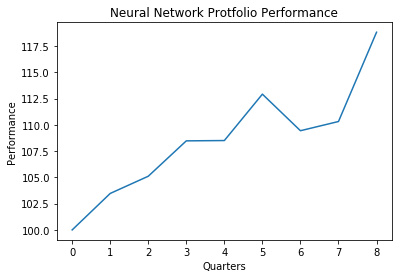

Compounded Result :18.813308870400206 %


In [34]:
total_performance(8)